In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from transformers import PreTrainedTokenizerFast
import torch
from transformers import BertForMaskedLM, DataCollatorForLanguageModeling
from torch.utils.data import Dataset
from torch.utils.data import DataLoader, random_split
from transformers import DataCollatorForLanguageModeling
from sklearn.model_selection import train_test_split
import os

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/hub.py:111: FutureWarning: Using `TRANSFORMERS_CACHE` is deprecated and will be removed in v5 of Transformers. Use `HF_HOME` instead.
  warnings.warn(
/home/jupyter/.local/lib/python3.10/site-packages/torchvision/io/image.py:13: UserWarning: Failed to load image Python extension: '/home/jupyter/.local/lib/python3.10/site-packages/torchvision/image.so: undefined symbol: _ZN3c1017RegisterOperatorsD1Ev'If you don't plan on using image functionality from `torchvision.io`, you can ignore this warning. Otherwise, there might be something wrong with your environment. Did you have `libjpeg` or `libpng` installed before building `torchvision` from source?
  warn(
2025-10-02 18:45:39.041203: I tensorflow/core/util/port.cc:110] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `

In [2]:
import lightning as L
import random
def set_random_seed(seed):
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


set_random_seed(42)
L.seed_everything(42)

Seed set to 42


42

Загрузка токенизатора и датасета

In [3]:
path = '/home/jupyter/datasphere/project/BERT project/'

In [4]:
path_dir_models_bert = '/home/jupyter/datasphere/project/BERT project/Models BERT/'

In [5]:
model_n_to_save = '1'

learning_rate = 1e-3
epochs = 20
dir_to_create_path = path_dir_models_bert + model_n_to_save + '/'
os.makedirs(dir_to_create_path, exist_ok=True)

In [6]:
fast_tokenizer = PreTrainedTokenizerFast(
    tokenizer_file=path + "my_tokenizer.json",
    pad_token="[PAD]",
    unk_token="[UNK]",
    cls_token="[CLS]",
    sep_token="[SEP]",
    mask_token="[MASK]"
)

Загрузка Датасета

In [7]:
data = pd.read_csv(path + 'PRIME_Dataset.csv')

In [8]:
texts = data['motif_id'].map(eval)

In [9]:
df = pd.DataFrame(texts)
df['len'] = df['motif_id'].str.len()
df['motif_id'] = df['motif_id'].map(' '.join)
df

,motif_id,len
0,AT3G22760 AT1G51140 AT2G42280 AT1G35460 AT1G51...,367
1,AT3G57920 AT3G61120 AT2G45650 AT4G18960 AT2G38...,411
2,AT4G30080 AT4G35550 AT4G38000 AT4G01280 AT1G49...,425
3,AT5G13790 AT5G10140 AT5G15800 AT4G18960 AT3G54...,352
4,AT3G46070 AT1G51600 AT2G38090 AT2G38090 AT4G38...,249
...,...,...
21180,AT1G70000 AT1G74840 AT5G08520 AT5G03150 AT5G67...,266
21181,AT3G30210 AT1G13450 AT1G02065 AT4G14770 AT3G24...,367
21182,AT3G25990 AT1G32510 AT5G18090 AT2G38090 AT1G18...,428
21183,AT2G22430 AT2G18350 AT1G69180 AT4G37790 AT3G24...,412


<Axes: xlabel='len', ylabel='Count'>

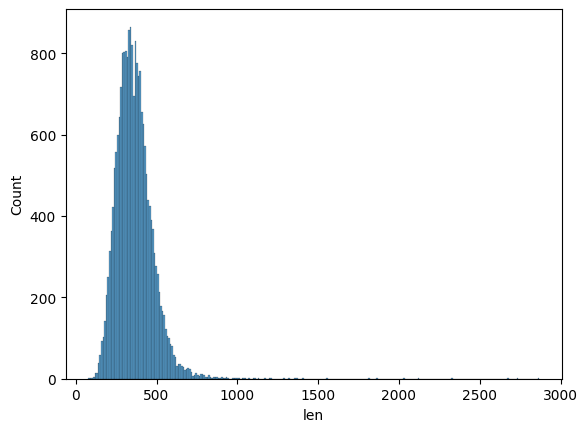

In [10]:
sns.histplot(df['len'])

In [11]:
max_position_embeddings = int(df['len'].quantile(0.95))
max_position_embeddings

551

(20120, 2)

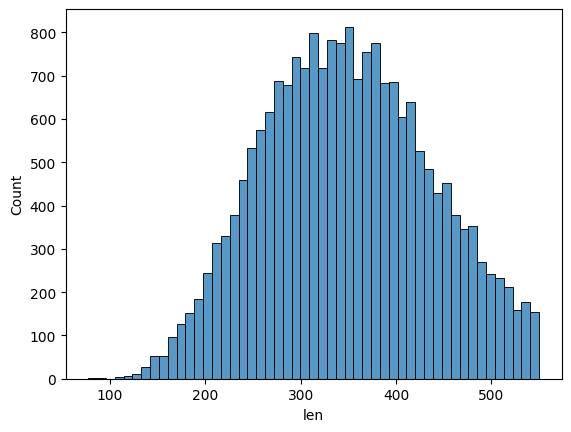

In [12]:
df = df[df['len'] < max_position_embeddings]
sns.histplot(df['len'])
df.shape

Подготовка Датасета

In [13]:
x_train, x = train_test_split(df['motif_id'], train_size=0.7, shuffle=True, random_state=42)
x_val, x_test = train_test_split(x, train_size=0.5, shuffle=True, random_state=42)

In [14]:
x_train

5294     AT3G23250 AT1G18570 AT1G79180 AT3G02940 AT5G54...
3744     AT1G15720 AT1G18960 AT3G24050 AT4G38620 AT4G04...
18095    AT5G64060 AT1G19040 AT1G32870 AT1G02250 AT5G64...
14064    AT1G79580 AT1G54330 AT5G66300 AT3G18400 AT5G46...
20081    AT2G38300 AT2G41835 AT3G62420 AT4G34590 AT3G49...
                               ...                        
11837    AT5G09410 AT5G64220 AT1G76870 AT3G46640 AT4G16...
12561    AT2G01570 AT2G01940 AT3G13810 AT1G19850 AT3G54...
5641     AT5G39760 AT4G36740 AT2G36610 AT2G18350 AT5G65...
903      AT2G20110 AT2G20570 AT2G41835 AT5G14960 AT1G69...
16626    AT1G18570 AT3G23250 AT5G14340 AT4G38620 AT4G21...
Name: motif_id, Length: 14084, dtype: object

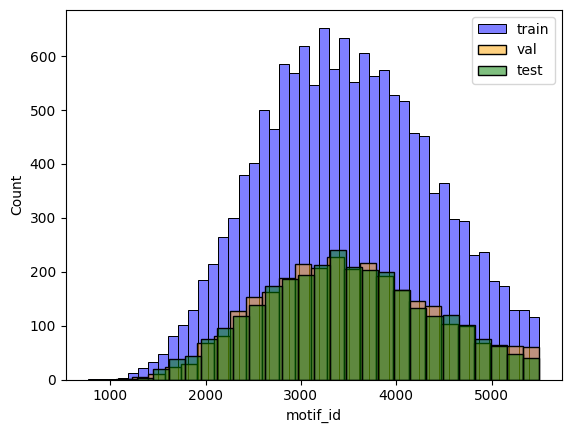

In [15]:
sns.histplot(x_train.str.len(), color='blue', label='train', alpha=0.5)
sns.histplot(x_val.str.len(), color='orange', label='val', alpha=0.5)
sns.histplot(x_test.str.len(), color='green', label='test', alpha=0.5)
plt.legend()

In [16]:
train_in = fast_tokenizer(x_train.tolist(), padding=True, truncation=True, max_length=max_position_embeddings, return_tensors="pt")
val_in = fast_tokenizer(x_val.tolist(), padding=True, truncation=True, max_length=max_position_embeddings, return_tensors="pt")
test_in = fast_tokenizer(x_test.tolist(), padding=True, truncation=True, max_length=max_position_embeddings, return_tensors="pt")

In [17]:
data_collator = DataCollatorForLanguageModeling(
            tokenizer=fast_tokenizer,
            mlm=True,
            mlm_probability=0.15
        )

class MLMDataset(torch.utils.data.Dataset):
    def __init__(self, encodings):
        self.encodings = encodings

    def __getitem__(self, idx):
        return {key: val[idx] for key, val in self.encodings.items()}

    def __len__(self):
        return len(self.encodings['input_ids'])

train_ds = MLMDataset(train_in)
val_ds = MLMDataset(val_in)
test_ds = MLMDataset(test_in)

train_loader = DataLoader(train_ds, batch_size=32, shuffle=True, collate_fn=data_collator)
val_loader = DataLoader(val_ds, batch_size=32, collate_fn=data_collator)
test_loader = DataLoader(test_ds, batch_size=32, collate_fn=data_collator)

Код Lightning

In [18]:
import torch
import torch.nn as nn
from torch.optim import AdamW
from transformers import BertForMaskedLM, get_cosine_schedule_with_warmup
from torchmetrics import MeanMetric, Accuracy
import math

class Pipeline(L.LightningModule):
    def __init__(
        self,
        model,
        exp_name="baseline",
        optimizer_class=AdamW,
        optimizer_kwargs={"lr": 1e-4, "weight_decay": 0.01},
        warmup_steps=1000,
        total_steps=None,
    ) -> None:
        super().__init__()
        self.model = model
        self.optimizer_class = optimizer_class
        self.optimizer_kwargs = optimizer_kwargs
        self.warmup_steps = warmup_steps
        self.total_steps = total_steps
        
        self.save_hyperparameters(ignore=['model'])
        
        self.train_loss = MeanMetric()
        self.val_loss = MeanMetric()
        self.test_loss = MeanMetric()
        
        # Точность предсказания масок
        vocab_size = model.config.vocab_size  # Получаем размер словаря из модели
        self.train_accuracy = Accuracy(task="multiclass", num_classes=vocab_size)
        self.val_accuracy = Accuracy(task="multiclass", num_classes=vocab_size)
        self.test_accuracy = Accuracy(task="multiclass", num_classes=vocab_size)
        
        # Для расчета перплексии на каждом шаге
        self.train_perplexity = MeanMetric()
        self.val_perplexity = MeanMetric()
        self.test_perplexity = MeanMetric()

    def configure_optimizers(self):
            optimizer = self.optimizer_class(
                self.model.parameters(), **self.optimizer_kwargs
            )

            # Если total_steps не задан, вычисляем автоматически
            if self.total_steps is None and self.trainer is not None:
                self.total_steps = self.trainer.estimated_stepping_batches

            if self.total_steps:
                scheduler = get_cosine_schedule_with_warmup(
                    optimizer,
                    num_warmup_steps=self.warmup_steps,
                    num_training_steps=self.total_steps,
                    num_cycles=0.5  # Для cosine annealing
                )

                return {
                    "optimizer": optimizer,
                    "lr_scheduler": {
                        "scheduler": scheduler,
                        "interval": "step",
                        "frequency": 1,
                    },
                }
            else:
                return optimizer

    def training_step(self, batch, batch_idx):
            outputs = self.model(**batch)
            loss = outputs.loss
            logits = outputs.logits

            # Вычисляем accuracy для масок
            masked_positions = batch['labels'] != -100
            if masked_positions.any():
                mask_predictions = logits[masked_positions].argmax(dim=-1)
                mask_labels = batch['labels'][masked_positions]
                accuracy = self.train_accuracy(mask_predictions, mask_labels)
                self.log('train_accuracy', accuracy, on_step=True, on_epoch=True, prog_bar=True)

            # Вычисляем перплексию для этого батча
            perplexity = torch.exp(loss)
            self.train_perplexity(perplexity)
            self.log('train_perplexity_step', perplexity, on_step=True, on_epoch=False, prog_bar=False)

            self.train_loss(loss)
            self.log('train_loss', loss, on_step=True, on_epoch=True, prog_bar=True)

            if self.trainer and self.trainer.optimizers:
                self.log('learning_rate', self.trainer.optimizers[0].param_groups[0]['lr'], on_step=True)

            return loss

    def validation_step(self, batch, batch_idx):
        outputs = self.model(**batch)
        loss = outputs.loss
        logits = outputs.logits

        # Accuracy для валидации
        masked_positions = batch['labels'] != -100
        if masked_positions.any():
            mask_predictions = logits[masked_positions].argmax(dim=-1)
            mask_labels = batch['labels'][masked_positions]
            accuracy = self.val_accuracy(mask_predictions, mask_labels)
            self.log('val_accuracy', accuracy, on_step=False, on_epoch=True, prog_bar=True)

        # Перплексия для валидации
        perplexity = torch.exp(loss)
        self.val_perplexity(perplexity)
        self.log('val_perplexity_step', perplexity, on_step=True, on_epoch=False, prog_bar=False)
        
        self.val_loss(loss)
        self.log('val_loss', loss, on_step=False, on_epoch=True, prog_bar=True)

        return loss

    def test_step(self, batch, batch_idx):
        outputs = self.model(**batch)
        loss = outputs.loss
        logits = outputs.logits

        # Accuracy для теста
        masked_positions = batch['labels'] != -100
        if masked_positions.any():
            mask_predictions = logits[masked_positions].argmax(dim=-1)
            mask_labels = batch['labels'][masked_positions]
            accuracy = self.test_accuracy(mask_predictions, mask_labels)
            self.log('test_accuracy', accuracy, on_step=False, on_epoch=True)

        # Перплексия для теста
        perplexity = torch.exp(loss)
        self.test_perplexity(perplexity)
        
        self.test_loss(loss)
        self.log('test_loss', loss, on_step=False, on_epoch=True)

        return loss

    def on_train_epoch_end(self):
        # Вычисляем среднюю перплексию за эпоху
        train_perplexity_epoch = self.train_perplexity.compute()
        val_perplexity_epoch = self.val_perplexity.compute()
        
        # Также вычисляем перплексию из среднего loss (альтернативный расчет)
        train_loss_epoch = self.train_loss.compute()
        val_loss_epoch = self.val_loss.compute()
        train_perplexity_from_loss = torch.exp(train_loss_epoch)
        val_perplexity_from_loss = torch.exp(val_loss_epoch)

        # Логируем оба варианта
        self.log('train_perplexity_epoch', train_perplexity_epoch, on_epoch=True, prog_bar=True)
        self.log('val_perplexity_epoch', val_perplexity_epoch, on_epoch=True, prog_bar=True)
        self.log('train_perplexity_from_loss', train_perplexity_from_loss, on_epoch=True)
        self.log('val_perplexity_from_loss', val_perplexity_from_loss, on_epoch=True)

        # Сбрасываем метрики
        self.train_loss.reset()
        self.val_loss.reset()
        self.train_accuracy.reset()
        self.val_accuracy.reset()
        self.train_perplexity.reset()
        self.val_perplexity.reset()

    def on_test_epoch_end(self):
        # Вычисляем перплексию для теста
        test_perplexity_epoch = self.test_perplexity.compute()
        test_loss_epoch = self.test_loss.compute()
        test_perplexity_from_loss = torch.exp(test_loss_epoch)
        
        self.log('test_perplexity_epoch', test_perplexity_epoch, on_epoch=True)
        self.log('test_perplexity_from_loss', test_perplexity_from_loss, on_epoch=True)
        
        # Сбрасываем метрики теста
        self.test_loss.reset()
        self.test_accuracy.reset()
        self.test_perplexity.reset()

Обучение Lightning

In [19]:
from transformers import BertConfig

config = BertConfig(
    vocab_size=620,                                          # Должен совпадать с размером словаря
    hidden_size=768,
    num_hidden_layers=4,                                     #4-6 слоев
    num_attention_heads=4,                                   #4-6 слоев
    intermediate_size=3072,
    max_position_embeddings=max_position_embeddings,
)

In [ ]:
from lightning.pytorch.callbacks import ModelCheckpoint, EarlyStopping, LearningRateMonitor
from lightning.pytorch import Trainer
from lightning.pytorch.loggers import TensorBoardLogger

tokenizer = fast_tokenizer

model = BertForMaskedLM(config)
exp_name = f'{model_n_to_save}'
logger = TensorBoardLogger(save_dir=path_dir_models_bert + model_n_to_save + '/logs/', name=exp_name)

pipeline = Pipeline(
    model=model,
    exp_name=exp_name,
    optimizer_class=AdamW,
    optimizer_kwargs={"lr": learning_rate, "weight_decay": 0.01},
    warmup_steps=1000,
)

checkpoint_callback = ModelCheckpoint(
    monitor="val_perplexity", mode="min", filename="best"
)

trainer = Trainer(
        max_epochs=epochs,
        callbacks=[checkpoint_callback],
        log_every_n_steps=10,
        logger=logger,
    )

trainer.fit(
    model=pipeline,
    train_dataloaders=train_loader,
    val_dataloaders=val_loader,
)



GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
You are using a CUDA device ('NVIDIA L4') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
Loading `train_dataloader` to estimate number of stepping batches.
/home/jupyter/.local/lib/python3.10/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=7` in the `DataLoader` to improve performance.

  | Name             | Type               | Params | Mode 
------------------------------------------------------

Sanity Checking DataLoader 0:   0%|          | 0/2 [00:00<?, ?it/s]

/home/jupyter/.local/lib/python3.10/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=7` in the `DataLoader` to improve performance.
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=ob

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:   0%|          | 0/441 [00:00<?, ?it/s] 

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:   0%|          | 2/441 [00:04<14:40,  0.50it/s, v_num=12, train_accuracy_step=0.000589, train_loss_step=6.600]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:   0%|          | 2/441 [00:04<15:39,  0.47it/s, v_num=12, train_accuracy_step=0.00239, train_loss_step=6.580] 

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:   1%|          | 3/441 [00:04<11:29,  0.63it/s, v_num=12, train_accuracy_step=0.00339, train_loss_step=6.560]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:   1%|          | 4/441 [00:05<09:24,  0.77it/s, v_num=12, train_accuracy_step=0.000, train_loss_step=6.580]  

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:   1%|          | 5/441 [00:05<08:09,  0.89it/s, v_num=12, train_accuracy_step=0.00181, train_loss_step=6.540]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:   2%|▏         | 7/441 [00:06<06:25,  1.12it/s, v_num=12, train_accuracy_step=0.00238, train_loss_step=6.520]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:   2%|▏         | 7/441 [00:06<06:42,  1.08it/s, v_num=12, train_accuracy_step=0.00116, train_loss_step=6.550]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:   2%|▏         | 8/441 [00:06<06:14,  1.15it/s, v_num=12, train_accuracy_step=0.00265, train_loss_step=6.500]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:   2%|▏         | 9/441 [00:07<05:53,  1.22it/s, v_num=12, train_accuracy_step=0.00243, train_loss_step=6.470]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:   2%|▏         | 10/441 [00:07<05:36,  1.28it/s, v_num=12, train_accuracy_step=0.00372, train_loss_step=6.450]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:   3%|▎         | 12/441 [00:08<05:01,  1.42it/s, v_num=12, train_accuracy_step=0.00319, train_loss_step=6.430]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:   3%|▎         | 12/441 [00:08<05:10,  1.38it/s, v_num=12, train_accuracy_step=0.00523, train_loss_step=6.400]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:   3%|▎         | 13/441 [00:09<05:00,  1.42it/s, v_num=12, train_accuracy_step=0.00602, train_loss_step=6.430]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:   3%|▎         | 14/441 [00:09<04:51,  1.46it/s, v_num=12, train_accuracy_step=0.00579, train_loss_step=6.360]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:   3%|▎         | 15/441 [00:10<04:44,  1.50it/s, v_num=12, train_accuracy_step=0.00415, train_loss_step=6.360]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:   4%|▍         | 17/441 [00:10<04:25,  1.60it/s, v_num=12, train_accuracy_step=0.00441, train_loss_step=6.360]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:   4%|▍         | 17/441 [00:10<04:31,  1.56it/s, v_num=12, train_accuracy_step=0.00858, train_loss_step=6.330]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:   4%|▍         | 18/441 [00:11<04:26,  1.59it/s, v_num=12, train_accuracy_step=0.00953, train_loss_step=6.340]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:   4%|▍         | 19/441 [00:11<04:21,  1.61it/s, v_num=12, train_accuracy_step=0.00841, train_loss_step=6.300]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:   5%|▍         | 20/441 [00:12<04:17,  1.64it/s, v_num=12, train_accuracy_step=0.012, train_loss_step=6.300]  

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:   5%|▍         | 22/441 [00:12<04:04,  1.71it/s, v_num=12, train_accuracy_step=0.00492, train_loss_step=6.240]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:   5%|▍         | 22/441 [00:13<04:09,  1.68it/s, v_num=12, train_accuracy_step=0.00623, train_loss_step=6.240]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:   5%|▌         | 23/441 [00:13<04:06,  1.70it/s, v_num=12, train_accuracy_step=0.0101, train_loss_step=6.300] 

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:   5%|▌         | 24/441 [00:13<04:02,  1.72it/s, v_num=12, train_accuracy_step=0.0093, train_loss_step=6.230]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:   6%|▌         | 25/441 [00:14<03:59,  1.73it/s, v_num=12, train_accuracy_step=0.0101, train_loss_step=6.220]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:   6%|▌         | 27/441 [00:15<03:50,  1.80it/s, v_num=12, train_accuracy_step=0.015, train_loss_step=6.150] 

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:   6%|▌         | 27/441 [00:15<03:54,  1.76it/s, v_num=12, train_accuracy_step=0.0113, train_loss_step=6.170]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:   6%|▋         | 28/441 [00:15<03:52,  1.78it/s, v_num=12, train_accuracy_step=0.00726, train_loss_step=6.220]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:   7%|▋         | 29/441 [00:16<03:49,  1.79it/s, v_num=12, train_accuracy_step=0.0115, train_loss_step=6.160] 

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:   7%|▋         | 30/441 [00:16<03:47,  1.80it/s, v_num=12, train_accuracy_step=0.0129, train_loss_step=6.150]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:   7%|▋         | 32/441 [00:17<03:40,  1.86it/s, v_num=12, train_accuracy_step=0.00832, train_loss_step=6.240]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:   7%|▋         | 32/441 [00:17<03:43,  1.83it/s, v_num=12, train_accuracy_step=0.0171, train_loss_step=6.120] 

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:   7%|▋         | 33/441 [00:17<03:41,  1.84it/s, v_num=12, train_accuracy_step=0.0113, train_loss_step=6.110]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:   8%|▊         | 34/441 [00:18<03:40,  1.85it/s, v_num=12, train_accuracy_step=0.00969, train_loss_step=6.190]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:   8%|▊         | 35/441 [00:18<03:38,  1.86it/s, v_num=12, train_accuracy_step=0.0105, train_loss_step=6.210] 

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:   8%|▊         | 37/441 [00:19<03:32,  1.90it/s, v_num=12, train_accuracy_step=0.0158, train_loss_step=6.110]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:   8%|▊         | 37/441 [00:19<03:35,  1.88it/s, v_num=12, train_accuracy_step=0.0126, train_loss_step=6.160]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:   9%|▊         | 38/441 [00:20<03:33,  1.89it/s, v_num=12, train_accuracy_step=0.0139, train_loss_step=6.160]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:   9%|▉         | 39/441 [00:20<03:32,  1.89it/s, v_num=12, train_accuracy_step=0.0115, train_loss_step=6.180]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:   9%|▉         | 40/441 [00:21<03:30,  1.90it/s, v_num=12, train_accuracy_step=0.00561, train_loss_step=6.200]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:   9%|▉         | 41/441 [00:21<03:29,  1.91it/s, v_num=12, train_accuracy_step=0.00715, train_loss_step=6.120]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  10%|▉         | 42/441 [00:21<03:28,  1.92it/s, v_num=12, train_accuracy_step=0.0158, train_loss_step=6.030] 

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  10%|▉         | 43/441 [00:22<03:27,  1.92it/s, v_num=12, train_accuracy_step=0.00874, train_loss_step=6.050]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  10%|▉         | 44/441 [00:22<03:25,  1.93it/s, v_num=12, train_accuracy_step=0.0147, train_loss_step=6.080] 

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  10%|█         | 46/441 [00:23<03:21,  1.96it/s, v_num=12, train_accuracy_step=0.0115, train_loss_step=6.080]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  10%|█         | 46/441 [00:23<03:23,  1.94it/s, v_num=12, train_accuracy_step=0.0183, train_loss_step=6.090]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  11%|█         | 47/441 [00:24<03:22,  1.95it/s, v_num=12, train_accuracy_step=0.0118, train_loss_step=6.070]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  11%|█         | 48/441 [00:24<03:21,  1.95it/s, v_num=12, train_accuracy_step=0.0134, train_loss_step=6.040]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  11%|█         | 49/441 [00:25<03:20,  1.96it/s, v_num=12, train_accuracy_step=0.0142, train_loss_step=6.130]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  12%|█▏        | 51/441 [00:25<03:16,  1.99it/s, v_num=12, train_accuracy_step=0.0121, train_loss_step=6.080]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  12%|█▏        | 51/441 [00:25<03:18,  1.97it/s, v_num=12, train_accuracy_step=0.0162, train_loss_step=5.960]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  12%|█▏        | 52/441 [00:26<03:17,  1.97it/s, v_num=12, train_accuracy_step=0.0177, train_loss_step=6.070]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  12%|█▏        | 53/441 [00:26<03:16,  1.98it/s, v_num=12, train_accuracy_step=0.0135, train_loss_step=6.120]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  12%|█▏        | 54/441 [00:27<03:15,  1.98it/s, v_num=12, train_accuracy_step=0.0279, train_loss_step=6.010]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  13%|█▎        | 56/441 [00:27<03:11,  2.01it/s, v_num=12, train_accuracy_step=0.0186, train_loss_step=6.030]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  13%|█▎        | 56/441 [00:28<03:13,  1.99it/s, v_num=12, train_accuracy_step=0.0157, train_loss_step=5.980]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  13%|█▎        | 57/441 [00:28<03:12,  2.00it/s, v_num=12, train_accuracy_step=0.0153, train_loss_step=5.980]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  13%|█▎        | 58/441 [00:29<03:11,  2.00it/s, v_num=12, train_accuracy_step=0.0107, train_loss_step=6.020]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  13%|█▎        | 59/441 [00:29<03:10,  2.00it/s, v_num=12, train_accuracy_step=0.013, train_loss_step=6.040] 

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  14%|█▎        | 60/441 [00:29<03:09,  2.01it/s, v_num=12, train_accuracy_step=0.0164, train_loss_step=6.050]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  14%|█▍        | 61/441 [00:30<03:08,  2.01it/s, v_num=12, train_accuracy_step=0.018, train_loss_step=6.040] 

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  14%|█▍        | 62/441 [00:30<03:08,  2.01it/s, v_num=12, train_accuracy_step=0.0173, train_loss_step=5.960]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  14%|█▍        | 63/441 [00:31<03:07,  2.02it/s, v_num=12, train_accuracy_step=0.0102, train_loss_step=6.210]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  15%|█▍        | 65/441 [00:31<03:04,  2.04it/s, v_num=12, train_accuracy_step=0.0112, train_loss_step=6.120]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  15%|█▍        | 65/441 [00:32<03:05,  2.02it/s, v_num=12, train_accuracy_step=0.0182, train_loss_step=6.010]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  15%|█▍        | 66/441 [00:32<03:04,  2.03it/s, v_num=12, train_accuracy_step=0.018, train_loss_step=6.060] 

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  15%|█▌        | 67/441 [00:32<03:04,  2.03it/s, v_num=12, train_accuracy_step=0.0249, train_loss_step=6.020]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  15%|█▌        | 68/441 [00:33<03:03,  2.03it/s, v_num=12, train_accuracy_step=0.0252, train_loss_step=6.070]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  16%|█▌        | 70/441 [00:34<03:00,  2.06it/s, v_num=12, train_accuracy_step=0.0277, train_loss_step=5.990]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  16%|█▌        | 70/441 [00:34<03:01,  2.04it/s, v_num=12, train_accuracy_step=0.0176, train_loss_step=6.070]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  16%|█▌        | 71/441 [00:34<03:01,  2.04it/s, v_num=12, train_accuracy_step=0.0197, train_loss_step=6.000]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  16%|█▋        | 72/441 [00:35<03:00,  2.04it/s, v_num=12, train_accuracy_step=0.0207, train_loss_step=6.080]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  17%|█▋        | 73/441 [00:35<02:59,  2.05it/s, v_num=12, train_accuracy_step=0.0208, train_loss_step=6.000]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  17%|█▋        | 74/441 [00:36<02:59,  2.05it/s, v_num=12, train_accuracy_step=0.0176, train_loss_step=6.040]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  17%|█▋        | 75/441 [00:36<02:58,  2.05it/s, v_num=12, train_accuracy_step=0.017, train_loss_step=6.050] 

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  17%|█▋        | 76/441 [00:36<02:57,  2.05it/s, v_num=12, train_accuracy_step=0.017, train_loss_step=6.100]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  17%|█▋        | 77/441 [00:37<02:56,  2.06it/s, v_num=12, train_accuracy_step=0.0303, train_loss_step=5.930]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  18%|█▊        | 79/441 [00:38<02:54,  2.08it/s, v_num=12, train_accuracy_step=0.0269, train_loss_step=5.930]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  18%|█▊        | 79/441 [00:38<02:55,  2.06it/s, v_num=12, train_accuracy_step=0.0187, train_loss_step=6.010]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  18%|█▊        | 80/441 [00:38<02:54,  2.06it/s, v_num=12, train_accuracy_step=0.0309, train_loss_step=5.960]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  18%|█▊        | 81/441 [00:39<02:54,  2.07it/s, v_num=12, train_accuracy_step=0.0351, train_loss_step=5.970]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  19%|█▊        | 82/441 [00:39<02:53,  2.07it/s, v_num=12, train_accuracy_step=0.0282, train_loss_step=5.970]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  19%|█▉        | 83/441 [00:40<02:52,  2.07it/s, v_num=12, train_accuracy_step=0.0379, train_loss_step=5.990]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  19%|█▉        | 84/441 [00:40<02:52,  2.07it/s, v_num=12, train_accuracy_step=0.0331, train_loss_step=5.920]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  19%|█▉        | 85/441 [00:41<02:51,  2.07it/s, v_num=12, train_accuracy_step=0.0373, train_loss_step=5.980]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  20%|█▉        | 86/441 [00:41<02:51,  2.07it/s, v_num=12, train_accuracy_step=0.0339, train_loss_step=5.950]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  20%|█▉        | 88/441 [00:42<02:48,  2.09it/s, v_num=12, train_accuracy_step=0.0383, train_loss_step=5.940]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  20%|█▉        | 88/441 [00:42<02:49,  2.08it/s, v_num=12, train_accuracy_step=0.0473, train_loss_step=5.900]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  20%|██        | 89/441 [00:42<02:49,  2.08it/s, v_num=12, train_accuracy_step=0.0469, train_loss_step=5.930]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  20%|██        | 90/441 [00:43<02:48,  2.08it/s, v_num=12, train_accuracy_step=0.0359, train_loss_step=5.970]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  21%|██        | 91/441 [00:43<02:47,  2.08it/s, v_num=12, train_accuracy_step=0.0301, train_loss_step=6.000]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  21%|██        | 92/441 [00:44<02:47,  2.08it/s, v_num=12, train_accuracy_step=0.0437, train_loss_step=5.870]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  21%|██        | 93/441 [00:44<02:46,  2.09it/s, v_num=12, train_accuracy_step=0.0519, train_loss_step=5.910]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  21%|██▏       | 94/441 [00:45<02:46,  2.09it/s, v_num=12, train_accuracy_step=0.0301, train_loss_step=6.060]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  22%|██▏       | 95/441 [00:45<02:45,  2.09it/s, v_num=12, train_accuracy_step=0.041, train_loss_step=5.980] 

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  22%|██▏       | 97/441 [00:46<02:43,  2.10it/s, v_num=12, train_accuracy_step=0.0464, train_loss_step=5.920]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  22%|██▏       | 97/441 [00:46<02:44,  2.09it/s, v_num=12, train_accuracy_step=0.0433, train_loss_step=5.920]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  22%|██▏       | 98/441 [00:46<02:43,  2.09it/s, v_num=12, train_accuracy_step=0.0421, train_loss_step=5.900]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  22%|██▏       | 99/441 [00:47<02:43,  2.09it/s, v_num=12, train_accuracy_step=0.044, train_loss_step=5.970] 

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  23%|██▎       | 101/441 [00:47<02:41,  2.11it/s, v_num=12, train_accuracy_step=0.0481, train_loss_step=5.920]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  23%|██▎       | 101/441 [00:48<02:42,  2.10it/s, v_num=12, train_accuracy_step=0.0438, train_loss_step=5.980]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  23%|██▎       | 102/441 [00:48<02:41,  2.10it/s, v_num=12, train_accuracy_step=0.0411, train_loss_step=5.970]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  23%|██▎       | 103/441 [00:49<02:40,  2.10it/s, v_num=12, train_accuracy_step=0.0489, train_loss_step=5.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  24%|██▎       | 104/441 [00:49<02:40,  2.10it/s, v_num=12, train_accuracy_step=0.048, train_loss_step=5.870] 

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  24%|██▍       | 105/441 [00:49<02:39,  2.10it/s, v_num=12, train_accuracy_step=0.0501, train_loss_step=5.940]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  24%|██▍       | 106/441 [00:50<02:39,  2.10it/s, v_num=12, train_accuracy_step=0.0607, train_loss_step=5.770]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  24%|██▍       | 107/441 [00:50<02:38,  2.10it/s, v_num=12, train_accuracy_step=0.0491, train_loss_step=5.830]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  24%|██▍       | 108/441 [00:51<02:38,  2.11it/s, v_num=12, train_accuracy_step=0.067, train_loss_step=5.750] 

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  25%|██▍       | 109/441 [00:51<02:37,  2.11it/s, v_num=12, train_accuracy_step=0.0605, train_loss_step=5.900]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  25%|██▍       | 110/441 [00:52<02:36,  2.11it/s, v_num=12, train_accuracy_step=0.0452, train_loss_step=5.950]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  25%|██▌       | 111/441 [00:52<02:36,  2.11it/s, v_num=12, train_accuracy_step=0.062, train_loss_step=5.770] 

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  25%|██▌       | 112/441 [00:53<02:35,  2.11it/s, v_num=12, train_accuracy_step=0.0524, train_loss_step=5.960]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  26%|██▌       | 114/441 [00:53<02:34,  2.12it/s, v_num=12, train_accuracy_step=0.0604, train_loss_step=5.740]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  26%|██▌       | 114/441 [00:53<02:34,  2.11it/s, v_num=12, train_accuracy_step=0.0567, train_loss_step=5.870]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  26%|██▌       | 115/441 [00:54<02:34,  2.11it/s, v_num=12, train_accuracy_step=0.0626, train_loss_step=5.820]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  26%|██▋       | 116/441 [00:54<02:33,  2.11it/s, v_num=12, train_accuracy_step=0.0677, train_loss_step=5.900]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  27%|██▋       | 117/441 [00:55<02:33,  2.12it/s, v_num=12, train_accuracy_step=0.058, train_loss_step=5.880] 

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  27%|██▋       | 118/441 [00:55<02:32,  2.12it/s, v_num=12, train_accuracy_step=0.0673, train_loss_step=5.800]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  27%|██▋       | 119/441 [00:56<02:32,  2.12it/s, v_num=12, train_accuracy_step=0.0628, train_loss_step=5.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  27%|██▋       | 120/441 [00:56<02:31,  2.12it/s, v_num=12, train_accuracy_step=0.0542, train_loss_step=5.880]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  27%|██▋       | 121/441 [00:57<02:30,  2.12it/s, v_num=12, train_accuracy_step=0.0658, train_loss_step=5.770]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  28%|██▊       | 122/441 [00:57<02:30,  2.12it/s, v_num=12, train_accuracy_step=0.0675, train_loss_step=5.770]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  28%|██▊       | 123/441 [00:57<02:29,  2.12it/s, v_num=12, train_accuracy_step=0.0657, train_loss_step=5.770]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  28%|██▊       | 124/441 [00:58<02:29,  2.12it/s, v_num=12, train_accuracy_step=0.0709, train_loss_step=5.870]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  28%|██▊       | 125/441 [00:58<02:28,  2.12it/s, v_num=12, train_accuracy_step=0.0841, train_loss_step=5.730]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  29%|██▉       | 127/441 [00:59<02:27,  2.13it/s, v_num=12, train_accuracy_step=0.0692, train_loss_step=5.840]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  29%|██▉       | 127/441 [00:59<02:27,  2.12it/s, v_num=12, train_accuracy_step=0.0801, train_loss_step=5.770]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  29%|██▉       | 128/441 [01:00<02:27,  2.13it/s, v_num=12, train_accuracy_step=0.0788, train_loss_step=5.730]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  29%|██▉       | 129/441 [01:00<02:26,  2.13it/s, v_num=12, train_accuracy_step=0.0857, train_loss_step=5.610]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  30%|██▉       | 131/441 [01:01<02:25,  2.14it/s, v_num=12, train_accuracy_step=0.0717, train_loss_step=5.750]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  30%|██▉       | 131/441 [01:01<02:25,  2.13it/s, v_num=12, train_accuracy_step=0.081, train_loss_step=5.730] 

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  30%|██▉       | 132/441 [01:02<02:25,  2.13it/s, v_num=12, train_accuracy_step=0.085, train_loss_step=5.710]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  30%|███       | 133/441 [01:02<02:24,  2.13it/s, v_num=12, train_accuracy_step=0.080, train_loss_step=5.790]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  30%|███       | 134/441 [01:02<02:24,  2.13it/s, v_num=12, train_accuracy_step=0.0809, train_loss_step=5.730]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  31%|███       | 135/441 [01:03<02:23,  2.13it/s, v_num=12, train_accuracy_step=0.0891, train_loss_step=5.710]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  31%|███       | 136/441 [01:03<02:23,  2.13it/s, v_num=12, train_accuracy_step=0.0906, train_loss_step=5.750]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  31%|███       | 137/441 [01:04<02:22,  2.13it/s, v_num=12, train_accuracy_step=0.104, train_loss_step=5.650] 

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  31%|███▏      | 138/441 [01:04<02:22,  2.13it/s, v_num=12, train_accuracy_step=0.0924, train_loss_step=5.720]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  32%|███▏      | 139/441 [01:05<02:21,  2.13it/s, v_num=12, train_accuracy_step=0.105, train_loss_step=5.730] 

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  32%|███▏      | 140/441 [01:05<02:21,  2.13it/s, v_num=12, train_accuracy_step=0.0733, train_loss_step=5.840]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  32%|███▏      | 141/441 [01:06<02:20,  2.13it/s, v_num=12, train_accuracy_step=0.0858, train_loss_step=5.790]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  32%|███▏      | 142/441 [01:06<02:20,  2.13it/s, v_num=12, train_accuracy_step=0.0909, train_loss_step=5.650]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  32%|███▏      | 143/441 [01:06<02:19,  2.14it/s, v_num=12, train_accuracy_step=0.0864, train_loss_step=5.640]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  33%|███▎      | 144/441 [01:07<02:19,  2.14it/s, v_num=12, train_accuracy_step=0.102, train_loss_step=5.580] 

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  33%|███▎      | 145/441 [01:07<02:18,  2.14it/s, v_num=12, train_accuracy_step=0.109, train_loss_step=5.660]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  33%|███▎      | 146/441 [01:08<02:18,  2.14it/s, v_num=12, train_accuracy_step=0.0884, train_loss_step=5.750]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  33%|███▎      | 147/441 [01:08<02:17,  2.14it/s, v_num=12, train_accuracy_step=0.0998, train_loss_step=5.610]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  34%|███▎      | 148/441 [01:09<02:17,  2.14it/s, v_num=12, train_accuracy_step=0.0855, train_loss_step=5.820]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  34%|███▍      | 149/441 [01:09<02:16,  2.14it/s, v_num=12, train_accuracy_step=0.0922, train_loss_step=5.760]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  34%|███▍      | 150/441 [01:10<02:16,  2.14it/s, v_num=12, train_accuracy_step=0.0928, train_loss_step=5.800]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  34%|███▍      | 151/441 [01:10<02:15,  2.14it/s, v_num=12, train_accuracy_step=0.0953, train_loss_step=5.650]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  34%|███▍      | 152/441 [01:11<02:15,  2.14it/s, v_num=12, train_accuracy_step=0.109, train_loss_step=5.620] 

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  35%|███▍      | 153/441 [01:11<02:14,  2.14it/s, v_num=12, train_accuracy_step=0.101, train_loss_step=5.690]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  35%|███▍      | 154/441 [01:11<02:14,  2.14it/s, v_num=12, train_accuracy_step=0.108, train_loss_step=5.570]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  35%|███▌      | 155/441 [01:12<02:13,  2.14it/s, v_num=12, train_accuracy_step=0.0999, train_loss_step=5.630]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  35%|███▌      | 156/441 [01:12<02:13,  2.14it/s, v_num=12, train_accuracy_step=0.102, train_loss_step=5.650] 

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  36%|███▌      | 157/441 [01:13<02:12,  2.14it/s, v_num=12, train_accuracy_step=0.111, train_loss_step=5.640]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  36%|███▌      | 158/441 [01:13<02:12,  2.14it/s, v_num=12, train_accuracy_step=0.0962, train_loss_step=5.750]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  36%|███▋      | 160/441 [01:14<02:10,  2.15it/s, v_num=12, train_accuracy_step=0.0953, train_loss_step=5.820]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  36%|███▋      | 160/441 [01:14<02:11,  2.14it/s, v_num=12, train_accuracy_step=0.113, train_loss_step=5.660] 

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  37%|███▋      | 161/441 [01:15<02:10,  2.14it/s, v_num=12, train_accuracy_step=0.116, train_loss_step=5.570]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  37%|███▋      | 162/441 [01:15<02:10,  2.15it/s, v_num=12, train_accuracy_step=0.0957, train_loss_step=5.700]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  37%|███▋      | 164/441 [01:16<02:08,  2.15it/s, v_num=12, train_accuracy_step=0.101, train_loss_step=5.650] 

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  37%|███▋      | 164/441 [01:16<02:09,  2.15it/s, v_num=12, train_accuracy_step=0.113, train_loss_step=5.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  37%|███▋      | 165/441 [01:16<02:08,  2.15it/s, v_num=12, train_accuracy_step=0.103, train_loss_step=5.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  38%|███▊      | 166/441 [01:17<02:08,  2.15it/s, v_num=12, train_accuracy_step=0.0896, train_loss_step=5.710]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  38%|███▊      | 168/441 [01:17<02:06,  2.16it/s, v_num=12, train_accuracy_step=0.105, train_loss_step=5.640] 

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  38%|███▊      | 168/441 [01:18<02:07,  2.15it/s, v_num=12, train_accuracy_step=0.104, train_loss_step=5.600]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  38%|███▊      | 169/441 [01:18<02:06,  2.15it/s, v_num=12, train_accuracy_step=0.112, train_loss_step=5.570]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  39%|███▊      | 170/441 [01:19<02:06,  2.15it/s, v_num=12, train_accuracy_step=0.105, train_loss_step=5.570]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  39%|███▉      | 172/441 [01:19<02:04,  2.16it/s, v_num=12, train_accuracy_step=0.0963, train_loss_step=5.710]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  39%|███▉      | 172/441 [01:20<02:05,  2.15it/s, v_num=12, train_accuracy_step=0.100, train_loss_step=5.660] 

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  39%|███▉      | 173/441 [01:20<02:04,  2.15it/s, v_num=12, train_accuracy_step=0.126, train_loss_step=5.530]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  39%|███▉      | 174/441 [01:20<02:04,  2.15it/s, v_num=12, train_accuracy_step=0.109, train_loss_step=5.600]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  40%|███▉      | 175/441 [01:21<02:03,  2.15it/s, v_num=12, train_accuracy_step=0.104, train_loss_step=5.610]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  40%|███▉      | 176/441 [01:21<02:03,  2.15it/s, v_num=12, train_accuracy_step=0.102, train_loss_step=5.640]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  40%|████      | 177/441 [01:22<02:02,  2.15it/s, v_num=12, train_accuracy_step=0.121, train_loss_step=5.520]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  40%|████      | 178/441 [01:22<02:02,  2.15it/s, v_num=12, train_accuracy_step=0.114, train_loss_step=5.590]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  41%|████      | 180/441 [01:23<02:00,  2.16it/s, v_num=12, train_accuracy_step=0.101, train_loss_step=5.630]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  41%|████      | 180/441 [01:23<02:01,  2.15it/s, v_num=12, train_accuracy_step=0.117, train_loss_step=5.510]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  41%|████      | 181/441 [01:24<02:00,  2.15it/s, v_num=12, train_accuracy_step=0.102, train_loss_step=5.630]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  41%|████▏     | 182/441 [01:24<02:00,  2.15it/s, v_num=12, train_accuracy_step=0.111, train_loss_step=5.500]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  41%|████▏     | 183/441 [01:24<01:59,  2.15it/s, v_num=12, train_accuracy_step=0.113, train_loss_step=5.620]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  42%|████▏     | 184/441 [01:25<01:59,  2.15it/s, v_num=12, train_accuracy_step=0.111, train_loss_step=5.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  42%|████▏     | 185/441 [01:25<01:58,  2.15it/s, v_num=12, train_accuracy_step=0.106, train_loss_step=5.620]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  42%|████▏     | 186/441 [01:26<01:58,  2.15it/s, v_num=12, train_accuracy_step=0.100, train_loss_step=5.650]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  42%|████▏     | 187/441 [01:26<01:57,  2.15it/s, v_num=12, train_accuracy_step=0.114, train_loss_step=5.630]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  43%|████▎     | 188/441 [01:27<01:57,  2.15it/s, v_num=12, train_accuracy_step=0.111, train_loss_step=5.620]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  43%|████▎     | 189/441 [01:27<01:56,  2.16it/s, v_num=12, train_accuracy_step=0.126, train_loss_step=5.400]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  43%|████▎     | 190/441 [01:28<01:56,  2.16it/s, v_num=12, train_accuracy_step=0.111, train_loss_step=5.590]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  43%|████▎     | 191/441 [01:28<01:55,  2.16it/s, v_num=12, train_accuracy_step=0.103, train_loss_step=5.550]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  44%|████▎     | 192/441 [01:29<01:55,  2.16it/s, v_num=12, train_accuracy_step=0.111, train_loss_step=5.640]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  44%|████▍     | 193/441 [01:29<01:55,  2.16it/s, v_num=12, train_accuracy_step=0.120, train_loss_step=5.500]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  44%|████▍     | 195/441 [01:30<01:53,  2.16it/s, v_num=12, train_accuracy_step=0.0941, train_loss_step=5.690]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  44%|████▍     | 195/441 [01:30<01:54,  2.16it/s, v_num=12, train_accuracy_step=0.106, train_loss_step=5.550] 

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  44%|████▍     | 196/441 [01:30<01:53,  2.16it/s, v_num=12, train_accuracy_step=0.108, train_loss_step=5.570]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  45%|████▍     | 197/441 [01:31<01:53,  2.16it/s, v_num=12, train_accuracy_step=0.108, train_loss_step=5.510]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  45%|████▍     | 198/441 [01:31<01:52,  2.16it/s, v_num=12, train_accuracy_step=0.107, train_loss_step=5.650]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  45%|████▌     | 199/441 [01:32<01:52,  2.16it/s, v_num=12, train_accuracy_step=0.109, train_loss_step=5.570]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  45%|████▌     | 200/441 [01:32<01:51,  2.16it/s, v_num=12, train_accuracy_step=0.0942, train_loss_step=5.580]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  46%|████▌     | 201/441 [01:33<01:51,  2.16it/s, v_num=12, train_accuracy_step=0.108, train_loss_step=5.580] 

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  46%|████▌     | 202/441 [01:33<01:50,  2.16it/s, v_num=12, train_accuracy_step=0.112, train_loss_step=5.570]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  46%|████▌     | 203/441 [01:34<01:50,  2.16it/s, v_num=12, train_accuracy_step=0.109, train_loss_step=5.470]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  46%|████▋     | 204/441 [01:34<01:49,  2.16it/s, v_num=12, train_accuracy_step=0.113, train_loss_step=5.470]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  46%|████▋     | 205/441 [01:34<01:49,  2.16it/s, v_num=12, train_accuracy_step=0.105, train_loss_step=5.520]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  47%|████▋     | 206/441 [01:35<01:48,  2.16it/s, v_num=12, train_accuracy_step=0.112, train_loss_step=5.560]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  47%|████▋     | 207/441 [01:35<01:48,  2.16it/s, v_num=12, train_accuracy_step=0.113, train_loss_step=5.600]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  47%|████▋     | 208/441 [01:36<01:47,  2.16it/s, v_num=12, train_accuracy_step=0.126, train_loss_step=5.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  48%|████▊     | 210/441 [01:36<01:46,  2.17it/s, v_num=12, train_accuracy_step=0.103, train_loss_step=5.590]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  48%|████▊     | 210/441 [01:37<01:46,  2.16it/s, v_num=12, train_accuracy_step=0.112, train_loss_step=5.570]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  48%|████▊     | 211/441 [01:37<01:46,  2.16it/s, v_num=12, train_accuracy_step=0.106, train_loss_step=5.650]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  48%|████▊     | 212/441 [01:38<01:46,  2.16it/s, v_num=12, train_accuracy_step=0.116, train_loss_step=5.550]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  49%|████▊     | 214/441 [01:38<01:44,  2.17it/s, v_num=12, train_accuracy_step=0.112, train_loss_step=5.500]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  49%|████▊     | 214/441 [01:39<01:45,  2.16it/s, v_num=12, train_accuracy_step=0.118, train_loss_step=5.500]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  49%|████▉     | 215/441 [01:39<01:44,  2.16it/s, v_num=12, train_accuracy_step=0.120, train_loss_step=5.480]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  49%|████▉     | 216/441 [01:39<01:44,  2.16it/s, v_num=12, train_accuracy_step=0.108, train_loss_step=5.610]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  49%|████▉     | 217/441 [01:40<01:43,  2.16it/s, v_num=12, train_accuracy_step=0.0989, train_loss_step=5.670]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  49%|████▉     | 218/441 [01:40<01:43,  2.16it/s, v_num=12, train_accuracy_step=0.117, train_loss_step=5.620] 

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  50%|████▉     | 219/441 [01:41<01:42,  2.16it/s, v_num=12, train_accuracy_step=0.110, train_loss_step=5.600]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  50%|████▉     | 220/441 [01:41<01:42,  2.16it/s, v_num=12, train_accuracy_step=0.103, train_loss_step=5.610]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  50%|█████     | 221/441 [01:42<01:41,  2.16it/s, v_num=12, train_accuracy_step=0.115, train_loss_step=5.490]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  50%|█████     | 222/441 [01:42<01:41,  2.16it/s, v_num=12, train_accuracy_step=0.0982, train_loss_step=5.580]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  51%|█████     | 223/441 [01:43<01:40,  2.16it/s, v_num=12, train_accuracy_step=0.102, train_loss_step=5.600] 

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  51%|█████     | 224/441 [01:43<01:40,  2.16it/s, v_num=12, train_accuracy_step=0.110, train_loss_step=5.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)


Epoch 0:  51%|█████     | 225/441 [01:43<01:39,  2.17it/s, v_num=12, train_accuracy_step=0.110, train_loss_step=5.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)


Epoch 0:  51%|█████     | 225/441 [01:44<01:39,  2.16it/s, v_num=12, train_accuracy_step=0.116, train_loss_step=5.560]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  51%|█████     | 226/441 [01:44<01:39,  2.16it/s, v_num=12, train_accuracy_step=0.0932, train_loss_step=5.620]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  51%|█████▏    | 227/441 [01:44<01:38,  2.16it/s, v_num=12, train_accuracy_step=0.117, train_loss_step=5.470] 

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  52%|█████▏    | 228/441 [01:45<01:38,  2.16it/s, v_num=12, train_accuracy_step=0.116, train_loss_step=5.560]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  52%|█████▏    | 229/441 [01:45<01:38,  2.16it/s, v_num=12, train_accuracy_step=0.122, train_loss_step=5.520]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  52%|█████▏    | 230/441 [01:46<01:37,  2.16it/s, v_num=12, train_accuracy_step=0.128, train_loss_step=5.450]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  52%|█████▏    | 231/441 [01:46<01:37,  2.16it/s, v_num=12, train_accuracy_step=0.113, train_loss_step=5.500]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  53%|█████▎    | 232/441 [01:47<01:36,  2.16it/s, v_num=12, train_accuracy_step=0.108, train_loss_step=5.490]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  53%|█████▎    | 233/441 [01:47<01:36,  2.16it/s, v_num=12, train_accuracy_step=0.106, train_loss_step=5.570]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  53%|█████▎    | 234/441 [01:48<01:35,  2.16it/s, v_num=12, train_accuracy_step=0.110, train_loss_step=5.620]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  53%|█████▎    | 235/441 [01:48<01:35,  2.16it/s, v_num=12, train_accuracy_step=0.102, train_loss_step=5.610]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  54%|█████▎    | 236/441 [01:49<01:34,  2.16it/s, v_num=12, train_accuracy_step=0.111, train_loss_step=5.550]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  54%|█████▎    | 237/441 [01:49<01:34,  2.16it/s, v_num=12, train_accuracy_step=0.117, train_loss_step=5.500]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  54%|█████▍    | 238/441 [01:49<01:33,  2.16it/s, v_num=12, train_accuracy_step=0.117, train_loss_step=5.550]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  54%|█████▍    | 240/441 [01:50<01:32,  2.17it/s, v_num=12, train_accuracy_step=0.101, train_loss_step=5.570]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  54%|█████▍    | 240/441 [01:50<01:32,  2.16it/s, v_num=12, train_accuracy_step=0.110, train_loss_step=5.500]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  55%|█████▍    | 241/441 [01:51<01:32,  2.16it/s, v_num=12, train_accuracy_step=0.110, train_loss_step=5.520]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  55%|█████▍    | 242/441 [01:51<01:31,  2.17it/s, v_num=12, train_accuracy_step=0.106, train_loss_step=5.560]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  55%|█████▌    | 243/441 [01:52<01:31,  2.17it/s, v_num=12, train_accuracy_step=0.106, train_loss_step=5.470]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  55%|█████▌    | 244/441 [01:52<01:30,  2.17it/s, v_num=12, train_accuracy_step=0.108, train_loss_step=5.570]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  56%|█████▌    | 245/441 [01:53<01:30,  2.17it/s, v_num=12, train_accuracy_step=0.111, train_loss_step=5.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  56%|█████▌    | 246/441 [01:53<01:30,  2.17it/s, v_num=12, train_accuracy_step=0.0916, train_loss_step=5.590]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  56%|█████▌    | 247/441 [01:54<01:29,  2.17it/s, v_num=12, train_accuracy_step=0.104, train_loss_step=5.530] 

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  56%|█████▌    | 248/441 [01:54<01:29,  2.17it/s, v_num=12, train_accuracy_step=0.102, train_loss_step=5.580]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  56%|█████▋    | 249/441 [01:54<01:28,  2.17it/s, v_num=12, train_accuracy_step=0.105, train_loss_step=5.570]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  57%|█████▋    | 251/441 [01:55<01:27,  2.17it/s, v_num=12, train_accuracy_step=0.0991, train_loss_step=5.600]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  57%|█████▋    | 251/441 [01:55<01:27,  2.17it/s, v_num=12, train_accuracy_step=0.118, train_loss_step=5.450] 

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  57%|█████▋    | 252/441 [01:56<01:27,  2.17it/s, v_num=12, train_accuracy_step=0.116, train_loss_step=5.500]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  57%|█████▋    | 253/441 [01:56<01:26,  2.17it/s, v_num=12, train_accuracy_step=0.118, train_loss_step=5.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  58%|█████▊    | 254/441 [01:57<01:26,  2.17it/s, v_num=12, train_accuracy_step=0.104, train_loss_step=5.600]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  58%|█████▊    | 255/441 [01:57<01:25,  2.17it/s, v_num=12, train_accuracy_step=0.108, train_loss_step=5.600]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  58%|█████▊    | 256/441 [01:58<01:25,  2.17it/s, v_num=12, train_accuracy_step=0.104, train_loss_step=5.560]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  58%|█████▊    | 257/441 [01:58<01:24,  2.17it/s, v_num=12, train_accuracy_step=0.116, train_loss_step=5.550]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  59%|█████▊    | 258/441 [01:59<01:24,  2.17it/s, v_num=12, train_accuracy_step=0.107, train_loss_step=5.530]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  59%|█████▊    | 259/441 [01:59<01:23,  2.17it/s, v_num=12, train_accuracy_step=0.107, train_loss_step=5.640]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  59%|█████▉    | 260/441 [01:59<01:23,  2.17it/s, v_num=12, train_accuracy_step=0.101, train_loss_step=5.660]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  59%|█████▉    | 261/441 [02:00<01:23,  2.17it/s, v_num=12, train_accuracy_step=0.0982, train_loss_step=5.630]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  59%|█████▉    | 262/441 [02:00<01:22,  2.17it/s, v_num=12, train_accuracy_step=0.107, train_loss_step=5.670] 

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  60%|█████▉    | 263/441 [02:01<01:22,  2.17it/s, v_num=12, train_accuracy_step=0.111, train_loss_step=5.490]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  60%|█████▉    | 264/441 [02:01<01:21,  2.17it/s, v_num=12, train_accuracy_step=0.110, train_loss_step=5.510]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  60%|██████    | 265/441 [02:02<01:21,  2.17it/s, v_num=12, train_accuracy_step=0.123, train_loss_step=5.440]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  60%|██████    | 266/441 [02:02<01:20,  2.17it/s, v_num=12, train_accuracy_step=0.105, train_loss_step=5.490]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  61%|██████    | 267/441 [02:03<01:20,  2.17it/s, v_num=12, train_accuracy_step=0.112, train_loss_step=5.570]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  61%|██████    | 269/441 [02:03<01:19,  2.17it/s, v_num=12, train_accuracy_step=0.0974, train_loss_step=5.580]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  61%|██████    | 269/441 [02:04<01:19,  2.17it/s, v_num=12, train_accuracy_step=0.105, train_loss_step=5.670] 

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  61%|██████    | 270/441 [02:04<01:18,  2.17it/s, v_num=12, train_accuracy_step=0.110, train_loss_step=5.640]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  61%|██████▏   | 271/441 [02:05<01:18,  2.17it/s, v_num=12, train_accuracy_step=0.102, train_loss_step=5.550]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  62%|██████▏   | 272/441 [02:05<01:17,  2.17it/s, v_num=12, train_accuracy_step=0.111, train_loss_step=5.600]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  62%|██████▏   | 273/441 [02:05<01:17,  2.17it/s, v_num=12, train_accuracy_step=0.109, train_loss_step=5.610]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  62%|██████▏   | 274/441 [02:06<01:17,  2.17it/s, v_num=12, train_accuracy_step=0.097, train_loss_step=5.620]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  63%|██████▎   | 276/441 [02:07<01:15,  2.17it/s, v_num=12, train_accuracy_step=0.0911, train_loss_step=5.690]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  63%|██████▎   | 276/441 [02:07<01:16,  2.17it/s, v_num=12, train_accuracy_step=0.117, train_loss_step=5.510] 

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  63%|██████▎   | 277/441 [02:07<01:15,  2.17it/s, v_num=12, train_accuracy_step=0.114, train_loss_step=5.520]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  63%|██████▎   | 278/441 [02:08<01:15,  2.17it/s, v_num=12, train_accuracy_step=0.122, train_loss_step=5.450]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  63%|██████▎   | 279/441 [02:08<01:14,  2.17it/s, v_num=12, train_accuracy_step=0.124, train_loss_step=5.440]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  63%|██████▎   | 280/441 [02:09<01:14,  2.17it/s, v_num=12, train_accuracy_step=0.116, train_loss_step=5.450]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  64%|██████▎   | 281/441 [02:09<01:13,  2.17it/s, v_num=12, train_accuracy_step=0.109, train_loss_step=5.500]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  64%|██████▍   | 283/441 [02:10<01:12,  2.17it/s, v_num=12, train_accuracy_step=0.105, train_loss_step=5.600]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  64%|██████▍   | 283/441 [02:10<01:12,  2.17it/s, v_num=12, train_accuracy_step=0.0969, train_loss_step=5.590]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  64%|██████▍   | 284/441 [02:10<01:12,  2.17it/s, v_num=12, train_accuracy_step=0.120, train_loss_step=5.460] 

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  65%|██████▍   | 285/441 [02:11<01:11,  2.17it/s, v_num=12, train_accuracy_step=0.111, train_loss_step=5.550]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  65%|██████▍   | 286/441 [02:11<01:11,  2.17it/s, v_num=12, train_accuracy_step=0.119, train_loss_step=5.500]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  65%|██████▌   | 287/441 [02:12<01:11,  2.17it/s, v_num=12, train_accuracy_step=0.101, train_loss_step=5.440]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  65%|██████▌   | 288/441 [02:12<01:10,  2.17it/s, v_num=12, train_accuracy_step=0.111, train_loss_step=5.520]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  66%|██████▌   | 289/441 [02:13<01:10,  2.17it/s, v_num=12, train_accuracy_step=0.111, train_loss_step=5.610]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  66%|██████▌   | 290/441 [02:13<01:09,  2.17it/s, v_num=12, train_accuracy_step=0.100, train_loss_step=5.580]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  66%|██████▌   | 291/441 [02:14<01:09,  2.17it/s, v_num=12, train_accuracy_step=0.112, train_loss_step=5.550]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  66%|██████▌   | 292/441 [02:14<01:08,  2.17it/s, v_num=12, train_accuracy_step=0.123, train_loss_step=5.430]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  66%|██████▋   | 293/441 [02:15<01:08,  2.17it/s, v_num=12, train_accuracy_step=0.116, train_loss_step=5.550]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  67%|██████▋   | 294/441 [02:15<01:07,  2.17it/s, v_num=12, train_accuracy_step=0.103, train_loss_step=5.540]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  67%|██████▋   | 295/441 [02:16<01:07,  2.17it/s, v_num=12, train_accuracy_step=0.105, train_loss_step=5.520]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  67%|██████▋   | 296/441 [02:16<01:06,  2.17it/s, v_num=12, train_accuracy_step=0.114, train_loss_step=5.540]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  67%|██████▋   | 297/441 [02:16<01:06,  2.17it/s, v_num=12, train_accuracy_step=0.104, train_loss_step=5.590]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  68%|██████▊   | 298/441 [02:17<01:05,  2.17it/s, v_num=12, train_accuracy_step=0.114, train_loss_step=5.520]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  68%|██████▊   | 300/441 [02:18<01:04,  2.17it/s, v_num=12, train_accuracy_step=0.123, train_loss_step=5.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  68%|██████▊   | 300/441 [02:18<01:05,  2.17it/s, v_num=12, train_accuracy_step=0.119, train_loss_step=5.400]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  68%|██████▊   | 301/441 [02:18<01:04,  2.17it/s, v_num=12, train_accuracy_step=0.125, train_loss_step=5.370]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  68%|██████▊   | 302/441 [02:19<01:04,  2.17it/s, v_num=12, train_accuracy_step=0.116, train_loss_step=5.490]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  69%|██████▊   | 303/441 [02:19<01:03,  2.17it/s, v_num=12, train_accuracy_step=0.109, train_loss_step=5.530]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  69%|██████▉   | 304/441 [02:20<01:03,  2.17it/s, v_num=12, train_accuracy_step=0.109, train_loss_step=5.470]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  69%|██████▉   | 305/441 [02:20<01:02,  2.17it/s, v_num=12, train_accuracy_step=0.114, train_loss_step=5.520]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  69%|██████▉   | 306/441 [02:21<01:02,  2.17it/s, v_num=12, train_accuracy_step=0.110, train_loss_step=5.510]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  70%|██████▉   | 307/441 [02:21<01:01,  2.17it/s, v_num=12, train_accuracy_step=0.111, train_loss_step=5.490]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  70%|██████▉   | 308/441 [02:21<01:01,  2.17it/s, v_num=12, train_accuracy_step=0.110, train_loss_step=5.520]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  70%|███████   | 309/441 [02:22<01:00,  2.17it/s, v_num=12, train_accuracy_step=0.108, train_loss_step=5.500]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  70%|███████   | 310/441 [02:22<01:00,  2.17it/s, v_num=12, train_accuracy_step=0.115, train_loss_step=5.450]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  71%|███████   | 311/441 [02:23<00:59,  2.17it/s, v_num=12, train_accuracy_step=0.104, train_loss_step=5.510]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  71%|███████   | 312/441 [02:23<00:59,  2.17it/s, v_num=12, train_accuracy_step=0.108, train_loss_step=5.580]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  71%|███████   | 313/441 [02:24<00:59,  2.17it/s, v_num=12, train_accuracy_step=0.114, train_loss_step=5.510]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  71%|███████   | 314/441 [02:24<00:58,  2.17it/s, v_num=12, train_accuracy_step=0.114, train_loss_step=5.530]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  71%|███████▏  | 315/441 [02:25<00:58,  2.17it/s, v_num=12, train_accuracy_step=0.116, train_loss_step=5.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  72%|███████▏  | 317/441 [02:25<00:57,  2.17it/s, v_num=12, train_accuracy_step=0.115, train_loss_step=5.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  72%|███████▏  | 317/441 [02:26<00:57,  2.17it/s, v_num=12, train_accuracy_step=0.111, train_loss_step=5.480]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  72%|███████▏  | 318/441 [02:26<00:56,  2.17it/s, v_num=12, train_accuracy_step=0.115, train_loss_step=5.550]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  72%|███████▏  | 319/441 [02:27<00:56,  2.17it/s, v_num=12, train_accuracy_step=0.110, train_loss_step=5.550]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  73%|███████▎  | 320/441 [02:27<00:55,  2.17it/s, v_num=12, train_accuracy_step=0.119, train_loss_step=5.400]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  73%|███████▎  | 321/441 [02:27<00:55,  2.17it/s, v_num=12, train_accuracy_step=0.102, train_loss_step=5.560]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  73%|███████▎  | 322/441 [02:28<00:54,  2.17it/s, v_num=12, train_accuracy_step=0.110, train_loss_step=5.540]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  73%|███████▎  | 323/441 [02:28<00:54,  2.17it/s, v_num=12, train_accuracy_step=0.101, train_loss_step=5.630]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  73%|███████▎  | 324/441 [02:29<00:53,  2.17it/s, v_num=12, train_accuracy_step=0.119, train_loss_step=5.450]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  74%|███████▎  | 325/441 [02:29<00:53,  2.17it/s, v_num=12, train_accuracy_step=0.114, train_loss_step=5.410]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  74%|███████▍  | 327/441 [02:30<00:52,  2.17it/s, v_num=12, train_accuracy_step=0.0959, train_loss_step=5.560]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  74%|███████▍  | 327/441 [02:30<00:52,  2.17it/s, v_num=12, train_accuracy_step=0.117, train_loss_step=5.500] 

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  74%|███████▍  | 328/441 [02:31<00:52,  2.17it/s, v_num=12, train_accuracy_step=0.122, train_loss_step=5.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  75%|███████▍  | 329/441 [02:31<00:51,  2.17it/s, v_num=12, train_accuracy_step=0.119, train_loss_step=5.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  75%|███████▍  | 330/441 [02:32<00:51,  2.17it/s, v_num=12, train_accuracy_step=0.116, train_loss_step=5.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  75%|███████▌  | 331/441 [02:32<00:50,  2.17it/s, v_num=12, train_accuracy_step=0.114, train_loss_step=5.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  75%|███████▌  | 332/441 [02:33<00:50,  2.17it/s, v_num=12, train_accuracy_step=0.112, train_loss_step=5.540]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  76%|███████▌  | 333/441 [02:33<00:49,  2.17it/s, v_num=12, train_accuracy_step=0.112, train_loss_step=5.480]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  76%|███████▌  | 334/441 [02:33<00:49,  2.17it/s, v_num=12, train_accuracy_step=0.111, train_loss_step=5.540]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  76%|███████▌  | 335/441 [02:34<00:48,  2.17it/s, v_num=12, train_accuracy_step=0.122, train_loss_step=5.450]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  76%|███████▌  | 336/441 [02:34<00:48,  2.17it/s, v_num=12, train_accuracy_step=0.103, train_loss_step=5.490]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  76%|███████▋  | 337/441 [02:35<00:47,  2.17it/s, v_num=12, train_accuracy_step=0.117, train_loss_step=5.450]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  77%|███████▋  | 338/441 [02:35<00:47,  2.17it/s, v_num=12, train_accuracy_step=0.124, train_loss_step=5.330]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  77%|███████▋  | 339/441 [02:36<00:47,  2.17it/s, v_num=12, train_accuracy_step=0.127, train_loss_step=5.390]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  77%|███████▋  | 340/441 [02:36<00:46,  2.17it/s, v_num=12, train_accuracy_step=0.110, train_loss_step=5.520]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  77%|███████▋  | 341/441 [02:37<00:46,  2.17it/s, v_num=12, train_accuracy_step=0.112, train_loss_step=5.470]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  78%|███████▊  | 342/441 [02:37<00:45,  2.17it/s, v_num=12, train_accuracy_step=0.114, train_loss_step=5.480]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  78%|███████▊  | 344/441 [02:38<00:44,  2.17it/s, v_num=12, train_accuracy_step=0.102, train_loss_step=5.570]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  78%|███████▊  | 344/441 [02:38<00:44,  2.17it/s, v_num=12, train_accuracy_step=0.120, train_loss_step=5.410]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  78%|███████▊  | 345/441 [02:39<00:44,  2.17it/s, v_num=12, train_accuracy_step=0.114, train_loss_step=5.480]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  78%|███████▊  | 346/441 [02:39<00:43,  2.17it/s, v_num=12, train_accuracy_step=0.110, train_loss_step=5.450]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  79%|███████▊  | 347/441 [02:39<00:43,  2.17it/s, v_num=12, train_accuracy_step=0.115, train_loss_step=5.490]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  79%|███████▉  | 348/441 [02:40<00:42,  2.17it/s, v_num=12, train_accuracy_step=0.112, train_loss_step=5.500]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  79%|███████▉  | 349/441 [02:40<00:42,  2.17it/s, v_num=12, train_accuracy_step=0.101, train_loss_step=5.570]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  79%|███████▉  | 350/441 [02:41<00:41,  2.17it/s, v_num=12, train_accuracy_step=0.114, train_loss_step=5.470]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  80%|███████▉  | 351/441 [02:41<00:41,  2.17it/s, v_num=12, train_accuracy_step=0.108, train_loss_step=5.530]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  80%|███████▉  | 352/441 [02:42<00:41,  2.17it/s, v_num=12, train_accuracy_step=0.119, train_loss_step=5.440]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  80%|████████  | 353/441 [02:42<00:40,  2.17it/s, v_num=12, train_accuracy_step=0.104, train_loss_step=5.570]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  80%|████████  | 354/441 [02:43<00:40,  2.17it/s, v_num=12, train_accuracy_step=0.106, train_loss_step=5.530]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  80%|████████  | 355/441 [02:43<00:39,  2.17it/s, v_num=12, train_accuracy_step=0.120, train_loss_step=5.550]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  81%|████████  | 356/441 [02:44<00:39,  2.17it/s, v_num=12, train_accuracy_step=0.117, train_loss_step=5.480]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  81%|████████  | 357/441 [02:44<00:38,  2.17it/s, v_num=12, train_accuracy_step=0.0984, train_loss_step=5.580]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  81%|████████  | 358/441 [02:44<00:38,  2.17it/s, v_num=12, train_accuracy_step=0.108, train_loss_step=5.580] 

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  81%|████████▏ | 359/441 [02:45<00:37,  2.17it/s, v_num=12, train_accuracy_step=0.111, train_loss_step=5.470]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  82%|████████▏ | 361/441 [02:46<00:36,  2.17it/s, v_num=12, train_accuracy_step=0.111, train_loss_step=5.440]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  82%|████████▏ | 361/441 [02:46<00:36,  2.17it/s, v_num=12, train_accuracy_step=0.114, train_loss_step=5.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  82%|████████▏ | 362/441 [02:46<00:36,  2.17it/s, v_num=12, train_accuracy_step=0.113, train_loss_step=5.370]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  82%|████████▏ | 363/441 [02:47<00:35,  2.17it/s, v_num=12, train_accuracy_step=0.115, train_loss_step=5.430]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  83%|████████▎ | 364/441 [02:47<00:35,  2.17it/s, v_num=12, train_accuracy_step=0.119, train_loss_step=5.370]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  83%|████████▎ | 365/441 [02:48<00:35,  2.17it/s, v_num=12, train_accuracy_step=0.108, train_loss_step=5.510]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  83%|████████▎ | 366/441 [02:48<00:34,  2.17it/s, v_num=12, train_accuracy_step=0.126, train_loss_step=5.400]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  83%|████████▎ | 367/441 [02:49<00:34,  2.17it/s, v_num=12, train_accuracy_step=0.110, train_loss_step=5.440]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  83%|████████▎ | 368/441 [02:49<00:33,  2.17it/s, v_num=12, train_accuracy_step=0.107, train_loss_step=5.530]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  84%|████████▎ | 369/441 [02:50<00:33,  2.17it/s, v_num=12, train_accuracy_step=0.108, train_loss_step=5.480]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  84%|████████▍ | 370/441 [02:50<00:32,  2.17it/s, v_num=12, train_accuracy_step=0.101, train_loss_step=5.520]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  84%|████████▍ | 371/441 [02:50<00:32,  2.17it/s, v_num=12, train_accuracy_step=0.123, train_loss_step=5.450]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  84%|████████▍ | 372/441 [02:51<00:31,  2.17it/s, v_num=12, train_accuracy_step=0.111, train_loss_step=5.500]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  85%|████████▍ | 373/441 [02:51<00:31,  2.17it/s, v_num=12, train_accuracy_step=0.115, train_loss_step=5.560]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  85%|████████▍ | 374/441 [02:52<00:30,  2.17it/s, v_num=12, train_accuracy_step=0.112, train_loss_step=5.450]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  85%|████████▌ | 375/441 [02:52<00:30,  2.17it/s, v_num=12, train_accuracy_step=0.126, train_loss_step=5.390]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  85%|████████▌ | 376/441 [02:53<00:29,  2.17it/s, v_num=12, train_accuracy_step=0.113, train_loss_step=5.410]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  86%|████████▌ | 378/441 [02:53<00:28,  2.17it/s, v_num=12, train_accuracy_step=0.126, train_loss_step=5.430]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  86%|████████▌ | 378/441 [02:54<00:29,  2.17it/s, v_num=12, train_accuracy_step=0.110, train_loss_step=5.500]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  86%|████████▌ | 379/441 [02:54<00:28,  2.17it/s, v_num=12, train_accuracy_step=0.109, train_loss_step=5.490]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  86%|████████▌ | 380/441 [02:55<00:28,  2.17it/s, v_num=12, train_accuracy_step=0.118, train_loss_step=5.510]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  86%|████████▋ | 381/441 [02:55<00:27,  2.17it/s, v_num=12, train_accuracy_step=0.116, train_loss_step=5.430]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  87%|████████▋ | 382/441 [02:56<00:27,  2.17it/s, v_num=12, train_accuracy_step=0.115, train_loss_step=5.470]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  87%|████████▋ | 383/441 [02:56<00:26,  2.17it/s, v_num=12, train_accuracy_step=0.110, train_loss_step=5.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  87%|████████▋ | 384/441 [02:56<00:26,  2.17it/s, v_num=12, train_accuracy_step=0.098, train_loss_step=5.410]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  87%|████████▋ | 385/441 [02:57<00:25,  2.17it/s, v_num=12, train_accuracy_step=0.114, train_loss_step=5.440]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  88%|████████▊ | 386/441 [02:57<00:25,  2.17it/s, v_num=12, train_accuracy_step=0.119, train_loss_step=5.350]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  88%|████████▊ | 388/441 [02:58<00:24,  2.17it/s, v_num=12, train_accuracy_step=0.107, train_loss_step=5.390]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  88%|████████▊ | 388/441 [02:58<00:24,  2.17it/s, v_num=12, train_accuracy_step=0.114, train_loss_step=5.450]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  88%|████████▊ | 389/441 [02:59<00:23,  2.17it/s, v_num=12, train_accuracy_step=0.117, train_loss_step=5.400]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  88%|████████▊ | 390/441 [02:59<00:23,  2.17it/s, v_num=12, train_accuracy_step=0.115, train_loss_step=5.400]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  89%|████████▊ | 391/441 [03:00<00:23,  2.17it/s, v_num=12, train_accuracy_step=0.111, train_loss_step=5.430]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  89%|████████▉ | 392/441 [03:00<00:22,  2.17it/s, v_num=12, train_accuracy_step=0.109, train_loss_step=5.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  89%|████████▉ | 393/441 [03:01<00:22,  2.17it/s, v_num=12, train_accuracy_step=0.118, train_loss_step=5.400]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  90%|████████▉ | 395/441 [03:01<00:21,  2.17it/s, v_num=12, train_accuracy_step=0.116, train_loss_step=5.430]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  90%|████████▉ | 395/441 [03:02<00:21,  2.17it/s, v_num=12, train_accuracy_step=0.0983, train_loss_step=5.480]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  90%|████████▉ | 396/441 [03:02<00:20,  2.17it/s, v_num=12, train_accuracy_step=0.105, train_loss_step=5.410] 

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  90%|█████████ | 397/441 [03:02<00:20,  2.17it/s, v_num=12, train_accuracy_step=0.110, train_loss_step=5.330]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  90%|█████████ | 398/441 [03:03<00:19,  2.17it/s, v_num=12, train_accuracy_step=0.113, train_loss_step=5.450]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  90%|█████████ | 399/441 [03:03<00:19,  2.17it/s, v_num=12, train_accuracy_step=0.116, train_loss_step=5.470]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  91%|█████████ | 400/441 [03:04<00:18,  2.17it/s, v_num=12, train_accuracy_step=0.120, train_loss_step=5.340]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  91%|█████████ | 401/441 [03:04<00:18,  2.17it/s, v_num=12, train_accuracy_step=0.118, train_loss_step=5.380]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  91%|█████████ | 402/441 [03:05<00:17,  2.17it/s, v_num=12, train_accuracy_step=0.109, train_loss_step=5.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  91%|█████████▏| 403/441 [03:05<00:17,  2.17it/s, v_num=12, train_accuracy_step=0.126, train_loss_step=5.350]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  92%|█████████▏| 405/441 [03:06<00:16,  2.17it/s, v_num=12, train_accuracy_step=0.120, train_loss_step=5.340]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  92%|█████████▏| 405/441 [03:06<00:16,  2.17it/s, v_num=12, train_accuracy_step=0.125, train_loss_step=5.360]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  92%|█████████▏| 406/441 [03:07<00:16,  2.17it/s, v_num=12, train_accuracy_step=0.106, train_loss_step=5.370]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  92%|█████████▏| 407/441 [03:07<00:15,  2.17it/s, v_num=12, train_accuracy_step=0.109, train_loss_step=5.430]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  93%|█████████▎| 408/441 [03:07<00:15,  2.17it/s, v_num=12, train_accuracy_step=0.118, train_loss_step=5.350]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  93%|█████████▎| 409/441 [03:08<00:14,  2.17it/s, v_num=12, train_accuracy_step=0.123, train_loss_step=5.240]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  93%|█████████▎| 410/441 [03:08<00:14,  2.17it/s, v_num=12, train_accuracy_step=0.116, train_loss_step=5.410]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  93%|█████████▎| 411/441 [03:09<00:13,  2.17it/s, v_num=12, train_accuracy_step=0.115, train_loss_step=5.350]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  93%|█████████▎| 412/441 [03:09<00:13,  2.17it/s, v_num=12, train_accuracy_step=0.115, train_loss_step=5.360]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  94%|█████████▎| 413/441 [03:10<00:12,  2.17it/s, v_num=12, train_accuracy_step=0.114, train_loss_step=5.220]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  94%|█████████▍| 414/441 [03:10<00:12,  2.17it/s, v_num=12, train_accuracy_step=0.118, train_loss_step=5.230]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)


Epoch 0:  94%|█████████▍| 415/441 [03:10<00:11,  2.17it/s, v_num=12, train_accuracy_step=0.118, train_loss_step=5.230]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)


Epoch 0:  94%|█████████▍| 415/441 [03:11<00:11,  2.17it/s, v_num=12, train_accuracy_step=0.115, train_loss_step=5.360]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  94%|█████████▍| 416/441 [03:11<00:11,  2.17it/s, v_num=12, train_accuracy_step=0.129, train_loss_step=5.240]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  95%|█████████▍| 417/441 [03:12<00:11,  2.17it/s, v_num=12, train_accuracy_step=0.117, train_loss_step=5.380]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  95%|█████████▍| 418/441 [03:12<00:10,  2.17it/s, v_num=12, train_accuracy_step=0.126, train_loss_step=5.300]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  95%|█████████▌| 419/441 [03:13<00:10,  2.17it/s, v_num=12, train_accuracy_step=0.114, train_loss_step=5.290]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  95%|█████████▌| 420/441 [03:13<00:09,  2.17it/s, v_num=12, train_accuracy_step=0.104, train_loss_step=5.360]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  95%|█████████▌| 421/441 [03:14<00:09,  2.16it/s, v_num=12, train_accuracy_step=0.110, train_loss_step=5.310]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  96%|█████████▌| 422/441 [03:15<00:08,  2.16it/s, v_num=12, train_accuracy_step=0.117, train_loss_step=5.370]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  96%|█████████▌| 423/441 [03:15<00:08,  2.16it/s, v_num=12, train_accuracy_step=0.112, train_loss_step=5.220]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  96%|█████████▌| 424/441 [03:16<00:07,  2.16it/s, v_num=12, train_accuracy_step=0.0973, train_loss_step=5.410]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  96%|█████████▋| 425/441 [03:16<00:07,  2.16it/s, v_num=12, train_accuracy_step=0.108, train_loss_step=5.190] 

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  97%|█████████▋| 427/441 [03:17<00:06,  2.16it/s, v_num=12, train_accuracy_step=0.116, train_loss_step=5.270]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  97%|█████████▋| 427/441 [03:17<00:06,  2.16it/s, v_num=12, train_accuracy_step=0.130, train_loss_step=5.220]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  97%|█████████▋| 428/441 [03:18<00:06,  2.16it/s, v_num=12, train_accuracy_step=0.108, train_loss_step=5.210]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  97%|█████████▋| 429/441 [03:18<00:05,  2.16it/s, v_num=12, train_accuracy_step=0.130, train_loss_step=5.220]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  98%|█████████▊| 430/441 [03:19<00:05,  2.16it/s, v_num=12, train_accuracy_step=0.120, train_loss_step=5.190]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  98%|█████████▊| 431/441 [03:19<00:04,  2.16it/s, v_num=12, train_accuracy_step=0.117, train_loss_step=5.130]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  98%|█████████▊| 432/441 [03:19<00:04,  2.16it/s, v_num=12, train_accuracy_step=0.108, train_loss_step=5.310]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  98%|█████████▊| 433/441 [03:20<00:03,  2.16it/s, v_num=12, train_accuracy_step=0.115, train_loss_step=5.270]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  98%|█████████▊| 434/441 [03:20<00:03,  2.16it/s, v_num=12, train_accuracy_step=0.119, train_loss_step=5.220]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  99%|█████████▊| 435/441 [03:21<00:02,  2.16it/s, v_num=12, train_accuracy_step=0.121, train_loss_step=5.170]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  99%|█████████▉| 436/441 [03:21<00:02,  2.16it/s, v_num=12, train_accuracy_step=0.115, train_loss_step=5.280]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  99%|█████████▉| 437/441 [03:22<00:01,  2.16it/s, v_num=12, train_accuracy_step=0.112, train_loss_step=5.290]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0:  99%|█████████▉| 438/441 [03:22<00:01,  2.16it/s, v_num=12, train_accuracy_step=0.122, train_loss_step=5.240]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0: 100%|█████████▉| 439/441 [03:23<00:00,  2.16it/s, v_num=12, train_accuracy_step=0.103, train_loss_step=5.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 0: 100%|██████████| 441/441 [03:23<00:00,  2.17it/s, v_num=12, train_accuracy_step=0.121, train_loss_step=5.120]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/95 [00:00<?, ?it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:   1%|          | 1/95 [00:00<00:15,  6.21it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:   2%|▏         | 2/95 [00:00<00:15,  5.98it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:   3%|▎         | 3/95 [00:00<00:15,  5.94it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:   4%|▍         | 4/95 [00:00<00:15,  5.87it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:   5%|▌         | 5/95 [00:00<00:15,  5.79it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:   6%|▋         | 6/95 [00:01<00:15,  5.77it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:   7%|▋         | 7/95 [00:01<00:15,  5.75it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:   8%|▊         | 8/95 [00:01<00:15,  5.76it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:   9%|▉         | 9/95 [00:01<00:14,  5.76it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  11%|█         | 10/95 [00:01<00:14,  5.75it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  12%|█▏        | 11/95 [00:01<00:14,  5.73it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  13%|█▎        | 12/95 [00:02<00:14,  5.72it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  14%|█▎        | 13/95 [00:02<00:14,  5.73it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  15%|█▍        | 14/95 [00:02<00:14,  5.73it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  16%|█▌        | 15/95 [00:02<00:13,  5.73it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  17%|█▋        | 16/95 [00:02<00:13,  5.72it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  18%|█▊        | 17/95 [00:02<00:13,  5.71it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  19%|█▉        | 18/95 [00:03<00:13,  5.71it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  20%|██        | 19/95 [00:03<00:13,  5.72it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  21%|██        | 20/95 [00:03<00:13,  5.72it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  22%|██▏       | 21/95 [00:03<00:12,  5.71it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  23%|██▎       | 22/95 [00:03<00:12,  5.71it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  24%|██▍       | 23/95 [00:04<00:12,  5.72it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  25%|██▌       | 24/95 [00:04<00:12,  5.71it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  26%|██▋       | 25/95 [00:04<00:12,  5.71it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  27%|██▋       | 26/95 [00:04<00:12,  5.71it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  28%|██▊       | 27/95 [00:04<00:11,  5.71it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  29%|██▉       | 28/95 [00:04<00:11,  5.71it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  31%|███       | 29/95 [00:05<00:11,  5.71it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  32%|███▏      | 30/95 [00:05<00:11,  5.71it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  33%|███▎      | 31/95 [00:05<00:11,  5.70it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  34%|███▎      | 32/95 [00:05<00:11,  5.71it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  35%|███▍      | 33/95 [00:05<00:10,  5.71it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  36%|███▌      | 34/95 [00:05<00:10,  5.71it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  37%|███▋      | 35/95 [00:06<00:10,  5.70it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  38%|███▊      | 36/95 [00:06<00:10,  5.70it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  39%|███▉      | 37/95 [00:06<00:10,  5.70it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  40%|████      | 38/95 [00:06<00:09,  5.70it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  41%|████      | 39/95 [00:06<00:09,  5.70it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  42%|████▏     | 40/95 [00:07<00:09,  5.70it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  43%|████▎     | 41/95 [00:07<00:09,  5.71it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  44%|████▍     | 42/95 [00:07<00:09,  5.71it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  45%|████▌     | 43/95 [00:07<00:09,  5.70it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  46%|████▋     | 44/95 [00:07<00:08,  5.70it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  47%|████▋     | 45/95 [00:07<00:08,  5.70it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  48%|████▊     | 46/95 [00:08<00:08,  5.70it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  49%|████▉     | 47/95 [00:08<00:08,  5.69it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  51%|█████     | 48/95 [00:08<00:08,  5.69it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  52%|█████▏    | 49/95 [00:08<00:08,  5.69it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  53%|█████▎    | 50/95 [00:08<00:07,  5.69it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  54%|█████▎    | 51/95 [00:08<00:07,  5.69it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  55%|█████▍    | 52/95 [00:09<00:07,  5.69it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  56%|█████▌    | 53/95 [00:09<00:07,  5.69it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  57%|█████▋    | 54/95 [00:09<00:07,  5.69it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  58%|█████▊    | 55/95 [00:09<00:07,  5.68it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  59%|█████▉    | 56/95 [00:09<00:06,  5.68it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  60%|██████    | 57/95 [00:10<00:06,  5.68it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  61%|██████    | 58/95 [00:10<00:06,  5.68it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  62%|██████▏   | 59/95 [00:10<00:06,  5.68it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  63%|██████▎   | 60/95 [00:10<00:06,  5.68it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  64%|██████▍   | 61/95 [00:10<00:05,  5.68it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  65%|██████▌   | 62/95 [00:10<00:05,  5.68it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  66%|██████▋   | 63/95 [00:11<00:05,  5.68it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  67%|██████▋   | 64/95 [00:11<00:05,  5.68it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  68%|██████▊   | 65/95 [00:11<00:05,  5.68it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  69%|██████▉   | 66/95 [00:11<00:05,  5.68it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  71%|███████   | 67/95 [00:11<00:04,  5.68it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  72%|███████▏  | 68/95 [00:11<00:04,  5.69it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  73%|███████▎  | 69/95 [00:12<00:04,  5.68it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  74%|███████▎  | 70/95 [00:12<00:04,  5.68it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  75%|███████▍  | 71/95 [00:12<00:04,  5.68it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  76%|███████▌  | 72/95 [00:12<00:04,  5.68it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  77%|███████▋  | 73/95 [00:12<00:03,  5.68it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  78%|███████▊  | 74/95 [00:13<00:03,  5.68it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  79%|███████▉  | 75/95 [00:13<00:03,  5.68it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  80%|████████  | 76/95 [00:13<00:03,  5.67it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  81%|████████  | 77/95 [00:13<00:03,  5.67it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  82%|████████▏ | 78/95 [00:13<00:02,  5.68it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  83%|████████▎ | 79/95 [00:13<00:02,  5.68it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  84%|████████▍ | 80/95 [00:14<00:02,  5.68it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  85%|████████▌ | 81/95 [00:14<00:02,  5.67it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  86%|████████▋ | 82/95 [00:14<00:02,  5.67it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  87%|████████▋ | 83/95 [00:14<00:02,  5.67it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  88%|████████▊ | 84/95 [00:14<00:01,  5.67it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  89%|████████▉ | 85/95 [00:14<00:01,  5.67it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  91%|█████████ | 86/95 [00:15<00:01,  5.67it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  92%|█████████▏| 87/95 [00:15<00:01,  5.67it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  93%|█████████▎| 88/95 [00:15<00:01,  5.67it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  94%|█████████▎| 89/95 [00:15<00:01,  5.67it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  95%|█████████▍| 90/95 [00:15<00:00,  5.67it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  96%|█████████▌| 91/95 [00:16<00:00,  5.67it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  97%|█████████▋| 92/95 [00:16<00:00,  5.67it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  98%|█████████▊| 93/95 [00:16<00:00,  5.67it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  99%|█████████▉| 94/95 [00:16<00:00,  5.67it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Epoch 1:   0%|          | 0/441 [00:00<?, ?it/s, v_num=12, train_accuracy_step=0.121, train_loss_step=5.120, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670]          

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:   0%|          | 1/441 [00:00<03:17,  2.23it/s, v_num=12, train_accuracy_step=0.105, train_loss_step=5.230, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:   0%|          | 2/441 [00:00<03:18,  2.21it/s, v_num=12, train_accuracy_step=0.107, train_loss_step=5.270, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:   1%|          | 4/441 [00:01<02:48,  2.60it/s, v_num=12, train_accuracy_step=0.102, train_loss_step=5.240, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:   1%|          | 4/441 [00:01<03:17,  2.21it/s, v_num=12, train_accuracy_step=0.120, train_loss_step=5.300, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:   1%|          | 5/441 [00:02<03:17,  2.20it/s, v_num=12, train_accuracy_step=0.123, train_loss_step=5.200, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:   1%|▏         | 6/441 [00:02<03:18,  2.20it/s, v_num=12, train_accuracy_step=0.104, train_loss_step=5.230, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:   2%|▏         | 7/441 [00:03<03:17,  2.19it/s, v_num=12, train_accuracy_step=0.121, train_loss_step=5.170, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:   2%|▏         | 8/441 [00:03<03:17,  2.19it/s, v_num=12, train_accuracy_step=0.104, train_loss_step=5.310, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:   2%|▏         | 9/441 [00:04<03:17,  2.19it/s, v_num=12, train_accuracy_step=0.116, train_loss_step=5.260, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:   2%|▏         | 10/441 [00:04<03:17,  2.19it/s, v_num=12, train_accuracy_step=0.126, train_loss_step=5.200, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:   2%|▏         | 11/441 [00:05<03:16,  2.19it/s, v_num=12, train_accuracy_step=0.112, train_loss_step=5.200, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:   3%|▎         | 12/441 [00:05<03:16,  2.19it/s, v_num=12, train_accuracy_step=0.121, train_loss_step=5.260, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:   3%|▎         | 13/441 [00:05<03:15,  2.18it/s, v_num=12, train_accuracy_step=0.122, train_loss_step=5.070, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:   3%|▎         | 14/441 [00:06<03:15,  2.18it/s, v_num=12, train_accuracy_step=0.122, train_loss_step=5.110, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:   3%|▎         | 15/441 [00:06<03:15,  2.18it/s, v_num=12, train_accuracy_step=0.110, train_loss_step=5.200, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:   4%|▎         | 16/441 [00:07<03:14,  2.18it/s, v_num=12, train_accuracy_step=0.109, train_loss_step=5.250, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:   4%|▍         | 17/441 [00:07<03:14,  2.18it/s, v_num=12, train_accuracy_step=0.123, train_loss_step=5.060, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:   4%|▍         | 18/441 [00:08<03:13,  2.18it/s, v_num=12, train_accuracy_step=0.127, train_loss_step=4.980, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:   4%|▍         | 19/441 [00:08<03:13,  2.18it/s, v_num=12, train_accuracy_step=0.111, train_loss_step=5.170, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:   5%|▍         | 21/441 [00:09<03:07,  2.24it/s, v_num=12, train_accuracy_step=0.114, train_loss_step=5.190, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:   5%|▍         | 21/441 [00:09<03:12,  2.18it/s, v_num=12, train_accuracy_step=0.117, train_loss_step=5.070, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:   5%|▍         | 22/441 [00:10<03:12,  2.18it/s, v_num=12, train_accuracy_step=0.119, train_loss_step=5.160, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:   5%|▌         | 23/441 [00:10<03:11,  2.18it/s, v_num=12, train_accuracy_step=0.123, train_loss_step=5.010, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:   5%|▌         | 24/441 [00:11<03:11,  2.18it/s, v_num=12, train_accuracy_step=0.113, train_loss_step=5.090, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:   6%|▌         | 25/441 [00:11<03:10,  2.18it/s, v_num=12, train_accuracy_step=0.126, train_loss_step=4.950, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:   6%|▌         | 26/441 [00:11<03:10,  2.18it/s, v_num=12, train_accuracy_step=0.117, train_loss_step=4.990, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:   6%|▌         | 27/441 [00:12<03:10,  2.18it/s, v_num=12, train_accuracy_step=0.122, train_loss_step=4.970, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:   6%|▋         | 28/441 [00:12<03:09,  2.18it/s, v_num=12, train_accuracy_step=0.121, train_loss_step=5.040, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:   7%|▋         | 29/441 [00:13<03:09,  2.18it/s, v_num=12, train_accuracy_step=0.130, train_loss_step=4.840, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:   7%|▋         | 31/441 [00:13<03:04,  2.22it/s, v_num=12, train_accuracy_step=0.131, train_loss_step=4.990, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:   7%|▋         | 31/441 [00:14<03:08,  2.18it/s, v_num=12, train_accuracy_step=0.102, train_loss_step=5.120, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:   7%|▋         | 32/441 [00:14<03:07,  2.18it/s, v_num=12, train_accuracy_step=0.121, train_loss_step=4.950, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:   7%|▋         | 33/441 [00:15<03:07,  2.18it/s, v_num=12, train_accuracy_step=0.127, train_loss_step=4.770, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:   8%|▊         | 34/441 [00:15<03:06,  2.18it/s, v_num=12, train_accuracy_step=0.124, train_loss_step=4.960, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:   8%|▊         | 35/441 [00:16<03:06,  2.18it/s, v_num=12, train_accuracy_step=0.120, train_loss_step=4.890, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:   8%|▊         | 36/441 [00:16<03:06,  2.18it/s, v_num=12, train_accuracy_step=0.127, train_loss_step=4.800, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:   8%|▊         | 37/441 [00:16<03:05,  2.18it/s, v_num=12, train_accuracy_step=0.105, train_loss_step=4.950, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:   9%|▊         | 38/441 [00:17<03:05,  2.18it/s, v_num=12, train_accuracy_step=0.109, train_loss_step=4.990, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:   9%|▉         | 39/441 [00:17<03:04,  2.18it/s, v_num=12, train_accuracy_step=0.118, train_loss_step=4.930, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:   9%|▉         | 41/441 [00:18<03:01,  2.21it/s, v_num=12, train_accuracy_step=0.133, train_loss_step=4.740, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:   9%|▉         | 41/441 [00:18<03:03,  2.18it/s, v_num=12, train_accuracy_step=0.126, train_loss_step=4.790, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  10%|▉         | 42/441 [00:19<03:03,  2.18it/s, v_num=12, train_accuracy_step=0.119, train_loss_step=4.860, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  10%|▉         | 43/441 [00:19<03:02,  2.18it/s, v_num=12, train_accuracy_step=0.117, train_loss_step=4.780, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  10%|▉         | 44/441 [00:20<03:02,  2.18it/s, v_num=12, train_accuracy_step=0.135, train_loss_step=4.750, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  10%|█         | 45/441 [00:20<03:01,  2.18it/s, v_num=12, train_accuracy_step=0.117, train_loss_step=4.890, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  10%|█         | 46/441 [00:21<03:01,  2.18it/s, v_num=12, train_accuracy_step=0.114, train_loss_step=4.820, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  11%|█         | 48/441 [00:21<02:58,  2.20it/s, v_num=12, train_accuracy_step=0.120, train_loss_step=4.750, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  11%|█         | 48/441 [00:22<03:00,  2.18it/s, v_num=12, train_accuracy_step=0.118, train_loss_step=4.810, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  11%|█         | 49/441 [00:22<03:00,  2.18it/s, v_num=12, train_accuracy_step=0.127, train_loss_step=4.690, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  11%|█▏        | 50/441 [00:22<02:59,  2.18it/s, v_num=12, train_accuracy_step=0.125, train_loss_step=4.670, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  12%|█▏        | 51/441 [00:23<02:59,  2.18it/s, v_num=12, train_accuracy_step=0.124, train_loss_step=4.680, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  12%|█▏        | 52/441 [00:23<02:58,  2.18it/s, v_num=12, train_accuracy_step=0.139, train_loss_step=4.600, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  12%|█▏        | 53/441 [00:24<02:58,  2.18it/s, v_num=12, train_accuracy_step=0.125, train_loss_step=4.650, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  12%|█▏        | 54/441 [00:24<02:57,  2.18it/s, v_num=12, train_accuracy_step=0.116, train_loss_step=4.590, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  12%|█▏        | 55/441 [00:25<02:57,  2.18it/s, v_num=12, train_accuracy_step=0.155, train_loss_step=4.470, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  13%|█▎        | 56/441 [00:25<02:56,  2.18it/s, v_num=12, train_accuracy_step=0.129, train_loss_step=4.620, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  13%|█▎        | 58/441 [00:26<02:54,  2.20it/s, v_num=12, train_accuracy_step=0.121, train_loss_step=4.670, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  13%|█▎        | 58/441 [00:26<02:55,  2.18it/s, v_num=12, train_accuracy_step=0.143, train_loss_step=4.560, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  13%|█▎        | 59/441 [00:27<02:55,  2.18it/s, v_num=12, train_accuracy_step=0.148, train_loss_step=4.530, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  14%|█▎        | 60/441 [00:27<02:55,  2.18it/s, v_num=12, train_accuracy_step=0.121, train_loss_step=4.620, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  14%|█▍        | 61/441 [00:28<02:54,  2.18it/s, v_num=12, train_accuracy_step=0.136, train_loss_step=4.500, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  14%|█▍        | 62/441 [00:28<02:54,  2.18it/s, v_num=12, train_accuracy_step=0.148, train_loss_step=4.410, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  14%|█▍        | 63/441 [00:28<02:53,  2.18it/s, v_num=12, train_accuracy_step=0.149, train_loss_step=4.440, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  15%|█▍        | 64/441 [00:29<02:53,  2.18it/s, v_num=12, train_accuracy_step=0.121, train_loss_step=4.540, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  15%|█▍        | 65/441 [00:29<02:52,  2.18it/s, v_num=12, train_accuracy_step=0.138, train_loss_step=4.520, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  15%|█▍        | 66/441 [00:30<02:52,  2.18it/s, v_num=12, train_accuracy_step=0.129, train_loss_step=4.560, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  15%|█▌        | 67/441 [00:30<02:51,  2.18it/s, v_num=12, train_accuracy_step=0.145, train_loss_step=4.480, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  15%|█▌        | 68/441 [00:31<02:51,  2.18it/s, v_num=12, train_accuracy_step=0.147, train_loss_step=4.430, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  16%|█▌        | 69/441 [00:31<02:50,  2.18it/s, v_num=12, train_accuracy_step=0.130, train_loss_step=4.460, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  16%|█▌        | 70/441 [00:32<02:50,  2.18it/s, v_num=12, train_accuracy_step=0.155, train_loss_step=4.270, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  16%|█▌        | 71/441 [00:32<02:50,  2.18it/s, v_num=12, train_accuracy_step=0.149, train_loss_step=4.320, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  16%|█▋        | 72/441 [00:33<02:49,  2.18it/s, v_num=12, train_accuracy_step=0.136, train_loss_step=4.360, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  17%|█▋        | 73/441 [00:33<02:49,  2.18it/s, v_num=12, train_accuracy_step=0.149, train_loss_step=4.350, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  17%|█▋        | 75/441 [00:34<02:46,  2.19it/s, v_num=12, train_accuracy_step=0.141, train_loss_step=4.320, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  17%|█▋        | 75/441 [00:34<02:48,  2.18it/s, v_num=12, train_accuracy_step=0.145, train_loss_step=4.410, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  17%|█▋        | 76/441 [00:34<02:47,  2.18it/s, v_num=12, train_accuracy_step=0.150, train_loss_step=4.260, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  17%|█▋        | 77/441 [00:35<02:47,  2.18it/s, v_num=12, train_accuracy_step=0.148, train_loss_step=4.340, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  18%|█▊        | 78/441 [00:35<02:46,  2.18it/s, v_num=12, train_accuracy_step=0.143, train_loss_step=4.380, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  18%|█▊        | 79/441 [00:36<02:46,  2.18it/s, v_num=12, train_accuracy_step=0.148, train_loss_step=4.270, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  18%|█▊        | 80/441 [00:36<02:45,  2.18it/s, v_num=12, train_accuracy_step=0.149, train_loss_step=4.270, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  18%|█▊        | 81/441 [00:37<02:45,  2.18it/s, v_num=12, train_accuracy_step=0.152, train_loss_step=4.200, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  19%|█▊        | 82/441 [00:37<02:44,  2.18it/s, v_num=12, train_accuracy_step=0.157, train_loss_step=4.200, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  19%|█▉        | 83/441 [00:38<02:44,  2.18it/s, v_num=12, train_accuracy_step=0.149, train_loss_step=4.250, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  19%|█▉        | 85/441 [00:38<02:42,  2.19it/s, v_num=12, train_accuracy_step=0.143, train_loss_step=4.250, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  19%|█▉        | 85/441 [00:39<02:43,  2.18it/s, v_num=12, train_accuracy_step=0.151, train_loss_step=4.230, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  20%|█▉        | 86/441 [00:39<02:43,  2.18it/s, v_num=12, train_accuracy_step=0.151, train_loss_step=4.150, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  20%|█▉        | 87/441 [00:39<02:42,  2.18it/s, v_num=12, train_accuracy_step=0.159, train_loss_step=4.160, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  20%|█▉        | 88/441 [00:40<02:42,  2.18it/s, v_num=12, train_accuracy_step=0.158, train_loss_step=4.140, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  20%|██        | 89/441 [00:40<02:41,  2.18it/s, v_num=12, train_accuracy_step=0.162, train_loss_step=4.140, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  20%|██        | 90/441 [00:41<02:41,  2.18it/s, v_num=12, train_accuracy_step=0.146, train_loss_step=4.190, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  21%|██        | 92/441 [00:42<02:39,  2.19it/s, v_num=12, train_accuracy_step=0.165, train_loss_step=4.170, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  21%|██        | 92/441 [00:42<02:40,  2.18it/s, v_num=12, train_accuracy_step=0.181, train_loss_step=4.090, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  21%|██        | 93/441 [00:42<02:39,  2.18it/s, v_num=12, train_accuracy_step=0.157, train_loss_step=4.120, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  21%|██▏       | 94/441 [00:43<02:39,  2.18it/s, v_num=12, train_accuracy_step=0.166, train_loss_step=4.080, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  22%|██▏       | 95/441 [00:43<02:39,  2.18it/s, v_num=12, train_accuracy_step=0.159, train_loss_step=4.160, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  22%|██▏       | 96/441 [00:44<02:38,  2.18it/s, v_num=12, train_accuracy_step=0.155, train_loss_step=4.080, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  22%|██▏       | 97/441 [00:44<02:38,  2.18it/s, v_num=12, train_accuracy_step=0.165, train_loss_step=4.080, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  22%|██▏       | 98/441 [00:45<02:37,  2.18it/s, v_num=12, train_accuracy_step=0.160, train_loss_step=4.050, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  22%|██▏       | 99/441 [00:45<02:37,  2.18it/s, v_num=12, train_accuracy_step=0.158, train_loss_step=4.100, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  23%|██▎       | 100/441 [00:45<02:36,  2.18it/s, v_num=12, train_accuracy_step=0.175, train_loss_step=3.950, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  23%|██▎       | 102/441 [00:46<02:34,  2.19it/s, v_num=12, train_accuracy_step=0.149, train_loss_step=4.070, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  23%|██▎       | 102/441 [00:46<02:35,  2.18it/s, v_num=12, train_accuracy_step=0.168, train_loss_step=4.010, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  23%|██▎       | 103/441 [00:47<02:35,  2.18it/s, v_num=12, train_accuracy_step=0.155, train_loss_step=4.060, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  24%|██▎       | 104/441 [00:47<02:34,  2.18it/s, v_num=12, train_accuracy_step=0.172, train_loss_step=4.000, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  24%|██▍       | 105/441 [00:48<02:34,  2.18it/s, v_num=12, train_accuracy_step=0.157, train_loss_step=4.110, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  24%|██▍       | 106/441 [00:48<02:33,  2.18it/s, v_num=12, train_accuracy_step=0.167, train_loss_step=3.980, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  24%|██▍       | 107/441 [00:49<02:33,  2.18it/s, v_num=12, train_accuracy_step=0.182, train_loss_step=4.070, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  24%|██▍       | 108/441 [00:49<02:33,  2.18it/s, v_num=12, train_accuracy_step=0.175, train_loss_step=4.020, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  25%|██▍       | 109/441 [00:50<02:32,  2.18it/s, v_num=12, train_accuracy_step=0.173, train_loss_step=3.950, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  25%|██▍       | 110/441 [00:50<02:32,  2.18it/s, v_num=12, train_accuracy_step=0.189, train_loss_step=3.890, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  25%|██▌       | 111/441 [00:51<02:31,  2.18it/s, v_num=12, train_accuracy_step=0.177, train_loss_step=3.950, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)


Epoch 1:  25%|██▌       | 112/441 [00:51<02:30,  2.19it/s, v_num=12, train_accuracy_step=0.177, train_loss_step=3.950, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)


Epoch 1:  25%|██▌       | 112/441 [00:51<02:31,  2.18it/s, v_num=12, train_accuracy_step=0.197, train_loss_step=3.930, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  26%|██▌       | 113/441 [00:51<02:30,  2.18it/s, v_num=12, train_accuracy_step=0.207, train_loss_step=3.770, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  26%|██▌       | 114/441 [00:52<02:30,  2.18it/s, v_num=12, train_accuracy_step=0.186, train_loss_step=3.830, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  26%|██▌       | 115/441 [00:52<02:29,  2.18it/s, v_num=12, train_accuracy_step=0.170, train_loss_step=3.910, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  26%|██▋       | 116/441 [00:53<02:29,  2.18it/s, v_num=12, train_accuracy_step=0.182, train_loss_step=3.950, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  27%|██▋       | 117/441 [00:53<02:28,  2.18it/s, v_num=12, train_accuracy_step=0.168, train_loss_step=3.930, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  27%|██▋       | 119/441 [00:54<02:27,  2.19it/s, v_num=12, train_accuracy_step=0.192, train_loss_step=3.850, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  27%|██▋       | 119/441 [00:54<02:28,  2.18it/s, v_num=12, train_accuracy_step=0.187, train_loss_step=3.850, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  27%|██▋       | 120/441 [00:55<02:27,  2.18it/s, v_num=12, train_accuracy_step=0.186, train_loss_step=3.940, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  27%|██▋       | 121/441 [00:55<02:27,  2.18it/s, v_num=12, train_accuracy_step=0.191, train_loss_step=3.900, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  28%|██▊       | 122/441 [00:56<02:26,  2.18it/s, v_num=12, train_accuracy_step=0.203, train_loss_step=3.790, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  28%|██▊       | 123/441 [00:56<02:26,  2.18it/s, v_num=12, train_accuracy_step=0.180, train_loss_step=4.060, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  28%|██▊       | 124/441 [00:57<02:25,  2.18it/s, v_num=12, train_accuracy_step=0.201, train_loss_step=3.840, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  28%|██▊       | 125/441 [00:57<02:25,  2.18it/s, v_num=12, train_accuracy_step=0.189, train_loss_step=3.910, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  29%|██▊       | 126/441 [00:57<02:24,  2.18it/s, v_num=12, train_accuracy_step=0.194, train_loss_step=3.830, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  29%|██▉       | 127/441 [00:58<02:24,  2.18it/s, v_num=12, train_accuracy_step=0.202, train_loss_step=3.820, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  29%|██▉       | 129/441 [00:59<02:22,  2.19it/s, v_num=12, train_accuracy_step=0.195, train_loss_step=3.740, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  29%|██▉       | 129/441 [00:59<02:23,  2.18it/s, v_num=12, train_accuracy_step=0.204, train_loss_step=3.720, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  29%|██▉       | 130/441 [00:59<02:22,  2.18it/s, v_num=12, train_accuracy_step=0.187, train_loss_step=3.900, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  30%|██▉       | 131/441 [01:00<02:22,  2.18it/s, v_num=12, train_accuracy_step=0.203, train_loss_step=3.740, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  30%|██▉       | 132/441 [01:00<02:22,  2.18it/s, v_num=12, train_accuracy_step=0.197, train_loss_step=3.810, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  30%|███       | 133/441 [01:01<02:21,  2.18it/s, v_num=12, train_accuracy_step=0.188, train_loss_step=3.730, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  30%|███       | 134/441 [01:01<02:21,  2.18it/s, v_num=12, train_accuracy_step=0.193, train_loss_step=3.770, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  31%|███       | 135/441 [01:02<02:20,  2.18it/s, v_num=12, train_accuracy_step=0.196, train_loss_step=3.900, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  31%|███       | 136/441 [01:02<02:20,  2.18it/s, v_num=12, train_accuracy_step=0.202, train_loss_step=3.690, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  31%|███       | 137/441 [01:02<02:19,  2.18it/s, v_num=12, train_accuracy_step=0.201, train_loss_step=3.780, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  31%|███▏      | 138/441 [01:03<02:19,  2.18it/s, v_num=12, train_accuracy_step=0.182, train_loss_step=3.890, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  32%|███▏      | 139/441 [01:03<02:18,  2.18it/s, v_num=12, train_accuracy_step=0.204, train_loss_step=3.730, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  32%|███▏      | 140/441 [01:04<02:18,  2.18it/s, v_num=12, train_accuracy_step=0.207, train_loss_step=3.800, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  32%|███▏      | 141/441 [01:04<02:17,  2.18it/s, v_num=12, train_accuracy_step=0.209, train_loss_step=3.730, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  32%|███▏      | 142/441 [01:05<02:17,  2.18it/s, v_num=12, train_accuracy_step=0.203, train_loss_step=3.820, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  32%|███▏      | 143/441 [01:05<02:16,  2.18it/s, v_num=12, train_accuracy_step=0.218, train_loss_step=3.730, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  33%|███▎      | 144/441 [01:06<02:16,  2.18it/s, v_num=12, train_accuracy_step=0.220, train_loss_step=3.610, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  33%|███▎      | 146/441 [01:06<02:15,  2.18it/s, v_num=12, train_accuracy_step=0.209, train_loss_step=3.710, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  33%|███▎      | 146/441 [01:07<02:15,  2.18it/s, v_num=12, train_accuracy_step=0.199, train_loss_step=3.820, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  33%|███▎      | 147/441 [01:07<02:15,  2.18it/s, v_num=12, train_accuracy_step=0.205, train_loss_step=3.730, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  34%|███▎      | 148/441 [01:08<02:14,  2.18it/s, v_num=12, train_accuracy_step=0.224, train_loss_step=3.690, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  34%|███▍      | 149/441 [01:08<02:14,  2.18it/s, v_num=12, train_accuracy_step=0.216, train_loss_step=3.600, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  34%|███▍      | 150/441 [01:08<02:13,  2.18it/s, v_num=12, train_accuracy_step=0.211, train_loss_step=3.730, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  34%|███▍      | 151/441 [01:09<02:13,  2.18it/s, v_num=12, train_accuracy_step=0.207, train_loss_step=3.710, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  34%|███▍      | 152/441 [01:09<02:12,  2.18it/s, v_num=12, train_accuracy_step=0.220, train_loss_step=3.620, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  35%|███▍      | 153/441 [01:10<02:12,  2.18it/s, v_num=12, train_accuracy_step=0.232, train_loss_step=3.660, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  35%|███▍      | 154/441 [01:10<02:11,  2.18it/s, v_num=12, train_accuracy_step=0.242, train_loss_step=3.570, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  35%|███▌      | 155/441 [01:11<02:11,  2.18it/s, v_num=12, train_accuracy_step=0.229, train_loss_step=3.630, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  35%|███▌      | 156/441 [01:11<02:11,  2.18it/s, v_num=12, train_accuracy_step=0.236, train_loss_step=3.610, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  36%|███▌      | 157/441 [01:12<02:10,  2.18it/s, v_num=12, train_accuracy_step=0.212, train_loss_step=3.740, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  36%|███▌      | 158/441 [01:12<02:10,  2.18it/s, v_num=12, train_accuracy_step=0.227, train_loss_step=3.620, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  36%|███▌      | 159/441 [01:13<02:09,  2.18it/s, v_num=12, train_accuracy_step=0.220, train_loss_step=3.620, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  36%|███▋      | 160/441 [01:13<02:09,  2.18it/s, v_num=12, train_accuracy_step=0.241, train_loss_step=3.570, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  37%|███▋      | 161/441 [01:14<02:08,  2.18it/s, v_num=12, train_accuracy_step=0.219, train_loss_step=3.680, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  37%|███▋      | 163/441 [01:14<02:07,  2.18it/s, v_num=12, train_accuracy_step=0.246, train_loss_step=3.550, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  37%|███▋      | 163/441 [01:14<02:07,  2.18it/s, v_num=12, train_accuracy_step=0.222, train_loss_step=3.650, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  37%|███▋      | 164/441 [01:15<02:07,  2.18it/s, v_num=12, train_accuracy_step=0.227, train_loss_step=3.560, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  37%|███▋      | 165/441 [01:15<02:06,  2.18it/s, v_num=12, train_accuracy_step=0.240, train_loss_step=3.640, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  38%|███▊      | 166/441 [01:16<02:06,  2.18it/s, v_num=12, train_accuracy_step=0.247, train_loss_step=3.520, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  38%|███▊      | 167/441 [01:16<02:05,  2.18it/s, v_num=12, train_accuracy_step=0.243, train_loss_step=3.670, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  38%|███▊      | 168/441 [01:17<02:05,  2.18it/s, v_num=12, train_accuracy_step=0.234, train_loss_step=3.570, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  38%|███▊      | 169/441 [01:17<02:05,  2.18it/s, v_num=12, train_accuracy_step=0.227, train_loss_step=3.590, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  39%|███▊      | 170/441 [01:18<02:04,  2.18it/s, v_num=12, train_accuracy_step=0.234, train_loss_step=3.570, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  39%|███▉      | 171/441 [01:18<02:04,  2.18it/s, v_num=12, train_accuracy_step=0.249, train_loss_step=3.550, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  39%|███▉      | 172/441 [01:19<02:03,  2.18it/s, v_num=12, train_accuracy_step=0.238, train_loss_step=3.570, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  39%|███▉      | 173/441 [01:19<02:03,  2.18it/s, v_num=12, train_accuracy_step=0.245, train_loss_step=3.500, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  39%|███▉      | 174/441 [01:19<02:02,  2.18it/s, v_num=12, train_accuracy_step=0.265, train_loss_step=3.480, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  40%|███▉      | 175/441 [01:20<02:02,  2.18it/s, v_num=12, train_accuracy_step=0.243, train_loss_step=3.550, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  40%|███▉      | 176/441 [01:20<02:01,  2.18it/s, v_num=12, train_accuracy_step=0.227, train_loss_step=3.670, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  40%|████      | 177/441 [01:21<02:01,  2.18it/s, v_num=12, train_accuracy_step=0.242, train_loss_step=3.600, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  40%|████      | 178/441 [01:21<02:00,  2.18it/s, v_num=12, train_accuracy_step=0.259, train_loss_step=3.470, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  41%|████      | 180/441 [01:22<01:59,  2.18it/s, v_num=12, train_accuracy_step=0.279, train_loss_step=3.410, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  41%|████      | 180/441 [01:22<01:59,  2.18it/s, v_num=12, train_accuracy_step=0.232, train_loss_step=3.620, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  41%|████      | 181/441 [01:23<01:59,  2.18it/s, v_num=12, train_accuracy_step=0.241, train_loss_step=3.670, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  41%|████▏     | 182/441 [01:23<01:59,  2.18it/s, v_num=12, train_accuracy_step=0.248, train_loss_step=3.550, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  41%|████▏     | 183/441 [01:24<01:58,  2.18it/s, v_num=12, train_accuracy_step=0.249, train_loss_step=3.560, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  42%|████▏     | 184/441 [01:24<01:58,  2.18it/s, v_num=12, train_accuracy_step=0.237, train_loss_step=3.500, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  42%|████▏     | 185/441 [01:25<01:57,  2.18it/s, v_num=12, train_accuracy_step=0.240, train_loss_step=3.500, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  42%|████▏     | 186/441 [01:25<01:57,  2.18it/s, v_num=12, train_accuracy_step=0.261, train_loss_step=3.560, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  42%|████▏     | 187/441 [01:25<01:56,  2.18it/s, v_num=12, train_accuracy_step=0.252, train_loss_step=3.460, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  43%|████▎     | 188/441 [01:26<01:56,  2.18it/s, v_num=12, train_accuracy_step=0.250, train_loss_step=3.530, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  43%|████▎     | 190/441 [01:27<01:55,  2.18it/s, v_num=12, train_accuracy_step=0.257, train_loss_step=3.460, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  43%|████▎     | 190/441 [01:27<01:55,  2.18it/s, v_num=12, train_accuracy_step=0.257, train_loss_step=3.490, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  43%|████▎     | 191/441 [01:27<01:54,  2.18it/s, v_num=12, train_accuracy_step=0.256, train_loss_step=3.400, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  44%|████▎     | 192/441 [01:28<01:54,  2.18it/s, v_num=12, train_accuracy_step=0.266, train_loss_step=3.490, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  44%|████▍     | 193/441 [01:28<01:54,  2.18it/s, v_num=12, train_accuracy_step=0.261, train_loss_step=3.540, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  44%|████▍     | 194/441 [01:29<01:53,  2.18it/s, v_num=12, train_accuracy_step=0.262, train_loss_step=3.430, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  44%|████▍     | 195/441 [01:29<01:53,  2.17it/s, v_num=12, train_accuracy_step=0.247, train_loss_step=3.500, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  45%|████▍     | 197/441 [01:30<01:51,  2.18it/s, v_num=12, train_accuracy_step=0.275, train_loss_step=3.350, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  45%|████▍     | 197/441 [01:30<01:52,  2.18it/s, v_num=12, train_accuracy_step=0.253, train_loss_step=3.540, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  45%|████▍     | 198/441 [01:31<01:51,  2.18it/s, v_num=12, train_accuracy_step=0.273, train_loss_step=3.410, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  45%|████▌     | 199/441 [01:31<01:51,  2.17it/s, v_num=12, train_accuracy_step=0.267, train_loss_step=3.450, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  45%|████▌     | 200/441 [01:31<01:50,  2.18it/s, v_num=12, train_accuracy_step=0.256, train_loss_step=3.480, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  46%|████▌     | 201/441 [01:32<01:50,  2.18it/s, v_num=12, train_accuracy_step=0.254, train_loss_step=3.390, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  46%|████▌     | 202/441 [01:32<01:49,  2.18it/s, v_num=12, train_accuracy_step=0.275, train_loss_step=3.380, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  46%|████▌     | 203/441 [01:33<01:49,  2.18it/s, v_num=12, train_accuracy_step=0.258, train_loss_step=3.540, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  46%|████▋     | 204/441 [01:33<01:48,  2.18it/s, v_num=12, train_accuracy_step=0.258, train_loss_step=3.450, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  46%|████▋     | 205/441 [01:34<01:48,  2.18it/s, v_num=12, train_accuracy_step=0.243, train_loss_step=3.480, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  47%|████▋     | 207/441 [01:34<01:47,  2.18it/s, v_num=12, train_accuracy_step=0.256, train_loss_step=3.450, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  47%|████▋     | 207/441 [01:35<01:47,  2.17it/s, v_num=12, train_accuracy_step=0.260, train_loss_step=3.450, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  47%|████▋     | 208/441 [01:35<01:47,  2.17it/s, v_num=12, train_accuracy_step=0.280, train_loss_step=3.420, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  47%|████▋     | 209/441 [01:36<01:46,  2.17it/s, v_num=12, train_accuracy_step=0.264, train_loss_step=3.440, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  48%|████▊     | 210/441 [01:36<01:46,  2.17it/s, v_num=12, train_accuracy_step=0.261, train_loss_step=3.470, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  48%|████▊     | 211/441 [01:37<01:45,  2.17it/s, v_num=12, train_accuracy_step=0.278, train_loss_step=3.350, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  48%|████▊     | 212/441 [01:37<01:45,  2.18it/s, v_num=12, train_accuracy_step=0.256, train_loss_step=3.490, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  49%|████▊     | 214/441 [01:38<01:44,  2.18it/s, v_num=12, train_accuracy_step=0.280, train_loss_step=3.380, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  49%|████▊     | 214/441 [01:38<01:44,  2.17it/s, v_num=12, train_accuracy_step=0.270, train_loss_step=3.350, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  49%|████▉     | 215/441 [01:38<01:43,  2.17it/s, v_num=12, train_accuracy_step=0.275, train_loss_step=3.320, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  49%|████▉     | 216/441 [01:39<01:43,  2.17it/s, v_num=12, train_accuracy_step=0.266, train_loss_step=3.410, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  49%|████▉     | 217/441 [01:39<01:42,  2.18it/s, v_num=12, train_accuracy_step=0.257, train_loss_step=3.450, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  49%|████▉     | 218/441 [01:40<01:42,  2.18it/s, v_num=12, train_accuracy_step=0.286, train_loss_step=3.400, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  50%|████▉     | 219/441 [01:40<01:42,  2.17it/s, v_num=12, train_accuracy_step=0.272, train_loss_step=3.410, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  50%|████▉     | 220/441 [01:41<01:41,  2.17it/s, v_num=12, train_accuracy_step=0.269, train_loss_step=3.380, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  50%|█████     | 221/441 [01:41<01:41,  2.17it/s, v_num=12, train_accuracy_step=0.274, train_loss_step=3.330, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  50%|█████     | 222/441 [01:42<01:40,  2.17it/s, v_num=12, train_accuracy_step=0.268, train_loss_step=3.470, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  51%|█████     | 223/441 [01:42<01:40,  2.17it/s, v_num=12, train_accuracy_step=0.274, train_loss_step=3.400, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  51%|█████     | 224/441 [01:43<01:39,  2.17it/s, v_num=12, train_accuracy_step=0.270, train_loss_step=3.480, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  51%|█████     | 225/441 [01:43<01:39,  2.17it/s, v_num=12, train_accuracy_step=0.272, train_loss_step=3.420, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  51%|█████     | 226/441 [01:43<01:38,  2.17it/s, v_num=12, train_accuracy_step=0.304, train_loss_step=3.330, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)


Epoch 1:  51%|█████▏    | 227/441 [01:44<01:38,  2.18it/s, v_num=12, train_accuracy_step=0.304, train_loss_step=3.330, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)


Epoch 1:  51%|█████▏    | 227/441 [01:44<01:38,  2.17it/s, v_num=12, train_accuracy_step=0.278, train_loss_step=3.390, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  52%|█████▏    | 228/441 [01:44<01:37,  2.17it/s, v_num=12, train_accuracy_step=0.263, train_loss_step=3.430, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  52%|█████▏    | 229/441 [01:45<01:37,  2.17it/s, v_num=12, train_accuracy_step=0.272, train_loss_step=3.520, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  52%|█████▏    | 230/441 [01:45<01:37,  2.17it/s, v_num=12, train_accuracy_step=0.288, train_loss_step=3.380, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  52%|█████▏    | 231/441 [01:46<01:36,  2.17it/s, v_num=12, train_accuracy_step=0.280, train_loss_step=3.330, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  53%|█████▎    | 232/441 [01:46<01:36,  2.17it/s, v_num=12, train_accuracy_step=0.255, train_loss_step=3.500, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  53%|█████▎    | 234/441 [01:47<01:34,  2.18it/s, v_num=12, train_accuracy_step=0.286, train_loss_step=3.480, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  53%|█████▎    | 234/441 [01:47<01:35,  2.17it/s, v_num=12, train_accuracy_step=0.258, train_loss_step=3.470, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  53%|█████▎    | 235/441 [01:48<01:34,  2.17it/s, v_num=12, train_accuracy_step=0.291, train_loss_step=3.410, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  54%|█████▎    | 236/441 [01:48<01:34,  2.17it/s, v_num=12, train_accuracy_step=0.251, train_loss_step=3.450, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  54%|█████▎    | 237/441 [01:48<01:33,  2.17it/s, v_num=12, train_accuracy_step=0.272, train_loss_step=3.390, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  54%|█████▍    | 238/441 [01:49<01:33,  2.17it/s, v_num=12, train_accuracy_step=0.280, train_loss_step=3.400, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  54%|█████▍    | 239/441 [01:49<01:32,  2.17it/s, v_num=12, train_accuracy_step=0.267, train_loss_step=3.450, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  54%|█████▍    | 240/441 [01:50<01:32,  2.17it/s, v_num=12, train_accuracy_step=0.253, train_loss_step=3.550, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  55%|█████▍    | 241/441 [01:50<01:31,  2.17it/s, v_num=12, train_accuracy_step=0.276, train_loss_step=3.450, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  55%|█████▍    | 242/441 [01:51<01:31,  2.17it/s, v_num=12, train_accuracy_step=0.269, train_loss_step=3.340, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  55%|█████▌    | 244/441 [01:51<01:30,  2.18it/s, v_num=12, train_accuracy_step=0.294, train_loss_step=3.290, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  55%|█████▌    | 244/441 [01:52<01:30,  2.17it/s, v_num=12, train_accuracy_step=0.263, train_loss_step=3.430, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  56%|█████▌    | 245/441 [01:52<01:30,  2.17it/s, v_num=12, train_accuracy_step=0.280, train_loss_step=3.350, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  56%|█████▌    | 246/441 [01:53<01:29,  2.17it/s, v_num=12, train_accuracy_step=0.279, train_loss_step=3.360, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  56%|█████▌    | 247/441 [01:53<01:29,  2.17it/s, v_num=12, train_accuracy_step=0.286, train_loss_step=3.280, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  56%|█████▌    | 248/441 [01:54<01:28,  2.17it/s, v_num=12, train_accuracy_step=0.288, train_loss_step=3.400, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  56%|█████▋    | 249/441 [01:54<01:28,  2.17it/s, v_num=12, train_accuracy_step=0.277, train_loss_step=3.300, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  57%|█████▋    | 251/441 [01:55<01:27,  2.18it/s, v_num=12, train_accuracy_step=0.288, train_loss_step=3.350, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  57%|█████▋    | 251/441 [01:55<01:27,  2.17it/s, v_num=12, train_accuracy_step=0.274, train_loss_step=3.390, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  57%|█████▋    | 252/441 [01:55<01:26,  2.17it/s, v_num=12, train_accuracy_step=0.276, train_loss_step=3.420, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  57%|█████▋    | 253/441 [01:56<01:26,  2.17it/s, v_num=12, train_accuracy_step=0.270, train_loss_step=3.470, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  58%|█████▊    | 254/441 [01:56<01:25,  2.17it/s, v_num=12, train_accuracy_step=0.276, train_loss_step=3.380, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  58%|█████▊    | 255/441 [01:57<01:25,  2.17it/s, v_num=12, train_accuracy_step=0.292, train_loss_step=3.320, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  58%|█████▊    | 256/441 [01:57<01:25,  2.17it/s, v_num=12, train_accuracy_step=0.282, train_loss_step=3.320, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  58%|█████▊    | 257/441 [01:58<01:24,  2.17it/s, v_num=12, train_accuracy_step=0.288, train_loss_step=3.350, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  59%|█████▊    | 258/441 [01:58<01:24,  2.17it/s, v_num=12, train_accuracy_step=0.308, train_loss_step=3.240, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  59%|█████▊    | 259/441 [01:59<01:23,  2.17it/s, v_num=12, train_accuracy_step=0.300, train_loss_step=3.290, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  59%|█████▉    | 261/441 [01:59<01:22,  2.18it/s, v_num=12, train_accuracy_step=0.273, train_loss_step=3.470, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  59%|█████▉    | 261/441 [02:00<01:22,  2.17it/s, v_num=12, train_accuracy_step=0.296, train_loss_step=3.350, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  59%|█████▉    | 262/441 [02:00<01:22,  2.17it/s, v_num=12, train_accuracy_step=0.304, train_loss_step=3.320, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  60%|█████▉    | 263/441 [02:00<01:21,  2.17it/s, v_num=12, train_accuracy_step=0.318, train_loss_step=3.300, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  60%|█████▉    | 264/441 [02:01<01:21,  2.17it/s, v_num=12, train_accuracy_step=0.293, train_loss_step=3.350, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  60%|██████    | 265/441 [02:01<01:20,  2.17it/s, v_num=12, train_accuracy_step=0.292, train_loss_step=3.380, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  60%|██████    | 266/441 [02:02<01:20,  2.17it/s, v_num=12, train_accuracy_step=0.294, train_loss_step=3.320, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  61%|██████    | 267/441 [02:02<01:20,  2.17it/s, v_num=12, train_accuracy_step=0.286, train_loss_step=3.310, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  61%|██████    | 268/441 [02:03<01:19,  2.17it/s, v_num=12, train_accuracy_step=0.297, train_loss_step=3.340, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  61%|██████    | 269/441 [02:03<01:19,  2.17it/s, v_num=12, train_accuracy_step=0.280, train_loss_step=3.470, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  61%|██████    | 270/441 [02:04<01:18,  2.17it/s, v_num=12, train_accuracy_step=0.302, train_loss_step=3.220, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  61%|██████▏   | 271/441 [02:04<01:18,  2.17it/s, v_num=12, train_accuracy_step=0.277, train_loss_step=3.320, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  62%|██████▏   | 272/441 [02:05<01:17,  2.17it/s, v_num=12, train_accuracy_step=0.276, train_loss_step=3.350, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  62%|██████▏   | 273/441 [02:05<01:17,  2.17it/s, v_num=12, train_accuracy_step=0.299, train_loss_step=3.270, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  62%|██████▏   | 274/441 [02:06<01:16,  2.17it/s, v_num=12, train_accuracy_step=0.285, train_loss_step=3.260, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  62%|██████▏   | 275/441 [02:06<01:16,  2.17it/s, v_num=12, train_accuracy_step=0.295, train_loss_step=3.220, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  63%|██████▎   | 276/441 [02:06<01:15,  2.17it/s, v_num=12, train_accuracy_step=0.289, train_loss_step=3.400, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  63%|██████▎   | 278/441 [02:07<01:14,  2.18it/s, v_num=12, train_accuracy_step=0.309, train_loss_step=3.200, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  63%|██████▎   | 278/441 [02:07<01:14,  2.17it/s, v_num=12, train_accuracy_step=0.299, train_loss_step=3.280, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  63%|██████▎   | 279/441 [02:08<01:14,  2.17it/s, v_num=12, train_accuracy_step=0.305, train_loss_step=3.300, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  63%|██████▎   | 280/441 [02:08<01:14,  2.17it/s, v_num=12, train_accuracy_step=0.308, train_loss_step=3.260, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  64%|██████▎   | 281/441 [02:09<01:13,  2.17it/s, v_num=12, train_accuracy_step=0.297, train_loss_step=3.320, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  64%|██████▍   | 282/441 [02:09<01:13,  2.17it/s, v_num=12, train_accuracy_step=0.290, train_loss_step=3.420, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  64%|██████▍   | 283/441 [02:10<01:12,  2.17it/s, v_num=12, train_accuracy_step=0.298, train_loss_step=3.290, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  64%|██████▍   | 284/441 [02:10<01:12,  2.17it/s, v_num=12, train_accuracy_step=0.283, train_loss_step=3.370, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  65%|██████▍   | 285/441 [02:11<01:11,  2.17it/s, v_num=12, train_accuracy_step=0.310, train_loss_step=3.220, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  65%|██████▍   | 286/441 [02:11<01:11,  2.17it/s, v_num=12, train_accuracy_step=0.286, train_loss_step=3.390, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  65%|██████▌   | 288/441 [02:12<01:10,  2.18it/s, v_num=12, train_accuracy_step=0.287, train_loss_step=3.310, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  65%|██████▌   | 288/441 [02:12<01:10,  2.17it/s, v_num=12, train_accuracy_step=0.286, train_loss_step=3.250, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  66%|██████▌   | 289/441 [02:12<01:09,  2.17it/s, v_num=12, train_accuracy_step=0.292, train_loss_step=3.310, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  66%|██████▌   | 290/441 [02:13<01:09,  2.17it/s, v_num=12, train_accuracy_step=0.295, train_loss_step=3.360, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  66%|██████▌   | 291/441 [02:13<01:08,  2.17it/s, v_num=12, train_accuracy_step=0.294, train_loss_step=3.340, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  66%|██████▌   | 292/441 [02:14<01:08,  2.17it/s, v_num=12, train_accuracy_step=0.296, train_loss_step=3.290, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  66%|██████▋   | 293/441 [02:14<01:08,  2.17it/s, v_num=12, train_accuracy_step=0.289, train_loss_step=3.290, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  67%|██████▋   | 294/441 [02:15<01:07,  2.17it/s, v_num=12, train_accuracy_step=0.299, train_loss_step=3.310, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  67%|██████▋   | 295/441 [02:15<01:07,  2.17it/s, v_num=12, train_accuracy_step=0.303, train_loss_step=3.300, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  67%|██████▋   | 296/441 [02:16<01:06,  2.17it/s, v_num=12, train_accuracy_step=0.301, train_loss_step=3.220, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  67%|██████▋   | 297/441 [02:16<01:06,  2.17it/s, v_num=12, train_accuracy_step=0.305, train_loss_step=3.250, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  68%|██████▊   | 298/441 [02:17<01:05,  2.17it/s, v_num=12, train_accuracy_step=0.305, train_loss_step=3.200, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  68%|██████▊   | 299/441 [02:17<01:05,  2.17it/s, v_num=12, train_accuracy_step=0.300, train_loss_step=3.330, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  68%|██████▊   | 300/441 [02:17<01:04,  2.17it/s, v_num=12, train_accuracy_step=0.306, train_loss_step=3.160, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  68%|██████▊   | 301/441 [02:18<01:04,  2.17it/s, v_num=12, train_accuracy_step=0.305, train_loss_step=3.200, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  68%|██████▊   | 302/441 [02:18<01:03,  2.17it/s, v_num=12, train_accuracy_step=0.299, train_loss_step=3.220, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  69%|██████▊   | 303/441 [02:19<01:03,  2.17it/s, v_num=12, train_accuracy_step=0.299, train_loss_step=3.290, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  69%|██████▉   | 305/441 [02:19<01:02,  2.18it/s, v_num=12, train_accuracy_step=0.316, train_loss_step=3.250, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  69%|██████▉   | 305/441 [02:20<01:02,  2.17it/s, v_num=12, train_accuracy_step=0.289, train_loss_step=3.300, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  69%|██████▉   | 306/441 [02:20<01:02,  2.17it/s, v_num=12, train_accuracy_step=0.310, train_loss_step=3.230, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  70%|██████▉   | 307/441 [02:21<01:01,  2.17it/s, v_num=12, train_accuracy_step=0.286, train_loss_step=3.380, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  70%|██████▉   | 308/441 [02:21<01:01,  2.17it/s, v_num=12, train_accuracy_step=0.302, train_loss_step=3.290, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  70%|███████   | 309/441 [02:22<01:00,  2.17it/s, v_num=12, train_accuracy_step=0.310, train_loss_step=3.140, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  70%|███████   | 310/441 [02:22<01:00,  2.17it/s, v_num=12, train_accuracy_step=0.290, train_loss_step=3.430, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  71%|███████   | 311/441 [02:23<00:59,  2.17it/s, v_num=12, train_accuracy_step=0.301, train_loss_step=3.370, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  71%|███████   | 312/441 [02:23<00:59,  2.17it/s, v_num=12, train_accuracy_step=0.298, train_loss_step=3.240, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  71%|███████   | 313/441 [02:23<00:58,  2.17it/s, v_num=12, train_accuracy_step=0.280, train_loss_step=3.360, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  71%|███████   | 314/441 [02:24<00:58,  2.17it/s, v_num=12, train_accuracy_step=0.299, train_loss_step=3.380, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  71%|███████▏  | 315/441 [02:24<00:57,  2.17it/s, v_num=12, train_accuracy_step=0.309, train_loss_step=3.230, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  72%|███████▏  | 316/441 [02:25<00:57,  2.17it/s, v_num=12, train_accuracy_step=0.309, train_loss_step=3.240, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  72%|███████▏  | 317/441 [02:25<00:57,  2.17it/s, v_num=12, train_accuracy_step=0.317, train_loss_step=3.210, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  72%|███████▏  | 318/441 [02:26<00:56,  2.17it/s, v_num=12, train_accuracy_step=0.310, train_loss_step=3.220, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  72%|███████▏  | 319/441 [02:26<00:56,  2.17it/s, v_num=12, train_accuracy_step=0.293, train_loss_step=3.320, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  73%|███████▎  | 320/441 [02:27<00:55,  2.17it/s, v_num=12, train_accuracy_step=0.306, train_loss_step=3.330, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  73%|███████▎  | 322/441 [02:27<00:54,  2.18it/s, v_num=12, train_accuracy_step=0.318, train_loss_step=3.210, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  73%|███████▎  | 322/441 [02:28<00:54,  2.17it/s, v_num=12, train_accuracy_step=0.305, train_loss_step=3.330, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  73%|███████▎  | 323/441 [02:28<00:54,  2.17it/s, v_num=12, train_accuracy_step=0.308, train_loss_step=3.230, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  73%|███████▎  | 324/441 [02:28<00:53,  2.17it/s, v_num=12, train_accuracy_step=0.289, train_loss_step=3.320, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  74%|███████▎  | 325/441 [02:29<00:53,  2.17it/s, v_num=12, train_accuracy_step=0.282, train_loss_step=3.300, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  74%|███████▍  | 326/441 [02:29<00:52,  2.17it/s, v_num=12, train_accuracy_step=0.313, train_loss_step=3.270, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  74%|███████▍  | 327/441 [02:30<00:52,  2.17it/s, v_num=12, train_accuracy_step=0.307, train_loss_step=3.190, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  74%|███████▍  | 328/441 [02:30<00:51,  2.17it/s, v_num=12, train_accuracy_step=0.297, train_loss_step=3.290, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  75%|███████▍  | 329/441 [02:31<00:51,  2.17it/s, v_num=12, train_accuracy_step=0.308, train_loss_step=3.240, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  75%|███████▍  | 330/441 [02:31<00:51,  2.17it/s, v_num=12, train_accuracy_step=0.288, train_loss_step=3.280, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  75%|███████▌  | 331/441 [02:32<00:50,  2.17it/s, v_num=12, train_accuracy_step=0.303, train_loss_step=3.180, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  75%|███████▌  | 332/441 [02:32<00:50,  2.17it/s, v_num=12, train_accuracy_step=0.297, train_loss_step=3.230, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  76%|███████▌  | 333/441 [02:33<00:49,  2.17it/s, v_num=12, train_accuracy_step=0.328, train_loss_step=3.230, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  76%|███████▌  | 334/441 [02:33<00:49,  2.17it/s, v_num=12, train_accuracy_step=0.321, train_loss_step=3.250, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  76%|███████▌  | 335/441 [02:34<00:48,  2.17it/s, v_num=12, train_accuracy_step=0.290, train_loss_step=3.340, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  76%|███████▌  | 336/441 [02:34<00:48,  2.17it/s, v_num=12, train_accuracy_step=0.317, train_loss_step=3.200, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  76%|███████▋  | 337/441 [02:34<00:47,  2.17it/s, v_num=12, train_accuracy_step=0.263, train_loss_step=3.440, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  77%|███████▋  | 339/441 [02:35<00:46,  2.18it/s, v_num=12, train_accuracy_step=0.274, train_loss_step=3.450, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  77%|███████▋  | 339/441 [02:35<00:46,  2.17it/s, v_num=12, train_accuracy_step=0.299, train_loss_step=3.260, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  77%|███████▋  | 340/441 [02:36<00:46,  2.17it/s, v_num=12, train_accuracy_step=0.308, train_loss_step=3.220, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  77%|███████▋  | 341/441 [02:36<00:45,  2.17it/s, v_num=12, train_accuracy_step=0.316, train_loss_step=3.160, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  78%|███████▊  | 342/441 [02:37<00:45,  2.17it/s, v_num=12, train_accuracy_step=0.290, train_loss_step=3.250, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  78%|███████▊  | 343/441 [02:37<00:45,  2.17it/s, v_num=12, train_accuracy_step=0.316, train_loss_step=3.210, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  78%|███████▊  | 344/441 [02:38<00:44,  2.17it/s, v_num=12, train_accuracy_step=0.301, train_loss_step=3.270, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  78%|███████▊  | 345/441 [02:38<00:44,  2.17it/s, v_num=12, train_accuracy_step=0.296, train_loss_step=3.300, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  78%|███████▊  | 346/441 [02:39<00:43,  2.17it/s, v_num=12, train_accuracy_step=0.315, train_loss_step=3.160, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  79%|███████▊  | 347/441 [02:39<00:43,  2.17it/s, v_num=12, train_accuracy_step=0.300, train_loss_step=3.290, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  79%|███████▉  | 349/441 [02:40<00:42,  2.18it/s, v_num=12, train_accuracy_step=0.302, train_loss_step=3.170, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  79%|███████▉  | 349/441 [02:40<00:42,  2.17it/s, v_num=12, train_accuracy_step=0.323, train_loss_step=3.230, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  79%|███████▉  | 350/441 [02:40<00:41,  2.17it/s, v_num=12, train_accuracy_step=0.323, train_loss_step=3.180, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  80%|███████▉  | 351/441 [02:41<00:41,  2.17it/s, v_num=12, train_accuracy_step=0.304, train_loss_step=3.300, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  80%|███████▉  | 352/441 [02:41<00:40,  2.17it/s, v_num=12, train_accuracy_step=0.303, train_loss_step=3.200, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  80%|████████  | 353/441 [02:42<00:40,  2.17it/s, v_num=12, train_accuracy_step=0.300, train_loss_step=3.250, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  80%|████████  | 354/441 [02:42<00:40,  2.17it/s, v_num=12, train_accuracy_step=0.308, train_loss_step=3.270, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  80%|████████  | 355/441 [02:43<00:39,  2.17it/s, v_num=12, train_accuracy_step=0.290, train_loss_step=3.260, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  81%|████████  | 356/441 [02:43<00:39,  2.17it/s, v_num=12, train_accuracy_step=0.283, train_loss_step=3.260, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  81%|████████  | 357/441 [02:44<00:38,  2.17it/s, v_num=12, train_accuracy_step=0.322, train_loss_step=3.170, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  81%|████████  | 358/441 [02:44<00:38,  2.17it/s, v_num=12, train_accuracy_step=0.304, train_loss_step=3.290, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  81%|████████▏ | 359/441 [02:45<00:37,  2.17it/s, v_num=12, train_accuracy_step=0.315, train_loss_step=3.170, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  82%|████████▏ | 360/441 [02:45<00:37,  2.17it/s, v_num=12, train_accuracy_step=0.283, train_loss_step=3.340, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  82%|████████▏ | 361/441 [02:46<00:36,  2.17it/s, v_num=12, train_accuracy_step=0.318, train_loss_step=3.200, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  82%|████████▏ | 362/441 [02:46<00:36,  2.17it/s, v_num=12, train_accuracy_step=0.330, train_loss_step=3.170, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  82%|████████▏ | 363/441 [02:46<00:35,  2.17it/s, v_num=12, train_accuracy_step=0.300, train_loss_step=3.340, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  83%|████████▎ | 364/441 [02:47<00:35,  2.17it/s, v_num=12, train_accuracy_step=0.317, train_loss_step=3.300, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  83%|████████▎ | 366/441 [02:48<00:34,  2.18it/s, v_num=12, train_accuracy_step=0.312, train_loss_step=3.200, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  83%|████████▎ | 366/441 [02:48<00:34,  2.17it/s, v_num=12, train_accuracy_step=0.311, train_loss_step=3.280, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  83%|████████▎ | 367/441 [02:48<00:34,  2.17it/s, v_num=12, train_accuracy_step=0.306, train_loss_step=3.190, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  83%|████████▎ | 368/441 [02:49<00:33,  2.17it/s, v_num=12, train_accuracy_step=0.294, train_loss_step=3.340, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  84%|████████▎ | 369/441 [02:49<00:33,  2.17it/s, v_num=12, train_accuracy_step=0.341, train_loss_step=3.170, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  84%|████████▍ | 370/441 [02:50<00:32,  2.17it/s, v_num=12, train_accuracy_step=0.292, train_loss_step=3.320, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  84%|████████▍ | 371/441 [02:50<00:32,  2.17it/s, v_num=12, train_accuracy_step=0.304, train_loss_step=3.360, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  84%|████████▍ | 372/441 [02:51<00:31,  2.17it/s, v_num=12, train_accuracy_step=0.292, train_loss_step=3.180, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  85%|████████▍ | 373/441 [02:51<00:31,  2.17it/s, v_num=12, train_accuracy_step=0.308, train_loss_step=3.270, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  85%|████████▍ | 374/441 [02:51<00:30,  2.17it/s, v_num=12, train_accuracy_step=0.328, train_loss_step=3.160, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  85%|████████▌ | 375/441 [02:52<00:30,  2.17it/s, v_num=12, train_accuracy_step=0.304, train_loss_step=3.240, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  85%|████████▌ | 376/441 [02:52<00:29,  2.17it/s, v_num=12, train_accuracy_step=0.317, train_loss_step=3.210, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  85%|████████▌ | 377/441 [02:53<00:29,  2.17it/s, v_num=12, train_accuracy_step=0.330, train_loss_step=3.200, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  86%|████████▌ | 378/441 [02:53<00:28,  2.17it/s, v_num=12, train_accuracy_step=0.319, train_loss_step=3.200, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  86%|████████▌ | 379/441 [02:54<00:28,  2.17it/s, v_num=12, train_accuracy_step=0.298, train_loss_step=3.250, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  86%|████████▌ | 380/441 [02:54<00:28,  2.17it/s, v_num=12, train_accuracy_step=0.322, train_loss_step=3.200, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  86%|████████▋ | 381/441 [02:55<00:27,  2.17it/s, v_num=12, train_accuracy_step=0.286, train_loss_step=3.330, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  87%|████████▋ | 383/441 [02:55<00:26,  2.18it/s, v_num=12, train_accuracy_step=0.312, train_loss_step=3.200, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  87%|████████▋ | 383/441 [02:56<00:26,  2.17it/s, v_num=12, train_accuracy_step=0.307, train_loss_step=3.310, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  87%|████████▋ | 384/441 [02:56<00:26,  2.17it/s, v_num=12, train_accuracy_step=0.324, train_loss_step=3.210, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  87%|████████▋ | 385/441 [02:57<00:25,  2.17it/s, v_num=12, train_accuracy_step=0.303, train_loss_step=3.300, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  88%|████████▊ | 386/441 [02:57<00:25,  2.17it/s, v_num=12, train_accuracy_step=0.299, train_loss_step=3.260, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  88%|████████▊ | 387/441 [02:57<00:24,  2.17it/s, v_num=12, train_accuracy_step=0.318, train_loss_step=3.180, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  88%|████████▊ | 388/441 [02:58<00:24,  2.17it/s, v_num=12, train_accuracy_step=0.307, train_loss_step=3.260, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  88%|████████▊ | 389/441 [02:58<00:23,  2.17it/s, v_num=12, train_accuracy_step=0.309, train_loss_step=3.250, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  88%|████████▊ | 390/441 [02:59<00:23,  2.17it/s, v_num=12, train_accuracy_step=0.326, train_loss_step=3.210, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  89%|████████▊ | 391/441 [02:59<00:22,  2.17it/s, v_num=12, train_accuracy_step=0.308, train_loss_step=3.130, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  89%|████████▉ | 393/441 [03:00<00:22,  2.18it/s, v_num=12, train_accuracy_step=0.322, train_loss_step=3.180, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  89%|████████▉ | 393/441 [03:00<00:22,  2.17it/s, v_num=12, train_accuracy_step=0.311, train_loss_step=3.190, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  89%|████████▉ | 394/441 [03:01<00:21,  2.17it/s, v_num=12, train_accuracy_step=0.322, train_loss_step=3.110, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  90%|████████▉ | 395/441 [03:01<00:21,  2.17it/s, v_num=12, train_accuracy_step=0.342, train_loss_step=3.140, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  90%|████████▉ | 396/441 [03:02<00:20,  2.17it/s, v_num=12, train_accuracy_step=0.312, train_loss_step=3.220, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  90%|█████████ | 397/441 [03:02<00:20,  2.17it/s, v_num=12, train_accuracy_step=0.310, train_loss_step=3.240, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  90%|█████████ | 398/441 [03:03<00:19,  2.17it/s, v_num=12, train_accuracy_step=0.306, train_loss_step=3.260, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  90%|█████████ | 399/441 [03:03<00:19,  2.17it/s, v_num=12, train_accuracy_step=0.313, train_loss_step=3.290, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  91%|█████████ | 400/441 [03:03<00:18,  2.17it/s, v_num=12, train_accuracy_step=0.299, train_loss_step=3.260, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  91%|█████████ | 401/441 [03:04<00:18,  2.17it/s, v_num=12, train_accuracy_step=0.301, train_loss_step=3.250, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  91%|█████████ | 402/441 [03:04<00:17,  2.17it/s, v_num=12, train_accuracy_step=0.327, train_loss_step=3.200, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  91%|█████████▏| 403/441 [03:05<00:17,  2.17it/s, v_num=12, train_accuracy_step=0.303, train_loss_step=3.200, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  92%|█████████▏| 404/441 [03:05<00:17,  2.17it/s, v_num=12, train_accuracy_step=0.303, train_loss_step=3.180, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  92%|█████████▏| 405/441 [03:06<00:16,  2.17it/s, v_num=12, train_accuracy_step=0.311, train_loss_step=3.140, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  92%|█████████▏| 406/441 [03:06<00:16,  2.17it/s, v_num=12, train_accuracy_step=0.321, train_loss_step=3.090, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  92%|█████████▏| 407/441 [03:07<00:15,  2.17it/s, v_num=12, train_accuracy_step=0.323, train_loss_step=3.230, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  93%|█████████▎| 408/441 [03:07<00:15,  2.17it/s, v_num=12, train_accuracy_step=0.304, train_loss_step=3.210, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  93%|█████████▎| 410/441 [03:08<00:14,  2.18it/s, v_num=12, train_accuracy_step=0.323, train_loss_step=3.210, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  93%|█████████▎| 410/441 [03:08<00:14,  2.17it/s, v_num=12, train_accuracy_step=0.323, train_loss_step=3.160, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  93%|█████████▎| 411/441 [03:09<00:13,  2.17it/s, v_num=12, train_accuracy_step=0.317, train_loss_step=3.190, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  93%|█████████▎| 412/441 [03:09<00:13,  2.17it/s, v_num=12, train_accuracy_step=0.329, train_loss_step=3.190, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  94%|█████████▎| 413/441 [03:09<00:12,  2.17it/s, v_num=12, train_accuracy_step=0.310, train_loss_step=3.300, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  94%|█████████▍| 414/441 [03:10<00:12,  2.17it/s, v_num=12, train_accuracy_step=0.296, train_loss_step=3.240, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  94%|█████████▍| 415/441 [03:10<00:11,  2.17it/s, v_num=12, train_accuracy_step=0.331, train_loss_step=3.250, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  94%|█████████▍| 416/441 [03:11<00:11,  2.17it/s, v_num=12, train_accuracy_step=0.321, train_loss_step=3.220, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  95%|█████████▍| 417/441 [03:11<00:11,  2.17it/s, v_num=12, train_accuracy_step=0.310, train_loss_step=3.280, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  95%|█████████▍| 418/441 [03:12<00:10,  2.17it/s, v_num=12, train_accuracy_step=0.328, train_loss_step=3.200, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  95%|█████████▌| 420/441 [03:12<00:09,  2.18it/s, v_num=12, train_accuracy_step=0.307, train_loss_step=3.250, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  95%|█████████▌| 420/441 [03:13<00:09,  2.17it/s, v_num=12, train_accuracy_step=0.316, train_loss_step=3.210, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  95%|█████████▌| 421/441 [03:13<00:09,  2.17it/s, v_num=12, train_accuracy_step=0.314, train_loss_step=3.130, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  96%|█████████▌| 422/441 [03:14<00:08,  2.17it/s, v_num=12, train_accuracy_step=0.322, train_loss_step=3.200, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  96%|█████████▌| 423/441 [03:14<00:08,  2.17it/s, v_num=12, train_accuracy_step=0.328, train_loss_step=3.170, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  96%|█████████▌| 424/441 [03:14<00:07,  2.17it/s, v_num=12, train_accuracy_step=0.329, train_loss_step=3.170, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  96%|█████████▋| 425/441 [03:15<00:07,  2.17it/s, v_num=12, train_accuracy_step=0.324, train_loss_step=3.170, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  97%|█████████▋| 427/441 [03:16<00:06,  2.18it/s, v_num=12, train_accuracy_step=0.308, train_loss_step=3.310, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  97%|█████████▋| 427/441 [03:16<00:06,  2.17it/s, v_num=12, train_accuracy_step=0.345, train_loss_step=3.170, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  97%|█████████▋| 428/441 [03:16<00:05,  2.17it/s, v_num=12, train_accuracy_step=0.306, train_loss_step=3.280, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  97%|█████████▋| 429/441 [03:17<00:05,  2.17it/s, v_num=12, train_accuracy_step=0.310, train_loss_step=3.270, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  98%|█████████▊| 430/441 [03:17<00:05,  2.17it/s, v_num=12, train_accuracy_step=0.296, train_loss_step=3.300, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  98%|█████████▊| 431/441 [03:18<00:04,  2.17it/s, v_num=12, train_accuracy_step=0.333, train_loss_step=3.150, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  98%|█████████▊| 432/441 [03:18<00:04,  2.17it/s, v_num=12, train_accuracy_step=0.314, train_loss_step=3.240, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  98%|█████████▊| 433/441 [03:19<00:03,  2.17it/s, v_num=12, train_accuracy_step=0.320, train_loss_step=3.180, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  98%|█████████▊| 434/441 [03:19<00:03,  2.17it/s, v_num=12, train_accuracy_step=0.311, train_loss_step=3.150, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  99%|█████████▊| 435/441 [03:20<00:02,  2.17it/s, v_num=12, train_accuracy_step=0.308, train_loss_step=3.130, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  99%|█████████▉| 437/441 [03:20<00:01,  2.18it/s, v_num=12, train_accuracy_step=0.311, train_loss_step=3.260, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  99%|█████████▉| 437/441 [03:20<00:01,  2.17it/s, v_num=12, train_accuracy_step=0.314, train_loss_step=3.190, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1:  99%|█████████▉| 438/441 [03:21<00:01,  2.17it/s, v_num=12, train_accuracy_step=0.316, train_loss_step=3.180, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1: 100%|█████████▉| 439/441 [03:21<00:00,  2.17it/s, v_num=12, train_accuracy_step=0.312, train_loss_step=3.210, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 1: 100%|██████████| 441/441 [03:22<00:00,  2.18it/s, v_num=12, train_accuracy_step=0.335, train_loss_step=3.230, val_accuracy=0.116, val_loss=5.210, train_accuracy_epoch=0.0856, train_loss_epoch=5.670, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/95 [00:00<?, ?it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:   1%|          | 1/95 [00:00<00:14,  6.30it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:   2%|▏         | 2/95 [00:00<00:15,  5.95it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:   3%|▎         | 3/95 [00:00<00:15,  5.83it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:   4%|▍         | 4/95 [00:00<00:15,  5.76it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:   5%|▌         | 5/95 [00:00<00:15,  5.71it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:   6%|▋         | 6/95 [00:01<00:15,  5.68it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:   7%|▋         | 7/95 [00:01<00:15,  5.67it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:   8%|▊         | 8/95 [00:01<00:15,  5.65it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:   9%|▉         | 9/95 [00:01<00:15,  5.64it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  11%|█         | 10/95 [00:01<00:15,  5.63it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  12%|█▏        | 11/95 [00:01<00:14,  5.62it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  13%|█▎        | 12/95 [00:02<00:14,  5.62it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  14%|█▎        | 13/95 [00:02<00:14,  5.61it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  15%|█▍        | 14/95 [00:02<00:14,  5.61it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  16%|█▌        | 15/95 [00:02<00:14,  5.61it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  17%|█▋        | 16/95 [00:02<00:14,  5.60it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  18%|█▊        | 17/95 [00:03<00:13,  5.60it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  19%|█▉        | 18/95 [00:03<00:13,  5.60it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  20%|██        | 19/95 [00:03<00:13,  5.60it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  21%|██        | 20/95 [00:03<00:13,  5.60it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  22%|██▏       | 21/95 [00:03<00:13,  5.59it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  23%|██▎       | 22/95 [00:03<00:13,  5.59it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  24%|██▍       | 23/95 [00:04<00:12,  5.59it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  25%|██▌       | 24/95 [00:04<00:12,  5.59it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  26%|██▋       | 25/95 [00:04<00:12,  5.59it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  27%|██▋       | 26/95 [00:04<00:12,  5.59it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  28%|██▊       | 27/95 [00:04<00:12,  5.59it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  29%|██▉       | 28/95 [00:05<00:11,  5.58it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  31%|███       | 29/95 [00:05<00:11,  5.58it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  32%|███▏      | 30/95 [00:05<00:11,  5.58it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  33%|███▎      | 31/95 [00:05<00:11,  5.58it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  34%|███▎      | 32/95 [00:05<00:11,  5.58it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  35%|███▍      | 33/95 [00:05<00:11,  5.58it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  36%|███▌      | 34/95 [00:06<00:10,  5.58it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  37%|███▋      | 35/95 [00:06<00:10,  5.58it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  38%|███▊      | 36/95 [00:06<00:10,  5.58it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  39%|███▉      | 37/95 [00:06<00:10,  5.58it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  40%|████      | 38/95 [00:06<00:10,  5.58it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  41%|████      | 39/95 [00:06<00:10,  5.58it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  42%|████▏     | 40/95 [00:07<00:09,  5.58it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  43%|████▎     | 41/95 [00:07<00:09,  5.58it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  44%|████▍     | 42/95 [00:07<00:09,  5.58it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  45%|████▌     | 43/95 [00:07<00:09,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  46%|████▋     | 44/95 [00:07<00:09,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  47%|████▋     | 45/95 [00:08<00:08,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  48%|████▊     | 46/95 [00:08<00:08,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  49%|████▉     | 47/95 [00:08<00:08,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  51%|█████     | 48/95 [00:08<00:08,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  52%|█████▏    | 49/95 [00:08<00:08,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  53%|█████▎    | 50/95 [00:08<00:08,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  54%|█████▎    | 51/95 [00:09<00:07,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  55%|█████▍    | 52/95 [00:09<00:07,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  56%|█████▌    | 53/95 [00:09<00:07,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  57%|█████▋    | 54/95 [00:09<00:07,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  58%|█████▊    | 55/95 [00:09<00:07,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  59%|█████▉    | 56/95 [00:10<00:07,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  60%|██████    | 57/95 [00:10<00:06,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  61%|██████    | 58/95 [00:10<00:06,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  62%|██████▏   | 59/95 [00:10<00:06,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  63%|██████▎   | 60/95 [00:10<00:06,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  64%|██████▍   | 61/95 [00:10<00:06,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  65%|██████▌   | 62/95 [00:11<00:05,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  66%|██████▋   | 63/95 [00:11<00:05,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  67%|██████▋   | 64/95 [00:11<00:05,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  68%|██████▊   | 65/95 [00:11<00:05,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  69%|██████▉   | 66/95 [00:11<00:05,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  71%|███████   | 67/95 [00:12<00:05,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  72%|███████▏  | 68/95 [00:12<00:04,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  73%|███████▎  | 69/95 [00:12<00:04,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  74%|███████▎  | 70/95 [00:12<00:04,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  75%|███████▍  | 71/95 [00:12<00:04,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  76%|███████▌  | 72/95 [00:12<00:04,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  77%|███████▋  | 73/95 [00:13<00:03,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  78%|███████▊  | 74/95 [00:13<00:03,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  79%|███████▉  | 75/95 [00:13<00:03,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  80%|████████  | 76/95 [00:13<00:03,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  81%|████████  | 77/95 [00:13<00:03,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  82%|████████▏ | 78/95 [00:14<00:03,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  83%|████████▎ | 79/95 [00:14<00:02,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  84%|████████▍ | 80/95 [00:14<00:02,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  85%|████████▌ | 81/95 [00:14<00:02,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  86%|████████▋ | 82/95 [00:14<00:02,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  87%|████████▋ | 83/95 [00:14<00:02,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  88%|████████▊ | 84/95 [00:15<00:01,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  89%|████████▉ | 85/95 [00:15<00:01,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  91%|█████████ | 86/95 [00:15<00:01,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  92%|█████████▏| 87/95 [00:15<00:01,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  93%|█████████▎| 88/95 [00:15<00:01,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  94%|█████████▎| 89/95 [00:15<00:01,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  95%|█████████▍| 90/95 [00:16<00:00,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  96%|█████████▌| 91/95 [00:16<00:00,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  97%|█████████▋| 92/95 [00:16<00:00,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  98%|█████████▊| 93/95 [00:16<00:00,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  99%|█████████▉| 94/95 [00:16<00:00,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Epoch 2:   0%|          | 0/441 [00:00<?, ?it/s, v_num=12, train_accuracy_step=0.335, train_loss_step=3.230, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=306.0, val_perplexity_epoch=194.0]           

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:   0%|          | 1/441 [00:00<03:18,  2.22it/s, v_num=12, train_accuracy_step=0.325, train_loss_step=3.280, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:   0%|          | 2/441 [00:00<03:17,  2.22it/s, v_num=12, train_accuracy_step=0.284, train_loss_step=3.360, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:   1%|          | 4/441 [00:01<02:48,  2.60it/s, v_num=12, train_accuracy_step=0.320, train_loss_step=3.230, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:   1%|          | 4/441 [00:01<03:18,  2.21it/s, v_num=12, train_accuracy_step=0.313, train_loss_step=3.270, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:   1%|          | 5/441 [00:02<03:18,  2.20it/s, v_num=12, train_accuracy_step=0.300, train_loss_step=3.270, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:   1%|▏         | 6/441 [00:02<03:18,  2.19it/s, v_num=12, train_accuracy_step=0.273, train_loss_step=3.320, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:   2%|▏         | 7/441 [00:03<03:18,  2.19it/s, v_num=12, train_accuracy_step=0.304, train_loss_step=3.330, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:   2%|▏         | 8/441 [00:03<03:18,  2.19it/s, v_num=12, train_accuracy_step=0.307, train_loss_step=3.300, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:   2%|▏         | 9/441 [00:04<03:17,  2.18it/s, v_num=12, train_accuracy_step=0.318, train_loss_step=3.270, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:   2%|▏         | 10/441 [00:04<03:17,  2.18it/s, v_num=12, train_accuracy_step=0.306, train_loss_step=3.220, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:   2%|▏         | 11/441 [00:05<03:16,  2.18it/s, v_num=12, train_accuracy_step=0.302, train_loss_step=3.270, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:   3%|▎         | 12/441 [00:05<03:16,  2.18it/s, v_num=12, train_accuracy_step=0.293, train_loss_step=3.220, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:   3%|▎         | 14/441 [00:06<03:07,  2.28it/s, v_num=12, train_accuracy_step=0.299, train_loss_step=3.280, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:   3%|▎         | 14/441 [00:06<03:15,  2.18it/s, v_num=12, train_accuracy_step=0.294, train_loss_step=3.270, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:   3%|▎         | 15/441 [00:06<03:15,  2.18it/s, v_num=12, train_accuracy_step=0.287, train_loss_step=3.380, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:   4%|▎         | 16/441 [00:07<03:14,  2.18it/s, v_num=12, train_accuracy_step=0.308, train_loss_step=3.220, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:   4%|▍         | 17/441 [00:07<03:14,  2.18it/s, v_num=12, train_accuracy_step=0.282, train_loss_step=3.360, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:   4%|▍         | 18/441 [00:08<03:14,  2.18it/s, v_num=12, train_accuracy_step=0.307, train_loss_step=3.180, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:   4%|▍         | 19/441 [00:08<03:13,  2.18it/s, v_num=12, train_accuracy_step=0.321, train_loss_step=3.150, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:   5%|▍         | 21/441 [00:09<03:07,  2.24it/s, v_num=12, train_accuracy_step=0.288, train_loss_step=3.240, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:   5%|▍         | 21/441 [00:09<03:12,  2.18it/s, v_num=12, train_accuracy_step=0.312, train_loss_step=3.220, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:   5%|▍         | 22/441 [00:10<03:12,  2.18it/s, v_num=12, train_accuracy_step=0.304, train_loss_step=3.250, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:   5%|▌         | 23/441 [00:10<03:11,  2.18it/s, v_num=12, train_accuracy_step=0.312, train_loss_step=3.270, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:   5%|▌         | 24/441 [00:11<03:11,  2.18it/s, v_num=12, train_accuracy_step=0.323, train_loss_step=3.140, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:   6%|▌         | 25/441 [00:11<03:11,  2.18it/s, v_num=12, train_accuracy_step=0.305, train_loss_step=3.200, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:   6%|▌         | 26/441 [00:11<03:10,  2.18it/s, v_num=12, train_accuracy_step=0.334, train_loss_step=3.160, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:   6%|▌         | 27/441 [00:12<03:10,  2.18it/s, v_num=12, train_accuracy_step=0.315, train_loss_step=3.260, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:   6%|▋         | 28/441 [00:12<03:09,  2.18it/s, v_num=12, train_accuracy_step=0.308, train_loss_step=3.310, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:   7%|▋         | 29/441 [00:13<03:09,  2.18it/s, v_num=12, train_accuracy_step=0.322, train_loss_step=3.110, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:   7%|▋         | 31/441 [00:13<03:04,  2.22it/s, v_num=12, train_accuracy_step=0.317, train_loss_step=3.290, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:   7%|▋         | 31/441 [00:14<03:08,  2.18it/s, v_num=12, train_accuracy_step=0.329, train_loss_step=3.160, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:   7%|▋         | 32/441 [00:14<03:07,  2.18it/s, v_num=12, train_accuracy_step=0.310, train_loss_step=3.320, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:   7%|▋         | 33/441 [00:15<03:07,  2.18it/s, v_num=12, train_accuracy_step=0.292, train_loss_step=3.340, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:   8%|▊         | 34/441 [00:15<03:06,  2.18it/s, v_num=12, train_accuracy_step=0.314, train_loss_step=3.170, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:   8%|▊         | 35/441 [00:16<03:06,  2.18it/s, v_num=12, train_accuracy_step=0.308, train_loss_step=3.210, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:   8%|▊         | 36/441 [00:16<03:06,  2.18it/s, v_num=12, train_accuracy_step=0.307, train_loss_step=3.220, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:   8%|▊         | 37/441 [00:16<03:05,  2.18it/s, v_num=12, train_accuracy_step=0.329, train_loss_step=3.160, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:   9%|▊         | 38/441 [00:17<03:05,  2.18it/s, v_num=12, train_accuracy_step=0.323, train_loss_step=3.280, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:   9%|▉         | 39/441 [00:17<03:04,  2.18it/s, v_num=12, train_accuracy_step=0.324, train_loss_step=3.150, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:   9%|▉         | 40/441 [00:18<03:04,  2.18it/s, v_num=12, train_accuracy_step=0.307, train_loss_step=3.180, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:   9%|▉         | 41/441 [00:18<03:03,  2.18it/s, v_num=12, train_accuracy_step=0.315, train_loss_step=3.240, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  10%|▉         | 42/441 [00:19<03:03,  2.18it/s, v_num=12, train_accuracy_step=0.304, train_loss_step=3.290, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  10%|▉         | 43/441 [00:19<03:02,  2.18it/s, v_num=12, train_accuracy_step=0.321, train_loss_step=3.170, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  10%|▉         | 44/441 [00:20<03:02,  2.18it/s, v_num=12, train_accuracy_step=0.305, train_loss_step=3.320, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  10%|█         | 45/441 [00:20<03:01,  2.18it/s, v_num=12, train_accuracy_step=0.317, train_loss_step=3.180, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  10%|█         | 46/441 [00:21<03:01,  2.18it/s, v_num=12, train_accuracy_step=0.322, train_loss_step=3.170, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  11%|█         | 48/441 [00:21<02:58,  2.20it/s, v_num=12, train_accuracy_step=0.320, train_loss_step=3.200, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  11%|█         | 48/441 [00:22<03:00,  2.18it/s, v_num=12, train_accuracy_step=0.312, train_loss_step=3.120, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  11%|█         | 49/441 [00:22<03:00,  2.18it/s, v_num=12, train_accuracy_step=0.323, train_loss_step=3.160, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  11%|█▏        | 50/441 [00:22<02:59,  2.18it/s, v_num=12, train_accuracy_step=0.309, train_loss_step=3.160, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  12%|█▏        | 51/441 [00:23<02:59,  2.18it/s, v_num=12, train_accuracy_step=0.331, train_loss_step=3.150, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  12%|█▏        | 52/441 [00:23<02:58,  2.18it/s, v_num=12, train_accuracy_step=0.314, train_loss_step=3.260, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  12%|█▏        | 53/441 [00:24<02:58,  2.18it/s, v_num=12, train_accuracy_step=0.316, train_loss_step=3.170, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  12%|█▏        | 54/441 [00:24<02:57,  2.18it/s, v_num=12, train_accuracy_step=0.317, train_loss_step=3.200, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  12%|█▏        | 55/441 [00:25<02:57,  2.18it/s, v_num=12, train_accuracy_step=0.339, train_loss_step=3.140, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  13%|█▎        | 56/441 [00:25<02:56,  2.18it/s, v_num=12, train_accuracy_step=0.294, train_loss_step=3.280, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  13%|█▎        | 57/441 [00:26<02:56,  2.18it/s, v_num=12, train_accuracy_step=0.328, train_loss_step=3.140, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  13%|█▎        | 58/441 [00:26<02:56,  2.18it/s, v_num=12, train_accuracy_step=0.313, train_loss_step=3.210, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  13%|█▎        | 59/441 [00:27<02:55,  2.18it/s, v_num=12, train_accuracy_step=0.308, train_loss_step=3.220, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  14%|█▎        | 60/441 [00:27<02:55,  2.18it/s, v_num=12, train_accuracy_step=0.317, train_loss_step=3.210, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  14%|█▍        | 61/441 [00:28<02:54,  2.18it/s, v_num=12, train_accuracy_step=0.327, train_loss_step=3.180, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  14%|█▍        | 62/441 [00:28<02:54,  2.18it/s, v_num=12, train_accuracy_step=0.324, train_loss_step=3.190, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  14%|█▍        | 63/441 [00:28<02:53,  2.18it/s, v_num=12, train_accuracy_step=0.338, train_loss_step=3.200, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  15%|█▍        | 65/441 [00:29<02:51,  2.20it/s, v_num=12, train_accuracy_step=0.336, train_loss_step=3.190, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  15%|█▍        | 65/441 [00:29<02:52,  2.18it/s, v_num=12, train_accuracy_step=0.316, train_loss_step=3.210, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  15%|█▍        | 66/441 [00:30<02:52,  2.18it/s, v_num=12, train_accuracy_step=0.317, train_loss_step=3.130, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  15%|█▌        | 67/441 [00:30<02:51,  2.18it/s, v_num=12, train_accuracy_step=0.338, train_loss_step=3.130, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  15%|█▌        | 68/441 [00:31<02:51,  2.18it/s, v_num=12, train_accuracy_step=0.318, train_loss_step=3.220, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  16%|█▌        | 69/441 [00:31<02:50,  2.18it/s, v_num=12, train_accuracy_step=0.316, train_loss_step=3.190, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  16%|█▌        | 70/441 [00:32<02:50,  2.18it/s, v_num=12, train_accuracy_step=0.334, train_loss_step=3.110, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  16%|█▌        | 71/441 [00:32<02:50,  2.18it/s, v_num=12, train_accuracy_step=0.322, train_loss_step=3.280, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  16%|█▋        | 72/441 [00:33<02:49,  2.18it/s, v_num=12, train_accuracy_step=0.325, train_loss_step=3.300, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  17%|█▋        | 73/441 [00:33<02:49,  2.18it/s, v_num=12, train_accuracy_step=0.312, train_loss_step=3.250, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  17%|█▋        | 75/441 [00:34<02:46,  2.19it/s, v_num=12, train_accuracy_step=0.316, train_loss_step=3.170, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  17%|█▋        | 75/441 [00:34<02:48,  2.18it/s, v_num=12, train_accuracy_step=0.329, train_loss_step=3.020, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  17%|█▋        | 76/441 [00:34<02:47,  2.18it/s, v_num=12, train_accuracy_step=0.308, train_loss_step=3.240, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  17%|█▋        | 77/441 [00:35<02:47,  2.18it/s, v_num=12, train_accuracy_step=0.315, train_loss_step=3.270, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  18%|█▊        | 78/441 [00:35<02:46,  2.18it/s, v_num=12, train_accuracy_step=0.296, train_loss_step=3.320, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  18%|█▊        | 79/441 [00:36<02:46,  2.18it/s, v_num=12, train_accuracy_step=0.325, train_loss_step=3.150, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  18%|█▊        | 80/441 [00:36<02:45,  2.18it/s, v_num=12, train_accuracy_step=0.318, train_loss_step=3.180, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  18%|█▊        | 81/441 [00:37<02:45,  2.18it/s, v_num=12, train_accuracy_step=0.304, train_loss_step=3.240, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  19%|█▊        | 82/441 [00:37<02:45,  2.18it/s, v_num=12, train_accuracy_step=0.322, train_loss_step=3.140, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  19%|█▉        | 83/441 [00:38<02:44,  2.18it/s, v_num=12, train_accuracy_step=0.299, train_loss_step=3.230, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  19%|█▉        | 84/441 [00:38<02:44,  2.18it/s, v_num=12, train_accuracy_step=0.305, train_loss_step=3.220, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  19%|█▉        | 85/441 [00:39<02:43,  2.18it/s, v_num=12, train_accuracy_step=0.307, train_loss_step=3.270, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  20%|█▉        | 86/441 [00:39<02:43,  2.18it/s, v_num=12, train_accuracy_step=0.321, train_loss_step=3.120, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  20%|█▉        | 87/441 [00:39<02:42,  2.18it/s, v_num=12, train_accuracy_step=0.317, train_loss_step=3.270, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  20%|█▉        | 88/441 [00:40<02:42,  2.18it/s, v_num=12, train_accuracy_step=0.321, train_loss_step=3.160, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  20%|██        | 89/441 [00:40<02:41,  2.18it/s, v_num=12, train_accuracy_step=0.323, train_loss_step=3.270, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  20%|██        | 90/441 [00:41<02:41,  2.18it/s, v_num=12, train_accuracy_step=0.327, train_loss_step=3.110, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  21%|██        | 92/441 [00:42<02:39,  2.19it/s, v_num=12, train_accuracy_step=0.321, train_loss_step=3.160, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  21%|██        | 92/441 [00:42<02:40,  2.18it/s, v_num=12, train_accuracy_step=0.351, train_loss_step=3.100, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  21%|██        | 93/441 [00:42<02:39,  2.18it/s, v_num=12, train_accuracy_step=0.319, train_loss_step=3.210, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  21%|██▏       | 94/441 [00:43<02:39,  2.18it/s, v_num=12, train_accuracy_step=0.325, train_loss_step=3.210, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  22%|██▏       | 95/441 [00:43<02:39,  2.18it/s, v_num=12, train_accuracy_step=0.317, train_loss_step=3.290, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  22%|██▏       | 96/441 [00:44<02:38,  2.18it/s, v_num=12, train_accuracy_step=0.328, train_loss_step=3.140, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  22%|██▏       | 97/441 [00:44<02:38,  2.18it/s, v_num=12, train_accuracy_step=0.335, train_loss_step=3.180, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  22%|██▏       | 98/441 [00:45<02:37,  2.18it/s, v_num=12, train_accuracy_step=0.313, train_loss_step=3.290, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  22%|██▏       | 99/441 [00:45<02:37,  2.18it/s, v_num=12, train_accuracy_step=0.330, train_loss_step=3.140, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  23%|██▎       | 100/441 [00:45<02:36,  2.18it/s, v_num=12, train_accuracy_step=0.314, train_loss_step=3.260, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  23%|██▎       | 101/441 [00:46<02:36,  2.18it/s, v_num=12, train_accuracy_step=0.311, train_loss_step=3.270, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  23%|██▎       | 102/441 [00:46<02:35,  2.18it/s, v_num=12, train_accuracy_step=0.325, train_loss_step=3.150, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  23%|██▎       | 103/441 [00:47<02:35,  2.18it/s, v_num=12, train_accuracy_step=0.329, train_loss_step=3.190, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  24%|██▎       | 104/441 [00:47<02:34,  2.18it/s, v_num=12, train_accuracy_step=0.310, train_loss_step=3.200, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  24%|██▍       | 105/441 [00:48<02:34,  2.18it/s, v_num=12, train_accuracy_step=0.312, train_loss_step=3.260, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  24%|██▍       | 106/441 [00:48<02:33,  2.18it/s, v_num=12, train_accuracy_step=0.317, train_loss_step=3.300, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  24%|██▍       | 107/441 [00:49<02:33,  2.18it/s, v_num=12, train_accuracy_step=0.313, train_loss_step=3.210, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  25%|██▍       | 109/441 [00:49<02:31,  2.19it/s, v_num=12, train_accuracy_step=0.313, train_loss_step=3.180, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  25%|██▍       | 109/441 [00:50<02:32,  2.18it/s, v_num=12, train_accuracy_step=0.326, train_loss_step=3.110, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  25%|██▍       | 110/441 [00:50<02:32,  2.18it/s, v_num=12, train_accuracy_step=0.311, train_loss_step=3.160, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  25%|██▌       | 111/441 [00:51<02:31,  2.18it/s, v_num=12, train_accuracy_step=0.326, train_loss_step=3.240, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  25%|██▌       | 112/441 [00:51<02:31,  2.18it/s, v_num=12, train_accuracy_step=0.337, train_loss_step=3.030, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  26%|██▌       | 113/441 [00:51<02:30,  2.18it/s, v_num=12, train_accuracy_step=0.311, train_loss_step=3.240, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  26%|██▌       | 114/441 [00:52<02:30,  2.18it/s, v_num=12, train_accuracy_step=0.326, train_loss_step=3.190, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  26%|██▌       | 115/441 [00:52<02:29,  2.18it/s, v_num=12, train_accuracy_step=0.328, train_loss_step=3.150, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  26%|██▋       | 116/441 [00:53<02:29,  2.18it/s, v_num=12, train_accuracy_step=0.318, train_loss_step=3.130, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  27%|██▋       | 117/441 [00:53<02:28,  2.18it/s, v_num=12, train_accuracy_step=0.330, train_loss_step=3.110, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  27%|██▋       | 119/441 [00:54<02:27,  2.19it/s, v_num=12, train_accuracy_step=0.306, train_loss_step=3.310, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  27%|██▋       | 119/441 [00:54<02:28,  2.18it/s, v_num=12, train_accuracy_step=0.336, train_loss_step=3.140, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  27%|██▋       | 120/441 [00:55<02:27,  2.18it/s, v_num=12, train_accuracy_step=0.297, train_loss_step=3.310, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  27%|██▋       | 121/441 [00:55<02:27,  2.18it/s, v_num=12, train_accuracy_step=0.333, train_loss_step=3.150, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  28%|██▊       | 122/441 [00:56<02:26,  2.18it/s, v_num=12, train_accuracy_step=0.313, train_loss_step=3.190, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  28%|██▊       | 123/441 [00:56<02:26,  2.18it/s, v_num=12, train_accuracy_step=0.320, train_loss_step=3.320, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  28%|██▊       | 124/441 [00:57<02:25,  2.18it/s, v_num=12, train_accuracy_step=0.325, train_loss_step=3.160, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  28%|██▊       | 125/441 [00:57<02:25,  2.18it/s, v_num=12, train_accuracy_step=0.318, train_loss_step=3.180, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  29%|██▊       | 126/441 [00:57<02:24,  2.18it/s, v_num=12, train_accuracy_step=0.311, train_loss_step=3.270, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  29%|██▉       | 127/441 [00:58<02:24,  2.18it/s, v_num=12, train_accuracy_step=0.326, train_loss_step=3.090, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  29%|██▉       | 128/441 [00:58<02:23,  2.18it/s, v_num=12, train_accuracy_step=0.325, train_loss_step=3.170, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)


Epoch 2:  29%|██▉       | 129/441 [00:59<02:22,  2.18it/s, v_num=12, train_accuracy_step=0.325, train_loss_step=3.170, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)


Epoch 2:  29%|██▉       | 129/441 [00:59<02:23,  2.17it/s, v_num=12, train_accuracy_step=0.318, train_loss_step=3.160, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  29%|██▉       | 130/441 [00:59<02:23,  2.17it/s, v_num=12, train_accuracy_step=0.309, train_loss_step=3.230, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  30%|██▉       | 131/441 [01:00<02:22,  2.17it/s, v_num=12, train_accuracy_step=0.325, train_loss_step=3.150, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  30%|██▉       | 132/441 [01:00<02:22,  2.17it/s, v_num=12, train_accuracy_step=0.328, train_loss_step=3.130, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  30%|███       | 133/441 [01:01<02:21,  2.17it/s, v_num=12, train_accuracy_step=0.329, train_loss_step=3.170, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  30%|███       | 134/441 [01:01<02:21,  2.17it/s, v_num=12, train_accuracy_step=0.315, train_loss_step=3.120, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  31%|███       | 135/441 [01:02<02:20,  2.17it/s, v_num=12, train_accuracy_step=0.331, train_loss_step=3.180, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  31%|███       | 136/441 [01:02<02:20,  2.17it/s, v_num=12, train_accuracy_step=0.316, train_loss_step=3.180, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  31%|███       | 137/441 [01:03<02:19,  2.17it/s, v_num=12, train_accuracy_step=0.335, train_loss_step=3.240, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  32%|███▏      | 139/441 [01:03<02:18,  2.18it/s, v_num=12, train_accuracy_step=0.298, train_loss_step=3.240, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  32%|███▏      | 139/441 [01:03<02:18,  2.17it/s, v_num=12, train_accuracy_step=0.310, train_loss_step=3.230, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  32%|███▏      | 140/441 [01:04<02:18,  2.17it/s, v_num=12, train_accuracy_step=0.320, train_loss_step=3.230, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  32%|███▏      | 141/441 [01:04<02:17,  2.17it/s, v_num=12, train_accuracy_step=0.320, train_loss_step=3.160, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  32%|███▏      | 142/441 [01:05<02:17,  2.17it/s, v_num=12, train_accuracy_step=0.290, train_loss_step=3.360, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  32%|███▏      | 143/441 [01:05<02:17,  2.17it/s, v_num=12, train_accuracy_step=0.322, train_loss_step=3.200, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  33%|███▎      | 144/441 [01:06<02:16,  2.17it/s, v_num=12, train_accuracy_step=0.311, train_loss_step=3.230, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  33%|███▎      | 145/441 [01:06<02:16,  2.17it/s, v_num=12, train_accuracy_step=0.321, train_loss_step=3.200, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  33%|███▎      | 146/441 [01:07<02:15,  2.17it/s, v_num=12, train_accuracy_step=0.334, train_loss_step=3.150, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  33%|███▎      | 147/441 [01:07<02:15,  2.17it/s, v_num=12, train_accuracy_step=0.324, train_loss_step=3.260, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  34%|███▎      | 148/441 [01:08<02:14,  2.17it/s, v_num=12, train_accuracy_step=0.313, train_loss_step=3.180, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  34%|███▍      | 149/441 [01:08<02:14,  2.17it/s, v_num=12, train_accuracy_step=0.329, train_loss_step=3.060, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  34%|███▍      | 150/441 [01:08<02:13,  2.17it/s, v_num=12, train_accuracy_step=0.343, train_loss_step=3.070, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  34%|███▍      | 151/441 [01:09<02:13,  2.17it/s, v_num=12, train_accuracy_step=0.306, train_loss_step=3.190, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  34%|███▍      | 152/441 [01:09<02:12,  2.17it/s, v_num=12, train_accuracy_step=0.354, train_loss_step=3.060, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  35%|███▍      | 153/441 [01:10<02:12,  2.17it/s, v_num=12, train_accuracy_step=0.334, train_loss_step=3.110, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  35%|███▍      | 154/441 [01:10<02:11,  2.17it/s, v_num=12, train_accuracy_step=0.324, train_loss_step=3.170, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  35%|███▌      | 156/441 [01:11<02:10,  2.18it/s, v_num=12, train_accuracy_step=0.329, train_loss_step=3.160, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  35%|███▌      | 156/441 [01:11<02:11,  2.17it/s, v_num=12, train_accuracy_step=0.319, train_loss_step=3.260, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  36%|███▌      | 157/441 [01:12<02:10,  2.17it/s, v_num=12, train_accuracy_step=0.333, train_loss_step=3.080, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  36%|███▌      | 158/441 [01:12<02:10,  2.17it/s, v_num=12, train_accuracy_step=0.317, train_loss_step=3.090, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  36%|███▌      | 159/441 [01:13<02:09,  2.17it/s, v_num=12, train_accuracy_step=0.320, train_loss_step=3.200, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  36%|███▋      | 160/441 [01:13<02:09,  2.17it/s, v_num=12, train_accuracy_step=0.347, train_loss_step=3.100, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  37%|███▋      | 161/441 [01:14<02:08,  2.17it/s, v_num=12, train_accuracy_step=0.346, train_loss_step=3.130, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  37%|███▋      | 162/441 [01:14<02:08,  2.17it/s, v_num=12, train_accuracy_step=0.326, train_loss_step=3.180, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  37%|███▋      | 163/441 [01:14<02:07,  2.17it/s, v_num=12, train_accuracy_step=0.340, train_loss_step=3.080, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  37%|███▋      | 164/441 [01:15<02:07,  2.17it/s, v_num=12, train_accuracy_step=0.324, train_loss_step=3.090, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  37%|███▋      | 165/441 [01:15<02:06,  2.17it/s, v_num=12, train_accuracy_step=0.298, train_loss_step=3.360, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  38%|███▊      | 166/441 [01:16<02:06,  2.17it/s, v_num=12, train_accuracy_step=0.327, train_loss_step=3.130, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  38%|███▊      | 167/441 [01:16<02:06,  2.17it/s, v_num=12, train_accuracy_step=0.312, train_loss_step=3.190, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  38%|███▊      | 168/441 [01:17<02:05,  2.17it/s, v_num=12, train_accuracy_step=0.336, train_loss_step=3.190, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  38%|███▊      | 169/441 [01:17<02:05,  2.17it/s, v_num=12, train_accuracy_step=0.323, train_loss_step=3.150, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  39%|███▊      | 170/441 [01:18<02:04,  2.17it/s, v_num=12, train_accuracy_step=0.323, train_loss_step=3.200, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  39%|███▉      | 171/441 [01:18<02:04,  2.17it/s, v_num=12, train_accuracy_step=0.321, train_loss_step=3.220, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  39%|███▉      | 173/441 [01:19<02:02,  2.18it/s, v_num=12, train_accuracy_step=0.324, train_loss_step=3.090, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  39%|███▉      | 173/441 [01:19<02:03,  2.17it/s, v_num=12, train_accuracy_step=0.320, train_loss_step=3.120, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  39%|███▉      | 174/441 [01:20<02:02,  2.17it/s, v_num=12, train_accuracy_step=0.320, train_loss_step=3.140, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  40%|███▉      | 175/441 [01:20<02:02,  2.17it/s, v_num=12, train_accuracy_step=0.324, train_loss_step=3.160, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  40%|███▉      | 176/441 [01:20<02:01,  2.17it/s, v_num=12, train_accuracy_step=0.313, train_loss_step=3.170, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  40%|████      | 177/441 [01:21<02:01,  2.17it/s, v_num=12, train_accuracy_step=0.322, train_loss_step=3.130, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  40%|████      | 178/441 [01:21<02:00,  2.17it/s, v_num=12, train_accuracy_step=0.330, train_loss_step=3.130, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  41%|████      | 179/441 [01:22<02:00,  2.17it/s, v_num=12, train_accuracy_step=0.319, train_loss_step=3.240, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  41%|████      | 180/441 [01:22<02:00,  2.17it/s, v_num=12, train_accuracy_step=0.319, train_loss_step=3.200, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  41%|████      | 181/441 [01:23<01:59,  2.17it/s, v_num=12, train_accuracy_step=0.335, train_loss_step=3.070, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  41%|████▏     | 182/441 [01:23<01:59,  2.17it/s, v_num=12, train_accuracy_step=0.331, train_loss_step=3.130, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)


Epoch 2:  41%|████▏     | 183/441 [01:23<01:58,  2.18it/s, v_num=12, train_accuracy_step=0.331, train_loss_step=3.130, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)


Epoch 2:  41%|████▏     | 183/441 [01:24<01:58,  2.17it/s, v_num=12, train_accuracy_step=0.331, train_loss_step=3.150, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  42%|████▏     | 184/441 [01:24<01:58,  2.17it/s, v_num=12, train_accuracy_step=0.320, train_loss_step=3.170, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  42%|████▏     | 185/441 [01:25<01:57,  2.17it/s, v_num=12, train_accuracy_step=0.327, train_loss_step=3.200, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  42%|████▏     | 186/441 [01:25<01:57,  2.17it/s, v_num=12, train_accuracy_step=0.324, train_loss_step=3.110, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  42%|████▏     | 187/441 [01:25<01:56,  2.17it/s, v_num=12, train_accuracy_step=0.314, train_loss_step=3.300, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  43%|████▎     | 188/441 [01:26<01:56,  2.17it/s, v_num=12, train_accuracy_step=0.315, train_loss_step=3.200, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  43%|████▎     | 190/441 [01:27<01:55,  2.18it/s, v_num=12, train_accuracy_step=0.321, train_loss_step=3.160, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  43%|████▎     | 190/441 [01:27<01:55,  2.17it/s, v_num=12, train_accuracy_step=0.304, train_loss_step=3.200, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  43%|████▎     | 191/441 [01:27<01:54,  2.17it/s, v_num=12, train_accuracy_step=0.334, train_loss_step=3.180, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  44%|████▎     | 192/441 [01:28<01:54,  2.17it/s, v_num=12, train_accuracy_step=0.334, train_loss_step=3.100, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  44%|████▍     | 193/441 [01:28<01:54,  2.17it/s, v_num=12, train_accuracy_step=0.324, train_loss_step=3.190, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  44%|████▍     | 194/441 [01:29<01:53,  2.17it/s, v_num=12, train_accuracy_step=0.328, train_loss_step=3.140, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  44%|████▍     | 195/441 [01:29<01:53,  2.17it/s, v_num=12, train_accuracy_step=0.322, train_loss_step=3.160, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  44%|████▍     | 196/441 [01:30<01:52,  2.17it/s, v_num=12, train_accuracy_step=0.327, train_loss_step=3.190, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  45%|████▍     | 197/441 [01:30<01:52,  2.17it/s, v_num=12, train_accuracy_step=0.324, train_loss_step=3.150, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  45%|████▍     | 198/441 [01:31<01:51,  2.17it/s, v_num=12, train_accuracy_step=0.345, train_loss_step=3.040, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  45%|████▌     | 200/441 [01:31<01:50,  2.18it/s, v_num=12, train_accuracy_step=0.354, train_loss_step=3.110, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  45%|████▌     | 200/441 [01:31<01:50,  2.17it/s, v_num=12, train_accuracy_step=0.328, train_loss_step=3.110, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  46%|████▌     | 201/441 [01:32<01:50,  2.17it/s, v_num=12, train_accuracy_step=0.342, train_loss_step=3.040, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  46%|████▌     | 202/441 [01:32<01:49,  2.17it/s, v_num=12, train_accuracy_step=0.329, train_loss_step=3.110, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  46%|████▌     | 203/441 [01:33<01:49,  2.17it/s, v_num=12, train_accuracy_step=0.339, train_loss_step=3.100, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  46%|████▋     | 204/441 [01:33<01:49,  2.17it/s, v_num=12, train_accuracy_step=0.332, train_loss_step=3.070, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  46%|████▋     | 205/441 [01:34<01:48,  2.17it/s, v_num=12, train_accuracy_step=0.328, train_loss_step=3.090, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  47%|████▋     | 206/441 [01:34<01:48,  2.17it/s, v_num=12, train_accuracy_step=0.316, train_loss_step=3.140, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  47%|████▋     | 207/441 [01:35<01:47,  2.17it/s, v_num=12, train_accuracy_step=0.311, train_loss_step=3.200, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  47%|████▋     | 208/441 [01:35<01:47,  2.17it/s, v_num=12, train_accuracy_step=0.321, train_loss_step=3.160, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  48%|████▊     | 210/441 [01:36<01:45,  2.18it/s, v_num=12, train_accuracy_step=0.310, train_loss_step=3.280, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  48%|████▊     | 210/441 [01:36<01:46,  2.17it/s, v_num=12, train_accuracy_step=0.294, train_loss_step=3.300, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  48%|████▊     | 211/441 [01:37<01:45,  2.17it/s, v_num=12, train_accuracy_step=0.324, train_loss_step=3.170, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  48%|████▊     | 212/441 [01:37<01:45,  2.17it/s, v_num=12, train_accuracy_step=0.333, train_loss_step=3.180, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  48%|████▊     | 213/441 [01:37<01:44,  2.17it/s, v_num=12, train_accuracy_step=0.330, train_loss_step=3.070, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  49%|████▊     | 214/441 [01:38<01:44,  2.17it/s, v_num=12, train_accuracy_step=0.315, train_loss_step=3.210, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  49%|████▉     | 215/441 [01:38<01:43,  2.17it/s, v_num=12, train_accuracy_step=0.320, train_loss_step=3.130, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  49%|████▉     | 216/441 [01:39<01:43,  2.17it/s, v_num=12, train_accuracy_step=0.318, train_loss_step=3.190, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  49%|████▉     | 217/441 [01:39<01:43,  2.17it/s, v_num=12, train_accuracy_step=0.321, train_loss_step=3.200, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  49%|████▉     | 218/441 [01:40<01:42,  2.17it/s, v_num=12, train_accuracy_step=0.329, train_loss_step=3.240, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  50%|████▉     | 219/441 [01:40<01:42,  2.17it/s, v_num=12, train_accuracy_step=0.325, train_loss_step=3.180, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  50%|████▉     | 220/441 [01:41<01:41,  2.17it/s, v_num=12, train_accuracy_step=0.318, train_loss_step=3.180, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  50%|█████     | 221/441 [01:41<01:41,  2.17it/s, v_num=12, train_accuracy_step=0.320, train_loss_step=3.220, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  50%|█████     | 222/441 [01:42<01:40,  2.17it/s, v_num=12, train_accuracy_step=0.345, train_loss_step=3.150, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  51%|█████     | 223/441 [01:42<01:40,  2.17it/s, v_num=12, train_accuracy_step=0.325, train_loss_step=3.210, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  51%|█████     | 224/441 [01:43<01:39,  2.17it/s, v_num=12, train_accuracy_step=0.310, train_loss_step=3.290, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  51%|█████     | 225/441 [01:43<01:39,  2.17it/s, v_num=12, train_accuracy_step=0.342, train_loss_step=3.190, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  51%|█████▏    | 227/441 [01:44<01:38,  2.18it/s, v_num=12, train_accuracy_step=0.339, train_loss_step=3.160, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  51%|█████▏    | 227/441 [01:44<01:38,  2.17it/s, v_num=12, train_accuracy_step=0.319, train_loss_step=3.140, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  52%|█████▏    | 228/441 [01:44<01:37,  2.17it/s, v_num=12, train_accuracy_step=0.306, train_loss_step=3.190, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  52%|█████▏    | 229/441 [01:45<01:37,  2.17it/s, v_num=12, train_accuracy_step=0.311, train_loss_step=3.160, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  52%|█████▏    | 230/441 [01:45<01:37,  2.17it/s, v_num=12, train_accuracy_step=0.339, train_loss_step=3.060, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  52%|█████▏    | 231/441 [01:46<01:36,  2.17it/s, v_num=12, train_accuracy_step=0.350, train_loss_step=3.060, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  53%|█████▎    | 232/441 [01:46<01:36,  2.17it/s, v_num=12, train_accuracy_step=0.334, train_loss_step=3.140, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  53%|█████▎    | 233/441 [01:47<01:35,  2.17it/s, v_num=12, train_accuracy_step=0.361, train_loss_step=3.030, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  53%|█████▎    | 234/441 [01:47<01:35,  2.17it/s, v_num=12, train_accuracy_step=0.346, train_loss_step=3.010, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  53%|█████▎    | 235/441 [01:48<01:34,  2.17it/s, v_num=12, train_accuracy_step=0.334, train_loss_step=3.140, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  54%|█████▎    | 237/441 [01:48<01:33,  2.18it/s, v_num=12, train_accuracy_step=0.316, train_loss_step=3.170, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  54%|█████▎    | 237/441 [01:49<01:33,  2.17it/s, v_num=12, train_accuracy_step=0.315, train_loss_step=3.140, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  54%|█████▍    | 238/441 [01:49<01:33,  2.17it/s, v_num=12, train_accuracy_step=0.359, train_loss_step=3.010, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  54%|█████▍    | 239/441 [01:49<01:32,  2.17it/s, v_num=12, train_accuracy_step=0.334, train_loss_step=3.090, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  54%|█████▍    | 240/441 [01:50<01:32,  2.17it/s, v_num=12, train_accuracy_step=0.320, train_loss_step=3.040, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  55%|█████▍    | 241/441 [01:50<01:31,  2.17it/s, v_num=12, train_accuracy_step=0.332, train_loss_step=3.150, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  55%|█████▍    | 242/441 [01:51<01:31,  2.17it/s, v_num=12, train_accuracy_step=0.326, train_loss_step=3.190, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  55%|█████▌    | 243/441 [01:51<01:31,  2.17it/s, v_num=12, train_accuracy_step=0.364, train_loss_step=3.040, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  55%|█████▌    | 244/441 [01:52<01:30,  2.17it/s, v_num=12, train_accuracy_step=0.310, train_loss_step=3.250, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  56%|█████▌    | 245/441 [01:52<01:30,  2.17it/s, v_num=12, train_accuracy_step=0.313, train_loss_step=3.240, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  56%|█████▌    | 246/441 [01:53<01:29,  2.17it/s, v_num=12, train_accuracy_step=0.335, train_loss_step=3.090, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  56%|█████▌    | 247/441 [01:53<01:29,  2.17it/s, v_num=12, train_accuracy_step=0.300, train_loss_step=3.250, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  56%|█████▌    | 248/441 [01:54<01:28,  2.17it/s, v_num=12, train_accuracy_step=0.329, train_loss_step=3.190, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  56%|█████▋    | 249/441 [01:54<01:28,  2.17it/s, v_num=12, train_accuracy_step=0.341, train_loss_step=3.120, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  57%|█████▋    | 250/441 [01:54<01:27,  2.17it/s, v_num=12, train_accuracy_step=0.333, train_loss_step=3.170, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  57%|█████▋    | 251/441 [01:55<01:27,  2.17it/s, v_num=12, train_accuracy_step=0.346, train_loss_step=3.090, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  57%|█████▋    | 252/441 [01:55<01:26,  2.17it/s, v_num=12, train_accuracy_step=0.306, train_loss_step=3.230, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  58%|█████▊    | 254/441 [01:56<01:25,  2.18it/s, v_num=12, train_accuracy_step=0.346, train_loss_step=3.080, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  58%|█████▊    | 254/441 [01:56<01:26,  2.17it/s, v_num=12, train_accuracy_step=0.315, train_loss_step=3.160, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  58%|█████▊    | 255/441 [01:57<01:25,  2.17it/s, v_num=12, train_accuracy_step=0.353, train_loss_step=2.920, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  58%|█████▊    | 256/441 [01:57<01:25,  2.17it/s, v_num=12, train_accuracy_step=0.347, train_loss_step=2.970, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  58%|█████▊    | 257/441 [01:58<01:24,  2.17it/s, v_num=12, train_accuracy_step=0.330, train_loss_step=3.140, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  59%|█████▊    | 258/441 [01:58<01:24,  2.17it/s, v_num=12, train_accuracy_step=0.339, train_loss_step=3.110, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  59%|█████▊    | 259/441 [01:59<01:23,  2.17it/s, v_num=12, train_accuracy_step=0.339, train_loss_step=3.140, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  59%|█████▉    | 260/441 [01:59<01:23,  2.17it/s, v_num=12, train_accuracy_step=0.331, train_loss_step=3.110, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  59%|█████▉    | 261/441 [02:00<01:22,  2.17it/s, v_num=12, train_accuracy_step=0.325, train_loss_step=3.080, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  59%|█████▉    | 262/441 [02:00<01:22,  2.17it/s, v_num=12, train_accuracy_step=0.357, train_loss_step=3.030, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  60%|█████▉    | 263/441 [02:00<01:21,  2.17it/s, v_num=12, train_accuracy_step=0.373, train_loss_step=3.000, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  60%|█████▉    | 264/441 [02:01<01:21,  2.17it/s, v_num=12, train_accuracy_step=0.344, train_loss_step=3.030, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  60%|██████    | 265/441 [02:01<01:20,  2.17it/s, v_num=12, train_accuracy_step=0.356, train_loss_step=3.040, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  60%|██████    | 266/441 [02:02<01:20,  2.17it/s, v_num=12, train_accuracy_step=0.326, train_loss_step=3.080, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  61%|██████    | 267/441 [02:02<01:20,  2.17it/s, v_num=12, train_accuracy_step=0.361, train_loss_step=2.970, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  61%|██████    | 268/441 [02:03<01:19,  2.17it/s, v_num=12, train_accuracy_step=0.340, train_loss_step=3.060, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  61%|██████    | 269/441 [02:03<01:19,  2.17it/s, v_num=12, train_accuracy_step=0.335, train_loss_step=3.160, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  61%|██████    | 270/441 [02:04<01:18,  2.17it/s, v_num=12, train_accuracy_step=0.318, train_loss_step=3.190, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  61%|██████▏   | 271/441 [02:04<01:18,  2.17it/s, v_num=12, train_accuracy_step=0.350, train_loss_step=3.030, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  62%|██████▏   | 272/441 [02:05<01:17,  2.17it/s, v_num=12, train_accuracy_step=0.350, train_loss_step=3.140, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  62%|██████▏   | 274/441 [02:05<01:16,  2.18it/s, v_num=12, train_accuracy_step=0.333, train_loss_step=3.080, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  62%|██████▏   | 274/441 [02:06<01:16,  2.17it/s, v_num=12, train_accuracy_step=0.316, train_loss_step=3.140, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  62%|██████▏   | 275/441 [02:06<01:16,  2.17it/s, v_num=12, train_accuracy_step=0.344, train_loss_step=3.050, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  63%|██████▎   | 276/441 [02:06<01:15,  2.17it/s, v_num=12, train_accuracy_step=0.333, train_loss_step=3.160, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  63%|██████▎   | 277/441 [02:07<01:15,  2.17it/s, v_num=12, train_accuracy_step=0.331, train_loss_step=3.190, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  63%|██████▎   | 278/441 [02:07<01:14,  2.17it/s, v_num=12, train_accuracy_step=0.325, train_loss_step=3.100, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  63%|██████▎   | 279/441 [02:08<01:14,  2.17it/s, v_num=12, train_accuracy_step=0.309, train_loss_step=3.200, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  63%|██████▎   | 280/441 [02:08<01:14,  2.17it/s, v_num=12, train_accuracy_step=0.317, train_loss_step=3.090, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  64%|██████▎   | 281/441 [02:09<01:13,  2.17it/s, v_num=12, train_accuracy_step=0.350, train_loss_step=3.100, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  64%|██████▍   | 282/441 [02:09<01:13,  2.17it/s, v_num=12, train_accuracy_step=0.334, train_loss_step=3.110, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  64%|██████▍   | 284/441 [02:10<01:12,  2.18it/s, v_num=12, train_accuracy_step=0.322, train_loss_step=3.230, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  64%|██████▍   | 284/441 [02:10<01:12,  2.17it/s, v_num=12, train_accuracy_step=0.342, train_loss_step=3.070, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  65%|██████▍   | 285/441 [02:11<01:11,  2.17it/s, v_num=12, train_accuracy_step=0.335, train_loss_step=3.100, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  65%|██████▍   | 286/441 [02:11<01:11,  2.17it/s, v_num=12, train_accuracy_step=0.330, train_loss_step=3.150, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  65%|██████▌   | 287/441 [02:12<01:10,  2.17it/s, v_num=12, train_accuracy_step=0.349, train_loss_step=3.080, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  65%|██████▌   | 288/441 [02:12<01:10,  2.17it/s, v_num=12, train_accuracy_step=0.329, train_loss_step=3.090, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  66%|██████▌   | 289/441 [02:12<01:09,  2.17it/s, v_num=12, train_accuracy_step=0.343, train_loss_step=3.110, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  66%|██████▌   | 291/441 [02:13<01:08,  2.18it/s, v_num=12, train_accuracy_step=0.322, train_loss_step=3.130, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  66%|██████▌   | 291/441 [02:13<01:09,  2.17it/s, v_num=12, train_accuracy_step=0.356, train_loss_step=3.030, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  66%|██████▌   | 292/441 [02:14<01:08,  2.17it/s, v_num=12, train_accuracy_step=0.354, train_loss_step=3.010, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  66%|██████▋   | 293/441 [02:14<01:08,  2.17it/s, v_num=12, train_accuracy_step=0.334, train_loss_step=3.100, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  67%|██████▋   | 294/441 [02:15<01:07,  2.17it/s, v_num=12, train_accuracy_step=0.327, train_loss_step=3.060, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  67%|██████▋   | 295/441 [02:15<01:07,  2.17it/s, v_num=12, train_accuracy_step=0.354, train_loss_step=3.170, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  67%|██████▋   | 296/441 [02:16<01:06,  2.17it/s, v_num=12, train_accuracy_step=0.340, train_loss_step=3.100, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  67%|██████▋   | 297/441 [02:16<01:06,  2.17it/s, v_num=12, train_accuracy_step=0.324, train_loss_step=3.130, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  68%|██████▊   | 298/441 [02:17<01:05,  2.17it/s, v_num=12, train_accuracy_step=0.346, train_loss_step=3.070, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  68%|██████▊   | 299/441 [02:17<01:05,  2.17it/s, v_num=12, train_accuracy_step=0.345, train_loss_step=3.040, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  68%|██████▊   | 301/441 [02:18<01:04,  2.18it/s, v_num=12, train_accuracy_step=0.354, train_loss_step=3.030, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  68%|██████▊   | 301/441 [02:18<01:04,  2.17it/s, v_num=12, train_accuracy_step=0.358, train_loss_step=3.010, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  68%|██████▊   | 302/441 [02:18<01:03,  2.17it/s, v_num=12, train_accuracy_step=0.338, train_loss_step=3.100, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  69%|██████▊   | 303/441 [02:19<01:03,  2.17it/s, v_num=12, train_accuracy_step=0.334, train_loss_step=3.150, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  69%|██████▉   | 304/441 [02:19<01:03,  2.17it/s, v_num=12, train_accuracy_step=0.331, train_loss_step=3.050, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  69%|██████▉   | 305/441 [02:20<01:02,  2.17it/s, v_num=12, train_accuracy_step=0.362, train_loss_step=2.960, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  69%|██████▉   | 306/441 [02:20<01:02,  2.17it/s, v_num=12, train_accuracy_step=0.332, train_loss_step=3.160, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  70%|██████▉   | 307/441 [02:21<01:01,  2.17it/s, v_num=12, train_accuracy_step=0.339, train_loss_step=3.060, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  70%|██████▉   | 308/441 [02:21<01:01,  2.17it/s, v_num=12, train_accuracy_step=0.353, train_loss_step=3.110, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  70%|███████   | 309/441 [02:22<01:00,  2.17it/s, v_num=12, train_accuracy_step=0.339, train_loss_step=3.130, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  70%|███████   | 310/441 [02:22<01:00,  2.17it/s, v_num=12, train_accuracy_step=0.347, train_loss_step=3.030, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  71%|███████   | 311/441 [02:23<00:59,  2.17it/s, v_num=12, train_accuracy_step=0.338, train_loss_step=3.100, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  71%|███████   | 312/441 [02:23<00:59,  2.17it/s, v_num=12, train_accuracy_step=0.362, train_loss_step=3.030, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  71%|███████   | 313/441 [02:23<00:58,  2.17it/s, v_num=12, train_accuracy_step=0.336, train_loss_step=3.110, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  71%|███████   | 314/441 [02:24<00:58,  2.17it/s, v_num=12, train_accuracy_step=0.320, train_loss_step=3.140, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  71%|███████▏  | 315/441 [02:24<00:57,  2.17it/s, v_num=12, train_accuracy_step=0.351, train_loss_step=3.010, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  72%|███████▏  | 316/441 [02:25<00:57,  2.17it/s, v_num=12, train_accuracy_step=0.334, train_loss_step=3.060, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  72%|███████▏  | 318/441 [02:26<00:56,  2.18it/s, v_num=12, train_accuracy_step=0.330, train_loss_step=2.990, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  72%|███████▏  | 318/441 [02:26<00:56,  2.17it/s, v_num=12, train_accuracy_step=0.347, train_loss_step=3.010, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  72%|███████▏  | 319/441 [02:26<00:56,  2.17it/s, v_num=12, train_accuracy_step=0.314, train_loss_step=3.130, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  73%|███████▎  | 320/441 [02:27<00:55,  2.17it/s, v_num=12, train_accuracy_step=0.329, train_loss_step=3.170, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  73%|███████▎  | 321/441 [02:27<00:55,  2.17it/s, v_num=12, train_accuracy_step=0.344, train_loss_step=3.060, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  73%|███████▎  | 322/441 [02:28<00:54,  2.17it/s, v_num=12, train_accuracy_step=0.352, train_loss_step=3.030, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  73%|███████▎  | 323/441 [02:28<00:54,  2.17it/s, v_num=12, train_accuracy_step=0.349, train_loss_step=2.990, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  73%|███████▎  | 324/441 [02:29<00:53,  2.17it/s, v_num=12, train_accuracy_step=0.334, train_loss_step=3.080, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  74%|███████▎  | 325/441 [02:29<00:53,  2.17it/s, v_num=12, train_accuracy_step=0.344, train_loss_step=3.020, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  74%|███████▍  | 326/441 [02:29<00:52,  2.17it/s, v_num=12, train_accuracy_step=0.339, train_loss_step=3.070, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  74%|███████▍  | 327/441 [02:30<00:52,  2.17it/s, v_num=12, train_accuracy_step=0.362, train_loss_step=2.890, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  74%|███████▍  | 328/441 [02:30<00:51,  2.17it/s, v_num=12, train_accuracy_step=0.346, train_loss_step=3.020, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  75%|███████▍  | 329/441 [02:31<00:51,  2.17it/s, v_num=12, train_accuracy_step=0.338, train_loss_step=3.050, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  75%|███████▍  | 330/441 [02:31<00:51,  2.17it/s, v_num=12, train_accuracy_step=0.349, train_loss_step=3.040, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  75%|███████▌  | 331/441 [02:32<00:50,  2.17it/s, v_num=12, train_accuracy_step=0.354, train_loss_step=3.100, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  75%|███████▌  | 332/441 [02:32<00:50,  2.17it/s, v_num=12, train_accuracy_step=0.336, train_loss_step=3.090, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  76%|███████▌  | 333/441 [02:33<00:49,  2.17it/s, v_num=12, train_accuracy_step=0.333, train_loss_step=3.180, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  76%|███████▌  | 335/441 [02:33<00:48,  2.18it/s, v_num=12, train_accuracy_step=0.333, train_loss_step=3.110, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  76%|███████▌  | 335/441 [02:34<00:48,  2.17it/s, v_num=12, train_accuracy_step=0.355, train_loss_step=3.040, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  76%|███████▌  | 336/441 [02:34<00:48,  2.17it/s, v_num=12, train_accuracy_step=0.342, train_loss_step=3.100, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  76%|███████▋  | 337/441 [02:35<00:47,  2.17it/s, v_num=12, train_accuracy_step=0.330, train_loss_step=3.110, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  77%|███████▋  | 338/441 [02:35<00:47,  2.17it/s, v_num=12, train_accuracy_step=0.346, train_loss_step=3.070, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  77%|███████▋  | 339/441 [02:35<00:46,  2.17it/s, v_num=12, train_accuracy_step=0.350, train_loss_step=3.020, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  77%|███████▋  | 340/441 [02:36<00:46,  2.17it/s, v_num=12, train_accuracy_step=0.364, train_loss_step=2.970, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  77%|███████▋  | 341/441 [02:36<00:45,  2.17it/s, v_num=12, train_accuracy_step=0.362, train_loss_step=3.020, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  78%|███████▊  | 342/441 [02:37<00:45,  2.17it/s, v_num=12, train_accuracy_step=0.337, train_loss_step=3.180, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  78%|███████▊  | 343/441 [02:37<00:45,  2.17it/s, v_num=12, train_accuracy_step=0.334, train_loss_step=3.070, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  78%|███████▊  | 345/441 [02:38<00:44,  2.18it/s, v_num=12, train_accuracy_step=0.356, train_loss_step=2.970, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  78%|███████▊  | 345/441 [02:38<00:44,  2.17it/s, v_num=12, train_accuracy_step=0.341, train_loss_step=3.050, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  78%|███████▊  | 346/441 [02:39<00:43,  2.17it/s, v_num=12, train_accuracy_step=0.315, train_loss_step=3.260, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  79%|███████▊  | 347/441 [02:39<00:43,  2.17it/s, v_num=12, train_accuracy_step=0.333, train_loss_step=3.160, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  79%|███████▉  | 348/441 [02:40<00:42,  2.17it/s, v_num=12, train_accuracy_step=0.357, train_loss_step=3.040, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  79%|███████▉  | 349/441 [02:40<00:42,  2.17it/s, v_num=12, train_accuracy_step=0.334, train_loss_step=3.140, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  79%|███████▉  | 350/441 [02:40<00:41,  2.17it/s, v_num=12, train_accuracy_step=0.340, train_loss_step=3.050, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  80%|███████▉  | 351/441 [02:41<00:41,  2.17it/s, v_num=12, train_accuracy_step=0.330, train_loss_step=3.170, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  80%|███████▉  | 352/441 [02:41<00:40,  2.17it/s, v_num=12, train_accuracy_step=0.365, train_loss_step=3.000, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  80%|████████  | 353/441 [02:42<00:40,  2.17it/s, v_num=12, train_accuracy_step=0.348, train_loss_step=3.030, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  80%|████████  | 354/441 [02:42<00:40,  2.17it/s, v_num=12, train_accuracy_step=0.332, train_loss_step=3.150, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  80%|████████  | 355/441 [02:43<00:39,  2.17it/s, v_num=12, train_accuracy_step=0.327, train_loss_step=3.120, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  81%|████████  | 356/441 [02:43<00:39,  2.17it/s, v_num=12, train_accuracy_step=0.339, train_loss_step=3.070, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  81%|████████  | 357/441 [02:44<00:38,  2.17it/s, v_num=12, train_accuracy_step=0.341, train_loss_step=3.090, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  81%|████████  | 358/441 [02:44<00:38,  2.17it/s, v_num=12, train_accuracy_step=0.317, train_loss_step=3.140, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  81%|████████▏ | 359/441 [02:45<00:37,  2.17it/s, v_num=12, train_accuracy_step=0.355, train_loss_step=3.050, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  82%|████████▏ | 360/441 [02:45<00:37,  2.17it/s, v_num=12, train_accuracy_step=0.337, train_loss_step=3.160, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  82%|████████▏ | 361/441 [02:46<00:36,  2.17it/s, v_num=12, train_accuracy_step=0.344, train_loss_step=3.040, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  82%|████████▏ | 362/441 [02:46<00:36,  2.17it/s, v_num=12, train_accuracy_step=0.336, train_loss_step=3.070, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  82%|████████▏ | 363/441 [02:46<00:35,  2.17it/s, v_num=12, train_accuracy_step=0.360, train_loss_step=2.870, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  83%|████████▎ | 365/441 [02:47<00:34,  2.18it/s, v_num=12, train_accuracy_step=0.337, train_loss_step=3.070, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  83%|████████▎ | 365/441 [02:47<00:34,  2.17it/s, v_num=12, train_accuracy_step=0.342, train_loss_step=3.100, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  83%|████████▎ | 366/441 [02:48<00:34,  2.17it/s, v_num=12, train_accuracy_step=0.325, train_loss_step=3.090, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  83%|████████▎ | 367/441 [02:48<00:34,  2.17it/s, v_num=12, train_accuracy_step=0.340, train_loss_step=3.040, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  83%|████████▎ | 368/441 [02:49<00:33,  2.17it/s, v_num=12, train_accuracy_step=0.335, train_loss_step=3.160, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  84%|████████▎ | 369/441 [02:49<00:33,  2.17it/s, v_num=12, train_accuracy_step=0.356, train_loss_step=2.960, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  84%|████████▍ | 370/441 [02:50<00:32,  2.17it/s, v_num=12, train_accuracy_step=0.363, train_loss_step=3.050, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  84%|████████▍ | 371/441 [02:50<00:32,  2.17it/s, v_num=12, train_accuracy_step=0.350, train_loss_step=3.060, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  84%|████████▍ | 372/441 [02:51<00:31,  2.17it/s, v_num=12, train_accuracy_step=0.347, train_loss_step=3.110, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  85%|████████▍ | 373/441 [02:51<00:31,  2.17it/s, v_num=12, train_accuracy_step=0.325, train_loss_step=3.180, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  85%|████████▌ | 375/441 [02:52<00:30,  2.18it/s, v_num=12, train_accuracy_step=0.348, train_loss_step=3.080, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  85%|████████▌ | 375/441 [02:52<00:30,  2.17it/s, v_num=12, train_accuracy_step=0.339, train_loss_step=2.950, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  85%|████████▌ | 376/441 [02:52<00:29,  2.17it/s, v_num=12, train_accuracy_step=0.342, train_loss_step=3.050, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  85%|████████▌ | 377/441 [02:53<00:29,  2.17it/s, v_num=12, train_accuracy_step=0.333, train_loss_step=3.070, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  86%|████████▌ | 378/441 [02:53<00:28,  2.17it/s, v_num=12, train_accuracy_step=0.351, train_loss_step=2.980, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  86%|████████▌ | 379/441 [02:54<00:28,  2.17it/s, v_num=12, train_accuracy_step=0.355, train_loss_step=2.980, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  86%|████████▌ | 380/441 [02:54<00:28,  2.17it/s, v_num=12, train_accuracy_step=0.340, train_loss_step=3.060, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  86%|████████▋ | 381/441 [02:55<00:27,  2.17it/s, v_num=12, train_accuracy_step=0.354, train_loss_step=3.070, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  87%|████████▋ | 382/441 [02:55<00:27,  2.17it/s, v_num=12, train_accuracy_step=0.355, train_loss_step=2.920, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  87%|████████▋ | 383/441 [02:56<00:26,  2.17it/s, v_num=12, train_accuracy_step=0.350, train_loss_step=3.050, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  87%|████████▋ | 385/441 [02:56<00:25,  2.18it/s, v_num=12, train_accuracy_step=0.360, train_loss_step=3.010, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  87%|████████▋ | 385/441 [02:57<00:25,  2.17it/s, v_num=12, train_accuracy_step=0.357, train_loss_step=3.150, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  88%|████████▊ | 386/441 [02:57<00:25,  2.17it/s, v_num=12, train_accuracy_step=0.345, train_loss_step=3.060, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  88%|████████▊ | 387/441 [02:58<00:24,  2.17it/s, v_num=12, train_accuracy_step=0.358, train_loss_step=3.030, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  88%|████████▊ | 388/441 [02:58<00:24,  2.17it/s, v_num=12, train_accuracy_step=0.372, train_loss_step=2.930, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  88%|████████▊ | 389/441 [02:58<00:23,  2.17it/s, v_num=12, train_accuracy_step=0.358, train_loss_step=3.060, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  88%|████████▊ | 390/441 [02:59<00:23,  2.17it/s, v_num=12, train_accuracy_step=0.337, train_loss_step=3.170, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  89%|████████▊ | 391/441 [02:59<00:23,  2.17it/s, v_num=12, train_accuracy_step=0.364, train_loss_step=2.980, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  89%|████████▉ | 392/441 [03:00<00:22,  2.17it/s, v_num=12, train_accuracy_step=0.343, train_loss_step=3.100, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  89%|████████▉ | 393/441 [03:00<00:22,  2.17it/s, v_num=12, train_accuracy_step=0.345, train_loss_step=3.050, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  89%|████████▉ | 394/441 [03:01<00:21,  2.17it/s, v_num=12, train_accuracy_step=0.372, train_loss_step=2.900, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  90%|████████▉ | 395/441 [03:01<00:21,  2.17it/s, v_num=12, train_accuracy_step=0.357, train_loss_step=2.980, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  90%|████████▉ | 396/441 [03:02<00:20,  2.17it/s, v_num=12, train_accuracy_step=0.349, train_loss_step=3.080, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  90%|█████████ | 397/441 [03:02<00:20,  2.17it/s, v_num=12, train_accuracy_step=0.330, train_loss_step=3.150, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  90%|█████████ | 398/441 [03:03<00:19,  2.17it/s, v_num=12, train_accuracy_step=0.346, train_loss_step=3.010, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  90%|█████████ | 399/441 [03:03<00:19,  2.17it/s, v_num=12, train_accuracy_step=0.349, train_loss_step=3.090, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  91%|█████████ | 400/441 [03:04<00:18,  2.17it/s, v_num=12, train_accuracy_step=0.364, train_loss_step=2.960, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  91%|█████████ | 402/441 [03:04<00:17,  2.18it/s, v_num=12, train_accuracy_step=0.354, train_loss_step=3.050, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  91%|█████████ | 402/441 [03:04<00:17,  2.17it/s, v_num=12, train_accuracy_step=0.345, train_loss_step=2.980, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  91%|█████████▏| 403/441 [03:05<00:17,  2.17it/s, v_num=12, train_accuracy_step=0.361, train_loss_step=2.950, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  92%|█████████▏| 404/441 [03:05<00:17,  2.17it/s, v_num=12, train_accuracy_step=0.350, train_loss_step=2.970, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  92%|█████████▏| 405/441 [03:06<00:16,  2.17it/s, v_num=12, train_accuracy_step=0.325, train_loss_step=3.210, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  92%|█████████▏| 406/441 [03:06<00:16,  2.17it/s, v_num=12, train_accuracy_step=0.356, train_loss_step=2.960, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  92%|█████████▏| 407/441 [03:07<00:15,  2.17it/s, v_num=12, train_accuracy_step=0.344, train_loss_step=3.090, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  93%|█████████▎| 408/441 [03:07<00:15,  2.17it/s, v_num=12, train_accuracy_step=0.348, train_loss_step=2.980, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  93%|█████████▎| 409/441 [03:08<00:14,  2.17it/s, v_num=12, train_accuracy_step=0.366, train_loss_step=2.970, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  93%|█████████▎| 410/441 [03:08<00:14,  2.17it/s, v_num=12, train_accuracy_step=0.362, train_loss_step=2.940, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  93%|█████████▎| 412/441 [03:09<00:13,  2.18it/s, v_num=12, train_accuracy_step=0.361, train_loss_step=2.950, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  93%|█████████▎| 412/441 [03:09<00:13,  2.17it/s, v_num=12, train_accuracy_step=0.349, train_loss_step=2.950, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  94%|█████████▎| 413/441 [03:10<00:12,  2.17it/s, v_num=12, train_accuracy_step=0.347, train_loss_step=3.000, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  94%|█████████▍| 414/441 [03:10<00:12,  2.17it/s, v_num=12, train_accuracy_step=0.360, train_loss_step=3.080, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  94%|█████████▍| 415/441 [03:10<00:11,  2.17it/s, v_num=12, train_accuracy_step=0.346, train_loss_step=2.950, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  94%|█████████▍| 416/441 [03:11<00:11,  2.17it/s, v_num=12, train_accuracy_step=0.369, train_loss_step=3.010, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  95%|█████████▍| 417/441 [03:11<00:11,  2.17it/s, v_num=12, train_accuracy_step=0.342, train_loss_step=3.040, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  95%|█████████▍| 418/441 [03:12<00:10,  2.17it/s, v_num=12, train_accuracy_step=0.359, train_loss_step=3.010, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  95%|█████████▌| 419/441 [03:12<00:10,  2.17it/s, v_num=12, train_accuracy_step=0.355, train_loss_step=2.980, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  95%|█████████▌| 420/441 [03:13<00:09,  2.17it/s, v_num=12, train_accuracy_step=0.342, train_loss_step=3.140, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  95%|█████████▌| 421/441 [03:13<00:09,  2.17it/s, v_num=12, train_accuracy_step=0.356, train_loss_step=2.980, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  96%|█████████▌| 422/441 [03:14<00:08,  2.17it/s, v_num=12, train_accuracy_step=0.357, train_loss_step=3.000, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  96%|█████████▌| 423/441 [03:14<00:08,  2.17it/s, v_num=12, train_accuracy_step=0.347, train_loss_step=2.990, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  96%|█████████▌| 424/441 [03:15<00:07,  2.17it/s, v_num=12, train_accuracy_step=0.367, train_loss_step=2.940, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  96%|█████████▋| 425/441 [03:15<00:07,  2.17it/s, v_num=12, train_accuracy_step=0.333, train_loss_step=3.120, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  97%|█████████▋| 426/441 [03:15<00:06,  2.17it/s, v_num=12, train_accuracy_step=0.363, train_loss_step=2.970, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  97%|█████████▋| 427/441 [03:16<00:06,  2.17it/s, v_num=12, train_accuracy_step=0.332, train_loss_step=3.030, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  97%|█████████▋| 429/441 [03:17<00:05,  2.18it/s, v_num=12, train_accuracy_step=0.366, train_loss_step=2.980, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  97%|█████████▋| 429/441 [03:17<00:05,  2.17it/s, v_num=12, train_accuracy_step=0.345, train_loss_step=3.070, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  98%|█████████▊| 430/441 [03:17<00:05,  2.17it/s, v_num=12, train_accuracy_step=0.369, train_loss_step=3.020, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  98%|█████████▊| 431/441 [03:18<00:04,  2.17it/s, v_num=12, train_accuracy_step=0.360, train_loss_step=2.970, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  98%|█████████▊| 432/441 [03:18<00:04,  2.17it/s, v_num=12, train_accuracy_step=0.333, train_loss_step=3.060, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  98%|█████████▊| 433/441 [03:19<00:03,  2.17it/s, v_num=12, train_accuracy_step=0.364, train_loss_step=2.990, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  98%|█████████▊| 434/441 [03:19<00:03,  2.17it/s, v_num=12, train_accuracy_step=0.354, train_loss_step=3.020, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  99%|█████████▊| 435/441 [03:20<00:02,  2.17it/s, v_num=12, train_accuracy_step=0.369, train_loss_step=2.950, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  99%|█████████▉| 436/441 [03:20<00:02,  2.17it/s, v_num=12, train_accuracy_step=0.346, train_loss_step=3.040, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2:  99%|█████████▉| 437/441 [03:21<00:01,  2.17it/s, v_num=12, train_accuracy_step=0.356, train_loss_step=2.960, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2: 100%|█████████▉| 439/441 [03:21<00:00,  2.18it/s, v_num=12, train_accuracy_step=0.333, train_loss_step=3.080, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2: 100%|█████████▉| 439/441 [03:21<00:00,  2.17it/s, v_num=12, train_accuracy_step=0.358, train_loss_step=2.960, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2: 100%|██████████| 441/441 [03:22<00:00,  2.18it/s, v_num=12, train_accuracy_step=0.330, train_loss_step=3.060, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 2: 100%|██████████| 441/441 [03:22<00:00,  2.18it/s, v_num=12, train_accuracy_step=0.352, train_loss_step=2.930, val_accuracy=0.324, val_loss=3.160, train_accuracy_epoch=0.242, train_loss_epoch=3.700, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/95 [00:00<?, ?it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:   1%|          | 1/95 [00:00<00:14,  6.31it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:   2%|▏         | 2/95 [00:00<00:15,  5.96it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:   3%|▎         | 3/95 [00:00<00:15,  5.82it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:   4%|▍         | 4/95 [00:00<00:15,  5.75it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:   5%|▌         | 5/95 [00:00<00:15,  5.71it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:   6%|▋         | 6/95 [00:01<00:15,  5.68it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:   7%|▋         | 7/95 [00:01<00:15,  5.66it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:   8%|▊         | 8/95 [00:01<00:15,  5.65it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:   9%|▉         | 9/95 [00:01<00:15,  5.64it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  11%|█         | 10/95 [00:01<00:15,  5.64it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  12%|█▏        | 11/95 [00:01<00:14,  5.63it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  13%|█▎        | 12/95 [00:02<00:14,  5.62it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  14%|█▎        | 13/95 [00:02<00:14,  5.62it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  15%|█▍        | 14/95 [00:02<00:14,  5.61it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  16%|█▌        | 15/95 [00:02<00:14,  5.61it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  17%|█▋        | 16/95 [00:02<00:14,  5.61it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  18%|█▊        | 17/95 [00:03<00:13,  5.60it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  19%|█▉        | 18/95 [00:03<00:13,  5.60it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  20%|██        | 19/95 [00:03<00:13,  5.60it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  21%|██        | 20/95 [00:03<00:13,  5.59it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  22%|██▏       | 21/95 [00:03<00:13,  5.59it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  23%|██▎       | 22/95 [00:03<00:13,  5.59it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  24%|██▍       | 23/95 [00:04<00:12,  5.59it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  25%|██▌       | 24/95 [00:04<00:12,  5.59it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  26%|██▋       | 25/95 [00:04<00:12,  5.59it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  27%|██▋       | 26/95 [00:04<00:12,  5.59it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  28%|██▊       | 27/95 [00:04<00:12,  5.59it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  29%|██▉       | 28/95 [00:05<00:11,  5.58it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  31%|███       | 29/95 [00:05<00:11,  5.58it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  32%|███▏      | 30/95 [00:05<00:11,  5.58it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  33%|███▎      | 31/95 [00:05<00:11,  5.58it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  34%|███▎      | 32/95 [00:05<00:11,  5.58it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  35%|███▍      | 33/95 [00:05<00:11,  5.58it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  36%|███▌      | 34/95 [00:06<00:10,  5.58it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  37%|███▋      | 35/95 [00:06<00:10,  5.58it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  38%|███▊      | 36/95 [00:06<00:10,  5.58it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  39%|███▉      | 37/95 [00:06<00:10,  5.58it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  40%|████      | 38/95 [00:06<00:10,  5.58it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  41%|████      | 39/95 [00:06<00:10,  5.58it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  42%|████▏     | 40/95 [00:07<00:09,  5.58it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  43%|████▎     | 41/95 [00:07<00:09,  5.58it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  44%|████▍     | 42/95 [00:07<00:09,  5.58it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  45%|████▌     | 43/95 [00:07<00:09,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  46%|████▋     | 44/95 [00:07<00:09,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  47%|████▋     | 45/95 [00:08<00:08,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  48%|████▊     | 46/95 [00:08<00:08,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  49%|████▉     | 47/95 [00:08<00:08,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  51%|█████     | 48/95 [00:08<00:08,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  52%|█████▏    | 49/95 [00:08<00:08,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  53%|█████▎    | 50/95 [00:08<00:08,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  54%|█████▎    | 51/95 [00:09<00:07,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  55%|█████▍    | 52/95 [00:09<00:07,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  56%|█████▌    | 53/95 [00:09<00:07,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  57%|█████▋    | 54/95 [00:09<00:07,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  58%|█████▊    | 55/95 [00:09<00:07,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  59%|█████▉    | 56/95 [00:10<00:07,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  60%|██████    | 57/95 [00:10<00:06,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  61%|██████    | 58/95 [00:10<00:06,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  62%|██████▏   | 59/95 [00:10<00:06,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  63%|██████▎   | 60/95 [00:10<00:06,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  64%|██████▍   | 61/95 [00:10<00:06,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  65%|██████▌   | 62/95 [00:11<00:05,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  66%|██████▋   | 63/95 [00:11<00:05,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  67%|██████▋   | 64/95 [00:11<00:05,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  68%|██████▊   | 65/95 [00:11<00:05,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  69%|██████▉   | 66/95 [00:11<00:05,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  71%|███████   | 67/95 [00:12<00:05,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  72%|███████▏  | 68/95 [00:12<00:04,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  73%|███████▎  | 69/95 [00:12<00:04,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  74%|███████▎  | 70/95 [00:12<00:04,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  75%|███████▍  | 71/95 [00:12<00:04,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  76%|███████▌  | 72/95 [00:12<00:04,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  77%|███████▋  | 73/95 [00:13<00:03,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  78%|███████▊  | 74/95 [00:13<00:03,  5.36it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  79%|███████▉  | 75/95 [00:13<00:03,  5.36it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  80%|████████  | 76/95 [00:14<00:03,  5.36it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  81%|████████  | 77/95 [00:14<00:03,  5.37it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  82%|████████▏ | 78/95 [00:14<00:03,  5.37it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  83%|████████▎ | 79/95 [00:14<00:02,  5.38it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  84%|████████▍ | 80/95 [00:14<00:02,  5.38it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  85%|████████▌ | 81/95 [00:15<00:02,  5.38it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  86%|████████▋ | 82/95 [00:15<00:02,  5.39it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  87%|████████▋ | 83/95 [00:15<00:02,  5.39it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  88%|████████▊ | 84/95 [00:15<00:02,  5.39it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  89%|████████▉ | 85/95 [00:15<00:01,  5.40it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  91%|█████████ | 86/95 [00:15<00:01,  5.40it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  92%|█████████▏| 87/95 [00:16<00:01,  5.40it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  93%|█████████▎| 88/95 [00:16<00:01,  5.40it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  94%|█████████▎| 89/95 [00:16<00:01,  5.40it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  95%|█████████▍| 90/95 [00:16<00:00,  5.40it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  96%|█████████▌| 91/95 [00:16<00:00,  5.41it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  97%|█████████▋| 92/95 [00:17<00:00,  5.41it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  98%|█████████▊| 93/95 [00:17<00:00,  5.41it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  99%|█████████▉| 94/95 [00:17<00:00,  5.41it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Epoch 3:   0%|          | 0/441 [00:00<?, ?it/s, v_num=12, train_accuracy_step=0.352, train_loss_step=2.930, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=50.30, val_perplexity_epoch=23.60]          

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:   0%|          | 1/441 [00:00<03:19,  2.20it/s, v_num=12, train_accuracy_step=0.344, train_loss_step=3.020, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:   0%|          | 2/441 [00:00<03:20,  2.19it/s, v_num=12, train_accuracy_step=0.348, train_loss_step=3.010, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:   1%|          | 3/441 [00:01<03:20,  2.18it/s, v_num=12, train_accuracy_step=0.350, train_loss_step=3.030, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:   1%|          | 5/441 [00:02<02:56,  2.47it/s, v_num=12, train_accuracy_step=0.326, train_loss_step=3.110, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:   1%|          | 5/441 [00:02<03:20,  2.18it/s, v_num=12, train_accuracy_step=0.367, train_loss_step=2.950, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:   1%|▏         | 6/441 [00:02<03:19,  2.18it/s, v_num=12, train_accuracy_step=0.323, train_loss_step=3.140, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:   2%|▏         | 7/441 [00:03<03:19,  2.18it/s, v_num=12, train_accuracy_step=0.367, train_loss_step=3.120, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:   2%|▏         | 8/441 [00:03<03:19,  2.18it/s, v_num=12, train_accuracy_step=0.360, train_loss_step=3.040, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:   2%|▏         | 9/441 [00:04<03:18,  2.17it/s, v_num=12, train_accuracy_step=0.334, train_loss_step=3.150, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:   2%|▏         | 10/441 [00:04<03:18,  2.17it/s, v_num=12, train_accuracy_step=0.354, train_loss_step=3.030, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:   2%|▏         | 11/441 [00:05<03:17,  2.17it/s, v_num=12, train_accuracy_step=0.335, train_loss_step=3.070, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:   3%|▎         | 12/441 [00:05<03:17,  2.17it/s, v_num=12, train_accuracy_step=0.369, train_loss_step=2.990, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:   3%|▎         | 13/441 [00:05<03:16,  2.17it/s, v_num=12, train_accuracy_step=0.360, train_loss_step=2.980, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:   3%|▎         | 15/441 [00:06<03:08,  2.27it/s, v_num=12, train_accuracy_step=0.353, train_loss_step=3.100, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:   3%|▎         | 15/441 [00:06<03:15,  2.17it/s, v_num=12, train_accuracy_step=0.335, train_loss_step=3.070, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:   4%|▎         | 16/441 [00:07<03:15,  2.17it/s, v_num=12, train_accuracy_step=0.348, train_loss_step=3.000, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:   4%|▍         | 17/441 [00:07<03:14,  2.17it/s, v_num=12, train_accuracy_step=0.356, train_loss_step=2.970, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:   4%|▍         | 18/441 [00:08<03:14,  2.17it/s, v_num=12, train_accuracy_step=0.364, train_loss_step=3.030, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:   4%|▍         | 19/441 [00:08<03:14,  2.17it/s, v_num=12, train_accuracy_step=0.357, train_loss_step=2.990, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:   5%|▍         | 20/441 [00:09<03:13,  2.17it/s, v_num=12, train_accuracy_step=0.344, train_loss_step=3.100, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:   5%|▍         | 21/441 [00:09<03:13,  2.17it/s, v_num=12, train_accuracy_step=0.348, train_loss_step=3.030, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:   5%|▍         | 22/441 [00:10<03:12,  2.17it/s, v_num=12, train_accuracy_step=0.352, train_loss_step=3.060, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:   5%|▌         | 23/441 [00:10<03:12,  2.17it/s, v_num=12, train_accuracy_step=0.354, train_loss_step=3.080, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:   5%|▌         | 24/441 [00:11<03:11,  2.17it/s, v_num=12, train_accuracy_step=0.343, train_loss_step=3.090, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:   6%|▌         | 25/441 [00:11<03:11,  2.17it/s, v_num=12, train_accuracy_step=0.359, train_loss_step=3.010, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:   6%|▌         | 26/441 [00:11<03:10,  2.17it/s, v_num=12, train_accuracy_step=0.357, train_loss_step=3.030, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:   6%|▌         | 27/441 [00:12<03:10,  2.17it/s, v_num=12, train_accuracy_step=0.327, train_loss_step=3.030, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:   6%|▋         | 28/441 [00:12<03:09,  2.17it/s, v_num=12, train_accuracy_step=0.364, train_loss_step=3.000, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:   7%|▋         | 29/441 [00:13<03:09,  2.17it/s, v_num=12, train_accuracy_step=0.356, train_loss_step=2.990, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:   7%|▋         | 30/441 [00:13<03:09,  2.17it/s, v_num=12, train_accuracy_step=0.350, train_loss_step=3.030, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:   7%|▋         | 32/441 [00:14<03:04,  2.22it/s, v_num=12, train_accuracy_step=0.376, train_loss_step=2.890, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:   7%|▋         | 32/441 [00:14<03:08,  2.17it/s, v_num=12, train_accuracy_step=0.317, train_loss_step=3.060, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:   7%|▋         | 33/441 [00:15<03:07,  2.17it/s, v_num=12, train_accuracy_step=0.364, train_loss_step=2.960, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:   8%|▊         | 34/441 [00:15<03:07,  2.17it/s, v_num=12, train_accuracy_step=0.354, train_loss_step=3.100, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:   8%|▊         | 35/441 [00:16<03:06,  2.17it/s, v_num=12, train_accuracy_step=0.370, train_loss_step=2.950, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:   8%|▊         | 36/441 [00:16<03:06,  2.17it/s, v_num=12, train_accuracy_step=0.354, train_loss_step=3.070, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:   8%|▊         | 37/441 [00:17<03:05,  2.17it/s, v_num=12, train_accuracy_step=0.358, train_loss_step=3.130, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:   9%|▊         | 38/441 [00:17<03:05,  2.17it/s, v_num=12, train_accuracy_step=0.345, train_loss_step=3.050, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:   9%|▉         | 39/441 [00:17<03:04,  2.17it/s, v_num=12, train_accuracy_step=0.321, train_loss_step=3.020, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:   9%|▉         | 40/441 [00:18<03:04,  2.17it/s, v_num=12, train_accuracy_step=0.340, train_loss_step=2.990, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  10%|▉         | 42/441 [00:19<03:00,  2.21it/s, v_num=12, train_accuracy_step=0.352, train_loss_step=2.980, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  10%|▉         | 42/441 [00:19<03:03,  2.17it/s, v_num=12, train_accuracy_step=0.333, train_loss_step=3.050, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  10%|▉         | 43/441 [00:19<03:03,  2.17it/s, v_num=12, train_accuracy_step=0.353, train_loss_step=3.060, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  10%|▉         | 44/441 [00:20<03:02,  2.17it/s, v_num=12, train_accuracy_step=0.357, train_loss_step=2.950, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  10%|█         | 45/441 [00:20<03:02,  2.17it/s, v_num=12, train_accuracy_step=0.358, train_loss_step=2.970, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  10%|█         | 46/441 [00:21<03:01,  2.17it/s, v_num=12, train_accuracy_step=0.361, train_loss_step=3.000, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  11%|█         | 47/441 [00:21<03:01,  2.17it/s, v_num=12, train_accuracy_step=0.365, train_loss_step=2.970, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  11%|█         | 48/441 [00:22<03:00,  2.17it/s, v_num=12, train_accuracy_step=0.361, train_loss_step=2.930, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  11%|█         | 49/441 [00:22<03:00,  2.17it/s, v_num=12, train_accuracy_step=0.364, train_loss_step=3.000, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  11%|█▏        | 50/441 [00:22<02:59,  2.17it/s, v_num=12, train_accuracy_step=0.352, train_loss_step=3.170, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  12%|█▏        | 51/441 [00:23<02:59,  2.17it/s, v_num=12, train_accuracy_step=0.354, train_loss_step=3.050, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  12%|█▏        | 52/441 [00:23<02:58,  2.17it/s, v_num=12, train_accuracy_step=0.348, train_loss_step=2.990, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  12%|█▏        | 53/441 [00:24<02:58,  2.17it/s, v_num=12, train_accuracy_step=0.373, train_loss_step=2.900, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  12%|█▏        | 54/441 [00:24<02:57,  2.17it/s, v_num=12, train_accuracy_step=0.350, train_loss_step=2.990, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  12%|█▏        | 55/441 [00:25<02:57,  2.17it/s, v_num=12, train_accuracy_step=0.339, train_loss_step=3.110, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  13%|█▎        | 56/441 [00:25<02:57,  2.17it/s, v_num=12, train_accuracy_step=0.350, train_loss_step=3.080, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  13%|█▎        | 57/441 [00:26<02:56,  2.17it/s, v_num=12, train_accuracy_step=0.355, train_loss_step=2.990, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  13%|█▎        | 59/441 [00:26<02:53,  2.20it/s, v_num=12, train_accuracy_step=0.378, train_loss_step=2.830, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  13%|█▎        | 59/441 [00:27<02:55,  2.17it/s, v_num=12, train_accuracy_step=0.364, train_loss_step=3.050, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  14%|█▎        | 60/441 [00:27<02:55,  2.17it/s, v_num=12, train_accuracy_step=0.353, train_loss_step=3.030, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  14%|█▍        | 61/441 [00:28<02:54,  2.17it/s, v_num=12, train_accuracy_step=0.359, train_loss_step=3.040, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  14%|█▍        | 62/441 [00:28<02:54,  2.17it/s, v_num=12, train_accuracy_step=0.365, train_loss_step=2.950, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  14%|█▍        | 63/441 [00:28<02:53,  2.17it/s, v_num=12, train_accuracy_step=0.360, train_loss_step=3.040, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  15%|█▍        | 64/441 [00:29<02:53,  2.17it/s, v_num=12, train_accuracy_step=0.350, train_loss_step=3.010, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  15%|█▍        | 65/441 [00:29<02:52,  2.17it/s, v_num=12, train_accuracy_step=0.351, train_loss_step=3.120, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  15%|█▍        | 66/441 [00:30<02:52,  2.17it/s, v_num=12, train_accuracy_step=0.381, train_loss_step=2.950, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  15%|█▌        | 67/441 [00:30<02:52,  2.17it/s, v_num=12, train_accuracy_step=0.342, train_loss_step=2.940, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  15%|█▌        | 68/441 [00:31<02:51,  2.17it/s, v_num=12, train_accuracy_step=0.355, train_loss_step=2.980, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)


Epoch 3:  16%|█▌        | 69/441 [00:31<02:49,  2.19it/s, v_num=12, train_accuracy_step=0.355, train_loss_step=2.980, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)


Epoch 3:  16%|█▌        | 69/441 [00:31<02:51,  2.17it/s, v_num=12, train_accuracy_step=0.360, train_loss_step=2.920, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  16%|█▌        | 70/441 [00:32<02:50,  2.17it/s, v_num=12, train_accuracy_step=0.362, train_loss_step=2.930, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  16%|█▌        | 71/441 [00:32<02:50,  2.17it/s, v_num=12, train_accuracy_step=0.370, train_loss_step=2.930, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  16%|█▋        | 72/441 [00:33<02:49,  2.17it/s, v_num=12, train_accuracy_step=0.342, train_loss_step=2.970, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  17%|█▋        | 73/441 [00:33<02:49,  2.17it/s, v_num=12, train_accuracy_step=0.360, train_loss_step=2.930, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  17%|█▋        | 74/441 [00:34<02:48,  2.17it/s, v_num=12, train_accuracy_step=0.375, train_loss_step=2.940, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  17%|█▋        | 76/441 [00:34<02:46,  2.19it/s, v_num=12, train_accuracy_step=0.331, train_loss_step=3.020, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  17%|█▋        | 76/441 [00:34<02:47,  2.17it/s, v_num=12, train_accuracy_step=0.363, train_loss_step=2.870, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  17%|█▋        | 77/441 [00:35<02:47,  2.17it/s, v_num=12, train_accuracy_step=0.379, train_loss_step=2.920, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  18%|█▊        | 78/441 [00:35<02:46,  2.17it/s, v_num=12, train_accuracy_step=0.361, train_loss_step=3.000, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  18%|█▊        | 79/441 [00:36<02:46,  2.17it/s, v_num=12, train_accuracy_step=0.363, train_loss_step=2.970, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  18%|█▊        | 80/441 [00:36<02:46,  2.17it/s, v_num=12, train_accuracy_step=0.358, train_loss_step=2.920, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  18%|█▊        | 81/441 [00:37<02:45,  2.17it/s, v_num=12, train_accuracy_step=0.355, train_loss_step=2.900, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  19%|█▊        | 82/441 [00:37<02:45,  2.17it/s, v_num=12, train_accuracy_step=0.357, train_loss_step=2.990, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  19%|█▉        | 83/441 [00:38<02:44,  2.17it/s, v_num=12, train_accuracy_step=0.378, train_loss_step=3.070, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  19%|█▉        | 84/441 [00:38<02:44,  2.17it/s, v_num=12, train_accuracy_step=0.377, train_loss_step=2.910, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  20%|█▉        | 86/441 [00:39<02:42,  2.19it/s, v_num=12, train_accuracy_step=0.359, train_loss_step=3.000, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  20%|█▉        | 86/441 [00:39<02:43,  2.17it/s, v_num=12, train_accuracy_step=0.380, train_loss_step=2.800, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  20%|█▉        | 87/441 [00:40<02:42,  2.17it/s, v_num=12, train_accuracy_step=0.387, train_loss_step=2.810, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  20%|█▉        | 88/441 [00:40<02:42,  2.17it/s, v_num=12, train_accuracy_step=0.338, train_loss_step=3.080, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  20%|██        | 89/441 [00:40<02:41,  2.17it/s, v_num=12, train_accuracy_step=0.371, train_loss_step=2.900, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  20%|██        | 90/441 [00:41<02:41,  2.17it/s, v_num=12, train_accuracy_step=0.365, train_loss_step=2.920, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  21%|██        | 91/441 [00:41<02:40,  2.17it/s, v_num=12, train_accuracy_step=0.355, train_loss_step=2.910, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  21%|██        | 92/441 [00:42<02:40,  2.17it/s, v_num=12, train_accuracy_step=0.347, train_loss_step=3.040, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  21%|██        | 93/441 [00:42<02:40,  2.17it/s, v_num=12, train_accuracy_step=0.369, train_loss_step=2.940, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  21%|██▏       | 94/441 [00:43<02:39,  2.17it/s, v_num=12, train_accuracy_step=0.371, train_loss_step=2.910, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  22%|██▏       | 96/441 [00:43<02:37,  2.19it/s, v_num=12, train_accuracy_step=0.376, train_loss_step=2.920, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  22%|██▏       | 96/441 [00:44<02:38,  2.17it/s, v_num=12, train_accuracy_step=0.354, train_loss_step=2.970, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  22%|██▏       | 97/441 [00:44<02:38,  2.17it/s, v_num=12, train_accuracy_step=0.359, train_loss_step=2.900, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  22%|██▏       | 98/441 [00:45<02:37,  2.17it/s, v_num=12, train_accuracy_step=0.370, train_loss_step=2.960, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  22%|██▏       | 99/441 [00:45<02:37,  2.17it/s, v_num=12, train_accuracy_step=0.360, train_loss_step=2.980, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  23%|██▎       | 100/441 [00:45<02:36,  2.17it/s, v_num=12, train_accuracy_step=0.366, train_loss_step=2.930, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  23%|██▎       | 101/441 [00:46<02:36,  2.17it/s, v_num=12, train_accuracy_step=0.354, train_loss_step=2.990, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  23%|██▎       | 103/441 [00:47<02:34,  2.19it/s, v_num=12, train_accuracy_step=0.353, train_loss_step=3.060, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  23%|██▎       | 103/441 [00:47<02:35,  2.17it/s, v_num=12, train_accuracy_step=0.360, train_loss_step=2.920, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  24%|██▎       | 104/441 [00:47<02:34,  2.17it/s, v_num=12, train_accuracy_step=0.366, train_loss_step=2.930, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  24%|██▍       | 105/441 [00:48<02:34,  2.17it/s, v_num=12, train_accuracy_step=0.360, train_loss_step=2.920, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  24%|██▍       | 106/441 [00:48<02:34,  2.17it/s, v_num=12, train_accuracy_step=0.373, train_loss_step=2.920, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  24%|██▍       | 107/441 [00:49<02:33,  2.17it/s, v_num=12, train_accuracy_step=0.392, train_loss_step=2.840, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  24%|██▍       | 108/441 [00:49<02:33,  2.17it/s, v_num=12, train_accuracy_step=0.356, train_loss_step=2.990, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  25%|██▍       | 109/441 [00:50<02:32,  2.17it/s, v_num=12, train_accuracy_step=0.367, train_loss_step=2.950, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  25%|██▍       | 110/441 [00:50<02:32,  2.17it/s, v_num=12, train_accuracy_step=0.363, train_loss_step=2.920, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  25%|██▌       | 111/441 [00:51<02:31,  2.17it/s, v_num=12, train_accuracy_step=0.380, train_loss_step=2.960, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  26%|██▌       | 113/441 [00:51<02:30,  2.19it/s, v_num=12, train_accuracy_step=0.348, train_loss_step=3.040, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  26%|██▌       | 113/441 [00:51<02:30,  2.17it/s, v_num=12, train_accuracy_step=0.353, train_loss_step=3.000, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  26%|██▌       | 114/441 [00:52<02:30,  2.17it/s, v_num=12, train_accuracy_step=0.360, train_loss_step=3.030, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  26%|██▌       | 115/441 [00:52<02:29,  2.17it/s, v_num=12, train_accuracy_step=0.369, train_loss_step=3.030, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  26%|██▋       | 116/441 [00:53<02:29,  2.17it/s, v_num=12, train_accuracy_step=0.368, train_loss_step=2.960, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  27%|██▋       | 117/441 [00:53<02:29,  2.17it/s, v_num=12, train_accuracy_step=0.364, train_loss_step=2.990, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  27%|██▋       | 118/441 [00:54<02:28,  2.17it/s, v_num=12, train_accuracy_step=0.386, train_loss_step=2.860, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  27%|██▋       | 119/441 [00:54<02:28,  2.17it/s, v_num=12, train_accuracy_step=0.391, train_loss_step=2.840, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  27%|██▋       | 120/441 [00:55<02:27,  2.17it/s, v_num=12, train_accuracy_step=0.364, train_loss_step=2.990, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  27%|██▋       | 121/441 [00:55<02:27,  2.17it/s, v_num=12, train_accuracy_step=0.342, train_loss_step=3.020, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  28%|██▊       | 122/441 [00:56<02:26,  2.17it/s, v_num=12, train_accuracy_step=0.343, train_loss_step=2.990, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  28%|██▊       | 123/441 [00:56<02:26,  2.17it/s, v_num=12, train_accuracy_step=0.374, train_loss_step=2.840, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  28%|██▊       | 124/441 [00:57<02:25,  2.17it/s, v_num=12, train_accuracy_step=0.347, train_loss_step=3.050, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  28%|██▊       | 125/441 [00:57<02:25,  2.17it/s, v_num=12, train_accuracy_step=0.369, train_loss_step=2.870, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  29%|██▊       | 126/441 [00:57<02:24,  2.17it/s, v_num=12, train_accuracy_step=0.365, train_loss_step=2.920, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  29%|██▉       | 127/441 [00:58<02:24,  2.17it/s, v_num=12, train_accuracy_step=0.375, train_loss_step=2.850, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  29%|██▉       | 128/441 [00:58<02:23,  2.17it/s, v_num=12, train_accuracy_step=0.361, train_loss_step=2.970, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  29%|██▉       | 130/441 [00:59<02:22,  2.18it/s, v_num=12, train_accuracy_step=0.372, train_loss_step=2.920, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  29%|██▉       | 130/441 [00:59<02:23,  2.17it/s, v_num=12, train_accuracy_step=0.367, train_loss_step=2.860, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  30%|██▉       | 131/441 [01:00<02:22,  2.17it/s, v_num=12, train_accuracy_step=0.353, train_loss_step=3.040, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  30%|██▉       | 132/441 [01:00<02:22,  2.17it/s, v_num=12, train_accuracy_step=0.359, train_loss_step=2.960, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  30%|███       | 133/441 [01:01<02:21,  2.17it/s, v_num=12, train_accuracy_step=0.372, train_loss_step=2.910, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  30%|███       | 134/441 [01:01<02:21,  2.17it/s, v_num=12, train_accuracy_step=0.364, train_loss_step=2.950, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  31%|███       | 135/441 [01:02<02:20,  2.17it/s, v_num=12, train_accuracy_step=0.368, train_loss_step=3.000, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  31%|███       | 136/441 [01:02<02:20,  2.17it/s, v_num=12, train_accuracy_step=0.358, train_loss_step=2.870, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  31%|███       | 137/441 [01:03<02:19,  2.17it/s, v_num=12, train_accuracy_step=0.389, train_loss_step=2.910, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  31%|███▏      | 138/441 [01:03<02:19,  2.17it/s, v_num=12, train_accuracy_step=0.354, train_loss_step=2.940, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  32%|███▏      | 140/441 [01:04<02:17,  2.18it/s, v_num=12, train_accuracy_step=0.371, train_loss_step=2.910, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  32%|███▏      | 140/441 [01:04<02:18,  2.17it/s, v_num=12, train_accuracy_step=0.369, train_loss_step=3.010, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  32%|███▏      | 141/441 [01:04<02:18,  2.17it/s, v_num=12, train_accuracy_step=0.360, train_loss_step=2.990, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  32%|███▏      | 142/441 [01:05<02:17,  2.17it/s, v_num=12, train_accuracy_step=0.370, train_loss_step=2.960, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  32%|███▏      | 143/441 [01:05<02:17,  2.17it/s, v_num=12, train_accuracy_step=0.388, train_loss_step=2.890, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  33%|███▎      | 144/441 [01:06<02:16,  2.17it/s, v_num=12, train_accuracy_step=0.379, train_loss_step=2.880, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  33%|███▎      | 145/441 [01:06<02:16,  2.17it/s, v_num=12, train_accuracy_step=0.368, train_loss_step=2.900, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  33%|███▎      | 146/441 [01:07<02:15,  2.17it/s, v_num=12, train_accuracy_step=0.364, train_loss_step=2.880, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  33%|███▎      | 147/441 [01:07<02:15,  2.17it/s, v_num=12, train_accuracy_step=0.368, train_loss_step=2.910, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  34%|███▎      | 148/441 [01:08<02:14,  2.17it/s, v_num=12, train_accuracy_step=0.330, train_loss_step=3.130, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  34%|███▍      | 150/441 [01:08<02:13,  2.18it/s, v_num=12, train_accuracy_step=0.389, train_loss_step=2.820, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  34%|███▍      | 150/441 [01:09<02:13,  2.17it/s, v_num=12, train_accuracy_step=0.383, train_loss_step=2.910, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  34%|███▍      | 151/441 [01:09<02:13,  2.17it/s, v_num=12, train_accuracy_step=0.341, train_loss_step=3.010, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  34%|███▍      | 152/441 [01:09<02:12,  2.17it/s, v_num=12, train_accuracy_step=0.368, train_loss_step=2.950, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  35%|███▍      | 153/441 [01:10<02:12,  2.17it/s, v_num=12, train_accuracy_step=0.364, train_loss_step=3.000, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  35%|███▍      | 154/441 [01:10<02:12,  2.17it/s, v_num=12, train_accuracy_step=0.358, train_loss_step=2.940, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  35%|███▌      | 155/441 [01:11<02:11,  2.17it/s, v_num=12, train_accuracy_step=0.354, train_loss_step=2.980, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  36%|███▌      | 157/441 [01:11<02:10,  2.18it/s, v_num=12, train_accuracy_step=0.359, train_loss_step=2.990, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  36%|███▌      | 157/441 [01:12<02:10,  2.17it/s, v_num=12, train_accuracy_step=0.357, train_loss_step=2.980, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  36%|███▌      | 158/441 [01:12<02:10,  2.17it/s, v_num=12, train_accuracy_step=0.376, train_loss_step=2.890, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  36%|███▌      | 159/441 [01:13<02:09,  2.17it/s, v_num=12, train_accuracy_step=0.373, train_loss_step=2.940, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  36%|███▋      | 160/441 [01:13<02:09,  2.17it/s, v_num=12, train_accuracy_step=0.348, train_loss_step=2.960, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  37%|███▋      | 161/441 [01:14<02:08,  2.17it/s, v_num=12, train_accuracy_step=0.370, train_loss_step=2.990, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  37%|███▋      | 162/441 [01:14<02:08,  2.17it/s, v_num=12, train_accuracy_step=0.356, train_loss_step=2.950, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  37%|███▋      | 163/441 [01:14<02:07,  2.17it/s, v_num=12, train_accuracy_step=0.384, train_loss_step=2.910, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  37%|███▋      | 164/441 [01:15<02:07,  2.17it/s, v_num=12, train_accuracy_step=0.376, train_loss_step=2.930, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  37%|███▋      | 165/441 [01:15<02:06,  2.17it/s, v_num=12, train_accuracy_step=0.374, train_loss_step=2.990, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  38%|███▊      | 167/441 [01:16<02:05,  2.18it/s, v_num=12, train_accuracy_step=0.398, train_loss_step=2.890, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  38%|███▊      | 167/441 [01:16<02:06,  2.17it/s, v_num=12, train_accuracy_step=0.365, train_loss_step=2.870, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  38%|███▊      | 168/441 [01:17<02:05,  2.17it/s, v_num=12, train_accuracy_step=0.373, train_loss_step=2.860, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  38%|███▊      | 169/441 [01:17<02:05,  2.17it/s, v_num=12, train_accuracy_step=0.376, train_loss_step=2.960, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  39%|███▊      | 170/441 [01:18<02:04,  2.17it/s, v_num=12, train_accuracy_step=0.381, train_loss_step=2.890, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  39%|███▉      | 171/441 [01:18<02:04,  2.17it/s, v_num=12, train_accuracy_step=0.370, train_loss_step=2.970, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  39%|███▉      | 172/441 [01:19<02:03,  2.17it/s, v_num=12, train_accuracy_step=0.373, train_loss_step=2.990, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  39%|███▉      | 173/441 [01:19<02:03,  2.17it/s, v_num=12, train_accuracy_step=0.395, train_loss_step=2.850, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  39%|███▉      | 174/441 [01:20<02:02,  2.17it/s, v_num=12, train_accuracy_step=0.362, train_loss_step=2.980, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  40%|███▉      | 175/441 [01:20<02:02,  2.17it/s, v_num=12, train_accuracy_step=0.366, train_loss_step=2.980, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  40%|███▉      | 176/441 [01:20<02:01,  2.17it/s, v_num=12, train_accuracy_step=0.364, train_loss_step=2.970, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  40%|████      | 177/441 [01:21<02:01,  2.17it/s, v_num=12, train_accuracy_step=0.388, train_loss_step=2.860, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  40%|████      | 178/441 [01:21<02:00,  2.17it/s, v_num=12, train_accuracy_step=0.382, train_loss_step=2.870, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  41%|████      | 179/441 [01:22<02:00,  2.17it/s, v_num=12, train_accuracy_step=0.379, train_loss_step=2.890, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  41%|████      | 180/441 [01:22<02:00,  2.17it/s, v_num=12, train_accuracy_step=0.380, train_loss_step=2.850, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  41%|████      | 181/441 [01:23<01:59,  2.17it/s, v_num=12, train_accuracy_step=0.378, train_loss_step=2.870, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  41%|████▏     | 182/441 [01:23<01:59,  2.17it/s, v_num=12, train_accuracy_step=0.383, train_loss_step=2.830, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  41%|████▏     | 183/441 [01:24<01:58,  2.17it/s, v_num=12, train_accuracy_step=0.392, train_loss_step=2.810, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  42%|████▏     | 184/441 [01:24<01:58,  2.17it/s, v_num=12, train_accuracy_step=0.369, train_loss_step=2.930, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  42%|████▏     | 185/441 [01:25<01:57,  2.17it/s, v_num=12, train_accuracy_step=0.390, train_loss_step=2.790, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  42%|████▏     | 187/441 [01:25<01:56,  2.18it/s, v_num=12, train_accuracy_step=0.361, train_loss_step=2.940, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  42%|████▏     | 187/441 [01:26<01:56,  2.17it/s, v_num=12, train_accuracy_step=0.376, train_loss_step=2.960, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  43%|████▎     | 188/441 [01:26<01:56,  2.17it/s, v_num=12, train_accuracy_step=0.390, train_loss_step=2.830, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  43%|████▎     | 189/441 [01:26<01:55,  2.17it/s, v_num=12, train_accuracy_step=0.369, train_loss_step=2.890, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  43%|████▎     | 190/441 [01:27<01:55,  2.17it/s, v_num=12, train_accuracy_step=0.396, train_loss_step=2.790, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  43%|████▎     | 191/441 [01:27<01:55,  2.17it/s, v_num=12, train_accuracy_step=0.377, train_loss_step=2.960, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  44%|████▎     | 192/441 [01:28<01:54,  2.17it/s, v_num=12, train_accuracy_step=0.382, train_loss_step=2.770, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  44%|████▍     | 193/441 [01:28<01:54,  2.17it/s, v_num=12, train_accuracy_step=0.376, train_loss_step=2.870, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  44%|████▍     | 194/441 [01:29<01:53,  2.17it/s, v_num=12, train_accuracy_step=0.402, train_loss_step=2.870, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  44%|████▍     | 195/441 [01:29<01:53,  2.17it/s, v_num=12, train_accuracy_step=0.369, train_loss_step=2.950, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  44%|████▍     | 196/441 [01:30<01:52,  2.17it/s, v_num=12, train_accuracy_step=0.373, train_loss_step=2.910, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  45%|████▍     | 197/441 [01:30<01:52,  2.17it/s, v_num=12, train_accuracy_step=0.367, train_loss_step=2.920, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  45%|████▍     | 198/441 [01:31<01:51,  2.17it/s, v_num=12, train_accuracy_step=0.394, train_loss_step=2.810, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  45%|████▌     | 200/441 [01:31<01:50,  2.18it/s, v_num=12, train_accuracy_step=0.384, train_loss_step=2.860, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  45%|████▌     | 200/441 [01:32<01:50,  2.17it/s, v_num=12, train_accuracy_step=0.353, train_loss_step=3.020, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  46%|████▌     | 201/441 [01:32<01:50,  2.17it/s, v_num=12, train_accuracy_step=0.373, train_loss_step=2.910, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  46%|████▌     | 202/441 [01:32<01:50,  2.17it/s, v_num=12, train_accuracy_step=0.385, train_loss_step=2.910, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  46%|████▌     | 203/441 [01:33<01:49,  2.17it/s, v_num=12, train_accuracy_step=0.370, train_loss_step=2.950, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  46%|████▋     | 204/441 [01:33<01:49,  2.17it/s, v_num=12, train_accuracy_step=0.401, train_loss_step=2.880, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  46%|████▋     | 205/441 [01:34<01:48,  2.17it/s, v_num=12, train_accuracy_step=0.379, train_loss_step=2.910, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  47%|████▋     | 206/441 [01:34<01:48,  2.17it/s, v_num=12, train_accuracy_step=0.365, train_loss_step=2.930, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  47%|████▋     | 207/441 [01:35<01:47,  2.17it/s, v_num=12, train_accuracy_step=0.374, train_loss_step=2.950, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  47%|████▋     | 208/441 [01:35<01:47,  2.17it/s, v_num=12, train_accuracy_step=0.380, train_loss_step=2.860, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  48%|████▊     | 210/441 [01:36<01:46,  2.18it/s, v_num=12, train_accuracy_step=0.373, train_loss_step=2.900, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  48%|████▊     | 210/441 [01:36<01:46,  2.17it/s, v_num=12, train_accuracy_step=0.391, train_loss_step=2.850, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  48%|████▊     | 211/441 [01:37<01:45,  2.17it/s, v_num=12, train_accuracy_step=0.392, train_loss_step=2.830, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  48%|████▊     | 212/441 [01:37<01:45,  2.17it/s, v_num=12, train_accuracy_step=0.361, train_loss_step=2.970, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  48%|████▊     | 213/441 [01:38<01:44,  2.17it/s, v_num=12, train_accuracy_step=0.371, train_loss_step=2.950, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  49%|████▊     | 214/441 [01:38<01:44,  2.17it/s, v_num=12, train_accuracy_step=0.394, train_loss_step=2.800, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  49%|████▉     | 215/441 [01:38<01:44,  2.17it/s, v_num=12, train_accuracy_step=0.357, train_loss_step=2.930, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  49%|████▉     | 216/441 [01:39<01:43,  2.17it/s, v_num=12, train_accuracy_step=0.373, train_loss_step=2.850, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  49%|████▉     | 217/441 [01:39<01:43,  2.17it/s, v_num=12, train_accuracy_step=0.398, train_loss_step=2.770, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  49%|████▉     | 218/441 [01:40<01:42,  2.17it/s, v_num=12, train_accuracy_step=0.370, train_loss_step=2.890, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  50%|████▉     | 220/441 [01:40<01:41,  2.18it/s, v_num=12, train_accuracy_step=0.377, train_loss_step=2.920, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  50%|████▉     | 220/441 [01:41<01:41,  2.17it/s, v_num=12, train_accuracy_step=0.395, train_loss_step=2.780, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  50%|█████     | 221/441 [01:41<01:41,  2.17it/s, v_num=12, train_accuracy_step=0.375, train_loss_step=2.900, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  50%|█████     | 222/441 [01:42<01:40,  2.17it/s, v_num=12, train_accuracy_step=0.390, train_loss_step=2.850, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  51%|█████     | 223/441 [01:42<01:40,  2.17it/s, v_num=12, train_accuracy_step=0.385, train_loss_step=2.940, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  51%|█████     | 224/441 [01:43<01:39,  2.17it/s, v_num=12, train_accuracy_step=0.398, train_loss_step=2.810, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  51%|█████     | 225/441 [01:43<01:39,  2.17it/s, v_num=12, train_accuracy_step=0.380, train_loss_step=2.990, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  51%|█████▏    | 227/441 [01:44<01:38,  2.18it/s, v_num=12, train_accuracy_step=0.383, train_loss_step=2.910, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  51%|█████▏    | 227/441 [01:44<01:38,  2.17it/s, v_num=12, train_accuracy_step=0.381, train_loss_step=2.860, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  52%|█████▏    | 228/441 [01:44<01:38,  2.17it/s, v_num=12, train_accuracy_step=0.389, train_loss_step=2.880, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  52%|█████▏    | 229/441 [01:45<01:37,  2.17it/s, v_num=12, train_accuracy_step=0.389, train_loss_step=2.910, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  52%|█████▏    | 230/441 [01:45<01:37,  2.17it/s, v_num=12, train_accuracy_step=0.380, train_loss_step=2.890, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  52%|█████▏    | 231/441 [01:46<01:36,  2.17it/s, v_num=12, train_accuracy_step=0.402, train_loss_step=2.760, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  53%|█████▎    | 232/441 [01:46<01:36,  2.17it/s, v_num=12, train_accuracy_step=0.375, train_loss_step=2.970, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  53%|█████▎    | 233/441 [01:47<01:35,  2.17it/s, v_num=12, train_accuracy_step=0.381, train_loss_step=2.830, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  53%|█████▎    | 234/441 [01:47<01:35,  2.17it/s, v_num=12, train_accuracy_step=0.401, train_loss_step=2.810, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  53%|█████▎    | 235/441 [01:48<01:34,  2.17it/s, v_num=12, train_accuracy_step=0.367, train_loss_step=2.920, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  54%|█████▎    | 236/441 [01:48<01:34,  2.17it/s, v_num=12, train_accuracy_step=0.382, train_loss_step=2.920, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  54%|█████▎    | 237/441 [01:49<01:33,  2.17it/s, v_num=12, train_accuracy_step=0.388, train_loss_step=2.880, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  54%|█████▍    | 238/441 [01:49<01:33,  2.17it/s, v_num=12, train_accuracy_step=0.389, train_loss_step=2.810, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  54%|█████▍    | 239/441 [01:50<01:32,  2.17it/s, v_num=12, train_accuracy_step=0.358, train_loss_step=2.830, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)


Epoch 3:  54%|█████▍    | 240/441 [01:50<01:32,  2.18it/s, v_num=12, train_accuracy_step=0.358, train_loss_step=2.830, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)


Epoch 3:  54%|█████▍    | 240/441 [01:50<01:32,  2.17it/s, v_num=12, train_accuracy_step=0.392, train_loss_step=2.800, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  55%|█████▍    | 241/441 [01:50<01:32,  2.17it/s, v_num=12, train_accuracy_step=0.412, train_loss_step=2.750, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  55%|█████▍    | 242/441 [01:51<01:31,  2.17it/s, v_num=12, train_accuracy_step=0.373, train_loss_step=2.910, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  55%|█████▌    | 243/441 [01:51<01:31,  2.17it/s, v_num=12, train_accuracy_step=0.397, train_loss_step=2.830, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  55%|█████▌    | 244/441 [01:52<01:30,  2.17it/s, v_num=12, train_accuracy_step=0.384, train_loss_step=2.840, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  56%|█████▌    | 245/441 [01:52<01:30,  2.17it/s, v_num=12, train_accuracy_step=0.384, train_loss_step=2.870, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  56%|█████▌    | 247/441 [01:53<01:29,  2.18it/s, v_num=12, train_accuracy_step=0.387, train_loss_step=2.860, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  56%|█████▌    | 247/441 [01:53<01:29,  2.17it/s, v_num=12, train_accuracy_step=0.382, train_loss_step=2.940, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  56%|█████▌    | 248/441 [01:54<01:28,  2.17it/s, v_num=12, train_accuracy_step=0.397, train_loss_step=2.780, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  56%|█████▋    | 249/441 [01:54<01:28,  2.17it/s, v_num=12, train_accuracy_step=0.363, train_loss_step=2.940, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  57%|█████▋    | 250/441 [01:55<01:27,  2.17it/s, v_num=12, train_accuracy_step=0.398, train_loss_step=2.750, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  57%|█████▋    | 251/441 [01:55<01:27,  2.17it/s, v_num=12, train_accuracy_step=0.393, train_loss_step=2.850, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  57%|█████▋    | 252/441 [01:55<01:26,  2.17it/s, v_num=12, train_accuracy_step=0.369, train_loss_step=2.900, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  57%|█████▋    | 253/441 [01:56<01:26,  2.17it/s, v_num=12, train_accuracy_step=0.388, train_loss_step=2.860, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  58%|█████▊    | 254/441 [01:56<01:26,  2.17it/s, v_num=12, train_accuracy_step=0.395, train_loss_step=2.790, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  58%|█████▊    | 255/441 [01:57<01:25,  2.17it/s, v_num=12, train_accuracy_step=0.391, train_loss_step=2.760, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  58%|█████▊    | 257/441 [01:58<01:24,  2.18it/s, v_num=12, train_accuracy_step=0.382, train_loss_step=2.920, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  58%|█████▊    | 257/441 [01:58<01:24,  2.17it/s, v_num=12, train_accuracy_step=0.393, train_loss_step=2.860, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  59%|█████▊    | 258/441 [01:58<01:24,  2.17it/s, v_num=12, train_accuracy_step=0.397, train_loss_step=2.770, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  59%|█████▊    | 259/441 [01:59<01:23,  2.17it/s, v_num=12, train_accuracy_step=0.373, train_loss_step=2.950, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  59%|█████▉    | 260/441 [01:59<01:23,  2.17it/s, v_num=12, train_accuracy_step=0.386, train_loss_step=2.850, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  59%|█████▉    | 261/441 [02:00<01:22,  2.17it/s, v_num=12, train_accuracy_step=0.382, train_loss_step=2.920, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  59%|█████▉    | 262/441 [02:00<01:22,  2.17it/s, v_num=12, train_accuracy_step=0.372, train_loss_step=2.910, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  60%|█████▉    | 263/441 [02:01<01:21,  2.17it/s, v_num=12, train_accuracy_step=0.383, train_loss_step=2.860, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  60%|█████▉    | 264/441 [02:01<01:21,  2.17it/s, v_num=12, train_accuracy_step=0.378, train_loss_step=2.830, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  60%|██████    | 265/441 [02:01<01:21,  2.17it/s, v_num=12, train_accuracy_step=0.402, train_loss_step=2.790, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  60%|██████    | 266/441 [02:02<01:20,  2.17it/s, v_num=12, train_accuracy_step=0.389, train_loss_step=2.820, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  61%|██████    | 267/441 [02:02<01:20,  2.17it/s, v_num=12, train_accuracy_step=0.379, train_loss_step=2.840, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  61%|██████    | 268/441 [02:03<01:19,  2.17it/s, v_num=12, train_accuracy_step=0.397, train_loss_step=2.830, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  61%|██████    | 269/441 [02:03<01:19,  2.17it/s, v_num=12, train_accuracy_step=0.394, train_loss_step=2.850, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  61%|██████    | 270/441 [02:04<01:18,  2.17it/s, v_num=12, train_accuracy_step=0.361, train_loss_step=2.940, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  61%|██████▏   | 271/441 [02:04<01:18,  2.17it/s, v_num=12, train_accuracy_step=0.414, train_loss_step=2.660, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  62%|██████▏   | 272/441 [02:05<01:17,  2.17it/s, v_num=12, train_accuracy_step=0.398, train_loss_step=2.760, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  62%|██████▏   | 274/441 [02:05<01:16,  2.18it/s, v_num=12, train_accuracy_step=0.382, train_loss_step=2.800, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  62%|██████▏   | 274/441 [02:06<01:16,  2.17it/s, v_num=12, train_accuracy_step=0.410, train_loss_step=2.690, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  62%|██████▏   | 275/441 [02:06<01:16,  2.17it/s, v_num=12, train_accuracy_step=0.372, train_loss_step=2.960, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  63%|██████▎   | 277/441 [02:07<01:15,  2.18it/s, v_num=12, train_accuracy_step=0.407, train_loss_step=2.810, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  63%|██████▎   | 277/441 [02:07<01:15,  2.17it/s, v_num=12, train_accuracy_step=0.388, train_loss_step=2.910, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  63%|██████▎   | 278/441 [02:07<01:15,  2.17it/s, v_num=12, train_accuracy_step=0.389, train_loss_step=2.820, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  63%|██████▎   | 279/441 [02:08<01:14,  2.17it/s, v_num=12, train_accuracy_step=0.378, train_loss_step=2.960, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  63%|██████▎   | 280/441 [02:08<01:14,  2.17it/s, v_num=12, train_accuracy_step=0.356, train_loss_step=2.950, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  64%|██████▎   | 281/441 [02:09<01:13,  2.17it/s, v_num=12, train_accuracy_step=0.410, train_loss_step=2.740, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  64%|██████▍   | 282/441 [02:09<01:13,  2.17it/s, v_num=12, train_accuracy_step=0.380, train_loss_step=2.880, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  64%|██████▍   | 284/441 [02:10<01:12,  2.18it/s, v_num=12, train_accuracy_step=0.378, train_loss_step=2.900, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  64%|██████▍   | 284/441 [02:10<01:12,  2.17it/s, v_num=12, train_accuracy_step=0.366, train_loss_step=2.880, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  65%|██████▍   | 285/441 [02:11<01:11,  2.17it/s, v_num=12, train_accuracy_step=0.387, train_loss_step=2.880, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  65%|██████▍   | 286/441 [02:11<01:11,  2.17it/s, v_num=12, train_accuracy_step=0.394, train_loss_step=2.770, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  65%|██████▌   | 287/441 [02:12<01:10,  2.17it/s, v_num=12, train_accuracy_step=0.383, train_loss_step=2.920, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  65%|██████▌   | 288/441 [02:12<01:10,  2.17it/s, v_num=12, train_accuracy_step=0.407, train_loss_step=2.730, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  66%|██████▌   | 289/441 [02:13<01:09,  2.17it/s, v_num=12, train_accuracy_step=0.403, train_loss_step=2.780, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  66%|██████▌   | 290/441 [02:13<01:09,  2.17it/s, v_num=12, train_accuracy_step=0.396, train_loss_step=2.810, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  66%|██████▌   | 291/441 [02:13<01:09,  2.17it/s, v_num=12, train_accuracy_step=0.371, train_loss_step=2.930, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  66%|██████▌   | 292/441 [02:14<01:08,  2.17it/s, v_num=12, train_accuracy_step=0.408, train_loss_step=2.820, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  67%|██████▋   | 294/441 [02:15<01:07,  2.18it/s, v_num=12, train_accuracy_step=0.391, train_loss_step=2.830, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  67%|██████▋   | 294/441 [02:15<01:07,  2.17it/s, v_num=12, train_accuracy_step=0.375, train_loss_step=2.970, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  67%|██████▋   | 295/441 [02:15<01:07,  2.17it/s, v_num=12, train_accuracy_step=0.363, train_loss_step=3.050, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  67%|██████▋   | 296/441 [02:16<01:06,  2.17it/s, v_num=12, train_accuracy_step=0.380, train_loss_step=2.810, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  67%|██████▋   | 297/441 [02:16<01:06,  2.17it/s, v_num=12, train_accuracy_step=0.403, train_loss_step=2.740, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  68%|██████▊   | 298/441 [02:17<01:05,  2.17it/s, v_num=12, train_accuracy_step=0.401, train_loss_step=2.700, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  68%|██████▊   | 299/441 [02:17<01:05,  2.17it/s, v_num=12, train_accuracy_step=0.390, train_loss_step=2.840, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  68%|██████▊   | 300/441 [02:18<01:04,  2.17it/s, v_num=12, train_accuracy_step=0.398, train_loss_step=2.740, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  68%|██████▊   | 301/441 [02:18<01:04,  2.17it/s, v_num=12, train_accuracy_step=0.369, train_loss_step=3.020, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  68%|██████▊   | 302/441 [02:19<01:03,  2.17it/s, v_num=12, train_accuracy_step=0.416, train_loss_step=2.780, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  69%|██████▊   | 303/441 [02:19<01:03,  2.17it/s, v_num=12, train_accuracy_step=0.388, train_loss_step=2.840, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  69%|██████▉   | 304/441 [02:19<01:03,  2.17it/s, v_num=12, train_accuracy_step=0.394, train_loss_step=2.870, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  69%|██████▉   | 305/441 [02:20<01:02,  2.17it/s, v_num=12, train_accuracy_step=0.387, train_loss_step=2.920, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  69%|██████▉   | 306/441 [02:20<01:02,  2.17it/s, v_num=12, train_accuracy_step=0.394, train_loss_step=2.750, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  70%|██████▉   | 307/441 [02:21<01:01,  2.17it/s, v_num=12, train_accuracy_step=0.394, train_loss_step=2.890, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  70%|██████▉   | 308/441 [02:21<01:01,  2.17it/s, v_num=12, train_accuracy_step=0.389, train_loss_step=2.800, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  70%|███████   | 309/441 [02:22<01:00,  2.17it/s, v_num=12, train_accuracy_step=0.376, train_loss_step=2.880, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  71%|███████   | 311/441 [02:22<00:59,  2.18it/s, v_num=12, train_accuracy_step=0.384, train_loss_step=2.830, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  71%|███████   | 311/441 [02:23<00:59,  2.17it/s, v_num=12, train_accuracy_step=0.355, train_loss_step=3.080, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  71%|███████   | 312/441 [02:23<00:59,  2.17it/s, v_num=12, train_accuracy_step=0.401, train_loss_step=2.820, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  71%|███████   | 313/441 [02:24<00:58,  2.17it/s, v_num=12, train_accuracy_step=0.391, train_loss_step=2.830, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  71%|███████   | 314/441 [02:24<00:58,  2.17it/s, v_num=12, train_accuracy_step=0.377, train_loss_step=2.900, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  71%|███████▏  | 315/441 [02:24<00:57,  2.17it/s, v_num=12, train_accuracy_step=0.438, train_loss_step=2.690, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  72%|███████▏  | 316/441 [02:25<00:57,  2.17it/s, v_num=12, train_accuracy_step=0.381, train_loss_step=2.880, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  72%|███████▏  | 317/441 [02:25<00:57,  2.17it/s, v_num=12, train_accuracy_step=0.394, train_loss_step=2.790, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  72%|███████▏  | 318/441 [02:26<00:56,  2.17it/s, v_num=12, train_accuracy_step=0.356, train_loss_step=2.990, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  72%|███████▏  | 319/441 [02:26<00:56,  2.17it/s, v_num=12, train_accuracy_step=0.373, train_loss_step=2.920, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  73%|███████▎  | 321/441 [02:27<00:55,  2.18it/s, v_num=12, train_accuracy_step=0.387, train_loss_step=2.920, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  73%|███████▎  | 321/441 [02:27<00:55,  2.17it/s, v_num=12, train_accuracy_step=0.373, train_loss_step=2.890, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  73%|███████▎  | 322/441 [02:28<00:54,  2.17it/s, v_num=12, train_accuracy_step=0.406, train_loss_step=2.750, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  73%|███████▎  | 323/441 [02:28<00:54,  2.17it/s, v_num=12, train_accuracy_step=0.396, train_loss_step=2.870, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  73%|███████▎  | 324/441 [02:29<00:53,  2.17it/s, v_num=12, train_accuracy_step=0.410, train_loss_step=2.730, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  74%|███████▎  | 325/441 [02:29<00:53,  2.17it/s, v_num=12, train_accuracy_step=0.390, train_loss_step=2.770, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  74%|███████▍  | 326/441 [02:30<00:52,  2.17it/s, v_num=12, train_accuracy_step=0.395, train_loss_step=2.830, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  74%|███████▍  | 327/441 [02:30<00:52,  2.17it/s, v_num=12, train_accuracy_step=0.381, train_loss_step=2.950, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  74%|███████▍  | 328/441 [02:30<00:52,  2.17it/s, v_num=12, train_accuracy_step=0.411, train_loss_step=2.780, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  75%|███████▍  | 329/441 [02:31<00:51,  2.17it/s, v_num=12, train_accuracy_step=0.391, train_loss_step=2.900, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  75%|███████▌  | 331/441 [02:32<00:50,  2.18it/s, v_num=12, train_accuracy_step=0.395, train_loss_step=2.850, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  75%|███████▌  | 331/441 [02:32<00:50,  2.17it/s, v_num=12, train_accuracy_step=0.408, train_loss_step=2.790, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  75%|███████▌  | 332/441 [02:32<00:50,  2.17it/s, v_num=12, train_accuracy_step=0.401, train_loss_step=2.730, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  76%|███████▌  | 333/441 [02:33<00:49,  2.17it/s, v_num=12, train_accuracy_step=0.415, train_loss_step=2.800, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  76%|███████▌  | 334/441 [02:33<00:49,  2.17it/s, v_num=12, train_accuracy_step=0.396, train_loss_step=2.830, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  76%|███████▌  | 335/441 [02:34<00:48,  2.17it/s, v_num=12, train_accuracy_step=0.382, train_loss_step=2.890, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  76%|███████▌  | 336/441 [02:34<00:48,  2.17it/s, v_num=12, train_accuracy_step=0.389, train_loss_step=2.780, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  76%|███████▋  | 337/441 [02:35<00:47,  2.17it/s, v_num=12, train_accuracy_step=0.392, train_loss_step=2.760, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  77%|███████▋  | 338/441 [02:35<00:47,  2.17it/s, v_num=12, train_accuracy_step=0.397, train_loss_step=2.780, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  77%|███████▋  | 339/441 [02:36<00:46,  2.17it/s, v_num=12, train_accuracy_step=0.380, train_loss_step=2.830, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  77%|███████▋  | 340/441 [02:36<00:46,  2.17it/s, v_num=12, train_accuracy_step=0.397, train_loss_step=2.830, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  77%|███████▋  | 341/441 [02:36<00:46,  2.17it/s, v_num=12, train_accuracy_step=0.389, train_loss_step=2.880, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  78%|███████▊  | 342/441 [02:37<00:45,  2.17it/s, v_num=12, train_accuracy_step=0.404, train_loss_step=2.670, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  78%|███████▊  | 343/441 [02:37<00:45,  2.17it/s, v_num=12, train_accuracy_step=0.408, train_loss_step=2.700, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  78%|███████▊  | 344/441 [02:38<00:44,  2.17it/s, v_num=12, train_accuracy_step=0.389, train_loss_step=2.800, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  78%|███████▊  | 345/441 [02:38<00:44,  2.17it/s, v_num=12, train_accuracy_step=0.389, train_loss_step=2.880, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  78%|███████▊  | 346/441 [02:39<00:43,  2.17it/s, v_num=12, train_accuracy_step=0.410, train_loss_step=2.670, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  79%|███████▉  | 348/441 [02:39<00:42,  2.18it/s, v_num=12, train_accuracy_step=0.400, train_loss_step=2.780, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  79%|███████▉  | 348/441 [02:40<00:42,  2.17it/s, v_num=12, train_accuracy_step=0.385, train_loss_step=2.790, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  79%|███████▉  | 349/441 [02:40<00:42,  2.17it/s, v_num=12, train_accuracy_step=0.389, train_loss_step=2.780, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  79%|███████▉  | 350/441 [02:41<00:41,  2.17it/s, v_num=12, train_accuracy_step=0.405, train_loss_step=2.780, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  80%|███████▉  | 351/441 [02:41<00:41,  2.17it/s, v_num=12, train_accuracy_step=0.400, train_loss_step=2.800, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  80%|███████▉  | 352/441 [02:42<00:40,  2.17it/s, v_num=12, train_accuracy_step=0.380, train_loss_step=2.820, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  80%|████████  | 353/441 [02:42<00:40,  2.17it/s, v_num=12, train_accuracy_step=0.395, train_loss_step=2.760, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  80%|████████  | 354/441 [02:42<00:40,  2.17it/s, v_num=12, train_accuracy_step=0.415, train_loss_step=2.640, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  80%|████████  | 355/441 [02:43<00:39,  2.17it/s, v_num=12, train_accuracy_step=0.401, train_loss_step=2.730, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  81%|████████  | 356/441 [02:43<00:39,  2.17it/s, v_num=12, train_accuracy_step=0.385, train_loss_step=2.850, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  81%|████████  | 357/441 [02:44<00:38,  2.17it/s, v_num=12, train_accuracy_step=0.399, train_loss_step=2.840, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  81%|████████  | 358/441 [02:44<00:38,  2.17it/s, v_num=12, train_accuracy_step=0.416, train_loss_step=2.810, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  81%|████████▏ | 359/441 [02:45<00:37,  2.17it/s, v_num=12, train_accuracy_step=0.391, train_loss_step=2.780, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  82%|████████▏ | 360/441 [02:45<00:37,  2.17it/s, v_num=12, train_accuracy_step=0.401, train_loss_step=2.780, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  82%|████████▏ | 361/441 [02:46<00:36,  2.17it/s, v_num=12, train_accuracy_step=0.392, train_loss_step=2.860, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  82%|████████▏ | 362/441 [02:46<00:36,  2.17it/s, v_num=12, train_accuracy_step=0.378, train_loss_step=2.870, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  82%|████████▏ | 363/441 [02:47<00:35,  2.17it/s, v_num=12, train_accuracy_step=0.385, train_loss_step=2.810, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  83%|████████▎ | 364/441 [02:47<00:35,  2.17it/s, v_num=12, train_accuracy_step=0.413, train_loss_step=2.780, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  83%|████████▎ | 365/441 [02:48<00:34,  2.17it/s, v_num=12, train_accuracy_step=0.374, train_loss_step=2.760, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  83%|████████▎ | 366/441 [02:48<00:34,  2.17it/s, v_num=12, train_accuracy_step=0.400, train_loss_step=2.760, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  83%|████████▎ | 368/441 [02:49<00:33,  2.18it/s, v_num=12, train_accuracy_step=0.389, train_loss_step=2.840, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  83%|████████▎ | 368/441 [02:49<00:33,  2.17it/s, v_num=12, train_accuracy_step=0.419, train_loss_step=2.670, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  84%|████████▎ | 369/441 [02:49<00:33,  2.17it/s, v_num=12, train_accuracy_step=0.399, train_loss_step=2.870, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  84%|████████▍ | 371/441 [02:50<00:32,  2.18it/s, v_num=12, train_accuracy_step=0.388, train_loss_step=2.820, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  84%|████████▍ | 371/441 [02:50<00:32,  2.17it/s, v_num=12, train_accuracy_step=0.400, train_loss_step=2.860, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  84%|████████▍ | 372/441 [02:51<00:31,  2.17it/s, v_num=12, train_accuracy_step=0.405, train_loss_step=2.760, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  85%|████████▍ | 373/441 [02:51<00:31,  2.17it/s, v_num=12, train_accuracy_step=0.413, train_loss_step=2.730, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  85%|████████▍ | 374/441 [02:52<00:30,  2.17it/s, v_num=12, train_accuracy_step=0.395, train_loss_step=2.730, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  85%|████████▌ | 375/441 [02:52<00:30,  2.17it/s, v_num=12, train_accuracy_step=0.409, train_loss_step=2.760, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  85%|████████▌ | 376/441 [02:53<00:29,  2.17it/s, v_num=12, train_accuracy_step=0.377, train_loss_step=2.790, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  85%|████████▌ | 377/441 [02:53<00:29,  2.17it/s, v_num=12, train_accuracy_step=0.401, train_loss_step=2.750, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  86%|████████▌ | 378/441 [02:54<00:29,  2.17it/s, v_num=12, train_accuracy_step=0.413, train_loss_step=2.680, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  86%|████████▌ | 379/441 [02:54<00:28,  2.17it/s, v_num=12, train_accuracy_step=0.409, train_loss_step=2.730, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  86%|████████▋ | 381/441 [02:55<00:27,  2.18it/s, v_num=12, train_accuracy_step=0.398, train_loss_step=2.780, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  86%|████████▋ | 381/441 [02:55<00:27,  2.17it/s, v_num=12, train_accuracy_step=0.395, train_loss_step=2.860, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  87%|████████▋ | 382/441 [02:55<00:27,  2.17it/s, v_num=12, train_accuracy_step=0.394, train_loss_step=2.800, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  87%|████████▋ | 383/441 [02:56<00:26,  2.17it/s, v_num=12, train_accuracy_step=0.391, train_loss_step=2.820, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  87%|████████▋ | 384/441 [02:56<00:26,  2.17it/s, v_num=12, train_accuracy_step=0.412, train_loss_step=2.730, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  87%|████████▋ | 385/441 [02:57<00:25,  2.17it/s, v_num=12, train_accuracy_step=0.407, train_loss_step=2.700, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  88%|████████▊ | 386/441 [02:57<00:25,  2.17it/s, v_num=12, train_accuracy_step=0.394, train_loss_step=2.740, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  88%|████████▊ | 387/441 [02:58<00:24,  2.17it/s, v_num=12, train_accuracy_step=0.387, train_loss_step=2.760, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  88%|████████▊ | 388/441 [02:58<00:24,  2.17it/s, v_num=12, train_accuracy_step=0.402, train_loss_step=2.800, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  88%|████████▊ | 389/441 [02:59<00:23,  2.17it/s, v_num=12, train_accuracy_step=0.392, train_loss_step=2.860, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  89%|████████▊ | 391/441 [02:59<00:22,  2.18it/s, v_num=12, train_accuracy_step=0.397, train_loss_step=2.770, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  89%|████████▊ | 391/441 [03:00<00:23,  2.17it/s, v_num=12, train_accuracy_step=0.412, train_loss_step=2.790, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  89%|████████▉ | 392/441 [03:00<00:22,  2.17it/s, v_num=12, train_accuracy_step=0.411, train_loss_step=2.740, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  89%|████████▉ | 393/441 [03:00<00:22,  2.17it/s, v_num=12, train_accuracy_step=0.404, train_loss_step=2.750, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  89%|████████▉ | 394/441 [03:01<00:21,  2.17it/s, v_num=12, train_accuracy_step=0.398, train_loss_step=2.780, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  90%|████████▉ | 395/441 [03:01<00:21,  2.17it/s, v_num=12, train_accuracy_step=0.403, train_loss_step=2.770, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  90%|████████▉ | 396/441 [03:02<00:20,  2.17it/s, v_num=12, train_accuracy_step=0.403, train_loss_step=2.670, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  90%|█████████ | 397/441 [03:02<00:20,  2.17it/s, v_num=12, train_accuracy_step=0.412, train_loss_step=2.740, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  90%|█████████ | 398/441 [03:03<00:19,  2.17it/s, v_num=12, train_accuracy_step=0.418, train_loss_step=2.700, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  90%|█████████ | 399/441 [03:03<00:19,  2.17it/s, v_num=12, train_accuracy_step=0.409, train_loss_step=2.780, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  91%|█████████ | 401/441 [03:04<00:18,  2.18it/s, v_num=12, train_accuracy_step=0.413, train_loss_step=2.720, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  91%|█████████ | 401/441 [03:04<00:18,  2.17it/s, v_num=12, train_accuracy_step=0.404, train_loss_step=2.740, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  91%|█████████ | 402/441 [03:05<00:17,  2.17it/s, v_num=12, train_accuracy_step=0.394, train_loss_step=2.880, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  91%|█████████▏| 403/441 [03:05<00:17,  2.17it/s, v_num=12, train_accuracy_step=0.386, train_loss_step=2.800, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  92%|█████████▏| 404/441 [03:06<00:17,  2.17it/s, v_num=12, train_accuracy_step=0.414, train_loss_step=2.710, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  92%|█████████▏| 405/441 [03:06<00:16,  2.17it/s, v_num=12, train_accuracy_step=0.405, train_loss_step=2.670, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  92%|█████████▏| 406/441 [03:06<00:16,  2.17it/s, v_num=12, train_accuracy_step=0.416, train_loss_step=2.720, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  92%|█████████▏| 407/441 [03:07<00:15,  2.17it/s, v_num=12, train_accuracy_step=0.405, train_loss_step=2.770, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  93%|█████████▎| 408/441 [03:07<00:15,  2.17it/s, v_num=12, train_accuracy_step=0.438, train_loss_step=2.650, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  93%|█████████▎| 409/441 [03:08<00:14,  2.17it/s, v_num=12, train_accuracy_step=0.392, train_loss_step=2.730, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  93%|█████████▎| 410/441 [03:08<00:14,  2.17it/s, v_num=12, train_accuracy_step=0.414, train_loss_step=2.730, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  93%|█████████▎| 411/441 [03:09<00:13,  2.17it/s, v_num=12, train_accuracy_step=0.409, train_loss_step=2.730, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  93%|█████████▎| 412/441 [03:09<00:13,  2.17it/s, v_num=12, train_accuracy_step=0.393, train_loss_step=2.740, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  94%|█████████▍| 414/441 [03:10<00:12,  2.17it/s, v_num=12, train_accuracy_step=0.427, train_loss_step=2.690, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  94%|█████████▍| 414/441 [03:10<00:12,  2.17it/s, v_num=12, train_accuracy_step=0.400, train_loss_step=2.770, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  94%|█████████▍| 415/441 [03:11<00:11,  2.17it/s, v_num=12, train_accuracy_step=0.393, train_loss_step=2.800, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  94%|█████████▍| 416/441 [03:11<00:11,  2.17it/s, v_num=12, train_accuracy_step=0.409, train_loss_step=2.740, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  95%|█████████▍| 417/441 [03:12<00:11,  2.17it/s, v_num=12, train_accuracy_step=0.407, train_loss_step=2.730, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  95%|█████████▍| 418/441 [03:12<00:10,  2.17it/s, v_num=12, train_accuracy_step=0.403, train_loss_step=2.760, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  95%|█████████▌| 419/441 [03:12<00:10,  2.17it/s, v_num=12, train_accuracy_step=0.419, train_loss_step=2.610, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  95%|█████████▌| 420/441 [03:13<00:09,  2.17it/s, v_num=12, train_accuracy_step=0.379, train_loss_step=3.000, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  95%|█████████▌| 421/441 [03:13<00:09,  2.17it/s, v_num=12, train_accuracy_step=0.421, train_loss_step=2.700, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  96%|█████████▌| 422/441 [03:14<00:08,  2.17it/s, v_num=12, train_accuracy_step=0.392, train_loss_step=2.690, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  96%|█████████▌| 424/441 [03:14<00:07,  2.17it/s, v_num=12, train_accuracy_step=0.406, train_loss_step=2.730, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  96%|█████████▌| 424/441 [03:15<00:07,  2.17it/s, v_num=12, train_accuracy_step=0.410, train_loss_step=2.750, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  96%|█████████▋| 425/441 [03:15<00:07,  2.17it/s, v_num=12, train_accuracy_step=0.411, train_loss_step=2.710, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  97%|█████████▋| 426/441 [03:16<00:06,  2.17it/s, v_num=12, train_accuracy_step=0.434, train_loss_step=2.630, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  97%|█████████▋| 427/441 [03:16<00:06,  2.17it/s, v_num=12, train_accuracy_step=0.406, train_loss_step=2.780, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  97%|█████████▋| 428/441 [03:17<00:05,  2.17it/s, v_num=12, train_accuracy_step=0.411, train_loss_step=2.700, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  97%|█████████▋| 429/441 [03:17<00:05,  2.17it/s, v_num=12, train_accuracy_step=0.392, train_loss_step=2.800, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  98%|█████████▊| 430/441 [03:18<00:05,  2.17it/s, v_num=12, train_accuracy_step=0.398, train_loss_step=2.730, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  98%|█████████▊| 431/441 [03:18<00:04,  2.17it/s, v_num=12, train_accuracy_step=0.402, train_loss_step=2.770, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  98%|█████████▊| 432/441 [03:18<00:04,  2.17it/s, v_num=12, train_accuracy_step=0.397, train_loss_step=2.780, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  98%|█████████▊| 433/441 [03:19<00:03,  2.17it/s, v_num=12, train_accuracy_step=0.392, train_loss_step=2.860, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  98%|█████████▊| 434/441 [03:19<00:03,  2.17it/s, v_num=12, train_accuracy_step=0.366, train_loss_step=2.930, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  99%|█████████▊| 435/441 [03:20<00:02,  2.17it/s, v_num=12, train_accuracy_step=0.414, train_loss_step=2.690, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  99%|█████████▉| 437/441 [03:20<00:01,  2.17it/s, v_num=12, train_accuracy_step=0.413, train_loss_step=2.680, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  99%|█████████▉| 437/441 [03:21<00:01,  2.17it/s, v_num=12, train_accuracy_step=0.407, train_loss_step=2.680, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3:  99%|█████████▉| 438/441 [03:21<00:01,  2.17it/s, v_num=12, train_accuracy_step=0.408, train_loss_step=2.720, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3: 100%|█████████▉| 439/441 [03:22<00:00,  2.17it/s, v_num=12, train_accuracy_step=0.405, train_loss_step=2.740, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 3: 100%|██████████| 441/441 [03:22<00:00,  2.18it/s, v_num=12, train_accuracy_step=0.432, train_loss_step=2.530, val_accuracy=0.364, val_loss=2.950, train_accuracy_epoch=0.331, train_loss_epoch=3.130, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/95 [00:00<?, ?it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:   1%|          | 1/95 [00:00<00:15,  6.22it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:   2%|▏         | 2/95 [00:00<00:15,  5.87it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:   3%|▎         | 3/95 [00:00<00:15,  5.78it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:   4%|▍         | 4/95 [00:00<00:15,  5.70it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:   5%|▌         | 5/95 [00:00<00:15,  5.66it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:   6%|▋         | 6/95 [00:01<00:15,  5.65it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:   7%|▋         | 7/95 [00:01<00:15,  5.64it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:   8%|▊         | 8/95 [00:01<00:15,  5.63it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:   9%|▉         | 9/95 [00:01<00:15,  5.63it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  11%|█         | 10/95 [00:01<00:15,  5.62it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  12%|█▏        | 11/95 [00:01<00:14,  5.61it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  13%|█▎        | 12/95 [00:02<00:14,  5.61it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  14%|█▎        | 13/95 [00:02<00:14,  5.60it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  15%|█▍        | 14/95 [00:02<00:14,  5.60it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  16%|█▌        | 15/95 [00:02<00:14,  5.60it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  17%|█▋        | 16/95 [00:02<00:14,  5.59it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  18%|█▊        | 17/95 [00:03<00:13,  5.59it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  19%|█▉        | 18/95 [00:03<00:13,  5.59it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  20%|██        | 19/95 [00:03<00:13,  5.59it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  21%|██        | 20/95 [00:03<00:13,  5.59it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  22%|██▏       | 21/95 [00:03<00:13,  5.59it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  23%|██▎       | 22/95 [00:03<00:13,  5.58it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  24%|██▍       | 23/95 [00:04<00:12,  5.58it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  25%|██▌       | 24/95 [00:04<00:12,  5.58it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  26%|██▋       | 25/95 [00:04<00:12,  5.58it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  27%|██▋       | 26/95 [00:04<00:12,  5.58it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  28%|██▊       | 27/95 [00:04<00:12,  5.58it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  29%|██▉       | 28/95 [00:05<00:12,  5.58it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  31%|███       | 29/95 [00:05<00:11,  5.58it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  32%|███▏      | 30/95 [00:05<00:11,  5.58it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  33%|███▎      | 31/95 [00:05<00:11,  5.58it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  34%|███▎      | 32/95 [00:05<00:11,  5.58it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  35%|███▍      | 33/95 [00:05<00:11,  5.58it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  36%|███▌      | 34/95 [00:06<00:10,  5.58it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  37%|███▋      | 35/95 [00:06<00:10,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  38%|███▊      | 36/95 [00:06<00:10,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  39%|███▉      | 37/95 [00:06<00:10,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  40%|████      | 38/95 [00:06<00:10,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  41%|████      | 39/95 [00:06<00:10,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  42%|████▏     | 40/95 [00:07<00:09,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  43%|████▎     | 41/95 [00:07<00:09,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  44%|████▍     | 42/95 [00:07<00:09,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  45%|████▌     | 43/95 [00:07<00:09,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  46%|████▋     | 44/95 [00:07<00:09,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  47%|████▋     | 45/95 [00:08<00:08,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  48%|████▊     | 46/95 [00:08<00:08,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  49%|████▉     | 47/95 [00:08<00:08,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  51%|█████     | 48/95 [00:08<00:08,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  52%|█████▏    | 49/95 [00:08<00:08,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  53%|█████▎    | 50/95 [00:08<00:08,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  54%|█████▎    | 51/95 [00:09<00:07,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  55%|█████▍    | 52/95 [00:09<00:07,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  56%|█████▌    | 53/95 [00:09<00:07,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  57%|█████▋    | 54/95 [00:09<00:07,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  58%|█████▊    | 55/95 [00:09<00:07,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  59%|█████▉    | 56/95 [00:10<00:07,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  60%|██████    | 57/95 [00:10<00:06,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  61%|██████    | 58/95 [00:10<00:06,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  62%|██████▏   | 59/95 [00:10<00:06,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  63%|██████▎   | 60/95 [00:10<00:06,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  64%|██████▍   | 61/95 [00:10<00:06,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  65%|██████▌   | 62/95 [00:11<00:05,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  66%|██████▋   | 63/95 [00:11<00:05,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  67%|██████▋   | 64/95 [00:11<00:05,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  68%|██████▊   | 65/95 [00:11<00:05,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  69%|██████▉   | 66/95 [00:11<00:05,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  71%|███████   | 67/95 [00:12<00:05,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  72%|███████▏  | 68/95 [00:12<00:04,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  73%|███████▎  | 69/95 [00:12<00:04,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  74%|███████▎  | 70/95 [00:12<00:04,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  75%|███████▍  | 71/95 [00:12<00:04,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  76%|███████▌  | 72/95 [00:12<00:04,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  77%|███████▋  | 73/95 [00:13<00:03,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  78%|███████▊  | 74/95 [00:13<00:03,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  79%|███████▉  | 75/95 [00:13<00:03,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  80%|████████  | 76/95 [00:13<00:03,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  81%|████████  | 77/95 [00:13<00:03,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  82%|████████▏ | 78/95 [00:14<00:03,  5.56it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  83%|████████▎ | 79/95 [00:14<00:02,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  84%|████████▍ | 80/95 [00:14<00:02,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  85%|████████▌ | 81/95 [00:14<00:02,  5.56it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  86%|████████▋ | 82/95 [00:14<00:02,  5.56it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  87%|████████▋ | 83/95 [00:14<00:02,  5.56it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  88%|████████▊ | 84/95 [00:15<00:01,  5.56it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  89%|████████▉ | 85/95 [00:15<00:01,  5.56it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  91%|█████████ | 86/95 [00:15<00:01,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  92%|█████████▏| 87/95 [00:15<00:01,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  93%|█████████▎| 88/95 [00:15<00:01,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  94%|█████████▎| 89/95 [00:15<00:01,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  95%|█████████▍| 90/95 [00:16<00:00,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  96%|█████████▌| 91/95 [00:16<00:00,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  97%|█████████▋| 92/95 [00:16<00:00,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  98%|█████████▊| 93/95 [00:16<00:00,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  99%|█████████▉| 94/95 [00:16<00:00,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Epoch 4:   0%|          | 0/441 [00:00<?, ?it/s, v_num=12, train_accuracy_step=0.432, train_loss_step=2.530, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=23.00, val_perplexity_epoch=19.20]          

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:   0%|          | 1/441 [00:00<03:17,  2.23it/s, v_num=12, train_accuracy_step=0.403, train_loss_step=2.710, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:   0%|          | 2/441 [00:00<03:18,  2.21it/s, v_num=12, train_accuracy_step=0.386, train_loss_step=2.810, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:   1%|          | 3/441 [00:01<03:18,  2.20it/s, v_num=12, train_accuracy_step=0.417, train_loss_step=2.690, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:   1%|          | 4/441 [00:01<03:18,  2.21it/s, v_num=12, train_accuracy_step=0.399, train_loss_step=2.780, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:   1%|          | 5/441 [00:02<03:17,  2.20it/s, v_num=12, train_accuracy_step=0.408, train_loss_step=2.710, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:   1%|▏         | 6/441 [00:02<03:17,  2.20it/s, v_num=12, train_accuracy_step=0.389, train_loss_step=2.830, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:   2%|▏         | 7/441 [00:03<03:17,  2.20it/s, v_num=12, train_accuracy_step=0.384, train_loss_step=2.880, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:   2%|▏         | 8/441 [00:03<03:17,  2.19it/s, v_num=12, train_accuracy_step=0.399, train_loss_step=2.850, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:   2%|▏         | 9/441 [00:04<03:17,  2.19it/s, v_num=12, train_accuracy_step=0.379, train_loss_step=2.880, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:   2%|▏         | 10/441 [00:04<03:16,  2.19it/s, v_num=12, train_accuracy_step=0.392, train_loss_step=2.860, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:   3%|▎         | 12/441 [00:05<03:06,  2.30it/s, v_num=12, train_accuracy_step=0.395, train_loss_step=2.770, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:   3%|▎         | 12/441 [00:05<03:16,  2.19it/s, v_num=12, train_accuracy_step=0.394, train_loss_step=2.730, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:   3%|▎         | 13/441 [00:05<03:15,  2.18it/s, v_num=12, train_accuracy_step=0.398, train_loss_step=2.720, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:   3%|▎         | 14/441 [00:06<03:15,  2.18it/s, v_num=12, train_accuracy_step=0.403, train_loss_step=2.790, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:   3%|▎         | 15/441 [00:06<03:15,  2.18it/s, v_num=12, train_accuracy_step=0.399, train_loss_step=2.840, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:   4%|▎         | 16/441 [00:07<03:14,  2.18it/s, v_num=12, train_accuracy_step=0.410, train_loss_step=2.700, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:   4%|▍         | 17/441 [00:07<03:14,  2.18it/s, v_num=12, train_accuracy_step=0.414, train_loss_step=2.730, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:   4%|▍         | 19/441 [00:08<03:07,  2.25it/s, v_num=12, train_accuracy_step=0.413, train_loss_step=2.650, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:   4%|▍         | 19/441 [00:08<03:13,  2.18it/s, v_num=12, train_accuracy_step=0.402, train_loss_step=2.760, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:   5%|▍         | 20/441 [00:09<03:13,  2.18it/s, v_num=12, train_accuracy_step=0.407, train_loss_step=2.740, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:   5%|▍         | 21/441 [00:09<03:12,  2.18it/s, v_num=12, train_accuracy_step=0.407, train_loss_step=2.720, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:   5%|▍         | 22/441 [00:10<03:12,  2.18it/s, v_num=12, train_accuracy_step=0.417, train_loss_step=2.760, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:   5%|▌         | 23/441 [00:10<03:11,  2.18it/s, v_num=12, train_accuracy_step=0.431, train_loss_step=2.630, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:   5%|▌         | 24/441 [00:11<03:11,  2.18it/s, v_num=12, train_accuracy_step=0.393, train_loss_step=2.860, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:   6%|▌         | 25/441 [00:11<03:10,  2.18it/s, v_num=12, train_accuracy_step=0.418, train_loss_step=2.640, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:   6%|▌         | 26/441 [00:11<03:10,  2.18it/s, v_num=12, train_accuracy_step=0.402, train_loss_step=2.780, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:   6%|▌         | 27/441 [00:12<03:09,  2.18it/s, v_num=12, train_accuracy_step=0.383, train_loss_step=2.790, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:   7%|▋         | 29/441 [00:13<03:05,  2.23it/s, v_num=12, train_accuracy_step=0.398, train_loss_step=2.710, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:   7%|▋         | 29/441 [00:13<03:09,  2.18it/s, v_num=12, train_accuracy_step=0.407, train_loss_step=2.780, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:   7%|▋         | 30/441 [00:13<03:08,  2.18it/s, v_num=12, train_accuracy_step=0.406, train_loss_step=2.760, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:   7%|▋         | 31/441 [00:14<03:08,  2.18it/s, v_num=12, train_accuracy_step=0.411, train_loss_step=2.730, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:   7%|▋         | 32/441 [00:14<03:07,  2.18it/s, v_num=12, train_accuracy_step=0.399, train_loss_step=2.760, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:   7%|▋         | 33/441 [00:15<03:07,  2.18it/s, v_num=12, train_accuracy_step=0.423, train_loss_step=2.710, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:   8%|▊         | 34/441 [00:15<03:06,  2.18it/s, v_num=12, train_accuracy_step=0.407, train_loss_step=2.720, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:   8%|▊         | 35/441 [00:16<03:06,  2.18it/s, v_num=12, train_accuracy_step=0.410, train_loss_step=2.660, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:   8%|▊         | 36/441 [00:16<03:05,  2.18it/s, v_num=12, train_accuracy_step=0.406, train_loss_step=2.740, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:   8%|▊         | 37/441 [00:16<03:05,  2.18it/s, v_num=12, train_accuracy_step=0.399, train_loss_step=2.780, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:   9%|▉         | 39/441 [00:17<03:01,  2.21it/s, v_num=12, train_accuracy_step=0.425, train_loss_step=2.770, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:   9%|▉         | 39/441 [00:17<03:04,  2.18it/s, v_num=12, train_accuracy_step=0.402, train_loss_step=2.780, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:   9%|▉         | 40/441 [00:18<03:04,  2.18it/s, v_num=12, train_accuracy_step=0.421, train_loss_step=2.720, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:   9%|▉         | 41/441 [00:18<03:03,  2.18it/s, v_num=12, train_accuracy_step=0.413, train_loss_step=2.710, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  10%|▉         | 42/441 [00:19<03:03,  2.18it/s, v_num=12, train_accuracy_step=0.432, train_loss_step=2.630, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  10%|▉         | 43/441 [00:19<03:02,  2.18it/s, v_num=12, train_accuracy_step=0.388, train_loss_step=2.810, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  10%|▉         | 44/441 [00:20<03:02,  2.18it/s, v_num=12, train_accuracy_step=0.410, train_loss_step=2.710, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  10%|█         | 46/441 [00:20<02:59,  2.21it/s, v_num=12, train_accuracy_step=0.409, train_loss_step=2.750, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  10%|█         | 46/441 [00:21<03:01,  2.18it/s, v_num=12, train_accuracy_step=0.390, train_loss_step=2.770, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  11%|█         | 47/441 [00:21<03:00,  2.18it/s, v_num=12, train_accuracy_step=0.410, train_loss_step=2.690, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  11%|█         | 48/441 [00:22<03:00,  2.18it/s, v_num=12, train_accuracy_step=0.410, train_loss_step=2.720, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  11%|█         | 49/441 [00:22<03:00,  2.18it/s, v_num=12, train_accuracy_step=0.384, train_loss_step=2.740, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  11%|█▏        | 50/441 [00:22<02:59,  2.18it/s, v_num=12, train_accuracy_step=0.410, train_loss_step=2.740, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  12%|█▏        | 51/441 [00:23<02:59,  2.18it/s, v_num=12, train_accuracy_step=0.412, train_loss_step=2.680, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  12%|█▏        | 52/441 [00:23<02:58,  2.18it/s, v_num=12, train_accuracy_step=0.416, train_loss_step=2.770, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  12%|█▏        | 53/441 [00:24<02:58,  2.18it/s, v_num=12, train_accuracy_step=0.433, train_loss_step=2.610, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  12%|█▏        | 54/441 [00:24<02:57,  2.18it/s, v_num=12, train_accuracy_step=0.403, train_loss_step=2.630, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  13%|█▎        | 56/441 [00:25<02:54,  2.20it/s, v_num=12, train_accuracy_step=0.416, train_loss_step=2.650, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  13%|█▎        | 56/441 [00:25<02:56,  2.18it/s, v_num=12, train_accuracy_step=0.415, train_loss_step=2.650, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  13%|█▎        | 57/441 [00:26<02:56,  2.18it/s, v_num=12, train_accuracy_step=0.401, train_loss_step=2.710, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  13%|█▎        | 58/441 [00:26<02:55,  2.18it/s, v_num=12, train_accuracy_step=0.416, train_loss_step=2.700, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  13%|█▎        | 59/441 [00:27<02:55,  2.18it/s, v_num=12, train_accuracy_step=0.409, train_loss_step=2.640, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  14%|█▎        | 60/441 [00:27<02:55,  2.18it/s, v_num=12, train_accuracy_step=0.378, train_loss_step=2.840, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  14%|█▍        | 61/441 [00:28<02:54,  2.18it/s, v_num=12, train_accuracy_step=0.393, train_loss_step=2.830, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  14%|█▍        | 62/441 [00:28<02:54,  2.18it/s, v_num=12, train_accuracy_step=0.413, train_loss_step=2.750, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  14%|█▍        | 63/441 [00:28<02:53,  2.18it/s, v_num=12, train_accuracy_step=0.435, train_loss_step=2.640, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  15%|█▍        | 64/441 [00:29<02:53,  2.18it/s, v_num=12, train_accuracy_step=0.386, train_loss_step=2.730, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  15%|█▍        | 65/441 [00:29<02:52,  2.18it/s, v_num=12, train_accuracy_step=0.409, train_loss_step=2.750, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  15%|█▍        | 66/441 [00:30<02:52,  2.18it/s, v_num=12, train_accuracy_step=0.402, train_loss_step=2.710, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  15%|█▌        | 67/441 [00:30<02:51,  2.18it/s, v_num=12, train_accuracy_step=0.439, train_loss_step=2.540, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  15%|█▌        | 68/441 [00:31<02:51,  2.18it/s, v_num=12, train_accuracy_step=0.425, train_loss_step=2.730, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  16%|█▌        | 69/441 [00:31<02:50,  2.18it/s, v_num=12, train_accuracy_step=0.405, train_loss_step=2.730, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  16%|█▌        | 70/441 [00:32<02:50,  2.18it/s, v_num=12, train_accuracy_step=0.424, train_loss_step=2.640, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  16%|█▌        | 71/441 [00:32<02:50,  2.18it/s, v_num=12, train_accuracy_step=0.419, train_loss_step=2.650, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  17%|█▋        | 73/441 [00:33<02:47,  2.19it/s, v_num=12, train_accuracy_step=0.419, train_loss_step=2.680, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  17%|█▋        | 73/441 [00:33<02:49,  2.18it/s, v_num=12, train_accuracy_step=0.425, train_loss_step=2.650, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  17%|█▋        | 74/441 [00:34<02:48,  2.18it/s, v_num=12, train_accuracy_step=0.404, train_loss_step=2.750, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  17%|█▋        | 75/441 [00:34<02:48,  2.18it/s, v_num=12, train_accuracy_step=0.413, train_loss_step=2.700, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  17%|█▋        | 76/441 [00:34<02:47,  2.18it/s, v_num=12, train_accuracy_step=0.402, train_loss_step=2.750, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  17%|█▋        | 77/441 [00:35<02:47,  2.18it/s, v_num=12, train_accuracy_step=0.410, train_loss_step=2.730, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  18%|█▊        | 78/441 [00:35<02:46,  2.18it/s, v_num=12, train_accuracy_step=0.411, train_loss_step=2.740, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  18%|█▊        | 79/441 [00:36<02:46,  2.18it/s, v_num=12, train_accuracy_step=0.421, train_loss_step=2.600, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  18%|█▊        | 80/441 [00:36<02:45,  2.18it/s, v_num=12, train_accuracy_step=0.395, train_loss_step=2.760, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  18%|█▊        | 81/441 [00:37<02:45,  2.18it/s, v_num=12, train_accuracy_step=0.396, train_loss_step=2.790, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  19%|█▉        | 83/441 [00:37<02:43,  2.19it/s, v_num=12, train_accuracy_step=0.404, train_loss_step=2.770, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  19%|█▉        | 83/441 [00:38<02:44,  2.18it/s, v_num=12, train_accuracy_step=0.394, train_loss_step=2.790, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  19%|█▉        | 84/441 [00:38<02:44,  2.18it/s, v_num=12, train_accuracy_step=0.389, train_loss_step=2.880, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  19%|█▉        | 85/441 [00:39<02:43,  2.18it/s, v_num=12, train_accuracy_step=0.415, train_loss_step=2.680, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  20%|█▉        | 86/441 [00:39<02:43,  2.18it/s, v_num=12, train_accuracy_step=0.418, train_loss_step=2.700, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  20%|█▉        | 87/441 [00:39<02:42,  2.18it/s, v_num=12, train_accuracy_step=0.402, train_loss_step=2.750, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  20%|█▉        | 88/441 [00:40<02:42,  2.18it/s, v_num=12, train_accuracy_step=0.407, train_loss_step=2.710, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  20%|██        | 90/441 [00:41<02:40,  2.19it/s, v_num=12, train_accuracy_step=0.397, train_loss_step=2.850, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  20%|██        | 90/441 [00:41<02:41,  2.18it/s, v_num=12, train_accuracy_step=0.408, train_loss_step=2.690, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  21%|██        | 91/441 [00:41<02:40,  2.18it/s, v_num=12, train_accuracy_step=0.420, train_loss_step=2.650, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  21%|██        | 92/441 [00:42<02:40,  2.18it/s, v_num=12, train_accuracy_step=0.436, train_loss_step=2.610, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  21%|██        | 93/441 [00:42<02:39,  2.18it/s, v_num=12, train_accuracy_step=0.402, train_loss_step=2.760, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  21%|██▏       | 94/441 [00:43<02:39,  2.18it/s, v_num=12, train_accuracy_step=0.423, train_loss_step=2.650, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  22%|██▏       | 95/441 [00:43<02:39,  2.18it/s, v_num=12, train_accuracy_step=0.386, train_loss_step=2.850, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  22%|██▏       | 96/441 [00:44<02:38,  2.18it/s, v_num=12, train_accuracy_step=0.415, train_loss_step=2.660, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  22%|██▏       | 97/441 [00:44<02:38,  2.18it/s, v_num=12, train_accuracy_step=0.394, train_loss_step=2.810, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  22%|██▏       | 98/441 [00:45<02:37,  2.18it/s, v_num=12, train_accuracy_step=0.415, train_loss_step=2.640, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  23%|██▎       | 100/441 [00:45<02:35,  2.19it/s, v_num=12, train_accuracy_step=0.398, train_loss_step=2.770, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  23%|██▎       | 100/441 [00:45<02:36,  2.18it/s, v_num=12, train_accuracy_step=0.417, train_loss_step=2.760, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  23%|██▎       | 101/441 [00:46<02:36,  2.18it/s, v_num=12, train_accuracy_step=0.417, train_loss_step=2.760, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  23%|██▎       | 102/441 [00:46<02:35,  2.18it/s, v_num=12, train_accuracy_step=0.429, train_loss_step=2.660, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  23%|██▎       | 103/441 [00:47<02:35,  2.18it/s, v_num=12, train_accuracy_step=0.408, train_loss_step=2.700, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  24%|██▎       | 104/441 [00:47<02:34,  2.18it/s, v_num=12, train_accuracy_step=0.416, train_loss_step=2.700, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  24%|██▍       | 105/441 [00:48<02:34,  2.18it/s, v_num=12, train_accuracy_step=0.451, train_loss_step=2.550, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  24%|██▍       | 106/441 [00:48<02:33,  2.18it/s, v_num=12, train_accuracy_step=0.402, train_loss_step=2.650, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  24%|██▍       | 107/441 [00:49<02:33,  2.18it/s, v_num=12, train_accuracy_step=0.407, train_loss_step=2.710, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  24%|██▍       | 108/441 [00:49<02:33,  2.18it/s, v_num=12, train_accuracy_step=0.419, train_loss_step=2.710, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  25%|██▍       | 109/441 [00:50<02:32,  2.18it/s, v_num=12, train_accuracy_step=0.415, train_loss_step=2.700, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)


Epoch 4:  25%|██▍       | 110/441 [00:50<02:31,  2.19it/s, v_num=12, train_accuracy_step=0.415, train_loss_step=2.700, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)


Epoch 4:  25%|██▍       | 110/441 [00:50<02:32,  2.18it/s, v_num=12, train_accuracy_step=0.411, train_loss_step=2.630, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  25%|██▌       | 111/441 [00:51<02:31,  2.18it/s, v_num=12, train_accuracy_step=0.412, train_loss_step=2.730, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  25%|██▌       | 112/441 [00:51<02:31,  2.18it/s, v_num=12, train_accuracy_step=0.419, train_loss_step=2.670, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  26%|██▌       | 113/441 [00:51<02:30,  2.18it/s, v_num=12, train_accuracy_step=0.419, train_loss_step=2.710, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  26%|██▌       | 114/441 [00:52<02:30,  2.18it/s, v_num=12, train_accuracy_step=0.421, train_loss_step=2.700, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  26%|██▌       | 115/441 [00:52<02:29,  2.18it/s, v_num=12, train_accuracy_step=0.375, train_loss_step=2.830, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  27%|██▋       | 117/441 [00:53<02:28,  2.19it/s, v_num=12, train_accuracy_step=0.414, train_loss_step=2.700, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  27%|██▋       | 117/441 [00:53<02:28,  2.18it/s, v_num=12, train_accuracy_step=0.428, train_loss_step=2.700, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  27%|██▋       | 118/441 [00:54<02:28,  2.18it/s, v_num=12, train_accuracy_step=0.397, train_loss_step=2.770, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  27%|██▋       | 119/441 [00:54<02:28,  2.18it/s, v_num=12, train_accuracy_step=0.443, train_loss_step=2.530, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  27%|██▋       | 120/441 [00:55<02:27,  2.18it/s, v_num=12, train_accuracy_step=0.429, train_loss_step=2.630, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  27%|██▋       | 121/441 [00:55<02:27,  2.18it/s, v_num=12, train_accuracy_step=0.417, train_loss_step=2.680, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  28%|██▊       | 122/441 [00:56<02:26,  2.18it/s, v_num=12, train_accuracy_step=0.436, train_loss_step=2.650, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  28%|██▊       | 123/441 [00:56<02:26,  2.18it/s, v_num=12, train_accuracy_step=0.395, train_loss_step=2.770, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  28%|██▊       | 124/441 [00:57<02:25,  2.18it/s, v_num=12, train_accuracy_step=0.409, train_loss_step=2.810, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  28%|██▊       | 125/441 [00:57<02:25,  2.18it/s, v_num=12, train_accuracy_step=0.423, train_loss_step=2.600, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  29%|██▉       | 127/441 [00:58<02:23,  2.19it/s, v_num=12, train_accuracy_step=0.435, train_loss_step=2.670, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  29%|██▉       | 127/441 [00:58<02:24,  2.18it/s, v_num=12, train_accuracy_step=0.430, train_loss_step=2.640, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  29%|██▉       | 128/441 [00:58<02:23,  2.18it/s, v_num=12, train_accuracy_step=0.405, train_loss_step=2.780, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  29%|██▉       | 129/441 [00:59<02:23,  2.18it/s, v_num=12, train_accuracy_step=0.396, train_loss_step=2.720, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  29%|██▉       | 130/441 [00:59<02:22,  2.18it/s, v_num=12, train_accuracy_step=0.412, train_loss_step=2.690, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  30%|██▉       | 131/441 [01:00<02:22,  2.18it/s, v_num=12, train_accuracy_step=0.424, train_loss_step=2.670, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  30%|██▉       | 132/441 [01:00<02:22,  2.18it/s, v_num=12, train_accuracy_step=0.415, train_loss_step=2.660, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  30%|███       | 133/441 [01:01<02:21,  2.18it/s, v_num=12, train_accuracy_step=0.405, train_loss_step=2.680, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  30%|███       | 134/441 [01:01<02:21,  2.18it/s, v_num=12, train_accuracy_step=0.415, train_loss_step=2.670, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  31%|███       | 135/441 [01:02<02:20,  2.18it/s, v_num=12, train_accuracy_step=0.430, train_loss_step=2.600, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  31%|███       | 136/441 [01:02<02:20,  2.18it/s, v_num=12, train_accuracy_step=0.415, train_loss_step=2.750, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)


Epoch 4:  31%|███       | 137/441 [01:02<02:19,  2.18it/s, v_num=12, train_accuracy_step=0.415, train_loss_step=2.750, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)


Epoch 4:  31%|███       | 137/441 [01:02<02:19,  2.18it/s, v_num=12, train_accuracy_step=0.416, train_loss_step=2.730, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  31%|███▏      | 138/441 [01:03<02:19,  2.18it/s, v_num=12, train_accuracy_step=0.422, train_loss_step=2.740, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  32%|███▏      | 139/441 [01:03<02:18,  2.18it/s, v_num=12, train_accuracy_step=0.422, train_loss_step=2.700, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  32%|███▏      | 140/441 [01:04<02:18,  2.18it/s, v_num=12, train_accuracy_step=0.386, train_loss_step=2.760, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  32%|███▏      | 141/441 [01:04<02:17,  2.18it/s, v_num=12, train_accuracy_step=0.422, train_loss_step=2.760, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  32%|███▏      | 142/441 [01:05<02:17,  2.18it/s, v_num=12, train_accuracy_step=0.423, train_loss_step=2.660, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  33%|███▎      | 144/441 [01:05<02:15,  2.18it/s, v_num=12, train_accuracy_step=0.413, train_loss_step=2.630, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  33%|███▎      | 144/441 [01:06<02:16,  2.18it/s, v_num=12, train_accuracy_step=0.437, train_loss_step=2.560, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  33%|███▎      | 145/441 [01:06<02:16,  2.18it/s, v_num=12, train_accuracy_step=0.424, train_loss_step=2.670, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  33%|███▎      | 146/441 [01:07<02:15,  2.18it/s, v_num=12, train_accuracy_step=0.429, train_loss_step=2.630, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  33%|███▎      | 147/441 [01:07<02:15,  2.18it/s, v_num=12, train_accuracy_step=0.422, train_loss_step=2.680, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  34%|███▎      | 148/441 [01:08<02:14,  2.18it/s, v_num=12, train_accuracy_step=0.403, train_loss_step=2.750, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  34%|███▍      | 149/441 [01:08<02:14,  2.18it/s, v_num=12, train_accuracy_step=0.417, train_loss_step=2.660, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  34%|███▍      | 150/441 [01:08<02:13,  2.18it/s, v_num=12, train_accuracy_step=0.442, train_loss_step=2.600, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  34%|███▍      | 151/441 [01:09<02:13,  2.18it/s, v_num=12, train_accuracy_step=0.441, train_loss_step=2.580, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  34%|███▍      | 152/441 [01:09<02:12,  2.18it/s, v_num=12, train_accuracy_step=0.420, train_loss_step=2.700, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  35%|███▍      | 154/441 [01:10<02:11,  2.18it/s, v_num=12, train_accuracy_step=0.419, train_loss_step=2.670, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  35%|███▍      | 154/441 [01:10<02:11,  2.18it/s, v_num=12, train_accuracy_step=0.409, train_loss_step=2.690, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  35%|███▌      | 155/441 [01:11<02:11,  2.18it/s, v_num=12, train_accuracy_step=0.419, train_loss_step=2.670, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  35%|███▌      | 156/441 [01:11<02:11,  2.18it/s, v_num=12, train_accuracy_step=0.408, train_loss_step=2.720, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  36%|███▌      | 157/441 [01:12<02:10,  2.18it/s, v_num=12, train_accuracy_step=0.430, train_loss_step=2.630, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  36%|███▌      | 158/441 [01:12<02:10,  2.18it/s, v_num=12, train_accuracy_step=0.420, train_loss_step=2.700, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  36%|███▌      | 159/441 [01:13<02:09,  2.18it/s, v_num=12, train_accuracy_step=0.411, train_loss_step=2.690, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  37%|███▋      | 161/441 [01:13<02:08,  2.18it/s, v_num=12, train_accuracy_step=0.407, train_loss_step=2.760, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  37%|███▋      | 161/441 [01:14<02:08,  2.18it/s, v_num=12, train_accuracy_step=0.412, train_loss_step=2.670, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  37%|███▋      | 162/441 [01:14<02:08,  2.18it/s, v_num=12, train_accuracy_step=0.433, train_loss_step=2.700, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  37%|███▋      | 163/441 [01:14<02:07,  2.18it/s, v_num=12, train_accuracy_step=0.418, train_loss_step=2.720, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  37%|███▋      | 164/441 [01:15<02:07,  2.18it/s, v_num=12, train_accuracy_step=0.434, train_loss_step=2.670, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  37%|███▋      | 165/441 [01:15<02:06,  2.18it/s, v_num=12, train_accuracy_step=0.444, train_loss_step=2.560, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  38%|███▊      | 166/441 [01:16<02:06,  2.18it/s, v_num=12, train_accuracy_step=0.456, train_loss_step=2.590, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  38%|███▊      | 167/441 [01:16<02:05,  2.18it/s, v_num=12, train_accuracy_step=0.417, train_loss_step=2.670, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  38%|███▊      | 168/441 [01:17<02:05,  2.18it/s, v_num=12, train_accuracy_step=0.415, train_loss_step=2.770, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  38%|███▊      | 169/441 [01:17<02:05,  2.18it/s, v_num=12, train_accuracy_step=0.412, train_loss_step=2.630, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  39%|███▉      | 171/441 [01:18<02:03,  2.18it/s, v_num=12, train_accuracy_step=0.412, train_loss_step=2.710, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  39%|███▉      | 171/441 [01:18<02:04,  2.18it/s, v_num=12, train_accuracy_step=0.418, train_loss_step=2.670, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  39%|███▉      | 172/441 [01:19<02:03,  2.18it/s, v_num=12, train_accuracy_step=0.409, train_loss_step=2.690, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  39%|███▉      | 173/441 [01:19<02:03,  2.18it/s, v_num=12, train_accuracy_step=0.417, train_loss_step=2.750, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  39%|███▉      | 174/441 [01:19<02:02,  2.18it/s, v_num=12, train_accuracy_step=0.438, train_loss_step=2.590, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  40%|███▉      | 175/441 [01:20<02:02,  2.18it/s, v_num=12, train_accuracy_step=0.411, train_loss_step=2.730, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  40%|███▉      | 176/441 [01:20<02:01,  2.18it/s, v_num=12, train_accuracy_step=0.429, train_loss_step=2.610, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  40%|████      | 177/441 [01:21<02:01,  2.18it/s, v_num=12, train_accuracy_step=0.403, train_loss_step=2.740, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  40%|████      | 178/441 [01:21<02:00,  2.17it/s, v_num=12, train_accuracy_step=0.431, train_loss_step=2.640, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  41%|████      | 179/441 [01:22<02:00,  2.17it/s, v_num=12, train_accuracy_step=0.440, train_loss_step=2.620, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  41%|████      | 181/441 [01:22<01:59,  2.18it/s, v_num=12, train_accuracy_step=0.433, train_loss_step=2.590, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  41%|████      | 181/441 [01:23<01:59,  2.17it/s, v_num=12, train_accuracy_step=0.441, train_loss_step=2.550, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  41%|████▏     | 182/441 [01:23<01:59,  2.17it/s, v_num=12, train_accuracy_step=0.440, train_loss_step=2.560, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  41%|████▏     | 183/441 [01:24<01:58,  2.17it/s, v_num=12, train_accuracy_step=0.422, train_loss_step=2.540, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  42%|████▏     | 184/441 [01:24<01:58,  2.17it/s, v_num=12, train_accuracy_step=0.437, train_loss_step=2.530, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  42%|████▏     | 185/441 [01:25<01:57,  2.17it/s, v_num=12, train_accuracy_step=0.426, train_loss_step=2.570, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  42%|████▏     | 186/441 [01:25<01:57,  2.17it/s, v_num=12, train_accuracy_step=0.429, train_loss_step=2.610, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  42%|████▏     | 187/441 [01:25<01:56,  2.17it/s, v_num=12, train_accuracy_step=0.441, train_loss_step=2.630, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  43%|████▎     | 188/441 [01:26<01:56,  2.17it/s, v_num=12, train_accuracy_step=0.444, train_loss_step=2.640, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  43%|████▎     | 189/441 [01:26<01:55,  2.17it/s, v_num=12, train_accuracy_step=0.434, train_loss_step=2.560, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  43%|████▎     | 191/441 [01:27<01:54,  2.18it/s, v_num=12, train_accuracy_step=0.429, train_loss_step=2.560, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  43%|████▎     | 191/441 [01:27<01:54,  2.17it/s, v_num=12, train_accuracy_step=0.425, train_loss_step=2.700, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  44%|████▎     | 192/441 [01:28<01:54,  2.17it/s, v_num=12, train_accuracy_step=0.425, train_loss_step=2.540, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  44%|████▍     | 193/441 [01:28<01:54,  2.17it/s, v_num=12, train_accuracy_step=0.422, train_loss_step=2.670, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  44%|████▍     | 194/441 [01:29<01:53,  2.17it/s, v_num=12, train_accuracy_step=0.417, train_loss_step=2.610, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  44%|████▍     | 195/441 [01:29<01:53,  2.17it/s, v_num=12, train_accuracy_step=0.455, train_loss_step=2.550, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  44%|████▍     | 196/441 [01:30<01:52,  2.17it/s, v_num=12, train_accuracy_step=0.428, train_loss_step=2.670, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  45%|████▍     | 197/441 [01:30<01:52,  2.17it/s, v_num=12, train_accuracy_step=0.421, train_loss_step=2.650, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  45%|████▍     | 198/441 [01:31<01:51,  2.17it/s, v_num=12, train_accuracy_step=0.409, train_loss_step=2.670, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  45%|████▌     | 199/441 [01:31<01:51,  2.17it/s, v_num=12, train_accuracy_step=0.419, train_loss_step=2.720, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  45%|████▌     | 200/441 [01:31<01:50,  2.17it/s, v_num=12, train_accuracy_step=0.388, train_loss_step=2.860, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  46%|████▌     | 201/441 [01:32<01:50,  2.17it/s, v_num=12, train_accuracy_step=0.442, train_loss_step=2.600, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  46%|████▌     | 202/441 [01:32<01:49,  2.17it/s, v_num=12, train_accuracy_step=0.427, train_loss_step=2.620, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  46%|████▌     | 203/441 [01:33<01:49,  2.17it/s, v_num=12, train_accuracy_step=0.414, train_loss_step=2.700, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  46%|████▋     | 204/441 [01:33<01:48,  2.17it/s, v_num=12, train_accuracy_step=0.409, train_loss_step=2.740, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  46%|████▋     | 205/441 [01:34<01:48,  2.17it/s, v_num=12, train_accuracy_step=0.414, train_loss_step=2.790, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  47%|████▋     | 206/441 [01:34<01:48,  2.17it/s, v_num=12, train_accuracy_step=0.424, train_loss_step=2.650, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  47%|████▋     | 208/441 [01:35<01:46,  2.18it/s, v_num=12, train_accuracy_step=0.422, train_loss_step=2.630, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  47%|████▋     | 208/441 [01:35<01:47,  2.17it/s, v_num=12, train_accuracy_step=0.424, train_loss_step=2.570, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  47%|████▋     | 209/441 [01:36<01:46,  2.17it/s, v_num=12, train_accuracy_step=0.403, train_loss_step=2.730, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  48%|████▊     | 210/441 [01:36<01:46,  2.17it/s, v_num=12, train_accuracy_step=0.438, train_loss_step=2.580, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  48%|████▊     | 211/441 [01:37<01:45,  2.17it/s, v_num=12, train_accuracy_step=0.441, train_loss_step=2.540, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  48%|████▊     | 212/441 [01:37<01:45,  2.17it/s, v_num=12, train_accuracy_step=0.441, train_loss_step=2.560, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  48%|████▊     | 213/441 [01:37<01:44,  2.17it/s, v_num=12, train_accuracy_step=0.419, train_loss_step=2.660, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  49%|████▊     | 214/441 [01:38<01:44,  2.17it/s, v_num=12, train_accuracy_step=0.433, train_loss_step=2.580, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  49%|████▉     | 215/441 [01:38<01:43,  2.17it/s, v_num=12, train_accuracy_step=0.430, train_loss_step=2.590, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  49%|████▉     | 216/441 [01:39<01:43,  2.17it/s, v_num=12, train_accuracy_step=0.441, train_loss_step=2.650, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  49%|████▉     | 217/441 [01:39<01:43,  2.17it/s, v_num=12, train_accuracy_step=0.431, train_loss_step=2.740, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  49%|████▉     | 218/441 [01:40<01:42,  2.17it/s, v_num=12, train_accuracy_step=0.423, train_loss_step=2.690, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  50%|████▉     | 219/441 [01:40<01:42,  2.17it/s, v_num=12, train_accuracy_step=0.433, train_loss_step=2.620, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  50%|████▉     | 220/441 [01:41<01:41,  2.17it/s, v_num=12, train_accuracy_step=0.419, train_loss_step=2.640, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  50%|█████     | 221/441 [01:41<01:41,  2.17it/s, v_num=12, train_accuracy_step=0.388, train_loss_step=2.830, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  50%|█████     | 222/441 [01:42<01:40,  2.17it/s, v_num=12, train_accuracy_step=0.411, train_loss_step=2.730, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  51%|█████     | 223/441 [01:42<01:40,  2.17it/s, v_num=12, train_accuracy_step=0.423, train_loss_step=2.680, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  51%|█████     | 224/441 [01:43<01:39,  2.17it/s, v_num=12, train_accuracy_step=0.435, train_loss_step=2.580, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  51%|█████     | 225/441 [01:43<01:39,  2.17it/s, v_num=12, train_accuracy_step=0.419, train_loss_step=2.660, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  51%|█████     | 226/441 [01:43<01:38,  2.17it/s, v_num=12, train_accuracy_step=0.445, train_loss_step=2.560, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  52%|█████▏    | 228/441 [01:44<01:37,  2.18it/s, v_num=12, train_accuracy_step=0.411, train_loss_step=2.700, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  52%|█████▏    | 228/441 [01:44<01:37,  2.17it/s, v_num=12, train_accuracy_step=0.445, train_loss_step=2.670, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  52%|█████▏    | 229/441 [01:45<01:37,  2.17it/s, v_num=12, train_accuracy_step=0.449, train_loss_step=2.570, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  52%|█████▏    | 230/441 [01:45<01:37,  2.17it/s, v_num=12, train_accuracy_step=0.389, train_loss_step=2.810, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  52%|█████▏    | 231/441 [01:46<01:36,  2.17it/s, v_num=12, train_accuracy_step=0.418, train_loss_step=2.630, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  53%|█████▎    | 232/441 [01:46<01:36,  2.17it/s, v_num=12, train_accuracy_step=0.426, train_loss_step=2.630, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  53%|█████▎    | 233/441 [01:47<01:35,  2.17it/s, v_num=12, train_accuracy_step=0.425, train_loss_step=2.670, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  53%|█████▎    | 234/441 [01:47<01:35,  2.17it/s, v_num=12, train_accuracy_step=0.444, train_loss_step=2.550, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  53%|█████▎    | 235/441 [01:48<01:34,  2.17it/s, v_num=12, train_accuracy_step=0.417, train_loss_step=2.680, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  54%|█████▎    | 236/441 [01:48<01:34,  2.17it/s, v_num=12, train_accuracy_step=0.439, train_loss_step=2.570, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  54%|█████▍    | 238/441 [01:49<01:33,  2.18it/s, v_num=12, train_accuracy_step=0.396, train_loss_step=2.670, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  54%|█████▍    | 238/441 [01:49<01:33,  2.17it/s, v_num=12, train_accuracy_step=0.379, train_loss_step=2.820, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  54%|█████▍    | 239/441 [01:49<01:32,  2.17it/s, v_num=12, train_accuracy_step=0.420, train_loss_step=2.650, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  54%|█████▍    | 240/441 [01:50<01:32,  2.17it/s, v_num=12, train_accuracy_step=0.433, train_loss_step=2.600, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  55%|█████▍    | 241/441 [01:50<01:31,  2.17it/s, v_num=12, train_accuracy_step=0.444, train_loss_step=2.580, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  55%|█████▍    | 242/441 [01:51<01:31,  2.17it/s, v_num=12, train_accuracy_step=0.410, train_loss_step=2.670, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  55%|█████▌    | 243/441 [01:51<01:31,  2.17it/s, v_num=12, train_accuracy_step=0.442, train_loss_step=2.620, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  56%|█████▌    | 245/441 [01:52<01:29,  2.18it/s, v_num=12, train_accuracy_step=0.420, train_loss_step=2.720, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  56%|█████▌    | 245/441 [01:52<01:30,  2.17it/s, v_num=12, train_accuracy_step=0.434, train_loss_step=2.640, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  56%|█████▌    | 246/441 [01:53<01:29,  2.17it/s, v_num=12, train_accuracy_step=0.410, train_loss_step=2.630, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  56%|█████▌    | 247/441 [01:53<01:29,  2.17it/s, v_num=12, train_accuracy_step=0.418, train_loss_step=2.770, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  56%|█████▌    | 248/441 [01:54<01:28,  2.17it/s, v_num=12, train_accuracy_step=0.433, train_loss_step=2.580, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  56%|█████▋    | 249/441 [01:54<01:28,  2.17it/s, v_num=12, train_accuracy_step=0.395, train_loss_step=2.790, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  57%|█████▋    | 250/441 [01:54<01:27,  2.17it/s, v_num=12, train_accuracy_step=0.423, train_loss_step=2.680, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  57%|█████▋    | 251/441 [01:55<01:27,  2.17it/s, v_num=12, train_accuracy_step=0.418, train_loss_step=2.650, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  57%|█████▋    | 252/441 [01:55<01:26,  2.17it/s, v_num=12, train_accuracy_step=0.439, train_loss_step=2.560, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  57%|█████▋    | 253/441 [01:56<01:26,  2.17it/s, v_num=12, train_accuracy_step=0.451, train_loss_step=2.510, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  58%|█████▊    | 255/441 [01:57<01:25,  2.18it/s, v_num=12, train_accuracy_step=0.430, train_loss_step=2.630, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  58%|█████▊    | 255/441 [01:57<01:25,  2.17it/s, v_num=12, train_accuracy_step=0.419, train_loss_step=2.690, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  58%|█████▊    | 256/441 [01:57<01:25,  2.17it/s, v_num=12, train_accuracy_step=0.438, train_loss_step=2.610, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  58%|█████▊    | 257/441 [01:58<01:24,  2.17it/s, v_num=12, train_accuracy_step=0.412, train_loss_step=2.700, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  59%|█████▊    | 258/441 [01:58<01:24,  2.17it/s, v_num=12, train_accuracy_step=0.421, train_loss_step=2.680, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  59%|█████▊    | 259/441 [01:59<01:23,  2.17it/s, v_num=12, train_accuracy_step=0.425, train_loss_step=2.600, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  59%|█████▉    | 260/441 [01:59<01:23,  2.17it/s, v_num=12, train_accuracy_step=0.422, train_loss_step=2.590, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  59%|█████▉    | 261/441 [02:00<01:22,  2.17it/s, v_num=12, train_accuracy_step=0.418, train_loss_step=2.660, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  59%|█████▉    | 262/441 [02:00<01:22,  2.17it/s, v_num=12, train_accuracy_step=0.434, train_loss_step=2.550, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  60%|█████▉    | 263/441 [02:00<01:21,  2.17it/s, v_num=12, train_accuracy_step=0.412, train_loss_step=2.750, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  60%|██████    | 265/441 [02:01<01:20,  2.18it/s, v_num=12, train_accuracy_step=0.448, train_loss_step=2.430, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  60%|██████    | 265/441 [02:01<01:20,  2.17it/s, v_num=12, train_accuracy_step=0.438, train_loss_step=2.560, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  60%|██████    | 266/441 [02:02<01:20,  2.17it/s, v_num=12, train_accuracy_step=0.434, train_loss_step=2.570, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  61%|██████    | 267/441 [02:02<01:20,  2.17it/s, v_num=12, train_accuracy_step=0.429, train_loss_step=2.630, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  61%|██████    | 268/441 [02:03<01:19,  2.17it/s, v_num=12, train_accuracy_step=0.445, train_loss_step=2.540, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  61%|██████    | 269/441 [02:03<01:19,  2.17it/s, v_num=12, train_accuracy_step=0.446, train_loss_step=2.550, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  61%|██████    | 270/441 [02:04<01:18,  2.17it/s, v_num=12, train_accuracy_step=0.432, train_loss_step=2.690, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  61%|██████▏   | 271/441 [02:04<01:18,  2.17it/s, v_num=12, train_accuracy_step=0.434, train_loss_step=2.680, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  62%|██████▏   | 272/441 [02:05<01:17,  2.17it/s, v_num=12, train_accuracy_step=0.432, train_loss_step=2.600, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  62%|██████▏   | 273/441 [02:05<01:17,  2.17it/s, v_num=12, train_accuracy_step=0.406, train_loss_step=2.690, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  62%|██████▏   | 275/441 [02:06<01:16,  2.18it/s, v_num=12, train_accuracy_step=0.437, train_loss_step=2.560, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  62%|██████▏   | 275/441 [02:06<01:16,  2.17it/s, v_num=12, train_accuracy_step=0.427, train_loss_step=2.680, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  63%|██████▎   | 276/441 [02:06<01:15,  2.17it/s, v_num=12, train_accuracy_step=0.426, train_loss_step=2.620, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  63%|██████▎   | 277/441 [02:07<01:15,  2.17it/s, v_num=12, train_accuracy_step=0.430, train_loss_step=2.610, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  63%|██████▎   | 278/441 [02:07<01:14,  2.17it/s, v_num=12, train_accuracy_step=0.427, train_loss_step=2.580, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  63%|██████▎   | 279/441 [02:08<01:14,  2.17it/s, v_num=12, train_accuracy_step=0.427, train_loss_step=2.560, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  63%|██████▎   | 280/441 [02:08<01:14,  2.17it/s, v_num=12, train_accuracy_step=0.424, train_loss_step=2.740, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  64%|██████▎   | 281/441 [02:09<01:13,  2.17it/s, v_num=12, train_accuracy_step=0.445, train_loss_step=2.560, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  64%|██████▍   | 282/441 [02:09<01:13,  2.17it/s, v_num=12, train_accuracy_step=0.427, train_loss_step=2.590, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  64%|██████▍   | 283/441 [02:10<01:12,  2.17it/s, v_num=12, train_accuracy_step=0.436, train_loss_step=2.660, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  64%|██████▍   | 284/441 [02:10<01:12,  2.17it/s, v_num=12, train_accuracy_step=0.418, train_loss_step=2.700, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  65%|██████▍   | 285/441 [02:11<01:11,  2.17it/s, v_num=12, train_accuracy_step=0.425, train_loss_step=2.640, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  65%|██████▍   | 286/441 [02:11<01:11,  2.17it/s, v_num=12, train_accuracy_step=0.404, train_loss_step=2.770, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  65%|██████▌   | 287/441 [02:12<01:10,  2.17it/s, v_num=12, train_accuracy_step=0.452, train_loss_step=2.480, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  65%|██████▌   | 288/441 [02:12<01:10,  2.17it/s, v_num=12, train_accuracy_step=0.431, train_loss_step=2.610, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  66%|██████▌   | 289/441 [02:12<01:09,  2.17it/s, v_num=12, train_accuracy_step=0.424, train_loss_step=2.720, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  66%|██████▌   | 290/441 [02:13<01:09,  2.17it/s, v_num=12, train_accuracy_step=0.439, train_loss_step=2.590, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  66%|██████▌   | 292/441 [02:14<01:08,  2.18it/s, v_num=12, train_accuracy_step=0.421, train_loss_step=2.640, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  66%|██████▌   | 292/441 [02:14<01:08,  2.17it/s, v_num=12, train_accuracy_step=0.416, train_loss_step=2.680, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  66%|██████▋   | 293/441 [02:14<01:08,  2.17it/s, v_num=12, train_accuracy_step=0.422, train_loss_step=2.630, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  67%|██████▋   | 294/441 [02:15<01:07,  2.17it/s, v_num=12, train_accuracy_step=0.445, train_loss_step=2.580, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  67%|██████▋   | 295/441 [02:15<01:07,  2.17it/s, v_num=12, train_accuracy_step=0.431, train_loss_step=2.600, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  67%|██████▋   | 296/441 [02:16<01:06,  2.17it/s, v_num=12, train_accuracy_step=0.442, train_loss_step=2.660, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  67%|██████▋   | 297/441 [02:16<01:06,  2.17it/s, v_num=12, train_accuracy_step=0.415, train_loss_step=2.590, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  68%|██████▊   | 298/441 [02:17<01:05,  2.17it/s, v_num=12, train_accuracy_step=0.445, train_loss_step=2.540, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  68%|██████▊   | 299/441 [02:17<01:05,  2.17it/s, v_num=12, train_accuracy_step=0.414, train_loss_step=2.790, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  68%|██████▊   | 300/441 [02:17<01:04,  2.17it/s, v_num=12, train_accuracy_step=0.422, train_loss_step=2.670, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  68%|██████▊   | 301/441 [02:18<01:04,  2.17it/s, v_num=12, train_accuracy_step=0.417, train_loss_step=2.710, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  68%|██████▊   | 302/441 [02:18<01:03,  2.17it/s, v_num=12, train_accuracy_step=0.471, train_loss_step=2.390, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  69%|██████▊   | 303/441 [02:19<01:03,  2.17it/s, v_num=12, train_accuracy_step=0.442, train_loss_step=2.630, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  69%|██████▉   | 304/441 [02:19<01:03,  2.17it/s, v_num=12, train_accuracy_step=0.435, train_loss_step=2.620, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  69%|██████▉   | 305/441 [02:20<01:02,  2.17it/s, v_num=12, train_accuracy_step=0.428, train_loss_step=2.630, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  69%|██████▉   | 306/441 [02:20<01:02,  2.17it/s, v_num=12, train_accuracy_step=0.417, train_loss_step=2.670, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  70%|██████▉   | 307/441 [02:21<01:01,  2.17it/s, v_num=12, train_accuracy_step=0.462, train_loss_step=2.530, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  70%|███████   | 309/441 [02:21<01:00,  2.18it/s, v_num=12, train_accuracy_step=0.442, train_loss_step=2.590, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  70%|███████   | 309/441 [02:22<01:00,  2.17it/s, v_num=12, train_accuracy_step=0.429, train_loss_step=2.650, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  70%|███████   | 310/441 [02:22<01:00,  2.17it/s, v_num=12, train_accuracy_step=0.421, train_loss_step=2.540, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  71%|███████   | 312/441 [02:23<00:59,  2.18it/s, v_num=12, train_accuracy_step=0.423, train_loss_step=2.670, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  71%|███████   | 312/441 [02:23<00:59,  2.17it/s, v_num=12, train_accuracy_step=0.407, train_loss_step=2.750, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  71%|███████   | 313/441 [02:23<00:58,  2.17it/s, v_num=12, train_accuracy_step=0.436, train_loss_step=2.630, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  71%|███████   | 314/441 [02:24<00:58,  2.17it/s, v_num=12, train_accuracy_step=0.424, train_loss_step=2.760, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  71%|███████▏  | 315/441 [02:24<00:57,  2.17it/s, v_num=12, train_accuracy_step=0.426, train_loss_step=2.640, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  72%|███████▏  | 316/441 [02:25<00:57,  2.17it/s, v_num=12, train_accuracy_step=0.442, train_loss_step=2.620, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  72%|███████▏  | 317/441 [02:25<00:57,  2.17it/s, v_num=12, train_accuracy_step=0.432, train_loss_step=2.640, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  72%|███████▏  | 318/441 [02:26<00:56,  2.17it/s, v_num=12, train_accuracy_step=0.439, train_loss_step=2.560, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  72%|███████▏  | 319/441 [02:26<00:56,  2.17it/s, v_num=12, train_accuracy_step=0.420, train_loss_step=2.620, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  73%|███████▎  | 320/441 [02:27<00:55,  2.17it/s, v_num=12, train_accuracy_step=0.437, train_loss_step=2.560, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  73%|███████▎  | 321/441 [02:27<00:55,  2.17it/s, v_num=12, train_accuracy_step=0.429, train_loss_step=2.670, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  73%|███████▎  | 322/441 [02:28<00:54,  2.17it/s, v_num=12, train_accuracy_step=0.450, train_loss_step=2.580, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  73%|███████▎  | 323/441 [02:28<00:54,  2.17it/s, v_num=12, train_accuracy_step=0.432, train_loss_step=2.560, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  73%|███████▎  | 324/441 [02:29<00:53,  2.17it/s, v_num=12, train_accuracy_step=0.422, train_loss_step=2.630, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  74%|███████▎  | 325/441 [02:29<00:53,  2.17it/s, v_num=12, train_accuracy_step=0.413, train_loss_step=2.620, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  74%|███████▍  | 326/441 [02:29<00:52,  2.17it/s, v_num=12, train_accuracy_step=0.431, train_loss_step=2.600, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  74%|███████▍  | 327/441 [02:30<00:52,  2.17it/s, v_num=12, train_accuracy_step=0.419, train_loss_step=2.730, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  75%|███████▍  | 329/441 [02:31<00:51,  2.18it/s, v_num=12, train_accuracy_step=0.413, train_loss_step=2.650, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  75%|███████▍  | 329/441 [02:31<00:51,  2.17it/s, v_num=12, train_accuracy_step=0.463, train_loss_step=2.520, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  75%|███████▍  | 330/441 [02:31<00:51,  2.17it/s, v_num=12, train_accuracy_step=0.437, train_loss_step=2.500, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  75%|███████▌  | 331/441 [02:32<00:50,  2.17it/s, v_num=12, train_accuracy_step=0.426, train_loss_step=2.640, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  75%|███████▌  | 332/441 [02:32<00:50,  2.17it/s, v_num=12, train_accuracy_step=0.428, train_loss_step=2.500, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  76%|███████▌  | 333/441 [02:33<00:49,  2.17it/s, v_num=12, train_accuracy_step=0.444, train_loss_step=2.480, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  76%|███████▌  | 334/441 [02:33<00:49,  2.17it/s, v_num=12, train_accuracy_step=0.437, train_loss_step=2.540, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  76%|███████▌  | 335/441 [02:34<00:48,  2.17it/s, v_num=12, train_accuracy_step=0.426, train_loss_step=2.630, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  76%|███████▌  | 336/441 [02:34<00:48,  2.17it/s, v_num=12, train_accuracy_step=0.439, train_loss_step=2.530, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  76%|███████▋  | 337/441 [02:35<00:47,  2.17it/s, v_num=12, train_accuracy_step=0.454, train_loss_step=2.500, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  77%|███████▋  | 338/441 [02:35<00:47,  2.17it/s, v_num=12, train_accuracy_step=0.432, train_loss_step=2.650, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  77%|███████▋  | 339/441 [02:35<00:46,  2.17it/s, v_num=12, train_accuracy_step=0.451, train_loss_step=2.580, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  77%|███████▋  | 340/441 [02:36<00:46,  2.17it/s, v_num=12, train_accuracy_step=0.441, train_loss_step=2.510, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  77%|███████▋  | 341/441 [02:36<00:46,  2.17it/s, v_num=12, train_accuracy_step=0.437, train_loss_step=2.570, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  78%|███████▊  | 342/441 [02:37<00:45,  2.17it/s, v_num=12, train_accuracy_step=0.431, train_loss_step=2.670, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  78%|███████▊  | 343/441 [02:37<00:45,  2.17it/s, v_num=12, train_accuracy_step=0.446, train_loss_step=2.460, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  78%|███████▊  | 344/441 [02:38<00:44,  2.17it/s, v_num=12, train_accuracy_step=0.439, train_loss_step=2.570, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  78%|███████▊  | 345/441 [02:38<00:44,  2.17it/s, v_num=12, train_accuracy_step=0.429, train_loss_step=2.660, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  78%|███████▊  | 346/441 [02:39<00:43,  2.17it/s, v_num=12, train_accuracy_step=0.432, train_loss_step=2.640, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  79%|███████▊  | 347/441 [02:39<00:43,  2.17it/s, v_num=12, train_accuracy_step=0.428, train_loss_step=2.660, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  79%|███████▉  | 349/441 [02:40<00:42,  2.18it/s, v_num=12, train_accuracy_step=0.435, train_loss_step=2.650, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  79%|███████▉  | 349/441 [02:40<00:42,  2.17it/s, v_num=12, train_accuracy_step=0.432, train_loss_step=2.630, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  79%|███████▉  | 350/441 [02:41<00:41,  2.17it/s, v_num=12, train_accuracy_step=0.487, train_loss_step=2.420, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  80%|███████▉  | 351/441 [02:41<00:41,  2.17it/s, v_num=12, train_accuracy_step=0.458, train_loss_step=2.500, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  80%|███████▉  | 352/441 [02:41<00:40,  2.17it/s, v_num=12, train_accuracy_step=0.429, train_loss_step=2.550, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  80%|████████  | 353/441 [02:42<00:40,  2.17it/s, v_num=12, train_accuracy_step=0.438, train_loss_step=2.630, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  80%|████████  | 354/441 [02:42<00:40,  2.17it/s, v_num=12, train_accuracy_step=0.436, train_loss_step=2.520, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  80%|████████  | 355/441 [02:43<00:39,  2.17it/s, v_num=12, train_accuracy_step=0.453, train_loss_step=2.570, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  81%|████████  | 356/441 [02:43<00:39,  2.17it/s, v_num=12, train_accuracy_step=0.431, train_loss_step=2.610, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  81%|████████  | 357/441 [02:44<00:38,  2.17it/s, v_num=12, train_accuracy_step=0.440, train_loss_step=2.600, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  81%|████████▏ | 359/441 [02:44<00:37,  2.18it/s, v_num=12, train_accuracy_step=0.436, train_loss_step=2.560, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  81%|████████▏ | 359/441 [02:45<00:37,  2.17it/s, v_num=12, train_accuracy_step=0.430, train_loss_step=2.550, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  82%|████████▏ | 360/441 [02:45<00:37,  2.17it/s, v_num=12, train_accuracy_step=0.454, train_loss_step=2.480, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  82%|████████▏ | 361/441 [02:46<00:36,  2.17it/s, v_num=12, train_accuracy_step=0.464, train_loss_step=2.470, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  82%|████████▏ | 362/441 [02:46<00:36,  2.17it/s, v_num=12, train_accuracy_step=0.437, train_loss_step=2.580, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  82%|████████▏ | 363/441 [02:47<00:35,  2.17it/s, v_num=12, train_accuracy_step=0.433, train_loss_step=2.550, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  83%|████████▎ | 364/441 [02:47<00:35,  2.17it/s, v_num=12, train_accuracy_step=0.447, train_loss_step=2.460, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  83%|████████▎ | 365/441 [02:47<00:34,  2.17it/s, v_num=12, train_accuracy_step=0.452, train_loss_step=2.620, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  83%|████████▎ | 366/441 [02:48<00:34,  2.17it/s, v_num=12, train_accuracy_step=0.444, train_loss_step=2.570, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  83%|████████▎ | 367/441 [02:48<00:34,  2.17it/s, v_num=12, train_accuracy_step=0.445, train_loss_step=2.640, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  83%|████████▎ | 368/441 [02:49<00:33,  2.17it/s, v_num=12, train_accuracy_step=0.446, train_loss_step=2.510, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  84%|████████▎ | 369/441 [02:49<00:33,  2.17it/s, v_num=12, train_accuracy_step=0.445, train_loss_step=2.560, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  84%|████████▍ | 370/441 [02:50<00:32,  2.17it/s, v_num=12, train_accuracy_step=0.448, train_loss_step=2.560, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  84%|████████▍ | 372/441 [02:50<00:31,  2.18it/s, v_num=12, train_accuracy_step=0.408, train_loss_step=2.650, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  84%|████████▍ | 372/441 [02:51<00:31,  2.17it/s, v_num=12, train_accuracy_step=0.458, train_loss_step=2.500, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  85%|████████▍ | 373/441 [02:51<00:31,  2.17it/s, v_num=12, train_accuracy_step=0.454, train_loss_step=2.540, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  85%|████████▍ | 374/441 [02:52<00:30,  2.17it/s, v_num=12, train_accuracy_step=0.440, train_loss_step=2.470, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  85%|████████▌ | 375/441 [02:52<00:30,  2.17it/s, v_num=12, train_accuracy_step=0.438, train_loss_step=2.560, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  85%|████████▌ | 376/441 [02:53<00:29,  2.17it/s, v_num=12, train_accuracy_step=0.426, train_loss_step=2.560, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  85%|████████▌ | 377/441 [02:53<00:29,  2.17it/s, v_num=12, train_accuracy_step=0.438, train_loss_step=2.600, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  86%|████████▌ | 378/441 [02:53<00:28,  2.17it/s, v_num=12, train_accuracy_step=0.442, train_loss_step=2.570, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  86%|████████▌ | 379/441 [02:54<00:28,  2.17it/s, v_num=12, train_accuracy_step=0.445, train_loss_step=2.550, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  86%|████████▌ | 380/441 [02:54<00:28,  2.17it/s, v_num=12, train_accuracy_step=0.433, train_loss_step=2.600, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  87%|████████▋ | 382/441 [02:55<00:27,  2.18it/s, v_num=12, train_accuracy_step=0.443, train_loss_step=2.490, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  87%|████████▋ | 382/441 [02:55<00:27,  2.17it/s, v_num=12, train_accuracy_step=0.429, train_loss_step=2.580, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  87%|████████▋ | 383/441 [02:56<00:26,  2.17it/s, v_num=12, train_accuracy_step=0.430, train_loss_step=2.620, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  87%|████████▋ | 384/441 [02:56<00:26,  2.17it/s, v_num=12, train_accuracy_step=0.442, train_loss_step=2.550, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  87%|████████▋ | 385/441 [02:57<00:25,  2.17it/s, v_num=12, train_accuracy_step=0.418, train_loss_step=2.560, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  88%|████████▊ | 386/441 [02:57<00:25,  2.17it/s, v_num=12, train_accuracy_step=0.436, train_loss_step=2.590, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  88%|████████▊ | 387/441 [02:58<00:24,  2.17it/s, v_num=12, train_accuracy_step=0.455, train_loss_step=2.530, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  88%|████████▊ | 388/441 [02:58<00:24,  2.17it/s, v_num=12, train_accuracy_step=0.450, train_loss_step=2.530, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  88%|████████▊ | 389/441 [02:59<00:23,  2.17it/s, v_num=12, train_accuracy_step=0.427, train_loss_step=2.580, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  88%|████████▊ | 390/441 [02:59<00:23,  2.17it/s, v_num=12, train_accuracy_step=0.446, train_loss_step=2.530, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  89%|████████▊ | 391/441 [02:59<00:23,  2.17it/s, v_num=12, train_accuracy_step=0.439, train_loss_step=2.590, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  89%|████████▉ | 392/441 [03:00<00:22,  2.17it/s, v_num=12, train_accuracy_step=0.427, train_loss_step=2.630, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  89%|████████▉ | 393/441 [03:00<00:22,  2.17it/s, v_num=12, train_accuracy_step=0.455, train_loss_step=2.500, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  90%|████████▉ | 395/441 [03:01<00:21,  2.18it/s, v_num=12, train_accuracy_step=0.426, train_loss_step=2.660, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  90%|████████▉ | 395/441 [03:01<00:21,  2.17it/s, v_num=12, train_accuracy_step=0.445, train_loss_step=2.570, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  90%|████████▉ | 396/441 [03:02<00:20,  2.17it/s, v_num=12, train_accuracy_step=0.431, train_loss_step=2.600, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  90%|█████████ | 397/441 [03:02<00:20,  2.17it/s, v_num=12, train_accuracy_step=0.427, train_loss_step=2.590, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  90%|█████████ | 398/441 [03:03<00:19,  2.17it/s, v_num=12, train_accuracy_step=0.447, train_loss_step=2.520, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  90%|█████████ | 399/441 [03:03<00:19,  2.17it/s, v_num=12, train_accuracy_step=0.462, train_loss_step=2.440, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  91%|█████████ | 400/441 [03:04<00:18,  2.17it/s, v_num=12, train_accuracy_step=0.428, train_loss_step=2.700, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  91%|█████████ | 401/441 [03:04<00:18,  2.17it/s, v_num=12, train_accuracy_step=0.440, train_loss_step=2.570, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  91%|█████████ | 402/441 [03:05<00:17,  2.17it/s, v_num=12, train_accuracy_step=0.430, train_loss_step=2.710, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  91%|█████████▏| 403/441 [03:05<00:17,  2.17it/s, v_num=12, train_accuracy_step=0.441, train_loss_step=2.520, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  92%|█████████▏| 405/441 [03:06<00:16,  2.18it/s, v_num=12, train_accuracy_step=0.440, train_loss_step=2.510, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  92%|█████████▏| 405/441 [03:06<00:16,  2.17it/s, v_num=12, train_accuracy_step=0.442, train_loss_step=2.530, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  92%|█████████▏| 406/441 [03:06<00:16,  2.17it/s, v_num=12, train_accuracy_step=0.460, train_loss_step=2.560, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  92%|█████████▏| 407/441 [03:07<00:15,  2.17it/s, v_num=12, train_accuracy_step=0.441, train_loss_step=2.590, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  93%|█████████▎| 408/441 [03:07<00:15,  2.17it/s, v_num=12, train_accuracy_step=0.446, train_loss_step=2.550, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  93%|█████████▎| 409/441 [03:08<00:14,  2.17it/s, v_num=12, train_accuracy_step=0.447, train_loss_step=2.510, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  93%|█████████▎| 410/441 [03:08<00:14,  2.17it/s, v_num=12, train_accuracy_step=0.429, train_loss_step=2.600, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  93%|█████████▎| 411/441 [03:09<00:13,  2.17it/s, v_num=12, train_accuracy_step=0.436, train_loss_step=2.610, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  93%|█████████▎| 412/441 [03:09<00:13,  2.17it/s, v_num=12, train_accuracy_step=0.425, train_loss_step=2.670, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  94%|█████████▎| 413/441 [03:10<00:12,  2.17it/s, v_num=12, train_accuracy_step=0.448, train_loss_step=2.600, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  94%|█████████▍| 414/441 [03:10<00:12,  2.17it/s, v_num=12, train_accuracy_step=0.423, train_loss_step=2.690, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  94%|█████████▍| 415/441 [03:11<00:11,  2.17it/s, v_num=12, train_accuracy_step=0.457, train_loss_step=2.540, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  94%|█████████▍| 416/441 [03:11<00:11,  2.17it/s, v_num=12, train_accuracy_step=0.453, train_loss_step=2.520, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  95%|█████████▍| 417/441 [03:11<00:11,  2.17it/s, v_num=12, train_accuracy_step=0.446, train_loss_step=2.470, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  95%|█████████▍| 418/441 [03:12<00:10,  2.17it/s, v_num=12, train_accuracy_step=0.441, train_loss_step=2.560, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  95%|█████████▌| 419/441 [03:12<00:10,  2.17it/s, v_num=12, train_accuracy_step=0.424, train_loss_step=2.580, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  95%|█████████▌| 421/441 [03:13<00:09,  2.18it/s, v_num=12, train_accuracy_step=0.452, train_loss_step=2.470, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  95%|█████████▌| 421/441 [03:13<00:09,  2.17it/s, v_num=12, train_accuracy_step=0.447, train_loss_step=2.600, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  96%|█████████▌| 422/441 [03:14<00:08,  2.17it/s, v_num=12, train_accuracy_step=0.446, train_loss_step=2.610, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  96%|█████████▌| 423/441 [03:14<00:08,  2.17it/s, v_num=12, train_accuracy_step=0.433, train_loss_step=2.600, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  96%|█████████▌| 424/441 [03:15<00:07,  2.17it/s, v_num=12, train_accuracy_step=0.457, train_loss_step=2.580, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  96%|█████████▋| 425/441 [03:15<00:07,  2.17it/s, v_num=12, train_accuracy_step=0.448, train_loss_step=2.590, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  97%|█████████▋| 426/441 [03:16<00:06,  2.17it/s, v_num=12, train_accuracy_step=0.438, train_loss_step=2.580, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  97%|█████████▋| 427/441 [03:16<00:06,  2.17it/s, v_num=12, train_accuracy_step=0.458, train_loss_step=2.410, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  97%|█████████▋| 428/441 [03:17<00:05,  2.17it/s, v_num=12, train_accuracy_step=0.430, train_loss_step=2.650, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  97%|█████████▋| 429/441 [03:17<00:05,  2.17it/s, v_num=12, train_accuracy_step=0.449, train_loss_step=2.530, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  98%|█████████▊| 431/441 [03:18<00:04,  2.17it/s, v_num=12, train_accuracy_step=0.433, train_loss_step=2.640, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  98%|█████████▊| 431/441 [03:18<00:04,  2.17it/s, v_num=12, train_accuracy_step=0.444, train_loss_step=2.490, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  98%|█████████▊| 432/441 [03:18<00:04,  2.17it/s, v_num=12, train_accuracy_step=0.433, train_loss_step=2.670, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  98%|█████████▊| 433/441 [03:19<00:03,  2.17it/s, v_num=12, train_accuracy_step=0.443, train_loss_step=2.540, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  98%|█████████▊| 434/441 [03:19<00:03,  2.17it/s, v_num=12, train_accuracy_step=0.455, train_loss_step=2.450, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  99%|█████████▊| 435/441 [03:20<00:02,  2.17it/s, v_num=12, train_accuracy_step=0.427, train_loss_step=2.710, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  99%|█████████▉| 436/441 [03:20<00:02,  2.17it/s, v_num=12, train_accuracy_step=0.428, train_loss_step=2.640, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  99%|█████████▉| 437/441 [03:21<00:01,  2.17it/s, v_num=12, train_accuracy_step=0.436, train_loss_step=2.600, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4:  99%|█████████▉| 438/441 [03:21<00:01,  2.17it/s, v_num=12, train_accuracy_step=0.450, train_loss_step=2.520, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4: 100%|█████████▉| 439/441 [03:22<00:00,  2.17it/s, v_num=12, train_accuracy_step=0.422, train_loss_step=2.670, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 4: 100%|██████████| 441/441 [03:22<00:00,  2.18it/s, v_num=12, train_accuracy_step=0.418, train_loss_step=2.750, val_accuracy=0.426, val_loss=2.640, train_accuracy_epoch=0.379, train_loss_epoch=2.880, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/95 [00:00<?, ?it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:   1%|          | 1/95 [00:00<00:14,  6.33it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:   2%|▏         | 2/95 [00:00<00:15,  5.98it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:   3%|▎         | 3/95 [00:00<00:15,  5.85it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:   4%|▍         | 4/95 [00:00<00:15,  5.76it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:   5%|▌         | 5/95 [00:00<00:15,  5.71it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:   6%|▋         | 6/95 [00:01<00:15,  5.68it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:   7%|▋         | 7/95 [00:01<00:15,  5.67it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:   8%|▊         | 8/95 [00:01<00:15,  5.66it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:   9%|▉         | 9/95 [00:01<00:15,  5.65it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  11%|█         | 10/95 [00:01<00:15,  5.64it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  12%|█▏        | 11/95 [00:01<00:14,  5.63it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  13%|█▎        | 12/95 [00:02<00:14,  5.62it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  14%|█▎        | 13/95 [00:02<00:14,  5.62it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  15%|█▍        | 14/95 [00:02<00:14,  5.61it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  16%|█▌        | 15/95 [00:02<00:14,  5.61it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  17%|█▋        | 16/95 [00:02<00:14,  5.61it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  18%|█▊        | 17/95 [00:03<00:13,  5.60it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  19%|█▉        | 18/95 [00:03<00:13,  5.60it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  20%|██        | 19/95 [00:03<00:13,  5.60it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  21%|██        | 20/95 [00:03<00:13,  5.60it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  22%|██▏       | 21/95 [00:03<00:13,  5.60it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  23%|██▎       | 22/95 [00:03<00:13,  5.59it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  24%|██▍       | 23/95 [00:04<00:12,  5.59it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  25%|██▌       | 24/95 [00:04<00:12,  5.59it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  26%|██▋       | 25/95 [00:04<00:12,  5.59it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  27%|██▋       | 26/95 [00:04<00:12,  5.59it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  28%|██▊       | 27/95 [00:04<00:12,  5.59it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  29%|██▉       | 28/95 [00:05<00:11,  5.59it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  31%|███       | 29/95 [00:05<00:11,  5.58it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  32%|███▏      | 30/95 [00:05<00:11,  5.58it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  33%|███▎      | 31/95 [00:05<00:11,  5.58it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  34%|███▎      | 32/95 [00:05<00:11,  5.58it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  35%|███▍      | 33/95 [00:05<00:11,  5.58it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  36%|███▌      | 34/95 [00:06<00:10,  5.58it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  37%|███▋      | 35/95 [00:06<00:10,  5.58it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  38%|███▊      | 36/95 [00:06<00:10,  5.58it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  39%|███▉      | 37/95 [00:06<00:10,  5.58it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  40%|████      | 38/95 [00:06<00:10,  5.58it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  41%|████      | 39/95 [00:06<00:10,  5.58it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  42%|████▏     | 40/95 [00:07<00:09,  5.58it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  43%|████▎     | 41/95 [00:07<00:09,  5.58it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  44%|████▍     | 42/95 [00:07<00:09,  5.58it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  45%|████▌     | 43/95 [00:07<00:09,  5.58it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  46%|████▋     | 44/95 [00:07<00:09,  5.58it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  47%|████▋     | 45/95 [00:08<00:08,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  48%|████▊     | 46/95 [00:08<00:08,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  49%|████▉     | 47/95 [00:08<00:08,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  51%|█████     | 48/95 [00:08<00:08,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  52%|█████▏    | 49/95 [00:08<00:08,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  53%|█████▎    | 50/95 [00:08<00:08,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  54%|█████▎    | 51/95 [00:09<00:07,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  55%|█████▍    | 52/95 [00:09<00:07,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  56%|█████▌    | 53/95 [00:09<00:07,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  57%|█████▋    | 54/95 [00:09<00:07,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  58%|█████▊    | 55/95 [00:09<00:07,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  59%|█████▉    | 56/95 [00:10<00:06,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  60%|██████    | 57/95 [00:10<00:06,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  61%|██████    | 58/95 [00:10<00:06,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  62%|██████▏   | 59/95 [00:10<00:06,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  63%|██████▎   | 60/95 [00:10<00:06,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  64%|██████▍   | 61/95 [00:10<00:06,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  65%|██████▌   | 62/95 [00:11<00:05,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  66%|██████▋   | 63/95 [00:11<00:05,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  67%|██████▋   | 64/95 [00:11<00:05,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  68%|██████▊   | 65/95 [00:11<00:05,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  69%|██████▉   | 66/95 [00:11<00:05,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  71%|███████   | 67/95 [00:12<00:05,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  72%|███████▏  | 68/95 [00:12<00:04,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  73%|███████▎  | 69/95 [00:12<00:04,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  74%|███████▎  | 70/95 [00:12<00:04,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  75%|███████▍  | 71/95 [00:12<00:04,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  76%|███████▌  | 72/95 [00:12<00:04,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  77%|███████▋  | 73/95 [00:13<00:03,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  78%|███████▊  | 74/95 [00:13<00:03,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  79%|███████▉  | 75/95 [00:13<00:03,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  80%|████████  | 76/95 [00:13<00:03,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  81%|████████  | 77/95 [00:13<00:03,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  82%|████████▏ | 78/95 [00:14<00:03,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  83%|████████▎ | 79/95 [00:14<00:02,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  84%|████████▍ | 80/95 [00:14<00:02,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  85%|████████▌ | 81/95 [00:14<00:02,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  86%|████████▋ | 82/95 [00:14<00:02,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  87%|████████▋ | 83/95 [00:14<00:02,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  88%|████████▊ | 84/95 [00:15<00:01,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  89%|████████▉ | 85/95 [00:15<00:01,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  91%|█████████ | 86/95 [00:15<00:01,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  92%|█████████▏| 87/95 [00:15<00:01,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  93%|█████████▎| 88/95 [00:15<00:01,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  94%|█████████▎| 89/95 [00:15<00:01,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  95%|█████████▍| 90/95 [00:16<00:00,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  96%|█████████▌| 91/95 [00:16<00:00,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  97%|█████████▋| 92/95 [00:16<00:00,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  98%|█████████▊| 93/95 [00:16<00:00,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  99%|█████████▉| 94/95 [00:16<00:00,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Epoch 5:   0%|          | 0/441 [00:00<?, ?it/s, v_num=12, train_accuracy_step=0.418, train_loss_step=2.750, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=18.00, val_perplexity_epoch=14.10]          

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:   0%|          | 1/441 [00:00<03:18,  2.22it/s, v_num=12, train_accuracy_step=0.420, train_loss_step=2.580, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:   0%|          | 2/441 [00:00<03:19,  2.20it/s, v_num=12, train_accuracy_step=0.443, train_loss_step=2.550, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:   1%|          | 3/441 [00:01<03:20,  2.19it/s, v_num=12, train_accuracy_step=0.430, train_loss_step=2.670, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:   1%|          | 4/441 [00:01<03:20,  2.18it/s, v_num=12, train_accuracy_step=0.433, train_loss_step=2.610, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:   1%|          | 5/441 [00:02<03:20,  2.18it/s, v_num=12, train_accuracy_step=0.425, train_loss_step=2.620, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:   1%|▏         | 6/441 [00:02<03:19,  2.18it/s, v_num=12, train_accuracy_step=0.443, train_loss_step=2.550, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:   2%|▏         | 7/441 [00:03<03:19,  2.18it/s, v_num=12, train_accuracy_step=0.440, train_loss_step=2.530, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:   2%|▏         | 8/441 [00:03<03:18,  2.18it/s, v_num=12, train_accuracy_step=0.449, train_loss_step=2.500, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:   2%|▏         | 9/441 [00:04<03:18,  2.18it/s, v_num=12, train_accuracy_step=0.416, train_loss_step=2.710, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:   2%|▏         | 11/441 [00:04<03:06,  2.30it/s, v_num=12, train_accuracy_step=0.400, train_loss_step=2.710, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:   2%|▏         | 11/441 [00:05<03:17,  2.18it/s, v_num=12, train_accuracy_step=0.440, train_loss_step=2.560, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:   3%|▎         | 12/441 [00:05<03:17,  2.18it/s, v_num=12, train_accuracy_step=0.433, train_loss_step=2.600, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:   3%|▎         | 13/441 [00:05<03:16,  2.17it/s, v_num=12, train_accuracy_step=0.429, train_loss_step=2.540, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:   3%|▎         | 14/441 [00:06<03:16,  2.18it/s, v_num=12, train_accuracy_step=0.424, train_loss_step=2.650, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:   3%|▎         | 15/441 [00:06<03:15,  2.18it/s, v_num=12, train_accuracy_step=0.415, train_loss_step=2.700, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:   4%|▎         | 16/441 [00:07<03:15,  2.18it/s, v_num=12, train_accuracy_step=0.436, train_loss_step=2.620, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:   4%|▍         | 17/441 [00:07<03:14,  2.18it/s, v_num=12, train_accuracy_step=0.426, train_loss_step=2.670, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:   4%|▍         | 18/441 [00:08<03:14,  2.18it/s, v_num=12, train_accuracy_step=0.448, train_loss_step=2.490, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:   4%|▍         | 19/441 [00:08<03:14,  2.17it/s, v_num=12, train_accuracy_step=0.423, train_loss_step=2.590, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:   5%|▍         | 21/441 [00:09<03:07,  2.24it/s, v_num=12, train_accuracy_step=0.438, train_loss_step=2.550, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:   5%|▍         | 21/441 [00:09<03:13,  2.18it/s, v_num=12, train_accuracy_step=0.393, train_loss_step=2.780, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:   5%|▍         | 22/441 [00:10<03:12,  2.17it/s, v_num=12, train_accuracy_step=0.464, train_loss_step=2.460, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:   5%|▌         | 23/441 [00:10<03:12,  2.17it/s, v_num=12, train_accuracy_step=0.437, train_loss_step=2.550, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:   5%|▌         | 24/441 [00:11<03:11,  2.17it/s, v_num=12, train_accuracy_step=0.439, train_loss_step=2.600, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:   6%|▌         | 25/441 [00:11<03:11,  2.18it/s, v_num=12, train_accuracy_step=0.438, train_loss_step=2.580, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:   6%|▌         | 26/441 [00:11<03:10,  2.17it/s, v_num=12, train_accuracy_step=0.458, train_loss_step=2.470, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:   6%|▌         | 27/441 [00:12<03:10,  2.17it/s, v_num=12, train_accuracy_step=0.406, train_loss_step=2.680, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:   6%|▋         | 28/441 [00:12<03:09,  2.18it/s, v_num=12, train_accuracy_step=0.440, train_loss_step=2.570, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:   7%|▋         | 29/441 [00:13<03:09,  2.17it/s, v_num=12, train_accuracy_step=0.433, train_loss_step=2.680, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:   7%|▋         | 30/441 [00:13<03:08,  2.18it/s, v_num=12, train_accuracy_step=0.426, train_loss_step=2.620, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:   7%|▋         | 31/441 [00:14<03:08,  2.17it/s, v_num=12, train_accuracy_step=0.436, train_loss_step=2.630, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:   7%|▋         | 32/441 [00:14<03:08,  2.17it/s, v_num=12, train_accuracy_step=0.444, train_loss_step=2.530, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:   7%|▋         | 33/441 [00:15<03:07,  2.17it/s, v_num=12, train_accuracy_step=0.422, train_loss_step=2.750, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:   8%|▊         | 34/441 [00:15<03:07,  2.17it/s, v_num=12, train_accuracy_step=0.440, train_loss_step=2.490, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:   8%|▊         | 35/441 [00:16<03:06,  2.17it/s, v_num=12, train_accuracy_step=0.453, train_loss_step=2.520, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:   8%|▊         | 36/441 [00:16<03:06,  2.17it/s, v_num=12, train_accuracy_step=0.464, train_loss_step=2.460, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:   9%|▊         | 38/441 [00:17<03:02,  2.21it/s, v_num=12, train_accuracy_step=0.422, train_loss_step=2.590, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:   9%|▊         | 38/441 [00:17<03:05,  2.17it/s, v_num=12, train_accuracy_step=0.439, train_loss_step=2.740, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:   9%|▉         | 39/441 [00:17<03:04,  2.17it/s, v_num=12, train_accuracy_step=0.419, train_loss_step=2.650, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:   9%|▉         | 40/441 [00:18<03:04,  2.17it/s, v_num=12, train_accuracy_step=0.431, train_loss_step=2.630, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:   9%|▉         | 41/441 [00:18<03:03,  2.17it/s, v_num=12, train_accuracy_step=0.449, train_loss_step=2.570, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  10%|▉         | 42/441 [00:19<03:03,  2.17it/s, v_num=12, train_accuracy_step=0.446, train_loss_step=2.500, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  10%|▉         | 43/441 [00:19<03:03,  2.17it/s, v_num=12, train_accuracy_step=0.458, train_loss_step=2.510, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  10%|▉         | 44/441 [00:20<03:02,  2.17it/s, v_num=12, train_accuracy_step=0.459, train_loss_step=2.450, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  10%|█         | 45/441 [00:20<03:02,  2.17it/s, v_num=12, train_accuracy_step=0.464, train_loss_step=2.460, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  10%|█         | 46/441 [00:21<03:01,  2.17it/s, v_num=12, train_accuracy_step=0.426, train_loss_step=2.670, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  11%|█         | 47/441 [00:21<03:01,  2.17it/s, v_num=12, train_accuracy_step=0.442, train_loss_step=2.530, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  11%|█         | 48/441 [00:22<03:00,  2.17it/s, v_num=12, train_accuracy_step=0.430, train_loss_step=2.620, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  11%|█         | 49/441 [00:22<03:00,  2.17it/s, v_num=12, train_accuracy_step=0.441, train_loss_step=2.530, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  11%|█▏        | 50/441 [00:22<02:59,  2.17it/s, v_num=12, train_accuracy_step=0.451, train_loss_step=2.560, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  12%|█▏        | 51/441 [00:23<02:59,  2.17it/s, v_num=12, train_accuracy_step=0.422, train_loss_step=2.520, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  12%|█▏        | 52/441 [00:23<02:58,  2.17it/s, v_num=12, train_accuracy_step=0.452, train_loss_step=2.460, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  12%|█▏        | 53/441 [00:24<02:58,  2.17it/s, v_num=12, train_accuracy_step=0.449, train_loss_step=2.640, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  12%|█▏        | 55/441 [00:25<02:55,  2.20it/s, v_num=12, train_accuracy_step=0.438, train_loss_step=2.650, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  12%|█▏        | 55/441 [00:25<02:57,  2.17it/s, v_num=12, train_accuracy_step=0.459, train_loss_step=2.460, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  13%|█▎        | 56/441 [00:25<02:57,  2.17it/s, v_num=12, train_accuracy_step=0.442, train_loss_step=2.520, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  13%|█▎        | 57/441 [00:26<02:56,  2.17it/s, v_num=12, train_accuracy_step=0.423, train_loss_step=2.580, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  13%|█▎        | 58/441 [00:26<02:56,  2.17it/s, v_num=12, train_accuracy_step=0.431, train_loss_step=2.620, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  13%|█▎        | 59/441 [00:27<02:55,  2.17it/s, v_num=12, train_accuracy_step=0.440, train_loss_step=2.510, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  14%|█▎        | 60/441 [00:27<02:55,  2.17it/s, v_num=12, train_accuracy_step=0.426, train_loss_step=2.570, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  14%|█▍        | 61/441 [00:28<02:54,  2.17it/s, v_num=12, train_accuracy_step=0.445, train_loss_step=2.630, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  14%|█▍        | 62/441 [00:28<02:54,  2.17it/s, v_num=12, train_accuracy_step=0.441, train_loss_step=2.530, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  14%|█▍        | 63/441 [00:28<02:53,  2.17it/s, v_num=12, train_accuracy_step=0.460, train_loss_step=2.510, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  15%|█▍        | 65/441 [00:29<02:51,  2.19it/s, v_num=12, train_accuracy_step=0.447, train_loss_step=2.480, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  15%|█▍        | 65/441 [00:29<02:52,  2.17it/s, v_num=12, train_accuracy_step=0.448, train_loss_step=2.500, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  15%|█▍        | 66/441 [00:30<02:52,  2.17it/s, v_num=12, train_accuracy_step=0.462, train_loss_step=2.540, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  15%|█▌        | 67/441 [00:30<02:51,  2.17it/s, v_num=12, train_accuracy_step=0.439, train_loss_step=2.580, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  15%|█▌        | 68/441 [00:31<02:51,  2.17it/s, v_num=12, train_accuracy_step=0.448, train_loss_step=2.500, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  16%|█▌        | 69/441 [00:31<02:51,  2.17it/s, v_num=12, train_accuracy_step=0.449, train_loss_step=2.560, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  16%|█▌        | 70/441 [00:32<02:50,  2.17it/s, v_num=12, train_accuracy_step=0.470, train_loss_step=2.450, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  16%|█▋        | 72/441 [00:32<02:48,  2.19it/s, v_num=12, train_accuracy_step=0.430, train_loss_step=2.640, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  16%|█▋        | 72/441 [00:33<02:49,  2.17it/s, v_num=12, train_accuracy_step=0.458, train_loss_step=2.520, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  17%|█▋        | 73/441 [00:33<02:49,  2.17it/s, v_num=12, train_accuracy_step=0.456, train_loss_step=2.550, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  17%|█▋        | 74/441 [00:34<02:48,  2.17it/s, v_num=12, train_accuracy_step=0.443, train_loss_step=2.550, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  17%|█▋        | 75/441 [00:34<02:48,  2.17it/s, v_num=12, train_accuracy_step=0.443, train_loss_step=2.520, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  17%|█▋        | 76/441 [00:34<02:47,  2.17it/s, v_num=12, train_accuracy_step=0.435, train_loss_step=2.610, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  17%|█▋        | 77/441 [00:35<02:47,  2.17it/s, v_num=12, train_accuracy_step=0.442, train_loss_step=2.580, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  18%|█▊        | 78/441 [00:35<02:46,  2.17it/s, v_num=12, train_accuracy_step=0.454, train_loss_step=2.490, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  18%|█▊        | 79/441 [00:36<02:46,  2.17it/s, v_num=12, train_accuracy_step=0.458, train_loss_step=2.460, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  18%|█▊        | 80/441 [00:36<02:46,  2.17it/s, v_num=12, train_accuracy_step=0.427, train_loss_step=2.720, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  19%|█▊        | 82/441 [00:37<02:43,  2.19it/s, v_num=12, train_accuracy_step=0.434, train_loss_step=2.650, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  19%|█▊        | 82/441 [00:37<02:45,  2.17it/s, v_num=12, train_accuracy_step=0.469, train_loss_step=2.450, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  19%|█▉        | 83/441 [00:38<02:44,  2.17it/s, v_num=12, train_accuracy_step=0.442, train_loss_step=2.520, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  19%|█▉        | 84/441 [00:38<02:44,  2.17it/s, v_num=12, train_accuracy_step=0.452, train_loss_step=2.460, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  19%|█▉        | 85/441 [00:39<02:43,  2.17it/s, v_num=12, train_accuracy_step=0.430, train_loss_step=2.620, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  20%|█▉        | 86/441 [00:39<02:43,  2.17it/s, v_num=12, train_accuracy_step=0.445, train_loss_step=2.440, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  20%|█▉        | 87/441 [00:40<02:42,  2.17it/s, v_num=12, train_accuracy_step=0.442, train_loss_step=2.580, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  20%|█▉        | 88/441 [00:40<02:42,  2.17it/s, v_num=12, train_accuracy_step=0.426, train_loss_step=2.640, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  20%|██        | 89/441 [00:40<02:41,  2.17it/s, v_num=12, train_accuracy_step=0.431, train_loss_step=2.620, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  20%|██        | 90/441 [00:41<02:41,  2.17it/s, v_num=12, train_accuracy_step=0.438, train_loss_step=2.540, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  21%|██        | 91/441 [00:41<02:40,  2.17it/s, v_num=12, train_accuracy_step=0.452, train_loss_step=2.590, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  21%|██        | 92/441 [00:42<02:40,  2.17it/s, v_num=12, train_accuracy_step=0.448, train_loss_step=2.560, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  21%|██        | 93/441 [00:42<02:40,  2.17it/s, v_num=12, train_accuracy_step=0.457, train_loss_step=2.530, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  21%|██▏       | 94/441 [00:43<02:39,  2.17it/s, v_num=12, train_accuracy_step=0.454, train_loss_step=2.520, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  22%|██▏       | 95/441 [00:43<02:39,  2.17it/s, v_num=12, train_accuracy_step=0.432, train_loss_step=2.670, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  22%|██▏       | 96/441 [00:44<02:38,  2.17it/s, v_num=12, train_accuracy_step=0.436, train_loss_step=2.640, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  22%|██▏       | 97/441 [00:44<02:38,  2.17it/s, v_num=12, train_accuracy_step=0.437, train_loss_step=2.550, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  22%|██▏       | 99/441 [00:45<02:36,  2.19it/s, v_num=12, train_accuracy_step=0.456, train_loss_step=2.480, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  22%|██▏       | 99/441 [00:45<02:37,  2.17it/s, v_num=12, train_accuracy_step=0.443, train_loss_step=2.530, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  23%|██▎       | 100/441 [00:45<02:36,  2.17it/s, v_num=12, train_accuracy_step=0.422, train_loss_step=2.550, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  23%|██▎       | 101/441 [00:46<02:36,  2.17it/s, v_num=12, train_accuracy_step=0.430, train_loss_step=2.600, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  23%|██▎       | 102/441 [00:46<02:35,  2.17it/s, v_num=12, train_accuracy_step=0.434, train_loss_step=2.550, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  23%|██▎       | 103/441 [00:47<02:35,  2.17it/s, v_num=12, train_accuracy_step=0.476, train_loss_step=2.460, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  24%|██▎       | 104/441 [00:47<02:34,  2.17it/s, v_num=12, train_accuracy_step=0.431, train_loss_step=2.560, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  24%|██▍       | 105/441 [00:48<02:34,  2.17it/s, v_num=12, train_accuracy_step=0.455, train_loss_step=2.500, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  24%|██▍       | 106/441 [00:48<02:34,  2.17it/s, v_num=12, train_accuracy_step=0.448, train_loss_step=2.570, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  24%|██▍       | 107/441 [00:49<02:33,  2.17it/s, v_num=12, train_accuracy_step=0.440, train_loss_step=2.510, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  25%|██▍       | 109/441 [00:49<02:31,  2.19it/s, v_num=12, train_accuracy_step=0.465, train_loss_step=2.420, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  25%|██▍       | 109/441 [00:50<02:32,  2.17it/s, v_num=12, train_accuracy_step=0.431, train_loss_step=2.580, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  25%|██▍       | 110/441 [00:50<02:32,  2.17it/s, v_num=12, train_accuracy_step=0.434, train_loss_step=2.660, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  25%|██▌       | 111/441 [00:51<02:31,  2.17it/s, v_num=12, train_accuracy_step=0.469, train_loss_step=2.450, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  25%|██▌       | 112/441 [00:51<02:31,  2.17it/s, v_num=12, train_accuracy_step=0.439, train_loss_step=2.540, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  26%|██▌       | 113/441 [00:51<02:30,  2.17it/s, v_num=12, train_accuracy_step=0.471, train_loss_step=2.450, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  26%|██▌       | 114/441 [00:52<02:30,  2.17it/s, v_num=12, train_accuracy_step=0.426, train_loss_step=2.630, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  26%|██▋       | 116/441 [00:53<02:28,  2.19it/s, v_num=12, train_accuracy_step=0.461, train_loss_step=2.430, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  26%|██▋       | 116/441 [00:53<02:29,  2.17it/s, v_num=12, train_accuracy_step=0.430, train_loss_step=2.570, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  27%|██▋       | 117/441 [00:53<02:29,  2.17it/s, v_num=12, train_accuracy_step=0.464, train_loss_step=2.480, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  27%|██▋       | 118/441 [00:54<02:28,  2.17it/s, v_num=12, train_accuracy_step=0.442, train_loss_step=2.600, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  27%|██▋       | 119/441 [00:54<02:28,  2.17it/s, v_num=12, train_accuracy_step=0.464, train_loss_step=2.500, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  27%|██▋       | 120/441 [00:55<02:27,  2.17it/s, v_num=12, train_accuracy_step=0.443, train_loss_step=2.620, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  27%|██▋       | 121/441 [00:55<02:27,  2.17it/s, v_num=12, train_accuracy_step=0.451, train_loss_step=2.480, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  28%|██▊       | 122/441 [00:56<02:26,  2.17it/s, v_num=12, train_accuracy_step=0.435, train_loss_step=2.540, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  28%|██▊       | 123/441 [00:56<02:26,  2.17it/s, v_num=12, train_accuracy_step=0.443, train_loss_step=2.530, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  28%|██▊       | 124/441 [00:57<02:25,  2.17it/s, v_num=12, train_accuracy_step=0.471, train_loss_step=2.420, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  29%|██▊       | 126/441 [00:57<02:24,  2.18it/s, v_num=12, train_accuracy_step=0.438, train_loss_step=2.630, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  29%|██▊       | 126/441 [00:57<02:24,  2.17it/s, v_num=12, train_accuracy_step=0.437, train_loss_step=2.580, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  29%|██▉       | 127/441 [00:58<02:24,  2.17it/s, v_num=12, train_accuracy_step=0.428, train_loss_step=2.740, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  29%|██▉       | 128/441 [00:58<02:23,  2.17it/s, v_num=12, train_accuracy_step=0.437, train_loss_step=2.540, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  29%|██▉       | 129/441 [00:59<02:23,  2.17it/s, v_num=12, train_accuracy_step=0.455, train_loss_step=2.510, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  29%|██▉       | 130/441 [00:59<02:23,  2.17it/s, v_num=12, train_accuracy_step=0.456, train_loss_step=2.490, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  30%|██▉       | 131/441 [01:00<02:22,  2.17it/s, v_num=12, train_accuracy_step=0.424, train_loss_step=2.670, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  30%|██▉       | 132/441 [01:00<02:22,  2.17it/s, v_num=12, train_accuracy_step=0.468, train_loss_step=2.400, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  30%|███       | 133/441 [01:01<02:21,  2.17it/s, v_num=12, train_accuracy_step=0.445, train_loss_step=2.590, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  30%|███       | 134/441 [01:01<02:21,  2.17it/s, v_num=12, train_accuracy_step=0.456, train_loss_step=2.470, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  31%|███       | 135/441 [01:02<02:20,  2.17it/s, v_num=12, train_accuracy_step=0.446, train_loss_step=2.570, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  31%|███       | 136/441 [01:02<02:20,  2.17it/s, v_num=12, train_accuracy_step=0.448, train_loss_step=2.500, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  31%|███       | 137/441 [01:03<02:19,  2.17it/s, v_num=12, train_accuracy_step=0.456, train_loss_step=2.510, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  31%|███▏      | 138/441 [01:03<02:19,  2.17it/s, v_num=12, train_accuracy_step=0.446, train_loss_step=2.530, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  32%|███▏      | 139/441 [01:03<02:18,  2.17it/s, v_num=12, train_accuracy_step=0.458, train_loss_step=2.520, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  32%|███▏      | 140/441 [01:04<02:18,  2.17it/s, v_num=12, train_accuracy_step=0.460, train_loss_step=2.410, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  32%|███▏      | 141/441 [01:04<02:17,  2.17it/s, v_num=12, train_accuracy_step=0.434, train_loss_step=2.600, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  32%|███▏      | 143/441 [01:05<02:16,  2.18it/s, v_num=12, train_accuracy_step=0.461, train_loss_step=2.460, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  32%|███▏      | 143/441 [01:05<02:17,  2.17it/s, v_num=12, train_accuracy_step=0.448, train_loss_step=2.560, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  33%|███▎      | 144/441 [01:06<02:16,  2.17it/s, v_num=12, train_accuracy_step=0.463, train_loss_step=2.510, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  33%|███▎      | 145/441 [01:06<02:16,  2.17it/s, v_num=12, train_accuracy_step=0.440, train_loss_step=2.540, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  33%|███▎      | 146/441 [01:07<02:15,  2.17it/s, v_num=12, train_accuracy_step=0.458, train_loss_step=2.430, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  33%|███▎      | 147/441 [01:07<02:15,  2.17it/s, v_num=12, train_accuracy_step=0.430, train_loss_step=2.670, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  34%|███▎      | 148/441 [01:08<02:14,  2.17it/s, v_num=12, train_accuracy_step=0.437, train_loss_step=2.640, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  34%|███▍      | 149/441 [01:08<02:14,  2.17it/s, v_num=12, train_accuracy_step=0.422, train_loss_step=2.690, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  34%|███▍      | 150/441 [01:08<02:13,  2.17it/s, v_num=12, train_accuracy_step=0.435, train_loss_step=2.560, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  34%|███▍      | 151/441 [01:09<02:13,  2.17it/s, v_num=12, train_accuracy_step=0.457, train_loss_step=2.470, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  34%|███▍      | 152/441 [01:09<02:12,  2.17it/s, v_num=12, train_accuracy_step=0.466, train_loss_step=2.380, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  35%|███▍      | 153/441 [01:10<02:12,  2.17it/s, v_num=12, train_accuracy_step=0.463, train_loss_step=2.420, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  35%|███▍      | 154/441 [01:10<02:11,  2.17it/s, v_num=12, train_accuracy_step=0.444, train_loss_step=2.500, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  35%|███▌      | 155/441 [01:11<02:11,  2.17it/s, v_num=12, train_accuracy_step=0.444, train_loss_step=2.560, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  35%|███▌      | 156/441 [01:11<02:11,  2.17it/s, v_num=12, train_accuracy_step=0.439, train_loss_step=2.580, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  36%|███▌      | 157/441 [01:12<02:10,  2.17it/s, v_num=12, train_accuracy_step=0.453, train_loss_step=2.450, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  36%|███▌      | 158/441 [01:12<02:10,  2.17it/s, v_num=12, train_accuracy_step=0.453, train_loss_step=2.450, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  36%|███▋      | 160/441 [01:13<02:08,  2.18it/s, v_num=12, train_accuracy_step=0.470, train_loss_step=2.450, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  36%|███▋      | 160/441 [01:13<02:09,  2.17it/s, v_num=12, train_accuracy_step=0.438, train_loss_step=2.540, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  37%|███▋      | 161/441 [01:14<02:08,  2.17it/s, v_num=12, train_accuracy_step=0.457, train_loss_step=2.450, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  37%|███▋      | 162/441 [01:14<02:08,  2.17it/s, v_num=12, train_accuracy_step=0.448, train_loss_step=2.500, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  37%|███▋      | 163/441 [01:14<02:07,  2.17it/s, v_num=12, train_accuracy_step=0.447, train_loss_step=2.520, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  37%|███▋      | 164/441 [01:15<02:07,  2.17it/s, v_num=12, train_accuracy_step=0.468, train_loss_step=2.440, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  37%|███▋      | 165/441 [01:15<02:06,  2.17it/s, v_num=12, train_accuracy_step=0.450, train_loss_step=2.520, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  38%|███▊      | 166/441 [01:16<02:06,  2.17it/s, v_num=12, train_accuracy_step=0.443, train_loss_step=2.640, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  38%|███▊      | 167/441 [01:16<02:06,  2.17it/s, v_num=12, train_accuracy_step=0.468, train_loss_step=2.360, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  38%|███▊      | 168/441 [01:17<02:05,  2.17it/s, v_num=12, train_accuracy_step=0.480, train_loss_step=2.360, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  38%|███▊      | 169/441 [01:17<02:05,  2.17it/s, v_num=12, train_accuracy_step=0.454, train_loss_step=2.490, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  39%|███▊      | 170/441 [01:18<02:04,  2.17it/s, v_num=12, train_accuracy_step=0.465, train_loss_step=2.560, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  39%|███▉      | 171/441 [01:18<02:04,  2.17it/s, v_num=12, train_accuracy_step=0.424, train_loss_step=2.520, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  39%|███▉      | 172/441 [01:19<02:03,  2.17it/s, v_num=12, train_accuracy_step=0.464, train_loss_step=2.390, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  39%|███▉      | 173/441 [01:19<02:03,  2.17it/s, v_num=12, train_accuracy_step=0.449, train_loss_step=2.460, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  39%|███▉      | 174/441 [01:20<02:02,  2.17it/s, v_num=12, train_accuracy_step=0.467, train_loss_step=2.480, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  40%|███▉      | 175/441 [01:20<02:02,  2.17it/s, v_num=12, train_accuracy_step=0.453, train_loss_step=2.540, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  40%|████      | 177/441 [01:21<02:00,  2.18it/s, v_num=12, train_accuracy_step=0.442, train_loss_step=2.530, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  40%|████      | 177/441 [01:21<02:01,  2.17it/s, v_num=12, train_accuracy_step=0.458, train_loss_step=2.520, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  40%|████      | 178/441 [01:21<02:00,  2.17it/s, v_num=12, train_accuracy_step=0.485, train_loss_step=2.370, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  41%|████      | 179/441 [01:22<02:00,  2.17it/s, v_num=12, train_accuracy_step=0.446, train_loss_step=2.510, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  41%|████      | 180/441 [01:22<02:00,  2.17it/s, v_num=12, train_accuracy_step=0.468, train_loss_step=2.400, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  41%|████      | 181/441 [01:23<01:59,  2.17it/s, v_num=12, train_accuracy_step=0.430, train_loss_step=2.580, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  41%|████▏     | 182/441 [01:23<01:59,  2.17it/s, v_num=12, train_accuracy_step=0.458, train_loss_step=2.500, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  41%|████▏     | 183/441 [01:24<01:58,  2.17it/s, v_num=12, train_accuracy_step=0.476, train_loss_step=2.460, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  42%|████▏     | 184/441 [01:24<01:58,  2.17it/s, v_num=12, train_accuracy_step=0.456, train_loss_step=2.470, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  42%|████▏     | 185/441 [01:25<01:57,  2.17it/s, v_num=12, train_accuracy_step=0.424, train_loss_step=2.650, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  42%|████▏     | 186/441 [01:25<01:57,  2.17it/s, v_num=12, train_accuracy_step=0.461, train_loss_step=2.510, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  42%|████▏     | 187/441 [01:25<01:56,  2.17it/s, v_num=12, train_accuracy_step=0.438, train_loss_step=2.520, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  43%|████▎     | 188/441 [01:26<01:56,  2.17it/s, v_num=12, train_accuracy_step=0.446, train_loss_step=2.530, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  43%|████▎     | 189/441 [01:26<01:55,  2.17it/s, v_num=12, train_accuracy_step=0.449, train_loss_step=2.500, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  43%|████▎     | 190/441 [01:27<01:55,  2.17it/s, v_num=12, train_accuracy_step=0.441, train_loss_step=2.610, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  43%|████▎     | 191/441 [01:27<01:54,  2.17it/s, v_num=12, train_accuracy_step=0.440, train_loss_step=2.490, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  44%|████▎     | 192/441 [01:28<01:54,  2.17it/s, v_num=12, train_accuracy_step=0.470, train_loss_step=2.430, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  44%|████▍     | 194/441 [01:28<01:53,  2.18it/s, v_num=12, train_accuracy_step=0.433, train_loss_step=2.590, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  44%|████▍     | 194/441 [01:29<01:53,  2.17it/s, v_num=12, train_accuracy_step=0.450, train_loss_step=2.580, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  44%|████▍     | 195/441 [01:29<01:53,  2.17it/s, v_num=12, train_accuracy_step=0.423, train_loss_step=2.620, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  44%|████▍     | 196/441 [01:30<01:52,  2.17it/s, v_num=12, train_accuracy_step=0.433, train_loss_step=2.610, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  45%|████▍     | 197/441 [01:30<01:52,  2.17it/s, v_num=12, train_accuracy_step=0.465, train_loss_step=2.480, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  45%|████▍     | 198/441 [01:31<01:51,  2.17it/s, v_num=12, train_accuracy_step=0.492, train_loss_step=2.310, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  45%|████▌     | 199/441 [01:31<01:51,  2.17it/s, v_num=12, train_accuracy_step=0.460, train_loss_step=2.430, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  45%|████▌     | 200/441 [01:31<01:50,  2.17it/s, v_num=12, train_accuracy_step=0.444, train_loss_step=2.510, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  46%|████▌     | 201/441 [01:32<01:50,  2.17it/s, v_num=12, train_accuracy_step=0.472, train_loss_step=2.420, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  46%|████▌     | 202/441 [01:32<01:49,  2.17it/s, v_num=12, train_accuracy_step=0.452, train_loss_step=2.460, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  46%|████▋     | 204/441 [01:33<01:48,  2.18it/s, v_num=12, train_accuracy_step=0.469, train_loss_step=2.410, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  46%|████▋     | 204/441 [01:33<01:48,  2.17it/s, v_num=12, train_accuracy_step=0.483, train_loss_step=2.440, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  46%|████▋     | 205/441 [01:34<01:48,  2.17it/s, v_num=12, train_accuracy_step=0.437, train_loss_step=2.600, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  47%|████▋     | 206/441 [01:34<01:48,  2.17it/s, v_num=12, train_accuracy_step=0.455, train_loss_step=2.490, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  47%|████▋     | 207/441 [01:35<01:47,  2.17it/s, v_num=12, train_accuracy_step=0.454, train_loss_step=2.560, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  47%|████▋     | 208/441 [01:35<01:47,  2.17it/s, v_num=12, train_accuracy_step=0.454, train_loss_step=2.490, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  47%|████▋     | 209/441 [01:36<01:46,  2.17it/s, v_num=12, train_accuracy_step=0.455, train_loss_step=2.460, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  48%|████▊     | 210/441 [01:36<01:46,  2.17it/s, v_num=12, train_accuracy_step=0.449, train_loss_step=2.510, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  48%|████▊     | 211/441 [01:37<01:45,  2.17it/s, v_num=12, train_accuracy_step=0.461, train_loss_step=2.470, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  48%|████▊     | 212/441 [01:37<01:45,  2.17it/s, v_num=12, train_accuracy_step=0.441, train_loss_step=2.580, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  48%|████▊     | 213/441 [01:37<01:44,  2.17it/s, v_num=12, train_accuracy_step=0.470, train_loss_step=2.490, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  49%|████▊     | 214/441 [01:38<01:44,  2.17it/s, v_num=12, train_accuracy_step=0.459, train_loss_step=2.490, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  49%|████▉     | 215/441 [01:38<01:43,  2.17it/s, v_num=12, train_accuracy_step=0.425, train_loss_step=2.620, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  49%|████▉     | 216/441 [01:39<01:43,  2.17it/s, v_num=12, train_accuracy_step=0.455, train_loss_step=2.520, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  49%|████▉     | 217/441 [01:39<01:43,  2.17it/s, v_num=12, train_accuracy_step=0.426, train_loss_step=2.550, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  49%|████▉     | 218/441 [01:40<01:42,  2.17it/s, v_num=12, train_accuracy_step=0.459, train_loss_step=2.440, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  50%|████▉     | 219/441 [01:40<01:42,  2.17it/s, v_num=12, train_accuracy_step=0.462, train_loss_step=2.490, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  50%|█████     | 221/441 [01:41<01:40,  2.18it/s, v_num=12, train_accuracy_step=0.442, train_loss_step=2.550, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  50%|█████     | 221/441 [01:41<01:41,  2.17it/s, v_num=12, train_accuracy_step=0.442, train_loss_step=2.510, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  50%|█████     | 222/441 [01:42<01:40,  2.17it/s, v_num=12, train_accuracy_step=0.445, train_loss_step=2.560, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  51%|█████     | 223/441 [01:42<01:40,  2.17it/s, v_num=12, train_accuracy_step=0.450, train_loss_step=2.510, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  51%|█████     | 224/441 [01:43<01:39,  2.17it/s, v_num=12, train_accuracy_step=0.446, train_loss_step=2.530, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  51%|█████     | 225/441 [01:43<01:39,  2.17it/s, v_num=12, train_accuracy_step=0.425, train_loss_step=2.580, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  51%|█████     | 226/441 [01:43<01:38,  2.17it/s, v_num=12, train_accuracy_step=0.430, train_loss_step=2.630, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  51%|█████▏    | 227/441 [01:44<01:38,  2.17it/s, v_num=12, train_accuracy_step=0.447, train_loss_step=2.560, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  52%|█████▏    | 228/441 [01:44<01:37,  2.17it/s, v_num=12, train_accuracy_step=0.458, train_loss_step=2.400, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  52%|█████▏    | 229/441 [01:45<01:37,  2.17it/s, v_num=12, train_accuracy_step=0.449, train_loss_step=2.430, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  52%|█████▏    | 230/441 [01:45<01:37,  2.17it/s, v_num=12, train_accuracy_step=0.477, train_loss_step=2.420, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  52%|█████▏    | 231/441 [01:46<01:36,  2.17it/s, v_num=12, train_accuracy_step=0.465, train_loss_step=2.460, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  53%|█████▎    | 232/441 [01:46<01:36,  2.17it/s, v_num=12, train_accuracy_step=0.466, train_loss_step=2.410, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  53%|█████▎    | 233/441 [01:47<01:35,  2.17it/s, v_num=12, train_accuracy_step=0.458, train_loss_step=2.420, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  53%|█████▎    | 234/441 [01:47<01:35,  2.17it/s, v_num=12, train_accuracy_step=0.474, train_loss_step=2.320, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  53%|█████▎    | 235/441 [01:48<01:34,  2.17it/s, v_num=12, train_accuracy_step=0.457, train_loss_step=2.460, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  54%|█████▎    | 236/441 [01:48<01:34,  2.17it/s, v_num=12, train_accuracy_step=0.465, train_loss_step=2.480, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  54%|█████▎    | 237/441 [01:49<01:33,  2.17it/s, v_num=12, train_accuracy_step=0.469, train_loss_step=2.550, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  54%|█████▍    | 238/441 [01:49<01:33,  2.17it/s, v_num=12, train_accuracy_step=0.449, train_loss_step=2.500, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  54%|█████▍    | 239/441 [01:49<01:32,  2.17it/s, v_num=12, train_accuracy_step=0.445, train_loss_step=2.460, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  55%|█████▍    | 241/441 [01:50<01:31,  2.18it/s, v_num=12, train_accuracy_step=0.447, train_loss_step=2.430, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  55%|█████▍    | 241/441 [01:50<01:31,  2.17it/s, v_num=12, train_accuracy_step=0.468, train_loss_step=2.480, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  55%|█████▍    | 242/441 [01:51<01:31,  2.17it/s, v_num=12, train_accuracy_step=0.478, train_loss_step=2.420, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  55%|█████▌    | 243/441 [01:51<01:31,  2.17it/s, v_num=12, train_accuracy_step=0.469, train_loss_step=2.510, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  55%|█████▌    | 244/441 [01:52<01:30,  2.17it/s, v_num=12, train_accuracy_step=0.442, train_loss_step=2.540, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  56%|█████▌    | 245/441 [01:52<01:30,  2.17it/s, v_num=12, train_accuracy_step=0.466, train_loss_step=2.400, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  56%|█████▌    | 246/441 [01:53<01:29,  2.17it/s, v_num=12, train_accuracy_step=0.442, train_loss_step=2.540, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  56%|█████▌    | 248/441 [01:53<01:28,  2.18it/s, v_num=12, train_accuracy_step=0.453, train_loss_step=2.500, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  56%|█████▌    | 248/441 [01:54<01:28,  2.17it/s, v_num=12, train_accuracy_step=0.465, train_loss_step=2.340, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  56%|█████▋    | 249/441 [01:54<01:28,  2.17it/s, v_num=12, train_accuracy_step=0.448, train_loss_step=2.490, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  57%|█████▋    | 250/441 [01:54<01:27,  2.17it/s, v_num=12, train_accuracy_step=0.446, train_loss_step=2.590, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  57%|█████▋    | 251/441 [01:55<01:27,  2.17it/s, v_num=12, train_accuracy_step=0.444, train_loss_step=2.490, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  57%|█████▋    | 252/441 [01:55<01:26,  2.17it/s, v_num=12, train_accuracy_step=0.471, train_loss_step=2.450, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  57%|█████▋    | 253/441 [01:56<01:26,  2.17it/s, v_num=12, train_accuracy_step=0.458, train_loss_step=2.510, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  58%|█████▊    | 254/441 [01:56<01:26,  2.17it/s, v_num=12, train_accuracy_step=0.449, train_loss_step=2.490, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  58%|█████▊    | 255/441 [01:57<01:25,  2.17it/s, v_num=12, train_accuracy_step=0.441, train_loss_step=2.560, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  58%|█████▊    | 256/441 [01:57<01:25,  2.17it/s, v_num=12, train_accuracy_step=0.442, train_loss_step=2.490, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  59%|█████▊    | 258/441 [01:58<01:23,  2.18it/s, v_num=12, train_accuracy_step=0.469, train_loss_step=2.440, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  59%|█████▊    | 258/441 [01:58<01:24,  2.17it/s, v_num=12, train_accuracy_step=0.446, train_loss_step=2.570, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  59%|█████▊    | 259/441 [01:59<01:23,  2.17it/s, v_num=12, train_accuracy_step=0.498, train_loss_step=2.370, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  59%|█████▉    | 260/441 [01:59<01:23,  2.17it/s, v_num=12, train_accuracy_step=0.442, train_loss_step=2.530, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  59%|█████▉    | 261/441 [02:00<01:22,  2.17it/s, v_num=12, train_accuracy_step=0.437, train_loss_step=2.630, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  59%|█████▉    | 262/441 [02:00<01:22,  2.17it/s, v_num=12, train_accuracy_step=0.451, train_loss_step=2.570, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  60%|█████▉    | 263/441 [02:00<01:21,  2.17it/s, v_num=12, train_accuracy_step=0.443, train_loss_step=2.550, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  60%|██████    | 265/441 [02:01<01:20,  2.18it/s, v_num=12, train_accuracy_step=0.456, train_loss_step=2.460, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  60%|██████    | 265/441 [02:01<01:20,  2.17it/s, v_num=12, train_accuracy_step=0.440, train_loss_step=2.490, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  60%|██████    | 266/441 [02:02<01:20,  2.17it/s, v_num=12, train_accuracy_step=0.443, train_loss_step=2.540, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  61%|██████    | 267/441 [02:02<01:20,  2.17it/s, v_num=12, train_accuracy_step=0.452, train_loss_step=2.530, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  61%|██████    | 268/441 [02:03<01:19,  2.17it/s, v_num=12, train_accuracy_step=0.464, train_loss_step=2.540, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  61%|██████    | 269/441 [02:03<01:19,  2.17it/s, v_num=12, train_accuracy_step=0.453, train_loss_step=2.490, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  61%|██████    | 270/441 [02:04<01:18,  2.17it/s, v_num=12, train_accuracy_step=0.463, train_loss_step=2.480, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  61%|██████▏   | 271/441 [02:04<01:18,  2.17it/s, v_num=12, train_accuracy_step=0.466, train_loss_step=2.430, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  62%|██████▏   | 272/441 [02:05<01:17,  2.17it/s, v_num=12, train_accuracy_step=0.465, train_loss_step=2.480, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  62%|██████▏   | 273/441 [02:05<01:17,  2.17it/s, v_num=12, train_accuracy_step=0.453, train_loss_step=2.530, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  62%|██████▏   | 275/441 [02:06<01:16,  2.18it/s, v_num=12, train_accuracy_step=0.442, train_loss_step=2.560, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  62%|██████▏   | 275/441 [02:06<01:16,  2.17it/s, v_num=12, train_accuracy_step=0.463, train_loss_step=2.520, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  63%|██████▎   | 276/441 [02:06<01:15,  2.17it/s, v_num=12, train_accuracy_step=0.452, train_loss_step=2.580, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  63%|██████▎   | 278/441 [02:07<01:14,  2.18it/s, v_num=12, train_accuracy_step=0.466, train_loss_step=2.420, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  63%|██████▎   | 278/441 [02:07<01:14,  2.17it/s, v_num=12, train_accuracy_step=0.459, train_loss_step=2.480, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  63%|██████▎   | 279/441 [02:08<01:14,  2.17it/s, v_num=12, train_accuracy_step=0.447, train_loss_step=2.540, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  63%|██████▎   | 280/441 [02:08<01:14,  2.17it/s, v_num=12, train_accuracy_step=0.449, train_loss_step=2.500, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  64%|██████▎   | 281/441 [02:09<01:13,  2.17it/s, v_num=12, train_accuracy_step=0.456, train_loss_step=2.430, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  64%|██████▍   | 282/441 [02:09<01:13,  2.17it/s, v_num=12, train_accuracy_step=0.463, train_loss_step=2.480, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  64%|██████▍   | 283/441 [02:10<01:12,  2.17it/s, v_num=12, train_accuracy_step=0.449, train_loss_step=2.480, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  65%|██████▍   | 285/441 [02:10<01:11,  2.18it/s, v_num=12, train_accuracy_step=0.448, train_loss_step=2.480, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  65%|██████▍   | 285/441 [02:11<01:11,  2.17it/s, v_num=12, train_accuracy_step=0.454, train_loss_step=2.570, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  65%|██████▍   | 286/441 [02:11<01:11,  2.17it/s, v_num=12, train_accuracy_step=0.477, train_loss_step=2.390, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  65%|██████▌   | 287/441 [02:12<01:10,  2.17it/s, v_num=12, train_accuracy_step=0.444, train_loss_step=2.490, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  65%|██████▌   | 288/441 [02:12<01:10,  2.17it/s, v_num=12, train_accuracy_step=0.440, train_loss_step=2.610, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  66%|██████▌   | 289/441 [02:12<01:09,  2.17it/s, v_num=12, train_accuracy_step=0.450, train_loss_step=2.520, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  66%|██████▌   | 290/441 [02:13<01:09,  2.17it/s, v_num=12, train_accuracy_step=0.480, train_loss_step=2.330, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  66%|██████▌   | 291/441 [02:13<01:08,  2.17it/s, v_num=12, train_accuracy_step=0.438, train_loss_step=2.580, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  66%|██████▌   | 292/441 [02:14<01:08,  2.17it/s, v_num=12, train_accuracy_step=0.444, train_loss_step=2.560, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  66%|██████▋   | 293/441 [02:14<01:08,  2.17it/s, v_num=12, train_accuracy_step=0.451, train_loss_step=2.570, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  67%|██████▋   | 295/441 [02:15<01:07,  2.18it/s, v_num=12, train_accuracy_step=0.458, train_loss_step=2.460, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  67%|██████▋   | 295/441 [02:15<01:07,  2.17it/s, v_num=12, train_accuracy_step=0.449, train_loss_step=2.550, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  67%|██████▋   | 296/441 [02:16<01:06,  2.17it/s, v_num=12, train_accuracy_step=0.450, train_loss_step=2.560, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  67%|██████▋   | 297/441 [02:16<01:06,  2.17it/s, v_num=12, train_accuracy_step=0.471, train_loss_step=2.470, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  68%|██████▊   | 298/441 [02:17<01:05,  2.17it/s, v_num=12, train_accuracy_step=0.455, train_loss_step=2.460, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  68%|██████▊   | 299/441 [02:17<01:05,  2.17it/s, v_num=12, train_accuracy_step=0.460, train_loss_step=2.520, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  68%|██████▊   | 300/441 [02:17<01:04,  2.17it/s, v_num=12, train_accuracy_step=0.483, train_loss_step=2.350, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  68%|██████▊   | 301/441 [02:18<01:04,  2.17it/s, v_num=12, train_accuracy_step=0.464, train_loss_step=2.480, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  68%|██████▊   | 302/441 [02:18<01:03,  2.17it/s, v_num=12, train_accuracy_step=0.436, train_loss_step=2.620, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  69%|██████▊   | 303/441 [02:19<01:03,  2.17it/s, v_num=12, train_accuracy_step=0.463, train_loss_step=2.530, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  69%|██████▉   | 304/441 [02:19<01:03,  2.17it/s, v_num=12, train_accuracy_step=0.460, train_loss_step=2.470, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)


Epoch 5:  69%|██████▉   | 305/441 [02:20<01:02,  2.18it/s, v_num=12, train_accuracy_step=0.460, train_loss_step=2.470, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)


Epoch 5:  69%|██████▉   | 305/441 [02:20<01:02,  2.17it/s, v_num=12, train_accuracy_step=0.433, train_loss_step=2.580, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  69%|██████▉   | 306/441 [02:20<01:02,  2.17it/s, v_num=12, train_accuracy_step=0.489, train_loss_step=2.370, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  70%|██████▉   | 307/441 [02:21<01:01,  2.17it/s, v_num=12, train_accuracy_step=0.461, train_loss_step=2.510, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  70%|██████▉   | 308/441 [02:21<01:01,  2.17it/s, v_num=12, train_accuracy_step=0.461, train_loss_step=2.570, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  70%|███████   | 309/441 [02:22<01:00,  2.17it/s, v_num=12, train_accuracy_step=0.484, train_loss_step=2.480, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  70%|███████   | 310/441 [02:22<01:00,  2.17it/s, v_num=12, train_accuracy_step=0.439, train_loss_step=2.560, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  71%|███████   | 312/441 [02:23<00:59,  2.18it/s, v_num=12, train_accuracy_step=0.443, train_loss_step=2.580, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  71%|███████   | 312/441 [02:23<00:59,  2.17it/s, v_num=12, train_accuracy_step=0.445, train_loss_step=2.530, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  71%|███████   | 313/441 [02:23<00:58,  2.17it/s, v_num=12, train_accuracy_step=0.469, train_loss_step=2.380, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  71%|███████   | 314/441 [02:24<00:58,  2.17it/s, v_num=12, train_accuracy_step=0.451, train_loss_step=2.560, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  71%|███████▏  | 315/441 [02:24<00:57,  2.17it/s, v_num=12, train_accuracy_step=0.474, train_loss_step=2.410, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  72%|███████▏  | 316/441 [02:25<00:57,  2.17it/s, v_num=12, train_accuracy_step=0.478, train_loss_step=2.350, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  72%|███████▏  | 317/441 [02:25<00:57,  2.17it/s, v_num=12, train_accuracy_step=0.435, train_loss_step=2.580, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  72%|███████▏  | 318/441 [02:26<00:56,  2.17it/s, v_num=12, train_accuracy_step=0.456, train_loss_step=2.470, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  72%|███████▏  | 319/441 [02:26<00:56,  2.17it/s, v_num=12, train_accuracy_step=0.410, train_loss_step=2.650, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  73%|███████▎  | 320/441 [02:27<00:55,  2.17it/s, v_num=12, train_accuracy_step=0.472, train_loss_step=2.410, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  73%|███████▎  | 322/441 [02:27<00:54,  2.18it/s, v_num=12, train_accuracy_step=0.463, train_loss_step=2.390, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  73%|███████▎  | 322/441 [02:28<00:54,  2.17it/s, v_num=12, train_accuracy_step=0.436, train_loss_step=2.650, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  73%|███████▎  | 323/441 [02:28<00:54,  2.17it/s, v_num=12, train_accuracy_step=0.467, train_loss_step=2.370, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  73%|███████▎  | 324/441 [02:29<00:53,  2.17it/s, v_num=12, train_accuracy_step=0.458, train_loss_step=2.540, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  74%|███████▎  | 325/441 [02:29<00:53,  2.17it/s, v_num=12, train_accuracy_step=0.464, train_loss_step=2.370, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  74%|███████▍  | 326/441 [02:29<00:52,  2.17it/s, v_num=12, train_accuracy_step=0.452, train_loss_step=2.470, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  74%|███████▍  | 327/441 [02:30<00:52,  2.17it/s, v_num=12, train_accuracy_step=0.472, train_loss_step=2.390, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  75%|███████▍  | 329/441 [02:31<00:51,  2.18it/s, v_num=12, train_accuracy_step=0.458, train_loss_step=2.490, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  75%|███████▍  | 329/441 [02:31<00:51,  2.17it/s, v_num=12, train_accuracy_step=0.454, train_loss_step=2.560, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  75%|███████▍  | 330/441 [02:31<00:51,  2.17it/s, v_num=12, train_accuracy_step=0.451, train_loss_step=2.570, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  75%|███████▌  | 331/441 [02:32<00:50,  2.17it/s, v_num=12, train_accuracy_step=0.462, train_loss_step=2.520, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  75%|███████▌  | 332/441 [02:32<00:50,  2.17it/s, v_num=12, train_accuracy_step=0.458, train_loss_step=2.560, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  76%|███████▌  | 333/441 [02:33<00:49,  2.17it/s, v_num=12, train_accuracy_step=0.464, train_loss_step=2.410, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  76%|███████▌  | 334/441 [02:33<00:49,  2.17it/s, v_num=12, train_accuracy_step=0.458, train_loss_step=2.510, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  76%|███████▌  | 335/441 [02:34<00:48,  2.17it/s, v_num=12, train_accuracy_step=0.448, train_loss_step=2.530, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  76%|███████▌  | 336/441 [02:34<00:48,  2.17it/s, v_num=12, train_accuracy_step=0.440, train_loss_step=2.550, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  76%|███████▋  | 337/441 [02:35<00:47,  2.17it/s, v_num=12, train_accuracy_step=0.437, train_loss_step=2.550, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  77%|███████▋  | 339/441 [02:35<00:46,  2.18it/s, v_num=12, train_accuracy_step=0.450, train_loss_step=2.510, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  77%|███████▋  | 339/441 [02:35<00:46,  2.17it/s, v_num=12, train_accuracy_step=0.447, train_loss_step=2.450, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  77%|███████▋  | 340/441 [02:36<00:46,  2.17it/s, v_num=12, train_accuracy_step=0.453, train_loss_step=2.480, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  77%|███████▋  | 341/441 [02:36<00:45,  2.17it/s, v_num=12, train_accuracy_step=0.435, train_loss_step=2.540, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  78%|███████▊  | 342/441 [02:37<00:45,  2.17it/s, v_num=12, train_accuracy_step=0.461, train_loss_step=2.440, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  78%|███████▊  | 343/441 [02:37<00:45,  2.17it/s, v_num=12, train_accuracy_step=0.449, train_loss_step=2.510, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  78%|███████▊  | 344/441 [02:38<00:44,  2.17it/s, v_num=12, train_accuracy_step=0.457, train_loss_step=2.450, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  78%|███████▊  | 346/441 [02:38<00:43,  2.18it/s, v_num=12, train_accuracy_step=0.463, train_loss_step=2.500, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  78%|███████▊  | 346/441 [02:39<00:43,  2.17it/s, v_num=12, train_accuracy_step=0.476, train_loss_step=2.450, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  79%|███████▊  | 347/441 [02:39<00:43,  2.17it/s, v_num=12, train_accuracy_step=0.462, train_loss_step=2.450, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  79%|███████▉  | 348/441 [02:40<00:42,  2.17it/s, v_num=12, train_accuracy_step=0.475, train_loss_step=2.390, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  79%|███████▉  | 349/441 [02:40<00:42,  2.17it/s, v_num=12, train_accuracy_step=0.439, train_loss_step=2.590, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  79%|███████▉  | 350/441 [02:41<00:41,  2.17it/s, v_num=12, train_accuracy_step=0.471, train_loss_step=2.520, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  80%|███████▉  | 351/441 [02:41<00:41,  2.17it/s, v_num=12, train_accuracy_step=0.443, train_loss_step=2.610, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  80%|███████▉  | 352/441 [02:41<00:40,  2.17it/s, v_num=12, train_accuracy_step=0.463, train_loss_step=2.470, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  80%|████████  | 353/441 [02:42<00:40,  2.17it/s, v_num=12, train_accuracy_step=0.457, train_loss_step=2.460, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  80%|████████  | 354/441 [02:42<00:40,  2.17it/s, v_num=12, train_accuracy_step=0.438, train_loss_step=2.490, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  80%|████████  | 355/441 [02:43<00:39,  2.17it/s, v_num=12, train_accuracy_step=0.442, train_loss_step=2.580, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  81%|████████  | 356/441 [02:43<00:39,  2.17it/s, v_num=12, train_accuracy_step=0.476, train_loss_step=2.470, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  81%|████████  | 357/441 [02:44<00:38,  2.17it/s, v_num=12, train_accuracy_step=0.462, train_loss_step=2.530, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  81%|████████▏ | 359/441 [02:44<00:37,  2.18it/s, v_num=12, train_accuracy_step=0.451, train_loss_step=2.500, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  81%|████████▏ | 359/441 [02:45<00:37,  2.17it/s, v_num=12, train_accuracy_step=0.457, train_loss_step=2.570, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  82%|████████▏ | 360/441 [02:45<00:37,  2.17it/s, v_num=12, train_accuracy_step=0.457, train_loss_step=2.510, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  82%|████████▏ | 361/441 [02:46<00:36,  2.17it/s, v_num=12, train_accuracy_step=0.495, train_loss_step=2.340, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  82%|████████▏ | 362/441 [02:46<00:36,  2.17it/s, v_num=12, train_accuracy_step=0.471, train_loss_step=2.410, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  82%|████████▏ | 363/441 [02:46<00:35,  2.17it/s, v_num=12, train_accuracy_step=0.474, train_loss_step=2.370, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  83%|████████▎ | 364/441 [02:47<00:35,  2.17it/s, v_num=12, train_accuracy_step=0.453, train_loss_step=2.440, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  83%|████████▎ | 365/441 [02:47<00:34,  2.17it/s, v_num=12, train_accuracy_step=0.451, train_loss_step=2.560, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  83%|████████▎ | 366/441 [02:48<00:34,  2.17it/s, v_num=12, train_accuracy_step=0.453, train_loss_step=2.510, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  83%|████████▎ | 367/441 [02:48<00:34,  2.17it/s, v_num=12, train_accuracy_step=0.444, train_loss_step=2.510, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  84%|████████▎ | 369/441 [02:49<00:33,  2.18it/s, v_num=12, train_accuracy_step=0.471, train_loss_step=2.490, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  84%|████████▎ | 369/441 [02:49<00:33,  2.17it/s, v_num=12, train_accuracy_step=0.464, train_loss_step=2.480, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  84%|████████▍ | 370/441 [02:50<00:32,  2.17it/s, v_num=12, train_accuracy_step=0.458, train_loss_step=2.430, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  84%|████████▍ | 371/441 [02:50<00:32,  2.17it/s, v_num=12, train_accuracy_step=0.444, train_loss_step=2.480, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  84%|████████▍ | 372/441 [02:51<00:31,  2.17it/s, v_num=12, train_accuracy_step=0.440, train_loss_step=2.530, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  85%|████████▍ | 373/441 [02:51<00:31,  2.17it/s, v_num=12, train_accuracy_step=0.480, train_loss_step=2.380, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  85%|████████▍ | 374/441 [02:52<00:30,  2.17it/s, v_num=12, train_accuracy_step=0.445, train_loss_step=2.510, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  85%|████████▌ | 376/441 [02:52<00:29,  2.18it/s, v_num=12, train_accuracy_step=0.455, train_loss_step=2.490, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  85%|████████▌ | 376/441 [02:52<00:29,  2.17it/s, v_num=12, train_accuracy_step=0.454, train_loss_step=2.520, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  85%|████████▌ | 377/441 [02:53<00:29,  2.17it/s, v_num=12, train_accuracy_step=0.441, train_loss_step=2.490, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  86%|████████▌ | 378/441 [02:53<00:28,  2.17it/s, v_num=12, train_accuracy_step=0.461, train_loss_step=2.530, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  86%|████████▌ | 379/441 [02:54<00:28,  2.17it/s, v_num=12, train_accuracy_step=0.473, train_loss_step=2.380, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  86%|████████▌ | 380/441 [02:54<00:28,  2.17it/s, v_num=12, train_accuracy_step=0.484, train_loss_step=2.400, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  86%|████████▋ | 381/441 [02:55<00:27,  2.17it/s, v_num=12, train_accuracy_step=0.446, train_loss_step=2.520, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  87%|████████▋ | 382/441 [02:55<00:27,  2.17it/s, v_num=12, train_accuracy_step=0.458, train_loss_step=2.470, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  87%|████████▋ | 383/441 [02:56<00:26,  2.17it/s, v_num=12, train_accuracy_step=0.454, train_loss_step=2.540, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  87%|████████▋ | 384/441 [02:56<00:26,  2.17it/s, v_num=12, train_accuracy_step=0.430, train_loss_step=2.550, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  88%|████████▊ | 386/441 [02:57<00:25,  2.18it/s, v_num=12, train_accuracy_step=0.433, train_loss_step=2.540, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  88%|████████▊ | 386/441 [02:57<00:25,  2.17it/s, v_num=12, train_accuracy_step=0.478, train_loss_step=2.370, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  88%|████████▊ | 387/441 [02:58<00:24,  2.17it/s, v_num=12, train_accuracy_step=0.447, train_loss_step=2.530, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  88%|████████▊ | 388/441 [02:58<00:24,  2.17it/s, v_num=12, train_accuracy_step=0.465, train_loss_step=2.430, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  88%|████████▊ | 389/441 [02:58<00:23,  2.17it/s, v_num=12, train_accuracy_step=0.444, train_loss_step=2.500, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  88%|████████▊ | 390/441 [02:59<00:23,  2.17it/s, v_num=12, train_accuracy_step=0.451, train_loss_step=2.430, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  89%|████████▊ | 391/441 [02:59<00:23,  2.17it/s, v_num=12, train_accuracy_step=0.463, train_loss_step=2.470, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  89%|████████▉ | 392/441 [03:00<00:22,  2.17it/s, v_num=12, train_accuracy_step=0.458, train_loss_step=2.530, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  89%|████████▉ | 393/441 [03:00<00:22,  2.17it/s, v_num=12, train_accuracy_step=0.460, train_loss_step=2.500, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  89%|████████▉ | 394/441 [03:01<00:21,  2.17it/s, v_num=12, train_accuracy_step=0.447, train_loss_step=2.470, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  90%|████████▉ | 395/441 [03:01<00:21,  2.17it/s, v_num=12, train_accuracy_step=0.471, train_loss_step=2.440, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  90%|████████▉ | 396/441 [03:02<00:20,  2.17it/s, v_num=12, train_accuracy_step=0.447, train_loss_step=2.480, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  90%|█████████ | 397/441 [03:02<00:20,  2.17it/s, v_num=12, train_accuracy_step=0.473, train_loss_step=2.360, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  90%|█████████ | 398/441 [03:03<00:19,  2.17it/s, v_num=12, train_accuracy_step=0.455, train_loss_step=2.490, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  90%|█████████ | 399/441 [03:03<00:19,  2.17it/s, v_num=12, train_accuracy_step=0.474, train_loss_step=2.440, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  91%|█████████ | 400/441 [03:04<00:18,  2.17it/s, v_num=12, train_accuracy_step=0.492, train_loss_step=2.350, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  91%|█████████ | 401/441 [03:04<00:18,  2.17it/s, v_num=12, train_accuracy_step=0.461, train_loss_step=2.530, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  91%|█████████▏| 403/441 [03:05<00:17,  2.18it/s, v_num=12, train_accuracy_step=0.469, train_loss_step=2.440, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  91%|█████████▏| 403/441 [03:05<00:17,  2.17it/s, v_num=12, train_accuracy_step=0.454, train_loss_step=2.490, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  92%|█████████▏| 404/441 [03:05<00:17,  2.17it/s, v_num=12, train_accuracy_step=0.479, train_loss_step=2.390, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  92%|█████████▏| 405/441 [03:06<00:16,  2.17it/s, v_num=12, train_accuracy_step=0.488, train_loss_step=2.340, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  92%|█████████▏| 406/441 [03:06<00:16,  2.17it/s, v_num=12, train_accuracy_step=0.460, train_loss_step=2.450, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  92%|█████████▏| 407/441 [03:07<00:15,  2.17it/s, v_num=12, train_accuracy_step=0.463, train_loss_step=2.500, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  93%|█████████▎| 408/441 [03:07<00:15,  2.17it/s, v_num=12, train_accuracy_step=0.451, train_loss_step=2.490, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  93%|█████████▎| 410/441 [03:08<00:14,  2.18it/s, v_num=12, train_accuracy_step=0.475, train_loss_step=2.410, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  93%|█████████▎| 410/441 [03:08<00:14,  2.17it/s, v_num=12, train_accuracy_step=0.482, train_loss_step=2.380, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  93%|█████████▎| 411/441 [03:09<00:13,  2.17it/s, v_num=12, train_accuracy_step=0.465, train_loss_step=2.400, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  93%|█████████▎| 412/441 [03:09<00:13,  2.17it/s, v_num=12, train_accuracy_step=0.445, train_loss_step=2.550, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  94%|█████████▎| 413/441 [03:09<00:12,  2.17it/s, v_num=12, train_accuracy_step=0.484, train_loss_step=2.340, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  94%|█████████▍| 414/441 [03:10<00:12,  2.17it/s, v_num=12, train_accuracy_step=0.465, train_loss_step=2.420, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  94%|█████████▍| 415/441 [03:10<00:11,  2.17it/s, v_num=12, train_accuracy_step=0.475, train_loss_step=2.400, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  94%|█████████▍| 416/441 [03:11<00:11,  2.17it/s, v_num=12, train_accuracy_step=0.504, train_loss_step=2.300, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  95%|█████████▍| 417/441 [03:11<00:11,  2.17it/s, v_num=12, train_accuracy_step=0.441, train_loss_step=2.580, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  95%|█████████▍| 418/441 [03:12<00:10,  2.17it/s, v_num=12, train_accuracy_step=0.476, train_loss_step=2.340, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  95%|█████████▌| 419/441 [03:12<00:10,  2.17it/s, v_num=12, train_accuracy_step=0.447, train_loss_step=2.570, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  95%|█████████▌| 420/441 [03:13<00:09,  2.17it/s, v_num=12, train_accuracy_step=0.454, train_loss_step=2.380, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  95%|█████████▌| 421/441 [03:13<00:09,  2.17it/s, v_num=12, train_accuracy_step=0.472, train_loss_step=2.360, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  96%|█████████▌| 423/441 [03:14<00:08,  2.18it/s, v_num=12, train_accuracy_step=0.453, train_loss_step=2.490, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  96%|█████████▌| 423/441 [03:14<00:08,  2.17it/s, v_num=12, train_accuracy_step=0.483, train_loss_step=2.390, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  96%|█████████▌| 424/441 [03:15<00:07,  2.17it/s, v_num=12, train_accuracy_step=0.480, train_loss_step=2.370, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  96%|█████████▋| 425/441 [03:15<00:07,  2.17it/s, v_num=12, train_accuracy_step=0.473, train_loss_step=2.500, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  97%|█████████▋| 426/441 [03:15<00:06,  2.17it/s, v_num=12, train_accuracy_step=0.454, train_loss_step=2.530, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  97%|█████████▋| 427/441 [03:16<00:06,  2.17it/s, v_num=12, train_accuracy_step=0.465, train_loss_step=2.440, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  97%|█████████▋| 428/441 [03:16<00:05,  2.17it/s, v_num=12, train_accuracy_step=0.463, train_loss_step=2.510, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  97%|█████████▋| 429/441 [03:17<00:05,  2.17it/s, v_num=12, train_accuracy_step=0.477, train_loss_step=2.340, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  98%|█████████▊| 430/441 [03:17<00:05,  2.17it/s, v_num=12, train_accuracy_step=0.488, train_loss_step=2.380, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  98%|█████████▊| 431/441 [03:18<00:04,  2.17it/s, v_num=12, train_accuracy_step=0.454, train_loss_step=2.440, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  98%|█████████▊| 433/441 [03:18<00:03,  2.18it/s, v_num=12, train_accuracy_step=0.451, train_loss_step=2.510, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  98%|█████████▊| 433/441 [03:19<00:03,  2.17it/s, v_num=12, train_accuracy_step=0.470, train_loss_step=2.430, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  98%|█████████▊| 434/441 [03:19<00:03,  2.17it/s, v_num=12, train_accuracy_step=0.486, train_loss_step=2.370, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  99%|█████████▊| 435/441 [03:20<00:02,  2.17it/s, v_num=12, train_accuracy_step=0.476, train_loss_step=2.420, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  99%|█████████▉| 436/441 [03:20<00:02,  2.17it/s, v_num=12, train_accuracy_step=0.481, train_loss_step=2.340, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  99%|█████████▉| 437/441 [03:21<00:01,  2.17it/s, v_num=12, train_accuracy_step=0.460, train_loss_step=2.470, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5:  99%|█████████▉| 438/441 [03:21<00:01,  2.17it/s, v_num=12, train_accuracy_step=0.460, train_loss_step=2.480, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5: 100%|█████████▉| 439/441 [03:21<00:00,  2.17it/s, v_num=12, train_accuracy_step=0.458, train_loss_step=2.510, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 5: 100%|██████████| 441/441 [03:22<00:00,  2.18it/s, v_num=12, train_accuracy_step=0.448, train_loss_step=2.660, val_accuracy=0.458, val_loss=2.470, train_accuracy_epoch=0.424, train_loss_epoch=2.650, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/95 [00:00<?, ?it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:   1%|          | 1/95 [00:00<00:14,  6.32it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:   2%|▏         | 2/95 [00:00<00:15,  5.97it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:   3%|▎         | 3/95 [00:00<00:15,  5.83it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:   4%|▍         | 4/95 [00:00<00:15,  5.73it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:   5%|▌         | 5/95 [00:00<00:15,  5.70it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:   6%|▋         | 6/95 [00:01<00:15,  5.68it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:   7%|▋         | 7/95 [00:01<00:15,  5.66it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:   8%|▊         | 8/95 [00:01<00:15,  5.65it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:   9%|▉         | 9/95 [00:01<00:15,  5.64it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  11%|█         | 10/95 [00:01<00:15,  5.63it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  12%|█▏        | 11/95 [00:01<00:14,  5.62it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  13%|█▎        | 12/95 [00:02<00:14,  5.62it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  14%|█▎        | 13/95 [00:02<00:14,  5.61it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  15%|█▍        | 14/95 [00:02<00:14,  5.61it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  16%|█▌        | 15/95 [00:02<00:14,  5.61it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  17%|█▋        | 16/95 [00:02<00:14,  5.60it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  18%|█▊        | 17/95 [00:03<00:13,  5.60it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  19%|█▉        | 18/95 [00:03<00:13,  5.60it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  20%|██        | 19/95 [00:03<00:13,  5.59it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  21%|██        | 20/95 [00:03<00:13,  5.59it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  22%|██▏       | 21/95 [00:03<00:13,  5.59it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  23%|██▎       | 22/95 [00:03<00:13,  5.59it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  24%|██▍       | 23/95 [00:04<00:12,  5.59it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  25%|██▌       | 24/95 [00:04<00:12,  5.59it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  26%|██▋       | 25/95 [00:04<00:12,  5.59it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  27%|██▋       | 26/95 [00:04<00:12,  5.59it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  28%|██▊       | 27/95 [00:04<00:12,  5.58it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  29%|██▉       | 28/95 [00:05<00:11,  5.58it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  31%|███       | 29/95 [00:05<00:11,  5.58it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  32%|███▏      | 30/95 [00:05<00:11,  5.58it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  33%|███▎      | 31/95 [00:05<00:11,  5.58it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  34%|███▎      | 32/95 [00:05<00:11,  5.58it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  35%|███▍      | 33/95 [00:05<00:11,  5.58it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  36%|███▌      | 34/95 [00:06<00:10,  5.58it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  37%|███▋      | 35/95 [00:06<00:10,  5.58it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  38%|███▊      | 36/95 [00:06<00:10,  5.58it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  39%|███▉      | 37/95 [00:06<00:10,  5.58it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  40%|████      | 38/95 [00:06<00:10,  5.58it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  41%|████      | 39/95 [00:06<00:10,  5.58it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  42%|████▏     | 40/95 [00:07<00:09,  5.58it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  43%|████▎     | 41/95 [00:07<00:09,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  44%|████▍     | 42/95 [00:07<00:09,  5.58it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  45%|████▌     | 43/95 [00:07<00:09,  5.58it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  46%|████▋     | 44/95 [00:07<00:09,  5.58it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  47%|████▋     | 45/95 [00:08<00:08,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  48%|████▊     | 46/95 [00:08<00:08,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  49%|████▉     | 47/95 [00:08<00:08,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  51%|█████     | 48/95 [00:08<00:08,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  52%|█████▏    | 49/95 [00:08<00:08,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  53%|█████▎    | 50/95 [00:08<00:08,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  54%|█████▎    | 51/95 [00:09<00:07,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  55%|█████▍    | 52/95 [00:09<00:07,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  56%|█████▌    | 53/95 [00:09<00:07,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  57%|█████▋    | 54/95 [00:09<00:07,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  58%|█████▊    | 55/95 [00:09<00:07,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  59%|█████▉    | 56/95 [00:10<00:07,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  60%|██████    | 57/95 [00:10<00:06,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  61%|██████    | 58/95 [00:10<00:06,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  62%|██████▏   | 59/95 [00:10<00:06,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  63%|██████▎   | 60/95 [00:10<00:06,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  64%|██████▍   | 61/95 [00:10<00:06,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  65%|██████▌   | 62/95 [00:11<00:05,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  66%|██████▋   | 63/95 [00:11<00:05,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  67%|██████▋   | 64/95 [00:11<00:05,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  68%|██████▊   | 65/95 [00:11<00:05,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  69%|██████▉   | 66/95 [00:11<00:05,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  71%|███████   | 67/95 [00:12<00:05,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  72%|███████▏  | 68/95 [00:12<00:04,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  73%|███████▎  | 69/95 [00:12<00:04,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  74%|███████▎  | 70/95 [00:12<00:04,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  75%|███████▍  | 71/95 [00:12<00:04,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  76%|███████▌  | 72/95 [00:12<00:04,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  77%|███████▋  | 73/95 [00:13<00:03,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  78%|███████▊  | 74/95 [00:13<00:03,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  79%|███████▉  | 75/95 [00:13<00:03,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  80%|████████  | 76/95 [00:13<00:03,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  81%|████████  | 77/95 [00:13<00:03,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  82%|████████▏ | 78/95 [00:13<00:03,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  83%|████████▎ | 79/95 [00:14<00:02,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  84%|████████▍ | 80/95 [00:14<00:02,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  85%|████████▌ | 81/95 [00:14<00:02,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  86%|████████▋ | 82/95 [00:14<00:02,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  87%|████████▋ | 83/95 [00:14<00:02,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  88%|████████▊ | 84/95 [00:15<00:01,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  89%|████████▉ | 85/95 [00:15<00:01,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  91%|█████████ | 86/95 [00:15<00:01,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  92%|█████████▏| 87/95 [00:15<00:01,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  93%|█████████▎| 88/95 [00:15<00:01,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  94%|█████████▎| 89/95 [00:15<00:01,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  95%|█████████▍| 90/95 [00:16<00:00,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  96%|█████████▌| 91/95 [00:16<00:00,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  97%|█████████▋| 92/95 [00:16<00:00,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  98%|█████████▊| 93/95 [00:16<00:00,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  99%|█████████▉| 94/95 [00:16<00:00,  5.57it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Epoch 6:   0%|          | 0/441 [00:00<?, ?it/s, v_num=12, train_accuracy_step=0.448, train_loss_step=2.660, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=14.20, val_perplexity_epoch=11.90]          

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:   0%|          | 1/441 [00:00<03:18,  2.22it/s, v_num=12, train_accuracy_step=0.463, train_loss_step=2.380, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:   0%|          | 2/441 [00:00<03:19,  2.21it/s, v_num=12, train_accuracy_step=0.440, train_loss_step=2.550, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:   1%|          | 3/441 [00:01<03:19,  2.19it/s, v_num=12, train_accuracy_step=0.428, train_loss_step=2.540, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:   1%|          | 5/441 [00:02<02:55,  2.48it/s, v_num=12, train_accuracy_step=0.462, train_loss_step=2.460, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:   1%|          | 5/441 [00:02<03:19,  2.18it/s, v_num=12, train_accuracy_step=0.432, train_loss_step=2.610, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:   1%|▏         | 6/441 [00:02<03:19,  2.18it/s, v_num=12, train_accuracy_step=0.452, train_loss_step=2.400, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:   2%|▏         | 7/441 [00:03<03:19,  2.18it/s, v_num=12, train_accuracy_step=0.465, train_loss_step=2.380, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:   2%|▏         | 8/441 [00:03<03:18,  2.18it/s, v_num=12, train_accuracy_step=0.445, train_loss_step=2.560, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:   2%|▏         | 9/441 [00:04<03:18,  2.18it/s, v_num=12, train_accuracy_step=0.466, train_loss_step=2.560, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:   2%|▏         | 10/441 [00:04<03:17,  2.18it/s, v_num=12, train_accuracy_step=0.433, train_loss_step=2.640, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:   2%|▏         | 11/441 [00:05<03:17,  2.18it/s, v_num=12, train_accuracy_step=0.458, train_loss_step=2.550, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:   3%|▎         | 12/441 [00:05<03:16,  2.18it/s, v_num=12, train_accuracy_step=0.476, train_loss_step=2.430, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:   3%|▎         | 13/441 [00:05<03:16,  2.18it/s, v_num=12, train_accuracy_step=0.463, train_loss_step=2.440, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:   3%|▎         | 15/441 [00:06<03:07,  2.27it/s, v_num=12, train_accuracy_step=0.488, train_loss_step=2.340, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:   3%|▎         | 15/441 [00:06<03:15,  2.18it/s, v_num=12, train_accuracy_step=0.467, train_loss_step=2.390, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:   4%|▎         | 16/441 [00:07<03:15,  2.18it/s, v_num=12, train_accuracy_step=0.470, train_loss_step=2.460, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:   4%|▍         | 17/441 [00:07<03:14,  2.18it/s, v_num=12, train_accuracy_step=0.442, train_loss_step=2.520, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:   4%|▍         | 18/441 [00:08<03:14,  2.18it/s, v_num=12, train_accuracy_step=0.468, train_loss_step=2.480, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:   4%|▍         | 19/441 [00:08<03:13,  2.18it/s, v_num=12, train_accuracy_step=0.465, train_loss_step=2.490, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:   5%|▍         | 20/441 [00:09<03:13,  2.18it/s, v_num=12, train_accuracy_step=0.445, train_loss_step=2.550, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:   5%|▍         | 21/441 [00:09<03:13,  2.18it/s, v_num=12, train_accuracy_step=0.478, train_loss_step=2.360, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:   5%|▍         | 22/441 [00:10<03:12,  2.18it/s, v_num=12, train_accuracy_step=0.460, train_loss_step=2.470, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:   5%|▌         | 23/441 [00:10<03:12,  2.18it/s, v_num=12, train_accuracy_step=0.445, train_loss_step=2.500, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:   5%|▌         | 24/441 [00:11<03:11,  2.18it/s, v_num=12, train_accuracy_step=0.466, train_loss_step=2.420, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:   6%|▌         | 25/441 [00:11<03:11,  2.18it/s, v_num=12, train_accuracy_step=0.452, train_loss_step=2.490, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:   6%|▌         | 26/441 [00:11<03:10,  2.18it/s, v_num=12, train_accuracy_step=0.449, train_loss_step=2.430, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:   6%|▌         | 27/441 [00:12<03:10,  2.18it/s, v_num=12, train_accuracy_step=0.454, train_loss_step=2.540, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:   6%|▋         | 28/441 [00:12<03:09,  2.18it/s, v_num=12, train_accuracy_step=0.447, train_loss_step=2.550, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:   7%|▋         | 29/441 [00:13<03:09,  2.18it/s, v_num=12, train_accuracy_step=0.460, train_loss_step=2.440, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:   7%|▋         | 30/441 [00:13<03:08,  2.18it/s, v_num=12, train_accuracy_step=0.450, train_loss_step=2.520, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:   7%|▋         | 32/441 [00:14<03:04,  2.22it/s, v_num=12, train_accuracy_step=0.464, train_loss_step=2.540, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:   7%|▋         | 32/441 [00:14<03:07,  2.18it/s, v_num=12, train_accuracy_step=0.456, train_loss_step=2.460, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:   7%|▋         | 33/441 [00:15<03:07,  2.18it/s, v_num=12, train_accuracy_step=0.457, train_loss_step=2.460, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:   8%|▊         | 34/441 [00:15<03:07,  2.18it/s, v_num=12, train_accuracy_step=0.450, train_loss_step=2.470, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:   8%|▊         | 35/441 [00:16<03:06,  2.18it/s, v_num=12, train_accuracy_step=0.457, train_loss_step=2.390, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:   8%|▊         | 36/441 [00:16<03:06,  2.18it/s, v_num=12, train_accuracy_step=0.478, train_loss_step=2.460, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:   8%|▊         | 37/441 [00:17<03:05,  2.18it/s, v_num=12, train_accuracy_step=0.452, train_loss_step=2.480, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:   9%|▉         | 39/441 [00:17<03:01,  2.21it/s, v_num=12, train_accuracy_step=0.464, train_loss_step=2.470, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:   9%|▉         | 39/441 [00:17<03:04,  2.18it/s, v_num=12, train_accuracy_step=0.466, train_loss_step=2.450, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:   9%|▉         | 40/441 [00:18<03:04,  2.18it/s, v_num=12, train_accuracy_step=0.476, train_loss_step=2.350, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:   9%|▉         | 41/441 [00:18<03:03,  2.18it/s, v_num=12, train_accuracy_step=0.453, train_loss_step=2.480, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  10%|▉         | 42/441 [00:19<03:03,  2.18it/s, v_num=12, train_accuracy_step=0.465, train_loss_step=2.440, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  10%|▉         | 43/441 [00:19<03:02,  2.18it/s, v_num=12, train_accuracy_step=0.466, train_loss_step=2.450, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  10%|▉         | 44/441 [00:20<03:02,  2.18it/s, v_num=12, train_accuracy_step=0.478, train_loss_step=2.430, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  10%|█         | 45/441 [00:20<03:02,  2.18it/s, v_num=12, train_accuracy_step=0.464, train_loss_step=2.440, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  10%|█         | 46/441 [00:21<03:01,  2.18it/s, v_num=12, train_accuracy_step=0.497, train_loss_step=2.390, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  11%|█         | 47/441 [00:21<03:01,  2.18it/s, v_num=12, train_accuracy_step=0.459, train_loss_step=2.450, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  11%|█         | 49/441 [00:22<02:58,  2.20it/s, v_num=12, train_accuracy_step=0.448, train_loss_step=2.420, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  11%|█         | 49/441 [00:22<03:00,  2.18it/s, v_num=12, train_accuracy_step=0.455, train_loss_step=2.510, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  11%|█▏        | 50/441 [00:22<02:59,  2.18it/s, v_num=12, train_accuracy_step=0.462, train_loss_step=2.480, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  12%|█▏        | 51/441 [00:23<02:59,  2.18it/s, v_num=12, train_accuracy_step=0.479, train_loss_step=2.420, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  12%|█▏        | 52/441 [00:23<02:58,  2.18it/s, v_num=12, train_accuracy_step=0.466, train_loss_step=2.390, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  12%|█▏        | 53/441 [00:24<02:58,  2.18it/s, v_num=12, train_accuracy_step=0.467, train_loss_step=2.490, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  12%|█▏        | 54/441 [00:24<02:57,  2.18it/s, v_num=12, train_accuracy_step=0.468, train_loss_step=2.420, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  12%|█▏        | 55/441 [00:25<02:57,  2.18it/s, v_num=12, train_accuracy_step=0.451, train_loss_step=2.470, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  13%|█▎        | 56/441 [00:25<02:57,  2.17it/s, v_num=12, train_accuracy_step=0.479, train_loss_step=2.360, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  13%|█▎        | 57/441 [00:26<02:56,  2.17it/s, v_num=12, train_accuracy_step=0.448, train_loss_step=2.540, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  13%|█▎        | 59/441 [00:26<02:53,  2.20it/s, v_num=12, train_accuracy_step=0.466, train_loss_step=2.450, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  13%|█▎        | 59/441 [00:27<02:55,  2.18it/s, v_num=12, train_accuracy_step=0.445, train_loss_step=2.490, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  14%|█▎        | 60/441 [00:27<02:55,  2.18it/s, v_num=12, train_accuracy_step=0.466, train_loss_step=2.420, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  14%|█▍        | 61/441 [00:28<02:54,  2.17it/s, v_num=12, train_accuracy_step=0.458, train_loss_step=2.400, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  14%|█▍        | 62/441 [00:28<02:54,  2.18it/s, v_num=12, train_accuracy_step=0.431, train_loss_step=2.590, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  14%|█▍        | 63/441 [00:28<02:53,  2.17it/s, v_num=12, train_accuracy_step=0.462, train_loss_step=2.400, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  15%|█▍        | 64/441 [00:29<02:53,  2.17it/s, v_num=12, train_accuracy_step=0.474, train_loss_step=2.390, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  15%|█▍        | 66/441 [00:30<02:50,  2.20it/s, v_num=12, train_accuracy_step=0.487, train_loss_step=2.450, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  15%|█▍        | 66/441 [00:30<02:52,  2.18it/s, v_num=12, train_accuracy_step=0.477, train_loss_step=2.440, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  15%|█▌        | 67/441 [00:30<02:51,  2.18it/s, v_num=12, train_accuracy_step=0.474, train_loss_step=2.390, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  15%|█▌        | 68/441 [00:31<02:51,  2.17it/s, v_num=12, train_accuracy_step=0.441, train_loss_step=2.510, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  16%|█▌        | 69/441 [00:31<02:51,  2.17it/s, v_num=12, train_accuracy_step=0.458, train_loss_step=2.460, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  16%|█▌        | 70/441 [00:32<02:50,  2.17it/s, v_num=12, train_accuracy_step=0.468, train_loss_step=2.380, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  16%|█▌        | 71/441 [00:32<02:50,  2.17it/s, v_num=12, train_accuracy_step=0.505, train_loss_step=2.260, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  16%|█▋        | 72/441 [00:33<02:49,  2.17it/s, v_num=12, train_accuracy_step=0.451, train_loss_step=2.490, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  17%|█▋        | 73/441 [00:33<02:49,  2.17it/s, v_num=12, train_accuracy_step=0.464, train_loss_step=2.440, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  17%|█▋        | 74/441 [00:34<02:48,  2.17it/s, v_num=12, train_accuracy_step=0.465, train_loss_step=2.360, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  17%|█▋        | 76/441 [00:34<02:46,  2.19it/s, v_num=12, train_accuracy_step=0.475, train_loss_step=2.400, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  17%|█▋        | 76/441 [00:34<02:47,  2.17it/s, v_num=12, train_accuracy_step=0.466, train_loss_step=2.380, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  17%|█▋        | 77/441 [00:35<02:47,  2.17it/s, v_num=12, train_accuracy_step=0.463, train_loss_step=2.460, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  18%|█▊        | 78/441 [00:35<02:46,  2.17it/s, v_num=12, train_accuracy_step=0.449, train_loss_step=2.510, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  18%|█▊        | 79/441 [00:36<02:46,  2.17it/s, v_num=12, train_accuracy_step=0.484, train_loss_step=2.380, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  18%|█▊        | 80/441 [00:36<02:46,  2.17it/s, v_num=12, train_accuracy_step=0.446, train_loss_step=2.480, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  18%|█▊        | 81/441 [00:37<02:45,  2.17it/s, v_num=12, train_accuracy_step=0.459, train_loss_step=2.480, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  19%|█▊        | 82/441 [00:37<02:45,  2.17it/s, v_num=12, train_accuracy_step=0.462, train_loss_step=2.460, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  19%|█▉        | 83/441 [00:38<02:44,  2.17it/s, v_num=12, train_accuracy_step=0.456, train_loss_step=2.470, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  19%|█▉        | 84/441 [00:38<02:44,  2.17it/s, v_num=12, train_accuracy_step=0.449, train_loss_step=2.550, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  19%|█▉        | 85/441 [00:39<02:43,  2.17it/s, v_num=12, train_accuracy_step=0.460, train_loss_step=2.450, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  20%|█▉        | 86/441 [00:39<02:43,  2.17it/s, v_num=12, train_accuracy_step=0.467, train_loss_step=2.450, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  20%|█▉        | 87/441 [00:40<02:42,  2.17it/s, v_num=12, train_accuracy_step=0.468, train_loss_step=2.480, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  20%|█▉        | 88/441 [00:40<02:42,  2.17it/s, v_num=12, train_accuracy_step=0.480, train_loss_step=2.400, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  20%|██        | 89/441 [00:40<02:41,  2.17it/s, v_num=12, train_accuracy_step=0.483, train_loss_step=2.310, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  20%|██        | 90/441 [00:41<02:41,  2.17it/s, v_num=12, train_accuracy_step=0.461, train_loss_step=2.430, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  21%|██        | 91/441 [00:41<02:40,  2.17it/s, v_num=12, train_accuracy_step=0.449, train_loss_step=2.610, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  21%|██        | 93/441 [00:42<02:38,  2.19it/s, v_num=12, train_accuracy_step=0.454, train_loss_step=2.490, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  21%|██        | 93/441 [00:42<02:40,  2.17it/s, v_num=12, train_accuracy_step=0.490, train_loss_step=2.330, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  21%|██▏       | 94/441 [00:43<02:39,  2.17it/s, v_num=12, train_accuracy_step=0.478, train_loss_step=2.380, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  22%|██▏       | 95/441 [00:43<02:39,  2.17it/s, v_num=12, train_accuracy_step=0.470, train_loss_step=2.490, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  22%|██▏       | 96/441 [00:44<02:38,  2.17it/s, v_num=12, train_accuracy_step=0.502, train_loss_step=2.300, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  22%|██▏       | 97/441 [00:44<02:38,  2.17it/s, v_num=12, train_accuracy_step=0.476, train_loss_step=2.380, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  22%|██▏       | 98/441 [00:45<02:37,  2.17it/s, v_num=12, train_accuracy_step=0.473, train_loss_step=2.440, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  22%|██▏       | 99/441 [00:45<02:37,  2.17it/s, v_num=12, train_accuracy_step=0.481, train_loss_step=2.390, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  23%|██▎       | 100/441 [00:45<02:36,  2.17it/s, v_num=12, train_accuracy_step=0.447, train_loss_step=2.490, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  23%|██▎       | 101/441 [00:46<02:36,  2.17it/s, v_num=12, train_accuracy_step=0.480, train_loss_step=2.350, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  23%|██▎       | 102/441 [00:46<02:35,  2.17it/s, v_num=12, train_accuracy_step=0.459, train_loss_step=2.420, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  23%|██▎       | 103/441 [00:47<02:35,  2.17it/s, v_num=12, train_accuracy_step=0.467, train_loss_step=2.410, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  24%|██▎       | 104/441 [00:47<02:34,  2.17it/s, v_num=12, train_accuracy_step=0.478, train_loss_step=2.490, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  24%|██▍       | 105/441 [00:48<02:34,  2.17it/s, v_num=12, train_accuracy_step=0.462, train_loss_step=2.470, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  24%|██▍       | 106/441 [00:48<02:34,  2.17it/s, v_num=12, train_accuracy_step=0.474, train_loss_step=2.340, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  24%|██▍       | 107/441 [00:49<02:33,  2.17it/s, v_num=12, train_accuracy_step=0.463, train_loss_step=2.470, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  24%|██▍       | 108/441 [00:49<02:33,  2.17it/s, v_num=12, train_accuracy_step=0.466, train_loss_step=2.440, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  25%|██▍       | 110/441 [00:50<02:31,  2.19it/s, v_num=12, train_accuracy_step=0.461, train_loss_step=2.470, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  25%|██▍       | 110/441 [00:50<02:32,  2.17it/s, v_num=12, train_accuracy_step=0.462, train_loss_step=2.430, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  25%|██▌       | 111/441 [00:51<02:31,  2.17it/s, v_num=12, train_accuracy_step=0.477, train_loss_step=2.390, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  25%|██▌       | 112/441 [00:51<02:31,  2.17it/s, v_num=12, train_accuracy_step=0.460, train_loss_step=2.440, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  26%|██▌       | 113/441 [00:51<02:30,  2.17it/s, v_num=12, train_accuracy_step=0.491, train_loss_step=2.360, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  26%|██▌       | 114/441 [00:52<02:30,  2.17it/s, v_num=12, train_accuracy_step=0.457, train_loss_step=2.470, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  26%|██▌       | 115/441 [00:52<02:29,  2.17it/s, v_num=12, train_accuracy_step=0.478, train_loss_step=2.360, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  26%|██▋       | 116/441 [00:53<02:29,  2.17it/s, v_num=12, train_accuracy_step=0.471, train_loss_step=2.430, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  27%|██▋       | 117/441 [00:53<02:28,  2.17it/s, v_num=12, train_accuracy_step=0.460, train_loss_step=2.510, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  27%|██▋       | 118/441 [00:54<02:28,  2.17it/s, v_num=12, train_accuracy_step=0.468, train_loss_step=2.530, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  27%|██▋       | 119/441 [00:54<02:28,  2.17it/s, v_num=12, train_accuracy_step=0.484, train_loss_step=2.410, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  27%|██▋       | 120/441 [00:55<02:27,  2.17it/s, v_num=12, train_accuracy_step=0.470, train_loss_step=2.410, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  27%|██▋       | 121/441 [00:55<02:27,  2.17it/s, v_num=12, train_accuracy_step=0.475, train_loss_step=2.360, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  28%|██▊       | 122/441 [00:56<02:26,  2.17it/s, v_num=12, train_accuracy_step=0.453, train_loss_step=2.430, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  28%|██▊       | 123/441 [00:56<02:26,  2.17it/s, v_num=12, train_accuracy_step=0.450, train_loss_step=2.540, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  28%|██▊       | 124/441 [00:57<02:25,  2.17it/s, v_num=12, train_accuracy_step=0.482, train_loss_step=2.340, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  28%|██▊       | 125/441 [00:57<02:25,  2.17it/s, v_num=12, train_accuracy_step=0.472, train_loss_step=2.380, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  29%|██▉       | 127/441 [00:58<02:23,  2.18it/s, v_num=12, train_accuracy_step=0.456, train_loss_step=2.480, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  29%|██▉       | 127/441 [00:58<02:24,  2.17it/s, v_num=12, train_accuracy_step=0.477, train_loss_step=2.380, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  29%|██▉       | 128/441 [00:58<02:23,  2.17it/s, v_num=12, train_accuracy_step=0.470, train_loss_step=2.400, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  29%|██▉       | 129/441 [00:59<02:23,  2.17it/s, v_num=12, train_accuracy_step=0.455, train_loss_step=2.410, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  29%|██▉       | 130/441 [00:59<02:23,  2.17it/s, v_num=12, train_accuracy_step=0.463, train_loss_step=2.520, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  30%|██▉       | 131/441 [01:00<02:22,  2.17it/s, v_num=12, train_accuracy_step=0.475, train_loss_step=2.410, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  30%|██▉       | 132/441 [01:00<02:22,  2.17it/s, v_num=12, train_accuracy_step=0.483, train_loss_step=2.410, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  30%|███       | 133/441 [01:01<02:21,  2.17it/s, v_num=12, train_accuracy_step=0.466, train_loss_step=2.490, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  30%|███       | 134/441 [01:01<02:21,  2.17it/s, v_num=12, train_accuracy_step=0.465, train_loss_step=2.400, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  31%|███       | 135/441 [01:02<02:20,  2.17it/s, v_num=12, train_accuracy_step=0.466, train_loss_step=2.480, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  31%|███       | 136/441 [01:02<02:20,  2.17it/s, v_num=12, train_accuracy_step=0.484, train_loss_step=2.370, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  31%|███       | 137/441 [01:03<02:19,  2.17it/s, v_num=12, train_accuracy_step=0.490, train_loss_step=2.380, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  31%|███▏      | 138/441 [01:03<02:19,  2.17it/s, v_num=12, train_accuracy_step=0.474, train_loss_step=2.370, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  32%|███▏      | 139/441 [01:03<02:18,  2.17it/s, v_num=12, train_accuracy_step=0.469, train_loss_step=2.460, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  32%|███▏      | 140/441 [01:04<02:18,  2.17it/s, v_num=12, train_accuracy_step=0.437, train_loss_step=2.570, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  32%|███▏      | 141/441 [01:04<02:17,  2.17it/s, v_num=12, train_accuracy_step=0.453, train_loss_step=2.530, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  32%|███▏      | 142/441 [01:05<02:17,  2.17it/s, v_num=12, train_accuracy_step=0.471, train_loss_step=2.470, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  32%|███▏      | 143/441 [01:05<02:17,  2.17it/s, v_num=12, train_accuracy_step=0.483, train_loss_step=2.340, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  33%|███▎      | 144/441 [01:06<02:16,  2.17it/s, v_num=12, train_accuracy_step=0.494, train_loss_step=2.270, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  33%|███▎      | 145/441 [01:06<02:16,  2.17it/s, v_num=12, train_accuracy_step=0.462, train_loss_step=2.440, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  33%|███▎      | 147/441 [01:07<02:14,  2.18it/s, v_num=12, train_accuracy_step=0.458, train_loss_step=2.450, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  33%|███▎      | 147/441 [01:07<02:15,  2.17it/s, v_num=12, train_accuracy_step=0.470, train_loss_step=2.440, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  34%|███▎      | 148/441 [01:08<02:14,  2.17it/s, v_num=12, train_accuracy_step=0.454, train_loss_step=2.510, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  34%|███▍      | 149/441 [01:08<02:14,  2.17it/s, v_num=12, train_accuracy_step=0.465, train_loss_step=2.510, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  34%|███▍      | 150/441 [01:08<02:13,  2.17it/s, v_num=12, train_accuracy_step=0.449, train_loss_step=2.560, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  34%|███▍      | 151/441 [01:09<02:13,  2.17it/s, v_num=12, train_accuracy_step=0.446, train_loss_step=2.540, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  34%|███▍      | 152/441 [01:09<02:12,  2.17it/s, v_num=12, train_accuracy_step=0.457, train_loss_step=2.460, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  35%|███▍      | 154/441 [01:10<02:11,  2.18it/s, v_num=12, train_accuracy_step=0.475, train_loss_step=2.480, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  35%|███▍      | 154/441 [01:10<02:12,  2.17it/s, v_num=12, train_accuracy_step=0.456, train_loss_step=2.530, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  35%|███▌      | 155/441 [01:11<02:11,  2.17it/s, v_num=12, train_accuracy_step=0.457, train_loss_step=2.430, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  35%|███▌      | 156/441 [01:11<02:11,  2.17it/s, v_num=12, train_accuracy_step=0.482, train_loss_step=2.380, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  36%|███▌      | 157/441 [01:12<02:10,  2.17it/s, v_num=12, train_accuracy_step=0.476, train_loss_step=2.420, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  36%|███▌      | 158/441 [01:12<02:10,  2.17it/s, v_num=12, train_accuracy_step=0.472, train_loss_step=2.390, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  36%|███▌      | 159/441 [01:13<02:09,  2.17it/s, v_num=12, train_accuracy_step=0.473, train_loss_step=2.360, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  36%|███▋      | 160/441 [01:13<02:09,  2.17it/s, v_num=12, train_accuracy_step=0.469, train_loss_step=2.410, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  37%|███▋      | 161/441 [01:14<02:08,  2.17it/s, v_num=12, train_accuracy_step=0.449, train_loss_step=2.380, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  37%|███▋      | 162/441 [01:14<02:08,  2.17it/s, v_num=12, train_accuracy_step=0.450, train_loss_step=2.430, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  37%|███▋      | 164/441 [01:15<02:06,  2.18it/s, v_num=12, train_accuracy_step=0.471, train_loss_step=2.380, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  37%|███▋      | 164/441 [01:15<02:07,  2.17it/s, v_num=12, train_accuracy_step=0.472, train_loss_step=2.400, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  37%|███▋      | 165/441 [01:15<02:06,  2.17it/s, v_num=12, train_accuracy_step=0.468, train_loss_step=2.430, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  38%|███▊      | 166/441 [01:16<02:06,  2.17it/s, v_num=12, train_accuracy_step=0.493, train_loss_step=2.310, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  38%|███▊      | 167/441 [01:16<02:06,  2.17it/s, v_num=12, train_accuracy_step=0.456, train_loss_step=2.480, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  38%|███▊      | 168/441 [01:17<02:05,  2.17it/s, v_num=12, train_accuracy_step=0.482, train_loss_step=2.490, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  38%|███▊      | 169/441 [01:17<02:05,  2.17it/s, v_num=12, train_accuracy_step=0.466, train_loss_step=2.380, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  39%|███▊      | 170/441 [01:18<02:04,  2.17it/s, v_num=12, train_accuracy_step=0.460, train_loss_step=2.510, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  39%|███▉      | 171/441 [01:18<02:04,  2.17it/s, v_num=12, train_accuracy_step=0.442, train_loss_step=2.480, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  39%|███▉      | 172/441 [01:19<02:03,  2.17it/s, v_num=12, train_accuracy_step=0.470, train_loss_step=2.410, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  39%|███▉      | 173/441 [01:19<02:03,  2.17it/s, v_num=12, train_accuracy_step=0.479, train_loss_step=2.340, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)


Epoch 6:  39%|███▉      | 174/441 [01:19<02:02,  2.18it/s, v_num=12, train_accuracy_step=0.479, train_loss_step=2.340, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)


Epoch 6:  39%|███▉      | 174/441 [01:20<02:02,  2.17it/s, v_num=12, train_accuracy_step=0.436, train_loss_step=2.600, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  40%|███▉      | 175/441 [01:20<02:02,  2.17it/s, v_num=12, train_accuracy_step=0.442, train_loss_step=2.610, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  40%|███▉      | 176/441 [01:20<02:01,  2.17it/s, v_num=12, train_accuracy_step=0.460, train_loss_step=2.470, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  40%|████      | 177/441 [01:21<02:01,  2.17it/s, v_num=12, train_accuracy_step=0.486, train_loss_step=2.360, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  40%|████      | 178/441 [01:21<02:00,  2.17it/s, v_num=12, train_accuracy_step=0.488, train_loss_step=2.320, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  41%|████      | 179/441 [01:22<02:00,  2.17it/s, v_num=12, train_accuracy_step=0.449, train_loss_step=2.480, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  41%|████      | 181/441 [01:22<01:59,  2.18it/s, v_num=12, train_accuracy_step=0.464, train_loss_step=2.450, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  41%|████      | 181/441 [01:23<01:59,  2.17it/s, v_num=12, train_accuracy_step=0.462, train_loss_step=2.390, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  41%|████▏     | 182/441 [01:23<01:59,  2.17it/s, v_num=12, train_accuracy_step=0.444, train_loss_step=2.470, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  41%|████▏     | 183/441 [01:24<01:58,  2.17it/s, v_num=12, train_accuracy_step=0.472, train_loss_step=2.420, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  42%|████▏     | 184/441 [01:24<01:58,  2.17it/s, v_num=12, train_accuracy_step=0.464, train_loss_step=2.440, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  42%|████▏     | 185/441 [01:25<01:57,  2.17it/s, v_num=12, train_accuracy_step=0.469, train_loss_step=2.360, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  42%|████▏     | 186/441 [01:25<01:57,  2.17it/s, v_num=12, train_accuracy_step=0.459, train_loss_step=2.440, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  42%|████▏     | 187/441 [01:26<01:56,  2.17it/s, v_num=12, train_accuracy_step=0.480, train_loss_step=2.440, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  43%|████▎     | 188/441 [01:26<01:56,  2.17it/s, v_num=12, train_accuracy_step=0.456, train_loss_step=2.400, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  43%|████▎     | 189/441 [01:26<01:55,  2.17it/s, v_num=12, train_accuracy_step=0.457, train_loss_step=2.450, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  43%|████▎     | 191/441 [01:27<01:54,  2.18it/s, v_num=12, train_accuracy_step=0.455, train_loss_step=2.450, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  43%|████▎     | 191/441 [01:27<01:54,  2.17it/s, v_num=12, train_accuracy_step=0.457, train_loss_step=2.430, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  44%|████▎     | 192/441 [01:28<01:54,  2.17it/s, v_num=12, train_accuracy_step=0.482, train_loss_step=2.470, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  44%|████▍     | 193/441 [01:28<01:54,  2.17it/s, v_num=12, train_accuracy_step=0.466, train_loss_step=2.370, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  44%|████▍     | 194/441 [01:29<01:53,  2.17it/s, v_num=12, train_accuracy_step=0.471, train_loss_step=2.420, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  44%|████▍     | 195/441 [01:29<01:53,  2.17it/s, v_num=12, train_accuracy_step=0.490, train_loss_step=2.270, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  44%|████▍     | 196/441 [01:30<01:52,  2.17it/s, v_num=12, train_accuracy_step=0.468, train_loss_step=2.490, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  45%|████▍     | 198/441 [01:30<01:51,  2.18it/s, v_num=12, train_accuracy_step=0.485, train_loss_step=2.400, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  45%|████▍     | 198/441 [01:31<01:51,  2.17it/s, v_num=12, train_accuracy_step=0.470, train_loss_step=2.450, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  45%|████▌     | 199/441 [01:31<01:51,  2.17it/s, v_num=12, train_accuracy_step=0.460, train_loss_step=2.500, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  45%|████▌     | 200/441 [01:31<01:50,  2.17it/s, v_num=12, train_accuracy_step=0.475, train_loss_step=2.470, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  46%|████▌     | 201/441 [01:32<01:50,  2.17it/s, v_num=12, train_accuracy_step=0.464, train_loss_step=2.440, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  46%|████▌     | 202/441 [01:32<01:49,  2.17it/s, v_num=12, train_accuracy_step=0.473, train_loss_step=2.390, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  46%|████▌     | 203/441 [01:33<01:49,  2.17it/s, v_num=12, train_accuracy_step=0.470, train_loss_step=2.430, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  46%|████▋     | 204/441 [01:33<01:49,  2.17it/s, v_num=12, train_accuracy_step=0.468, train_loss_step=2.350, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  46%|████▋     | 205/441 [01:34<01:48,  2.17it/s, v_num=12, train_accuracy_step=0.448, train_loss_step=2.490, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  47%|████▋     | 206/441 [01:34<01:48,  2.17it/s, v_num=12, train_accuracy_step=0.482, train_loss_step=2.430, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  47%|████▋     | 208/441 [01:35<01:46,  2.18it/s, v_num=12, train_accuracy_step=0.503, train_loss_step=2.280, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  47%|████▋     | 208/441 [01:35<01:47,  2.17it/s, v_num=12, train_accuracy_step=0.463, train_loss_step=2.400, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  47%|████▋     | 209/441 [01:36<01:46,  2.17it/s, v_num=12, train_accuracy_step=0.464, train_loss_step=2.320, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  48%|████▊     | 210/441 [01:36<01:46,  2.17it/s, v_num=12, train_accuracy_step=0.470, train_loss_step=2.500, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  48%|████▊     | 211/441 [01:37<01:45,  2.17it/s, v_num=12, train_accuracy_step=0.432, train_loss_step=2.500, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  48%|████▊     | 212/441 [01:37<01:45,  2.17it/s, v_num=12, train_accuracy_step=0.475, train_loss_step=2.460, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  48%|████▊     | 213/441 [01:37<01:44,  2.17it/s, v_num=12, train_accuracy_step=0.472, train_loss_step=2.490, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  49%|████▊     | 214/441 [01:38<01:44,  2.17it/s, v_num=12, train_accuracy_step=0.478, train_loss_step=2.300, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  49%|████▉     | 215/441 [01:38<01:43,  2.17it/s, v_num=12, train_accuracy_step=0.475, train_loss_step=2.350, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  49%|████▉     | 216/441 [01:39<01:43,  2.17it/s, v_num=12, train_accuracy_step=0.459, train_loss_step=2.440, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  49%|████▉     | 217/441 [01:39<01:43,  2.17it/s, v_num=12, train_accuracy_step=0.482, train_loss_step=2.330, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  49%|████▉     | 218/441 [01:40<01:42,  2.17it/s, v_num=12, train_accuracy_step=0.467, train_loss_step=2.420, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  50%|████▉     | 219/441 [01:40<01:42,  2.17it/s, v_num=12, train_accuracy_step=0.472, train_loss_step=2.450, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  50%|████▉     | 220/441 [01:41<01:41,  2.17it/s, v_num=12, train_accuracy_step=0.469, train_loss_step=2.380, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  50%|█████     | 221/441 [01:41<01:41,  2.17it/s, v_num=12, train_accuracy_step=0.492, train_loss_step=2.370, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  50%|█████     | 222/441 [01:42<01:40,  2.17it/s, v_num=12, train_accuracy_step=0.477, train_loss_step=2.300, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  51%|█████     | 223/441 [01:42<01:40,  2.17it/s, v_num=12, train_accuracy_step=0.474, train_loss_step=2.400, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  51%|█████     | 225/441 [01:43<01:39,  2.18it/s, v_num=12, train_accuracy_step=0.496, train_loss_step=2.320, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  51%|█████     | 225/441 [01:43<01:39,  2.17it/s, v_num=12, train_accuracy_step=0.459, train_loss_step=2.540, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  51%|█████     | 226/441 [01:43<01:38,  2.17it/s, v_num=12, train_accuracy_step=0.459, train_loss_step=2.450, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  51%|█████▏    | 227/441 [01:44<01:38,  2.17it/s, v_num=12, train_accuracy_step=0.490, train_loss_step=2.350, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  52%|█████▏    | 228/441 [01:44<01:37,  2.17it/s, v_num=12, train_accuracy_step=0.465, train_loss_step=2.440, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  52%|█████▏    | 229/441 [01:45<01:37,  2.17it/s, v_num=12, train_accuracy_step=0.461, train_loss_step=2.540, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  52%|█████▏    | 230/441 [01:45<01:37,  2.17it/s, v_num=12, train_accuracy_step=0.462, train_loss_step=2.420, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  52%|█████▏    | 231/441 [01:46<01:36,  2.17it/s, v_num=12, train_accuracy_step=0.482, train_loss_step=2.440, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  53%|█████▎    | 232/441 [01:46<01:36,  2.17it/s, v_num=12, train_accuracy_step=0.485, train_loss_step=2.390, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  53%|█████▎    | 233/441 [01:47<01:35,  2.17it/s, v_num=12, train_accuracy_step=0.452, train_loss_step=2.560, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  53%|█████▎    | 234/441 [01:47<01:35,  2.17it/s, v_num=12, train_accuracy_step=0.459, train_loss_step=2.490, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  53%|█████▎    | 235/441 [01:48<01:34,  2.17it/s, v_num=12, train_accuracy_step=0.467, train_loss_step=2.430, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  54%|█████▎    | 236/441 [01:48<01:34,  2.17it/s, v_num=12, train_accuracy_step=0.463, train_loss_step=2.570, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  54%|█████▎    | 237/441 [01:49<01:33,  2.17it/s, v_num=12, train_accuracy_step=0.476, train_loss_step=2.450, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  54%|█████▍    | 238/441 [01:49<01:33,  2.17it/s, v_num=12, train_accuracy_step=0.498, train_loss_step=2.280, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  54%|█████▍    | 239/441 [01:49<01:32,  2.17it/s, v_num=12, train_accuracy_step=0.478, train_loss_step=2.350, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  54%|█████▍    | 240/441 [01:50<01:32,  2.17it/s, v_num=12, train_accuracy_step=0.480, train_loss_step=2.320, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  55%|█████▍    | 242/441 [01:51<01:31,  2.18it/s, v_num=12, train_accuracy_step=0.477, train_loss_step=2.370, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  55%|█████▍    | 242/441 [01:51<01:31,  2.17it/s, v_num=12, train_accuracy_step=0.456, train_loss_step=2.480, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  55%|█████▌    | 243/441 [01:51<01:31,  2.17it/s, v_num=12, train_accuracy_step=0.465, train_loss_step=2.450, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  55%|█████▌    | 244/441 [01:52<01:30,  2.17it/s, v_num=12, train_accuracy_step=0.467, train_loss_step=2.410, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  56%|█████▌    | 245/441 [01:52<01:30,  2.17it/s, v_num=12, train_accuracy_step=0.465, train_loss_step=2.410, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  56%|█████▌    | 246/441 [01:53<01:29,  2.17it/s, v_num=12, train_accuracy_step=0.472, train_loss_step=2.350, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  56%|█████▌    | 247/441 [01:53<01:29,  2.17it/s, v_num=12, train_accuracy_step=0.480, train_loss_step=2.420, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  56%|█████▌    | 248/441 [01:54<01:28,  2.17it/s, v_num=12, train_accuracy_step=0.486, train_loss_step=2.370, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  56%|█████▋    | 249/441 [01:54<01:28,  2.17it/s, v_num=12, train_accuracy_step=0.471, train_loss_step=2.450, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  57%|█████▋    | 250/441 [01:54<01:27,  2.17it/s, v_num=12, train_accuracy_step=0.455, train_loss_step=2.410, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  57%|█████▋    | 251/441 [01:55<01:27,  2.17it/s, v_num=12, train_accuracy_step=0.490, train_loss_step=2.320, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  57%|█████▋    | 252/441 [01:55<01:26,  2.17it/s, v_num=12, train_accuracy_step=0.454, train_loss_step=2.410, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  57%|█████▋    | 253/441 [01:56<01:26,  2.17it/s, v_num=12, train_accuracy_step=0.487, train_loss_step=2.360, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  58%|█████▊    | 254/441 [01:56<01:26,  2.17it/s, v_num=12, train_accuracy_step=0.471, train_loss_step=2.440, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  58%|█████▊    | 255/441 [01:57<01:25,  2.17it/s, v_num=12, train_accuracy_step=0.448, train_loss_step=2.590, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  58%|█████▊    | 256/441 [01:57<01:25,  2.17it/s, v_num=12, train_accuracy_step=0.469, train_loss_step=2.320, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  58%|█████▊    | 257/441 [01:58<01:24,  2.17it/s, v_num=12, train_accuracy_step=0.485, train_loss_step=2.400, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  59%|█████▊    | 259/441 [01:58<01:23,  2.18it/s, v_num=12, train_accuracy_step=0.477, train_loss_step=2.360, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  59%|█████▊    | 259/441 [01:59<01:23,  2.17it/s, v_num=12, train_accuracy_step=0.484, train_loss_step=2.340, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  59%|█████▉    | 260/441 [01:59<01:23,  2.17it/s, v_num=12, train_accuracy_step=0.478, train_loss_step=2.290, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  59%|█████▉    | 261/441 [02:00<01:22,  2.17it/s, v_num=12, train_accuracy_step=0.478, train_loss_step=2.420, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  59%|█████▉    | 262/441 [02:00<01:22,  2.17it/s, v_num=12, train_accuracy_step=0.476, train_loss_step=2.390, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  60%|█████▉    | 263/441 [02:00<01:21,  2.17it/s, v_num=12, train_accuracy_step=0.477, train_loss_step=2.470, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  60%|█████▉    | 264/441 [02:01<01:21,  2.17it/s, v_num=12, train_accuracy_step=0.483, train_loss_step=2.340, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  60%|██████    | 265/441 [02:01<01:20,  2.17it/s, v_num=12, train_accuracy_step=0.493, train_loss_step=2.280, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  60%|██████    | 266/441 [02:02<01:20,  2.17it/s, v_num=12, train_accuracy_step=0.485, train_loss_step=2.380, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  61%|██████    | 267/441 [02:02<01:20,  2.17it/s, v_num=12, train_accuracy_step=0.461, train_loss_step=2.430, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  61%|██████    | 269/441 [02:03<01:18,  2.18it/s, v_num=12, train_accuracy_step=0.482, train_loss_step=2.310, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  61%|██████    | 269/441 [02:03<01:19,  2.17it/s, v_num=12, train_accuracy_step=0.494, train_loss_step=2.350, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  61%|██████    | 270/441 [02:04<01:18,  2.17it/s, v_num=12, train_accuracy_step=0.475, train_loss_step=2.410, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  61%|██████▏   | 271/441 [02:04<01:18,  2.17it/s, v_num=12, train_accuracy_step=0.480, train_loss_step=2.380, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  62%|██████▏   | 272/441 [02:05<01:17,  2.17it/s, v_num=12, train_accuracy_step=0.479, train_loss_step=2.450, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  62%|██████▏   | 273/441 [02:05<01:17,  2.17it/s, v_num=12, train_accuracy_step=0.483, train_loss_step=2.360, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  62%|██████▏   | 274/441 [02:06<01:16,  2.17it/s, v_num=12, train_accuracy_step=0.466, train_loss_step=2.470, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  63%|██████▎   | 276/441 [02:06<01:15,  2.18it/s, v_num=12, train_accuracy_step=0.483, train_loss_step=2.450, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  63%|██████▎   | 276/441 [02:06<01:15,  2.17it/s, v_num=12, train_accuracy_step=0.472, train_loss_step=2.400, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  63%|██████▎   | 277/441 [02:07<01:15,  2.17it/s, v_num=12, train_accuracy_step=0.467, train_loss_step=2.460, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  63%|██████▎   | 278/441 [02:07<01:14,  2.17it/s, v_num=12, train_accuracy_step=0.465, train_loss_step=2.440, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  63%|██████▎   | 279/441 [02:08<01:14,  2.17it/s, v_num=12, train_accuracy_step=0.473, train_loss_step=2.440, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  63%|██████▎   | 280/441 [02:08<01:14,  2.17it/s, v_num=12, train_accuracy_step=0.459, train_loss_step=2.400, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  64%|██████▎   | 281/441 [02:09<01:13,  2.17it/s, v_num=12, train_accuracy_step=0.464, train_loss_step=2.400, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  64%|██████▍   | 282/441 [02:09<01:13,  2.17it/s, v_num=12, train_accuracy_step=0.454, train_loss_step=2.430, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  64%|██████▍   | 283/441 [02:10<01:12,  2.17it/s, v_num=12, train_accuracy_step=0.471, train_loss_step=2.350, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  64%|██████▍   | 284/441 [02:10<01:12,  2.17it/s, v_num=12, train_accuracy_step=0.462, train_loss_step=2.470, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  65%|██████▍   | 286/441 [02:11<01:11,  2.18it/s, v_num=12, train_accuracy_step=0.457, train_loss_step=2.480, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  65%|██████▍   | 286/441 [02:11<01:11,  2.17it/s, v_num=12, train_accuracy_step=0.484, train_loss_step=2.340, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  65%|██████▌   | 287/441 [02:11<01:10,  2.17it/s, v_num=12, train_accuracy_step=0.462, train_loss_step=2.470, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  65%|██████▌   | 288/441 [02:12<01:10,  2.17it/s, v_num=12, train_accuracy_step=0.455, train_loss_step=2.490, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  66%|██████▌   | 289/441 [02:12<01:09,  2.17it/s, v_num=12, train_accuracy_step=0.481, train_loss_step=2.360, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  66%|██████▌   | 290/441 [02:13<01:09,  2.17it/s, v_num=12, train_accuracy_step=0.476, train_loss_step=2.340, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  66%|██████▌   | 291/441 [02:13<01:08,  2.17it/s, v_num=12, train_accuracy_step=0.480, train_loss_step=2.360, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  66%|██████▌   | 292/441 [02:14<01:08,  2.17it/s, v_num=12, train_accuracy_step=0.454, train_loss_step=2.370, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  66%|██████▋   | 293/441 [02:14<01:08,  2.17it/s, v_num=12, train_accuracy_step=0.491, train_loss_step=2.330, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  67%|██████▋   | 294/441 [02:15<01:07,  2.17it/s, v_num=12, train_accuracy_step=0.480, train_loss_step=2.380, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  67%|██████▋   | 296/441 [02:15<01:06,  2.18it/s, v_num=12, train_accuracy_step=0.459, train_loss_step=2.480, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  67%|██████▋   | 296/441 [02:16<01:06,  2.17it/s, v_num=12, train_accuracy_step=0.473, train_loss_step=2.410, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  67%|██████▋   | 297/441 [02:16<01:06,  2.17it/s, v_num=12, train_accuracy_step=0.443, train_loss_step=2.570, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  68%|██████▊   | 298/441 [02:17<01:05,  2.17it/s, v_num=12, train_accuracy_step=0.458, train_loss_step=2.450, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  68%|██████▊   | 299/441 [02:17<01:05,  2.17it/s, v_num=12, train_accuracy_step=0.482, train_loss_step=2.350, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  68%|██████▊   | 300/441 [02:17<01:04,  2.17it/s, v_num=12, train_accuracy_step=0.480, train_loss_step=2.350, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  68%|██████▊   | 301/441 [02:18<01:04,  2.17it/s, v_num=12, train_accuracy_step=0.440, train_loss_step=2.560, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  69%|██████▊   | 303/441 [02:19<01:03,  2.18it/s, v_num=12, train_accuracy_step=0.459, train_loss_step=2.470, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  69%|██████▊   | 303/441 [02:19<01:03,  2.17it/s, v_num=12, train_accuracy_step=0.496, train_loss_step=2.380, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  69%|██████▉   | 304/441 [02:19<01:03,  2.17it/s, v_num=12, train_accuracy_step=0.488, train_loss_step=2.300, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  69%|██████▉   | 305/441 [02:20<01:02,  2.17it/s, v_num=12, train_accuracy_step=0.476, train_loss_step=2.390, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  69%|██████▉   | 306/441 [02:20<01:02,  2.17it/s, v_num=12, train_accuracy_step=0.487, train_loss_step=2.380, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  70%|██████▉   | 307/441 [02:21<01:01,  2.17it/s, v_num=12, train_accuracy_step=0.479, train_loss_step=2.390, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  70%|██████▉   | 308/441 [02:21<01:01,  2.17it/s, v_num=12, train_accuracy_step=0.483, train_loss_step=2.390, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  70%|███████   | 309/441 [02:22<01:00,  2.17it/s, v_num=12, train_accuracy_step=0.469, train_loss_step=2.360, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  70%|███████   | 310/441 [02:22<01:00,  2.17it/s, v_num=12, train_accuracy_step=0.489, train_loss_step=2.300, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  71%|███████   | 311/441 [02:23<00:59,  2.17it/s, v_num=12, train_accuracy_step=0.472, train_loss_step=2.350, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  71%|███████   | 313/441 [02:23<00:58,  2.18it/s, v_num=12, train_accuracy_step=0.466, train_loss_step=2.390, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  71%|███████   | 313/441 [02:23<00:58,  2.17it/s, v_num=12, train_accuracy_step=0.476, train_loss_step=2.430, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  71%|███████   | 314/441 [02:24<00:58,  2.17it/s, v_num=12, train_accuracy_step=0.485, train_loss_step=2.450, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  71%|███████▏  | 315/441 [02:24<00:57,  2.17it/s, v_num=12, train_accuracy_step=0.472, train_loss_step=2.380, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  72%|███████▏  | 316/441 [02:25<00:57,  2.17it/s, v_num=12, train_accuracy_step=0.485, train_loss_step=2.320, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  72%|███████▏  | 317/441 [02:25<00:57,  2.17it/s, v_num=12, train_accuracy_step=0.481, train_loss_step=2.430, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  72%|███████▏  | 318/441 [02:26<00:56,  2.17it/s, v_num=12, train_accuracy_step=0.459, train_loss_step=2.450, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  72%|███████▏  | 319/441 [02:26<00:56,  2.17it/s, v_num=12, train_accuracy_step=0.474, train_loss_step=2.440, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  73%|███████▎  | 320/441 [02:27<00:55,  2.17it/s, v_num=12, train_accuracy_step=0.479, train_loss_step=2.370, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  73%|███████▎  | 321/441 [02:27<00:55,  2.17it/s, v_num=12, train_accuracy_step=0.450, train_loss_step=2.410, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  73%|███████▎  | 322/441 [02:28<00:54,  2.17it/s, v_num=12, train_accuracy_step=0.471, train_loss_step=2.400, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  73%|███████▎  | 323/441 [02:28<00:54,  2.17it/s, v_num=12, train_accuracy_step=0.480, train_loss_step=2.370, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  73%|███████▎  | 324/441 [02:29<00:53,  2.17it/s, v_num=12, train_accuracy_step=0.475, train_loss_step=2.330, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  74%|███████▎  | 325/441 [02:29<00:53,  2.17it/s, v_num=12, train_accuracy_step=0.452, train_loss_step=2.510, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  74%|███████▍  | 326/441 [02:29<00:52,  2.17it/s, v_num=12, train_accuracy_step=0.456, train_loss_step=2.450, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  74%|███████▍  | 327/441 [02:30<00:52,  2.17it/s, v_num=12, train_accuracy_step=0.488, train_loss_step=2.310, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  74%|███████▍  | 328/441 [02:30<00:51,  2.17it/s, v_num=12, train_accuracy_step=0.449, train_loss_step=2.450, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  75%|███████▍  | 330/441 [02:31<00:50,  2.18it/s, v_num=12, train_accuracy_step=0.498, train_loss_step=2.300, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  75%|███████▍  | 330/441 [02:31<00:51,  2.17it/s, v_num=12, train_accuracy_step=0.466, train_loss_step=2.430, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  75%|███████▌  | 331/441 [02:32<00:50,  2.17it/s, v_num=12, train_accuracy_step=0.492, train_loss_step=2.300, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  75%|███████▌  | 332/441 [02:32<00:50,  2.17it/s, v_num=12, train_accuracy_step=0.485, train_loss_step=2.320, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  76%|███████▌  | 333/441 [02:33<00:49,  2.17it/s, v_num=12, train_accuracy_step=0.469, train_loss_step=2.410, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  76%|███████▌  | 334/441 [02:33<00:49,  2.17it/s, v_num=12, train_accuracy_step=0.448, train_loss_step=2.600, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  76%|███████▌  | 335/441 [02:34<00:48,  2.17it/s, v_num=12, train_accuracy_step=0.475, train_loss_step=2.370, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  76%|███████▌  | 336/441 [02:34<00:48,  2.17it/s, v_num=12, train_accuracy_step=0.507, train_loss_step=2.230, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  76%|███████▋  | 337/441 [02:34<00:47,  2.17it/s, v_num=12, train_accuracy_step=0.482, train_loss_step=2.330, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  77%|███████▋  | 338/441 [02:35<00:47,  2.17it/s, v_num=12, train_accuracy_step=0.477, train_loss_step=2.360, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  77%|███████▋  | 339/441 [02:35<00:46,  2.17it/s, v_num=12, train_accuracy_step=0.479, train_loss_step=2.340, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  77%|███████▋  | 340/441 [02:36<00:46,  2.17it/s, v_num=12, train_accuracy_step=0.454, train_loss_step=2.470, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  77%|███████▋  | 341/441 [02:36<00:45,  2.17it/s, v_num=12, train_accuracy_step=0.469, train_loss_step=2.410, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  78%|███████▊  | 342/441 [02:37<00:45,  2.17it/s, v_num=12, train_accuracy_step=0.468, train_loss_step=2.490, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  78%|███████▊  | 343/441 [02:37<00:45,  2.17it/s, v_num=12, train_accuracy_step=0.475, train_loss_step=2.380, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  78%|███████▊  | 344/441 [02:38<00:44,  2.17it/s, v_num=12, train_accuracy_step=0.472, train_loss_step=2.460, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  78%|███████▊  | 345/441 [02:38<00:44,  2.17it/s, v_num=12, train_accuracy_step=0.488, train_loss_step=2.360, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  79%|███████▊  | 347/441 [02:39<00:43,  2.18it/s, v_num=12, train_accuracy_step=0.464, train_loss_step=2.300, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  79%|███████▊  | 347/441 [02:39<00:43,  2.17it/s, v_num=12, train_accuracy_step=0.473, train_loss_step=2.460, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  79%|███████▉  | 348/441 [02:40<00:42,  2.17it/s, v_num=12, train_accuracy_step=0.457, train_loss_step=2.530, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  79%|███████▉  | 349/441 [02:40<00:42,  2.17it/s, v_num=12, train_accuracy_step=0.477, train_loss_step=2.370, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  79%|███████▉  | 350/441 [02:40<00:41,  2.17it/s, v_num=12, train_accuracy_step=0.489, train_loss_step=2.370, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  80%|███████▉  | 351/441 [02:41<00:41,  2.17it/s, v_num=12, train_accuracy_step=0.470, train_loss_step=2.470, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  80%|███████▉  | 352/441 [02:41<00:40,  2.17it/s, v_num=12, train_accuracy_step=0.494, train_loss_step=2.390, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  80%|████████  | 353/441 [02:42<00:40,  2.17it/s, v_num=12, train_accuracy_step=0.480, train_loss_step=2.280, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  80%|████████  | 354/441 [02:42<00:40,  2.17it/s, v_num=12, train_accuracy_step=0.463, train_loss_step=2.470, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  80%|████████  | 355/441 [02:43<00:39,  2.17it/s, v_num=12, train_accuracy_step=0.465, train_loss_step=2.390, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  81%|████████  | 356/441 [02:43<00:39,  2.17it/s, v_num=12, train_accuracy_step=0.484, train_loss_step=2.440, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  81%|████████  | 357/441 [02:44<00:38,  2.17it/s, v_num=12, train_accuracy_step=0.475, train_loss_step=2.360, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  81%|████████  | 358/441 [02:44<00:38,  2.17it/s, v_num=12, train_accuracy_step=0.466, train_loss_step=2.420, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  81%|████████▏ | 359/441 [02:45<00:37,  2.17it/s, v_num=12, train_accuracy_step=0.466, train_loss_step=2.430, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  82%|████████▏ | 360/441 [02:45<00:37,  2.17it/s, v_num=12, train_accuracy_step=0.472, train_loss_step=2.330, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  82%|████████▏ | 361/441 [02:46<00:36,  2.17it/s, v_num=12, train_accuracy_step=0.463, train_loss_step=2.370, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  82%|████████▏ | 362/441 [02:46<00:36,  2.17it/s, v_num=12, train_accuracy_step=0.475, train_loss_step=2.390, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  83%|████████▎ | 364/441 [02:47<00:35,  2.18it/s, v_num=12, train_accuracy_step=0.477, train_loss_step=2.370, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  83%|████████▎ | 364/441 [02:47<00:35,  2.17it/s, v_num=12, train_accuracy_step=0.478, train_loss_step=2.330, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  83%|████████▎ | 365/441 [02:47<00:34,  2.17it/s, v_num=12, train_accuracy_step=0.477, train_loss_step=2.310, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  83%|████████▎ | 366/441 [02:48<00:34,  2.17it/s, v_num=12, train_accuracy_step=0.466, train_loss_step=2.480, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  83%|████████▎ | 367/441 [02:48<00:34,  2.17it/s, v_num=12, train_accuracy_step=0.487, train_loss_step=2.300, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  83%|████████▎ | 368/441 [02:49<00:33,  2.17it/s, v_num=12, train_accuracy_step=0.486, train_loss_step=2.340, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  84%|████████▎ | 369/441 [02:49<00:33,  2.17it/s, v_num=12, train_accuracy_step=0.486, train_loss_step=2.390, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  84%|████████▍ | 370/441 [02:50<00:32,  2.17it/s, v_num=12, train_accuracy_step=0.472, train_loss_step=2.450, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  84%|████████▍ | 371/441 [02:50<00:32,  2.17it/s, v_num=12, train_accuracy_step=0.476, train_loss_step=2.410, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  84%|████████▍ | 372/441 [02:51<00:31,  2.17it/s, v_num=12, train_accuracy_step=0.462, train_loss_step=2.480, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  85%|████████▍ | 373/441 [02:51<00:31,  2.17it/s, v_num=12, train_accuracy_step=0.475, train_loss_step=2.450, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  85%|████████▍ | 374/441 [02:52<00:30,  2.17it/s, v_num=12, train_accuracy_step=0.439, train_loss_step=2.490, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  85%|████████▌ | 375/441 [02:52<00:30,  2.17it/s, v_num=12, train_accuracy_step=0.474, train_loss_step=2.300, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  85%|████████▌ | 376/441 [02:52<00:29,  2.17it/s, v_num=12, train_accuracy_step=0.483, train_loss_step=2.320, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  85%|████████▌ | 377/441 [02:53<00:29,  2.17it/s, v_num=12, train_accuracy_step=0.476, train_loss_step=2.380, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  86%|████████▌ | 378/441 [02:53<00:28,  2.17it/s, v_num=12, train_accuracy_step=0.476, train_loss_step=2.370, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  86%|████████▌ | 379/441 [02:54<00:28,  2.17it/s, v_num=12, train_accuracy_step=0.473, train_loss_step=2.410, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  86%|████████▋ | 381/441 [02:54<00:27,  2.18it/s, v_num=12, train_accuracy_step=0.471, train_loss_step=2.400, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  86%|████████▋ | 381/441 [02:55<00:27,  2.17it/s, v_num=12, train_accuracy_step=0.488, train_loss_step=2.410, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  87%|████████▋ | 382/441 [02:55<00:27,  2.17it/s, v_num=12, train_accuracy_step=0.459, train_loss_step=2.450, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  87%|████████▋ | 383/441 [02:56<00:26,  2.17it/s, v_num=12, train_accuracy_step=0.475, train_loss_step=2.300, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  87%|████████▋ | 384/441 [02:56<00:26,  2.17it/s, v_num=12, train_accuracy_step=0.487, train_loss_step=2.310, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  87%|████████▋ | 385/441 [02:57<00:25,  2.17it/s, v_num=12, train_accuracy_step=0.464, train_loss_step=2.490, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  88%|████████▊ | 386/441 [02:57<00:25,  2.17it/s, v_num=12, train_accuracy_step=0.484, train_loss_step=2.320, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  88%|████████▊ | 387/441 [02:57<00:24,  2.17it/s, v_num=12, train_accuracy_step=0.482, train_loss_step=2.410, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  88%|████████▊ | 388/441 [02:58<00:24,  2.17it/s, v_num=12, train_accuracy_step=0.475, train_loss_step=2.350, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  88%|████████▊ | 389/441 [02:58<00:23,  2.17it/s, v_num=12, train_accuracy_step=0.494, train_loss_step=2.350, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  89%|████████▊ | 391/441 [02:59<00:22,  2.18it/s, v_num=12, train_accuracy_step=0.509, train_loss_step=2.280, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  89%|████████▊ | 391/441 [02:59<00:22,  2.17it/s, v_num=12, train_accuracy_step=0.470, train_loss_step=2.460, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  89%|████████▉ | 392/441 [03:00<00:22,  2.17it/s, v_num=12, train_accuracy_step=0.457, train_loss_step=2.480, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  89%|████████▉ | 393/441 [03:00<00:22,  2.17it/s, v_num=12, train_accuracy_step=0.492, train_loss_step=2.280, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  89%|████████▉ | 394/441 [03:01<00:21,  2.17it/s, v_num=12, train_accuracy_step=0.467, train_loss_step=2.510, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  90%|████████▉ | 395/441 [03:01<00:21,  2.17it/s, v_num=12, train_accuracy_step=0.474, train_loss_step=2.420, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  90%|████████▉ | 396/441 [03:02<00:20,  2.17it/s, v_num=12, train_accuracy_step=0.453, train_loss_step=2.480, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  90%|█████████ | 398/441 [03:02<00:19,  2.18it/s, v_num=12, train_accuracy_step=0.492, train_loss_step=2.280, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  90%|█████████ | 398/441 [03:03<00:19,  2.17it/s, v_num=12, train_accuracy_step=0.513, train_loss_step=2.230, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  90%|█████████ | 399/441 [03:03<00:19,  2.17it/s, v_num=12, train_accuracy_step=0.485, train_loss_step=2.340, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  91%|█████████ | 400/441 [03:03<00:18,  2.17it/s, v_num=12, train_accuracy_step=0.489, train_loss_step=2.390, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  91%|█████████ | 401/441 [03:04<00:18,  2.17it/s, v_num=12, train_accuracy_step=0.484, train_loss_step=2.330, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  91%|█████████ | 402/441 [03:04<00:17,  2.17it/s, v_num=12, train_accuracy_step=0.451, train_loss_step=2.570, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  91%|█████████▏| 403/441 [03:05<00:17,  2.17it/s, v_num=12, train_accuracy_step=0.466, train_loss_step=2.500, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  92%|█████████▏| 404/441 [03:05<00:17,  2.17it/s, v_num=12, train_accuracy_step=0.471, train_loss_step=2.420, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  92%|█████████▏| 405/441 [03:06<00:16,  2.17it/s, v_num=12, train_accuracy_step=0.465, train_loss_step=2.470, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  92%|█████████▏| 406/441 [03:06<00:16,  2.17it/s, v_num=12, train_accuracy_step=0.489, train_loss_step=2.420, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  93%|█████████▎| 408/441 [03:07<00:15,  2.18it/s, v_num=12, train_accuracy_step=0.473, train_loss_step=2.370, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  93%|█████████▎| 408/441 [03:07<00:15,  2.17it/s, v_num=12, train_accuracy_step=0.491, train_loss_step=2.290, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  93%|█████████▎| 409/441 [03:08<00:14,  2.17it/s, v_num=12, train_accuracy_step=0.497, train_loss_step=2.230, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  93%|█████████▎| 410/441 [03:08<00:14,  2.17it/s, v_num=12, train_accuracy_step=0.481, train_loss_step=2.360, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  93%|█████████▎| 411/441 [03:09<00:13,  2.17it/s, v_num=12, train_accuracy_step=0.494, train_loss_step=2.360, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  93%|█████████▎| 412/441 [03:09<00:13,  2.17it/s, v_num=12, train_accuracy_step=0.487, train_loss_step=2.360, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  94%|█████████▎| 413/441 [03:09<00:12,  2.17it/s, v_num=12, train_accuracy_step=0.475, train_loss_step=2.360, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  94%|█████████▍| 414/441 [03:10<00:12,  2.17it/s, v_num=12, train_accuracy_step=0.464, train_loss_step=2.450, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  94%|█████████▍| 415/441 [03:10<00:11,  2.17it/s, v_num=12, train_accuracy_step=0.469, train_loss_step=2.380, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  94%|█████████▍| 416/441 [03:11<00:11,  2.17it/s, v_num=12, train_accuracy_step=0.463, train_loss_step=2.430, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  95%|█████████▍| 417/441 [03:11<00:11,  2.17it/s, v_num=12, train_accuracy_step=0.500, train_loss_step=2.300, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  95%|█████████▍| 418/441 [03:12<00:10,  2.17it/s, v_num=12, train_accuracy_step=0.457, train_loss_step=2.420, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  95%|█████████▌| 419/441 [03:12<00:10,  2.17it/s, v_num=12, train_accuracy_step=0.487, train_loss_step=2.330, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  95%|█████████▌| 420/441 [03:13<00:09,  2.17it/s, v_num=12, train_accuracy_step=0.465, train_loss_step=2.480, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  95%|█████████▌| 421/441 [03:13<00:09,  2.17it/s, v_num=12, train_accuracy_step=0.471, train_loss_step=2.450, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  96%|█████████▌| 422/441 [03:14<00:08,  2.17it/s, v_num=12, train_accuracy_step=0.467, train_loss_step=2.400, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  96%|█████████▌| 423/441 [03:14<00:08,  2.17it/s, v_num=12, train_accuracy_step=0.469, train_loss_step=2.440, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  96%|█████████▋| 425/441 [03:15<00:07,  2.18it/s, v_num=12, train_accuracy_step=0.472, train_loss_step=2.400, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  96%|█████████▋| 425/441 [03:15<00:07,  2.17it/s, v_num=12, train_accuracy_step=0.497, train_loss_step=2.280, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  97%|█████████▋| 426/441 [03:15<00:06,  2.17it/s, v_num=12, train_accuracy_step=0.458, train_loss_step=2.450, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  97%|█████████▋| 427/441 [03:16<00:06,  2.17it/s, v_num=12, train_accuracy_step=0.477, train_loss_step=2.450, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  97%|█████████▋| 428/441 [03:16<00:05,  2.17it/s, v_num=12, train_accuracy_step=0.491, train_loss_step=2.330, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  97%|█████████▋| 429/441 [03:17<00:05,  2.17it/s, v_num=12, train_accuracy_step=0.470, train_loss_step=2.370, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  98%|█████████▊| 430/441 [03:17<00:05,  2.17it/s, v_num=12, train_accuracy_step=0.489, train_loss_step=2.320, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  98%|█████████▊| 431/441 [03:18<00:04,  2.17it/s, v_num=12, train_accuracy_step=0.487, train_loss_step=2.400, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  98%|█████████▊| 432/441 [03:18<00:04,  2.17it/s, v_num=12, train_accuracy_step=0.454, train_loss_step=2.460, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  98%|█████████▊| 433/441 [03:19<00:03,  2.17it/s, v_num=12, train_accuracy_step=0.450, train_loss_step=2.490, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  99%|█████████▊| 435/441 [03:19<00:02,  2.18it/s, v_num=12, train_accuracy_step=0.474, train_loss_step=2.440, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  99%|█████████▊| 435/441 [03:20<00:02,  2.17it/s, v_num=12, train_accuracy_step=0.475, train_loss_step=2.380, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  99%|█████████▉| 436/441 [03:20<00:02,  2.17it/s, v_num=12, train_accuracy_step=0.469, train_loss_step=2.420, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  99%|█████████▉| 437/441 [03:20<00:01,  2.17it/s, v_num=12, train_accuracy_step=0.479, train_loss_step=2.390, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6:  99%|█████████▉| 438/441 [03:21<00:01,  2.17it/s, v_num=12, train_accuracy_step=0.469, train_loss_step=2.380, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6: 100%|█████████▉| 439/441 [03:21<00:00,  2.17it/s, v_num=12, train_accuracy_step=0.470, train_loss_step=2.520, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6: 100%|██████████| 441/441 [03:22<00:00,  2.18it/s, v_num=12, train_accuracy_step=0.505, train_loss_step=2.230, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 6: 100%|██████████| 441/441 [03:22<00:00,  2.18it/s, v_num=12, train_accuracy_step=0.422, train_loss_step=2.590, val_accuracy=0.481, val_loss=2.370, train_accuracy_epoch=0.452, train_loss_epoch=2.510, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/95 [00:00<?, ?it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:   1%|          | 1/95 [00:00<00:14,  6.28it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:   2%|▏         | 2/95 [00:00<00:15,  5.95it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:   3%|▎         | 3/95 [00:00<00:15,  5.83it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:   4%|▍         | 4/95 [00:00<00:15,  5.74it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:   5%|▌         | 5/95 [00:00<00:15,  5.71it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:   6%|▋         | 6/95 [00:01<00:15,  5.68it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:   7%|▋         | 7/95 [00:01<00:15,  5.67it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:   8%|▊         | 8/95 [00:01<00:15,  5.65it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:   9%|▉         | 9/95 [00:01<00:15,  5.64it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  11%|█         | 10/95 [00:01<00:15,  5.64it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  12%|█▏        | 11/95 [00:01<00:14,  5.63it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  13%|█▎        | 12/95 [00:02<00:14,  5.65it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  14%|█▎        | 13/95 [00:02<00:14,  5.66it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  15%|█▍        | 14/95 [00:02<00:14,  5.65it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  16%|█▌        | 15/95 [00:02<00:14,  5.65it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  17%|█▋        | 16/95 [00:02<00:13,  5.64it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  18%|█▊        | 17/95 [00:03<00:13,  5.64it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  19%|█▉        | 18/95 [00:03<00:13,  5.63it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  20%|██        | 19/95 [00:03<00:13,  5.64it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  21%|██        | 20/95 [00:03<00:13,  5.65it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  22%|██▏       | 21/95 [00:03<00:13,  5.65it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  23%|██▎       | 22/95 [00:03<00:12,  5.65it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  24%|██▍       | 23/95 [00:04<00:12,  5.65it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  25%|██▌       | 24/95 [00:04<00:12,  5.64it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  26%|██▋       | 25/95 [00:04<00:12,  5.64it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  27%|██▋       | 26/95 [00:04<00:12,  5.63it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  28%|██▊       | 27/95 [00:04<00:12,  5.63it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  29%|██▉       | 28/95 [00:04<00:11,  5.64it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  31%|███       | 29/95 [00:05<00:11,  5.64it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  32%|███▏      | 30/95 [00:05<00:11,  5.64it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  33%|███▎      | 31/95 [00:05<00:11,  5.64it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  34%|███▎      | 32/95 [00:05<00:11,  5.64it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  35%|███▍      | 33/95 [00:05<00:10,  5.64it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  36%|███▌      | 34/95 [00:06<00:10,  5.63it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  37%|███▋      | 35/95 [00:06<00:10,  5.63it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  38%|███▊      | 36/95 [00:06<00:10,  5.63it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  39%|███▉      | 37/95 [00:06<00:10,  5.63it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  40%|████      | 38/95 [00:06<00:10,  5.63it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  41%|████      | 39/95 [00:06<00:09,  5.64it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  42%|████▏     | 40/95 [00:07<00:09,  5.64it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  43%|████▎     | 41/95 [00:07<00:09,  5.64it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  44%|████▍     | 42/95 [00:07<00:09,  5.64it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  45%|████▌     | 43/95 [00:07<00:09,  5.64it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  46%|████▋     | 44/95 [00:07<00:09,  5.64it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  47%|████▋     | 45/95 [00:07<00:08,  5.64it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  48%|████▊     | 46/95 [00:08<00:08,  5.64it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  49%|████▉     | 47/95 [00:08<00:08,  5.65it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  51%|█████     | 48/95 [00:08<00:08,  5.65it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  52%|█████▏    | 49/95 [00:08<00:08,  5.65it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  53%|█████▎    | 50/95 [00:08<00:07,  5.65it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  54%|█████▎    | 51/95 [00:09<00:07,  5.65it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  55%|█████▍    | 52/95 [00:09<00:07,  5.64it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  56%|█████▌    | 53/95 [00:09<00:07,  5.64it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  57%|█████▋    | 54/95 [00:09<00:07,  5.64it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  58%|█████▊    | 55/95 [00:09<00:07,  5.65it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  59%|█████▉    | 56/95 [00:09<00:06,  5.65it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  60%|██████    | 57/95 [00:10<00:06,  5.65it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  61%|██████    | 58/95 [00:10<00:06,  5.65it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  62%|██████▏   | 59/95 [00:10<00:06,  5.64it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  63%|██████▎   | 60/95 [00:10<00:06,  5.64it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  64%|██████▍   | 61/95 [00:10<00:06,  5.64it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  65%|██████▌   | 62/95 [00:10<00:05,  5.64it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  66%|██████▋   | 63/95 [00:11<00:05,  5.65it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  67%|██████▋   | 64/95 [00:11<00:05,  5.65it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  68%|██████▊   | 65/95 [00:11<00:05,  5.65it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  69%|██████▉   | 66/95 [00:11<00:05,  5.64it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  71%|███████   | 67/95 [00:11<00:04,  5.64it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  72%|███████▏  | 68/95 [00:12<00:04,  5.64it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  73%|███████▎  | 69/95 [00:12<00:04,  5.64it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  74%|███████▎  | 70/95 [00:12<00:04,  5.64it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  75%|███████▍  | 71/95 [00:12<00:04,  5.64it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  76%|███████▌  | 72/95 [00:12<00:04,  5.64it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  77%|███████▋  | 73/95 [00:12<00:03,  5.64it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  78%|███████▊  | 74/95 [00:13<00:03,  5.64it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  79%|███████▉  | 75/95 [00:13<00:03,  5.64it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  80%|████████  | 76/95 [00:13<00:03,  5.64it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  81%|████████  | 77/95 [00:13<00:03,  5.64it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  82%|████████▏ | 78/95 [00:13<00:03,  5.64it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  83%|████████▎ | 79/95 [00:13<00:02,  5.64it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  84%|████████▍ | 80/95 [00:14<00:02,  5.64it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  85%|████████▌ | 81/95 [00:14<00:02,  5.64it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  86%|████████▋ | 82/95 [00:14<00:02,  5.64it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  87%|████████▋ | 83/95 [00:14<00:02,  5.64it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  88%|████████▊ | 84/95 [00:14<00:01,  5.64it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  89%|████████▉ | 85/95 [00:15<00:01,  5.64it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  91%|█████████ | 86/95 [00:15<00:01,  5.65it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  92%|█████████▏| 87/95 [00:15<00:01,  5.65it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  93%|█████████▎| 88/95 [00:15<00:01,  5.65it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  94%|█████████▎| 89/95 [00:15<00:01,  5.65it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  95%|█████████▍| 90/95 [00:15<00:00,  5.65it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  96%|█████████▌| 91/95 [00:16<00:00,  5.65it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  97%|█████████▋| 92/95 [00:16<00:00,  5.65it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  98%|█████████▊| 93/95 [00:16<00:00,  5.65it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  99%|█████████▉| 94/95 [00:16<00:00,  5.65it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Epoch 7:   0%|          | 0/441 [00:00<?, ?it/s, v_num=12, train_accuracy_step=0.422, train_loss_step=2.590, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=12.30, val_perplexity_epoch=10.70]          

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:   0%|          | 1/441 [00:00<03:18,  2.22it/s, v_num=12, train_accuracy_step=0.484, train_loss_step=2.290, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:   0%|          | 2/441 [00:00<03:17,  2.23it/s, v_num=12, train_accuracy_step=0.484, train_loss_step=2.350, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:   1%|          | 3/441 [00:01<03:17,  2.21it/s, v_num=12, train_accuracy_step=0.488, train_loss_step=2.320, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:   1%|          | 4/441 [00:01<03:18,  2.21it/s, v_num=12, train_accuracy_step=0.458, train_loss_step=2.450, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)


Epoch 7:   1%|          | 5/441 [00:01<02:54,  2.50it/s, v_num=12, train_accuracy_step=0.458, train_loss_step=2.450, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)


Epoch 7:   1%|          | 5/441 [00:02<03:18,  2.20it/s, v_num=12, train_accuracy_step=0.463, train_loss_step=2.480, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:   1%|▏         | 6/441 [00:02<03:18,  2.20it/s, v_num=12, train_accuracy_step=0.459, train_loss_step=2.400, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:   2%|▏         | 7/441 [00:03<03:17,  2.19it/s, v_num=12, train_accuracy_step=0.480, train_loss_step=2.340, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:   2%|▏         | 8/441 [00:03<03:17,  2.19it/s, v_num=12, train_accuracy_step=0.465, train_loss_step=2.400, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:   2%|▏         | 9/441 [00:04<03:17,  2.19it/s, v_num=12, train_accuracy_step=0.470, train_loss_step=2.490, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:   2%|▏         | 10/441 [00:04<03:17,  2.19it/s, v_num=12, train_accuracy_step=0.465, train_loss_step=2.390, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:   2%|▏         | 11/441 [00:05<03:16,  2.18it/s, v_num=12, train_accuracy_step=0.450, train_loss_step=2.500, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:   3%|▎         | 12/441 [00:05<03:16,  2.18it/s, v_num=12, train_accuracy_step=0.478, train_loss_step=2.400, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:   3%|▎         | 13/441 [00:05<03:16,  2.18it/s, v_num=12, train_accuracy_step=0.445, train_loss_step=2.540, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:   3%|▎         | 14/441 [00:06<03:15,  2.18it/s, v_num=12, train_accuracy_step=0.492, train_loss_step=2.270, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:   3%|▎         | 15/441 [00:06<03:15,  2.18it/s, v_num=12, train_accuracy_step=0.478, train_loss_step=2.410, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:   4%|▎         | 16/441 [00:07<03:14,  2.18it/s, v_num=12, train_accuracy_step=0.494, train_loss_step=2.300, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:   4%|▍         | 17/441 [00:07<03:14,  2.18it/s, v_num=12, train_accuracy_step=0.491, train_loss_step=2.250, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:   4%|▍         | 18/441 [00:08<03:14,  2.18it/s, v_num=12, train_accuracy_step=0.442, train_loss_step=2.530, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:   4%|▍         | 19/441 [00:08<03:13,  2.18it/s, v_num=12, train_accuracy_step=0.477, train_loss_step=2.330, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:   5%|▍         | 20/441 [00:09<03:13,  2.18it/s, v_num=12, train_accuracy_step=0.484, train_loss_step=2.320, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:   5%|▍         | 22/441 [00:09<03:07,  2.24it/s, v_num=12, train_accuracy_step=0.472, train_loss_step=2.380, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:   5%|▍         | 22/441 [00:10<03:12,  2.18it/s, v_num=12, train_accuracy_step=0.477, train_loss_step=2.410, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:   5%|▌         | 23/441 [00:10<03:11,  2.18it/s, v_num=12, train_accuracy_step=0.483, train_loss_step=2.340, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:   5%|▌         | 24/441 [00:11<03:11,  2.18it/s, v_num=12, train_accuracy_step=0.473, train_loss_step=2.390, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:   6%|▌         | 25/441 [00:11<03:10,  2.18it/s, v_num=12, train_accuracy_step=0.483, train_loss_step=2.340, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:   6%|▌         | 26/441 [00:11<03:10,  2.18it/s, v_num=12, train_accuracy_step=0.482, train_loss_step=2.350, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:   6%|▌         | 27/441 [00:12<03:10,  2.18it/s, v_num=12, train_accuracy_step=0.476, train_loss_step=2.430, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:   6%|▋         | 28/441 [00:12<03:09,  2.18it/s, v_num=12, train_accuracy_step=0.472, train_loss_step=2.380, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:   7%|▋         | 29/441 [00:13<03:09,  2.18it/s, v_num=12, train_accuracy_step=0.471, train_loss_step=2.420, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:   7%|▋         | 30/441 [00:13<03:08,  2.18it/s, v_num=12, train_accuracy_step=0.470, train_loss_step=2.540, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:   7%|▋         | 31/441 [00:14<03:08,  2.18it/s, v_num=12, train_accuracy_step=0.468, train_loss_step=2.390, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:   7%|▋         | 32/441 [00:14<03:07,  2.18it/s, v_num=12, train_accuracy_step=0.497, train_loss_step=2.320, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:   7%|▋         | 33/441 [00:15<03:07,  2.18it/s, v_num=12, train_accuracy_step=0.485, train_loss_step=2.380, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:   8%|▊         | 34/441 [00:15<03:06,  2.18it/s, v_num=12, train_accuracy_step=0.491, train_loss_step=2.220, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:   8%|▊         | 35/441 [00:16<03:06,  2.18it/s, v_num=12, train_accuracy_step=0.465, train_loss_step=2.460, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:   8%|▊         | 36/441 [00:16<03:06,  2.18it/s, v_num=12, train_accuracy_step=0.495, train_loss_step=2.250, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:   8%|▊         | 37/441 [00:16<03:05,  2.18it/s, v_num=12, train_accuracy_step=0.478, train_loss_step=2.410, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:   9%|▉         | 39/441 [00:17<03:01,  2.21it/s, v_num=12, train_accuracy_step=0.481, train_loss_step=2.400, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:   9%|▉         | 39/441 [00:17<03:04,  2.18it/s, v_num=12, train_accuracy_step=0.489, train_loss_step=2.290, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:   9%|▉         | 40/441 [00:18<03:04,  2.18it/s, v_num=12, train_accuracy_step=0.480, train_loss_step=2.400, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:   9%|▉         | 41/441 [00:18<03:03,  2.18it/s, v_num=12, train_accuracy_step=0.496, train_loss_step=2.280, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  10%|▉         | 42/441 [00:19<03:03,  2.18it/s, v_num=12, train_accuracy_step=0.475, train_loss_step=2.410, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  10%|▉         | 43/441 [00:19<03:02,  2.18it/s, v_num=12, train_accuracy_step=0.458, train_loss_step=2.480, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  10%|▉         | 44/441 [00:20<03:02,  2.18it/s, v_num=12, train_accuracy_step=0.466, train_loss_step=2.480, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  10%|█         | 45/441 [00:20<03:01,  2.18it/s, v_num=12, train_accuracy_step=0.491, train_loss_step=2.380, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  10%|█         | 46/441 [00:21<03:01,  2.18it/s, v_num=12, train_accuracy_step=0.465, train_loss_step=2.450, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  11%|█         | 47/441 [00:21<03:01,  2.18it/s, v_num=12, train_accuracy_step=0.495, train_loss_step=2.300, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  11%|█         | 49/441 [00:22<02:57,  2.20it/s, v_num=12, train_accuracy_step=0.492, train_loss_step=2.320, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  11%|█         | 49/441 [00:22<03:00,  2.18it/s, v_num=12, train_accuracy_step=0.479, train_loss_step=2.350, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  11%|█▏        | 50/441 [00:22<02:59,  2.18it/s, v_num=12, train_accuracy_step=0.482, train_loss_step=2.350, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  12%|█▏        | 51/441 [00:23<02:59,  2.18it/s, v_num=12, train_accuracy_step=0.483, train_loss_step=2.320, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  12%|█▏        | 52/441 [00:23<02:58,  2.18it/s, v_num=12, train_accuracy_step=0.454, train_loss_step=2.460, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  12%|█▏        | 53/441 [00:24<02:58,  2.18it/s, v_num=12, train_accuracy_step=0.446, train_loss_step=2.580, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  12%|█▏        | 54/441 [00:24<02:57,  2.18it/s, v_num=12, train_accuracy_step=0.468, train_loss_step=2.440, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  13%|█▎        | 56/441 [00:25<02:55,  2.20it/s, v_num=12, train_accuracy_step=0.472, train_loss_step=2.430, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  13%|█▎        | 56/441 [00:25<02:56,  2.18it/s, v_num=12, train_accuracy_step=0.469, train_loss_step=2.430, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  13%|█▎        | 57/441 [00:26<02:56,  2.18it/s, v_num=12, train_accuracy_step=0.484, train_loss_step=2.360, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  13%|█▎        | 58/441 [00:26<02:56,  2.18it/s, v_num=12, train_accuracy_step=0.512, train_loss_step=2.190, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  13%|█▎        | 59/441 [00:27<02:55,  2.18it/s, v_num=12, train_accuracy_step=0.509, train_loss_step=2.270, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  14%|█▎        | 60/441 [00:27<02:55,  2.18it/s, v_num=12, train_accuracy_step=0.473, train_loss_step=2.450, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  14%|█▍        | 61/441 [00:28<02:54,  2.18it/s, v_num=12, train_accuracy_step=0.486, train_loss_step=2.290, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  14%|█▍        | 62/441 [00:28<02:54,  2.18it/s, v_num=12, train_accuracy_step=0.487, train_loss_step=2.370, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  14%|█▍        | 63/441 [00:28<02:53,  2.18it/s, v_num=12, train_accuracy_step=0.478, train_loss_step=2.480, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  15%|█▍        | 64/441 [00:29<02:53,  2.18it/s, v_num=12, train_accuracy_step=0.475, train_loss_step=2.450, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  15%|█▍        | 66/441 [00:30<02:50,  2.20it/s, v_num=12, train_accuracy_step=0.470, train_loss_step=2.420, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  15%|█▍        | 66/441 [00:30<02:52,  2.18it/s, v_num=12, train_accuracy_step=0.468, train_loss_step=2.420, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  15%|█▌        | 67/441 [00:30<02:51,  2.18it/s, v_num=12, train_accuracy_step=0.493, train_loss_step=2.380, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  15%|█▌        | 68/441 [00:31<02:51,  2.18it/s, v_num=12, train_accuracy_step=0.483, train_loss_step=2.300, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  16%|█▌        | 69/441 [00:31<02:50,  2.18it/s, v_num=12, train_accuracy_step=0.495, train_loss_step=2.290, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  16%|█▌        | 70/441 [00:32<02:50,  2.18it/s, v_num=12, train_accuracy_step=0.462, train_loss_step=2.500, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  16%|█▌        | 71/441 [00:32<02:50,  2.18it/s, v_num=12, train_accuracy_step=0.503, train_loss_step=2.240, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  16%|█▋        | 72/441 [00:33<02:49,  2.18it/s, v_num=12, train_accuracy_step=0.501, train_loss_step=2.340, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  17%|█▋        | 73/441 [00:33<02:49,  2.18it/s, v_num=12, train_accuracy_step=0.457, train_loss_step=2.430, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  17%|█▋        | 74/441 [00:34<02:48,  2.18it/s, v_num=12, train_accuracy_step=0.475, train_loss_step=2.350, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  17%|█▋        | 75/441 [00:34<02:48,  2.18it/s, v_num=12, train_accuracy_step=0.492, train_loss_step=2.330, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)


Epoch 7:  17%|█▋        | 76/441 [00:34<02:46,  2.19it/s, v_num=12, train_accuracy_step=0.492, train_loss_step=2.330, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)


Epoch 7:  17%|█▋        | 76/441 [00:34<02:47,  2.18it/s, v_num=12, train_accuracy_step=0.480, train_loss_step=2.380, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  17%|█▋        | 77/441 [00:35<02:47,  2.18it/s, v_num=12, train_accuracy_step=0.484, train_loss_step=2.310, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  18%|█▊        | 78/441 [00:35<02:46,  2.18it/s, v_num=12, train_accuracy_step=0.491, train_loss_step=2.320, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  18%|█▊        | 79/441 [00:36<02:46,  2.18it/s, v_num=12, train_accuracy_step=0.467, train_loss_step=2.410, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  18%|█▊        | 80/441 [00:36<02:45,  2.18it/s, v_num=12, train_accuracy_step=0.466, train_loss_step=2.400, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  18%|█▊        | 81/441 [00:37<02:45,  2.18it/s, v_num=12, train_accuracy_step=0.479, train_loss_step=2.370, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  19%|█▉        | 83/441 [00:37<02:43,  2.19it/s, v_num=12, train_accuracy_step=0.505, train_loss_step=2.260, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  19%|█▉        | 83/441 [00:38<02:44,  2.18it/s, v_num=12, train_accuracy_step=0.508, train_loss_step=2.270, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  19%|█▉        | 84/441 [00:38<02:44,  2.18it/s, v_num=12, train_accuracy_step=0.495, train_loss_step=2.260, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  19%|█▉        | 85/441 [00:39<02:43,  2.18it/s, v_num=12, train_accuracy_step=0.503, train_loss_step=2.240, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  20%|█▉        | 86/441 [00:39<02:43,  2.18it/s, v_num=12, train_accuracy_step=0.486, train_loss_step=2.330, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  20%|█▉        | 87/441 [00:39<02:42,  2.18it/s, v_num=12, train_accuracy_step=0.472, train_loss_step=2.350, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  20%|█▉        | 88/441 [00:40<02:42,  2.18it/s, v_num=12, train_accuracy_step=0.491, train_loss_step=2.320, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  20%|██        | 89/441 [00:40<02:41,  2.18it/s, v_num=12, train_accuracy_step=0.506, train_loss_step=2.330, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  20%|██        | 90/441 [00:41<02:41,  2.18it/s, v_num=12, train_accuracy_step=0.493, train_loss_step=2.330, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  21%|██        | 91/441 [00:41<02:40,  2.18it/s, v_num=12, train_accuracy_step=0.467, train_loss_step=2.370, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  21%|██        | 93/441 [00:42<02:38,  2.19it/s, v_num=12, train_accuracy_step=0.481, train_loss_step=2.390, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  21%|██        | 93/441 [00:42<02:39,  2.18it/s, v_num=12, train_accuracy_step=0.488, train_loss_step=2.340, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  21%|██▏       | 94/441 [00:43<02:39,  2.18it/s, v_num=12, train_accuracy_step=0.492, train_loss_step=2.340, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  22%|██▏       | 95/441 [00:43<02:39,  2.18it/s, v_num=12, train_accuracy_step=0.480, train_loss_step=2.360, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  22%|██▏       | 96/441 [00:44<02:38,  2.18it/s, v_num=12, train_accuracy_step=0.483, train_loss_step=2.280, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  22%|██▏       | 97/441 [00:44<02:38,  2.18it/s, v_num=12, train_accuracy_step=0.471, train_loss_step=2.330, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  22%|██▏       | 98/441 [00:45<02:37,  2.18it/s, v_num=12, train_accuracy_step=0.492, train_loss_step=2.320, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  22%|██▏       | 99/441 [00:45<02:37,  2.18it/s, v_num=12, train_accuracy_step=0.492, train_loss_step=2.310, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  23%|██▎       | 100/441 [00:45<02:36,  2.18it/s, v_num=12, train_accuracy_step=0.487, train_loss_step=2.300, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  23%|██▎       | 101/441 [00:46<02:36,  2.18it/s, v_num=12, train_accuracy_step=0.479, train_loss_step=2.390, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  23%|██▎       | 102/441 [00:46<02:35,  2.18it/s, v_num=12, train_accuracy_step=0.470, train_loss_step=2.460, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  23%|██▎       | 103/441 [00:47<02:35,  2.18it/s, v_num=12, train_accuracy_step=0.477, train_loss_step=2.380, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  24%|██▎       | 104/441 [00:47<02:34,  2.18it/s, v_num=12, train_accuracy_step=0.465, train_loss_step=2.460, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  24%|██▍       | 105/441 [00:48<02:34,  2.18it/s, v_num=12, train_accuracy_step=0.464, train_loss_step=2.430, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  24%|██▍       | 106/441 [00:48<02:33,  2.18it/s, v_num=12, train_accuracy_step=0.473, train_loss_step=2.410, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  24%|██▍       | 107/441 [00:49<02:33,  2.18it/s, v_num=12, train_accuracy_step=0.497, train_loss_step=2.300, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  24%|██▍       | 108/441 [00:49<02:33,  2.18it/s, v_num=12, train_accuracy_step=0.476, train_loss_step=2.360, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  25%|██▍       | 110/441 [00:50<02:31,  2.19it/s, v_num=12, train_accuracy_step=0.459, train_loss_step=2.510, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  25%|██▍       | 110/441 [00:50<02:32,  2.18it/s, v_num=12, train_accuracy_step=0.493, train_loss_step=2.350, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  25%|██▌       | 111/441 [00:51<02:31,  2.18it/s, v_num=12, train_accuracy_step=0.472, train_loss_step=2.410, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  25%|██▌       | 112/441 [00:51<02:31,  2.18it/s, v_num=12, train_accuracy_step=0.502, train_loss_step=2.260, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  26%|██▌       | 113/441 [00:51<02:30,  2.18it/s, v_num=12, train_accuracy_step=0.492, train_loss_step=2.300, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  26%|██▌       | 114/441 [00:52<02:30,  2.18it/s, v_num=12, train_accuracy_step=0.497, train_loss_step=2.230, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  26%|██▌       | 115/441 [00:52<02:29,  2.18it/s, v_num=12, train_accuracy_step=0.501, train_loss_step=2.340, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  26%|██▋       | 116/441 [00:53<02:29,  2.18it/s, v_num=12, train_accuracy_step=0.476, train_loss_step=2.380, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  27%|██▋       | 117/441 [00:53<02:28,  2.18it/s, v_num=12, train_accuracy_step=0.502, train_loss_step=2.260, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  27%|██▋       | 118/441 [00:54<02:28,  2.18it/s, v_num=12, train_accuracy_step=0.473, train_loss_step=2.430, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  27%|██▋       | 119/441 [00:54<02:28,  2.18it/s, v_num=12, train_accuracy_step=0.486, train_loss_step=2.290, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)


Epoch 7:  27%|██▋       | 120/441 [00:54<02:26,  2.19it/s, v_num=12, train_accuracy_step=0.486, train_loss_step=2.290, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)


Epoch 7:  27%|██▋       | 120/441 [00:55<02:27,  2.18it/s, v_num=12, train_accuracy_step=0.489, train_loss_step=2.340, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  27%|██▋       | 121/441 [00:55<02:27,  2.18it/s, v_num=12, train_accuracy_step=0.477, train_loss_step=2.360, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  28%|██▊       | 122/441 [00:56<02:26,  2.18it/s, v_num=12, train_accuracy_step=0.462, train_loss_step=2.380, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  28%|██▊       | 123/441 [00:56<02:26,  2.18it/s, v_num=12, train_accuracy_step=0.476, train_loss_step=2.340, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  28%|██▊       | 124/441 [00:57<02:25,  2.18it/s, v_num=12, train_accuracy_step=0.488, train_loss_step=2.380, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  28%|██▊       | 125/441 [00:57<02:25,  2.18it/s, v_num=12, train_accuracy_step=0.480, train_loss_step=2.360, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  29%|██▉       | 127/441 [00:58<02:23,  2.19it/s, v_num=12, train_accuracy_step=0.486, train_loss_step=2.380, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  29%|██▉       | 127/441 [00:58<02:24,  2.18it/s, v_num=12, train_accuracy_step=0.493, train_loss_step=2.330, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  29%|██▉       | 128/441 [00:58<02:23,  2.18it/s, v_num=12, train_accuracy_step=0.453, train_loss_step=2.530, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  29%|██▉       | 129/441 [00:59<02:23,  2.18it/s, v_num=12, train_accuracy_step=0.478, train_loss_step=2.350, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  29%|██▉       | 130/441 [00:59<02:22,  2.18it/s, v_num=12, train_accuracy_step=0.489, train_loss_step=2.310, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  30%|██▉       | 131/441 [01:00<02:22,  2.18it/s, v_num=12, train_accuracy_step=0.472, train_loss_step=2.410, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  30%|██▉       | 132/441 [01:00<02:22,  2.18it/s, v_num=12, train_accuracy_step=0.495, train_loss_step=2.310, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  30%|███       | 133/441 [01:01<02:21,  2.18it/s, v_num=12, train_accuracy_step=0.480, train_loss_step=2.350, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  30%|███       | 134/441 [01:01<02:21,  2.18it/s, v_num=12, train_accuracy_step=0.482, train_loss_step=2.310, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  31%|███       | 135/441 [01:02<02:20,  2.18it/s, v_num=12, train_accuracy_step=0.467, train_loss_step=2.420, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  31%|███       | 137/441 [01:02<02:19,  2.18it/s, v_num=12, train_accuracy_step=0.504, train_loss_step=2.240, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  31%|███       | 137/441 [01:02<02:19,  2.18it/s, v_num=12, train_accuracy_step=0.492, train_loss_step=2.320, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  31%|███▏      | 138/441 [01:03<02:19,  2.18it/s, v_num=12, train_accuracy_step=0.475, train_loss_step=2.450, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  32%|███▏      | 139/441 [01:03<02:18,  2.18it/s, v_num=12, train_accuracy_step=0.465, train_loss_step=2.490, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  32%|███▏      | 140/441 [01:04<02:18,  2.18it/s, v_num=12, train_accuracy_step=0.462, train_loss_step=2.480, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  32%|███▏      | 141/441 [01:04<02:17,  2.18it/s, v_num=12, train_accuracy_step=0.480, train_loss_step=2.320, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  32%|███▏      | 142/441 [01:05<02:17,  2.18it/s, v_num=12, train_accuracy_step=0.482, train_loss_step=2.270, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  33%|███▎      | 144/441 [01:05<02:15,  2.18it/s, v_num=12, train_accuracy_step=0.486, train_loss_step=2.370, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  33%|███▎      | 144/441 [01:06<02:16,  2.18it/s, v_num=12, train_accuracy_step=0.485, train_loss_step=2.340, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  33%|███▎      | 145/441 [01:06<02:16,  2.18it/s, v_num=12, train_accuracy_step=0.475, train_loss_step=2.380, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  33%|███▎      | 146/441 [01:07<02:15,  2.18it/s, v_num=12, train_accuracy_step=0.487, train_loss_step=2.390, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  33%|███▎      | 147/441 [01:07<02:15,  2.18it/s, v_num=12, train_accuracy_step=0.467, train_loss_step=2.420, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  34%|███▎      | 148/441 [01:08<02:14,  2.18it/s, v_num=12, train_accuracy_step=0.480, train_loss_step=2.350, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  34%|███▍      | 149/441 [01:08<02:14,  2.18it/s, v_num=12, train_accuracy_step=0.485, train_loss_step=2.410, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  34%|███▍      | 150/441 [01:08<02:13,  2.18it/s, v_num=12, train_accuracy_step=0.499, train_loss_step=2.350, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  34%|███▍      | 151/441 [01:09<02:13,  2.18it/s, v_num=12, train_accuracy_step=0.482, train_loss_step=2.370, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  34%|███▍      | 152/441 [01:09<02:12,  2.18it/s, v_num=12, train_accuracy_step=0.490, train_loss_step=2.300, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  35%|███▍      | 154/441 [01:10<02:11,  2.18it/s, v_num=12, train_accuracy_step=0.474, train_loss_step=2.430, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  35%|███▍      | 154/441 [01:10<02:11,  2.18it/s, v_num=12, train_accuracy_step=0.495, train_loss_step=2.290, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  35%|███▌      | 155/441 [01:11<02:11,  2.18it/s, v_num=12, train_accuracy_step=0.471, train_loss_step=2.390, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  35%|███▌      | 156/441 [01:11<02:11,  2.18it/s, v_num=12, train_accuracy_step=0.485, train_loss_step=2.310, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  36%|███▌      | 157/441 [01:12<02:10,  2.18it/s, v_num=12, train_accuracy_step=0.460, train_loss_step=2.440, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  36%|███▌      | 158/441 [01:12<02:10,  2.18it/s, v_num=12, train_accuracy_step=0.464, train_loss_step=2.420, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  36%|███▌      | 159/441 [01:13<02:09,  2.18it/s, v_num=12, train_accuracy_step=0.496, train_loss_step=2.340, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  36%|███▋      | 160/441 [01:13<02:09,  2.18it/s, v_num=12, train_accuracy_step=0.469, train_loss_step=2.350, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  37%|███▋      | 161/441 [01:14<02:08,  2.18it/s, v_num=12, train_accuracy_step=0.481, train_loss_step=2.350, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  37%|███▋      | 162/441 [01:14<02:08,  2.18it/s, v_num=12, train_accuracy_step=0.492, train_loss_step=2.360, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  37%|███▋      | 164/441 [01:15<02:06,  2.18it/s, v_num=12, train_accuracy_step=0.463, train_loss_step=2.460, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  37%|███▋      | 164/441 [01:15<02:07,  2.18it/s, v_num=12, train_accuracy_step=0.472, train_loss_step=2.420, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  37%|███▋      | 165/441 [01:15<02:06,  2.18it/s, v_num=12, train_accuracy_step=0.487, train_loss_step=2.380, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  38%|███▊      | 166/441 [01:16<02:06,  2.18it/s, v_num=12, train_accuracy_step=0.478, train_loss_step=2.370, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  38%|███▊      | 167/441 [01:16<02:05,  2.18it/s, v_num=12, train_accuracy_step=0.469, train_loss_step=2.280, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  38%|███▊      | 168/441 [01:17<02:05,  2.18it/s, v_num=12, train_accuracy_step=0.478, train_loss_step=2.320, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  38%|███▊      | 169/441 [01:17<02:05,  2.18it/s, v_num=12, train_accuracy_step=0.475, train_loss_step=2.490, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  39%|███▉      | 171/441 [01:18<02:03,  2.18it/s, v_num=12, train_accuracy_step=0.492, train_loss_step=2.300, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  39%|███▉      | 171/441 [01:18<02:04,  2.18it/s, v_num=12, train_accuracy_step=0.479, train_loss_step=2.340, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  39%|███▉      | 172/441 [01:19<02:03,  2.18it/s, v_num=12, train_accuracy_step=0.480, train_loss_step=2.370, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  39%|███▉      | 173/441 [01:19<02:03,  2.18it/s, v_num=12, train_accuracy_step=0.504, train_loss_step=2.280, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  39%|███▉      | 174/441 [01:19<02:02,  2.18it/s, v_num=12, train_accuracy_step=0.486, train_loss_step=2.360, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  40%|███▉      | 175/441 [01:20<02:02,  2.18it/s, v_num=12, train_accuracy_step=0.497, train_loss_step=2.320, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  40%|███▉      | 176/441 [01:20<02:01,  2.18it/s, v_num=12, train_accuracy_step=0.497, train_loss_step=2.320, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  40%|████      | 177/441 [01:21<02:01,  2.18it/s, v_num=12, train_accuracy_step=0.508, train_loss_step=2.230, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  40%|████      | 178/441 [01:21<02:00,  2.18it/s, v_num=12, train_accuracy_step=0.498, train_loss_step=2.360, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  41%|████      | 179/441 [01:22<02:00,  2.18it/s, v_num=12, train_accuracy_step=0.477, train_loss_step=2.410, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  41%|████      | 181/441 [01:22<01:59,  2.18it/s, v_num=12, train_accuracy_step=0.469, train_loss_step=2.380, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  41%|████      | 181/441 [01:23<01:59,  2.18it/s, v_num=12, train_accuracy_step=0.462, train_loss_step=2.470, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  41%|████▏     | 182/441 [01:23<01:59,  2.18it/s, v_num=12, train_accuracy_step=0.511, train_loss_step=2.260, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  41%|████▏     | 183/441 [01:24<01:58,  2.18it/s, v_num=12, train_accuracy_step=0.481, train_loss_step=2.390, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  42%|████▏     | 184/441 [01:24<01:58,  2.17it/s, v_num=12, train_accuracy_step=0.507, train_loss_step=2.220, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  42%|████▏     | 185/441 [01:25<01:57,  2.17it/s, v_num=12, train_accuracy_step=0.500, train_loss_step=2.220, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  42%|████▏     | 186/441 [01:25<01:57,  2.17it/s, v_num=12, train_accuracy_step=0.487, train_loss_step=2.310, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  43%|████▎     | 188/441 [01:26<01:55,  2.18it/s, v_num=12, train_accuracy_step=0.458, train_loss_step=2.510, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  43%|████▎     | 188/441 [01:26<01:56,  2.18it/s, v_num=12, train_accuracy_step=0.478, train_loss_step=2.440, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  43%|████▎     | 189/441 [01:26<01:55,  2.18it/s, v_num=12, train_accuracy_step=0.468, train_loss_step=2.450, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  43%|████▎     | 190/441 [01:27<01:55,  2.18it/s, v_num=12, train_accuracy_step=0.484, train_loss_step=2.320, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  43%|████▎     | 191/441 [01:27<01:54,  2.18it/s, v_num=12, train_accuracy_step=0.497, train_loss_step=2.280, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  44%|████▎     | 192/441 [01:28<01:54,  2.18it/s, v_num=12, train_accuracy_step=0.487, train_loss_step=2.320, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  44%|████▍     | 193/441 [01:28<01:54,  2.18it/s, v_num=12, train_accuracy_step=0.465, train_loss_step=2.450, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  44%|████▍     | 194/441 [01:29<01:53,  2.18it/s, v_num=12, train_accuracy_step=0.492, train_loss_step=2.340, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  44%|████▍     | 195/441 [01:29<01:53,  2.18it/s, v_num=12, train_accuracy_step=0.480, train_loss_step=2.340, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  44%|████▍     | 196/441 [01:30<01:52,  2.18it/s, v_num=12, train_accuracy_step=0.476, train_loss_step=2.420, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  45%|████▍     | 198/441 [01:30<01:51,  2.18it/s, v_num=12, train_accuracy_step=0.486, train_loss_step=2.220, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  45%|████▍     | 198/441 [01:31<01:51,  2.17it/s, v_num=12, train_accuracy_step=0.475, train_loss_step=2.410, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  45%|████▌     | 199/441 [01:31<01:51,  2.17it/s, v_num=12, train_accuracy_step=0.492, train_loss_step=2.290, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  45%|████▌     | 200/441 [01:31<01:50,  2.17it/s, v_num=12, train_accuracy_step=0.474, train_loss_step=2.410, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  46%|████▌     | 201/441 [01:32<01:50,  2.18it/s, v_num=12, train_accuracy_step=0.503, train_loss_step=2.290, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  46%|████▌     | 202/441 [01:32<01:49,  2.17it/s, v_num=12, train_accuracy_step=0.509, train_loss_step=2.270, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  46%|████▌     | 203/441 [01:33<01:49,  2.17it/s, v_num=12, train_accuracy_step=0.503, train_loss_step=2.270, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  46%|████▋     | 204/441 [01:33<01:48,  2.17it/s, v_num=12, train_accuracy_step=0.495, train_loss_step=2.320, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  46%|████▋     | 205/441 [01:34<01:48,  2.17it/s, v_num=12, train_accuracy_step=0.467, train_loss_step=2.460, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  47%|████▋     | 206/441 [01:34<01:48,  2.17it/s, v_num=12, train_accuracy_step=0.472, train_loss_step=2.420, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  47%|████▋     | 208/441 [01:35<01:46,  2.18it/s, v_num=12, train_accuracy_step=0.506, train_loss_step=2.190, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  47%|████▋     | 208/441 [01:35<01:47,  2.17it/s, v_num=12, train_accuracy_step=0.479, train_loss_step=2.340, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  47%|████▋     | 209/441 [01:36<01:46,  2.17it/s, v_num=12, train_accuracy_step=0.487, train_loss_step=2.270, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  48%|████▊     | 210/441 [01:36<01:46,  2.17it/s, v_num=12, train_accuracy_step=0.492, train_loss_step=2.280, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  48%|████▊     | 211/441 [01:37<01:45,  2.17it/s, v_num=12, train_accuracy_step=0.484, train_loss_step=2.440, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  48%|████▊     | 212/441 [01:37<01:45,  2.17it/s, v_num=12, train_accuracy_step=0.495, train_loss_step=2.340, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  48%|████▊     | 213/441 [01:37<01:44,  2.17it/s, v_num=12, train_accuracy_step=0.490, train_loss_step=2.300, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  49%|████▉     | 215/441 [01:38<01:43,  2.18it/s, v_num=12, train_accuracy_step=0.487, train_loss_step=2.270, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  49%|████▉     | 215/441 [01:38<01:43,  2.17it/s, v_num=12, train_accuracy_step=0.483, train_loss_step=2.380, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  49%|████▉     | 216/441 [01:39<01:43,  2.17it/s, v_num=12, train_accuracy_step=0.486, train_loss_step=2.350, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  49%|████▉     | 217/441 [01:39<01:42,  2.17it/s, v_num=12, train_accuracy_step=0.479, train_loss_step=2.370, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  49%|████▉     | 218/441 [01:40<01:42,  2.17it/s, v_num=12, train_accuracy_step=0.493, train_loss_step=2.360, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  50%|████▉     | 219/441 [01:40<01:42,  2.17it/s, v_num=12, train_accuracy_step=0.509, train_loss_step=2.290, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  50%|████▉     | 220/441 [01:41<01:41,  2.17it/s, v_num=12, train_accuracy_step=0.467, train_loss_step=2.420, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  50%|█████     | 221/441 [01:41<01:41,  2.17it/s, v_num=12, train_accuracy_step=0.479, train_loss_step=2.350, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  50%|█████     | 222/441 [01:42<01:40,  2.17it/s, v_num=12, train_accuracy_step=0.484, train_loss_step=2.360, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  51%|█████     | 223/441 [01:42<01:40,  2.18it/s, v_num=12, train_accuracy_step=0.482, train_loss_step=2.400, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  51%|█████     | 225/441 [01:43<01:39,  2.18it/s, v_num=12, train_accuracy_step=0.485, train_loss_step=2.300, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  51%|█████     | 225/441 [01:43<01:39,  2.17it/s, v_num=12, train_accuracy_step=0.478, train_loss_step=2.350, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  51%|█████     | 226/441 [01:43<01:38,  2.17it/s, v_num=12, train_accuracy_step=0.480, train_loss_step=2.440, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  51%|█████▏    | 227/441 [01:44<01:38,  2.17it/s, v_num=12, train_accuracy_step=0.493, train_loss_step=2.360, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  52%|█████▏    | 228/441 [01:44<01:37,  2.17it/s, v_num=12, train_accuracy_step=0.480, train_loss_step=2.330, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  52%|█████▏    | 229/441 [01:45<01:37,  2.17it/s, v_num=12, train_accuracy_step=0.473, train_loss_step=2.410, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  52%|█████▏    | 230/441 [01:45<01:37,  2.17it/s, v_num=12, train_accuracy_step=0.490, train_loss_step=2.320, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  52%|█████▏    | 231/441 [01:46<01:36,  2.17it/s, v_num=12, train_accuracy_step=0.508, train_loss_step=2.280, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  53%|█████▎    | 232/441 [01:46<01:36,  2.17it/s, v_num=12, train_accuracy_step=0.512, train_loss_step=2.260, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  53%|█████▎    | 233/441 [01:47<01:35,  2.17it/s, v_num=12, train_accuracy_step=0.469, train_loss_step=2.430, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  53%|█████▎    | 234/441 [01:47<01:35,  2.17it/s, v_num=12, train_accuracy_step=0.489, train_loss_step=2.300, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  53%|█████▎    | 235/441 [01:48<01:34,  2.17it/s, v_num=12, train_accuracy_step=0.470, train_loss_step=2.450, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  54%|█████▎    | 236/441 [01:48<01:34,  2.17it/s, v_num=12, train_accuracy_step=0.492, train_loss_step=2.350, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  54%|█████▎    | 237/441 [01:48<01:33,  2.17it/s, v_num=12, train_accuracy_step=0.492, train_loss_step=2.300, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  54%|█████▍    | 238/441 [01:49<01:33,  2.17it/s, v_num=12, train_accuracy_step=0.484, train_loss_step=2.320, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  54%|█████▍    | 239/441 [01:49<01:32,  2.17it/s, v_num=12, train_accuracy_step=0.471, train_loss_step=2.290, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  54%|█████▍    | 240/441 [01:50<01:32,  2.17it/s, v_num=12, train_accuracy_step=0.497, train_loss_step=2.300, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  55%|█████▍    | 242/441 [01:50<01:31,  2.18it/s, v_num=12, train_accuracy_step=0.480, train_loss_step=2.380, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  55%|█████▍    | 242/441 [01:51<01:31,  2.17it/s, v_num=12, train_accuracy_step=0.483, train_loss_step=2.370, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  55%|█████▌    | 243/441 [01:51<01:31,  2.17it/s, v_num=12, train_accuracy_step=0.477, train_loss_step=2.350, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  55%|█████▌    | 244/441 [01:52<01:30,  2.17it/s, v_num=12, train_accuracy_step=0.495, train_loss_step=2.300, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  56%|█████▌    | 245/441 [01:52<01:30,  2.17it/s, v_num=12, train_accuracy_step=0.484, train_loss_step=2.340, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  56%|█████▌    | 246/441 [01:53<01:29,  2.17it/s, v_num=12, train_accuracy_step=0.502, train_loss_step=2.340, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  56%|█████▌    | 247/441 [01:53<01:29,  2.17it/s, v_num=12, train_accuracy_step=0.473, train_loss_step=2.410, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  56%|█████▌    | 248/441 [01:54<01:28,  2.17it/s, v_num=12, train_accuracy_step=0.489, train_loss_step=2.370, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  56%|█████▋    | 249/441 [01:54<01:28,  2.17it/s, v_num=12, train_accuracy_step=0.472, train_loss_step=2.310, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  57%|█████▋    | 250/441 [01:54<01:27,  2.17it/s, v_num=12, train_accuracy_step=0.505, train_loss_step=2.250, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  57%|█████▋    | 252/441 [01:55<01:26,  2.18it/s, v_num=12, train_accuracy_step=0.477, train_loss_step=2.410, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  57%|█████▋    | 252/441 [01:55<01:26,  2.17it/s, v_num=12, train_accuracy_step=0.492, train_loss_step=2.180, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  57%|█████▋    | 253/441 [01:56<01:26,  2.17it/s, v_num=12, train_accuracy_step=0.491, train_loss_step=2.390, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  58%|█████▊    | 254/441 [01:56<01:25,  2.17it/s, v_num=12, train_accuracy_step=0.477, train_loss_step=2.390, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  58%|█████▊    | 255/441 [01:57<01:25,  2.17it/s, v_num=12, train_accuracy_step=0.480, train_loss_step=2.340, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  58%|█████▊    | 256/441 [01:57<01:25,  2.17it/s, v_num=12, train_accuracy_step=0.480, train_loss_step=2.400, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  58%|█████▊    | 257/441 [01:58<01:24,  2.17it/s, v_num=12, train_accuracy_step=0.485, train_loss_step=2.260, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  59%|█████▊    | 258/441 [01:58<01:24,  2.17it/s, v_num=12, train_accuracy_step=0.488, train_loss_step=2.330, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  59%|█████▊    | 259/441 [01:59<01:23,  2.17it/s, v_num=12, train_accuracy_step=0.492, train_loss_step=2.360, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  59%|█████▉    | 260/441 [01:59<01:23,  2.17it/s, v_num=12, train_accuracy_step=0.503, train_loss_step=2.260, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  59%|█████▉    | 261/441 [02:00<01:22,  2.17it/s, v_num=12, train_accuracy_step=0.492, train_loss_step=2.350, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  59%|█████▉    | 262/441 [02:00<01:22,  2.17it/s, v_num=12, train_accuracy_step=0.491, train_loss_step=2.350, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  60%|█████▉    | 263/441 [02:00<01:21,  2.17it/s, v_num=12, train_accuracy_step=0.485, train_loss_step=2.340, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  60%|█████▉    | 264/441 [02:01<01:21,  2.17it/s, v_num=12, train_accuracy_step=0.482, train_loss_step=2.340, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  60%|██████    | 265/441 [02:01<01:20,  2.17it/s, v_num=12, train_accuracy_step=0.483, train_loss_step=2.360, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  60%|██████    | 266/441 [02:02<01:20,  2.17it/s, v_num=12, train_accuracy_step=0.474, train_loss_step=2.480, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  61%|██████    | 267/441 [02:02<01:20,  2.17it/s, v_num=12, train_accuracy_step=0.483, train_loss_step=2.370, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  61%|██████    | 269/441 [02:03<01:18,  2.18it/s, v_num=12, train_accuracy_step=0.478, train_loss_step=2.280, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  61%|██████    | 269/441 [02:03<01:19,  2.17it/s, v_num=12, train_accuracy_step=0.482, train_loss_step=2.370, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  61%|██████    | 270/441 [02:04<01:18,  2.17it/s, v_num=12, train_accuracy_step=0.475, train_loss_step=2.440, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  61%|██████▏   | 271/441 [02:04<01:18,  2.17it/s, v_num=12, train_accuracy_step=0.487, train_loss_step=2.330, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  62%|██████▏   | 272/441 [02:05<01:17,  2.17it/s, v_num=12, train_accuracy_step=0.485, train_loss_step=2.340, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  62%|██████▏   | 273/441 [02:05<01:17,  2.17it/s, v_num=12, train_accuracy_step=0.465, train_loss_step=2.500, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  62%|██████▏   | 274/441 [02:05<01:16,  2.17it/s, v_num=12, train_accuracy_step=0.479, train_loss_step=2.370, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  62%|██████▏   | 275/441 [02:06<01:16,  2.17it/s, v_num=12, train_accuracy_step=0.502, train_loss_step=2.280, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  63%|██████▎   | 276/441 [02:06<01:15,  2.17it/s, v_num=12, train_accuracy_step=0.510, train_loss_step=2.280, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  63%|██████▎   | 277/441 [02:07<01:15,  2.17it/s, v_num=12, train_accuracy_step=0.495, train_loss_step=2.420, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  63%|██████▎   | 278/441 [02:07<01:14,  2.17it/s, v_num=12, train_accuracy_step=0.475, train_loss_step=2.330, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)


Epoch 7:  63%|██████▎   | 279/441 [02:08<01:14,  2.18it/s, v_num=12, train_accuracy_step=0.475, train_loss_step=2.330, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)


Epoch 7:  63%|██████▎   | 279/441 [02:08<01:14,  2.17it/s, v_num=12, train_accuracy_step=0.490, train_loss_step=2.270, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  63%|██████▎   | 280/441 [02:08<01:14,  2.17it/s, v_num=12, train_accuracy_step=0.478, train_loss_step=2.360, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  64%|██████▎   | 281/441 [02:09<01:13,  2.17it/s, v_num=12, train_accuracy_step=0.473, train_loss_step=2.420, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  64%|██████▍   | 282/441 [02:09<01:13,  2.17it/s, v_num=12, train_accuracy_step=0.485, train_loss_step=2.380, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  64%|██████▍   | 283/441 [02:10<01:12,  2.17it/s, v_num=12, train_accuracy_step=0.475, train_loss_step=2.440, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  64%|██████▍   | 284/441 [02:10<01:12,  2.17it/s, v_num=12, train_accuracy_step=0.507, train_loss_step=2.240, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  65%|██████▍   | 286/441 [02:11<01:11,  2.18it/s, v_num=12, train_accuracy_step=0.469, train_loss_step=2.350, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  65%|██████▍   | 286/441 [02:11<01:11,  2.17it/s, v_num=12, train_accuracy_step=0.469, train_loss_step=2.430, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  65%|██████▌   | 287/441 [02:11<01:10,  2.17it/s, v_num=12, train_accuracy_step=0.464, train_loss_step=2.440, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  65%|██████▌   | 288/441 [02:12<01:10,  2.17it/s, v_num=12, train_accuracy_step=0.511, train_loss_step=2.240, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  66%|██████▌   | 289/441 [02:12<01:09,  2.17it/s, v_num=12, train_accuracy_step=0.490, train_loss_step=2.380, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  66%|██████▌   | 290/441 [02:13<01:09,  2.17it/s, v_num=12, train_accuracy_step=0.500, train_loss_step=2.270, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  66%|██████▌   | 291/441 [02:13<01:08,  2.17it/s, v_num=12, train_accuracy_step=0.485, train_loss_step=2.320, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  66%|██████▌   | 292/441 [02:14<01:08,  2.17it/s, v_num=12, train_accuracy_step=0.488, train_loss_step=2.370, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  66%|██████▋   | 293/441 [02:14<01:08,  2.17it/s, v_num=12, train_accuracy_step=0.485, train_loss_step=2.350, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  67%|██████▋   | 294/441 [02:15<01:07,  2.17it/s, v_num=12, train_accuracy_step=0.478, train_loss_step=2.330, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  67%|██████▋   | 296/441 [02:15<01:06,  2.18it/s, v_num=12, train_accuracy_step=0.494, train_loss_step=2.360, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  67%|██████▋   | 296/441 [02:16<01:06,  2.17it/s, v_num=12, train_accuracy_step=0.468, train_loss_step=2.360, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  67%|██████▋   | 297/441 [02:16<01:06,  2.17it/s, v_num=12, train_accuracy_step=0.500, train_loss_step=2.290, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  68%|██████▊   | 298/441 [02:17<01:05,  2.17it/s, v_num=12, train_accuracy_step=0.497, train_loss_step=2.260, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  68%|██████▊   | 299/441 [02:17<01:05,  2.17it/s, v_num=12, train_accuracy_step=0.484, train_loss_step=2.260, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  68%|██████▊   | 300/441 [02:17<01:04,  2.17it/s, v_num=12, train_accuracy_step=0.485, train_loss_step=2.270, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  68%|██████▊   | 301/441 [02:18<01:04,  2.17it/s, v_num=12, train_accuracy_step=0.489, train_loss_step=2.330, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  68%|██████▊   | 302/441 [02:18<01:03,  2.17it/s, v_num=12, train_accuracy_step=0.483, train_loss_step=2.320, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  69%|██████▊   | 303/441 [02:19<01:03,  2.17it/s, v_num=12, train_accuracy_step=0.487, train_loss_step=2.280, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  69%|██████▉   | 304/441 [02:19<01:02,  2.17it/s, v_num=12, train_accuracy_step=0.478, train_loss_step=2.460, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  69%|██████▉   | 305/441 [02:20<01:02,  2.17it/s, v_num=12, train_accuracy_step=0.502, train_loss_step=2.310, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  69%|██████▉   | 306/441 [02:20<01:02,  2.17it/s, v_num=12, train_accuracy_step=0.505, train_loss_step=2.210, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  70%|██████▉   | 307/441 [02:21<01:01,  2.17it/s, v_num=12, train_accuracy_step=0.496, train_loss_step=2.230, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  70%|██████▉   | 308/441 [02:21<01:01,  2.17it/s, v_num=12, train_accuracy_step=0.489, train_loss_step=2.340, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  70%|███████   | 309/441 [02:22<01:00,  2.17it/s, v_num=12, train_accuracy_step=0.517, train_loss_step=2.210, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  70%|███████   | 310/441 [02:22<01:00,  2.17it/s, v_num=12, train_accuracy_step=0.478, train_loss_step=2.390, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  71%|███████   | 311/441 [02:22<00:59,  2.17it/s, v_num=12, train_accuracy_step=0.465, train_loss_step=2.370, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  71%|███████   | 313/441 [02:23<00:58,  2.18it/s, v_num=12, train_accuracy_step=0.488, train_loss_step=2.370, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  71%|███████   | 313/441 [02:23<00:58,  2.17it/s, v_num=12, train_accuracy_step=0.500, train_loss_step=2.270, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  71%|███████   | 314/441 [02:24<00:58,  2.17it/s, v_num=12, train_accuracy_step=0.497, train_loss_step=2.350, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  71%|███████▏  | 315/441 [02:24<00:57,  2.17it/s, v_num=12, train_accuracy_step=0.492, train_loss_step=2.320, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  72%|███████▏  | 316/441 [02:25<00:57,  2.17it/s, v_num=12, train_accuracy_step=0.497, train_loss_step=2.230, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  72%|███████▏  | 317/441 [02:25<00:57,  2.17it/s, v_num=12, train_accuracy_step=0.496, train_loss_step=2.300, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  72%|███████▏  | 318/441 [02:26<00:56,  2.17it/s, v_num=12, train_accuracy_step=0.476, train_loss_step=2.370, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  72%|███████▏  | 319/441 [02:26<00:56,  2.17it/s, v_num=12, train_accuracy_step=0.487, train_loss_step=2.360, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  73%|███████▎  | 320/441 [02:27<00:55,  2.17it/s, v_num=12, train_accuracy_step=0.487, train_loss_step=2.270, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  73%|███████▎  | 321/441 [02:27<00:55,  2.17it/s, v_num=12, train_accuracy_step=0.476, train_loss_step=2.330, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  73%|███████▎  | 323/441 [02:28<00:54,  2.18it/s, v_num=12, train_accuracy_step=0.500, train_loss_step=2.410, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  73%|███████▎  | 323/441 [02:28<00:54,  2.17it/s, v_num=12, train_accuracy_step=0.482, train_loss_step=2.330, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  73%|███████▎  | 324/441 [02:28<00:53,  2.17it/s, v_num=12, train_accuracy_step=0.490, train_loss_step=2.310, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  74%|███████▎  | 325/441 [02:29<00:53,  2.17it/s, v_num=12, train_accuracy_step=0.496, train_loss_step=2.350, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  74%|███████▍  | 326/441 [02:29<00:52,  2.17it/s, v_num=12, train_accuracy_step=0.500, train_loss_step=2.210, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  74%|███████▍  | 327/441 [02:30<00:52,  2.17it/s, v_num=12, train_accuracy_step=0.494, train_loss_step=2.250, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  74%|███████▍  | 328/441 [02:30<00:51,  2.17it/s, v_num=12, train_accuracy_step=0.463, train_loss_step=2.410, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  75%|███████▍  | 329/441 [02:31<00:51,  2.17it/s, v_num=12, train_accuracy_step=0.496, train_loss_step=2.250, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  75%|███████▍  | 330/441 [02:31<00:51,  2.17it/s, v_num=12, train_accuracy_step=0.506, train_loss_step=2.280, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  75%|███████▌  | 331/441 [02:32<00:50,  2.17it/s, v_num=12, train_accuracy_step=0.493, train_loss_step=2.340, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  75%|███████▌  | 332/441 [02:32<00:50,  2.17it/s, v_num=12, train_accuracy_step=0.500, train_loss_step=2.270, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  76%|███████▌  | 333/441 [02:33<00:49,  2.17it/s, v_num=12, train_accuracy_step=0.483, train_loss_step=2.400, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  76%|███████▌  | 334/441 [02:33<00:49,  2.17it/s, v_num=12, train_accuracy_step=0.500, train_loss_step=2.260, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  76%|███████▌  | 335/441 [02:34<00:48,  2.17it/s, v_num=12, train_accuracy_step=0.499, train_loss_step=2.300, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  76%|███████▌  | 336/441 [02:34<00:48,  2.17it/s, v_num=12, train_accuracy_step=0.477, train_loss_step=2.370, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  76%|███████▋  | 337/441 [02:34<00:47,  2.17it/s, v_num=12, train_accuracy_step=0.488, train_loss_step=2.310, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  77%|███████▋  | 338/441 [02:35<00:47,  2.17it/s, v_num=12, train_accuracy_step=0.503, train_loss_step=2.250, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  77%|███████▋  | 340/441 [02:36<00:46,  2.18it/s, v_num=12, train_accuracy_step=0.490, train_loss_step=2.340, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  77%|███████▋  | 340/441 [02:36<00:46,  2.17it/s, v_num=12, train_accuracy_step=0.476, train_loss_step=2.410, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  77%|███████▋  | 341/441 [02:36<00:45,  2.17it/s, v_num=12, train_accuracy_step=0.456, train_loss_step=2.440, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  78%|███████▊  | 342/441 [02:37<00:45,  2.17it/s, v_num=12, train_accuracy_step=0.478, train_loss_step=2.410, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  78%|███████▊  | 343/441 [02:37<00:45,  2.17it/s, v_num=12, train_accuracy_step=0.474, train_loss_step=2.390, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  78%|███████▊  | 344/441 [02:38<00:44,  2.17it/s, v_num=12, train_accuracy_step=0.495, train_loss_step=2.340, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  78%|███████▊  | 345/441 [02:38<00:44,  2.17it/s, v_num=12, train_accuracy_step=0.516, train_loss_step=2.190, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  78%|███████▊  | 346/441 [02:39<00:43,  2.17it/s, v_num=12, train_accuracy_step=0.481, train_loss_step=2.300, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  79%|███████▊  | 347/441 [02:39<00:43,  2.17it/s, v_num=12, train_accuracy_step=0.485, train_loss_step=2.380, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  79%|███████▉  | 348/441 [02:40<00:42,  2.17it/s, v_num=12, train_accuracy_step=0.473, train_loss_step=2.430, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  79%|███████▉  | 349/441 [02:40<00:42,  2.17it/s, v_num=12, train_accuracy_step=0.475, train_loss_step=2.340, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  79%|███████▉  | 350/441 [02:40<00:41,  2.17it/s, v_num=12, train_accuracy_step=0.503, train_loss_step=2.260, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  80%|███████▉  | 351/441 [02:41<00:41,  2.17it/s, v_num=12, train_accuracy_step=0.485, train_loss_step=2.340, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  80%|███████▉  | 352/441 [02:41<00:40,  2.17it/s, v_num=12, train_accuracy_step=0.480, train_loss_step=2.330, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  80%|████████  | 353/441 [02:42<00:40,  2.17it/s, v_num=12, train_accuracy_step=0.506, train_loss_step=2.240, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  80%|████████  | 354/441 [02:42<00:40,  2.17it/s, v_num=12, train_accuracy_step=0.493, train_loss_step=2.300, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  80%|████████  | 355/441 [02:43<00:39,  2.17it/s, v_num=12, train_accuracy_step=0.511, train_loss_step=2.220, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  81%|████████  | 357/441 [02:43<00:38,  2.18it/s, v_num=12, train_accuracy_step=0.526, train_loss_step=2.220, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  81%|████████  | 357/441 [02:44<00:38,  2.17it/s, v_num=12, train_accuracy_step=0.454, train_loss_step=2.430, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  81%|████████  | 358/441 [02:44<00:38,  2.17it/s, v_num=12, train_accuracy_step=0.499, train_loss_step=2.210, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  81%|████████▏ | 359/441 [02:45<00:37,  2.17it/s, v_num=12, train_accuracy_step=0.478, train_loss_step=2.350, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  82%|████████▏ | 360/441 [02:45<00:37,  2.17it/s, v_num=12, train_accuracy_step=0.476, train_loss_step=2.400, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  82%|████████▏ | 361/441 [02:45<00:36,  2.17it/s, v_num=12, train_accuracy_step=0.501, train_loss_step=2.240, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  82%|████████▏ | 362/441 [02:46<00:36,  2.17it/s, v_num=12, train_accuracy_step=0.485, train_loss_step=2.340, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  82%|████████▏ | 363/441 [02:46<00:35,  2.17it/s, v_num=12, train_accuracy_step=0.485, train_loss_step=2.280, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  83%|████████▎ | 364/441 [02:47<00:35,  2.17it/s, v_num=12, train_accuracy_step=0.505, train_loss_step=2.270, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  83%|████████▎ | 365/441 [02:47<00:34,  2.17it/s, v_num=12, train_accuracy_step=0.491, train_loss_step=2.320, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  83%|████████▎ | 367/441 [02:48<00:33,  2.18it/s, v_num=12, train_accuracy_step=0.498, train_loss_step=2.290, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  83%|████████▎ | 367/441 [02:48<00:34,  2.17it/s, v_num=12, train_accuracy_step=0.484, train_loss_step=2.410, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  83%|████████▎ | 368/441 [02:49<00:33,  2.17it/s, v_num=12, train_accuracy_step=0.486, train_loss_step=2.370, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  84%|████████▎ | 369/441 [02:49<00:33,  2.17it/s, v_num=12, train_accuracy_step=0.500, train_loss_step=2.240, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  84%|████████▍ | 370/441 [02:50<00:32,  2.17it/s, v_num=12, train_accuracy_step=0.491, train_loss_step=2.340, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  84%|████████▍ | 371/441 [02:50<00:32,  2.17it/s, v_num=12, train_accuracy_step=0.490, train_loss_step=2.410, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  84%|████████▍ | 372/441 [02:51<00:31,  2.17it/s, v_num=12, train_accuracy_step=0.463, train_loss_step=2.480, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  85%|████████▍ | 373/441 [02:51<00:31,  2.17it/s, v_num=12, train_accuracy_step=0.481, train_loss_step=2.320, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  85%|████████▍ | 374/441 [02:51<00:30,  2.17it/s, v_num=12, train_accuracy_step=0.496, train_loss_step=2.260, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  85%|████████▌ | 375/441 [02:52<00:30,  2.17it/s, v_num=12, train_accuracy_step=0.502, train_loss_step=2.220, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  85%|████████▌ | 376/441 [02:52<00:29,  2.17it/s, v_num=12, train_accuracy_step=0.497, train_loss_step=2.280, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  85%|████████▌ | 377/441 [02:53<00:29,  2.17it/s, v_num=12, train_accuracy_step=0.490, train_loss_step=2.360, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  86%|████████▌ | 378/441 [02:53<00:28,  2.17it/s, v_num=12, train_accuracy_step=0.474, train_loss_step=2.360, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  86%|████████▌ | 379/441 [02:54<00:28,  2.17it/s, v_num=12, train_accuracy_step=0.467, train_loss_step=2.430, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  86%|████████▌ | 380/441 [02:54<00:28,  2.17it/s, v_num=12, train_accuracy_step=0.489, train_loss_step=2.360, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  86%|████████▋ | 381/441 [02:55<00:27,  2.17it/s, v_num=12, train_accuracy_step=0.494, train_loss_step=2.260, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  87%|████████▋ | 382/441 [02:55<00:27,  2.17it/s, v_num=12, train_accuracy_step=0.503, train_loss_step=2.280, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  87%|████████▋ | 384/441 [02:56<00:26,  2.18it/s, v_num=12, train_accuracy_step=0.511, train_loss_step=2.220, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  87%|████████▋ | 384/441 [02:56<00:26,  2.17it/s, v_num=12, train_accuracy_step=0.510, train_loss_step=2.230, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  87%|████████▋ | 385/441 [02:57<00:25,  2.17it/s, v_num=12, train_accuracy_step=0.503, train_loss_step=2.220, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  88%|████████▊ | 386/441 [02:57<00:25,  2.17it/s, v_num=12, train_accuracy_step=0.483, train_loss_step=2.360, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  88%|████████▊ | 387/441 [02:57<00:24,  2.17it/s, v_num=12, train_accuracy_step=0.485, train_loss_step=2.330, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  88%|████████▊ | 388/441 [02:58<00:24,  2.17it/s, v_num=12, train_accuracy_step=0.477, train_loss_step=2.320, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  88%|████████▊ | 389/441 [02:58<00:23,  2.17it/s, v_num=12, train_accuracy_step=0.462, train_loss_step=2.490, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  88%|████████▊ | 390/441 [02:59<00:23,  2.17it/s, v_num=12, train_accuracy_step=0.488, train_loss_step=2.360, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  89%|████████▊ | 391/441 [02:59<00:22,  2.17it/s, v_num=12, train_accuracy_step=0.511, train_loss_step=2.190, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  89%|████████▉ | 392/441 [03:00<00:22,  2.17it/s, v_num=12, train_accuracy_step=0.470, train_loss_step=2.290, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  89%|████████▉ | 394/441 [03:00<00:21,  2.18it/s, v_num=12, train_accuracy_step=0.484, train_loss_step=2.390, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  89%|████████▉ | 394/441 [03:01<00:21,  2.17it/s, v_num=12, train_accuracy_step=0.478, train_loss_step=2.480, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  90%|████████▉ | 395/441 [03:01<00:21,  2.17it/s, v_num=12, train_accuracy_step=0.486, train_loss_step=2.280, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  90%|████████▉ | 396/441 [03:02<00:20,  2.17it/s, v_num=12, train_accuracy_step=0.485, train_loss_step=2.370, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  90%|█████████ | 397/441 [03:02<00:20,  2.17it/s, v_num=12, train_accuracy_step=0.507, train_loss_step=2.240, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  90%|█████████ | 398/441 [03:03<00:19,  2.17it/s, v_num=12, train_accuracy_step=0.500, train_loss_step=2.250, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  90%|█████████ | 399/441 [03:03<00:19,  2.17it/s, v_num=12, train_accuracy_step=0.501, train_loss_step=2.300, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  91%|█████████ | 401/441 [03:04<00:18,  2.18it/s, v_num=12, train_accuracy_step=0.481, train_loss_step=2.340, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  91%|█████████ | 401/441 [03:04<00:18,  2.17it/s, v_num=12, train_accuracy_step=0.502, train_loss_step=2.250, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  91%|█████████ | 402/441 [03:04<00:17,  2.17it/s, v_num=12, train_accuracy_step=0.504, train_loss_step=2.280, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  91%|█████████▏| 403/441 [03:05<00:17,  2.17it/s, v_num=12, train_accuracy_step=0.490, train_loss_step=2.270, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  92%|█████████▏| 404/441 [03:05<00:17,  2.17it/s, v_num=12, train_accuracy_step=0.474, train_loss_step=2.400, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  92%|█████████▏| 405/441 [03:06<00:16,  2.17it/s, v_num=12, train_accuracy_step=0.485, train_loss_step=2.310, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  92%|█████████▏| 406/441 [03:06<00:16,  2.17it/s, v_num=12, train_accuracy_step=0.473, train_loss_step=2.360, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  92%|█████████▏| 407/441 [03:07<00:15,  2.17it/s, v_num=12, train_accuracy_step=0.500, train_loss_step=2.280, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  93%|█████████▎| 408/441 [03:07<00:15,  2.17it/s, v_num=12, train_accuracy_step=0.485, train_loss_step=2.340, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  93%|█████████▎| 409/441 [03:08<00:14,  2.17it/s, v_num=12, train_accuracy_step=0.495, train_loss_step=2.260, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  93%|█████████▎| 411/441 [03:08<00:13,  2.18it/s, v_num=12, train_accuracy_step=0.499, train_loss_step=2.250, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  93%|█████████▎| 411/441 [03:08<00:13,  2.17it/s, v_num=12, train_accuracy_step=0.504, train_loss_step=2.270, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  93%|█████████▎| 412/441 [03:09<00:13,  2.17it/s, v_num=12, train_accuracy_step=0.495, train_loss_step=2.270, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  94%|█████████▎| 413/441 [03:09<00:12,  2.17it/s, v_num=12, train_accuracy_step=0.487, train_loss_step=2.290, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  94%|█████████▍| 414/441 [03:10<00:12,  2.17it/s, v_num=12, train_accuracy_step=0.488, train_loss_step=2.360, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  94%|█████████▍| 415/441 [03:10<00:11,  2.17it/s, v_num=12, train_accuracy_step=0.467, train_loss_step=2.310, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  94%|█████████▍| 416/441 [03:11<00:11,  2.17it/s, v_num=12, train_accuracy_step=0.485, train_loss_step=2.310, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  95%|█████████▍| 417/441 [03:11<00:11,  2.17it/s, v_num=12, train_accuracy_step=0.498, train_loss_step=2.290, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  95%|█████████▍| 418/441 [03:12<00:10,  2.17it/s, v_num=12, train_accuracy_step=0.480, train_loss_step=2.320, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  95%|█████████▌| 419/441 [03:12<00:10,  2.17it/s, v_num=12, train_accuracy_step=0.508, train_loss_step=2.210, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  95%|█████████▌| 420/441 [03:13<00:09,  2.17it/s, v_num=12, train_accuracy_step=0.472, train_loss_step=2.400, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  95%|█████████▌| 421/441 [03:13<00:09,  2.17it/s, v_num=12, train_accuracy_step=0.504, train_loss_step=2.360, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  96%|█████████▌| 422/441 [03:14<00:08,  2.17it/s, v_num=12, train_accuracy_step=0.504, train_loss_step=2.300, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  96%|█████████▌| 423/441 [03:14<00:08,  2.17it/s, v_num=12, train_accuracy_step=0.502, train_loss_step=2.270, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  96%|█████████▌| 424/441 [03:14<00:07,  2.17it/s, v_num=12, train_accuracy_step=0.498, train_loss_step=2.280, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  96%|█████████▋| 425/441 [03:15<00:07,  2.17it/s, v_num=12, train_accuracy_step=0.506, train_loss_step=2.210, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  97%|█████████▋| 426/441 [03:15<00:06,  2.17it/s, v_num=12, train_accuracy_step=0.488, train_loss_step=2.320, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  97%|█████████▋| 428/441 [03:16<00:05,  2.18it/s, v_num=12, train_accuracy_step=0.485, train_loss_step=2.290, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  97%|█████████▋| 428/441 [03:16<00:05,  2.17it/s, v_num=12, train_accuracy_step=0.496, train_loss_step=2.360, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  97%|█████████▋| 429/441 [03:17<00:05,  2.17it/s, v_num=12, train_accuracy_step=0.500, train_loss_step=2.270, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  98%|█████████▊| 430/441 [03:17<00:05,  2.17it/s, v_num=12, train_accuracy_step=0.487, train_loss_step=2.360, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  98%|█████████▊| 431/441 [03:18<00:04,  2.17it/s, v_num=12, train_accuracy_step=0.478, train_loss_step=2.330, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  98%|█████████▊| 432/441 [03:18<00:04,  2.17it/s, v_num=12, train_accuracy_step=0.490, train_loss_step=2.270, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  98%|█████████▊| 433/441 [03:19<00:03,  2.17it/s, v_num=12, train_accuracy_step=0.503, train_loss_step=2.300, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  98%|█████████▊| 434/441 [03:19<00:03,  2.17it/s, v_num=12, train_accuracy_step=0.488, train_loss_step=2.350, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  99%|█████████▊| 435/441 [03:20<00:02,  2.17it/s, v_num=12, train_accuracy_step=0.507, train_loss_step=2.250, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  99%|█████████▉| 436/441 [03:20<00:02,  2.17it/s, v_num=12, train_accuracy_step=0.496, train_loss_step=2.330, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  99%|█████████▉| 437/441 [03:20<00:01,  2.17it/s, v_num=12, train_accuracy_step=0.510, train_loss_step=2.290, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7:  99%|█████████▉| 438/441 [03:21<00:01,  2.17it/s, v_num=12, train_accuracy_step=0.491, train_loss_step=2.230, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7: 100%|█████████▉| 439/441 [03:21<00:00,  2.17it/s, v_num=12, train_accuracy_step=0.504, train_loss_step=2.230, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7: 100%|█████████▉| 440/441 [03:22<00:00,  2.17it/s, v_num=12, train_accuracy_step=0.495, train_loss_step=2.370, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 7: 100%|██████████| 441/441 [03:22<00:00,  2.18it/s, v_num=12, train_accuracy_step=0.483, train_loss_step=2.280, val_accuracy=0.497, val_loss=2.290, train_accuracy_epoch=0.470, train_loss_epoch=2.420, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/95 [00:00<?, ?it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:   1%|          | 1/95 [00:00<00:15,  6.25it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:   2%|▏         | 2/95 [00:00<00:15,  5.94it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:   3%|▎         | 3/95 [00:00<00:15,  5.82it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:   4%|▍         | 4/95 [00:00<00:15,  5.74it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:   5%|▌         | 5/95 [00:00<00:15,  5.70it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:   6%|▋         | 6/95 [00:01<00:15,  5.70it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:   7%|▋         | 7/95 [00:01<00:15,  5.71it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:   8%|▊         | 8/95 [00:01<00:15,  5.72it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:   9%|▉         | 9/95 [00:01<00:15,  5.70it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  11%|█         | 10/95 [00:01<00:14,  5.69it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  12%|█▏        | 11/95 [00:01<00:14,  5.68it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  13%|█▎        | 12/95 [00:02<00:14,  5.68it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  14%|█▎        | 13/95 [00:02<00:14,  5.67it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  15%|█▍        | 14/95 [00:02<00:14,  5.68it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  16%|█▌        | 15/95 [00:02<00:14,  5.69it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  17%|█▋        | 16/95 [00:02<00:13,  5.68it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  18%|█▊        | 17/95 [00:02<00:13,  5.68it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  19%|█▉        | 18/95 [00:03<00:13,  5.68it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  20%|██        | 19/95 [00:03<00:13,  5.69it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  21%|██        | 20/95 [00:03<00:13,  5.69it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  22%|██▏       | 21/95 [00:03<00:13,  5.68it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  23%|██▎       | 22/95 [00:03<00:12,  5.68it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  24%|██▍       | 23/95 [00:04<00:12,  5.68it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  25%|██▌       | 24/95 [00:04<00:12,  5.69it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  26%|██▋       | 25/95 [00:04<00:12,  5.69it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  27%|██▋       | 26/95 [00:04<00:12,  5.68it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  28%|██▊       | 27/95 [00:04<00:11,  5.68it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  29%|██▉       | 28/95 [00:04<00:11,  5.68it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  31%|███       | 29/95 [00:05<00:11,  5.67it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  32%|███▏      | 30/95 [00:05<00:11,  5.67it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  33%|███▎      | 31/95 [00:05<00:11,  5.68it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  34%|███▎      | 32/95 [00:05<00:11,  5.68it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  35%|███▍      | 33/95 [00:05<00:10,  5.68it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  36%|███▌      | 34/95 [00:05<00:10,  5.67it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  37%|███▋      | 35/95 [00:06<00:10,  5.67it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  38%|███▊      | 36/95 [00:06<00:10,  5.67it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  39%|███▉      | 37/95 [00:06<00:10,  5.66it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  40%|████      | 38/95 [00:06<00:10,  5.66it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  41%|████      | 39/95 [00:06<00:09,  5.66it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  42%|████▏     | 40/95 [00:07<00:09,  5.67it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  43%|████▎     | 41/95 [00:07<00:09,  5.67it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  44%|████▍     | 42/95 [00:07<00:09,  5.67it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  45%|████▌     | 43/95 [00:07<00:09,  5.66it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  46%|████▋     | 44/95 [00:07<00:09,  5.66it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  47%|████▋     | 45/95 [00:07<00:08,  5.66it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  48%|████▊     | 46/95 [00:08<00:08,  5.66it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  49%|████▉     | 47/95 [00:08<00:08,  5.65it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  51%|█████     | 48/95 [00:08<00:08,  5.65it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  52%|█████▏    | 49/95 [00:08<00:08,  5.66it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  53%|█████▎    | 50/95 [00:08<00:07,  5.66it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  54%|█████▎    | 51/95 [00:09<00:07,  5.66it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  55%|█████▍    | 52/95 [00:09<00:07,  5.66it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  56%|█████▌    | 53/95 [00:09<00:07,  5.66it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  57%|█████▋    | 54/95 [00:09<00:07,  5.66it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  58%|█████▊    | 55/95 [00:09<00:07,  5.66it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  59%|█████▉    | 56/95 [00:09<00:06,  5.66it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  60%|██████    | 57/95 [00:10<00:06,  5.66it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  61%|██████    | 58/95 [00:10<00:06,  5.66it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  62%|██████▏   | 59/95 [00:10<00:06,  5.66it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  63%|██████▎   | 60/95 [00:10<00:06,  5.65it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  64%|██████▍   | 61/95 [00:10<00:06,  5.65it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  65%|██████▌   | 62/95 [00:10<00:05,  5.65it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  66%|██████▋   | 63/95 [00:11<00:05,  5.66it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  67%|██████▋   | 64/95 [00:11<00:05,  5.66it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  68%|██████▊   | 65/95 [00:11<00:05,  5.66it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  69%|██████▉   | 66/95 [00:11<00:05,  5.65it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  71%|███████   | 67/95 [00:11<00:04,  5.65it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  72%|███████▏  | 68/95 [00:12<00:04,  5.65it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  73%|███████▎  | 69/95 [00:12<00:04,  5.65it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  74%|███████▎  | 70/95 [00:12<00:04,  5.65it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  75%|███████▍  | 71/95 [00:12<00:04,  5.66it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  76%|███████▌  | 72/95 [00:12<00:04,  5.66it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  77%|███████▋  | 73/95 [00:12<00:03,  5.65it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  78%|███████▊  | 74/95 [00:13<00:03,  5.65it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  79%|███████▉  | 75/95 [00:13<00:03,  5.65it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  80%|████████  | 76/95 [00:13<00:03,  5.65it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  81%|████████  | 77/95 [00:13<00:03,  5.65it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  82%|████████▏ | 78/95 [00:13<00:03,  5.65it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  83%|████████▎ | 79/95 [00:13<00:02,  5.65it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  84%|████████▍ | 80/95 [00:14<00:02,  5.65it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  85%|████████▌ | 81/95 [00:14<00:02,  5.65it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  86%|████████▋ | 82/95 [00:14<00:02,  5.65it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  87%|████████▋ | 83/95 [00:14<00:02,  5.66it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  88%|████████▊ | 84/95 [00:14<00:01,  5.66it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  89%|████████▉ | 85/95 [00:15<00:01,  5.66it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  91%|█████████ | 86/95 [00:15<00:01,  5.65it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  92%|█████████▏| 87/95 [00:15<00:01,  5.65it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  93%|█████████▎| 88/95 [00:15<00:01,  5.66it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  94%|█████████▎| 89/95 [00:15<00:01,  5.66it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  95%|█████████▍| 90/95 [00:15<00:00,  5.66it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  96%|█████████▌| 91/95 [00:16<00:00,  5.66it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  97%|█████████▋| 92/95 [00:16<00:00,  5.66it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  98%|█████████▊| 93/95 [00:16<00:00,  5.66it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  99%|█████████▉| 94/95 [00:16<00:00,  5.66it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Epoch 8:   0%|          | 0/441 [00:00<?, ?it/s, v_num=12, train_accuracy_step=0.483, train_loss_step=2.280, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=11.30, val_perplexity_epoch=9.890]          

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:   0%|          | 1/441 [00:00<03:18,  2.22it/s, v_num=12, train_accuracy_step=0.492, train_loss_step=2.310, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:   1%|          | 3/441 [00:01<02:37,  2.78it/s, v_num=12, train_accuracy_step=0.497, train_loss_step=2.230, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:   1%|          | 3/441 [00:01<03:17,  2.22it/s, v_num=12, train_accuracy_step=0.476, train_loss_step=2.400, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:   1%|          | 4/441 [00:01<03:17,  2.21it/s, v_num=12, train_accuracy_step=0.477, train_loss_step=2.380, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:   1%|          | 5/441 [00:02<03:17,  2.21it/s, v_num=12, train_accuracy_step=0.474, train_loss_step=2.500, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:   1%|▏         | 6/441 [00:02<03:16,  2.21it/s, v_num=12, train_accuracy_step=0.483, train_loss_step=2.310, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:   2%|▏         | 7/441 [00:03<03:16,  2.20it/s, v_num=12, train_accuracy_step=0.483, train_loss_step=2.290, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:   2%|▏         | 8/441 [00:03<03:16,  2.20it/s, v_num=12, train_accuracy_step=0.513, train_loss_step=2.300, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:   2%|▏         | 10/441 [00:04<03:04,  2.34it/s, v_num=12, train_accuracy_step=0.487, train_loss_step=2.240, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:   2%|▏         | 10/441 [00:04<03:16,  2.19it/s, v_num=12, train_accuracy_step=0.493, train_loss_step=2.330, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:   2%|▏         | 11/441 [00:05<03:16,  2.19it/s, v_num=12, train_accuracy_step=0.500, train_loss_step=2.280, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:   3%|▎         | 12/441 [00:05<03:15,  2.19it/s, v_num=12, train_accuracy_step=0.473, train_loss_step=2.400, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:   3%|▎         | 13/441 [00:05<03:15,  2.19it/s, v_num=12, train_accuracy_step=0.487, train_loss_step=2.420, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:   3%|▎         | 14/441 [00:06<03:15,  2.19it/s, v_num=12, train_accuracy_step=0.492, train_loss_step=2.300, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:   3%|▎         | 15/441 [00:06<03:14,  2.19it/s, v_num=12, train_accuracy_step=0.484, train_loss_step=2.400, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:   4%|▍         | 17/441 [00:07<03:07,  2.27it/s, v_num=12, train_accuracy_step=0.480, train_loss_step=2.290, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:   4%|▍         | 17/441 [00:07<03:13,  2.19it/s, v_num=12, train_accuracy_step=0.508, train_loss_step=2.280, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:   4%|▍         | 18/441 [00:08<03:13,  2.19it/s, v_num=12, train_accuracy_step=0.486, train_loss_step=2.370, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:   4%|▍         | 19/441 [00:08<03:13,  2.18it/s, v_num=12, train_accuracy_step=0.474, train_loss_step=2.400, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:   5%|▍         | 20/441 [00:09<03:12,  2.18it/s, v_num=12, train_accuracy_step=0.502, train_loss_step=2.220, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:   5%|▍         | 21/441 [00:09<03:12,  2.18it/s, v_num=12, train_accuracy_step=0.465, train_loss_step=2.430, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:   5%|▍         | 22/441 [00:10<03:11,  2.18it/s, v_num=12, train_accuracy_step=0.489, train_loss_step=2.300, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:   5%|▌         | 23/441 [00:10<03:11,  2.18it/s, v_num=12, train_accuracy_step=0.477, train_loss_step=2.390, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:   5%|▌         | 24/441 [00:10<03:11,  2.18it/s, v_num=12, train_accuracy_step=0.477, train_loss_step=2.340, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:   6%|▌         | 25/441 [00:11<03:10,  2.18it/s, v_num=12, train_accuracy_step=0.473, train_loss_step=2.380, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:   6%|▌         | 27/441 [00:12<03:05,  2.23it/s, v_num=12, train_accuracy_step=0.486, train_loss_step=2.360, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:   6%|▌         | 27/441 [00:12<03:09,  2.18it/s, v_num=12, train_accuracy_step=0.484, train_loss_step=2.350, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:   6%|▋         | 28/441 [00:12<03:09,  2.18it/s, v_num=12, train_accuracy_step=0.497, train_loss_step=2.370, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:   7%|▋         | 29/441 [00:13<03:08,  2.18it/s, v_num=12, train_accuracy_step=0.461, train_loss_step=2.380, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:   7%|▋         | 30/441 [00:13<03:08,  2.18it/s, v_num=12, train_accuracy_step=0.503, train_loss_step=2.210, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:   7%|▋         | 31/441 [00:14<03:07,  2.18it/s, v_num=12, train_accuracy_step=0.488, train_loss_step=2.360, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:   7%|▋         | 32/441 [00:14<03:07,  2.18it/s, v_num=12, train_accuracy_step=0.465, train_loss_step=2.410, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:   7%|▋         | 33/441 [00:15<03:07,  2.18it/s, v_num=12, train_accuracy_step=0.513, train_loss_step=2.250, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:   8%|▊         | 34/441 [00:15<03:06,  2.18it/s, v_num=12, train_accuracy_step=0.491, train_loss_step=2.270, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:   8%|▊         | 35/441 [00:16<03:06,  2.18it/s, v_num=12, train_accuracy_step=0.515, train_loss_step=2.170, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:   8%|▊         | 36/441 [00:16<03:05,  2.18it/s, v_num=12, train_accuracy_step=0.501, train_loss_step=2.320, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:   8%|▊         | 37/441 [00:16<03:05,  2.18it/s, v_num=12, train_accuracy_step=0.488, train_loss_step=2.360, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:   9%|▊         | 38/441 [00:17<03:04,  2.18it/s, v_num=12, train_accuracy_step=0.469, train_loss_step=2.340, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:   9%|▉         | 39/441 [00:17<03:04,  2.18it/s, v_num=12, train_accuracy_step=0.481, train_loss_step=2.260, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:   9%|▉         | 40/441 [00:18<03:04,  2.18it/s, v_num=12, train_accuracy_step=0.505, train_loss_step=2.310, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:   9%|▉         | 41/441 [00:18<03:03,  2.18it/s, v_num=12, train_accuracy_step=0.486, train_loss_step=2.390, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  10%|▉         | 42/441 [00:19<03:03,  2.18it/s, v_num=12, train_accuracy_step=0.505, train_loss_step=2.370, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  10%|▉         | 44/441 [00:19<02:59,  2.21it/s, v_num=12, train_accuracy_step=0.474, train_loss_step=2.340, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  10%|▉         | 44/441 [00:20<03:02,  2.18it/s, v_num=12, train_accuracy_step=0.513, train_loss_step=2.180, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  10%|█         | 45/441 [00:20<03:01,  2.18it/s, v_num=12, train_accuracy_step=0.476, train_loss_step=2.450, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  10%|█         | 46/441 [00:21<03:01,  2.18it/s, v_num=12, train_accuracy_step=0.485, train_loss_step=2.340, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  11%|█         | 47/441 [00:21<03:00,  2.18it/s, v_num=12, train_accuracy_step=0.491, train_loss_step=2.330, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  11%|█         | 48/441 [00:22<03:00,  2.18it/s, v_num=12, train_accuracy_step=0.476, train_loss_step=2.390, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  11%|█         | 49/441 [00:22<02:59,  2.18it/s, v_num=12, train_accuracy_step=0.486, train_loss_step=2.350, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  11%|█▏        | 50/441 [00:22<02:59,  2.18it/s, v_num=12, train_accuracy_step=0.494, train_loss_step=2.280, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  12%|█▏        | 51/441 [00:23<02:59,  2.18it/s, v_num=12, train_accuracy_step=0.514, train_loss_step=2.240, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  12%|█▏        | 52/441 [00:23<02:58,  2.18it/s, v_num=12, train_accuracy_step=0.505, train_loss_step=2.210, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  12%|█▏        | 54/441 [00:24<02:55,  2.20it/s, v_num=12, train_accuracy_step=0.503, train_loss_step=2.330, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  12%|█▏        | 54/441 [00:24<02:57,  2.18it/s, v_num=12, train_accuracy_step=0.522, train_loss_step=2.180, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  12%|█▏        | 55/441 [00:25<02:57,  2.18it/s, v_num=12, train_accuracy_step=0.499, train_loss_step=2.260, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  13%|█▎        | 56/441 [00:25<02:56,  2.18it/s, v_num=12, train_accuracy_step=0.503, train_loss_step=2.270, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  13%|█▎        | 57/441 [00:26<02:56,  2.18it/s, v_num=12, train_accuracy_step=0.506, train_loss_step=2.230, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  13%|█▎        | 58/441 [00:26<02:55,  2.18it/s, v_num=12, train_accuracy_step=0.489, train_loss_step=2.300, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  13%|█▎        | 59/441 [00:27<02:55,  2.18it/s, v_num=12, train_accuracy_step=0.498, train_loss_step=2.300, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  14%|█▎        | 60/441 [00:27<02:54,  2.18it/s, v_num=12, train_accuracy_step=0.501, train_loss_step=2.230, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  14%|█▍        | 61/441 [00:28<02:54,  2.18it/s, v_num=12, train_accuracy_step=0.501, train_loss_step=2.250, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  14%|█▍        | 62/441 [00:28<02:54,  2.18it/s, v_num=12, train_accuracy_step=0.516, train_loss_step=2.180, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  14%|█▍        | 63/441 [00:28<02:53,  2.18it/s, v_num=12, train_accuracy_step=0.503, train_loss_step=2.270, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  15%|█▍        | 64/441 [00:29<02:53,  2.18it/s, v_num=12, train_accuracy_step=0.503, train_loss_step=2.280, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  15%|█▍        | 65/441 [00:29<02:52,  2.18it/s, v_num=12, train_accuracy_step=0.518, train_loss_step=2.260, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  15%|█▍        | 66/441 [00:30<02:52,  2.18it/s, v_num=12, train_accuracy_step=0.500, train_loss_step=2.360, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  15%|█▌        | 67/441 [00:30<02:51,  2.18it/s, v_num=12, train_accuracy_step=0.489, train_loss_step=2.360, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  15%|█▌        | 68/441 [00:31<02:51,  2.18it/s, v_num=12, train_accuracy_step=0.509, train_loss_step=2.300, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  16%|█▌        | 69/441 [00:31<02:50,  2.18it/s, v_num=12, train_accuracy_step=0.498, train_loss_step=2.260, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  16%|█▌        | 71/441 [00:32<02:48,  2.20it/s, v_num=12, train_accuracy_step=0.503, train_loss_step=2.310, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  16%|█▌        | 71/441 [00:32<02:49,  2.18it/s, v_num=12, train_accuracy_step=0.485, train_loss_step=2.320, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  16%|█▋        | 72/441 [00:33<02:49,  2.18it/s, v_num=12, train_accuracy_step=0.493, train_loss_step=2.280, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  17%|█▋        | 73/441 [00:33<02:49,  2.18it/s, v_num=12, train_accuracy_step=0.497, train_loss_step=2.280, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  17%|█▋        | 74/441 [00:33<02:48,  2.18it/s, v_num=12, train_accuracy_step=0.470, train_loss_step=2.490, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  17%|█▋        | 75/441 [00:34<02:48,  2.18it/s, v_num=12, train_accuracy_step=0.491, train_loss_step=2.250, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  17%|█▋        | 76/441 [00:34<02:47,  2.18it/s, v_num=12, train_accuracy_step=0.496, train_loss_step=2.270, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  17%|█▋        | 77/441 [00:35<02:47,  2.18it/s, v_num=12, train_accuracy_step=0.521, train_loss_step=2.160, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  18%|█▊        | 78/441 [00:35<02:46,  2.18it/s, v_num=12, train_accuracy_step=0.516, train_loss_step=2.110, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  18%|█▊        | 79/441 [00:36<02:46,  2.18it/s, v_num=12, train_accuracy_step=0.487, train_loss_step=2.260, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  18%|█▊        | 80/441 [00:36<02:45,  2.18it/s, v_num=12, train_accuracy_step=0.503, train_loss_step=2.290, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  18%|█▊        | 81/441 [00:37<02:45,  2.18it/s, v_num=12, train_accuracy_step=0.507, train_loss_step=2.260, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  19%|█▊        | 82/441 [00:37<02:44,  2.18it/s, v_num=12, train_accuracy_step=0.518, train_loss_step=2.220, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  19%|█▉        | 83/441 [00:38<02:44,  2.18it/s, v_num=12, train_accuracy_step=0.511, train_loss_step=2.210, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  19%|█▉        | 84/441 [00:38<02:44,  2.18it/s, v_num=12, train_accuracy_step=0.478, train_loss_step=2.430, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  19%|█▉        | 85/441 [00:39<02:43,  2.18it/s, v_num=12, train_accuracy_step=0.489, train_loss_step=2.300, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  20%|█▉        | 86/441 [00:39<02:43,  2.18it/s, v_num=12, train_accuracy_step=0.496, train_loss_step=2.290, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  20%|█▉        | 88/441 [00:40<02:41,  2.19it/s, v_num=12, train_accuracy_step=0.496, train_loss_step=2.320, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  20%|█▉        | 88/441 [00:40<02:42,  2.18it/s, v_num=12, train_accuracy_step=0.494, train_loss_step=2.290, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  20%|██        | 89/441 [00:40<02:41,  2.18it/s, v_num=12, train_accuracy_step=0.484, train_loss_step=2.270, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  20%|██        | 90/441 [00:41<02:41,  2.18it/s, v_num=12, train_accuracy_step=0.481, train_loss_step=2.300, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  21%|██        | 91/441 [00:41<02:40,  2.18it/s, v_num=12, train_accuracy_step=0.505, train_loss_step=2.270, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  21%|██        | 92/441 [00:42<02:40,  2.18it/s, v_num=12, train_accuracy_step=0.512, train_loss_step=2.190, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  21%|██        | 93/441 [00:42<02:39,  2.18it/s, v_num=12, train_accuracy_step=0.509, train_loss_step=2.260, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  21%|██▏       | 94/441 [00:43<02:39,  2.18it/s, v_num=12, train_accuracy_step=0.508, train_loss_step=2.280, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  22%|██▏       | 95/441 [00:43<02:38,  2.18it/s, v_num=12, train_accuracy_step=0.505, train_loss_step=2.250, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  22%|██▏       | 96/441 [00:44<02:38,  2.18it/s, v_num=12, train_accuracy_step=0.473, train_loss_step=2.360, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  22%|██▏       | 97/441 [00:44<02:38,  2.18it/s, v_num=12, train_accuracy_step=0.490, train_loss_step=2.360, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  22%|██▏       | 98/441 [00:45<02:37,  2.18it/s, v_num=12, train_accuracy_step=0.489, train_loss_step=2.300, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  22%|██▏       | 99/441 [00:45<02:37,  2.18it/s, v_num=12, train_accuracy_step=0.496, train_loss_step=2.270, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  23%|██▎       | 100/441 [00:45<02:36,  2.18it/s, v_num=12, train_accuracy_step=0.477, train_loss_step=2.370, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  23%|██▎       | 101/441 [00:46<02:36,  2.18it/s, v_num=12, train_accuracy_step=0.473, train_loss_step=2.390, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  23%|██▎       | 102/441 [00:46<02:35,  2.18it/s, v_num=12, train_accuracy_step=0.483, train_loss_step=2.350, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  23%|██▎       | 103/441 [00:47<02:35,  2.18it/s, v_num=12, train_accuracy_step=0.518, train_loss_step=2.140, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  24%|██▍       | 105/441 [00:47<02:33,  2.19it/s, v_num=12, train_accuracy_step=0.488, train_loss_step=2.320, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  24%|██▍       | 105/441 [00:48<02:34,  2.18it/s, v_num=12, train_accuracy_step=0.502, train_loss_step=2.250, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  24%|██▍       | 106/441 [00:48<02:33,  2.18it/s, v_num=12, train_accuracy_step=0.524, train_loss_step=2.120, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  24%|██▍       | 107/441 [00:49<02:33,  2.18it/s, v_num=12, train_accuracy_step=0.481, train_loss_step=2.350, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  24%|██▍       | 108/441 [00:49<02:33,  2.18it/s, v_num=12, train_accuracy_step=0.489, train_loss_step=2.350, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  25%|██▍       | 109/441 [00:50<02:32,  2.18it/s, v_num=12, train_accuracy_step=0.468, train_loss_step=2.350, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  25%|██▍       | 110/441 [00:50<02:32,  2.18it/s, v_num=12, train_accuracy_step=0.486, train_loss_step=2.400, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  25%|██▌       | 111/441 [00:51<02:31,  2.18it/s, v_num=12, train_accuracy_step=0.534, train_loss_step=2.150, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  25%|██▌       | 112/441 [00:51<02:31,  2.18it/s, v_num=12, train_accuracy_step=0.498, train_loss_step=2.270, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  26%|██▌       | 113/441 [00:51<02:30,  2.18it/s, v_num=12, train_accuracy_step=0.495, train_loss_step=2.320, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  26%|██▌       | 115/441 [00:52<02:29,  2.19it/s, v_num=12, train_accuracy_step=0.499, train_loss_step=2.290, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  26%|██▌       | 115/441 [00:52<02:29,  2.18it/s, v_num=12, train_accuracy_step=0.494, train_loss_step=2.340, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  26%|██▋       | 116/441 [00:53<02:29,  2.18it/s, v_num=12, train_accuracy_step=0.521, train_loss_step=2.210, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  27%|██▋       | 117/441 [00:53<02:28,  2.18it/s, v_num=12, train_accuracy_step=0.518, train_loss_step=2.240, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  27%|██▋       | 118/441 [00:54<02:28,  2.18it/s, v_num=12, train_accuracy_step=0.503, train_loss_step=2.200, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  27%|██▋       | 119/441 [00:54<02:27,  2.18it/s, v_num=12, train_accuracy_step=0.486, train_loss_step=2.310, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  27%|██▋       | 120/441 [00:55<02:27,  2.18it/s, v_num=12, train_accuracy_step=0.508, train_loss_step=2.270, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  28%|██▊       | 122/441 [00:55<02:25,  2.19it/s, v_num=12, train_accuracy_step=0.480, train_loss_step=2.380, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  28%|██▊       | 122/441 [00:56<02:26,  2.18it/s, v_num=12, train_accuracy_step=0.488, train_loss_step=2.330, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  28%|██▊       | 123/441 [00:56<02:26,  2.18it/s, v_num=12, train_accuracy_step=0.507, train_loss_step=2.260, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  28%|██▊       | 124/441 [00:56<02:25,  2.18it/s, v_num=12, train_accuracy_step=0.487, train_loss_step=2.350, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  28%|██▊       | 125/441 [00:57<02:25,  2.18it/s, v_num=12, train_accuracy_step=0.484, train_loss_step=2.370, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  29%|██▊       | 126/441 [00:57<02:24,  2.18it/s, v_num=12, train_accuracy_step=0.484, train_loss_step=2.240, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  29%|██▉       | 127/441 [00:58<02:24,  2.18it/s, v_num=12, train_accuracy_step=0.493, train_loss_step=2.320, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  29%|██▉       | 128/441 [00:58<02:23,  2.18it/s, v_num=12, train_accuracy_step=0.475, train_loss_step=2.410, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  29%|██▉       | 129/441 [00:59<02:23,  2.18it/s, v_num=12, train_accuracy_step=0.515, train_loss_step=2.260, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  29%|██▉       | 130/441 [00:59<02:22,  2.18it/s, v_num=12, train_accuracy_step=0.515, train_loss_step=2.230, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  30%|██▉       | 132/441 [01:00<02:21,  2.19it/s, v_num=12, train_accuracy_step=0.494, train_loss_step=2.270, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  30%|██▉       | 132/441 [01:00<02:22,  2.18it/s, v_num=12, train_accuracy_step=0.488, train_loss_step=2.360, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  30%|███       | 133/441 [01:01<02:21,  2.18it/s, v_num=12, train_accuracy_step=0.494, train_loss_step=2.300, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  30%|███       | 134/441 [01:01<02:21,  2.18it/s, v_num=12, train_accuracy_step=0.487, train_loss_step=2.340, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  31%|███       | 135/441 [01:02<02:20,  2.18it/s, v_num=12, train_accuracy_step=0.485, train_loss_step=2.310, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  31%|███       | 136/441 [01:02<02:20,  2.18it/s, v_num=12, train_accuracy_step=0.508, train_loss_step=2.280, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  31%|███       | 137/441 [01:02<02:19,  2.18it/s, v_num=12, train_accuracy_step=0.504, train_loss_step=2.240, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  31%|███▏      | 138/441 [01:03<02:19,  2.18it/s, v_num=12, train_accuracy_step=0.487, train_loss_step=2.450, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  32%|███▏      | 139/441 [01:03<02:18,  2.18it/s, v_num=12, train_accuracy_step=0.496, train_loss_step=2.220, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  32%|███▏      | 140/441 [01:04<02:18,  2.18it/s, v_num=12, train_accuracy_step=0.474, train_loss_step=2.350, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  32%|███▏      | 141/441 [01:04<02:17,  2.18it/s, v_num=12, train_accuracy_step=0.482, train_loss_step=2.370, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  32%|███▏      | 142/441 [01:05<02:17,  2.18it/s, v_num=12, train_accuracy_step=0.494, train_loss_step=2.330, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  32%|███▏      | 143/441 [01:05<02:16,  2.18it/s, v_num=12, train_accuracy_step=0.515, train_loss_step=2.120, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  33%|███▎      | 144/441 [01:06<02:16,  2.18it/s, v_num=12, train_accuracy_step=0.482, train_loss_step=2.290, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  33%|███▎      | 145/441 [01:06<02:16,  2.18it/s, v_num=12, train_accuracy_step=0.501, train_loss_step=2.280, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  33%|███▎      | 146/441 [01:07<02:15,  2.18it/s, v_num=12, train_accuracy_step=0.507, train_loss_step=2.250, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  33%|███▎      | 147/441 [01:07<02:15,  2.18it/s, v_num=12, train_accuracy_step=0.528, train_loss_step=2.160, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  34%|███▍      | 149/441 [01:08<02:13,  2.18it/s, v_num=12, train_accuracy_step=0.507, train_loss_step=2.230, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  34%|███▍      | 149/441 [01:08<02:14,  2.18it/s, v_num=12, train_accuracy_step=0.494, train_loss_step=2.370, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  34%|███▍      | 150/441 [01:08<02:13,  2.18it/s, v_num=12, train_accuracy_step=0.514, train_loss_step=2.180, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  34%|███▍      | 151/441 [01:09<02:13,  2.18it/s, v_num=12, train_accuracy_step=0.485, train_loss_step=2.250, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  34%|███▍      | 152/441 [01:09<02:12,  2.18it/s, v_num=12, train_accuracy_step=0.511, train_loss_step=2.160, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  35%|███▍      | 153/441 [01:10<02:12,  2.18it/s, v_num=12, train_accuracy_step=0.498, train_loss_step=2.290, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  35%|███▍      | 154/441 [01:10<02:11,  2.18it/s, v_num=12, train_accuracy_step=0.510, train_loss_step=2.260, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  35%|███▌      | 155/441 [01:11<02:11,  2.18it/s, v_num=12, train_accuracy_step=0.522, train_loss_step=2.210, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  35%|███▌      | 156/441 [01:11<02:10,  2.18it/s, v_num=12, train_accuracy_step=0.474, train_loss_step=2.340, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  36%|███▌      | 157/441 [01:12<02:10,  2.18it/s, v_num=12, train_accuracy_step=0.511, train_loss_step=2.240, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  36%|███▌      | 159/441 [01:12<02:09,  2.18it/s, v_num=12, train_accuracy_step=0.526, train_loss_step=2.120, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  36%|███▌      | 159/441 [01:13<02:09,  2.18it/s, v_num=12, train_accuracy_step=0.500, train_loss_step=2.250, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  36%|███▋      | 160/441 [01:13<02:09,  2.18it/s, v_num=12, train_accuracy_step=0.497, train_loss_step=2.270, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  37%|███▋      | 161/441 [01:13<02:08,  2.18it/s, v_num=12, train_accuracy_step=0.500, train_loss_step=2.220, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  37%|███▋      | 162/441 [01:14<02:08,  2.18it/s, v_num=12, train_accuracy_step=0.481, train_loss_step=2.330, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  37%|███▋      | 163/441 [01:14<02:07,  2.18it/s, v_num=12, train_accuracy_step=0.515, train_loss_step=2.150, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  37%|███▋      | 164/441 [01:15<02:07,  2.18it/s, v_num=12, train_accuracy_step=0.495, train_loss_step=2.310, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  37%|███▋      | 165/441 [01:15<02:06,  2.18it/s, v_num=12, train_accuracy_step=0.490, train_loss_step=2.290, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  38%|███▊      | 166/441 [01:16<02:06,  2.18it/s, v_num=12, train_accuracy_step=0.487, train_loss_step=2.240, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  38%|███▊      | 167/441 [01:16<02:05,  2.18it/s, v_num=12, train_accuracy_step=0.488, train_loss_step=2.330, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  38%|███▊      | 168/441 [01:17<02:05,  2.18it/s, v_num=12, train_accuracy_step=0.516, train_loss_step=2.130, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  38%|███▊      | 169/441 [01:17<02:05,  2.18it/s, v_num=12, train_accuracy_step=0.499, train_loss_step=2.280, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  39%|███▊      | 170/441 [01:18<02:04,  2.18it/s, v_num=12, train_accuracy_step=0.484, train_loss_step=2.290, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  39%|███▉      | 171/441 [01:18<02:04,  2.18it/s, v_num=12, train_accuracy_step=0.482, train_loss_step=2.360, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  39%|███▉      | 172/441 [01:19<02:03,  2.18it/s, v_num=12, train_accuracy_step=0.518, train_loss_step=2.290, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  39%|███▉      | 173/441 [01:19<02:03,  2.18it/s, v_num=12, train_accuracy_step=0.492, train_loss_step=2.300, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  39%|███▉      | 174/441 [01:19<02:02,  2.18it/s, v_num=12, train_accuracy_step=0.503, train_loss_step=2.290, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  40%|███▉      | 176/441 [01:20<02:01,  2.18it/s, v_num=12, train_accuracy_step=0.501, train_loss_step=2.310, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  40%|███▉      | 176/441 [01:20<02:01,  2.18it/s, v_num=12, train_accuracy_step=0.511, train_loss_step=2.170, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  40%|████      | 177/441 [01:21<02:01,  2.18it/s, v_num=12, train_accuracy_step=0.480, train_loss_step=2.320, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  40%|████      | 178/441 [01:21<02:00,  2.18it/s, v_num=12, train_accuracy_step=0.486, train_loss_step=2.250, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  41%|████      | 179/441 [01:22<02:00,  2.18it/s, v_num=12, train_accuracy_step=0.524, train_loss_step=2.210, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  41%|████      | 180/441 [01:22<01:59,  2.18it/s, v_num=12, train_accuracy_step=0.512, train_loss_step=2.300, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  41%|████      | 181/441 [01:23<01:59,  2.18it/s, v_num=12, train_accuracy_step=0.478, train_loss_step=2.420, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  41%|████▏     | 182/441 [01:23<01:59,  2.18it/s, v_num=12, train_accuracy_step=0.514, train_loss_step=2.230, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  41%|████▏     | 183/441 [01:24<01:58,  2.18it/s, v_num=12, train_accuracy_step=0.484, train_loss_step=2.370, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  42%|████▏     | 184/441 [01:24<01:58,  2.18it/s, v_num=12, train_accuracy_step=0.504, train_loss_step=2.290, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  42%|████▏     | 185/441 [01:25<01:57,  2.18it/s, v_num=12, train_accuracy_step=0.464, train_loss_step=2.460, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  42%|████▏     | 186/441 [01:25<01:57,  2.18it/s, v_num=12, train_accuracy_step=0.510, train_loss_step=2.190, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  42%|████▏     | 187/441 [01:25<01:56,  2.18it/s, v_num=12, train_accuracy_step=0.496, train_loss_step=2.230, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  43%|████▎     | 188/441 [01:26<01:56,  2.18it/s, v_num=12, train_accuracy_step=0.485, train_loss_step=2.330, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  43%|████▎     | 189/441 [01:26<01:55,  2.18it/s, v_num=12, train_accuracy_step=0.483, train_loss_step=2.350, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  43%|████▎     | 190/441 [01:27<01:55,  2.18it/s, v_num=12, train_accuracy_step=0.510, train_loss_step=2.160, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  43%|████▎     | 191/441 [01:27<01:54,  2.18it/s, v_num=12, train_accuracy_step=0.508, train_loss_step=2.240, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  44%|████▍     | 193/441 [01:28<01:53,  2.18it/s, v_num=12, train_accuracy_step=0.523, train_loss_step=2.180, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  44%|████▍     | 193/441 [01:28<01:53,  2.18it/s, v_num=12, train_accuracy_step=0.500, train_loss_step=2.320, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  44%|████▍     | 194/441 [01:29<01:53,  2.18it/s, v_num=12, train_accuracy_step=0.507, train_loss_step=2.270, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  44%|████▍     | 195/441 [01:29<01:53,  2.18it/s, v_num=12, train_accuracy_step=0.489, train_loss_step=2.290, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  44%|████▍     | 196/441 [01:30<01:52,  2.18it/s, v_num=12, train_accuracy_step=0.488, train_loss_step=2.340, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  45%|████▍     | 197/441 [01:30<01:52,  2.18it/s, v_num=12, train_accuracy_step=0.490, train_loss_step=2.250, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  45%|████▍     | 198/441 [01:31<01:51,  2.18it/s, v_num=12, train_accuracy_step=0.489, train_loss_step=2.300, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  45%|████▌     | 199/441 [01:31<01:51,  2.18it/s, v_num=12, train_accuracy_step=0.504, train_loss_step=2.170, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  45%|████▌     | 200/441 [01:31<01:50,  2.18it/s, v_num=12, train_accuracy_step=0.516, train_loss_step=2.150, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  46%|████▌     | 201/441 [01:32<01:50,  2.18it/s, v_num=12, train_accuracy_step=0.504, train_loss_step=2.230, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  46%|████▌     | 203/441 [01:33<01:49,  2.18it/s, v_num=12, train_accuracy_step=0.478, train_loss_step=2.360, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  46%|████▌     | 203/441 [01:33<01:49,  2.18it/s, v_num=12, train_accuracy_step=0.478, train_loss_step=2.340, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  46%|████▋     | 204/441 [01:33<01:48,  2.18it/s, v_num=12, train_accuracy_step=0.510, train_loss_step=2.220, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  46%|████▋     | 205/441 [01:34<01:48,  2.18it/s, v_num=12, train_accuracy_step=0.507, train_loss_step=2.200, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  47%|████▋     | 206/441 [01:34<01:48,  2.18it/s, v_num=12, train_accuracy_step=0.499, train_loss_step=2.260, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  47%|████▋     | 207/441 [01:35<01:47,  2.18it/s, v_num=12, train_accuracy_step=0.492, train_loss_step=2.330, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  47%|████▋     | 208/441 [01:35<01:47,  2.18it/s, v_num=12, train_accuracy_step=0.493, train_loss_step=2.330, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  48%|████▊     | 210/441 [01:36<01:45,  2.18it/s, v_num=12, train_accuracy_step=0.502, train_loss_step=2.320, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  48%|████▊     | 210/441 [01:36<01:46,  2.18it/s, v_num=12, train_accuracy_step=0.490, train_loss_step=2.280, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  48%|████▊     | 211/441 [01:36<01:45,  2.18it/s, v_num=12, train_accuracy_step=0.494, train_loss_step=2.320, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  48%|████▊     | 212/441 [01:37<01:45,  2.18it/s, v_num=12, train_accuracy_step=0.496, train_loss_step=2.370, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  48%|████▊     | 213/441 [01:37<01:44,  2.18it/s, v_num=12, train_accuracy_step=0.512, train_loss_step=2.260, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  49%|████▊     | 214/441 [01:38<01:44,  2.18it/s, v_num=12, train_accuracy_step=0.517, train_loss_step=2.250, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  49%|████▉     | 215/441 [01:38<01:43,  2.18it/s, v_num=12, train_accuracy_step=0.511, train_loss_step=2.270, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  49%|████▉     | 216/441 [01:39<01:43,  2.18it/s, v_num=12, train_accuracy_step=0.500, train_loss_step=2.190, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  49%|████▉     | 217/441 [01:39<01:42,  2.18it/s, v_num=12, train_accuracy_step=0.515, train_loss_step=2.240, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  49%|████▉     | 218/441 [01:40<01:42,  2.18it/s, v_num=12, train_accuracy_step=0.515, train_loss_step=2.240, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  50%|████▉     | 220/441 [01:40<01:41,  2.18it/s, v_num=12, train_accuracy_step=0.519, train_loss_step=2.250, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  50%|████▉     | 220/441 [01:41<01:41,  2.18it/s, v_num=12, train_accuracy_step=0.507, train_loss_step=2.170, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  50%|█████     | 221/441 [01:41<01:41,  2.18it/s, v_num=12, train_accuracy_step=0.499, train_loss_step=2.340, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  50%|█████     | 222/441 [01:42<01:40,  2.18it/s, v_num=12, train_accuracy_step=0.476, train_loss_step=2.380, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  51%|█████     | 223/441 [01:42<01:40,  2.18it/s, v_num=12, train_accuracy_step=0.500, train_loss_step=2.300, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  51%|█████     | 224/441 [01:42<01:39,  2.18it/s, v_num=12, train_accuracy_step=0.503, train_loss_step=2.230, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  51%|█████     | 225/441 [01:43<01:39,  2.18it/s, v_num=12, train_accuracy_step=0.495, train_loss_step=2.330, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  51%|█████     | 226/441 [01:43<01:38,  2.18it/s, v_num=12, train_accuracy_step=0.500, train_loss_step=2.340, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  51%|█████▏    | 227/441 [01:44<01:38,  2.18it/s, v_num=12, train_accuracy_step=0.472, train_loss_step=2.360, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  52%|█████▏    | 228/441 [01:44<01:37,  2.18it/s, v_num=12, train_accuracy_step=0.507, train_loss_step=2.240, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  52%|█████▏    | 229/441 [01:45<01:37,  2.18it/s, v_num=12, train_accuracy_step=0.482, train_loss_step=2.310, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  52%|█████▏    | 230/441 [01:45<01:36,  2.18it/s, v_num=12, train_accuracy_step=0.493, train_loss_step=2.310, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  52%|█████▏    | 231/441 [01:46<01:36,  2.18it/s, v_num=12, train_accuracy_step=0.493, train_loss_step=2.260, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  53%|█████▎    | 232/441 [01:46<01:36,  2.18it/s, v_num=12, train_accuracy_step=0.493, train_loss_step=2.270, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  53%|█████▎    | 233/441 [01:47<01:35,  2.18it/s, v_num=12, train_accuracy_step=0.485, train_loss_step=2.370, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  53%|█████▎    | 234/441 [01:47<01:35,  2.18it/s, v_num=12, train_accuracy_step=0.464, train_loss_step=2.490, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  53%|█████▎    | 235/441 [01:48<01:34,  2.18it/s, v_num=12, train_accuracy_step=0.503, train_loss_step=2.280, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  54%|█████▎    | 237/441 [01:48<01:33,  2.18it/s, v_num=12, train_accuracy_step=0.485, train_loss_step=2.350, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  54%|█████▎    | 237/441 [01:48<01:33,  2.18it/s, v_num=12, train_accuracy_step=0.503, train_loss_step=2.270, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  54%|█████▍    | 238/441 [01:49<01:33,  2.18it/s, v_num=12, train_accuracy_step=0.501, train_loss_step=2.250, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  54%|█████▍    | 239/441 [01:49<01:32,  2.18it/s, v_num=12, train_accuracy_step=0.485, train_loss_step=2.380, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  54%|█████▍    | 240/441 [01:50<01:32,  2.18it/s, v_num=12, train_accuracy_step=0.509, train_loss_step=2.180, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  55%|█████▍    | 241/441 [01:50<01:31,  2.18it/s, v_num=12, train_accuracy_step=0.520, train_loss_step=2.290, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  55%|█████▍    | 242/441 [01:51<01:31,  2.18it/s, v_num=12, train_accuracy_step=0.519, train_loss_step=2.130, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  55%|█████▌    | 243/441 [01:51<01:31,  2.18it/s, v_num=12, train_accuracy_step=0.481, train_loss_step=2.350, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  55%|█████▌    | 244/441 [01:52<01:30,  2.18it/s, v_num=12, train_accuracy_step=0.492, train_loss_step=2.350, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  56%|█████▌    | 245/441 [01:52<01:30,  2.18it/s, v_num=12, train_accuracy_step=0.502, train_loss_step=2.250, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  56%|█████▌    | 247/441 [01:53<01:28,  2.18it/s, v_num=12, train_accuracy_step=0.491, train_loss_step=2.280, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  56%|█████▌    | 247/441 [01:53<01:29,  2.18it/s, v_num=12, train_accuracy_step=0.490, train_loss_step=2.280, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  56%|█████▌    | 248/441 [01:54<01:28,  2.18it/s, v_num=12, train_accuracy_step=0.501, train_loss_step=2.250, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  56%|█████▋    | 249/441 [01:54<01:28,  2.18it/s, v_num=12, train_accuracy_step=0.498, train_loss_step=2.270, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  57%|█████▋    | 250/441 [01:54<01:27,  2.18it/s, v_num=12, train_accuracy_step=0.510, train_loss_step=2.260, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  57%|█████▋    | 251/441 [01:55<01:27,  2.18it/s, v_num=12, train_accuracy_step=0.489, train_loss_step=2.300, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  57%|█████▋    | 252/441 [01:55<01:26,  2.18it/s, v_num=12, train_accuracy_step=0.501, train_loss_step=2.270, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  58%|█████▊    | 254/441 [01:56<01:25,  2.18it/s, v_num=12, train_accuracy_step=0.513, train_loss_step=2.250, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  58%|█████▊    | 254/441 [01:56<01:25,  2.18it/s, v_num=12, train_accuracy_step=0.484, train_loss_step=2.330, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  58%|█████▊    | 255/441 [01:57<01:25,  2.18it/s, v_num=12, train_accuracy_step=0.495, train_loss_step=2.270, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  58%|█████▊    | 256/441 [01:57<01:25,  2.18it/s, v_num=12, train_accuracy_step=0.497, train_loss_step=2.330, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  58%|█████▊    | 257/441 [01:58<01:24,  2.18it/s, v_num=12, train_accuracy_step=0.512, train_loss_step=2.240, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  59%|█████▊    | 258/441 [01:58<01:24,  2.18it/s, v_num=12, train_accuracy_step=0.495, train_loss_step=2.300, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  59%|█████▊    | 259/441 [01:59<01:23,  2.18it/s, v_num=12, train_accuracy_step=0.500, train_loss_step=2.270, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  59%|█████▉    | 260/441 [01:59<01:23,  2.18it/s, v_num=12, train_accuracy_step=0.501, train_loss_step=2.200, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  59%|█████▉    | 261/441 [01:59<01:22,  2.18it/s, v_num=12, train_accuracy_step=0.497, train_loss_step=2.260, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  59%|█████▉    | 262/441 [02:00<01:22,  2.18it/s, v_num=12, train_accuracy_step=0.489, train_loss_step=2.270, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  60%|█████▉    | 264/441 [02:01<01:21,  2.18it/s, v_num=12, train_accuracy_step=0.513, train_loss_step=2.210, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  60%|█████▉    | 264/441 [02:01<01:21,  2.18it/s, v_num=12, train_accuracy_step=0.515, train_loss_step=2.180, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  60%|██████    | 265/441 [02:01<01:20,  2.18it/s, v_num=12, train_accuracy_step=0.515, train_loss_step=2.190, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  60%|██████    | 266/441 [02:02<01:20,  2.18it/s, v_num=12, train_accuracy_step=0.489, train_loss_step=2.320, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  61%|██████    | 267/441 [02:02<01:19,  2.18it/s, v_num=12, train_accuracy_step=0.497, train_loss_step=2.230, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  61%|██████    | 268/441 [02:03<01:19,  2.18it/s, v_num=12, train_accuracy_step=0.518, train_loss_step=2.240, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  61%|██████    | 269/441 [02:03<01:19,  2.18it/s, v_num=12, train_accuracy_step=0.502, train_loss_step=2.210, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  61%|██████    | 270/441 [02:04<01:18,  2.18it/s, v_num=12, train_accuracy_step=0.484, train_loss_step=2.400, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  61%|██████▏   | 271/441 [02:04<01:18,  2.18it/s, v_num=12, train_accuracy_step=0.484, train_loss_step=2.320, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  62%|██████▏   | 272/441 [02:05<01:17,  2.18it/s, v_num=12, train_accuracy_step=0.501, train_loss_step=2.260, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  62%|██████▏   | 273/441 [02:05<01:17,  2.18it/s, v_num=12, train_accuracy_step=0.507, train_loss_step=2.240, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  62%|██████▏   | 274/441 [02:05<01:16,  2.18it/s, v_num=12, train_accuracy_step=0.484, train_loss_step=2.280, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  62%|██████▏   | 275/441 [02:06<01:16,  2.18it/s, v_num=12, train_accuracy_step=0.491, train_loss_step=2.310, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  63%|██████▎   | 276/441 [02:06<01:15,  2.18it/s, v_num=12, train_accuracy_step=0.512, train_loss_step=2.230, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  63%|██████▎   | 277/441 [02:07<01:15,  2.18it/s, v_num=12, train_accuracy_step=0.480, train_loss_step=2.460, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  63%|██████▎   | 278/441 [02:07<01:14,  2.18it/s, v_num=12, train_accuracy_step=0.511, train_loss_step=2.230, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  63%|██████▎   | 279/441 [02:08<01:14,  2.18it/s, v_num=12, train_accuracy_step=0.513, train_loss_step=2.280, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  64%|██████▎   | 281/441 [02:08<01:13,  2.18it/s, v_num=12, train_accuracy_step=0.514, train_loss_step=2.260, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  64%|██████▎   | 281/441 [02:09<01:13,  2.18it/s, v_num=12, train_accuracy_step=0.512, train_loss_step=2.230, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  64%|██████▍   | 282/441 [02:09<01:13,  2.18it/s, v_num=12, train_accuracy_step=0.516, train_loss_step=2.200, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  64%|██████▍   | 283/441 [02:10<01:12,  2.18it/s, v_num=12, train_accuracy_step=0.503, train_loss_step=2.230, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  64%|██████▍   | 284/441 [02:10<01:12,  2.18it/s, v_num=12, train_accuracy_step=0.515, train_loss_step=2.210, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  65%|██████▍   | 285/441 [02:11<01:11,  2.18it/s, v_num=12, train_accuracy_step=0.483, train_loss_step=2.380, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  65%|██████▍   | 286/441 [02:11<01:11,  2.18it/s, v_num=12, train_accuracy_step=0.515, train_loss_step=2.170, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  65%|██████▌   | 287/441 [02:11<01:10,  2.18it/s, v_num=12, train_accuracy_step=0.484, train_loss_step=2.300, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  65%|██████▌   | 288/441 [02:12<01:10,  2.18it/s, v_num=12, train_accuracy_step=0.501, train_loss_step=2.300, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  66%|██████▌   | 289/441 [02:12<01:09,  2.18it/s, v_num=12, train_accuracy_step=0.473, train_loss_step=2.330, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  66%|██████▌   | 290/441 [02:13<01:09,  2.18it/s, v_num=12, train_accuracy_step=0.494, train_loss_step=2.340, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  66%|██████▌   | 291/441 [02:13<01:08,  2.18it/s, v_num=12, train_accuracy_step=0.533, train_loss_step=2.100, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  66%|██████▌   | 292/441 [02:14<01:08,  2.18it/s, v_num=12, train_accuracy_step=0.494, train_loss_step=2.330, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  66%|██████▋   | 293/441 [02:14<01:08,  2.18it/s, v_num=12, train_accuracy_step=0.509, train_loss_step=2.190, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  67%|██████▋   | 294/441 [02:15<01:07,  2.18it/s, v_num=12, train_accuracy_step=0.489, train_loss_step=2.250, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  67%|██████▋   | 295/441 [02:15<01:07,  2.18it/s, v_num=12, train_accuracy_step=0.507, train_loss_step=2.220, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  67%|██████▋   | 296/441 [02:16<01:06,  2.18it/s, v_num=12, train_accuracy_step=0.502, train_loss_step=2.280, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  68%|██████▊   | 298/441 [02:16<01:05,  2.18it/s, v_num=12, train_accuracy_step=0.503, train_loss_step=2.230, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  68%|██████▊   | 298/441 [02:16<01:05,  2.18it/s, v_num=12, train_accuracy_step=0.512, train_loss_step=2.290, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  68%|██████▊   | 299/441 [02:17<01:05,  2.18it/s, v_num=12, train_accuracy_step=0.511, train_loss_step=2.190, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  68%|██████▊   | 300/441 [02:17<01:04,  2.18it/s, v_num=12, train_accuracy_step=0.523, train_loss_step=2.160, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  68%|██████▊   | 301/441 [02:18<01:04,  2.18it/s, v_num=12, train_accuracy_step=0.516, train_loss_step=2.200, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  68%|██████▊   | 302/441 [02:18<01:03,  2.18it/s, v_num=12, train_accuracy_step=0.488, train_loss_step=2.300, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  69%|██████▊   | 303/441 [02:19<01:03,  2.18it/s, v_num=12, train_accuracy_step=0.503, train_loss_step=2.290, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  69%|██████▉   | 304/441 [02:19<01:02,  2.18it/s, v_num=12, train_accuracy_step=0.487, train_loss_step=2.370, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  69%|██████▉   | 305/441 [02:20<01:02,  2.18it/s, v_num=12, train_accuracy_step=0.478, train_loss_step=2.370, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  69%|██████▉   | 306/441 [02:20<01:02,  2.18it/s, v_num=12, train_accuracy_step=0.507, train_loss_step=2.270, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  70%|██████▉   | 307/441 [02:21<01:01,  2.18it/s, v_num=12, train_accuracy_step=0.511, train_loss_step=2.260, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  70%|██████▉   | 308/441 [02:21<01:01,  2.18it/s, v_num=12, train_accuracy_step=0.489, train_loss_step=2.310, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  70%|███████   | 309/441 [02:22<01:00,  2.18it/s, v_num=12, train_accuracy_step=0.469, train_loss_step=2.400, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  70%|███████   | 310/441 [02:22<01:00,  2.18it/s, v_num=12, train_accuracy_step=0.523, train_loss_step=2.200, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  71%|███████   | 311/441 [02:22<00:59,  2.18it/s, v_num=12, train_accuracy_step=0.459, train_loss_step=2.450, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  71%|███████   | 312/441 [02:23<00:59,  2.18it/s, v_num=12, train_accuracy_step=0.500, train_loss_step=2.230, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  71%|███████   | 313/441 [02:23<00:58,  2.18it/s, v_num=12, train_accuracy_step=0.503, train_loss_step=2.240, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  71%|███████▏  | 315/441 [02:24<00:57,  2.18it/s, v_num=12, train_accuracy_step=0.477, train_loss_step=2.360, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  71%|███████▏  | 315/441 [02:24<00:57,  2.18it/s, v_num=12, train_accuracy_step=0.486, train_loss_step=2.310, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  72%|███████▏  | 316/441 [02:25<00:57,  2.18it/s, v_num=12, train_accuracy_step=0.504, train_loss_step=2.240, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  72%|███████▏  | 317/441 [02:25<00:57,  2.18it/s, v_num=12, train_accuracy_step=0.487, train_loss_step=2.310, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  72%|███████▏  | 318/441 [02:26<00:56,  2.18it/s, v_num=12, train_accuracy_step=0.485, train_loss_step=2.310, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  72%|███████▏  | 319/441 [02:26<00:56,  2.18it/s, v_num=12, train_accuracy_step=0.498, train_loss_step=2.290, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  73%|███████▎  | 320/441 [02:27<00:55,  2.18it/s, v_num=12, train_accuracy_step=0.507, train_loss_step=2.320, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  73%|███████▎  | 321/441 [02:27<00:55,  2.18it/s, v_num=12, train_accuracy_step=0.515, train_loss_step=2.250, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  73%|███████▎  | 322/441 [02:28<00:54,  2.18it/s, v_num=12, train_accuracy_step=0.490, train_loss_step=2.360, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  73%|███████▎  | 323/441 [02:28<00:54,  2.18it/s, v_num=12, train_accuracy_step=0.502, train_loss_step=2.220, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  74%|███████▎  | 325/441 [02:29<00:53,  2.18it/s, v_num=12, train_accuracy_step=0.519, train_loss_step=2.130, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  74%|███████▎  | 325/441 [02:29<00:53,  2.18it/s, v_num=12, train_accuracy_step=0.517, train_loss_step=2.160, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  74%|███████▍  | 326/441 [02:29<00:52,  2.18it/s, v_num=12, train_accuracy_step=0.520, train_loss_step=2.210, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  74%|███████▍  | 327/441 [02:30<00:52,  2.18it/s, v_num=12, train_accuracy_step=0.506, train_loss_step=2.310, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  74%|███████▍  | 328/441 [02:30<00:51,  2.18it/s, v_num=12, train_accuracy_step=0.514, train_loss_step=2.250, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  75%|███████▍  | 329/441 [02:31<00:51,  2.18it/s, v_num=12, train_accuracy_step=0.528, train_loss_step=2.180, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  75%|███████▍  | 330/441 [02:31<00:51,  2.18it/s, v_num=12, train_accuracy_step=0.497, train_loss_step=2.190, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  75%|███████▌  | 331/441 [02:32<00:50,  2.18it/s, v_num=12, train_accuracy_step=0.517, train_loss_step=2.240, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  75%|███████▌  | 332/441 [02:32<00:50,  2.18it/s, v_num=12, train_accuracy_step=0.507, train_loss_step=2.240, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  76%|███████▌  | 333/441 [02:33<00:49,  2.18it/s, v_num=12, train_accuracy_step=0.503, train_loss_step=2.200, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  76%|███████▌  | 334/441 [02:33<00:49,  2.18it/s, v_num=12, train_accuracy_step=0.499, train_loss_step=2.210, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  76%|███████▌  | 335/441 [02:34<00:48,  2.18it/s, v_num=12, train_accuracy_step=0.482, train_loss_step=2.360, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  76%|███████▌  | 336/441 [02:34<00:48,  2.18it/s, v_num=12, train_accuracy_step=0.518, train_loss_step=2.230, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  76%|███████▋  | 337/441 [02:34<00:47,  2.18it/s, v_num=12, train_accuracy_step=0.515, train_loss_step=2.190, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  77%|███████▋  | 338/441 [02:35<00:47,  2.18it/s, v_num=12, train_accuracy_step=0.490, train_loss_step=2.290, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  77%|███████▋  | 339/441 [02:35<00:46,  2.18it/s, v_num=12, train_accuracy_step=0.479, train_loss_step=2.400, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  77%|███████▋  | 340/441 [02:36<00:46,  2.18it/s, v_num=12, train_accuracy_step=0.487, train_loss_step=2.260, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  78%|███████▊  | 342/441 [02:36<00:45,  2.18it/s, v_num=12, train_accuracy_step=0.513, train_loss_step=2.210, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  78%|███████▊  | 342/441 [02:37<00:45,  2.18it/s, v_num=12, train_accuracy_step=0.493, train_loss_step=2.240, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  78%|███████▊  | 343/441 [02:37<00:45,  2.18it/s, v_num=12, train_accuracy_step=0.500, train_loss_step=2.230, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  78%|███████▊  | 344/441 [02:38<00:44,  2.18it/s, v_num=12, train_accuracy_step=0.495, train_loss_step=2.260, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  78%|███████▊  | 345/441 [02:38<00:44,  2.18it/s, v_num=12, train_accuracy_step=0.495, train_loss_step=2.190, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  78%|███████▊  | 346/441 [02:39<00:43,  2.18it/s, v_num=12, train_accuracy_step=0.485, train_loss_step=2.360, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  79%|███████▊  | 347/441 [02:39<00:43,  2.18it/s, v_num=12, train_accuracy_step=0.512, train_loss_step=2.260, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  79%|███████▉  | 348/441 [02:39<00:42,  2.18it/s, v_num=12, train_accuracy_step=0.522, train_loss_step=2.270, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  79%|███████▉  | 349/441 [02:40<00:42,  2.18it/s, v_num=12, train_accuracy_step=0.508, train_loss_step=2.220, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  79%|███████▉  | 350/441 [02:40<00:41,  2.18it/s, v_num=12, train_accuracy_step=0.514, train_loss_step=2.230, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  80%|███████▉  | 352/441 [02:41<00:40,  2.18it/s, v_num=12, train_accuracy_step=0.497, train_loss_step=2.280, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  80%|███████▉  | 352/441 [02:41<00:40,  2.18it/s, v_num=12, train_accuracy_step=0.498, train_loss_step=2.250, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  80%|████████  | 353/441 [02:42<00:40,  2.18it/s, v_num=12, train_accuracy_step=0.515, train_loss_step=2.320, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  80%|████████  | 354/441 [02:42<00:39,  2.18it/s, v_num=12, train_accuracy_step=0.498, train_loss_step=2.270, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  80%|████████  | 355/441 [02:43<00:39,  2.18it/s, v_num=12, train_accuracy_step=0.520, train_loss_step=2.210, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  81%|████████  | 356/441 [02:43<00:39,  2.18it/s, v_num=12, train_accuracy_step=0.503, train_loss_step=2.290, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  81%|████████  | 357/441 [02:44<00:38,  2.18it/s, v_num=12, train_accuracy_step=0.488, train_loss_step=2.300, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  81%|████████▏ | 359/441 [02:44<00:37,  2.18it/s, v_num=12, train_accuracy_step=0.507, train_loss_step=2.200, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  81%|████████▏ | 359/441 [02:45<00:37,  2.18it/s, v_num=12, train_accuracy_step=0.477, train_loss_step=2.340, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  82%|████████▏ | 360/441 [02:45<00:37,  2.18it/s, v_num=12, train_accuracy_step=0.503, train_loss_step=2.250, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  82%|████████▏ | 361/441 [02:45<00:36,  2.18it/s, v_num=12, train_accuracy_step=0.506, train_loss_step=2.180, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  82%|████████▏ | 362/441 [02:46<00:36,  2.18it/s, v_num=12, train_accuracy_step=0.489, train_loss_step=2.340, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  82%|████████▏ | 363/441 [02:46<00:35,  2.18it/s, v_num=12, train_accuracy_step=0.473, train_loss_step=2.330, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  83%|████████▎ | 364/441 [02:47<00:35,  2.18it/s, v_num=12, train_accuracy_step=0.503, train_loss_step=2.250, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  83%|████████▎ | 365/441 [02:47<00:34,  2.18it/s, v_num=12, train_accuracy_step=0.492, train_loss_step=2.310, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  83%|████████▎ | 366/441 [02:48<00:34,  2.18it/s, v_num=12, train_accuracy_step=0.503, train_loss_step=2.280, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  83%|████████▎ | 367/441 [02:48<00:34,  2.18it/s, v_num=12, train_accuracy_step=0.482, train_loss_step=2.350, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  84%|████████▎ | 369/441 [02:49<00:33,  2.18it/s, v_num=12, train_accuracy_step=0.514, train_loss_step=2.180, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  84%|████████▎ | 369/441 [02:49<00:33,  2.18it/s, v_num=12, train_accuracy_step=0.506, train_loss_step=2.270, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  84%|████████▍ | 370/441 [02:50<00:32,  2.18it/s, v_num=12, train_accuracy_step=0.496, train_loss_step=2.260, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  84%|████████▍ | 371/441 [02:50<00:32,  2.18it/s, v_num=12, train_accuracy_step=0.494, train_loss_step=2.390, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  84%|████████▍ | 372/441 [02:51<00:31,  2.18it/s, v_num=12, train_accuracy_step=0.491, train_loss_step=2.360, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  85%|████████▍ | 373/441 [02:51<00:31,  2.18it/s, v_num=12, train_accuracy_step=0.501, train_loss_step=2.260, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  85%|████████▍ | 374/441 [02:51<00:30,  2.18it/s, v_num=12, train_accuracy_step=0.517, train_loss_step=2.180, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  85%|████████▌ | 376/441 [02:52<00:29,  2.18it/s, v_num=12, train_accuracy_step=0.508, train_loss_step=2.250, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  85%|████████▌ | 376/441 [02:52<00:29,  2.18it/s, v_num=12, train_accuracy_step=0.497, train_loss_step=2.260, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  85%|████████▌ | 377/441 [02:53<00:29,  2.18it/s, v_num=12, train_accuracy_step=0.519, train_loss_step=2.200, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  86%|████████▌ | 378/441 [02:53<00:28,  2.18it/s, v_num=12, train_accuracy_step=0.504, train_loss_step=2.240, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  86%|████████▌ | 379/441 [02:54<00:28,  2.18it/s, v_num=12, train_accuracy_step=0.521, train_loss_step=2.160, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  86%|████████▌ | 380/441 [02:54<00:28,  2.18it/s, v_num=12, train_accuracy_step=0.514, train_loss_step=2.150, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  86%|████████▋ | 381/441 [02:55<00:27,  2.18it/s, v_num=12, train_accuracy_step=0.500, train_loss_step=2.260, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  87%|████████▋ | 382/441 [02:55<00:27,  2.18it/s, v_num=12, train_accuracy_step=0.504, train_loss_step=2.230, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  87%|████████▋ | 383/441 [02:56<00:26,  2.18it/s, v_num=12, train_accuracy_step=0.484, train_loss_step=2.310, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  87%|████████▋ | 384/441 [02:56<00:26,  2.18it/s, v_num=12, train_accuracy_step=0.505, train_loss_step=2.230, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  88%|████████▊ | 386/441 [02:57<00:25,  2.18it/s, v_num=12, train_accuracy_step=0.487, train_loss_step=2.300, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  88%|████████▊ | 386/441 [02:57<00:25,  2.18it/s, v_num=12, train_accuracy_step=0.498, train_loss_step=2.220, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  88%|████████▊ | 387/441 [02:57<00:24,  2.18it/s, v_num=12, train_accuracy_step=0.492, train_loss_step=2.210, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  88%|████████▊ | 388/441 [02:58<00:24,  2.18it/s, v_num=12, train_accuracy_step=0.501, train_loss_step=2.260, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  88%|████████▊ | 389/441 [02:58<00:23,  2.18it/s, v_num=12, train_accuracy_step=0.499, train_loss_step=2.270, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  88%|████████▊ | 390/441 [02:59<00:23,  2.18it/s, v_num=12, train_accuracy_step=0.492, train_loss_step=2.330, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  89%|████████▊ | 391/441 [02:59<00:22,  2.18it/s, v_num=12, train_accuracy_step=0.482, train_loss_step=2.310, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  89%|████████▉ | 393/441 [03:00<00:22,  2.18it/s, v_num=12, train_accuracy_step=0.495, train_loss_step=2.290, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  89%|████████▉ | 393/441 [03:00<00:22,  2.18it/s, v_num=12, train_accuracy_step=0.484, train_loss_step=2.420, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  89%|████████▉ | 394/441 [03:01<00:21,  2.18it/s, v_num=12, train_accuracy_step=0.514, train_loss_step=2.140, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  90%|████████▉ | 395/441 [03:01<00:21,  2.18it/s, v_num=12, train_accuracy_step=0.511, train_loss_step=2.210, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  90%|████████▉ | 396/441 [03:02<00:20,  2.18it/s, v_num=12, train_accuracy_step=0.492, train_loss_step=2.300, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  90%|█████████ | 397/441 [03:02<00:20,  2.18it/s, v_num=12, train_accuracy_step=0.515, train_loss_step=2.150, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  90%|█████████ | 398/441 [03:02<00:19,  2.18it/s, v_num=12, train_accuracy_step=0.522, train_loss_step=2.170, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  90%|█████████ | 399/441 [03:03<00:19,  2.18it/s, v_num=12, train_accuracy_step=0.510, train_loss_step=2.230, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  91%|█████████ | 400/441 [03:03<00:18,  2.18it/s, v_num=12, train_accuracy_step=0.492, train_loss_step=2.330, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  91%|█████████ | 401/441 [03:04<00:18,  2.18it/s, v_num=12, train_accuracy_step=0.493, train_loss_step=2.320, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  91%|█████████▏| 403/441 [03:05<00:17,  2.18it/s, v_num=12, train_accuracy_step=0.509, train_loss_step=2.180, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  91%|█████████▏| 403/441 [03:05<00:17,  2.18it/s, v_num=12, train_accuracy_step=0.506, train_loss_step=2.180, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  92%|█████████▏| 404/441 [03:05<00:17,  2.18it/s, v_num=12, train_accuracy_step=0.497, train_loss_step=2.240, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  92%|█████████▏| 405/441 [03:06<00:16,  2.18it/s, v_num=12, train_accuracy_step=0.527, train_loss_step=2.110, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  92%|█████████▏| 406/441 [03:06<00:16,  2.18it/s, v_num=12, train_accuracy_step=0.477, train_loss_step=2.370, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  92%|█████████▏| 407/441 [03:07<00:15,  2.18it/s, v_num=12, train_accuracy_step=0.511, train_loss_step=2.220, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  93%|█████████▎| 408/441 [03:07<00:15,  2.18it/s, v_num=12, train_accuracy_step=0.493, train_loss_step=2.270, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  93%|█████████▎| 409/441 [03:08<00:14,  2.18it/s, v_num=12, train_accuracy_step=0.506, train_loss_step=2.270, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  93%|█████████▎| 410/441 [03:08<00:14,  2.18it/s, v_num=12, train_accuracy_step=0.524, train_loss_step=2.140, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  93%|█████████▎| 411/441 [03:08<00:13,  2.17it/s, v_num=12, train_accuracy_step=0.507, train_loss_step=2.280, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  94%|█████████▎| 413/441 [03:09<00:12,  2.18it/s, v_num=12, train_accuracy_step=0.522, train_loss_step=2.210, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  94%|█████████▎| 413/441 [03:09<00:12,  2.18it/s, v_num=12, train_accuracy_step=0.485, train_loss_step=2.360, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  94%|█████████▍| 414/441 [03:10<00:12,  2.18it/s, v_num=12, train_accuracy_step=0.512, train_loss_step=2.220, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  94%|█████████▍| 415/441 [03:10<00:11,  2.18it/s, v_num=12, train_accuracy_step=0.491, train_loss_step=2.320, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  94%|█████████▍| 416/441 [03:11<00:11,  2.18it/s, v_num=12, train_accuracy_step=0.506, train_loss_step=2.290, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  95%|█████████▍| 417/441 [03:11<00:11,  2.18it/s, v_num=12, train_accuracy_step=0.508, train_loss_step=2.190, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  95%|█████████▍| 418/441 [03:12<00:10,  2.18it/s, v_num=12, train_accuracy_step=0.498, train_loss_step=2.220, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  95%|█████████▌| 420/441 [03:12<00:09,  2.18it/s, v_num=12, train_accuracy_step=0.517, train_loss_step=2.220, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  95%|█████████▌| 420/441 [03:13<00:09,  2.18it/s, v_num=12, train_accuracy_step=0.502, train_loss_step=2.250, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  95%|█████████▌| 421/441 [03:13<00:09,  2.18it/s, v_num=12, train_accuracy_step=0.524, train_loss_step=2.110, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  96%|█████████▌| 422/441 [03:14<00:08,  2.18it/s, v_num=12, train_accuracy_step=0.497, train_loss_step=2.390, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  96%|█████████▌| 423/441 [03:14<00:08,  2.18it/s, v_num=12, train_accuracy_step=0.480, train_loss_step=2.380, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  96%|█████████▌| 424/441 [03:14<00:07,  2.18it/s, v_num=12, train_accuracy_step=0.524, train_loss_step=2.120, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  96%|█████████▋| 425/441 [03:15<00:07,  2.18it/s, v_num=12, train_accuracy_step=0.507, train_loss_step=2.250, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  97%|█████████▋| 426/441 [03:15<00:06,  2.17it/s, v_num=12, train_accuracy_step=0.514, train_loss_step=2.210, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  97%|█████████▋| 427/441 [03:16<00:06,  2.17it/s, v_num=12, train_accuracy_step=0.517, train_loss_step=2.220, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  97%|█████████▋| 428/441 [03:16<00:05,  2.18it/s, v_num=12, train_accuracy_step=0.490, train_loss_step=2.360, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  98%|█████████▊| 430/441 [03:17<00:05,  2.18it/s, v_num=12, train_accuracy_step=0.504, train_loss_step=2.260, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  98%|█████████▊| 430/441 [03:17<00:05,  2.18it/s, v_num=12, train_accuracy_step=0.507, train_loss_step=2.230, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  98%|█████████▊| 431/441 [03:18<00:04,  2.18it/s, v_num=12, train_accuracy_step=0.520, train_loss_step=2.200, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  98%|█████████▊| 432/441 [03:18<00:04,  2.18it/s, v_num=12, train_accuracy_step=0.500, train_loss_step=2.220, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  98%|█████████▊| 433/441 [03:19<00:03,  2.18it/s, v_num=12, train_accuracy_step=0.506, train_loss_step=2.240, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  98%|█████████▊| 434/441 [03:19<00:03,  2.18it/s, v_num=12, train_accuracy_step=0.519, train_loss_step=2.170, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  99%|█████████▊| 435/441 [03:19<00:02,  2.18it/s, v_num=12, train_accuracy_step=0.492, train_loss_step=2.270, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  99%|█████████▉| 436/441 [03:20<00:02,  2.17it/s, v_num=12, train_accuracy_step=0.494, train_loss_step=2.240, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  99%|█████████▉| 437/441 [03:20<00:01,  2.17it/s, v_num=12, train_accuracy_step=0.535, train_loss_step=2.110, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8:  99%|█████████▉| 438/441 [03:21<00:01,  2.18it/s, v_num=12, train_accuracy_step=0.501, train_loss_step=2.240, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8: 100%|█████████▉| 439/441 [03:21<00:00,  2.18it/s, v_num=12, train_accuracy_step=0.499, train_loss_step=2.290, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 8: 100%|██████████| 441/441 [03:22<00:00,  2.18it/s, v_num=12, train_accuracy_step=0.526, train_loss_step=2.300, val_accuracy=0.512, val_loss=2.220, train_accuracy_epoch=0.485, train_loss_epoch=2.340, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/95 [00:00<?, ?it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:   1%|          | 1/95 [00:00<00:15,  6.06it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:   2%|▏         | 2/95 [00:00<00:15,  5.85it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:   3%|▎         | 3/95 [00:00<00:15,  5.80it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:   4%|▍         | 4/95 [00:00<00:15,  5.83it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:   5%|▌         | 5/95 [00:00<00:15,  5.78it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:   6%|▋         | 6/95 [00:01<00:15,  5.75it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:   7%|▋         | 7/95 [00:01<00:15,  5.73it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:   8%|▊         | 8/95 [00:01<00:15,  5.72it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:   9%|▉         | 9/95 [00:01<00:15,  5.73it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  11%|█         | 10/95 [00:01<00:14,  5.73it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  12%|█▏        | 11/95 [00:01<00:14,  5.72it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  13%|█▎        | 12/95 [00:02<00:14,  5.71it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  14%|█▎        | 13/95 [00:02<00:14,  5.70it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  15%|█▍        | 14/95 [00:02<00:14,  5.69it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  16%|█▌        | 15/95 [00:02<00:14,  5.69it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  17%|█▋        | 16/95 [00:02<00:13,  5.70it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  18%|█▊        | 17/95 [00:02<00:13,  5.70it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  19%|█▉        | 18/95 [00:03<00:13,  5.69it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  20%|██        | 19/95 [00:03<00:13,  5.69it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  21%|██        | 20/95 [00:03<00:13,  5.68it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  22%|██▏       | 21/95 [00:03<00:13,  5.67it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  23%|██▎       | 22/95 [00:03<00:12,  5.67it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  24%|██▍       | 23/95 [00:04<00:12,  5.66it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  25%|██▌       | 24/95 [00:04<00:12,  5.66it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  26%|██▋       | 25/95 [00:04<00:12,  5.66it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  27%|██▋       | 26/95 [00:04<00:12,  5.66it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  28%|██▊       | 27/95 [00:04<00:12,  5.66it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  29%|██▉       | 28/95 [00:04<00:11,  5.67it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  31%|███       | 29/95 [00:05<00:11,  5.66it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  32%|███▏      | 30/95 [00:05<00:11,  5.66it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  33%|███▎      | 31/95 [00:05<00:11,  5.66it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  34%|███▎      | 32/95 [00:05<00:11,  5.65it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  35%|███▍      | 33/95 [00:05<00:10,  5.65it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  36%|███▌      | 34/95 [00:06<00:10,  5.65it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  37%|███▋      | 35/95 [00:06<00:10,  5.66it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  38%|███▊      | 36/95 [00:06<00:10,  5.66it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  39%|███▉      | 37/95 [00:06<00:10,  5.66it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  40%|████      | 38/95 [00:06<00:10,  5.66it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  41%|████      | 39/95 [00:06<00:09,  5.66it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  42%|████▏     | 40/95 [00:07<00:09,  5.66it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  43%|████▎     | 41/95 [00:07<00:09,  5.66it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  44%|████▍     | 42/95 [00:07<00:09,  5.66it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  45%|████▌     | 43/95 [00:07<00:09,  5.67it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  46%|████▋     | 44/95 [00:07<00:08,  5.67it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  47%|████▋     | 45/95 [00:07<00:08,  5.67it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  48%|████▊     | 46/95 [00:08<00:08,  5.66it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  49%|████▉     | 47/95 [00:08<00:08,  5.66it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  51%|█████     | 48/95 [00:08<00:08,  5.67it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  52%|█████▏    | 49/95 [00:08<00:08,  5.67it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  53%|█████▎    | 50/95 [00:08<00:07,  5.67it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  54%|█████▎    | 51/95 [00:08<00:07,  5.67it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  55%|█████▍    | 52/95 [00:09<00:07,  5.67it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  56%|█████▌    | 53/95 [00:09<00:07,  5.67it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  57%|█████▋    | 54/95 [00:09<00:07,  5.67it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  58%|█████▊    | 55/95 [00:09<00:07,  5.67it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  59%|█████▉    | 56/95 [00:09<00:06,  5.67it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  60%|██████    | 57/95 [00:10<00:06,  5.67it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  61%|██████    | 58/95 [00:10<00:06,  5.67it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  62%|██████▏   | 59/95 [00:10<00:06,  5.67it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  63%|██████▎   | 60/95 [00:10<00:06,  5.67it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  64%|██████▍   | 61/95 [00:10<00:05,  5.67it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  65%|██████▌   | 62/95 [00:10<00:05,  5.67it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  66%|██████▋   | 63/95 [00:11<00:05,  5.67it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  67%|██████▋   | 64/95 [00:11<00:05,  5.67it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  68%|██████▊   | 65/95 [00:11<00:05,  5.67it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  69%|██████▉   | 66/95 [00:11<00:05,  5.67it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  71%|███████   | 67/95 [00:11<00:04,  5.67it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  72%|███████▏  | 68/95 [00:11<00:04,  5.67it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  73%|███████▎  | 69/95 [00:12<00:04,  5.67it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  74%|███████▎  | 70/95 [00:12<00:04,  5.67it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  75%|███████▍  | 71/95 [00:12<00:04,  5.67it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  76%|███████▌  | 72/95 [00:12<00:04,  5.67it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  77%|███████▋  | 73/95 [00:12<00:03,  5.67it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  78%|███████▊  | 74/95 [00:13<00:03,  5.67it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  79%|███████▉  | 75/95 [00:13<00:03,  5.67it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  80%|████████  | 76/95 [00:13<00:03,  5.66it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  81%|████████  | 77/95 [00:13<00:03,  5.67it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  82%|████████▏ | 78/95 [00:13<00:02,  5.67it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  83%|████████▎ | 79/95 [00:13<00:02,  5.67it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  84%|████████▍ | 80/95 [00:14<00:02,  5.67it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  85%|████████▌ | 81/95 [00:14<00:02,  5.67it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  86%|████████▋ | 82/95 [00:14<00:02,  5.67it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  87%|████████▋ | 83/95 [00:14<00:02,  5.67it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  88%|████████▊ | 84/95 [00:14<00:01,  5.67it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  89%|████████▉ | 85/95 [00:14<00:01,  5.67it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  91%|█████████ | 86/95 [00:15<00:01,  5.67it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  92%|█████████▏| 87/95 [00:15<00:01,  5.67it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  93%|█████████▎| 88/95 [00:15<00:01,  5.67it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  94%|█████████▎| 89/95 [00:15<00:01,  5.67it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  95%|█████████▍| 90/95 [00:15<00:00,  5.67it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  96%|█████████▌| 91/95 [00:16<00:00,  5.67it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  97%|█████████▋| 92/95 [00:16<00:00,  5.67it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  98%|█████████▊| 93/95 [00:16<00:00,  5.67it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  99%|█████████▉| 94/95 [00:16<00:00,  5.67it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Epoch 9:   0%|          | 1/441 [00:00<01:20,  5.45it/s, v_num=12, train_accuracy_step=0.526, train_loss_step=2.300, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=10.40, val_perplexity_epoch=9.250]  

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:   0%|          | 1/441 [00:00<03:20,  2.20it/s, v_num=12, train_accuracy_step=0.522, train_loss_step=2.250, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:   0%|          | 2/441 [00:00<03:18,  2.21it/s, v_num=12, train_accuracy_step=0.504, train_loss_step=2.250, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:   1%|          | 3/441 [00:01<03:18,  2.21it/s, v_num=12, train_accuracy_step=0.522, train_loss_step=2.180, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:   1%|          | 5/441 [00:01<02:54,  2.51it/s, v_num=12, train_accuracy_step=0.508, train_loss_step=2.230, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:   1%|          | 5/441 [00:02<03:17,  2.21it/s, v_num=12, train_accuracy_step=0.516, train_loss_step=2.200, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:   1%|▏         | 6/441 [00:02<03:16,  2.21it/s, v_num=12, train_accuracy_step=0.512, train_loss_step=2.220, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:   2%|▏         | 7/441 [00:03<03:16,  2.21it/s, v_num=12, train_accuracy_step=0.496, train_loss_step=2.240, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:   2%|▏         | 9/441 [00:03<03:02,  2.37it/s, v_num=12, train_accuracy_step=0.495, train_loss_step=2.240, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:   2%|▏         | 9/441 [00:04<03:15,  2.21it/s, v_num=12, train_accuracy_step=0.517, train_loss_step=2.230, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:   2%|▏         | 10/441 [00:04<03:15,  2.21it/s, v_num=12, train_accuracy_step=0.490, train_loss_step=2.300, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:   2%|▏         | 11/441 [00:04<03:14,  2.21it/s, v_num=12, train_accuracy_step=0.516, train_loss_step=2.190, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:   3%|▎         | 12/441 [00:05<03:14,  2.21it/s, v_num=12, train_accuracy_step=0.509, train_loss_step=2.260, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:   3%|▎         | 13/441 [00:05<03:14,  2.21it/s, v_num=12, train_accuracy_step=0.485, train_loss_step=2.320, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:   3%|▎         | 14/441 [00:06<03:13,  2.20it/s, v_num=12, train_accuracy_step=0.526, train_loss_step=2.120, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:   4%|▎         | 16/441 [00:07<03:05,  2.29it/s, v_num=12, train_accuracy_step=0.511, train_loss_step=2.250, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:   4%|▎         | 16/441 [00:07<03:13,  2.20it/s, v_num=12, train_accuracy_step=0.505, train_loss_step=2.310, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:   4%|▍         | 17/441 [00:07<03:12,  2.20it/s, v_num=12, train_accuracy_step=0.493, train_loss_step=2.250, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:   4%|▍         | 18/441 [00:08<03:12,  2.20it/s, v_num=12, train_accuracy_step=0.479, train_loss_step=2.370, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:   4%|▍         | 19/441 [00:08<03:12,  2.19it/s, v_num=12, train_accuracy_step=0.509, train_loss_step=2.180, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:   5%|▍         | 20/441 [00:09<03:11,  2.19it/s, v_num=12, train_accuracy_step=0.513, train_loss_step=2.200, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:   5%|▍         | 21/441 [00:09<03:11,  2.19it/s, v_num=12, train_accuracy_step=0.490, train_loss_step=2.280, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:   5%|▍         | 22/441 [00:10<03:11,  2.19it/s, v_num=12, train_accuracy_step=0.514, train_loss_step=2.180, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:   5%|▌         | 23/441 [00:10<03:10,  2.19it/s, v_num=12, train_accuracy_step=0.547, train_loss_step=2.030, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:   5%|▌         | 24/441 [00:10<03:10,  2.19it/s, v_num=12, train_accuracy_step=0.485, train_loss_step=2.410, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:   6%|▌         | 26/441 [00:11<03:05,  2.24it/s, v_num=12, train_accuracy_step=0.523, train_loss_step=2.220, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:   6%|▌         | 26/441 [00:11<03:09,  2.19it/s, v_num=12, train_accuracy_step=0.516, train_loss_step=2.170, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:   6%|▌         | 27/441 [00:12<03:09,  2.19it/s, v_num=12, train_accuracy_step=0.509, train_loss_step=2.330, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:   6%|▋         | 28/441 [00:12<03:08,  2.19it/s, v_num=12, train_accuracy_step=0.517, train_loss_step=2.260, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:   7%|▋         | 29/441 [00:13<03:08,  2.19it/s, v_num=12, train_accuracy_step=0.520, train_loss_step=2.160, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:   7%|▋         | 30/441 [00:13<03:07,  2.19it/s, v_num=12, train_accuracy_step=0.527, train_loss_step=2.100, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:   7%|▋         | 31/441 [00:14<03:07,  2.19it/s, v_num=12, train_accuracy_step=0.509, train_loss_step=2.250, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:   7%|▋         | 32/441 [00:14<03:07,  2.19it/s, v_num=12, train_accuracy_step=0.502, train_loss_step=2.240, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:   7%|▋         | 33/441 [00:15<03:06,  2.19it/s, v_num=12, train_accuracy_step=0.523, train_loss_step=2.120, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:   8%|▊         | 34/441 [00:15<03:06,  2.19it/s, v_num=12, train_accuracy_step=0.488, train_loss_step=2.310, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:   8%|▊         | 35/441 [00:16<03:05,  2.19it/s, v_num=12, train_accuracy_step=0.496, train_loss_step=2.320, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:   8%|▊         | 36/441 [00:16<03:05,  2.18it/s, v_num=12, train_accuracy_step=0.506, train_loss_step=2.170, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:   8%|▊         | 37/441 [00:16<03:04,  2.18it/s, v_num=12, train_accuracy_step=0.496, train_loss_step=2.220, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:   9%|▊         | 38/441 [00:17<03:04,  2.18it/s, v_num=12, train_accuracy_step=0.498, train_loss_step=2.280, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:   9%|▉         | 39/441 [00:17<03:04,  2.18it/s, v_num=12, train_accuracy_step=0.508, train_loss_step=2.220, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:   9%|▉         | 40/441 [00:18<03:03,  2.18it/s, v_num=12, train_accuracy_step=0.500, train_loss_step=2.260, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:   9%|▉         | 41/441 [00:18<03:03,  2.18it/s, v_num=12, train_accuracy_step=0.516, train_loss_step=2.170, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  10%|▉         | 43/441 [00:19<02:59,  2.21it/s, v_num=12, train_accuracy_step=0.499, train_loss_step=2.320, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  10%|▉         | 43/441 [00:19<03:02,  2.18it/s, v_num=12, train_accuracy_step=0.507, train_loss_step=2.150, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  10%|▉         | 44/441 [00:20<03:01,  2.18it/s, v_num=12, train_accuracy_step=0.484, train_loss_step=2.330, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  10%|█         | 45/441 [00:20<03:01,  2.18it/s, v_num=12, train_accuracy_step=0.465, train_loss_step=2.410, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  10%|█         | 46/441 [00:21<03:01,  2.18it/s, v_num=12, train_accuracy_step=0.514, train_loss_step=2.170, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  11%|█         | 47/441 [00:21<03:00,  2.18it/s, v_num=12, train_accuracy_step=0.526, train_loss_step=2.130, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  11%|█         | 48/441 [00:21<03:00,  2.18it/s, v_num=12, train_accuracy_step=0.478, train_loss_step=2.310, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  11%|█         | 49/441 [00:22<02:59,  2.18it/s, v_num=12, train_accuracy_step=0.516, train_loss_step=2.130, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  11%|█▏        | 50/441 [00:22<02:59,  2.18it/s, v_num=12, train_accuracy_step=0.494, train_loss_step=2.240, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  12%|█▏        | 51/441 [00:23<02:58,  2.18it/s, v_num=12, train_accuracy_step=0.506, train_loss_step=2.280, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  12%|█▏        | 53/441 [00:24<02:55,  2.21it/s, v_num=12, train_accuracy_step=0.485, train_loss_step=2.340, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  12%|█▏        | 53/441 [00:24<02:57,  2.18it/s, v_num=12, train_accuracy_step=0.487, train_loss_step=2.270, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  12%|█▏        | 54/441 [00:24<02:57,  2.18it/s, v_num=12, train_accuracy_step=0.487, train_loss_step=2.260, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  12%|█▏        | 55/441 [00:25<02:56,  2.18it/s, v_num=12, train_accuracy_step=0.519, train_loss_step=2.130, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  13%|█▎        | 56/441 [00:25<02:56,  2.18it/s, v_num=12, train_accuracy_step=0.531, train_loss_step=2.090, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  13%|█▎        | 57/441 [00:26<02:56,  2.18it/s, v_num=12, train_accuracy_step=0.493, train_loss_step=2.260, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  13%|█▎        | 58/441 [00:26<02:55,  2.18it/s, v_num=12, train_accuracy_step=0.486, train_loss_step=2.300, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  13%|█▎        | 59/441 [00:27<02:55,  2.18it/s, v_num=12, train_accuracy_step=0.501, train_loss_step=2.150, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  14%|█▎        | 60/441 [00:27<02:54,  2.18it/s, v_num=12, train_accuracy_step=0.512, train_loss_step=2.160, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  14%|█▍        | 61/441 [00:27<02:54,  2.18it/s, v_num=12, train_accuracy_step=0.479, train_loss_step=2.320, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  14%|█▍        | 62/441 [00:28<02:53,  2.18it/s, v_num=12, train_accuracy_step=0.486, train_loss_step=2.260, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  14%|█▍        | 63/441 [00:28<02:53,  2.18it/s, v_num=12, train_accuracy_step=0.486, train_loss_step=2.290, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  15%|█▍        | 64/441 [00:29<02:52,  2.18it/s, v_num=12, train_accuracy_step=0.512, train_loss_step=2.170, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  15%|█▍        | 65/441 [00:29<02:52,  2.18it/s, v_num=12, train_accuracy_step=0.520, train_loss_step=2.170, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  15%|█▍        | 66/441 [00:30<02:52,  2.18it/s, v_num=12, train_accuracy_step=0.507, train_loss_step=2.290, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  15%|█▌        | 67/441 [00:30<02:51,  2.18it/s, v_num=12, train_accuracy_step=0.495, train_loss_step=2.300, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  15%|█▌        | 68/441 [00:31<02:51,  2.18it/s, v_num=12, train_accuracy_step=0.510, train_loss_step=2.190, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  16%|█▌        | 70/441 [00:31<02:48,  2.20it/s, v_num=12, train_accuracy_step=0.497, train_loss_step=2.240, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  16%|█▌        | 70/441 [00:32<02:50,  2.18it/s, v_num=12, train_accuracy_step=0.507, train_loss_step=2.260, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  16%|█▌        | 71/441 [00:32<02:49,  2.18it/s, v_num=12, train_accuracy_step=0.487, train_loss_step=2.320, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  16%|█▋        | 72/441 [00:33<02:49,  2.18it/s, v_num=12, train_accuracy_step=0.499, train_loss_step=2.250, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  17%|█▋        | 73/441 [00:33<02:48,  2.18it/s, v_num=12, train_accuracy_step=0.493, train_loss_step=2.260, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  17%|█▋        | 74/441 [00:33<02:48,  2.18it/s, v_num=12, train_accuracy_step=0.497, train_loss_step=2.340, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  17%|█▋        | 75/441 [00:34<02:47,  2.18it/s, v_num=12, train_accuracy_step=0.523, train_loss_step=2.160, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  17%|█▋        | 76/441 [00:34<02:47,  2.18it/s, v_num=12, train_accuracy_step=0.516, train_loss_step=2.190, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  17%|█▋        | 77/441 [00:35<02:47,  2.18it/s, v_num=12, train_accuracy_step=0.518, train_loss_step=2.140, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  18%|█▊        | 78/441 [00:35<02:46,  2.18it/s, v_num=12, train_accuracy_step=0.522, train_loss_step=2.250, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  18%|█▊        | 79/441 [00:36<02:46,  2.18it/s, v_num=12, train_accuracy_step=0.528, train_loss_step=2.190, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  18%|█▊        | 80/441 [00:36<02:45,  2.18it/s, v_num=12, train_accuracy_step=0.507, train_loss_step=2.170, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  18%|█▊        | 81/441 [00:37<02:45,  2.18it/s, v_num=12, train_accuracy_step=0.522, train_loss_step=2.190, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  19%|█▊        | 82/441 [00:37<02:44,  2.18it/s, v_num=12, train_accuracy_step=0.520, train_loss_step=2.170, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  19%|█▉        | 83/441 [00:38<02:44,  2.18it/s, v_num=12, train_accuracy_step=0.507, train_loss_step=2.150, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  19%|█▉        | 84/441 [00:38<02:43,  2.18it/s, v_num=12, train_accuracy_step=0.524, train_loss_step=2.200, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  19%|█▉        | 85/441 [00:39<02:43,  2.18it/s, v_num=12, train_accuracy_step=0.498, train_loss_step=2.260, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  20%|█▉        | 87/441 [00:39<02:41,  2.19it/s, v_num=12, train_accuracy_step=0.482, train_loss_step=2.330, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  20%|█▉        | 87/441 [00:39<02:42,  2.18it/s, v_num=12, train_accuracy_step=0.536, train_loss_step=2.160, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  20%|█▉        | 88/441 [00:40<02:42,  2.18it/s, v_num=12, train_accuracy_step=0.485, train_loss_step=2.290, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  20%|██        | 89/441 [00:40<02:41,  2.18it/s, v_num=12, train_accuracy_step=0.507, train_loss_step=2.230, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  20%|██        | 90/441 [00:41<02:41,  2.18it/s, v_num=12, train_accuracy_step=0.482, train_loss_step=2.320, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  21%|██        | 91/441 [00:41<02:40,  2.18it/s, v_num=12, train_accuracy_step=0.520, train_loss_step=2.200, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  21%|██        | 92/441 [00:42<02:40,  2.18it/s, v_num=12, train_accuracy_step=0.516, train_loss_step=2.250, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  21%|██        | 93/441 [00:42<02:39,  2.18it/s, v_num=12, train_accuracy_step=0.490, train_loss_step=2.240, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  21%|██▏       | 94/441 [00:43<02:39,  2.18it/s, v_num=12, train_accuracy_step=0.499, train_loss_step=2.270, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  22%|██▏       | 95/441 [00:43<02:38,  2.18it/s, v_num=12, train_accuracy_step=0.486, train_loss_step=2.320, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  22%|██▏       | 96/441 [00:44<02:38,  2.18it/s, v_num=12, train_accuracy_step=0.514, train_loss_step=2.210, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  22%|██▏       | 97/441 [00:44<02:37,  2.18it/s, v_num=12, train_accuracy_step=0.504, train_loss_step=2.230, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  22%|██▏       | 98/441 [00:44<02:37,  2.18it/s, v_num=12, train_accuracy_step=0.512, train_loss_step=2.190, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  22%|██▏       | 99/441 [00:45<02:37,  2.18it/s, v_num=12, train_accuracy_step=0.508, train_loss_step=2.240, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  23%|██▎       | 100/441 [00:45<02:36,  2.18it/s, v_num=12, train_accuracy_step=0.493, train_loss_step=2.320, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  23%|██▎       | 101/441 [00:46<02:36,  2.18it/s, v_num=12, train_accuracy_step=0.507, train_loss_step=2.200, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  23%|██▎       | 102/441 [00:46<02:35,  2.18it/s, v_num=12, train_accuracy_step=0.500, train_loss_step=2.230, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  24%|██▎       | 104/441 [00:47<02:33,  2.19it/s, v_num=12, train_accuracy_step=0.508, train_loss_step=2.230, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  24%|██▎       | 104/441 [00:47<02:34,  2.18it/s, v_num=12, train_accuracy_step=0.520, train_loss_step=2.150, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  24%|██▍       | 105/441 [00:48<02:34,  2.18it/s, v_num=12, train_accuracy_step=0.507, train_loss_step=2.350, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  24%|██▍       | 106/441 [00:48<02:33,  2.18it/s, v_num=12, train_accuracy_step=0.488, train_loss_step=2.310, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  24%|██▍       | 107/441 [00:49<02:33,  2.18it/s, v_num=12, train_accuracy_step=0.517, train_loss_step=2.130, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  24%|██▍       | 108/441 [00:49<02:32,  2.18it/s, v_num=12, train_accuracy_step=0.510, train_loss_step=2.280, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  25%|██▍       | 109/441 [00:50<02:32,  2.18it/s, v_num=12, train_accuracy_step=0.507, train_loss_step=2.160, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  25%|██▍       | 110/441 [00:50<02:31,  2.18it/s, v_num=12, train_accuracy_step=0.512, train_loss_step=2.190, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  25%|██▌       | 111/441 [00:50<02:31,  2.18it/s, v_num=12, train_accuracy_step=0.537, train_loss_step=2.120, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  25%|██▌       | 112/441 [00:51<02:31,  2.18it/s, v_num=12, train_accuracy_step=0.498, train_loss_step=2.320, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  26%|██▌       | 114/441 [00:52<02:29,  2.19it/s, v_num=12, train_accuracy_step=0.536, train_loss_step=2.160, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  26%|██▌       | 114/441 [00:52<02:30,  2.18it/s, v_num=12, train_accuracy_step=0.511, train_loss_step=2.200, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  26%|██▌       | 115/441 [00:52<02:29,  2.18it/s, v_num=12, train_accuracy_step=0.500, train_loss_step=2.190, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  26%|██▋       | 116/441 [00:53<02:29,  2.18it/s, v_num=12, train_accuracy_step=0.508, train_loss_step=2.180, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  27%|██▋       | 117/441 [00:53<02:28,  2.18it/s, v_num=12, train_accuracy_step=0.507, train_loss_step=2.190, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  27%|██▋       | 118/441 [00:54<02:28,  2.18it/s, v_num=12, train_accuracy_step=0.521, train_loss_step=2.110, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  27%|██▋       | 119/441 [00:54<02:27,  2.18it/s, v_num=12, train_accuracy_step=0.495, train_loss_step=2.250, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  27%|██▋       | 121/441 [00:55<02:26,  2.19it/s, v_num=12, train_accuracy_step=0.502, train_loss_step=2.270, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  27%|██▋       | 121/441 [00:55<02:26,  2.18it/s, v_num=12, train_accuracy_step=0.516, train_loss_step=2.190, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  28%|██▊       | 122/441 [00:56<02:26,  2.18it/s, v_num=12, train_accuracy_step=0.505, train_loss_step=2.230, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  28%|██▊       | 123/441 [00:56<02:26,  2.18it/s, v_num=12, train_accuracy_step=0.527, train_loss_step=2.120, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  28%|██▊       | 124/441 [00:56<02:25,  2.18it/s, v_num=12, train_accuracy_step=0.556, train_loss_step=2.050, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  28%|██▊       | 125/441 [00:57<02:25,  2.18it/s, v_num=12, train_accuracy_step=0.501, train_loss_step=2.320, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  29%|██▊       | 126/441 [00:57<02:24,  2.18it/s, v_num=12, train_accuracy_step=0.498, train_loss_step=2.240, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  29%|██▉       | 127/441 [00:58<02:24,  2.18it/s, v_num=12, train_accuracy_step=0.520, train_loss_step=2.180, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  29%|██▉       | 128/441 [00:58<02:23,  2.18it/s, v_num=12, train_accuracy_step=0.517, train_loss_step=2.240, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  29%|██▉       | 129/441 [00:59<02:23,  2.18it/s, v_num=12, train_accuracy_step=0.514, train_loss_step=2.200, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  30%|██▉       | 131/441 [00:59<02:21,  2.19it/s, v_num=12, train_accuracy_step=0.526, train_loss_step=2.180, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  30%|██▉       | 131/441 [01:00<02:22,  2.18it/s, v_num=12, train_accuracy_step=0.500, train_loss_step=2.210, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  30%|██▉       | 132/441 [01:00<02:21,  2.18it/s, v_num=12, train_accuracy_step=0.503, train_loss_step=2.240, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  30%|███       | 133/441 [01:01<02:21,  2.18it/s, v_num=12, train_accuracy_step=0.511, train_loss_step=2.090, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  30%|███       | 134/441 [01:01<02:21,  2.18it/s, v_num=12, train_accuracy_step=0.503, train_loss_step=2.270, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  31%|███       | 135/441 [01:02<02:20,  2.18it/s, v_num=12, train_accuracy_step=0.515, train_loss_step=2.220, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  31%|███       | 136/441 [01:02<02:20,  2.18it/s, v_num=12, train_accuracy_step=0.490, train_loss_step=2.320, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  31%|███       | 137/441 [01:02<02:19,  2.18it/s, v_num=12, train_accuracy_step=0.495, train_loss_step=2.280, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  31%|███▏      | 138/441 [01:03<02:19,  2.18it/s, v_num=12, train_accuracy_step=0.524, train_loss_step=2.130, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  32%|███▏      | 139/441 [01:03<02:18,  2.18it/s, v_num=12, train_accuracy_step=0.488, train_loss_step=2.340, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  32%|███▏      | 140/441 [01:04<02:18,  2.18it/s, v_num=12, train_accuracy_step=0.507, train_loss_step=2.220, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)


Epoch 9:  32%|███▏      | 141/441 [01:04<02:17,  2.19it/s, v_num=12, train_accuracy_step=0.507, train_loss_step=2.220, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)


Epoch 9:  32%|███▏      | 141/441 [01:04<02:17,  2.18it/s, v_num=12, train_accuracy_step=0.502, train_loss_step=2.250, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  32%|███▏      | 142/441 [01:05<02:17,  2.18it/s, v_num=12, train_accuracy_step=0.505, train_loss_step=2.210, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  32%|███▏      | 143/441 [01:05<02:16,  2.18it/s, v_num=12, train_accuracy_step=0.491, train_loss_step=2.270, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  33%|███▎      | 144/441 [01:06<02:16,  2.18it/s, v_num=12, train_accuracy_step=0.522, train_loss_step=2.160, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  33%|███▎      | 145/441 [01:06<02:15,  2.18it/s, v_num=12, train_accuracy_step=0.509, train_loss_step=2.190, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  33%|███▎      | 146/441 [01:07<02:15,  2.18it/s, v_num=12, train_accuracy_step=0.504, train_loss_step=2.270, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  34%|███▎      | 148/441 [01:07<02:14,  2.19it/s, v_num=12, train_accuracy_step=0.494, train_loss_step=2.310, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  34%|███▎      | 148/441 [01:07<02:14,  2.18it/s, v_num=12, train_accuracy_step=0.494, train_loss_step=2.270, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  34%|███▍      | 149/441 [01:08<02:14,  2.18it/s, v_num=12, train_accuracy_step=0.501, train_loss_step=2.310, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  34%|███▍      | 150/441 [01:08<02:13,  2.18it/s, v_num=12, train_accuracy_step=0.518, train_loss_step=2.120, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  34%|███▍      | 151/441 [01:09<02:13,  2.18it/s, v_num=12, train_accuracy_step=0.513, train_loss_step=2.130, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  34%|███▍      | 152/441 [01:09<02:12,  2.18it/s, v_num=12, train_accuracy_step=0.523, train_loss_step=2.100, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  35%|███▍      | 153/441 [01:10<02:12,  2.18it/s, v_num=12, train_accuracy_step=0.510, train_loss_step=2.150, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  35%|███▍      | 154/441 [01:10<02:11,  2.18it/s, v_num=12, train_accuracy_step=0.507, train_loss_step=2.210, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  35%|███▌      | 155/441 [01:11<02:11,  2.18it/s, v_num=12, train_accuracy_step=0.513, train_loss_step=2.210, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  35%|███▌      | 156/441 [01:11<02:10,  2.18it/s, v_num=12, train_accuracy_step=0.529, train_loss_step=2.130, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  36%|███▌      | 158/441 [01:12<02:09,  2.19it/s, v_num=12, train_accuracy_step=0.531, train_loss_step=2.160, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  36%|███▌      | 158/441 [01:12<02:10,  2.18it/s, v_num=12, train_accuracy_step=0.507, train_loss_step=2.210, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  36%|███▌      | 159/441 [01:13<02:09,  2.18it/s, v_num=12, train_accuracy_step=0.512, train_loss_step=2.220, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  36%|███▋      | 160/441 [01:13<02:09,  2.18it/s, v_num=12, train_accuracy_step=0.510, train_loss_step=2.170, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  37%|███▋      | 161/441 [01:13<02:08,  2.18it/s, v_num=12, train_accuracy_step=0.533, train_loss_step=2.110, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  37%|███▋      | 162/441 [01:14<02:08,  2.18it/s, v_num=12, train_accuracy_step=0.500, train_loss_step=2.310, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  37%|███▋      | 163/441 [01:14<02:07,  2.18it/s, v_num=12, train_accuracy_step=0.500, train_loss_step=2.260, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  37%|███▋      | 164/441 [01:15<02:07,  2.18it/s, v_num=12, train_accuracy_step=0.518, train_loss_step=2.220, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  37%|███▋      | 165/441 [01:15<02:06,  2.18it/s, v_num=12, train_accuracy_step=0.544, train_loss_step=2.040, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  38%|███▊      | 166/441 [01:16<02:06,  2.18it/s, v_num=12, train_accuracy_step=0.504, train_loss_step=2.200, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  38%|███▊      | 167/441 [01:16<02:05,  2.18it/s, v_num=12, train_accuracy_step=0.510, train_loss_step=2.290, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  38%|███▊      | 168/441 [01:17<02:05,  2.18it/s, v_num=12, train_accuracy_step=0.532, train_loss_step=2.200, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  38%|███▊      | 169/441 [01:17<02:04,  2.18it/s, v_num=12, train_accuracy_step=0.484, train_loss_step=2.280, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  39%|███▊      | 170/441 [01:18<02:04,  2.18it/s, v_num=12, train_accuracy_step=0.548, train_loss_step=2.080, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  39%|███▉      | 171/441 [01:18<02:04,  2.18it/s, v_num=12, train_accuracy_step=0.498, train_loss_step=2.220, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  39%|███▉      | 172/441 [01:19<02:03,  2.18it/s, v_num=12, train_accuracy_step=0.486, train_loss_step=2.280, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  39%|███▉      | 173/441 [01:19<02:03,  2.18it/s, v_num=12, train_accuracy_step=0.529, train_loss_step=2.110, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  40%|███▉      | 175/441 [01:20<02:01,  2.18it/s, v_num=12, train_accuracy_step=0.496, train_loss_step=2.270, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  40%|███▉      | 175/441 [01:20<02:02,  2.18it/s, v_num=12, train_accuracy_step=0.528, train_loss_step=2.110, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  40%|███▉      | 176/441 [01:20<02:01,  2.18it/s, v_num=12, train_accuracy_step=0.499, train_loss_step=2.180, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  40%|████      | 177/441 [01:21<02:01,  2.18it/s, v_num=12, train_accuracy_step=0.519, train_loss_step=2.140, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  40%|████      | 178/441 [01:21<02:00,  2.18it/s, v_num=12, train_accuracy_step=0.551, train_loss_step=2.070, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  41%|████      | 179/441 [01:22<02:00,  2.18it/s, v_num=12, train_accuracy_step=0.493, train_loss_step=2.260, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  41%|████      | 180/441 [01:22<01:59,  2.18it/s, v_num=12, train_accuracy_step=0.514, train_loss_step=2.170, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  41%|████      | 181/441 [01:23<01:59,  2.18it/s, v_num=12, train_accuracy_step=0.507, train_loss_step=2.230, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  41%|████▏     | 182/441 [01:23<01:58,  2.18it/s, v_num=12, train_accuracy_step=0.534, train_loss_step=2.090, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  41%|████▏     | 183/441 [01:24<01:58,  2.18it/s, v_num=12, train_accuracy_step=0.520, train_loss_step=2.210, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  42%|████▏     | 184/441 [01:24<01:58,  2.18it/s, v_num=12, train_accuracy_step=0.532, train_loss_step=2.200, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  42%|████▏     | 185/441 [01:24<01:57,  2.18it/s, v_num=12, train_accuracy_step=0.520, train_loss_step=2.230, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  42%|████▏     | 186/441 [01:25<01:57,  2.18it/s, v_num=12, train_accuracy_step=0.496, train_loss_step=2.330, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  42%|████▏     | 187/441 [01:25<01:56,  2.18it/s, v_num=12, train_accuracy_step=0.493, train_loss_step=2.340, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  43%|████▎     | 188/441 [01:26<01:56,  2.18it/s, v_num=12, train_accuracy_step=0.514, train_loss_step=2.170, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  43%|████▎     | 189/441 [01:26<01:55,  2.18it/s, v_num=12, train_accuracy_step=0.500, train_loss_step=2.310, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  43%|████▎     | 190/441 [01:27<01:55,  2.18it/s, v_num=12, train_accuracy_step=0.522, train_loss_step=2.160, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  44%|████▎     | 192/441 [01:27<01:54,  2.18it/s, v_num=12, train_accuracy_step=0.525, train_loss_step=2.130, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  44%|████▎     | 192/441 [01:28<01:54,  2.18it/s, v_num=12, train_accuracy_step=0.536, train_loss_step=2.080, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  44%|████▍     | 193/441 [01:28<01:53,  2.18it/s, v_num=12, train_accuracy_step=0.504, train_loss_step=2.120, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  44%|████▍     | 194/441 [01:29<01:53,  2.18it/s, v_num=12, train_accuracy_step=0.506, train_loss_step=2.150, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  44%|████▍     | 195/441 [01:29<01:53,  2.18it/s, v_num=12, train_accuracy_step=0.517, train_loss_step=2.180, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  44%|████▍     | 196/441 [01:30<01:52,  2.18it/s, v_num=12, train_accuracy_step=0.523, train_loss_step=2.140, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  45%|████▍     | 197/441 [01:30<01:52,  2.18it/s, v_num=12, train_accuracy_step=0.493, train_loss_step=2.290, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  45%|████▍     | 198/441 [01:30<01:51,  2.18it/s, v_num=12, train_accuracy_step=0.527, train_loss_step=2.190, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  45%|████▌     | 199/441 [01:31<01:51,  2.18it/s, v_num=12, train_accuracy_step=0.490, train_loss_step=2.360, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  45%|████▌     | 200/441 [01:31<01:50,  2.18it/s, v_num=12, train_accuracy_step=0.501, train_loss_step=2.260, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  46%|████▌     | 202/441 [01:32<01:49,  2.18it/s, v_num=12, train_accuracy_step=0.499, train_loss_step=2.270, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  46%|████▌     | 202/441 [01:32<01:49,  2.18it/s, v_num=12, train_accuracy_step=0.532, train_loss_step=2.140, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  46%|████▌     | 203/441 [01:33<01:49,  2.18it/s, v_num=12, train_accuracy_step=0.506, train_loss_step=2.270, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  46%|████▋     | 204/441 [01:33<01:48,  2.18it/s, v_num=12, train_accuracy_step=0.523, train_loss_step=2.150, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  46%|████▋     | 205/441 [01:34<01:48,  2.18it/s, v_num=12, train_accuracy_step=0.510, train_loss_step=2.200, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  47%|████▋     | 206/441 [01:34<01:47,  2.18it/s, v_num=12, train_accuracy_step=0.531, train_loss_step=2.130, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  47%|████▋     | 207/441 [01:35<01:47,  2.18it/s, v_num=12, train_accuracy_step=0.521, train_loss_step=2.090, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  47%|████▋     | 209/441 [01:35<01:46,  2.18it/s, v_num=12, train_accuracy_step=0.516, train_loss_step=2.160, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  47%|████▋     | 209/441 [01:36<01:46,  2.18it/s, v_num=12, train_accuracy_step=0.506, train_loss_step=2.180, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  48%|████▊     | 210/441 [01:36<01:46,  2.18it/s, v_num=12, train_accuracy_step=0.485, train_loss_step=2.360, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  48%|████▊     | 211/441 [01:36<01:45,  2.18it/s, v_num=12, train_accuracy_step=0.515, train_loss_step=2.160, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  48%|████▊     | 212/441 [01:37<01:45,  2.18it/s, v_num=12, train_accuracy_step=0.516, train_loss_step=2.190, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  48%|████▊     | 213/441 [01:37<01:44,  2.18it/s, v_num=12, train_accuracy_step=0.519, train_loss_step=2.150, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  49%|████▊     | 214/441 [01:38<01:44,  2.18it/s, v_num=12, train_accuracy_step=0.507, train_loss_step=2.250, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  49%|████▉     | 215/441 [01:38<01:43,  2.18it/s, v_num=12, train_accuracy_step=0.486, train_loss_step=2.300, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  49%|████▉     | 216/441 [01:39<01:43,  2.18it/s, v_num=12, train_accuracy_step=0.508, train_loss_step=2.230, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  49%|████▉     | 217/441 [01:39<01:42,  2.18it/s, v_num=12, train_accuracy_step=0.487, train_loss_step=2.320, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  50%|████▉     | 219/441 [01:40<01:41,  2.18it/s, v_num=12, train_accuracy_step=0.492, train_loss_step=2.300, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  50%|████▉     | 219/441 [01:40<01:42,  2.18it/s, v_num=12, train_accuracy_step=0.494, train_loss_step=2.240, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  50%|████▉     | 220/441 [01:41<01:41,  2.18it/s, v_num=12, train_accuracy_step=0.512, train_loss_step=2.200, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  50%|█████     | 221/441 [01:41<01:41,  2.18it/s, v_num=12, train_accuracy_step=0.526, train_loss_step=2.140, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  50%|█████     | 222/441 [01:42<01:40,  2.18it/s, v_num=12, train_accuracy_step=0.499, train_loss_step=2.300, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  51%|█████     | 223/441 [01:42<01:40,  2.18it/s, v_num=12, train_accuracy_step=0.497, train_loss_step=2.320, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  51%|█████     | 224/441 [01:42<01:39,  2.18it/s, v_num=12, train_accuracy_step=0.511, train_loss_step=2.200, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  51%|█████     | 226/441 [01:43<01:38,  2.18it/s, v_num=12, train_accuracy_step=0.531, train_loss_step=2.080, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  51%|█████     | 226/441 [01:43<01:38,  2.18it/s, v_num=12, train_accuracy_step=0.517, train_loss_step=2.220, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  51%|█████▏    | 227/441 [01:44<01:38,  2.18it/s, v_num=12, train_accuracy_step=0.495, train_loss_step=2.290, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  52%|█████▏    | 228/441 [01:44<01:37,  2.18it/s, v_num=12, train_accuracy_step=0.545, train_loss_step=2.090, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  52%|█████▏    | 229/441 [01:45<01:37,  2.18it/s, v_num=12, train_accuracy_step=0.498, train_loss_step=2.260, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  52%|█████▏    | 230/441 [01:45<01:36,  2.18it/s, v_num=12, train_accuracy_step=0.516, train_loss_step=2.180, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  52%|█████▏    | 231/441 [01:46<01:36,  2.18it/s, v_num=12, train_accuracy_step=0.497, train_loss_step=2.280, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  53%|█████▎    | 232/441 [01:46<01:36,  2.18it/s, v_num=12, train_accuracy_step=0.515, train_loss_step=2.190, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  53%|█████▎    | 233/441 [01:47<01:35,  2.18it/s, v_num=12, train_accuracy_step=0.500, train_loss_step=2.240, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  53%|█████▎    | 234/441 [01:47<01:35,  2.18it/s, v_num=12, train_accuracy_step=0.489, train_loss_step=2.280, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  54%|█████▎    | 236/441 [01:48<01:33,  2.18it/s, v_num=12, train_accuracy_step=0.517, train_loss_step=2.210, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  54%|█████▎    | 236/441 [01:48<01:34,  2.18it/s, v_num=12, train_accuracy_step=0.537, train_loss_step=2.100, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  54%|█████▎    | 237/441 [01:48<01:33,  2.18it/s, v_num=12, train_accuracy_step=0.511, train_loss_step=2.210, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  54%|█████▍    | 238/441 [01:49<01:33,  2.18it/s, v_num=12, train_accuracy_step=0.499, train_loss_step=2.220, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  54%|█████▍    | 239/441 [01:49<01:32,  2.18it/s, v_num=12, train_accuracy_step=0.480, train_loss_step=2.330, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  54%|█████▍    | 240/441 [01:50<01:32,  2.18it/s, v_num=12, train_accuracy_step=0.526, train_loss_step=2.070, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  55%|█████▍    | 241/441 [01:50<01:31,  2.18it/s, v_num=12, train_accuracy_step=0.549, train_loss_step=2.020, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  55%|█████▍    | 242/441 [01:51<01:31,  2.18it/s, v_num=12, train_accuracy_step=0.515, train_loss_step=2.210, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  55%|█████▌    | 243/441 [01:51<01:30,  2.18it/s, v_num=12, train_accuracy_step=0.522, train_loss_step=2.180, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  55%|█████▌    | 244/441 [01:52<01:30,  2.18it/s, v_num=12, train_accuracy_step=0.509, train_loss_step=2.250, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  56%|█████▌    | 245/441 [01:52<01:30,  2.18it/s, v_num=12, train_accuracy_step=0.510, train_loss_step=2.180, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  56%|█████▌    | 246/441 [01:53<01:29,  2.18it/s, v_num=12, train_accuracy_step=0.535, train_loss_step=2.230, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  56%|█████▌    | 247/441 [01:53<01:29,  2.18it/s, v_num=12, train_accuracy_step=0.509, train_loss_step=2.110, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  56%|█████▌    | 248/441 [01:53<01:28,  2.18it/s, v_num=12, train_accuracy_step=0.511, train_loss_step=2.170, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  56%|█████▋    | 249/441 [01:54<01:28,  2.18it/s, v_num=12, train_accuracy_step=0.508, train_loss_step=2.150, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  57%|█████▋    | 250/441 [01:54<01:27,  2.18it/s, v_num=12, train_accuracy_step=0.514, train_loss_step=2.200, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  57%|█████▋    | 251/441 [01:55<01:27,  2.18it/s, v_num=12, train_accuracy_step=0.522, train_loss_step=2.110, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  57%|█████▋    | 253/441 [01:55<01:26,  2.18it/s, v_num=12, train_accuracy_step=0.504, train_loss_step=2.340, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  57%|█████▋    | 253/441 [01:56<01:26,  2.18it/s, v_num=12, train_accuracy_step=0.510, train_loss_step=2.220, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  58%|█████▊    | 254/441 [01:56<01:25,  2.18it/s, v_num=12, train_accuracy_step=0.503, train_loss_step=2.240, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  58%|█████▊    | 255/441 [01:57<01:25,  2.18it/s, v_num=12, train_accuracy_step=0.531, train_loss_step=2.170, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  58%|█████▊    | 256/441 [01:57<01:25,  2.18it/s, v_num=12, train_accuracy_step=0.532, train_loss_step=2.090, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  58%|█████▊    | 257/441 [01:58<01:24,  2.18it/s, v_num=12, train_accuracy_step=0.522, train_loss_step=2.150, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  59%|█████▊    | 258/441 [01:58<01:24,  2.18it/s, v_num=12, train_accuracy_step=0.527, train_loss_step=2.090, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  59%|█████▊    | 259/441 [01:59<01:23,  2.18it/s, v_num=12, train_accuracy_step=0.504, train_loss_step=2.170, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  59%|█████▉    | 260/441 [01:59<01:23,  2.18it/s, v_num=12, train_accuracy_step=0.509, train_loss_step=2.200, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  59%|█████▉    | 261/441 [01:59<01:22,  2.18it/s, v_num=12, train_accuracy_step=0.494, train_loss_step=2.280, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  60%|█████▉    | 263/441 [02:00<01:21,  2.18it/s, v_num=12, train_accuracy_step=0.513, train_loss_step=2.200, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  60%|█████▉    | 263/441 [02:00<01:21,  2.18it/s, v_num=12, train_accuracy_step=0.536, train_loss_step=2.190, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  60%|█████▉    | 264/441 [02:01<01:21,  2.18it/s, v_num=12, train_accuracy_step=0.495, train_loss_step=2.310, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  60%|██████    | 265/441 [02:01<01:20,  2.18it/s, v_num=12, train_accuracy_step=0.477, train_loss_step=2.340, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  60%|██████    | 266/441 [02:02<01:20,  2.18it/s, v_num=12, train_accuracy_step=0.509, train_loss_step=2.190, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  61%|██████    | 267/441 [02:02<01:19,  2.18it/s, v_num=12, train_accuracy_step=0.495, train_loss_step=2.240, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  61%|██████    | 268/441 [02:03<01:19,  2.18it/s, v_num=12, train_accuracy_step=0.501, train_loss_step=2.260, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  61%|██████    | 270/441 [02:03<01:18,  2.18it/s, v_num=12, train_accuracy_step=0.505, train_loss_step=2.200, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  61%|██████    | 270/441 [02:04<01:18,  2.18it/s, v_num=12, train_accuracy_step=0.502, train_loss_step=2.250, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  61%|██████▏   | 271/441 [02:04<01:18,  2.18it/s, v_num=12, train_accuracy_step=0.504, train_loss_step=2.260, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  62%|██████▏   | 272/441 [02:05<01:17,  2.18it/s, v_num=12, train_accuracy_step=0.513, train_loss_step=2.170, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  62%|██████▏   | 273/441 [02:05<01:17,  2.18it/s, v_num=12, train_accuracy_step=0.499, train_loss_step=2.270, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  62%|██████▏   | 274/441 [02:05<01:16,  2.18it/s, v_num=12, train_accuracy_step=0.526, train_loss_step=2.150, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  62%|██████▏   | 275/441 [02:06<01:16,  2.18it/s, v_num=12, train_accuracy_step=0.507, train_loss_step=2.300, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  63%|██████▎   | 276/441 [02:06<01:15,  2.18it/s, v_num=12, train_accuracy_step=0.524, train_loss_step=2.130, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  63%|██████▎   | 277/441 [02:07<01:15,  2.18it/s, v_num=12, train_accuracy_step=0.503, train_loss_step=2.230, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  63%|██████▎   | 278/441 [02:07<01:14,  2.18it/s, v_num=12, train_accuracy_step=0.491, train_loss_step=2.290, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  63%|██████▎   | 280/441 [02:08<01:13,  2.18it/s, v_num=12, train_accuracy_step=0.474, train_loss_step=2.360, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  63%|██████▎   | 280/441 [02:08<01:13,  2.18it/s, v_num=12, train_accuracy_step=0.481, train_loss_step=2.300, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  64%|██████▎   | 281/441 [02:09<01:13,  2.18it/s, v_num=12, train_accuracy_step=0.526, train_loss_step=2.160, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  64%|██████▍   | 282/441 [02:09<01:13,  2.18it/s, v_num=12, train_accuracy_step=0.522, train_loss_step=2.180, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  64%|██████▍   | 283/441 [02:10<01:12,  2.18it/s, v_num=12, train_accuracy_step=0.505, train_loss_step=2.240, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  64%|██████▍   | 284/441 [02:10<01:12,  2.18it/s, v_num=12, train_accuracy_step=0.506, train_loss_step=2.290, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  65%|██████▍   | 285/441 [02:10<01:11,  2.18it/s, v_num=12, train_accuracy_step=0.502, train_loss_step=2.240, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  65%|██████▍   | 286/441 [02:11<01:11,  2.18it/s, v_num=12, train_accuracy_step=0.514, train_loss_step=2.150, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  65%|██████▌   | 287/441 [02:11<01:10,  2.18it/s, v_num=12, train_accuracy_step=0.502, train_loss_step=2.260, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  65%|██████▌   | 288/441 [02:12<01:10,  2.18it/s, v_num=12, train_accuracy_step=0.510, train_loss_step=2.250, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  66%|██████▌   | 289/441 [02:12<01:09,  2.18it/s, v_num=12, train_accuracy_step=0.513, train_loss_step=2.140, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  66%|██████▌   | 290/441 [02:13<01:09,  2.18it/s, v_num=12, train_accuracy_step=0.530, train_loss_step=2.170, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  66%|██████▌   | 291/441 [02:13<01:08,  2.18it/s, v_num=12, train_accuracy_step=0.527, train_loss_step=2.110, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  66%|██████▌   | 292/441 [02:14<01:08,  2.18it/s, v_num=12, train_accuracy_step=0.539, train_loss_step=2.060, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  66%|██████▋   | 293/441 [02:14<01:08,  2.18it/s, v_num=12, train_accuracy_step=0.520, train_loss_step=2.150, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  67%|██████▋   | 294/441 [02:15<01:07,  2.18it/s, v_num=12, train_accuracy_step=0.492, train_loss_step=2.280, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  67%|██████▋   | 295/441 [02:15<01:07,  2.18it/s, v_num=12, train_accuracy_step=0.503, train_loss_step=2.260, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  67%|██████▋   | 297/441 [02:16<01:06,  2.18it/s, v_num=12, train_accuracy_step=0.506, train_loss_step=2.240, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  67%|██████▋   | 297/441 [02:16<01:06,  2.18it/s, v_num=12, train_accuracy_step=0.509, train_loss_step=2.250, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  68%|██████▊   | 298/441 [02:16<01:05,  2.18it/s, v_num=12, train_accuracy_step=0.535, train_loss_step=2.110, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  68%|██████▊   | 299/441 [02:17<01:05,  2.18it/s, v_num=12, train_accuracy_step=0.512, train_loss_step=2.240, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  68%|██████▊   | 300/441 [02:17<01:04,  2.18it/s, v_num=12, train_accuracy_step=0.495, train_loss_step=2.300, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  68%|██████▊   | 301/441 [02:18<01:04,  2.18it/s, v_num=12, train_accuracy_step=0.509, train_loss_step=2.230, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  68%|██████▊   | 302/441 [02:18<01:03,  2.18it/s, v_num=12, train_accuracy_step=0.508, train_loss_step=2.140, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  69%|██████▊   | 303/441 [02:19<01:03,  2.18it/s, v_num=12, train_accuracy_step=0.513, train_loss_step=2.170, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  69%|██████▉   | 304/441 [02:19<01:02,  2.18it/s, v_num=12, train_accuracy_step=0.520, train_loss_step=2.130, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  69%|██████▉   | 305/441 [02:20<01:02,  2.18it/s, v_num=12, train_accuracy_step=0.512, train_loss_step=2.260, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  69%|██████▉   | 306/441 [02:20<01:02,  2.18it/s, v_num=12, train_accuracy_step=0.480, train_loss_step=2.270, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  70%|██████▉   | 307/441 [02:21<01:01,  2.18it/s, v_num=12, train_accuracy_step=0.536, train_loss_step=2.130, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  70%|██████▉   | 308/441 [02:21<01:01,  2.18it/s, v_num=12, train_accuracy_step=0.528, train_loss_step=2.140, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  70%|███████   | 309/441 [02:22<01:00,  2.18it/s, v_num=12, train_accuracy_step=0.493, train_loss_step=2.290, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  70%|███████   | 310/441 [02:22<01:00,  2.18it/s, v_num=12, train_accuracy_step=0.529, train_loss_step=2.130, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  71%|███████   | 311/441 [02:22<00:59,  2.18it/s, v_num=12, train_accuracy_step=0.523, train_loss_step=2.110, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  71%|███████   | 312/441 [02:23<00:59,  2.18it/s, v_num=12, train_accuracy_step=0.519, train_loss_step=2.150, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  71%|███████   | 314/441 [02:24<00:58,  2.18it/s, v_num=12, train_accuracy_step=0.504, train_loss_step=2.280, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  71%|███████   | 314/441 [02:24<00:58,  2.18it/s, v_num=12, train_accuracy_step=0.528, train_loss_step=2.170, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  71%|███████▏  | 315/441 [02:24<00:57,  2.18it/s, v_num=12, train_accuracy_step=0.521, train_loss_step=2.130, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  72%|███████▏  | 316/441 [02:25<00:57,  2.18it/s, v_num=12, train_accuracy_step=0.522, train_loss_step=2.190, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  72%|███████▏  | 317/441 [02:25<00:56,  2.18it/s, v_num=12, train_accuracy_step=0.518, train_loss_step=2.190, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  72%|███████▏  | 318/441 [02:26<00:56,  2.18it/s, v_num=12, train_accuracy_step=0.488, train_loss_step=2.250, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  72%|███████▏  | 319/441 [02:26<00:56,  2.18it/s, v_num=12, train_accuracy_step=0.536, train_loss_step=2.080, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  73%|███████▎  | 320/441 [02:27<00:55,  2.18it/s, v_num=12, train_accuracy_step=0.531, train_loss_step=2.090, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  73%|███████▎  | 321/441 [02:27<00:55,  2.18it/s, v_num=12, train_accuracy_step=0.526, train_loss_step=2.160, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  73%|███████▎  | 322/441 [02:27<00:54,  2.18it/s, v_num=12, train_accuracy_step=0.500, train_loss_step=2.300, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  73%|███████▎  | 324/441 [02:28<00:53,  2.18it/s, v_num=12, train_accuracy_step=0.512, train_loss_step=2.260, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  73%|███████▎  | 324/441 [02:28<00:53,  2.18it/s, v_num=12, train_accuracy_step=0.501, train_loss_step=2.310, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  74%|███████▎  | 325/441 [02:29<00:53,  2.18it/s, v_num=12, train_accuracy_step=0.522, train_loss_step=2.110, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  74%|███████▍  | 326/441 [02:29<00:52,  2.18it/s, v_num=12, train_accuracy_step=0.507, train_loss_step=2.250, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  74%|███████▍  | 327/441 [02:30<00:52,  2.18it/s, v_num=12, train_accuracy_step=0.522, train_loss_step=2.190, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  74%|███████▍  | 328/441 [02:30<00:51,  2.18it/s, v_num=12, train_accuracy_step=0.512, train_loss_step=2.160, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  75%|███████▍  | 329/441 [02:31<00:51,  2.18it/s, v_num=12, train_accuracy_step=0.513, train_loss_step=2.160, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  75%|███████▍  | 330/441 [02:31<00:51,  2.18it/s, v_num=12, train_accuracy_step=0.531, train_loss_step=2.080, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  75%|███████▌  | 331/441 [02:32<00:50,  2.18it/s, v_num=12, train_accuracy_step=0.489, train_loss_step=2.320, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  75%|███████▌  | 332/441 [02:32<00:50,  2.18it/s, v_num=12, train_accuracy_step=0.513, train_loss_step=2.200, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  76%|███████▌  | 333/441 [02:33<00:49,  2.18it/s, v_num=12, train_accuracy_step=0.518, train_loss_step=2.240, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  76%|███████▌  | 334/441 [02:33<00:49,  2.18it/s, v_num=12, train_accuracy_step=0.513, train_loss_step=2.200, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  76%|███████▌  | 335/441 [02:33<00:48,  2.18it/s, v_num=12, train_accuracy_step=0.490, train_loss_step=2.330, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  76%|███████▌  | 336/441 [02:34<00:48,  2.18it/s, v_num=12, train_accuracy_step=0.504, train_loss_step=2.200, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  76%|███████▋  | 337/441 [02:34<00:47,  2.18it/s, v_num=12, train_accuracy_step=0.532, train_loss_step=2.150, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  77%|███████▋  | 338/441 [02:35<00:47,  2.18it/s, v_num=12, train_accuracy_step=0.521, train_loss_step=2.200, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  77%|███████▋  | 339/441 [02:35<00:46,  2.18it/s, v_num=12, train_accuracy_step=0.507, train_loss_step=2.240, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  77%|███████▋  | 341/441 [02:36<00:45,  2.18it/s, v_num=12, train_accuracy_step=0.536, train_loss_step=2.160, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  77%|███████▋  | 341/441 [02:36<00:45,  2.18it/s, v_num=12, train_accuracy_step=0.507, train_loss_step=2.190, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  78%|███████▊  | 342/441 [02:37<00:45,  2.18it/s, v_num=12, train_accuracy_step=0.506, train_loss_step=2.220, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  78%|███████▊  | 343/441 [02:37<00:45,  2.18it/s, v_num=12, train_accuracy_step=0.523, train_loss_step=2.200, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  78%|███████▊  | 344/441 [02:38<00:44,  2.18it/s, v_num=12, train_accuracy_step=0.515, train_loss_step=2.240, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  78%|███████▊  | 345/441 [02:38<00:44,  2.18it/s, v_num=12, train_accuracy_step=0.521, train_loss_step=2.200, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  78%|███████▊  | 346/441 [02:39<00:43,  2.18it/s, v_num=12, train_accuracy_step=0.512, train_loss_step=2.200, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  79%|███████▊  | 347/441 [02:39<00:43,  2.18it/s, v_num=12, train_accuracy_step=0.527, train_loss_step=2.110, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  79%|███████▉  | 348/441 [02:39<00:42,  2.18it/s, v_num=12, train_accuracy_step=0.514, train_loss_step=2.160, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  79%|███████▉  | 349/441 [02:40<00:42,  2.18it/s, v_num=12, train_accuracy_step=0.489, train_loss_step=2.350, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  79%|███████▉  | 350/441 [02:40<00:41,  2.18it/s, v_num=12, train_accuracy_step=0.539, train_loss_step=2.120, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  80%|███████▉  | 351/441 [02:41<00:41,  2.18it/s, v_num=12, train_accuracy_step=0.522, train_loss_step=2.150, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  80%|███████▉  | 352/441 [02:41<00:40,  2.18it/s, v_num=12, train_accuracy_step=0.509, train_loss_step=2.160, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  80%|████████  | 353/441 [02:42<00:40,  2.18it/s, v_num=12, train_accuracy_step=0.511, train_loss_step=2.220, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  80%|████████  | 354/441 [02:42<00:39,  2.18it/s, v_num=12, train_accuracy_step=0.527, train_loss_step=2.080, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  80%|████████  | 355/441 [02:43<00:39,  2.18it/s, v_num=12, train_accuracy_step=0.522, train_loss_step=2.230, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  81%|████████  | 356/441 [02:43<00:39,  2.18it/s, v_num=12, train_accuracy_step=0.527, train_loss_step=2.150, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  81%|████████  | 358/441 [02:44<00:38,  2.18it/s, v_num=12, train_accuracy_step=0.519, train_loss_step=2.180, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  81%|████████  | 358/441 [02:44<00:38,  2.18it/s, v_num=12, train_accuracy_step=0.530, train_loss_step=2.130, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  81%|████████▏ | 359/441 [02:45<00:37,  2.18it/s, v_num=12, train_accuracy_step=0.522, train_loss_step=2.180, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  82%|████████▏ | 360/441 [02:45<00:37,  2.18it/s, v_num=12, train_accuracy_step=0.524, train_loss_step=2.150, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  82%|████████▏ | 361/441 [02:45<00:36,  2.18it/s, v_num=12, train_accuracy_step=0.510, train_loss_step=2.230, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  82%|████████▏ | 362/441 [02:46<00:36,  2.18it/s, v_num=12, train_accuracy_step=0.493, train_loss_step=2.290, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  82%|████████▏ | 363/441 [02:46<00:35,  2.18it/s, v_num=12, train_accuracy_step=0.522, train_loss_step=2.130, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  83%|████████▎ | 364/441 [02:47<00:35,  2.18it/s, v_num=12, train_accuracy_step=0.518, train_loss_step=2.180, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  83%|████████▎ | 365/441 [02:47<00:34,  2.18it/s, v_num=12, train_accuracy_step=0.501, train_loss_step=2.250, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  83%|████████▎ | 366/441 [02:48<00:34,  2.18it/s, v_num=12, train_accuracy_step=0.487, train_loss_step=2.310, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  83%|████████▎ | 368/441 [02:48<00:33,  2.18it/s, v_num=12, train_accuracy_step=0.509, train_loss_step=2.200, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  83%|████████▎ | 368/441 [02:49<00:33,  2.18it/s, v_num=12, train_accuracy_step=0.512, train_loss_step=2.260, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  84%|████████▎ | 369/441 [02:49<00:33,  2.18it/s, v_num=12, train_accuracy_step=0.489, train_loss_step=2.270, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  84%|████████▍ | 370/441 [02:50<00:32,  2.18it/s, v_num=12, train_accuracy_step=0.509, train_loss_step=2.260, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  84%|████████▍ | 371/441 [02:50<00:32,  2.18it/s, v_num=12, train_accuracy_step=0.499, train_loss_step=2.320, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  84%|████████▍ | 372/441 [02:50<00:31,  2.18it/s, v_num=12, train_accuracy_step=0.506, train_loss_step=2.270, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  85%|████████▍ | 373/441 [02:51<00:31,  2.18it/s, v_num=12, train_accuracy_step=0.505, train_loss_step=2.200, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  85%|████████▍ | 374/441 [02:51<00:30,  2.18it/s, v_num=12, train_accuracy_step=0.522, train_loss_step=2.170, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  85%|████████▌ | 375/441 [02:52<00:30,  2.18it/s, v_num=12, train_accuracy_step=0.534, train_loss_step=2.000, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  85%|████████▌ | 376/441 [02:52<00:29,  2.18it/s, v_num=12, train_accuracy_step=0.511, train_loss_step=2.250, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  85%|████████▌ | 377/441 [02:53<00:29,  2.18it/s, v_num=12, train_accuracy_step=0.505, train_loss_step=2.250, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  86%|████████▌ | 378/441 [02:53<00:28,  2.18it/s, v_num=12, train_accuracy_step=0.536, train_loss_step=2.030, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  86%|████████▌ | 379/441 [02:54<00:28,  2.18it/s, v_num=12, train_accuracy_step=0.505, train_loss_step=2.290, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  86%|████████▌ | 380/441 [02:54<00:28,  2.18it/s, v_num=12, train_accuracy_step=0.504, train_loss_step=2.160, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  86%|████████▋ | 381/441 [02:55<00:27,  2.18it/s, v_num=12, train_accuracy_step=0.532, train_loss_step=2.100, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  87%|████████▋ | 382/441 [02:55<00:27,  2.18it/s, v_num=12, train_accuracy_step=0.534, train_loss_step=2.100, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  87%|████████▋ | 383/441 [02:56<00:26,  2.18it/s, v_num=12, train_accuracy_step=0.508, train_loss_step=2.170, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  87%|████████▋ | 385/441 [02:56<00:25,  2.18it/s, v_num=12, train_accuracy_step=0.542, train_loss_step=2.090, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  87%|████████▋ | 385/441 [02:56<00:25,  2.18it/s, v_num=12, train_accuracy_step=0.520, train_loss_step=2.110, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  88%|████████▊ | 386/441 [02:57<00:25,  2.18it/s, v_num=12, train_accuracy_step=0.537, train_loss_step=2.100, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  88%|████████▊ | 387/441 [02:57<00:24,  2.18it/s, v_num=12, train_accuracy_step=0.518, train_loss_step=2.110, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  88%|████████▊ | 388/441 [02:58<00:24,  2.18it/s, v_num=12, train_accuracy_step=0.522, train_loss_step=2.140, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  88%|████████▊ | 389/441 [02:58<00:23,  2.18it/s, v_num=12, train_accuracy_step=0.502, train_loss_step=2.300, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  88%|████████▊ | 390/441 [02:59<00:23,  2.18it/s, v_num=12, train_accuracy_step=0.535, train_loss_step=2.080, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  89%|████████▊ | 391/441 [02:59<00:22,  2.18it/s, v_num=12, train_accuracy_step=0.502, train_loss_step=2.270, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  89%|████████▉ | 392/441 [03:00<00:22,  2.18it/s, v_num=12, train_accuracy_step=0.511, train_loss_step=2.170, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  89%|████████▉ | 393/441 [03:00<00:22,  2.18it/s, v_num=12, train_accuracy_step=0.533, train_loss_step=2.210, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  89%|████████▉ | 394/441 [03:01<00:21,  2.18it/s, v_num=12, train_accuracy_step=0.510, train_loss_step=2.140, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  90%|████████▉ | 395/441 [03:01<00:21,  2.18it/s, v_num=12, train_accuracy_step=0.507, train_loss_step=2.180, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  90%|████████▉ | 396/441 [03:02<00:20,  2.18it/s, v_num=12, train_accuracy_step=0.478, train_loss_step=2.310, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  90%|█████████ | 397/441 [03:02<00:20,  2.18it/s, v_num=12, train_accuracy_step=0.504, train_loss_step=2.220, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  90%|█████████ | 398/441 [03:02<00:19,  2.18it/s, v_num=12, train_accuracy_step=0.511, train_loss_step=2.190, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  90%|█████████ | 399/441 [03:03<00:19,  2.18it/s, v_num=12, train_accuracy_step=0.518, train_loss_step=2.160, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  91%|█████████ | 400/441 [03:03<00:18,  2.18it/s, v_num=12, train_accuracy_step=0.513, train_loss_step=2.120, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  91%|█████████ | 402/441 [03:04<00:17,  2.18it/s, v_num=12, train_accuracy_step=0.506, train_loss_step=2.260, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  91%|█████████ | 402/441 [03:04<00:17,  2.18it/s, v_num=12, train_accuracy_step=0.512, train_loss_step=2.230, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  91%|█████████▏| 403/441 [03:05<00:17,  2.18it/s, v_num=12, train_accuracy_step=0.503, train_loss_step=2.250, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  92%|█████████▏| 404/441 [03:05<00:17,  2.18it/s, v_num=12, train_accuracy_step=0.516, train_loss_step=2.250, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  92%|█████████▏| 405/441 [03:06<00:16,  2.18it/s, v_num=12, train_accuracy_step=0.507, train_loss_step=2.200, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  92%|█████████▏| 406/441 [03:06<00:16,  2.18it/s, v_num=12, train_accuracy_step=0.504, train_loss_step=2.250, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  92%|█████████▏| 407/441 [03:07<00:15,  2.18it/s, v_num=12, train_accuracy_step=0.528, train_loss_step=2.090, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  93%|█████████▎| 408/441 [03:07<00:15,  2.18it/s, v_num=12, train_accuracy_step=0.512, train_loss_step=2.200, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  93%|█████████▎| 409/441 [03:08<00:14,  2.18it/s, v_num=12, train_accuracy_step=0.497, train_loss_step=2.230, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  93%|█████████▎| 410/441 [03:08<00:14,  2.18it/s, v_num=12, train_accuracy_step=0.505, train_loss_step=2.240, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  93%|█████████▎| 412/441 [03:09<00:13,  2.18it/s, v_num=12, train_accuracy_step=0.518, train_loss_step=2.200, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  93%|█████████▎| 412/441 [03:09<00:13,  2.18it/s, v_num=12, train_accuracy_step=0.531, train_loss_step=2.140, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  94%|█████████▎| 413/441 [03:09<00:12,  2.18it/s, v_num=12, train_accuracy_step=0.522, train_loss_step=2.190, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  94%|█████████▍| 414/441 [03:10<00:12,  2.18it/s, v_num=12, train_accuracy_step=0.534, train_loss_step=2.060, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  94%|█████████▍| 415/441 [03:10<00:11,  2.18it/s, v_num=12, train_accuracy_step=0.519, train_loss_step=2.220, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  94%|█████████▍| 416/441 [03:11<00:11,  2.18it/s, v_num=12, train_accuracy_step=0.518, train_loss_step=2.190, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  95%|█████████▍| 417/441 [03:11<00:11,  2.18it/s, v_num=12, train_accuracy_step=0.518, train_loss_step=2.200, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  95%|█████████▌| 419/441 [03:12<00:10,  2.18it/s, v_num=12, train_accuracy_step=0.502, train_loss_step=2.330, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  95%|█████████▌| 419/441 [03:12<00:10,  2.18it/s, v_num=12, train_accuracy_step=0.524, train_loss_step=2.210, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  95%|█████████▌| 420/441 [03:13<00:09,  2.18it/s, v_num=12, train_accuracy_step=0.512, train_loss_step=2.210, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  95%|█████████▌| 421/441 [03:13<00:09,  2.18it/s, v_num=12, train_accuracy_step=0.527, train_loss_step=2.180, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  96%|█████████▌| 422/441 [03:13<00:08,  2.18it/s, v_num=12, train_accuracy_step=0.510, train_loss_step=2.260, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  96%|█████████▌| 423/441 [03:14<00:08,  2.18it/s, v_num=12, train_accuracy_step=0.517, train_loss_step=2.150, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  96%|█████████▌| 424/441 [03:14<00:07,  2.18it/s, v_num=12, train_accuracy_step=0.511, train_loss_step=2.250, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  96%|█████████▋| 425/441 [03:15<00:07,  2.18it/s, v_num=12, train_accuracy_step=0.524, train_loss_step=2.080, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  97%|█████████▋| 426/441 [03:15<00:06,  2.18it/s, v_num=12, train_accuracy_step=0.502, train_loss_step=2.290, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  97%|█████████▋| 427/441 [03:16<00:06,  2.18it/s, v_num=12, train_accuracy_step=0.550, train_loss_step=2.060, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  97%|█████████▋| 429/441 [03:16<00:05,  2.18it/s, v_num=12, train_accuracy_step=0.535, train_loss_step=2.080, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  97%|█████████▋| 429/441 [03:17<00:05,  2.18it/s, v_num=12, train_accuracy_step=0.525, train_loss_step=2.150, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  98%|█████████▊| 430/441 [03:17<00:05,  2.18it/s, v_num=12, train_accuracy_step=0.501, train_loss_step=2.230, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  98%|█████████▊| 431/441 [03:18<00:04,  2.18it/s, v_num=12, train_accuracy_step=0.520, train_loss_step=2.120, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  98%|█████████▊| 432/441 [03:18<00:04,  2.18it/s, v_num=12, train_accuracy_step=0.524, train_loss_step=2.160, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  98%|█████████▊| 433/441 [03:19<00:03,  2.18it/s, v_num=12, train_accuracy_step=0.496, train_loss_step=2.260, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  98%|█████████▊| 434/441 [03:19<00:03,  2.18it/s, v_num=12, train_accuracy_step=0.524, train_loss_step=2.130, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  99%|█████████▊| 435/441 [03:19<00:02,  2.18it/s, v_num=12, train_accuracy_step=0.519, train_loss_step=2.160, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  99%|█████████▉| 436/441 [03:20<00:02,  2.18it/s, v_num=12, train_accuracy_step=0.533, train_loss_step=2.050, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  99%|█████████▉| 437/441 [03:20<00:01,  2.18it/s, v_num=12, train_accuracy_step=0.528, train_loss_step=2.080, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9:  99%|█████████▉| 438/441 [03:21<00:01,  2.18it/s, v_num=12, train_accuracy_step=0.511, train_loss_step=2.310, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9: 100%|█████████▉| 439/441 [03:21<00:00,  2.18it/s, v_num=12, train_accuracy_step=0.518, train_loss_step=2.110, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 9: 100%|██████████| 441/441 [03:22<00:00,  2.18it/s, v_num=12, train_accuracy_step=0.467, train_loss_step=2.530, val_accuracy=0.522, val_loss=2.160, train_accuracy_epoch=0.499, train_loss_epoch=2.280, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/95 [00:00<?, ?it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:   1%|          | 1/95 [00:00<00:15,  6.10it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:   2%|▏         | 2/95 [00:00<00:15,  5.86it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:   3%|▎         | 3/95 [00:00<00:15,  5.87it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:   4%|▍         | 4/95 [00:00<00:15,  5.85it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:   5%|▌         | 5/95 [00:00<00:15,  5.78it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:   6%|▋         | 6/95 [00:01<00:15,  5.75it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:   7%|▋         | 7/95 [00:01<00:15,  5.74it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:   8%|▊         | 8/95 [00:01<00:15,  5.75it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:   9%|▉         | 9/95 [00:01<00:14,  5.75it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  11%|█         | 10/95 [00:01<00:14,  5.74it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  12%|█▏        | 11/95 [00:01<00:14,  5.75it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  13%|█▎        | 12/95 [00:02<00:14,  5.76it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  14%|█▎        | 13/95 [00:02<00:14,  5.74it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  15%|█▍        | 14/95 [00:02<00:14,  5.73it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  16%|█▌        | 15/95 [00:02<00:13,  5.73it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  17%|█▋        | 16/95 [00:02<00:13,  5.74it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  18%|█▊        | 17/95 [00:02<00:13,  5.74it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  19%|█▉        | 18/95 [00:03<00:13,  5.73it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  20%|██        | 19/95 [00:03<00:13,  5.74it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  21%|██        | 20/95 [00:03<00:13,  5.74it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  22%|██▏       | 21/95 [00:03<00:12,  5.73it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  23%|██▎       | 22/95 [00:03<00:12,  5.73it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  24%|██▍       | 23/95 [00:04<00:12,  5.73it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  25%|██▌       | 24/95 [00:04<00:12,  5.73it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  26%|██▋       | 25/95 [00:04<00:12,  5.73it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  27%|██▋       | 26/95 [00:04<00:12,  5.72it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  28%|██▊       | 27/95 [00:04<00:11,  5.72it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  29%|██▉       | 28/95 [00:04<00:11,  5.71it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  31%|███       | 29/95 [00:05<00:11,  5.72it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  32%|███▏      | 30/95 [00:05<00:11,  5.72it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  33%|███▎      | 31/95 [00:05<00:11,  5.72it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  34%|███▎      | 32/95 [00:05<00:11,  5.72it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  35%|███▍      | 33/95 [00:05<00:10,  5.72it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  36%|███▌      | 34/95 [00:05<00:10,  5.72it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  37%|███▋      | 35/95 [00:06<00:10,  5.72it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  38%|███▊      | 36/95 [00:06<00:10,  5.71it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  39%|███▉      | 37/95 [00:06<00:10,  5.72it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  40%|████      | 38/95 [00:06<00:09,  5.72it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  41%|████      | 39/95 [00:06<00:09,  5.72it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  42%|████▏     | 40/95 [00:06<00:09,  5.71it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  43%|████▎     | 41/95 [00:07<00:09,  5.72it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  44%|████▍     | 42/95 [00:07<00:09,  5.72it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  45%|████▌     | 43/95 [00:07<00:09,  5.72it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  46%|████▋     | 44/95 [00:07<00:08,  5.71it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  47%|████▋     | 45/95 [00:07<00:08,  5.71it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  48%|████▊     | 46/95 [00:08<00:08,  5.71it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  49%|████▉     | 47/95 [00:08<00:08,  5.71it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  51%|█████     | 48/95 [00:08<00:08,  5.71it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  52%|█████▏    | 49/95 [00:08<00:08,  5.71it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  53%|█████▎    | 50/95 [00:08<00:07,  5.71it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  54%|█████▎    | 51/95 [00:08<00:07,  5.70it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  55%|█████▍    | 52/95 [00:09<00:07,  5.71it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  56%|█████▌    | 53/95 [00:09<00:07,  5.71it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  57%|█████▋    | 54/95 [00:09<00:07,  5.71it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  58%|█████▊    | 55/95 [00:09<00:07,  5.71it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  59%|█████▉    | 56/95 [00:09<00:06,  5.71it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  60%|██████    | 57/95 [00:09<00:06,  5.71it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  61%|██████    | 58/95 [00:10<00:06,  5.71it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  62%|██████▏   | 59/95 [00:10<00:06,  5.71it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  63%|██████▎   | 60/95 [00:10<00:06,  5.71it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  64%|██████▍   | 61/95 [00:10<00:05,  5.71it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  65%|██████▌   | 62/95 [00:10<00:05,  5.71it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  66%|██████▋   | 63/95 [00:11<00:05,  5.71it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  67%|██████▋   | 64/95 [00:11<00:05,  5.70it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  68%|██████▊   | 65/95 [00:11<00:05,  5.70it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  69%|██████▉   | 66/95 [00:11<00:05,  5.70it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  71%|███████   | 67/95 [00:11<00:04,  5.70it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  72%|███████▏  | 68/95 [00:11<00:04,  5.70it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  73%|███████▎  | 69/95 [00:12<00:04,  5.70it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  74%|███████▎  | 70/95 [00:12<00:04,  5.70it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  75%|███████▍  | 71/95 [00:12<00:04,  5.70it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  76%|███████▌  | 72/95 [00:12<00:04,  5.70it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  77%|███████▋  | 73/95 [00:12<00:03,  5.70it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  78%|███████▊  | 74/95 [00:12<00:03,  5.70it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  79%|███████▉  | 75/95 [00:13<00:03,  5.70it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  80%|████████  | 76/95 [00:13<00:03,  5.70it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  81%|████████  | 77/95 [00:13<00:03,  5.70it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  82%|████████▏ | 78/95 [00:13<00:02,  5.70it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  83%|████████▎ | 79/95 [00:13<00:02,  5.70it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  84%|████████▍ | 80/95 [00:14<00:02,  5.70it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  85%|████████▌ | 81/95 [00:14<00:02,  5.70it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  86%|████████▋ | 82/95 [00:14<00:02,  5.70it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  87%|████████▋ | 83/95 [00:14<00:02,  5.70it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  88%|████████▊ | 84/95 [00:14<00:01,  5.71it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  89%|████████▉ | 85/95 [00:14<00:01,  5.70it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  91%|█████████ | 86/95 [00:15<00:01,  5.70it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  92%|█████████▏| 87/95 [00:15<00:01,  5.70it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  93%|█████████▎| 88/95 [00:15<00:01,  5.70it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  94%|█████████▎| 89/95 [00:15<00:01,  5.70it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  95%|█████████▍| 90/95 [00:15<00:00,  5.70it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  96%|█████████▌| 91/95 [00:15<00:00,  5.70it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  97%|█████████▋| 92/95 [00:16<00:00,  5.70it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  98%|█████████▊| 93/95 [00:16<00:00,  5.70it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  99%|█████████▉| 94/95 [00:16<00:00,  5.70it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Epoch 10:   0%|          | 1/441 [00:00<01:17,  5.66it/s, v_num=12, train_accuracy_step=0.467, train_loss_step=2.530, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.770, val_perplexity_epoch=8.680] 

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:   0%|          | 1/441 [00:00<03:16,  2.24it/s, v_num=12, train_accuracy_step=0.512, train_loss_step=2.300, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:   0%|          | 2/441 [00:00<03:16,  2.23it/s, v_num=12, train_accuracy_step=0.520, train_loss_step=2.120, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:   1%|          | 3/441 [00:01<03:17,  2.22it/s, v_num=12, train_accuracy_step=0.505, train_loss_step=2.280, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:   1%|          | 5/441 [00:01<02:53,  2.51it/s, v_num=12, train_accuracy_step=0.508, train_loss_step=2.230, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:   1%|          | 5/441 [00:02<03:17,  2.20it/s, v_num=12, train_accuracy_step=0.523, train_loss_step=2.170, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:   1%|▏         | 6/441 [00:02<03:17,  2.20it/s, v_num=12, train_accuracy_step=0.502, train_loss_step=2.220, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:   2%|▏         | 7/441 [00:03<03:17,  2.20it/s, v_num=12, train_accuracy_step=0.501, train_loss_step=2.250, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:   2%|▏         | 8/441 [00:03<03:17,  2.19it/s, v_num=12, train_accuracy_step=0.511, train_loss_step=2.190, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:   2%|▏         | 9/441 [00:04<03:17,  2.19it/s, v_num=12, train_accuracy_step=0.516, train_loss_step=2.130, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:   2%|▏         | 10/441 [00:04<03:16,  2.19it/s, v_num=12, train_accuracy_step=0.523, train_loss_step=2.150, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:   2%|▏         | 11/441 [00:05<03:16,  2.19it/s, v_num=12, train_accuracy_step=0.512, train_loss_step=2.190, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:   3%|▎         | 12/441 [00:05<03:16,  2.19it/s, v_num=12, train_accuracy_step=0.515, train_loss_step=2.160, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:   3%|▎         | 13/441 [00:05<03:15,  2.19it/s, v_num=12, train_accuracy_step=0.496, train_loss_step=2.210, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:   3%|▎         | 15/441 [00:06<03:07,  2.28it/s, v_num=12, train_accuracy_step=0.502, train_loss_step=2.240, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:   3%|▎         | 15/441 [00:06<03:15,  2.18it/s, v_num=12, train_accuracy_step=0.518, train_loss_step=2.210, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:   4%|▎         | 16/441 [00:07<03:14,  2.18it/s, v_num=12, train_accuracy_step=0.563, train_loss_step=2.010, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:   4%|▍         | 17/441 [00:07<03:14,  2.18it/s, v_num=12, train_accuracy_step=0.522, train_loss_step=2.190, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:   4%|▍         | 18/441 [00:08<03:13,  2.18it/s, v_num=12, train_accuracy_step=0.524, train_loss_step=2.210, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:   4%|▍         | 19/441 [00:08<03:13,  2.18it/s, v_num=12, train_accuracy_step=0.518, train_loss_step=2.220, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:   5%|▍         | 20/441 [00:09<03:12,  2.18it/s, v_num=12, train_accuracy_step=0.515, train_loss_step=2.230, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:   5%|▍         | 22/441 [00:09<03:06,  2.24it/s, v_num=12, train_accuracy_step=0.507, train_loss_step=2.310, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:   5%|▍         | 22/441 [00:10<03:12,  2.18it/s, v_num=12, train_accuracy_step=0.521, train_loss_step=2.200, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:   5%|▌         | 23/441 [00:10<03:11,  2.18it/s, v_num=12, train_accuracy_step=0.510, train_loss_step=2.180, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:   5%|▌         | 24/441 [00:11<03:11,  2.18it/s, v_num=12, train_accuracy_step=0.515, train_loss_step=2.210, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:   6%|▌         | 25/441 [00:11<03:10,  2.18it/s, v_num=12, train_accuracy_step=0.523, train_loss_step=2.140, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:   6%|▌         | 26/441 [00:11<03:10,  2.18it/s, v_num=12, train_accuracy_step=0.512, train_loss_step=2.160, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:   6%|▌         | 27/441 [00:12<03:09,  2.18it/s, v_num=12, train_accuracy_step=0.508, train_loss_step=2.220, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:   6%|▋         | 28/441 [00:12<03:09,  2.18it/s, v_num=12, train_accuracy_step=0.528, train_loss_step=2.170, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:   7%|▋         | 29/441 [00:13<03:09,  2.18it/s, v_num=12, train_accuracy_step=0.541, train_loss_step=2.090, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:   7%|▋         | 30/441 [00:13<03:08,  2.18it/s, v_num=12, train_accuracy_step=0.503, train_loss_step=2.250, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:   7%|▋         | 32/441 [00:14<03:04,  2.22it/s, v_num=12, train_accuracy_step=0.519, train_loss_step=2.160, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:   7%|▋         | 32/441 [00:14<03:07,  2.18it/s, v_num=12, train_accuracy_step=0.501, train_loss_step=2.290, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:   7%|▋         | 33/441 [00:15<03:07,  2.18it/s, v_num=12, train_accuracy_step=0.530, train_loss_step=2.130, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:   8%|▊         | 34/441 [00:15<03:06,  2.18it/s, v_num=12, train_accuracy_step=0.513, train_loss_step=2.240, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:   8%|▊         | 35/441 [00:16<03:06,  2.18it/s, v_num=12, train_accuracy_step=0.539, train_loss_step=2.080, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:   8%|▊         | 36/441 [00:16<03:05,  2.18it/s, v_num=12, train_accuracy_step=0.485, train_loss_step=2.270, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:   8%|▊         | 37/441 [00:16<03:05,  2.18it/s, v_num=12, train_accuracy_step=0.516, train_loss_step=2.180, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:   9%|▊         | 38/441 [00:17<03:05,  2.18it/s, v_num=12, train_accuracy_step=0.517, train_loss_step=2.130, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:   9%|▉         | 39/441 [00:17<03:04,  2.18it/s, v_num=12, train_accuracy_step=0.520, train_loss_step=2.100, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:   9%|▉         | 40/441 [00:18<03:04,  2.18it/s, v_num=12, train_accuracy_step=0.544, train_loss_step=2.060, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:   9%|▉         | 41/441 [00:18<03:03,  2.18it/s, v_num=12, train_accuracy_step=0.515, train_loss_step=2.180, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)


Epoch 10:  10%|▉         | 42/441 [00:19<03:00,  2.21it/s, v_num=12, train_accuracy_step=0.515, train_loss_step=2.180, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)


Epoch 10:  10%|▉         | 42/441 [00:19<03:03,  2.18it/s, v_num=12, train_accuracy_step=0.510, train_loss_step=2.140, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  10%|▉         | 43/441 [00:19<03:02,  2.18it/s, v_num=12, train_accuracy_step=0.528, train_loss_step=2.140, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  10%|▉         | 44/441 [00:20<03:02,  2.18it/s, v_num=12, train_accuracy_step=0.515, train_loss_step=2.180, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  10%|█         | 45/441 [00:20<03:01,  2.18it/s, v_num=12, train_accuracy_step=0.519, train_loss_step=2.170, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  10%|█         | 46/441 [00:21<03:01,  2.18it/s, v_num=12, train_accuracy_step=0.513, train_loss_step=2.250, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  11%|█         | 47/441 [00:21<03:00,  2.18it/s, v_num=12, train_accuracy_step=0.539, train_loss_step=2.110, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  11%|█         | 49/441 [00:22<02:57,  2.20it/s, v_num=12, train_accuracy_step=0.537, train_loss_step=2.150, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  11%|█         | 49/441 [00:22<03:00,  2.18it/s, v_num=12, train_accuracy_step=0.503, train_loss_step=2.230, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  11%|█▏        | 50/441 [00:22<02:59,  2.18it/s, v_num=12, train_accuracy_step=0.533, train_loss_step=2.160, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  12%|█▏        | 51/441 [00:23<02:59,  2.18it/s, v_num=12, train_accuracy_step=0.513, train_loss_step=2.210, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  12%|█▏        | 52/441 [00:23<02:58,  2.18it/s, v_num=12, train_accuracy_step=0.514, train_loss_step=2.240, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  12%|█▏        | 53/441 [00:24<02:58,  2.18it/s, v_num=12, train_accuracy_step=0.513, train_loss_step=2.170, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  12%|█▏        | 54/441 [00:24<02:57,  2.18it/s, v_num=12, train_accuracy_step=0.506, train_loss_step=2.240, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  12%|█▏        | 55/441 [00:25<02:57,  2.18it/s, v_num=12, train_accuracy_step=0.544, train_loss_step=2.010, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  13%|█▎        | 56/441 [00:25<02:56,  2.18it/s, v_num=12, train_accuracy_step=0.509, train_loss_step=2.200, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  13%|█▎        | 57/441 [00:26<02:56,  2.18it/s, v_num=12, train_accuracy_step=0.522, train_loss_step=2.150, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  13%|█▎        | 59/441 [00:26<02:53,  2.20it/s, v_num=12, train_accuracy_step=0.506, train_loss_step=2.200, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  13%|█▎        | 59/441 [00:27<02:55,  2.18it/s, v_num=12, train_accuracy_step=0.532, train_loss_step=2.180, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  14%|█▎        | 60/441 [00:27<02:55,  2.18it/s, v_num=12, train_accuracy_step=0.509, train_loss_step=2.170, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  14%|█▍        | 61/441 [00:28<02:54,  2.18it/s, v_num=12, train_accuracy_step=0.506, train_loss_step=2.250, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  14%|█▍        | 62/441 [00:28<02:54,  2.18it/s, v_num=12, train_accuracy_step=0.516, train_loss_step=2.220, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  14%|█▍        | 63/441 [00:28<02:53,  2.18it/s, v_num=12, train_accuracy_step=0.505, train_loss_step=2.170, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  15%|█▍        | 64/441 [00:29<02:53,  2.18it/s, v_num=12, train_accuracy_step=0.499, train_loss_step=2.220, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  15%|█▍        | 66/441 [00:30<02:50,  2.20it/s, v_num=12, train_accuracy_step=0.526, train_loss_step=2.210, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  15%|█▍        | 66/441 [00:30<02:52,  2.18it/s, v_num=12, train_accuracy_step=0.511, train_loss_step=2.220, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  15%|█▌        | 67/441 [00:30<02:51,  2.18it/s, v_num=12, train_accuracy_step=0.507, train_loss_step=2.130, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  15%|█▌        | 68/441 [00:31<02:51,  2.18it/s, v_num=12, train_accuracy_step=0.527, train_loss_step=2.080, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  16%|█▌        | 69/441 [00:31<02:50,  2.18it/s, v_num=12, train_accuracy_step=0.503, train_loss_step=2.230, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  16%|█▌        | 70/441 [00:32<02:50,  2.18it/s, v_num=12, train_accuracy_step=0.514, train_loss_step=2.150, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  16%|█▌        | 71/441 [00:32<02:50,  2.18it/s, v_num=12, train_accuracy_step=0.545, train_loss_step=2.050, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  16%|█▋        | 72/441 [00:33<02:49,  2.18it/s, v_num=12, train_accuracy_step=0.509, train_loss_step=2.220, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  17%|█▋        | 73/441 [00:33<02:49,  2.18it/s, v_num=12, train_accuracy_step=0.512, train_loss_step=2.100, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  17%|█▋        | 74/441 [00:34<02:48,  2.18it/s, v_num=12, train_accuracy_step=0.523, train_loss_step=2.120, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  17%|█▋        | 76/441 [00:34<02:46,  2.19it/s, v_num=12, train_accuracy_step=0.511, train_loss_step=2.220, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  17%|█▋        | 76/441 [00:34<02:47,  2.18it/s, v_num=12, train_accuracy_step=0.528, train_loss_step=2.160, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  17%|█▋        | 77/441 [00:35<02:47,  2.18it/s, v_num=12, train_accuracy_step=0.523, train_loss_step=2.200, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  18%|█▊        | 78/441 [00:35<02:46,  2.18it/s, v_num=12, train_accuracy_step=0.511, train_loss_step=2.260, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  18%|█▊        | 79/441 [00:36<02:46,  2.18it/s, v_num=12, train_accuracy_step=0.510, train_loss_step=2.200, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  18%|█▊        | 80/441 [00:36<02:45,  2.18it/s, v_num=12, train_accuracy_step=0.514, train_loss_step=2.110, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  19%|█▊        | 82/441 [00:37<02:44,  2.19it/s, v_num=12, train_accuracy_step=0.506, train_loss_step=2.320, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  19%|█▊        | 82/441 [00:37<02:45,  2.17it/s, v_num=12, train_accuracy_step=0.538, train_loss_step=2.030, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  19%|█▉        | 83/441 [00:38<02:44,  2.17it/s, v_num=12, train_accuracy_step=0.512, train_loss_step=2.270, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  19%|█▉        | 84/441 [00:38<02:44,  2.17it/s, v_num=12, train_accuracy_step=0.492, train_loss_step=2.290, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  19%|█▉        | 85/441 [00:39<02:43,  2.17it/s, v_num=12, train_accuracy_step=0.536, train_loss_step=2.050, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  20%|█▉        | 86/441 [00:39<02:43,  2.17it/s, v_num=12, train_accuracy_step=0.487, train_loss_step=2.250, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  20%|█▉        | 87/441 [00:40<02:42,  2.17it/s, v_num=12, train_accuracy_step=0.534, train_loss_step=2.110, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  20%|█▉        | 88/441 [00:40<02:42,  2.17it/s, v_num=12, train_accuracy_step=0.520, train_loss_step=2.230, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  20%|██        | 89/441 [00:40<02:42,  2.17it/s, v_num=12, train_accuracy_step=0.520, train_loss_step=2.090, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  20%|██        | 90/441 [00:41<02:41,  2.17it/s, v_num=12, train_accuracy_step=0.533, train_loss_step=2.090, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  21%|██        | 92/441 [00:42<02:39,  2.19it/s, v_num=12, train_accuracy_step=0.505, train_loss_step=2.350, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  21%|██        | 92/441 [00:42<02:40,  2.17it/s, v_num=12, train_accuracy_step=0.529, train_loss_step=2.130, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  21%|██        | 93/441 [00:42<02:40,  2.17it/s, v_num=12, train_accuracy_step=0.522, train_loss_step=2.170, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  21%|██▏       | 94/441 [00:43<02:39,  2.17it/s, v_num=12, train_accuracy_step=0.530, train_loss_step=2.160, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  22%|██▏       | 95/441 [00:43<02:39,  2.17it/s, v_num=12, train_accuracy_step=0.527, train_loss_step=2.050, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  22%|██▏       | 96/441 [00:44<02:38,  2.17it/s, v_num=12, train_accuracy_step=0.539, train_loss_step=2.140, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  22%|██▏       | 97/441 [00:44<02:38,  2.17it/s, v_num=12, train_accuracy_step=0.509, train_loss_step=2.210, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  22%|██▏       | 98/441 [00:45<02:37,  2.17it/s, v_num=12, train_accuracy_step=0.523, train_loss_step=2.220, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  22%|██▏       | 99/441 [00:45<02:37,  2.17it/s, v_num=12, train_accuracy_step=0.521, train_loss_step=2.150, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  23%|██▎       | 100/441 [00:46<02:36,  2.17it/s, v_num=12, train_accuracy_step=0.509, train_loss_step=2.160, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  23%|██▎       | 101/441 [00:46<02:36,  2.17it/s, v_num=12, train_accuracy_step=0.518, train_loss_step=2.260, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  23%|██▎       | 102/441 [00:46<02:36,  2.17it/s, v_num=12, train_accuracy_step=0.511, train_loss_step=2.250, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  23%|██▎       | 103/441 [00:47<02:35,  2.17it/s, v_num=12, train_accuracy_step=0.499, train_loss_step=2.260, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  24%|██▎       | 104/441 [00:47<02:35,  2.17it/s, v_num=12, train_accuracy_step=0.516, train_loss_step=2.190, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  24%|██▍       | 105/441 [00:48<02:34,  2.17it/s, v_num=12, train_accuracy_step=0.507, train_loss_step=2.210, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  24%|██▍       | 106/441 [00:48<02:34,  2.17it/s, v_num=12, train_accuracy_step=0.524, train_loss_step=2.170, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  24%|██▍       | 107/441 [00:49<02:33,  2.17it/s, v_num=12, train_accuracy_step=0.527, train_loss_step=2.170, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  25%|██▍       | 109/441 [00:49<02:31,  2.19it/s, v_num=12, train_accuracy_step=0.534, train_loss_step=2.090, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  25%|██▍       | 109/441 [00:50<02:32,  2.17it/s, v_num=12, train_accuracy_step=0.491, train_loss_step=2.240, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  25%|██▍       | 110/441 [00:50<02:32,  2.17it/s, v_num=12, train_accuracy_step=0.489, train_loss_step=2.290, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  25%|██▌       | 111/441 [00:51<02:31,  2.17it/s, v_num=12, train_accuracy_step=0.526, train_loss_step=2.170, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  25%|██▌       | 112/441 [00:51<02:31,  2.17it/s, v_num=12, train_accuracy_step=0.492, train_loss_step=2.320, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  26%|██▌       | 113/441 [00:51<02:30,  2.17it/s, v_num=12, train_accuracy_step=0.516, train_loss_step=2.170, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  26%|██▌       | 114/441 [00:52<02:30,  2.17it/s, v_num=12, train_accuracy_step=0.510, train_loss_step=2.200, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  26%|██▌       | 115/441 [00:52<02:30,  2.17it/s, v_num=12, train_accuracy_step=0.556, train_loss_step=2.040, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  26%|██▋       | 116/441 [00:53<02:29,  2.17it/s, v_num=12, train_accuracy_step=0.514, train_loss_step=2.110, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  27%|██▋       | 117/441 [00:53<02:29,  2.17it/s, v_num=12, train_accuracy_step=0.508, train_loss_step=2.230, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  27%|██▋       | 119/441 [00:54<02:27,  2.18it/s, v_num=12, train_accuracy_step=0.516, train_loss_step=2.210, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  27%|██▋       | 119/441 [00:54<02:28,  2.17it/s, v_num=12, train_accuracy_step=0.524, train_loss_step=2.210, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  27%|██▋       | 120/441 [00:55<02:27,  2.17it/s, v_num=12, train_accuracy_step=0.529, train_loss_step=2.100, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  27%|██▋       | 121/441 [00:55<02:27,  2.17it/s, v_num=12, train_accuracy_step=0.520, train_loss_step=2.220, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  28%|██▊       | 122/441 [00:56<02:26,  2.17it/s, v_num=12, train_accuracy_step=0.510, train_loss_step=2.200, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  28%|██▊       | 123/441 [00:56<02:26,  2.17it/s, v_num=12, train_accuracy_step=0.537, train_loss_step=2.110, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  28%|██▊       | 124/441 [00:57<02:25,  2.17it/s, v_num=12, train_accuracy_step=0.532, train_loss_step=2.110, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  28%|██▊       | 125/441 [00:57<02:25,  2.17it/s, v_num=12, train_accuracy_step=0.537, train_loss_step=2.100, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  29%|██▊       | 126/441 [00:57<02:24,  2.17it/s, v_num=12, train_accuracy_step=0.487, train_loss_step=2.310, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  29%|██▉       | 127/441 [00:58<02:24,  2.17it/s, v_num=12, train_accuracy_step=0.546, train_loss_step=2.020, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  29%|██▉       | 128/441 [00:58<02:24,  2.17it/s, v_num=12, train_accuracy_step=0.534, train_loss_step=2.050, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  29%|██▉       | 129/441 [00:59<02:23,  2.17it/s, v_num=12, train_accuracy_step=0.517, train_loss_step=2.190, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  29%|██▉       | 130/441 [00:59<02:23,  2.17it/s, v_num=12, train_accuracy_step=0.518, train_loss_step=2.200, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  30%|██▉       | 131/441 [01:00<02:22,  2.17it/s, v_num=12, train_accuracy_step=0.515, train_loss_step=2.160, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  30%|██▉       | 132/441 [01:00<02:22,  2.17it/s, v_num=12, train_accuracy_step=0.512, train_loss_step=2.260, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  30%|███       | 133/441 [01:01<02:21,  2.17it/s, v_num=12, train_accuracy_step=0.544, train_loss_step=2.050, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  30%|███       | 134/441 [01:01<02:21,  2.17it/s, v_num=12, train_accuracy_step=0.513, train_loss_step=2.260, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  31%|███       | 136/441 [01:02<02:19,  2.18it/s, v_num=12, train_accuracy_step=0.522, train_loss_step=2.210, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  31%|███       | 136/441 [01:02<02:20,  2.17it/s, v_num=12, train_accuracy_step=0.530, train_loss_step=2.100, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  31%|███       | 137/441 [01:03<02:19,  2.17it/s, v_num=12, train_accuracy_step=0.505, train_loss_step=2.190, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  31%|███▏      | 138/441 [01:03<02:19,  2.17it/s, v_num=12, train_accuracy_step=0.514, train_loss_step=2.130, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  32%|███▏      | 139/441 [01:03<02:18,  2.17it/s, v_num=12, train_accuracy_step=0.539, train_loss_step=2.100, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  32%|███▏      | 140/441 [01:04<02:18,  2.17it/s, v_num=12, train_accuracy_step=0.514, train_loss_step=2.180, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  32%|███▏      | 141/441 [01:04<02:18,  2.17it/s, v_num=12, train_accuracy_step=0.541, train_loss_step=2.100, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  32%|███▏      | 142/441 [01:05<02:17,  2.17it/s, v_num=12, train_accuracy_step=0.514, train_loss_step=2.130, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  32%|███▏      | 143/441 [01:05<02:17,  2.17it/s, v_num=12, train_accuracy_step=0.521, train_loss_step=2.140, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  33%|███▎      | 144/441 [01:06<02:16,  2.17it/s, v_num=12, train_accuracy_step=0.517, train_loss_step=2.140, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  33%|███▎      | 145/441 [01:06<02:16,  2.17it/s, v_num=12, train_accuracy_step=0.511, train_loss_step=2.180, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  33%|███▎      | 146/441 [01:07<02:15,  2.17it/s, v_num=12, train_accuracy_step=0.525, train_loss_step=2.150, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  33%|███▎      | 147/441 [01:07<02:15,  2.17it/s, v_num=12, train_accuracy_step=0.529, train_loss_step=2.120, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  34%|███▎      | 148/441 [01:08<02:14,  2.17it/s, v_num=12, train_accuracy_step=0.523, train_loss_step=2.220, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  34%|███▍      | 149/441 [01:08<02:14,  2.17it/s, v_num=12, train_accuracy_step=0.548, train_loss_step=2.020, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  34%|███▍      | 151/441 [01:09<02:13,  2.18it/s, v_num=12, train_accuracy_step=0.537, train_loss_step=2.060, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  34%|███▍      | 151/441 [01:09<02:13,  2.17it/s, v_num=12, train_accuracy_step=0.512, train_loss_step=2.170, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  34%|███▍      | 152/441 [01:10<02:13,  2.17it/s, v_num=12, train_accuracy_step=0.523, train_loss_step=2.160, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  35%|███▍      | 153/441 [01:10<02:12,  2.17it/s, v_num=12, train_accuracy_step=0.498, train_loss_step=2.230, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  35%|███▍      | 154/441 [01:10<02:12,  2.17it/s, v_num=12, train_accuracy_step=0.520, train_loss_step=2.090, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  35%|███▌      | 155/441 [01:11<02:11,  2.17it/s, v_num=12, train_accuracy_step=0.516, train_loss_step=2.150, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  35%|███▌      | 156/441 [01:11<02:11,  2.17it/s, v_num=12, train_accuracy_step=0.537, train_loss_step=2.070, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  36%|███▌      | 157/441 [01:12<02:10,  2.17it/s, v_num=12, train_accuracy_step=0.537, train_loss_step=2.090, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  36%|███▌      | 158/441 [01:12<02:10,  2.17it/s, v_num=12, train_accuracy_step=0.538, train_loss_step=2.120, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  36%|███▌      | 159/441 [01:13<02:09,  2.17it/s, v_num=12, train_accuracy_step=0.510, train_loss_step=2.190, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  36%|███▋      | 160/441 [01:13<02:09,  2.17it/s, v_num=12, train_accuracy_step=0.537, train_loss_step=2.160, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  37%|███▋      | 161/441 [01:14<02:09,  2.17it/s, v_num=12, train_accuracy_step=0.519, train_loss_step=2.190, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  37%|███▋      | 162/441 [01:14<02:08,  2.17it/s, v_num=12, train_accuracy_step=0.533, train_loss_step=2.130, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  37%|███▋      | 163/441 [01:15<02:08,  2.17it/s, v_num=12, train_accuracy_step=0.522, train_loss_step=2.170, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  37%|███▋      | 164/441 [01:15<02:07,  2.17it/s, v_num=12, train_accuracy_step=0.509, train_loss_step=2.150, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  37%|███▋      | 165/441 [01:16<02:07,  2.17it/s, v_num=12, train_accuracy_step=0.517, train_loss_step=2.130, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  38%|███▊      | 166/441 [01:16<02:06,  2.17it/s, v_num=12, train_accuracy_step=0.491, train_loss_step=2.240, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  38%|███▊      | 168/441 [01:17<02:05,  2.18it/s, v_num=12, train_accuracy_step=0.535, train_loss_step=2.090, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  38%|███▊      | 168/441 [01:17<02:05,  2.17it/s, v_num=12, train_accuracy_step=0.510, train_loss_step=2.200, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  38%|███▊      | 169/441 [01:17<02:05,  2.17it/s, v_num=12, train_accuracy_step=0.557, train_loss_step=2.010, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  39%|███▊      | 170/441 [01:18<02:04,  2.17it/s, v_num=12, train_accuracy_step=0.530, train_loss_step=2.170, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  39%|███▉      | 171/441 [01:18<02:04,  2.17it/s, v_num=12, train_accuracy_step=0.529, train_loss_step=2.150, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  39%|███▉      | 172/441 [01:19<02:03,  2.17it/s, v_num=12, train_accuracy_step=0.535, train_loss_step=2.120, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  39%|███▉      | 173/441 [01:19<02:03,  2.17it/s, v_num=12, train_accuracy_step=0.543, train_loss_step=2.150, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  39%|███▉      | 174/441 [01:20<02:03,  2.17it/s, v_num=12, train_accuracy_step=0.525, train_loss_step=2.060, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  40%|███▉      | 175/441 [01:20<02:02,  2.17it/s, v_num=12, train_accuracy_step=0.519, train_loss_step=2.180, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  40%|███▉      | 176/441 [01:21<02:02,  2.17it/s, v_num=12, train_accuracy_step=0.514, train_loss_step=2.220, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  40%|████      | 178/441 [01:21<02:00,  2.18it/s, v_num=12, train_accuracy_step=0.534, train_loss_step=2.180, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  40%|████      | 178/441 [01:22<02:01,  2.17it/s, v_num=12, train_accuracy_step=0.507, train_loss_step=2.220, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  41%|████      | 179/441 [01:22<02:00,  2.17it/s, v_num=12, train_accuracy_step=0.515, train_loss_step=2.150, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  41%|████      | 180/441 [01:22<02:00,  2.17it/s, v_num=12, train_accuracy_step=0.522, train_loss_step=2.090, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  41%|████      | 181/441 [01:23<01:59,  2.17it/s, v_num=12, train_accuracy_step=0.527, train_loss_step=2.090, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  41%|████▏     | 182/441 [01:23<01:59,  2.17it/s, v_num=12, train_accuracy_step=0.535, train_loss_step=2.080, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  41%|████▏     | 183/441 [01:24<01:58,  2.17it/s, v_num=12, train_accuracy_step=0.549, train_loss_step=2.050, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  42%|████▏     | 185/441 [01:24<01:57,  2.18it/s, v_num=12, train_accuracy_step=0.507, train_loss_step=2.250, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  42%|████▏     | 185/441 [01:25<01:57,  2.17it/s, v_num=12, train_accuracy_step=0.540, train_loss_step=2.110, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  42%|████▏     | 186/441 [01:25<01:57,  2.17it/s, v_num=12, train_accuracy_step=0.530, train_loss_step=2.200, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  42%|████▏     | 187/441 [01:26<01:57,  2.17it/s, v_num=12, train_accuracy_step=0.512, train_loss_step=2.220, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  43%|████▎     | 188/441 [01:26<01:56,  2.17it/s, v_num=12, train_accuracy_step=0.536, train_loss_step=2.140, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  43%|████▎     | 189/441 [01:27<01:56,  2.17it/s, v_num=12, train_accuracy_step=0.550, train_loss_step=2.080, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  43%|████▎     | 190/441 [01:27<01:55,  2.17it/s, v_num=12, train_accuracy_step=0.534, train_loss_step=2.060, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  43%|████▎     | 191/441 [01:27<01:55,  2.17it/s, v_num=12, train_accuracy_step=0.508, train_loss_step=2.270, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  44%|████▎     | 192/441 [01:28<01:54,  2.17it/s, v_num=12, train_accuracy_step=0.517, train_loss_step=2.220, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  44%|████▍     | 193/441 [01:28<01:54,  2.17it/s, v_num=12, train_accuracy_step=0.530, train_loss_step=2.130, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  44%|████▍     | 195/441 [01:29<01:52,  2.18it/s, v_num=12, train_accuracy_step=0.526, train_loss_step=2.220, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  44%|████▍     | 195/441 [01:29<01:53,  2.17it/s, v_num=12, train_accuracy_step=0.528, train_loss_step=2.180, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  44%|████▍     | 196/441 [01:30<01:52,  2.17it/s, v_num=12, train_accuracy_step=0.527, train_loss_step=2.170, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  45%|████▍     | 197/441 [01:30<01:52,  2.17it/s, v_num=12, train_accuracy_step=0.528, train_loss_step=2.140, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  45%|████▍     | 198/441 [01:31<01:51,  2.17it/s, v_num=12, train_accuracy_step=0.509, train_loss_step=2.270, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  45%|████▌     | 199/441 [01:31<01:51,  2.17it/s, v_num=12, train_accuracy_step=0.515, train_loss_step=2.240, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  45%|████▌     | 200/441 [01:32<01:51,  2.17it/s, v_num=12, train_accuracy_step=0.519, train_loss_step=2.220, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  46%|████▌     | 201/441 [01:32<01:50,  2.17it/s, v_num=12, train_accuracy_step=0.505, train_loss_step=2.210, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  46%|████▌     | 202/441 [01:33<01:50,  2.17it/s, v_num=12, train_accuracy_step=0.511, train_loss_step=2.150, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  46%|████▌     | 203/441 [01:33<01:49,  2.17it/s, v_num=12, train_accuracy_step=0.539, train_loss_step=2.110, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  46%|████▋     | 204/441 [01:33<01:49,  2.17it/s, v_num=12, train_accuracy_step=0.536, train_loss_step=2.050, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)


Epoch 10:  46%|████▋     | 205/441 [01:34<01:48,  2.18it/s, v_num=12, train_accuracy_step=0.536, train_loss_step=2.050, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)


Epoch 10:  46%|████▋     | 205/441 [01:34<01:48,  2.17it/s, v_num=12, train_accuracy_step=0.511, train_loss_step=2.180, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  47%|████▋     | 206/441 [01:34<01:48,  2.17it/s, v_num=12, train_accuracy_step=0.525, train_loss_step=2.170, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  47%|████▋     | 207/441 [01:35<01:47,  2.17it/s, v_num=12, train_accuracy_step=0.507, train_loss_step=2.210, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  47%|████▋     | 208/441 [01:35<01:47,  2.17it/s, v_num=12, train_accuracy_step=0.550, train_loss_step=2.100, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  47%|████▋     | 209/441 [01:36<01:46,  2.17it/s, v_num=12, train_accuracy_step=0.523, train_loss_step=2.210, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  48%|████▊     | 210/441 [01:36<01:46,  2.17it/s, v_num=12, train_accuracy_step=0.513, train_loss_step=2.270, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  48%|████▊     | 212/441 [01:37<01:45,  2.18it/s, v_num=12, train_accuracy_step=0.502, train_loss_step=2.370, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  48%|████▊     | 212/441 [01:37<01:45,  2.17it/s, v_num=12, train_accuracy_step=0.514, train_loss_step=2.190, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  48%|████▊     | 213/441 [01:38<01:45,  2.17it/s, v_num=12, train_accuracy_step=0.526, train_loss_step=2.180, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  49%|████▊     | 214/441 [01:38<01:44,  2.17it/s, v_num=12, train_accuracy_step=0.509, train_loss_step=2.220, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  49%|████▉     | 215/441 [01:39<01:44,  2.17it/s, v_num=12, train_accuracy_step=0.521, train_loss_step=2.150, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  49%|████▉     | 216/441 [01:39<01:43,  2.17it/s, v_num=12, train_accuracy_step=0.533, train_loss_step=2.100, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  49%|████▉     | 217/441 [01:39<01:43,  2.17it/s, v_num=12, train_accuracy_step=0.500, train_loss_step=2.250, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  49%|████▉     | 218/441 [01:40<01:42,  2.17it/s, v_num=12, train_accuracy_step=0.516, train_loss_step=2.120, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  50%|████▉     | 219/441 [01:40<01:42,  2.17it/s, v_num=12, train_accuracy_step=0.544, train_loss_step=2.110, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  50%|████▉     | 220/441 [01:41<01:41,  2.17it/s, v_num=12, train_accuracy_step=0.512, train_loss_step=2.210, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  50%|█████     | 222/441 [01:41<01:40,  2.18it/s, v_num=12, train_accuracy_step=0.507, train_loss_step=2.280, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  50%|█████     | 222/441 [01:42<01:40,  2.17it/s, v_num=12, train_accuracy_step=0.556, train_loss_step=2.010, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  51%|█████     | 223/441 [01:42<01:40,  2.17it/s, v_num=12, train_accuracy_step=0.502, train_loss_step=2.390, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  51%|█████     | 224/441 [01:43<01:39,  2.17it/s, v_num=12, train_accuracy_step=0.532, train_loss_step=2.220, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  51%|█████     | 225/441 [01:43<01:39,  2.17it/s, v_num=12, train_accuracy_step=0.510, train_loss_step=2.170, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  51%|█████     | 226/441 [01:44<01:39,  2.17it/s, v_num=12, train_accuracy_step=0.522, train_loss_step=2.140, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  51%|█████▏    | 227/441 [01:44<01:38,  2.17it/s, v_num=12, train_accuracy_step=0.515, train_loss_step=2.180, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  52%|█████▏    | 229/441 [01:45<01:37,  2.18it/s, v_num=12, train_accuracy_step=0.522, train_loss_step=2.130, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  52%|█████▏    | 229/441 [01:45<01:37,  2.17it/s, v_num=12, train_accuracy_step=0.515, train_loss_step=2.180, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  52%|█████▏    | 230/441 [01:45<01:37,  2.17it/s, v_num=12, train_accuracy_step=0.509, train_loss_step=2.230, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  52%|█████▏    | 231/441 [01:46<01:36,  2.17it/s, v_num=12, train_accuracy_step=0.513, train_loss_step=2.260, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  53%|█████▎    | 232/441 [01:46<01:36,  2.17it/s, v_num=12, train_accuracy_step=0.511, train_loss_step=2.190, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  53%|█████▎    | 233/441 [01:47<01:35,  2.17it/s, v_num=12, train_accuracy_step=0.551, train_loss_step=2.080, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  53%|█████▎    | 234/441 [01:47<01:35,  2.17it/s, v_num=12, train_accuracy_step=0.510, train_loss_step=2.200, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  53%|█████▎    | 235/441 [01:48<01:34,  2.17it/s, v_num=12, train_accuracy_step=0.523, train_loss_step=2.140, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  54%|█████▎    | 236/441 [01:48<01:34,  2.17it/s, v_num=12, train_accuracy_step=0.531, train_loss_step=2.110, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  54%|█████▎    | 237/441 [01:49<01:33,  2.17it/s, v_num=12, train_accuracy_step=0.508, train_loss_step=2.240, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  54%|█████▍    | 239/441 [01:49<01:32,  2.18it/s, v_num=12, train_accuracy_step=0.530, train_loss_step=2.090, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  54%|█████▍    | 239/441 [01:50<01:33,  2.17it/s, v_num=12, train_accuracy_step=0.525, train_loss_step=2.160, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  54%|█████▍    | 240/441 [01:50<01:32,  2.17it/s, v_num=12, train_accuracy_step=0.509, train_loss_step=2.140, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  55%|█████▍    | 241/441 [01:50<01:32,  2.17it/s, v_num=12, train_accuracy_step=0.503, train_loss_step=2.300, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  55%|█████▍    | 242/441 [01:51<01:31,  2.17it/s, v_num=12, train_accuracy_step=0.541, train_loss_step=2.130, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  55%|█████▌    | 243/441 [01:51<01:31,  2.17it/s, v_num=12, train_accuracy_step=0.521, train_loss_step=2.180, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  55%|█████▌    | 244/441 [01:52<01:30,  2.17it/s, v_num=12, train_accuracy_step=0.539, train_loss_step=2.020, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  56%|█████▌    | 245/441 [01:52<01:30,  2.17it/s, v_num=12, train_accuracy_step=0.536, train_loss_step=2.060, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  56%|█████▌    | 246/441 [01:53<01:29,  2.17it/s, v_num=12, train_accuracy_step=0.517, train_loss_step=2.240, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  56%|█████▌    | 247/441 [01:53<01:29,  2.17it/s, v_num=12, train_accuracy_step=0.533, train_loss_step=2.120, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  56%|█████▋    | 249/441 [01:54<01:28,  2.18it/s, v_num=12, train_accuracy_step=0.559, train_loss_step=2.010, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  56%|█████▋    | 249/441 [01:54<01:28,  2.17it/s, v_num=12, train_accuracy_step=0.529, train_loss_step=2.220, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  57%|█████▋    | 250/441 [01:55<01:27,  2.17it/s, v_num=12, train_accuracy_step=0.538, train_loss_step=2.040, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  57%|█████▋    | 251/441 [01:55<01:27,  2.17it/s, v_num=12, train_accuracy_step=0.537, train_loss_step=2.130, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  57%|█████▋    | 252/441 [01:56<01:27,  2.17it/s, v_num=12, train_accuracy_step=0.511, train_loss_step=2.280, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  57%|█████▋    | 253/441 [01:56<01:26,  2.17it/s, v_num=12, train_accuracy_step=0.521, train_loss_step=2.110, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  58%|█████▊    | 254/441 [01:56<01:26,  2.17it/s, v_num=12, train_accuracy_step=0.520, train_loss_step=2.150, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  58%|█████▊    | 256/441 [01:57<01:24,  2.18it/s, v_num=12, train_accuracy_step=0.536, train_loss_step=2.130, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  58%|█████▊    | 256/441 [01:57<01:25,  2.17it/s, v_num=12, train_accuracy_step=0.513, train_loss_step=2.140, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  58%|█████▊    | 257/441 [01:58<01:24,  2.17it/s, v_num=12, train_accuracy_step=0.508, train_loss_step=2.250, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  59%|█████▊    | 258/441 [01:58<01:24,  2.17it/s, v_num=12, train_accuracy_step=0.538, train_loss_step=2.110, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  59%|█████▊    | 259/441 [01:59<01:23,  2.17it/s, v_num=12, train_accuracy_step=0.527, train_loss_step=2.120, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  59%|█████▉    | 260/441 [01:59<01:23,  2.17it/s, v_num=12, train_accuracy_step=0.526, train_loss_step=2.110, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  59%|█████▉    | 261/441 [02:00<01:22,  2.17it/s, v_num=12, train_accuracy_step=0.545, train_loss_step=2.100, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  59%|█████▉    | 262/441 [02:00<01:22,  2.17it/s, v_num=12, train_accuracy_step=0.523, train_loss_step=2.190, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  60%|█████▉    | 263/441 [02:01<01:21,  2.17it/s, v_num=12, train_accuracy_step=0.536, train_loss_step=2.080, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  60%|█████▉    | 264/441 [02:01<01:21,  2.17it/s, v_num=12, train_accuracy_step=0.520, train_loss_step=2.180, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  60%|██████    | 266/441 [02:02<01:20,  2.18it/s, v_num=12, train_accuracy_step=0.510, train_loss_step=2.220, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  60%|██████    | 266/441 [02:02<01:20,  2.17it/s, v_num=12, train_accuracy_step=0.514, train_loss_step=2.200, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  61%|██████    | 267/441 [02:02<01:20,  2.17it/s, v_num=12, train_accuracy_step=0.538, train_loss_step=2.100, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  61%|██████    | 268/441 [02:03<01:19,  2.17it/s, v_num=12, train_accuracy_step=0.515, train_loss_step=2.230, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  61%|██████    | 269/441 [02:03<01:19,  2.17it/s, v_num=12, train_accuracy_step=0.518, train_loss_step=2.190, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  61%|██████    | 270/441 [02:04<01:18,  2.17it/s, v_num=12, train_accuracy_step=0.551, train_loss_step=2.030, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  61%|██████▏   | 271/441 [02:04<01:18,  2.17it/s, v_num=12, train_accuracy_step=0.534, train_loss_step=2.070, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  62%|██████▏   | 272/441 [02:05<01:17,  2.17it/s, v_num=12, train_accuracy_step=0.503, train_loss_step=2.220, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  62%|██████▏   | 273/441 [02:05<01:17,  2.17it/s, v_num=12, train_accuracy_step=0.533, train_loss_step=2.140, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  62%|██████▏   | 274/441 [02:06<01:16,  2.17it/s, v_num=12, train_accuracy_step=0.516, train_loss_step=2.140, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  62%|██████▏   | 275/441 [02:06<01:16,  2.17it/s, v_num=12, train_accuracy_step=0.527, train_loss_step=2.100, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  63%|██████▎   | 276/441 [02:07<01:15,  2.17it/s, v_num=12, train_accuracy_step=0.505, train_loss_step=2.190, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  63%|██████▎   | 277/441 [02:07<01:15,  2.17it/s, v_num=12, train_accuracy_step=0.528, train_loss_step=2.060, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  63%|██████▎   | 278/441 [02:07<01:15,  2.17it/s, v_num=12, train_accuracy_step=0.511, train_loss_step=2.200, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  63%|██████▎   | 279/441 [02:08<01:14,  2.17it/s, v_num=12, train_accuracy_step=0.533, train_loss_step=2.120, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  63%|██████▎   | 280/441 [02:08<01:14,  2.17it/s, v_num=12, train_accuracy_step=0.512, train_loss_step=2.190, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  64%|██████▎   | 281/441 [02:09<01:13,  2.17it/s, v_num=12, train_accuracy_step=0.520, train_loss_step=2.130, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  64%|██████▍   | 283/441 [02:10<01:12,  2.18it/s, v_num=12, train_accuracy_step=0.530, train_loss_step=2.180, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  64%|██████▍   | 283/441 [02:10<01:12,  2.17it/s, v_num=12, train_accuracy_step=0.526, train_loss_step=2.180, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  64%|██████▍   | 284/441 [02:10<01:12,  2.17it/s, v_num=12, train_accuracy_step=0.507, train_loss_step=2.200, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  65%|██████▍   | 285/441 [02:11<01:11,  2.17it/s, v_num=12, train_accuracy_step=0.528, train_loss_step=2.080, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  65%|██████▍   | 286/441 [02:11<01:11,  2.17it/s, v_num=12, train_accuracy_step=0.536, train_loss_step=2.060, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  65%|██████▌   | 287/441 [02:12<01:10,  2.17it/s, v_num=12, train_accuracy_step=0.504, train_loss_step=2.220, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  65%|██████▌   | 288/441 [02:12<01:10,  2.17it/s, v_num=12, train_accuracy_step=0.550, train_loss_step=2.020, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  66%|██████▌   | 289/441 [02:13<01:09,  2.17it/s, v_num=12, train_accuracy_step=0.526, train_loss_step=2.090, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  66%|██████▌   | 290/441 [02:13<01:09,  2.17it/s, v_num=12, train_accuracy_step=0.543, train_loss_step=2.110, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  66%|██████▌   | 291/441 [02:13<01:09,  2.17it/s, v_num=12, train_accuracy_step=0.524, train_loss_step=2.120, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  66%|██████▋   | 293/441 [02:14<01:07,  2.18it/s, v_num=12, train_accuracy_step=0.517, train_loss_step=2.140, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  66%|██████▋   | 293/441 [02:14<01:08,  2.17it/s, v_num=12, train_accuracy_step=0.515, train_loss_step=2.110, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  67%|██████▋   | 294/441 [02:15<01:07,  2.17it/s, v_num=12, train_accuracy_step=0.517, train_loss_step=2.150, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  67%|██████▋   | 295/441 [02:15<01:07,  2.17it/s, v_num=12, train_accuracy_step=0.499, train_loss_step=2.210, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  67%|██████▋   | 296/441 [02:16<01:06,  2.17it/s, v_num=12, train_accuracy_step=0.537, train_loss_step=2.160, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  67%|██████▋   | 297/441 [02:16<01:06,  2.17it/s, v_num=12, train_accuracy_step=0.510, train_loss_step=2.210, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  68%|██████▊   | 298/441 [02:17<01:05,  2.17it/s, v_num=12, train_accuracy_step=0.525, train_loss_step=2.060, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  68%|██████▊   | 300/441 [02:17<01:04,  2.18it/s, v_num=12, train_accuracy_step=0.512, train_loss_step=2.120, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  68%|██████▊   | 300/441 [02:18<01:04,  2.17it/s, v_num=12, train_accuracy_step=0.538, train_loss_step=2.080, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  68%|██████▊   | 301/441 [02:18<01:04,  2.17it/s, v_num=12, train_accuracy_step=0.536, train_loss_step=2.120, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  68%|██████▊   | 302/441 [02:19<01:03,  2.17it/s, v_num=12, train_accuracy_step=0.538, train_loss_step=2.130, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  69%|██████▊   | 303/441 [02:19<01:03,  2.17it/s, v_num=12, train_accuracy_step=0.528, train_loss_step=2.150, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  69%|██████▉   | 304/441 [02:19<01:03,  2.17it/s, v_num=12, train_accuracy_step=0.528, train_loss_step=2.150, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  69%|██████▉   | 305/441 [02:20<01:02,  2.17it/s, v_num=12, train_accuracy_step=0.538, train_loss_step=2.060, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  69%|██████▉   | 306/441 [02:20<01:02,  2.17it/s, v_num=12, train_accuracy_step=0.529, train_loss_step=2.140, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  70%|██████▉   | 307/441 [02:21<01:01,  2.17it/s, v_num=12, train_accuracy_step=0.514, train_loss_step=2.190, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  70%|██████▉   | 308/441 [02:21<01:01,  2.17it/s, v_num=12, train_accuracy_step=0.544, train_loss_step=2.040, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  70%|███████   | 310/441 [02:22<01:00,  2.18it/s, v_num=12, train_accuracy_step=0.509, train_loss_step=2.170, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  70%|███████   | 310/441 [02:22<01:00,  2.17it/s, v_num=12, train_accuracy_step=0.526, train_loss_step=2.140, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  71%|███████   | 311/441 [02:23<00:59,  2.17it/s, v_num=12, train_accuracy_step=0.522, train_loss_step=2.140, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  71%|███████   | 312/441 [02:23<00:59,  2.17it/s, v_num=12, train_accuracy_step=0.522, train_loss_step=2.140, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  71%|███████   | 313/441 [02:24<00:58,  2.17it/s, v_num=12, train_accuracy_step=0.523, train_loss_step=2.120, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  71%|███████   | 314/441 [02:24<00:58,  2.17it/s, v_num=12, train_accuracy_step=0.531, train_loss_step=2.060, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  71%|███████▏  | 315/441 [02:25<00:58,  2.17it/s, v_num=12, train_accuracy_step=0.522, train_loss_step=2.120, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  72%|███████▏  | 317/441 [02:25<00:56,  2.18it/s, v_num=12, train_accuracy_step=0.539, train_loss_step=2.140, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  72%|███████▏  | 317/441 [02:25<00:57,  2.17it/s, v_num=12, train_accuracy_step=0.546, train_loss_step=2.060, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  72%|███████▏  | 318/441 [02:26<00:56,  2.17it/s, v_num=12, train_accuracy_step=0.532, train_loss_step=2.080, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  72%|███████▏  | 319/441 [02:26<00:56,  2.17it/s, v_num=12, train_accuracy_step=0.533, train_loss_step=2.100, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  73%|███████▎  | 320/441 [02:27<00:55,  2.17it/s, v_num=12, train_accuracy_step=0.516, train_loss_step=2.130, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  73%|███████▎  | 321/441 [02:27<00:55,  2.17it/s, v_num=12, train_accuracy_step=0.530, train_loss_step=2.070, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  73%|███████▎  | 322/441 [02:28<00:54,  2.17it/s, v_num=12, train_accuracy_step=0.521, train_loss_step=2.160, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  73%|███████▎  | 323/441 [02:28<00:54,  2.17it/s, v_num=12, train_accuracy_step=0.504, train_loss_step=2.230, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  73%|███████▎  | 324/441 [02:29<00:53,  2.17it/s, v_num=12, train_accuracy_step=0.544, train_loss_step=2.050, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  74%|███████▎  | 325/441 [02:29<00:53,  2.17it/s, v_num=12, train_accuracy_step=0.529, train_loss_step=2.120, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  74%|███████▍  | 327/441 [02:30<00:52,  2.18it/s, v_num=12, train_accuracy_step=0.536, train_loss_step=2.140, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  74%|███████▍  | 327/441 [02:30<00:52,  2.17it/s, v_num=12, train_accuracy_step=0.525, train_loss_step=2.210, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  74%|███████▍  | 328/441 [02:30<00:52,  2.17it/s, v_num=12, train_accuracy_step=0.511, train_loss_step=2.130, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  75%|███████▍  | 329/441 [02:31<00:51,  2.17it/s, v_num=12, train_accuracy_step=0.519, train_loss_step=2.130, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  75%|███████▍  | 330/441 [02:31<00:51,  2.17it/s, v_num=12, train_accuracy_step=0.522, train_loss_step=2.190, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  75%|███████▌  | 331/441 [02:32<00:50,  2.17it/s, v_num=12, train_accuracy_step=0.510, train_loss_step=2.190, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  75%|███████▌  | 332/441 [02:32<00:50,  2.17it/s, v_num=12, train_accuracy_step=0.527, train_loss_step=2.160, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  76%|███████▌  | 334/441 [02:33<00:49,  2.18it/s, v_num=12, train_accuracy_step=0.509, train_loss_step=2.200, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  76%|███████▌  | 334/441 [02:33<00:49,  2.17it/s, v_num=12, train_accuracy_step=0.514, train_loss_step=2.120, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  76%|███████▌  | 335/441 [02:34<00:48,  2.17it/s, v_num=12, train_accuracy_step=0.535, train_loss_step=2.100, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  76%|███████▌  | 336/441 [02:34<00:48,  2.17it/s, v_num=12, train_accuracy_step=0.533, train_loss_step=2.140, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  76%|███████▋  | 337/441 [02:35<00:47,  2.17it/s, v_num=12, train_accuracy_step=0.547, train_loss_step=2.080, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  77%|███████▋  | 338/441 [02:35<00:47,  2.17it/s, v_num=12, train_accuracy_step=0.513, train_loss_step=2.180, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  77%|███████▋  | 339/441 [02:36<00:46,  2.17it/s, v_num=12, train_accuracy_step=0.502, train_loss_step=2.210, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  77%|███████▋  | 340/441 [02:36<00:46,  2.17it/s, v_num=12, train_accuracy_step=0.507, train_loss_step=2.260, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  77%|███████▋  | 341/441 [02:36<00:46,  2.17it/s, v_num=12, train_accuracy_step=0.531, train_loss_step=2.060, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  78%|███████▊  | 342/441 [02:37<00:45,  2.17it/s, v_num=12, train_accuracy_step=0.522, train_loss_step=2.190, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  78%|███████▊  | 344/441 [02:38<00:44,  2.18it/s, v_num=12, train_accuracy_step=0.506, train_loss_step=2.190, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  78%|███████▊  | 344/441 [02:38<00:44,  2.17it/s, v_num=12, train_accuracy_step=0.515, train_loss_step=2.210, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  78%|███████▊  | 345/441 [02:38<00:44,  2.17it/s, v_num=12, train_accuracy_step=0.504, train_loss_step=2.290, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  78%|███████▊  | 346/441 [02:39<00:43,  2.17it/s, v_num=12, train_accuracy_step=0.508, train_loss_step=2.170, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  79%|███████▊  | 347/441 [02:39<00:43,  2.17it/s, v_num=12, train_accuracy_step=0.532, train_loss_step=2.040, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  79%|███████▉  | 348/441 [02:40<00:42,  2.17it/s, v_num=12, train_accuracy_step=0.538, train_loss_step=2.100, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  79%|███████▉  | 349/441 [02:40<00:42,  2.17it/s, v_num=12, train_accuracy_step=0.531, train_loss_step=2.090, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  79%|███████▉  | 350/441 [02:41<00:41,  2.17it/s, v_num=12, train_accuracy_step=0.520, train_loss_step=2.100, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  80%|███████▉  | 351/441 [02:41<00:41,  2.17it/s, v_num=12, train_accuracy_step=0.545, train_loss_step=2.080, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  80%|███████▉  | 352/441 [02:42<00:40,  2.17it/s, v_num=12, train_accuracy_step=0.512, train_loss_step=2.200, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  80%|████████  | 353/441 [02:42<00:40,  2.17it/s, v_num=12, train_accuracy_step=0.502, train_loss_step=2.270, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  80%|████████  | 354/441 [02:42<00:40,  2.17it/s, v_num=12, train_accuracy_step=0.530, train_loss_step=2.150, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  80%|████████  | 355/441 [02:43<00:39,  2.17it/s, v_num=12, train_accuracy_step=0.520, train_loss_step=2.160, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  81%|████████  | 356/441 [02:43<00:39,  2.17it/s, v_num=12, train_accuracy_step=0.499, train_loss_step=2.280, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  81%|████████  | 357/441 [02:44<00:38,  2.17it/s, v_num=12, train_accuracy_step=0.529, train_loss_step=2.190, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  81%|████████  | 358/441 [02:44<00:38,  2.17it/s, v_num=12, train_accuracy_step=0.532, train_loss_step=2.110, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  81%|████████▏ | 359/441 [02:45<00:37,  2.17it/s, v_num=12, train_accuracy_step=0.526, train_loss_step=2.110, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  82%|████████▏ | 361/441 [02:45<00:36,  2.18it/s, v_num=12, train_accuracy_step=0.548, train_loss_step=2.040, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  82%|████████▏ | 361/441 [02:46<00:36,  2.17it/s, v_num=12, train_accuracy_step=0.556, train_loss_step=2.130, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  82%|████████▏ | 362/441 [02:46<00:36,  2.17it/s, v_num=12, train_accuracy_step=0.532, train_loss_step=2.090, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  82%|████████▏ | 363/441 [02:47<00:35,  2.17it/s, v_num=12, train_accuracy_step=0.538, train_loss_step=2.130, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  83%|████████▎ | 364/441 [02:47<00:35,  2.17it/s, v_num=12, train_accuracy_step=0.530, train_loss_step=2.100, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  83%|████████▎ | 365/441 [02:48<00:34,  2.17it/s, v_num=12, train_accuracy_step=0.525, train_loss_step=2.210, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  83%|████████▎ | 366/441 [02:48<00:34,  2.17it/s, v_num=12, train_accuracy_step=0.545, train_loss_step=2.070, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  83%|████████▎ | 367/441 [02:48<00:34,  2.17it/s, v_num=12, train_accuracy_step=0.510, train_loss_step=2.200, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  83%|████████▎ | 368/441 [02:49<00:33,  2.17it/s, v_num=12, train_accuracy_step=0.528, train_loss_step=2.150, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  84%|████████▎ | 369/441 [02:49<00:33,  2.17it/s, v_num=12, train_accuracy_step=0.540, train_loss_step=2.100, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  84%|████████▍ | 370/441 [02:50<00:32,  2.17it/s, v_num=12, train_accuracy_step=0.522, train_loss_step=2.100, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)


Epoch 10:  84%|████████▍ | 371/441 [02:50<00:32,  2.18it/s, v_num=12, train_accuracy_step=0.522, train_loss_step=2.100, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)


Epoch 10:  84%|████████▍ | 371/441 [02:50<00:32,  2.17it/s, v_num=12, train_accuracy_step=0.525, train_loss_step=2.130, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  84%|████████▍ | 372/441 [02:51<00:31,  2.17it/s, v_num=12, train_accuracy_step=0.510, train_loss_step=2.200, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  85%|████████▍ | 373/441 [02:51<00:31,  2.17it/s, v_num=12, train_accuracy_step=0.525, train_loss_step=2.170, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  85%|████████▍ | 374/441 [02:52<00:30,  2.17it/s, v_num=12, train_accuracy_step=0.546, train_loss_step=2.000, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  85%|████████▌ | 375/441 [02:52<00:30,  2.17it/s, v_num=12, train_accuracy_step=0.525, train_loss_step=2.200, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  85%|████████▌ | 376/441 [02:53<00:29,  2.17it/s, v_num=12, train_accuracy_step=0.543, train_loss_step=2.030, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  86%|████████▌ | 378/441 [02:53<00:28,  2.18it/s, v_num=12, train_accuracy_step=0.511, train_loss_step=2.180, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  86%|████████▌ | 378/441 [02:53<00:28,  2.17it/s, v_num=12, train_accuracy_step=0.533, train_loss_step=2.060, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  86%|████████▌ | 379/441 [02:54<00:28,  2.17it/s, v_num=12, train_accuracy_step=0.521, train_loss_step=2.130, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  86%|████████▌ | 380/441 [02:54<00:28,  2.17it/s, v_num=12, train_accuracy_step=0.532, train_loss_step=2.130, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  86%|████████▋ | 381/441 [02:55<00:27,  2.17it/s, v_num=12, train_accuracy_step=0.546, train_loss_step=2.040, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  87%|████████▋ | 382/441 [02:55<00:27,  2.17it/s, v_num=12, train_accuracy_step=0.550, train_loss_step=1.980, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  87%|████████▋ | 383/441 [02:56<00:26,  2.17it/s, v_num=12, train_accuracy_step=0.517, train_loss_step=2.140, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  87%|████████▋ | 384/441 [02:56<00:26,  2.17it/s, v_num=12, train_accuracy_step=0.509, train_loss_step=2.130, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  87%|████████▋ | 385/441 [02:57<00:25,  2.17it/s, v_num=12, train_accuracy_step=0.531, train_loss_step=2.150, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  88%|████████▊ | 386/441 [02:57<00:25,  2.17it/s, v_num=12, train_accuracy_step=0.531, train_loss_step=2.110, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  88%|████████▊ | 388/441 [02:58<00:24,  2.18it/s, v_num=12, train_accuracy_step=0.510, train_loss_step=2.180, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  88%|████████▊ | 388/441 [02:58<00:24,  2.17it/s, v_num=12, train_accuracy_step=0.504, train_loss_step=2.310, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  88%|████████▊ | 389/441 [02:59<00:23,  2.17it/s, v_num=12, train_accuracy_step=0.513, train_loss_step=2.250, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  88%|████████▊ | 390/441 [02:59<00:23,  2.17it/s, v_num=12, train_accuracy_step=0.522, train_loss_step=2.200, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  89%|████████▊ | 391/441 [02:59<00:23,  2.17it/s, v_num=12, train_accuracy_step=0.533, train_loss_step=2.070, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  89%|████████▉ | 392/441 [03:00<00:22,  2.17it/s, v_num=12, train_accuracy_step=0.521, train_loss_step=2.170, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  89%|████████▉ | 393/441 [03:00<00:22,  2.17it/s, v_num=12, train_accuracy_step=0.542, train_loss_step=2.070, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  89%|████████▉ | 394/441 [03:01<00:21,  2.17it/s, v_num=12, train_accuracy_step=0.540, train_loss_step=2.080, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  90%|████████▉ | 395/441 [03:01<00:21,  2.17it/s, v_num=12, train_accuracy_step=0.531, train_loss_step=2.100, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  90%|████████▉ | 396/441 [03:02<00:20,  2.17it/s, v_num=12, train_accuracy_step=0.527, train_loss_step=2.060, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  90%|█████████ | 397/441 [03:02<00:20,  2.17it/s, v_num=12, train_accuracy_step=0.542, train_loss_step=2.120, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  90%|█████████ | 398/441 [03:03<00:19,  2.17it/s, v_num=12, train_accuracy_step=0.517, train_loss_step=2.150, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  90%|█████████ | 399/441 [03:03<00:19,  2.17it/s, v_num=12, train_accuracy_step=0.543, train_loss_step=2.080, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  91%|█████████ | 400/441 [03:04<00:18,  2.17it/s, v_num=12, train_accuracy_step=0.515, train_loss_step=2.150, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  91%|█████████ | 401/441 [03:04<00:18,  2.17it/s, v_num=12, train_accuracy_step=0.526, train_loss_step=2.180, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  91%|█████████ | 402/441 [03:05<00:17,  2.17it/s, v_num=12, train_accuracy_step=0.530, train_loss_step=2.130, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  91%|█████████▏| 403/441 [03:05<00:17,  2.17it/s, v_num=12, train_accuracy_step=0.498, train_loss_step=2.220, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  92%|█████████▏| 405/441 [03:06<00:16,  2.18it/s, v_num=12, train_accuracy_step=0.520, train_loss_step=2.050, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  92%|█████████▏| 405/441 [03:06<00:16,  2.17it/s, v_num=12, train_accuracy_step=0.539, train_loss_step=2.080, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  92%|█████████▏| 406/441 [03:06<00:16,  2.17it/s, v_num=12, train_accuracy_step=0.522, train_loss_step=2.220, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  92%|█████████▏| 407/441 [03:07<00:15,  2.17it/s, v_num=12, train_accuracy_step=0.494, train_loss_step=2.300, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  93%|█████████▎| 408/441 [03:07<00:15,  2.17it/s, v_num=12, train_accuracy_step=0.523, train_loss_step=2.140, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  93%|█████████▎| 409/441 [03:08<00:14,  2.17it/s, v_num=12, train_accuracy_step=0.529, train_loss_step=2.070, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  93%|█████████▎| 410/441 [03:08<00:14,  2.17it/s, v_num=12, train_accuracy_step=0.529, train_loss_step=2.050, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  93%|█████████▎| 412/441 [03:09<00:13,  2.18it/s, v_num=12, train_accuracy_step=0.513, train_loss_step=2.230, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  93%|█████████▎| 412/441 [03:09<00:13,  2.17it/s, v_num=12, train_accuracy_step=0.526, train_loss_step=2.070, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  94%|█████████▎| 413/441 [03:10<00:12,  2.17it/s, v_num=12, train_accuracy_step=0.542, train_loss_step=2.080, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  94%|█████████▍| 414/441 [03:10<00:12,  2.17it/s, v_num=12, train_accuracy_step=0.512, train_loss_step=2.170, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  94%|█████████▍| 415/441 [03:10<00:11,  2.17it/s, v_num=12, train_accuracy_step=0.526, train_loss_step=2.130, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  94%|█████████▍| 416/441 [03:11<00:11,  2.17it/s, v_num=12, train_accuracy_step=0.516, train_loss_step=2.170, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  95%|█████████▍| 417/441 [03:11<00:11,  2.17it/s, v_num=12, train_accuracy_step=0.515, train_loss_step=2.210, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  95%|█████████▍| 418/441 [03:12<00:10,  2.17it/s, v_num=12, train_accuracy_step=0.519, train_loss_step=2.210, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  95%|█████████▌| 419/441 [03:12<00:10,  2.17it/s, v_num=12, train_accuracy_step=0.537, train_loss_step=2.050, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  95%|█████████▌| 420/441 [03:13<00:09,  2.17it/s, v_num=12, train_accuracy_step=0.512, train_loss_step=2.240, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  96%|█████████▌| 422/441 [03:13<00:08,  2.18it/s, v_num=12, train_accuracy_step=0.542, train_loss_step=2.120, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  96%|█████████▌| 422/441 [03:14<00:08,  2.17it/s, v_num=12, train_accuracy_step=0.541, train_loss_step=2.050, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  96%|█████████▌| 423/441 [03:14<00:08,  2.17it/s, v_num=12, train_accuracy_step=0.544, train_loss_step=2.100, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  96%|█████████▌| 424/441 [03:15<00:07,  2.17it/s, v_num=12, train_accuracy_step=0.516, train_loss_step=2.170, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  96%|█████████▋| 425/441 [03:15<00:07,  2.17it/s, v_num=12, train_accuracy_step=0.509, train_loss_step=2.190, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  97%|█████████▋| 426/441 [03:16<00:06,  2.17it/s, v_num=12, train_accuracy_step=0.524, train_loss_step=2.140, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  97%|█████████▋| 427/441 [03:16<00:06,  2.17it/s, v_num=12, train_accuracy_step=0.522, train_loss_step=2.160, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  97%|█████████▋| 428/441 [03:16<00:05,  2.17it/s, v_num=12, train_accuracy_step=0.523, train_loss_step=2.080, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  97%|█████████▋| 429/441 [03:17<00:05,  2.17it/s, v_num=12, train_accuracy_step=0.526, train_loss_step=2.060, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  98%|█████████▊| 430/441 [03:17<00:05,  2.17it/s, v_num=12, train_accuracy_step=0.509, train_loss_step=2.210, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  98%|█████████▊| 432/441 [03:18<00:04,  2.18it/s, v_num=12, train_accuracy_step=0.539, train_loss_step=2.110, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  98%|█████████▊| 432/441 [03:18<00:04,  2.17it/s, v_num=12, train_accuracy_step=0.535, train_loss_step=2.110, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  98%|█████████▊| 433/441 [03:19<00:03,  2.17it/s, v_num=12, train_accuracy_step=0.520, train_loss_step=2.280, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  98%|█████████▊| 434/441 [03:19<00:03,  2.17it/s, v_num=12, train_accuracy_step=0.548, train_loss_step=2.110, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 10:  99%|█████████▊| 435/441 [03:20<00:02,  2.17it/s, v_num=12, train_accuracy_step=0.511, train_loss_step=2.250, val_accuracy=0.533, val_loss=2.120, train_accuracy_epoch=0.511, train_loss_epoch=2.210, train_perplexity_epoch=9.130, val_perplexity_epoch=8.320]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  71%|███████▏  | 315/441 [02:24<00:57,  2.18it/s, v_num=12, train_accuracy_step=0.574, train_loss_step=1.920, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  72%|███████▏  | 316/441 [02:25<00:57,  2.18it/s, v_num=12, train_accuracy_step=0.567, train_loss_step=1.910, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  72%|███████▏  | 317/441 [02:25<00:56,  2.18it/s, v_num=12, train_accuracy_step=0.564, train_loss_step=1.910, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  72%|███████▏  | 318/441 [02:26<00:56,  2.18it/s, v_num=12, train_accuracy_step=0.554, train_loss_step=1.960, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  72%|███████▏  | 319/441 [02:26<00:56,  2.18it/s, v_num=12, train_accuracy_step=0.576, train_loss_step=1.850, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  73%|███████▎  | 320/441 [02:27<00:55,  2.18it/s, v_num=12, train_accuracy_step=0.560, train_loss_step=1.890, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  73%|███████▎  | 321/441 [02:27<00:55,  2.18it/s, v_num=12, train_accuracy_step=0.586, train_loss_step=1.870, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  73%|███████▎  | 322/441 [02:28<00:54,  2.18it/s, v_num=12, train_accuracy_step=0.573, train_loss_step=1.870, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  73%|███████▎  | 324/441 [02:28<00:53,  2.18it/s, v_num=12, train_accuracy_step=0.588, train_loss_step=1.830, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  73%|███████▎  | 324/441 [02:28<00:53,  2.18it/s, v_num=12, train_accuracy_step=0.592, train_loss_step=1.830, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  74%|███████▎  | 325/441 [02:29<00:53,  2.18it/s, v_num=12, train_accuracy_step=0.581, train_loss_step=1.790, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  74%|███████▍  | 326/441 [02:29<00:52,  2.18it/s, v_num=12, train_accuracy_step=0.581, train_loss_step=1.800, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  74%|███████▍  | 327/441 [02:30<00:52,  2.18it/s, v_num=12, train_accuracy_step=0.586, train_loss_step=1.870, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  74%|███████▍  | 328/441 [02:30<00:51,  2.18it/s, v_num=12, train_accuracy_step=0.583, train_loss_step=1.870, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  75%|███████▍  | 329/441 [02:31<00:51,  2.18it/s, v_num=12, train_accuracy_step=0.561, train_loss_step=1.880, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  75%|███████▍  | 330/441 [02:31<00:51,  2.18it/s, v_num=12, train_accuracy_step=0.588, train_loss_step=1.810, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  75%|███████▌  | 331/441 [02:32<00:50,  2.18it/s, v_num=12, train_accuracy_step=0.603, train_loss_step=1.710, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  75%|███████▌  | 332/441 [02:32<00:50,  2.18it/s, v_num=12, train_accuracy_step=0.561, train_loss_step=1.960, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  76%|███████▌  | 333/441 [02:33<00:49,  2.18it/s, v_num=12, train_accuracy_step=0.590, train_loss_step=1.820, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)


Epoch 17:  76%|███████▌  | 334/441 [02:33<00:49,  2.18it/s, v_num=12, train_accuracy_step=0.590, train_loss_step=1.820, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)


Epoch 17:  76%|███████▌  | 334/441 [02:33<00:49,  2.18it/s, v_num=12, train_accuracy_step=0.563, train_loss_step=1.900, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  76%|███████▌  | 335/441 [02:33<00:48,  2.18it/s, v_num=12, train_accuracy_step=0.559, train_loss_step=2.040, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  76%|███████▌  | 336/441 [02:34<00:48,  2.18it/s, v_num=12, train_accuracy_step=0.575, train_loss_step=1.940, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  76%|███████▋  | 337/441 [02:34<00:47,  2.18it/s, v_num=12, train_accuracy_step=0.570, train_loss_step=1.870, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  77%|███████▋  | 338/441 [02:35<00:47,  2.18it/s, v_num=12, train_accuracy_step=0.578, train_loss_step=1.880, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  77%|███████▋  | 339/441 [02:35<00:46,  2.18it/s, v_num=12, train_accuracy_step=0.566, train_loss_step=1.930, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  77%|███████▋  | 341/441 [02:36<00:45,  2.18it/s, v_num=12, train_accuracy_step=0.575, train_loss_step=1.830, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  77%|███████▋  | 341/441 [02:36<00:45,  2.18it/s, v_num=12, train_accuracy_step=0.569, train_loss_step=1.900, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  78%|███████▊  | 342/441 [02:37<00:45,  2.18it/s, v_num=12, train_accuracy_step=0.591, train_loss_step=1.850, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  78%|███████▊  | 343/441 [02:37<00:45,  2.18it/s, v_num=12, train_accuracy_step=0.576, train_loss_step=1.960, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  78%|███████▊  | 344/441 [02:38<00:44,  2.18it/s, v_num=12, train_accuracy_step=0.576, train_loss_step=1.870, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  78%|███████▊  | 345/441 [02:38<00:44,  2.18it/s, v_num=12, train_accuracy_step=0.584, train_loss_step=1.830, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  78%|███████▊  | 346/441 [02:39<00:43,  2.18it/s, v_num=12, train_accuracy_step=0.567, train_loss_step=1.950, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  79%|███████▊  | 347/441 [02:39<00:43,  2.18it/s, v_num=12, train_accuracy_step=0.569, train_loss_step=1.920, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  79%|███████▉  | 348/441 [02:39<00:42,  2.18it/s, v_num=12, train_accuracy_step=0.536, train_loss_step=2.050, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  79%|███████▉  | 349/441 [02:40<00:42,  2.18it/s, v_num=12, train_accuracy_step=0.598, train_loss_step=1.700, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  80%|███████▉  | 351/441 [02:41<00:41,  2.18it/s, v_num=12, train_accuracy_step=0.585, train_loss_step=1.860, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  80%|███████▉  | 351/441 [02:41<00:41,  2.18it/s, v_num=12, train_accuracy_step=0.598, train_loss_step=1.830, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  80%|███████▉  | 352/441 [02:41<00:40,  2.18it/s, v_num=12, train_accuracy_step=0.571, train_loss_step=1.930, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  80%|████████  | 353/441 [02:42<00:40,  2.18it/s, v_num=12, train_accuracy_step=0.581, train_loss_step=1.950, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  80%|████████  | 354/441 [02:42<00:39,  2.18it/s, v_num=12, train_accuracy_step=0.591, train_loss_step=1.780, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  80%|████████  | 355/441 [02:43<00:39,  2.18it/s, v_num=12, train_accuracy_step=0.568, train_loss_step=1.940, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  81%|████████  | 356/441 [02:43<00:39,  2.18it/s, v_num=12, train_accuracy_step=0.595, train_loss_step=1.810, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  81%|████████  | 358/441 [02:44<00:38,  2.18it/s, v_num=12, train_accuracy_step=0.580, train_loss_step=1.810, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  81%|████████  | 358/441 [02:44<00:38,  2.18it/s, v_num=12, train_accuracy_step=0.593, train_loss_step=1.820, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  81%|████████▏ | 359/441 [02:45<00:37,  2.18it/s, v_num=12, train_accuracy_step=0.594, train_loss_step=1.870, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  82%|████████▏ | 360/441 [02:45<00:37,  2.18it/s, v_num=12, train_accuracy_step=0.605, train_loss_step=1.820, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  82%|████████▏ | 361/441 [02:45<00:36,  2.18it/s, v_num=12, train_accuracy_step=0.578, train_loss_step=1.910, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  82%|████████▏ | 362/441 [02:46<00:36,  2.18it/s, v_num=12, train_accuracy_step=0.559, train_loss_step=1.910, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  82%|████████▏ | 363/441 [02:46<00:35,  2.18it/s, v_num=12, train_accuracy_step=0.565, train_loss_step=1.950, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  83%|████████▎ | 364/441 [02:47<00:35,  2.18it/s, v_num=12, train_accuracy_step=0.584, train_loss_step=1.880, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  83%|████████▎ | 365/441 [02:47<00:34,  2.18it/s, v_num=12, train_accuracy_step=0.589, train_loss_step=1.850, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  83%|████████▎ | 366/441 [02:48<00:34,  2.18it/s, v_num=12, train_accuracy_step=0.580, train_loss_step=1.930, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  83%|████████▎ | 368/441 [02:48<00:33,  2.18it/s, v_num=12, train_accuracy_step=0.578, train_loss_step=1.870, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  83%|████████▎ | 368/441 [02:49<00:33,  2.18it/s, v_num=12, train_accuracy_step=0.589, train_loss_step=1.860, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  84%|████████▎ | 369/441 [02:49<00:33,  2.18it/s, v_num=12, train_accuracy_step=0.570, train_loss_step=1.880, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  84%|████████▍ | 370/441 [02:50<00:32,  2.18it/s, v_num=12, train_accuracy_step=0.593, train_loss_step=1.810, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  84%|████████▍ | 371/441 [02:50<00:32,  2.18it/s, v_num=12, train_accuracy_step=0.593, train_loss_step=1.870, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  84%|████████▍ | 372/441 [02:51<00:31,  2.18it/s, v_num=12, train_accuracy_step=0.580, train_loss_step=1.910, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  85%|████████▍ | 373/441 [02:51<00:31,  2.18it/s, v_num=12, train_accuracy_step=0.566, train_loss_step=1.910, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  85%|████████▌ | 375/441 [02:52<00:30,  2.18it/s, v_num=12, train_accuracy_step=0.569, train_loss_step=1.910, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  85%|████████▌ | 375/441 [02:52<00:30,  2.18it/s, v_num=12, train_accuracy_step=0.557, train_loss_step=2.040, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  85%|████████▌ | 376/441 [02:52<00:29,  2.18it/s, v_num=12, train_accuracy_step=0.580, train_loss_step=1.890, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  85%|████████▌ | 377/441 [02:53<00:29,  2.18it/s, v_num=12, train_accuracy_step=0.606, train_loss_step=1.670, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  86%|████████▌ | 378/441 [02:53<00:28,  2.18it/s, v_num=12, train_accuracy_step=0.551, train_loss_step=1.980, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  86%|████████▌ | 379/441 [02:54<00:28,  2.18it/s, v_num=12, train_accuracy_step=0.592, train_loss_step=1.850, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  86%|████████▌ | 380/441 [02:54<00:28,  2.18it/s, v_num=12, train_accuracy_step=0.570, train_loss_step=1.840, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  86%|████████▋ | 381/441 [02:55<00:27,  2.18it/s, v_num=12, train_accuracy_step=0.579, train_loss_step=1.830, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  87%|████████▋ | 382/441 [02:55<00:27,  2.18it/s, v_num=12, train_accuracy_step=0.578, train_loss_step=1.950, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  87%|████████▋ | 383/441 [02:56<00:26,  2.18it/s, v_num=12, train_accuracy_step=0.586, train_loss_step=1.790, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  87%|████████▋ | 385/441 [02:56<00:25,  2.18it/s, v_num=12, train_accuracy_step=0.573, train_loss_step=1.930, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  87%|████████▋ | 385/441 [02:56<00:25,  2.18it/s, v_num=12, train_accuracy_step=0.578, train_loss_step=1.870, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  88%|████████▊ | 386/441 [02:57<00:25,  2.18it/s, v_num=12, train_accuracy_step=0.574, train_loss_step=1.920, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  88%|████████▊ | 387/441 [02:57<00:24,  2.18it/s, v_num=12, train_accuracy_step=0.591, train_loss_step=1.810, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  88%|████████▊ | 388/441 [02:58<00:24,  2.18it/s, v_num=12, train_accuracy_step=0.560, train_loss_step=1.970, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  88%|████████▊ | 389/441 [02:58<00:23,  2.18it/s, v_num=12, train_accuracy_step=0.577, train_loss_step=1.940, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  88%|████████▊ | 390/441 [02:59<00:23,  2.18it/s, v_num=12, train_accuracy_step=0.586, train_loss_step=1.860, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  89%|████████▉ | 392/441 [02:59<00:22,  2.18it/s, v_num=12, train_accuracy_step=0.557, train_loss_step=2.020, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  89%|████████▉ | 392/441 [03:00<00:22,  2.18it/s, v_num=12, train_accuracy_step=0.578, train_loss_step=1.870, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  89%|████████▉ | 393/441 [03:00<00:22,  2.18it/s, v_num=12, train_accuracy_step=0.570, train_loss_step=1.850, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  89%|████████▉ | 394/441 [03:01<00:21,  2.18it/s, v_num=12, train_accuracy_step=0.573, train_loss_step=1.940, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  90%|████████▉ | 395/441 [03:01<00:21,  2.18it/s, v_num=12, train_accuracy_step=0.600, train_loss_step=1.840, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  90%|████████▉ | 396/441 [03:02<00:20,  2.18it/s, v_num=12, train_accuracy_step=0.560, train_loss_step=1.940, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  90%|█████████ | 397/441 [03:02<00:20,  2.18it/s, v_num=12, train_accuracy_step=0.588, train_loss_step=1.820, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  90%|█████████ | 398/441 [03:02<00:19,  2.18it/s, v_num=12, train_accuracy_step=0.592, train_loss_step=1.890, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  90%|█████████ | 399/441 [03:03<00:19,  2.18it/s, v_num=12, train_accuracy_step=0.602, train_loss_step=1.860, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  91%|█████████ | 400/441 [03:03<00:18,  2.18it/s, v_num=12, train_accuracy_step=0.562, train_loss_step=1.930, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  91%|█████████ | 402/441 [03:04<00:17,  2.18it/s, v_num=12, train_accuracy_step=0.598, train_loss_step=1.810, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  91%|█████████ | 402/441 [03:04<00:17,  2.18it/s, v_num=12, train_accuracy_step=0.576, train_loss_step=1.850, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  91%|█████████▏| 403/441 [03:05<00:17,  2.18it/s, v_num=12, train_accuracy_step=0.587, train_loss_step=1.860, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  92%|█████████▏| 404/441 [03:05<00:17,  2.18it/s, v_num=12, train_accuracy_step=0.586, train_loss_step=1.920, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  92%|█████████▏| 405/441 [03:06<00:16,  2.18it/s, v_num=12, train_accuracy_step=0.573, train_loss_step=1.890, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  92%|█████████▏| 406/441 [03:06<00:16,  2.18it/s, v_num=12, train_accuracy_step=0.575, train_loss_step=1.960, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  92%|█████████▏| 407/441 [03:07<00:15,  2.18it/s, v_num=12, train_accuracy_step=0.570, train_loss_step=1.900, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  93%|█████████▎| 408/441 [03:07<00:15,  2.18it/s, v_num=12, train_accuracy_step=0.594, train_loss_step=1.850, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  93%|█████████▎| 409/441 [03:08<00:14,  2.18it/s, v_num=12, train_accuracy_step=0.565, train_loss_step=1.870, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  93%|█████████▎| 410/441 [03:08<00:14,  2.18it/s, v_num=12, train_accuracy_step=0.588, train_loss_step=1.780, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  93%|█████████▎| 411/441 [03:08<00:13,  2.18it/s, v_num=12, train_accuracy_step=0.564, train_loss_step=1.970, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  93%|█████████▎| 412/441 [03:09<00:13,  2.18it/s, v_num=12, train_accuracy_step=0.593, train_loss_step=1.840, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  94%|█████████▎| 413/441 [03:09<00:12,  2.18it/s, v_num=12, train_accuracy_step=0.581, train_loss_step=1.880, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  94%|█████████▍| 414/441 [03:10<00:12,  2.18it/s, v_num=12, train_accuracy_step=0.570, train_loss_step=1.950, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  94%|█████████▍| 415/441 [03:10<00:11,  2.18it/s, v_num=12, train_accuracy_step=0.564, train_loss_step=2.010, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  94%|█████████▍| 416/441 [03:11<00:11,  2.18it/s, v_num=12, train_accuracy_step=0.578, train_loss_step=1.870, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  95%|█████████▍| 417/441 [03:11<00:11,  2.18it/s, v_num=12, train_accuracy_step=0.601, train_loss_step=1.800, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  95%|█████████▌| 419/441 [03:12<00:10,  2.18it/s, v_num=12, train_accuracy_step=0.567, train_loss_step=1.870, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  95%|█████████▌| 419/441 [03:12<00:10,  2.18it/s, v_num=12, train_accuracy_step=0.574, train_loss_step=1.940, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  95%|█████████▌| 420/441 [03:13<00:09,  2.18it/s, v_num=12, train_accuracy_step=0.571, train_loss_step=1.910, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  95%|█████████▌| 421/441 [03:13<00:09,  2.18it/s, v_num=12, train_accuracy_step=0.592, train_loss_step=1.850, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  96%|█████████▌| 422/441 [03:13<00:08,  2.18it/s, v_num=12, train_accuracy_step=0.588, train_loss_step=1.820, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  96%|█████████▌| 423/441 [03:14<00:08,  2.18it/s, v_num=12, train_accuracy_step=0.580, train_loss_step=1.800, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  96%|█████████▌| 424/441 [03:14<00:07,  2.18it/s, v_num=12, train_accuracy_step=0.580, train_loss_step=1.860, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  96%|█████████▋| 425/441 [03:15<00:07,  2.18it/s, v_num=12, train_accuracy_step=0.575, train_loss_step=1.900, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  97%|█████████▋| 426/441 [03:15<00:06,  2.18it/s, v_num=12, train_accuracy_step=0.585, train_loss_step=1.850, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  97%|█████████▋| 427/441 [03:16<00:06,  2.18it/s, v_num=12, train_accuracy_step=0.572, train_loss_step=1.990, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  97%|█████████▋| 429/441 [03:16<00:05,  2.18it/s, v_num=12, train_accuracy_step=0.598, train_loss_step=1.770, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  97%|█████████▋| 429/441 [03:17<00:05,  2.18it/s, v_num=12, train_accuracy_step=0.587, train_loss_step=1.830, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  98%|█████████▊| 430/441 [03:17<00:05,  2.18it/s, v_num=12, train_accuracy_step=0.584, train_loss_step=1.880, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  98%|█████████▊| 431/441 [03:18<00:04,  2.18it/s, v_num=12, train_accuracy_step=0.579, train_loss_step=1.880, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  98%|█████████▊| 432/441 [03:18<00:04,  2.18it/s, v_num=12, train_accuracy_step=0.551, train_loss_step=1.910, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  98%|█████████▊| 433/441 [03:19<00:03,  2.18it/s, v_num=12, train_accuracy_step=0.573, train_loss_step=1.900, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  98%|█████████▊| 434/441 [03:19<00:03,  2.18it/s, v_num=12, train_accuracy_step=0.589, train_loss_step=1.900, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  99%|█████████▉| 436/441 [03:20<00:02,  2.18it/s, v_num=12, train_accuracy_step=0.562, train_loss_step=2.000, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  99%|█████████▉| 436/441 [03:20<00:02,  2.18it/s, v_num=12, train_accuracy_step=0.608, train_loss_step=1.800, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  99%|█████████▉| 437/441 [03:20<00:01,  2.18it/s, v_num=12, train_accuracy_step=0.569, train_loss_step=1.890, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17:  99%|█████████▉| 438/441 [03:21<00:01,  2.18it/s, v_num=12, train_accuracy_step=0.565, train_loss_step=1.900, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17: 100%|█████████▉| 439/441 [03:21<00:00,  2.18it/s, v_num=12, train_accuracy_step=0.562, train_loss_step=1.890, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 17: 100%|██████████| 441/441 [03:22<00:00,  2.18it/s, v_num=12, train_accuracy_step=0.639, train_loss_step=1.730, val_accuracy=0.584, val_loss=1.860, train_accuracy_epoch=0.574, train_loss_epoch=1.900, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/95 [00:00<?, ?it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:   1%|          | 1/95 [00:00<00:15,  6.12it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:   2%|▏         | 2/95 [00:00<00:15,  5.90it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:   3%|▎         | 3/95 [00:00<00:15,  5.90it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:   4%|▍         | 4/95 [00:00<00:15,  5.84it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:   5%|▌         | 5/95 [00:00<00:15,  5.78it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:   6%|▋         | 6/95 [00:01<00:15,  5.76it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:   7%|▋         | 7/95 [00:01<00:15,  5.78it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:   8%|▊         | 8/95 [00:01<00:15,  5.78it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:   9%|▉         | 9/95 [00:01<00:14,  5.76it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  11%|█         | 10/95 [00:01<00:14,  5.75it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  12%|█▏        | 11/95 [00:01<00:14,  5.75it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  13%|█▎        | 12/95 [00:02<00:14,  5.76it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  14%|█▎        | 13/95 [00:02<00:14,  5.74it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  15%|█▍        | 14/95 [00:02<00:14,  5.74it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  16%|█▌        | 15/95 [00:02<00:13,  5.75it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  17%|█▋        | 16/95 [00:02<00:13,  5.75it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  18%|█▊        | 17/95 [00:02<00:13,  5.74it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  19%|█▉        | 18/95 [00:03<00:13,  5.74it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  20%|██        | 19/95 [00:03<00:13,  5.75it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  21%|██        | 20/95 [00:03<00:13,  5.74it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  22%|██▏       | 21/95 [00:03<00:12,  5.73it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  23%|██▎       | 22/95 [00:03<00:12,  5.73it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  24%|██▍       | 23/95 [00:04<00:12,  5.74it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  25%|██▌       | 24/95 [00:04<00:12,  5.74it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  26%|██▋       | 25/95 [00:04<00:12,  5.73it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  27%|██▋       | 26/95 [00:04<00:12,  5.73it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  28%|██▊       | 27/95 [00:04<00:11,  5.73it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  29%|██▉       | 28/95 [00:04<00:11,  5.73it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  31%|███       | 29/95 [00:05<00:11,  5.73it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  32%|███▏      | 30/95 [00:05<00:11,  5.74it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  33%|███▎      | 31/95 [00:05<00:11,  5.74it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  34%|███▎      | 32/95 [00:05<00:10,  5.73it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  35%|███▍      | 33/95 [00:05<00:10,  5.73it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  36%|███▌      | 34/95 [00:05<00:10,  5.73it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  37%|███▋      | 35/95 [00:06<00:10,  5.73it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  38%|███▊      | 36/95 [00:06<00:10,  5.73it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  39%|███▉      | 37/95 [00:06<00:10,  5.73it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  40%|████      | 38/95 [00:06<00:09,  5.73it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  41%|████      | 39/95 [00:06<00:09,  5.73it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  42%|████▏     | 40/95 [00:06<00:09,  5.73it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  43%|████▎     | 41/95 [00:07<00:09,  5.72it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  44%|████▍     | 42/95 [00:07<00:09,  5.72it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  45%|████▌     | 43/95 [00:07<00:09,  5.72it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  46%|████▋     | 44/95 [00:07<00:08,  5.73it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  47%|████▋     | 45/95 [00:07<00:08,  5.72it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  48%|████▊     | 46/95 [00:08<00:08,  5.72it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  49%|████▉     | 47/95 [00:08<00:08,  5.72it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  51%|█████     | 48/95 [00:08<00:08,  5.72it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  52%|█████▏    | 49/95 [00:08<00:08,  5.72it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  53%|█████▎    | 50/95 [00:08<00:07,  5.72it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  54%|█████▎    | 51/95 [00:08<00:07,  5.72it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  55%|█████▍    | 52/95 [00:09<00:07,  5.72it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  56%|█████▌    | 53/95 [00:09<00:07,  5.71it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  57%|█████▋    | 54/95 [00:09<00:07,  5.71it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  58%|█████▊    | 55/95 [00:09<00:06,  5.71it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  59%|█████▉    | 56/95 [00:09<00:06,  5.71it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  60%|██████    | 57/95 [00:09<00:06,  5.71it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  61%|██████    | 58/95 [00:10<00:06,  5.72it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  62%|██████▏   | 59/95 [00:10<00:06,  5.72it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  63%|██████▎   | 60/95 [00:10<00:06,  5.71it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  64%|██████▍   | 61/95 [00:10<00:05,  5.71it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  65%|██████▌   | 62/95 [00:10<00:05,  5.72it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  66%|██████▋   | 63/95 [00:11<00:05,  5.72it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  67%|██████▋   | 64/95 [00:11<00:05,  5.71it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  68%|██████▊   | 65/95 [00:11<00:05,  5.71it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  69%|██████▉   | 66/95 [00:11<00:05,  5.71it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  71%|███████   | 67/95 [00:11<00:04,  5.71it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  72%|███████▏  | 68/95 [00:11<00:04,  5.71it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  73%|███████▎  | 69/95 [00:12<00:04,  5.71it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  74%|███████▎  | 70/95 [00:12<00:04,  5.72it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  75%|███████▍  | 71/95 [00:12<00:04,  5.72it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  76%|███████▌  | 72/95 [00:12<00:04,  5.71it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  77%|███████▋  | 73/95 [00:12<00:03,  5.71it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  78%|███████▊  | 74/95 [00:12<00:03,  5.71it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  79%|███████▉  | 75/95 [00:13<00:03,  5.71it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  80%|████████  | 76/95 [00:13<00:03,  5.71it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  81%|████████  | 77/95 [00:13<00:03,  5.71it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  82%|████████▏ | 78/95 [00:13<00:02,  5.71it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  83%|████████▎ | 79/95 [00:13<00:02,  5.72it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  84%|████████▍ | 80/95 [00:14<00:02,  5.71it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  85%|████████▌ | 81/95 [00:14<00:02,  5.71it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  86%|████████▋ | 82/95 [00:14<00:02,  5.71it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  87%|████████▋ | 83/95 [00:14<00:02,  5.71it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  88%|████████▊ | 84/95 [00:14<00:01,  5.71it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  89%|████████▉ | 85/95 [00:14<00:01,  5.71it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  91%|█████████ | 86/95 [00:15<00:01,  5.72it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  92%|█████████▏| 87/95 [00:15<00:01,  5.72it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  93%|█████████▎| 88/95 [00:15<00:01,  5.71it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  94%|█████████▎| 89/95 [00:15<00:01,  5.71it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  95%|█████████▍| 90/95 [00:15<00:00,  5.71it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  96%|█████████▌| 91/95 [00:15<00:00,  5.71it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  97%|█████████▋| 92/95 [00:16<00:00,  5.71it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  98%|█████████▊| 93/95 [00:16<00:00,  5.71it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Validation DataLoader 0:  99%|█████████▉| 94/95 [00:16<00:00,  5.71it/s]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is


Epoch 18:   0%|          | 0/441 [00:00<?, ?it/s, v_num=12, train_accuracy_step=0.639, train_loss_step=1.730, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.700, val_perplexity_epoch=6.460]          

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:   0%|          | 1/441 [00:00<03:18,  2.22it/s, v_num=12, train_accuracy_step=0.597, train_loss_step=1.750, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:   0%|          | 2/441 [00:00<03:19,  2.20it/s, v_num=12, train_accuracy_step=0.602, train_loss_step=1.820, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:   1%|          | 3/441 [00:01<03:20,  2.19it/s, v_num=12, train_accuracy_step=0.574, train_loss_step=1.940, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:   1%|          | 4/441 [00:01<03:20,  2.18it/s, v_num=12, train_accuracy_step=0.593, train_loss_step=1.780, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:   1%|          | 5/441 [00:02<03:19,  2.18it/s, v_num=12, train_accuracy_step=0.589, train_loss_step=1.880, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:   1%|▏         | 6/441 [00:02<03:19,  2.18it/s, v_num=12, train_accuracy_step=0.597, train_loss_step=1.800, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:   2%|▏         | 7/441 [00:03<03:19,  2.18it/s, v_num=12, train_accuracy_step=0.579, train_loss_step=1.910, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:   2%|▏         | 9/441 [00:03<03:05,  2.33it/s, v_num=12, train_accuracy_step=0.596, train_loss_step=1.800, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:   2%|▏         | 9/441 [00:04<03:18,  2.18it/s, v_num=12, train_accuracy_step=0.585, train_loss_step=1.900, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:   2%|▏         | 10/441 [00:04<03:17,  2.18it/s, v_num=12, train_accuracy_step=0.597, train_loss_step=1.780, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:   2%|▏         | 11/441 [00:05<03:17,  2.18it/s, v_num=12, train_accuracy_step=0.570, train_loss_step=1.870, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:   3%|▎         | 12/441 [00:05<03:17,  2.18it/s, v_num=12, train_accuracy_step=0.611, train_loss_step=1.800, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:   3%|▎         | 13/441 [00:05<03:16,  2.18it/s, v_num=12, train_accuracy_step=0.563, train_loss_step=1.890, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:   3%|▎         | 14/441 [00:06<03:16,  2.18it/s, v_num=12, train_accuracy_step=0.576, train_loss_step=1.920, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:   3%|▎         | 15/441 [00:06<03:15,  2.18it/s, v_num=12, train_accuracy_step=0.596, train_loss_step=1.790, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:   4%|▎         | 16/441 [00:07<03:15,  2.18it/s, v_num=12, train_accuracy_step=0.579, train_loss_step=1.810, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:   4%|▍         | 17/441 [00:07<03:14,  2.18it/s, v_num=12, train_accuracy_step=0.566, train_loss_step=1.980, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:   4%|▍         | 18/441 [00:08<03:14,  2.18it/s, v_num=12, train_accuracy_step=0.581, train_loss_step=1.890, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:   4%|▍         | 19/441 [00:08<03:13,  2.18it/s, v_num=12, train_accuracy_step=0.573, train_loss_step=1.910, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:   5%|▍         | 20/441 [00:09<03:13,  2.18it/s, v_num=12, train_accuracy_step=0.557, train_loss_step=1.970, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:   5%|▍         | 21/441 [00:09<03:13,  2.18it/s, v_num=12, train_accuracy_step=0.576, train_loss_step=1.900, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:   5%|▍         | 22/441 [00:10<03:12,  2.18it/s, v_num=12, train_accuracy_step=0.576, train_loss_step=1.940, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:   5%|▌         | 23/441 [00:10<03:12,  2.18it/s, v_num=12, train_accuracy_step=0.559, train_loss_step=1.950, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:   5%|▌         | 24/441 [00:11<03:11,  2.18it/s, v_num=12, train_accuracy_step=0.584, train_loss_step=1.860, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:   6%|▌         | 26/441 [00:11<03:06,  2.23it/s, v_num=12, train_accuracy_step=0.585, train_loss_step=1.790, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:   6%|▌         | 26/441 [00:11<03:10,  2.18it/s, v_num=12, train_accuracy_step=0.558, train_loss_step=1.940, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:   6%|▌         | 27/441 [00:12<03:10,  2.18it/s, v_num=12, train_accuracy_step=0.585, train_loss_step=1.900, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:   6%|▋         | 28/441 [00:12<03:09,  2.18it/s, v_num=12, train_accuracy_step=0.586, train_loss_step=1.750, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:   7%|▋         | 29/441 [00:13<03:09,  2.18it/s, v_num=12, train_accuracy_step=0.582, train_loss_step=1.810, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:   7%|▋         | 30/441 [00:13<03:08,  2.18it/s, v_num=12, train_accuracy_step=0.581, train_loss_step=1.780, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:   7%|▋         | 31/441 [00:14<03:08,  2.18it/s, v_num=12, train_accuracy_step=0.563, train_loss_step=1.960, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:   7%|▋         | 32/441 [00:14<03:08,  2.18it/s, v_num=12, train_accuracy_step=0.558, train_loss_step=2.000, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:   7%|▋         | 33/441 [00:15<03:07,  2.18it/s, v_num=12, train_accuracy_step=0.565, train_loss_step=1.860, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:   8%|▊         | 34/441 [00:15<03:07,  2.18it/s, v_num=12, train_accuracy_step=0.564, train_loss_step=1.910, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:   8%|▊         | 36/441 [00:16<03:03,  2.21it/s, v_num=12, train_accuracy_step=0.572, train_loss_step=1.950, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:   8%|▊         | 36/441 [00:16<03:06,  2.18it/s, v_num=12, train_accuracy_step=0.578, train_loss_step=1.910, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:   8%|▊         | 37/441 [00:17<03:05,  2.18it/s, v_num=12, train_accuracy_step=0.541, train_loss_step=2.050, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:   9%|▊         | 38/441 [00:17<03:05,  2.18it/s, v_num=12, train_accuracy_step=0.587, train_loss_step=1.850, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:   9%|▉         | 39/441 [00:17<03:04,  2.18it/s, v_num=12, train_accuracy_step=0.585, train_loss_step=1.880, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:   9%|▉         | 40/441 [00:18<03:04,  2.18it/s, v_num=12, train_accuracy_step=0.590, train_loss_step=1.820, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:   9%|▉         | 41/441 [00:18<03:03,  2.17it/s, v_num=12, train_accuracy_step=0.601, train_loss_step=1.800, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  10%|▉         | 42/441 [00:19<03:03,  2.18it/s, v_num=12, train_accuracy_step=0.576, train_loss_step=1.900, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  10%|▉         | 43/441 [00:19<03:02,  2.18it/s, v_num=12, train_accuracy_step=0.558, train_loss_step=1.990, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  10%|▉         | 44/441 [00:20<03:02,  2.18it/s, v_num=12, train_accuracy_step=0.581, train_loss_step=1.890, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  10%|█         | 45/441 [00:20<03:02,  2.18it/s, v_num=12, train_accuracy_step=0.585, train_loss_step=1.830, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  10%|█         | 46/441 [00:21<03:01,  2.17it/s, v_num=12, train_accuracy_step=0.580, train_loss_step=1.810, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  11%|█         | 47/441 [00:21<03:01,  2.17it/s, v_num=12, train_accuracy_step=0.552, train_loss_step=1.890, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  11%|█         | 48/441 [00:22<03:00,  2.17it/s, v_num=12, train_accuracy_step=0.562, train_loss_step=1.970, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  11%|█         | 49/441 [00:22<03:00,  2.17it/s, v_num=12, train_accuracy_step=0.592, train_loss_step=1.790, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  11%|█▏        | 50/441 [00:22<02:59,  2.17it/s, v_num=12, train_accuracy_step=0.572, train_loss_step=1.910, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  12%|█▏        | 51/441 [00:23<02:59,  2.17it/s, v_num=12, train_accuracy_step=0.597, train_loss_step=1.770, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  12%|█▏        | 53/441 [00:24<02:56,  2.20it/s, v_num=12, train_accuracy_step=0.568, train_loss_step=1.890, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  12%|█▏        | 53/441 [00:24<02:58,  2.17it/s, v_num=12, train_accuracy_step=0.575, train_loss_step=1.900, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  12%|█▏        | 54/441 [00:24<02:57,  2.17it/s, v_num=12, train_accuracy_step=0.604, train_loss_step=1.770, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  12%|█▏        | 55/441 [00:25<02:57,  2.17it/s, v_num=12, train_accuracy_step=0.581, train_loss_step=1.880, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  13%|█▎        | 56/441 [00:25<02:57,  2.17it/s, v_num=12, train_accuracy_step=0.595, train_loss_step=1.850, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  13%|█▎        | 57/441 [00:26<02:56,  2.17it/s, v_num=12, train_accuracy_step=0.596, train_loss_step=1.800, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  13%|█▎        | 58/441 [00:26<02:56,  2.17it/s, v_num=12, train_accuracy_step=0.594, train_loss_step=1.760, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  13%|█▎        | 59/441 [00:27<02:55,  2.17it/s, v_num=12, train_accuracy_step=0.585, train_loss_step=1.890, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  14%|█▎        | 60/441 [00:27<02:55,  2.17it/s, v_num=12, train_accuracy_step=0.583, train_loss_step=1.880, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  14%|█▍        | 61/441 [00:28<02:54,  2.17it/s, v_num=12, train_accuracy_step=0.584, train_loss_step=1.820, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  14%|█▍        | 63/441 [00:28<02:52,  2.20it/s, v_num=12, train_accuracy_step=0.585, train_loss_step=1.780, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  14%|█▍        | 63/441 [00:28<02:53,  2.17it/s, v_num=12, train_accuracy_step=0.587, train_loss_step=1.900, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  15%|█▍        | 64/441 [00:29<02:53,  2.17it/s, v_num=12, train_accuracy_step=0.597, train_loss_step=1.800, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  15%|█▍        | 65/441 [00:29<02:52,  2.17it/s, v_num=12, train_accuracy_step=0.582, train_loss_step=1.830, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  15%|█▍        | 66/441 [00:30<02:52,  2.17it/s, v_num=12, train_accuracy_step=0.558, train_loss_step=1.980, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  15%|█▌        | 67/441 [00:30<02:51,  2.17it/s, v_num=12, train_accuracy_step=0.576, train_loss_step=1.880, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  15%|█▌        | 68/441 [00:31<02:51,  2.17it/s, v_num=12, train_accuracy_step=0.568, train_loss_step=1.910, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  16%|█▌        | 70/441 [00:31<02:49,  2.19it/s, v_num=12, train_accuracy_step=0.579, train_loss_step=1.870, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  16%|█▌        | 70/441 [00:32<02:50,  2.17it/s, v_num=12, train_accuracy_step=0.558, train_loss_step=1.970, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  16%|█▌        | 71/441 [00:32<02:50,  2.17it/s, v_num=12, train_accuracy_step=0.579, train_loss_step=1.790, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  16%|█▋        | 72/441 [00:33<02:49,  2.17it/s, v_num=12, train_accuracy_step=0.581, train_loss_step=1.890, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  17%|█▋        | 73/441 [00:33<02:49,  2.17it/s, v_num=12, train_accuracy_step=0.614, train_loss_step=1.720, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  17%|█▋        | 74/441 [00:34<02:48,  2.17it/s, v_num=12, train_accuracy_step=0.568, train_loss_step=1.990, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  17%|█▋        | 75/441 [00:34<02:48,  2.17it/s, v_num=12, train_accuracy_step=0.578, train_loss_step=1.900, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  17%|█▋        | 76/441 [00:34<02:47,  2.17it/s, v_num=12, train_accuracy_step=0.585, train_loss_step=1.820, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  17%|█▋        | 77/441 [00:35<02:47,  2.17it/s, v_num=12, train_accuracy_step=0.585, train_loss_step=1.910, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  18%|█▊        | 78/441 [00:35<02:46,  2.17it/s, v_num=12, train_accuracy_step=0.568, train_loss_step=1.950, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  18%|█▊        | 80/441 [00:36<02:44,  2.19it/s, v_num=12, train_accuracy_step=0.597, train_loss_step=1.820, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  18%|█▊        | 80/441 [00:36<02:45,  2.17it/s, v_num=12, train_accuracy_step=0.582, train_loss_step=1.820, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  18%|█▊        | 81/441 [00:37<02:45,  2.17it/s, v_num=12, train_accuracy_step=0.593, train_loss_step=1.840, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  19%|█▊        | 82/441 [00:37<02:45,  2.17it/s, v_num=12, train_accuracy_step=0.560, train_loss_step=1.870, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  19%|█▉        | 83/441 [00:38<02:44,  2.17it/s, v_num=12, train_accuracy_step=0.584, train_loss_step=1.840, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  19%|█▉        | 84/441 [00:38<02:44,  2.17it/s, v_num=12, train_accuracy_step=0.576, train_loss_step=2.010, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  19%|█▉        | 85/441 [00:39<02:43,  2.17it/s, v_num=12, train_accuracy_step=0.599, train_loss_step=1.780, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  20%|█▉        | 86/441 [00:39<02:43,  2.17it/s, v_num=12, train_accuracy_step=0.580, train_loss_step=1.960, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  20%|█▉        | 87/441 [00:40<02:42,  2.17it/s, v_num=12, train_accuracy_step=0.589, train_loss_step=1.750, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  20%|█▉        | 88/441 [00:40<02:42,  2.17it/s, v_num=12, train_accuracy_step=0.580, train_loss_step=1.870, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  20%|██        | 89/441 [00:40<02:41,  2.17it/s, v_num=12, train_accuracy_step=0.569, train_loss_step=1.910, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)


Epoch 18:  20%|██        | 90/441 [00:41<02:40,  2.19it/s, v_num=12, train_accuracy_step=0.569, train_loss_step=1.910, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)


Epoch 18:  20%|██        | 90/441 [00:41<02:41,  2.17it/s, v_num=12, train_accuracy_step=0.579, train_loss_step=1.870, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  21%|██        | 91/441 [00:41<02:40,  2.17it/s, v_num=12, train_accuracy_step=0.585, train_loss_step=1.840, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  21%|██        | 92/441 [00:42<02:40,  2.17it/s, v_num=12, train_accuracy_step=0.575, train_loss_step=1.850, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  21%|██        | 93/441 [00:42<02:40,  2.17it/s, v_num=12, train_accuracy_step=0.569, train_loss_step=1.900, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  21%|██▏       | 94/441 [00:43<02:39,  2.17it/s, v_num=12, train_accuracy_step=0.569, train_loss_step=1.890, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  22%|██▏       | 95/441 [00:43<02:39,  2.17it/s, v_num=12, train_accuracy_step=0.568, train_loss_step=1.960, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  22%|██▏       | 97/441 [00:44<02:37,  2.19it/s, v_num=12, train_accuracy_step=0.586, train_loss_step=1.890, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  22%|██▏       | 97/441 [00:44<02:38,  2.17it/s, v_num=12, train_accuracy_step=0.583, train_loss_step=1.850, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  22%|██▏       | 98/441 [00:45<02:37,  2.17it/s, v_num=12, train_accuracy_step=0.570, train_loss_step=1.920, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  22%|██▏       | 99/441 [00:45<02:37,  2.17it/s, v_num=12, train_accuracy_step=0.580, train_loss_step=1.840, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  23%|██▎       | 100/441 [00:45<02:36,  2.17it/s, v_num=12, train_accuracy_step=0.578, train_loss_step=1.920, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  23%|██▎       | 101/441 [00:46<02:36,  2.17it/s, v_num=12, train_accuracy_step=0.577, train_loss_step=1.910, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  23%|██▎       | 102/441 [00:46<02:35,  2.17it/s, v_num=12, train_accuracy_step=0.551, train_loss_step=2.020, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  23%|██▎       | 103/441 [00:47<02:35,  2.17it/s, v_num=12, train_accuracy_step=0.551, train_loss_step=2.000, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  24%|██▎       | 104/441 [00:47<02:34,  2.17it/s, v_num=12, train_accuracy_step=0.598, train_loss_step=1.810, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  24%|██▍       | 105/441 [00:48<02:34,  2.17it/s, v_num=12, train_accuracy_step=0.577, train_loss_step=1.820, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  24%|██▍       | 107/441 [00:48<02:32,  2.19it/s, v_num=12, train_accuracy_step=0.577, train_loss_step=1.820, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  24%|██▍       | 107/441 [00:49<02:33,  2.17it/s, v_num=12, train_accuracy_step=0.577, train_loss_step=1.890, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  24%|██▍       | 108/441 [00:49<02:33,  2.17it/s, v_num=12, train_accuracy_step=0.549, train_loss_step=2.020, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  25%|██▍       | 109/441 [00:50<02:32,  2.17it/s, v_num=12, train_accuracy_step=0.570, train_loss_step=1.880, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  25%|██▍       | 110/441 [00:50<02:32,  2.17it/s, v_num=12, train_accuracy_step=0.597, train_loss_step=1.870, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  25%|██▌       | 111/441 [00:51<02:31,  2.17it/s, v_num=12, train_accuracy_step=0.570, train_loss_step=1.910, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  25%|██▌       | 112/441 [00:51<02:31,  2.17it/s, v_num=12, train_accuracy_step=0.574, train_loss_step=1.870, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  26%|██▌       | 113/441 [00:51<02:30,  2.17it/s, v_num=12, train_accuracy_step=0.586, train_loss_step=1.780, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  26%|██▌       | 114/441 [00:52<02:30,  2.17it/s, v_num=12, train_accuracy_step=0.596, train_loss_step=1.820, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  26%|██▌       | 115/441 [00:52<02:29,  2.17it/s, v_num=12, train_accuracy_step=0.585, train_loss_step=1.760, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  26%|██▋       | 116/441 [00:53<02:29,  2.17it/s, v_num=12, train_accuracy_step=0.568, train_loss_step=1.920, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)


Epoch 18:  27%|██▋       | 117/441 [00:53<02:28,  2.19it/s, v_num=12, train_accuracy_step=0.568, train_loss_step=1.920, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)


Epoch 18:  27%|██▋       | 117/441 [00:53<02:28,  2.17it/s, v_num=12, train_accuracy_step=0.569, train_loss_step=1.880, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  27%|██▋       | 118/441 [00:54<02:28,  2.17it/s, v_num=12, train_accuracy_step=0.582, train_loss_step=1.870, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  27%|██▋       | 119/441 [00:54<02:28,  2.17it/s, v_num=12, train_accuracy_step=0.582, train_loss_step=1.930, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  27%|██▋       | 120/441 [00:55<02:27,  2.17it/s, v_num=12, train_accuracy_step=0.603, train_loss_step=1.800, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  27%|██▋       | 121/441 [00:55<02:27,  2.17it/s, v_num=12, train_accuracy_step=0.590, train_loss_step=1.900, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  28%|██▊       | 122/441 [00:56<02:26,  2.17it/s, v_num=12, train_accuracy_step=0.581, train_loss_step=1.830, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  28%|██▊       | 124/441 [00:56<02:25,  2.19it/s, v_num=12, train_accuracy_step=0.568, train_loss_step=1.980, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  28%|██▊       | 124/441 [00:57<02:25,  2.17it/s, v_num=12, train_accuracy_step=0.578, train_loss_step=1.890, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  28%|██▊       | 125/441 [00:57<02:25,  2.17it/s, v_num=12, train_accuracy_step=0.585, train_loss_step=1.860, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  29%|██▊       | 126/441 [00:57<02:24,  2.17it/s, v_num=12, train_accuracy_step=0.577, train_loss_step=1.920, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  29%|██▉       | 127/441 [00:58<02:24,  2.17it/s, v_num=12, train_accuracy_step=0.594, train_loss_step=1.860, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  29%|██▉       | 128/441 [00:58<02:23,  2.17it/s, v_num=12, train_accuracy_step=0.583, train_loss_step=1.830, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  29%|██▉       | 129/441 [00:59<02:23,  2.17it/s, v_num=12, train_accuracy_step=0.577, train_loss_step=1.890, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  29%|██▉       | 130/441 [00:59<02:23,  2.17it/s, v_num=12, train_accuracy_step=0.589, train_loss_step=1.800, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  30%|██▉       | 131/441 [01:00<02:22,  2.17it/s, v_num=12, train_accuracy_step=0.595, train_loss_step=1.800, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  30%|██▉       | 132/441 [01:00<02:22,  2.17it/s, v_num=12, train_accuracy_step=0.538, train_loss_step=2.080, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  30%|███       | 134/441 [01:01<02:20,  2.18it/s, v_num=12, train_accuracy_step=0.581, train_loss_step=1.890, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  30%|███       | 134/441 [01:01<02:21,  2.17it/s, v_num=12, train_accuracy_step=0.591, train_loss_step=1.880, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  31%|███       | 135/441 [01:02<02:20,  2.17it/s, v_num=12, train_accuracy_step=0.585, train_loss_step=1.830, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  31%|███       | 136/441 [01:02<02:20,  2.17it/s, v_num=12, train_accuracy_step=0.578, train_loss_step=1.890, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  31%|███       | 137/441 [01:02<02:19,  2.17it/s, v_num=12, train_accuracy_step=0.559, train_loss_step=1.900, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  31%|███▏      | 138/441 [01:03<02:19,  2.17it/s, v_num=12, train_accuracy_step=0.603, train_loss_step=1.790, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  32%|███▏      | 139/441 [01:03<02:18,  2.17it/s, v_num=12, train_accuracy_step=0.561, train_loss_step=1.930, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  32%|███▏      | 141/441 [01:04<02:17,  2.18it/s, v_num=12, train_accuracy_step=0.587, train_loss_step=1.890, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  32%|███▏      | 141/441 [01:04<02:17,  2.17it/s, v_num=12, train_accuracy_step=0.586, train_loss_step=1.870, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  32%|███▏      | 142/441 [01:05<02:17,  2.17it/s, v_num=12, train_accuracy_step=0.581, train_loss_step=1.860, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  32%|███▏      | 143/441 [01:05<02:17,  2.17it/s, v_num=12, train_accuracy_step=0.584, train_loss_step=1.770, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  33%|███▎      | 144/441 [01:06<02:16,  2.17it/s, v_num=12, train_accuracy_step=0.581, train_loss_step=1.890, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  33%|███▎      | 145/441 [01:06<02:16,  2.17it/s, v_num=12, train_accuracy_step=0.562, train_loss_step=1.930, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  33%|███▎      | 146/441 [01:07<02:15,  2.17it/s, v_num=12, train_accuracy_step=0.593, train_loss_step=1.800, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  33%|███▎      | 147/441 [01:07<02:15,  2.17it/s, v_num=12, train_accuracy_step=0.590, train_loss_step=1.830, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  34%|███▎      | 148/441 [01:08<02:14,  2.17it/s, v_num=12, train_accuracy_step=0.585, train_loss_step=1.800, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  34%|███▍      | 149/441 [01:08<02:14,  2.17it/s, v_num=12, train_accuracy_step=0.587, train_loss_step=1.890, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  34%|███▍      | 151/441 [01:09<02:12,  2.18it/s, v_num=12, train_accuracy_step=0.596, train_loss_step=1.900, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  34%|███▍      | 151/441 [01:09<02:13,  2.17it/s, v_num=12, train_accuracy_step=0.584, train_loss_step=1.890, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  34%|███▍      | 152/441 [01:09<02:12,  2.17it/s, v_num=12, train_accuracy_step=0.590, train_loss_step=1.830, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  35%|███▍      | 153/441 [01:10<02:12,  2.17it/s, v_num=12, train_accuracy_step=0.565, train_loss_step=1.970, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  35%|███▍      | 154/441 [01:10<02:11,  2.17it/s, v_num=12, train_accuracy_step=0.576, train_loss_step=1.870, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  35%|███▌      | 155/441 [01:11<02:11,  2.17it/s, v_num=12, train_accuracy_step=0.591, train_loss_step=1.860, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  35%|███▌      | 156/441 [01:11<02:11,  2.17it/s, v_num=12, train_accuracy_step=0.585, train_loss_step=1.800, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  36%|███▌      | 157/441 [01:12<02:10,  2.17it/s, v_num=12, train_accuracy_step=0.571, train_loss_step=1.850, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  36%|███▌      | 158/441 [01:12<02:10,  2.17it/s, v_num=12, train_accuracy_step=0.585, train_loss_step=1.820, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  36%|███▌      | 159/441 [01:13<02:09,  2.17it/s, v_num=12, train_accuracy_step=0.570, train_loss_step=1.880, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  36%|███▋      | 160/441 [01:13<02:09,  2.17it/s, v_num=12, train_accuracy_step=0.561, train_loss_step=1.940, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  37%|███▋      | 161/441 [01:14<02:08,  2.17it/s, v_num=12, train_accuracy_step=0.578, train_loss_step=1.930, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  37%|███▋      | 162/441 [01:14<02:08,  2.17it/s, v_num=12, train_accuracy_step=0.583, train_loss_step=1.870, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  37%|███▋      | 163/441 [01:14<02:07,  2.17it/s, v_num=12, train_accuracy_step=0.589, train_loss_step=1.770, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  37%|███▋      | 164/441 [01:15<02:07,  2.17it/s, v_num=12, train_accuracy_step=0.600, train_loss_step=1.850, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  37%|███▋      | 165/441 [01:15<02:06,  2.17it/s, v_num=12, train_accuracy_step=0.559, train_loss_step=1.910, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  38%|███▊      | 166/441 [01:16<02:06,  2.17it/s, v_num=12, train_accuracy_step=0.568, train_loss_step=1.940, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  38%|███▊      | 168/441 [01:16<02:05,  2.18it/s, v_num=12, train_accuracy_step=0.589, train_loss_step=1.830, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  38%|███▊      | 168/441 [01:17<02:05,  2.17it/s, v_num=12, train_accuracy_step=0.564, train_loss_step=1.890, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  38%|███▊      | 169/441 [01:17<02:05,  2.17it/s, v_num=12, train_accuracy_step=0.591, train_loss_step=1.850, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  39%|███▊      | 170/441 [01:18<02:04,  2.17it/s, v_num=12, train_accuracy_step=0.599, train_loss_step=1.830, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  39%|███▉      | 171/441 [01:18<02:04,  2.17it/s, v_num=12, train_accuracy_step=0.603, train_loss_step=1.740, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  39%|███▉      | 172/441 [01:19<02:03,  2.17it/s, v_num=12, train_accuracy_step=0.588, train_loss_step=1.760, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  39%|███▉      | 173/441 [01:19<02:03,  2.17it/s, v_num=12, train_accuracy_step=0.610, train_loss_step=1.720, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  39%|███▉      | 174/441 [01:20<02:02,  2.17it/s, v_num=12, train_accuracy_step=0.584, train_loss_step=1.840, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  40%|███▉      | 175/441 [01:20<02:02,  2.17it/s, v_num=12, train_accuracy_step=0.598, train_loss_step=1.790, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  40%|███▉      | 176/441 [01:20<02:01,  2.17it/s, v_num=12, train_accuracy_step=0.586, train_loss_step=1.810, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  40%|████      | 177/441 [01:21<02:01,  2.17it/s, v_num=12, train_accuracy_step=0.562, train_loss_step=1.900, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  40%|████      | 178/441 [01:21<02:00,  2.17it/s, v_num=12, train_accuracy_step=0.575, train_loss_step=1.860, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  41%|████      | 179/441 [01:22<02:00,  2.17it/s, v_num=12, train_accuracy_step=0.586, train_loss_step=1.850, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  41%|████      | 180/441 [01:22<02:00,  2.17it/s, v_num=12, train_accuracy_step=0.588, train_loss_step=1.880, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  41%|████      | 181/441 [01:23<01:59,  2.17it/s, v_num=12, train_accuracy_step=0.556, train_loss_step=1.990, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  41%|████▏     | 182/441 [01:23<01:59,  2.17it/s, v_num=12, train_accuracy_step=0.585, train_loss_step=1.860, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  41%|████▏     | 183/441 [01:24<01:58,  2.17it/s, v_num=12, train_accuracy_step=0.560, train_loss_step=2.030, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  42%|████▏     | 185/441 [01:24<01:57,  2.18it/s, v_num=12, train_accuracy_step=0.581, train_loss_step=1.930, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  42%|████▏     | 185/441 [01:25<01:57,  2.17it/s, v_num=12, train_accuracy_step=0.587, train_loss_step=1.860, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  42%|████▏     | 186/441 [01:25<01:57,  2.17it/s, v_num=12, train_accuracy_step=0.575, train_loss_step=1.870, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  42%|████▏     | 187/441 [01:25<01:56,  2.17it/s, v_num=12, train_accuracy_step=0.573, train_loss_step=1.900, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  43%|████▎     | 188/441 [01:26<01:56,  2.17it/s, v_num=12, train_accuracy_step=0.562, train_loss_step=1.940, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  43%|████▎     | 189/441 [01:26<01:55,  2.17it/s, v_num=12, train_accuracy_step=0.573, train_loss_step=1.900, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  43%|████▎     | 190/441 [01:27<01:55,  2.17it/s, v_num=12, train_accuracy_step=0.592, train_loss_step=1.770, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  43%|████▎     | 191/441 [01:27<01:54,  2.17it/s, v_num=12, train_accuracy_step=0.602, train_loss_step=1.880, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  44%|████▎     | 192/441 [01:28<01:54,  2.17it/s, v_num=12, train_accuracy_step=0.560, train_loss_step=1.980, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  44%|████▍     | 193/441 [01:28<01:54,  2.17it/s, v_num=12, train_accuracy_step=0.593, train_loss_step=1.790, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  44%|████▍     | 194/441 [01:29<01:53,  2.17it/s, v_num=12, train_accuracy_step=0.554, train_loss_step=1.950, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  44%|████▍     | 195/441 [01:29<01:53,  2.17it/s, v_num=12, train_accuracy_step=0.583, train_loss_step=1.810, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  44%|████▍     | 196/441 [01:30<01:52,  2.17it/s, v_num=12, train_accuracy_step=0.548, train_loss_step=2.050, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  45%|████▍     | 197/441 [01:30<01:52,  2.17it/s, v_num=12, train_accuracy_step=0.572, train_loss_step=1.870, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  45%|████▍     | 198/441 [01:31<01:51,  2.17it/s, v_num=12, train_accuracy_step=0.577, train_loss_step=1.840, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  45%|████▌     | 199/441 [01:31<01:51,  2.17it/s, v_num=12, train_accuracy_step=0.575, train_loss_step=1.840, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  45%|████▌     | 200/441 [01:31<01:50,  2.17it/s, v_num=12, train_accuracy_step=0.566, train_loss_step=1.950, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  46%|████▌     | 202/441 [01:32<01:49,  2.18it/s, v_num=12, train_accuracy_step=0.581, train_loss_step=1.820, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  46%|████▌     | 202/441 [01:32<01:49,  2.17it/s, v_num=12, train_accuracy_step=0.595, train_loss_step=1.810, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  46%|████▌     | 203/441 [01:33<01:49,  2.17it/s, v_num=12, train_accuracy_step=0.597, train_loss_step=1.820, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  46%|████▋     | 204/441 [01:33<01:48,  2.17it/s, v_num=12, train_accuracy_step=0.591, train_loss_step=1.840, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  46%|████▋     | 205/441 [01:34<01:48,  2.17it/s, v_num=12, train_accuracy_step=0.584, train_loss_step=1.900, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  47%|████▋     | 206/441 [01:34<01:48,  2.17it/s, v_num=12, train_accuracy_step=0.592, train_loss_step=1.810, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  47%|████▋     | 207/441 [01:35<01:47,  2.17it/s, v_num=12, train_accuracy_step=0.595, train_loss_step=1.800, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  47%|████▋     | 208/441 [01:35<01:47,  2.17it/s, v_num=12, train_accuracy_step=0.588, train_loss_step=1.820, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  47%|████▋     | 209/441 [01:36<01:46,  2.17it/s, v_num=12, train_accuracy_step=0.585, train_loss_step=1.900, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  48%|████▊     | 210/441 [01:36<01:46,  2.17it/s, v_num=12, train_accuracy_step=0.580, train_loss_step=1.900, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  48%|████▊     | 212/441 [01:37<01:45,  2.18it/s, v_num=12, train_accuracy_step=0.596, train_loss_step=1.790, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  48%|████▊     | 212/441 [01:37<01:45,  2.17it/s, v_num=12, train_accuracy_step=0.592, train_loss_step=1.820, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  48%|████▊     | 213/441 [01:37<01:44,  2.17it/s, v_num=12, train_accuracy_step=0.584, train_loss_step=1.820, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  49%|████▊     | 214/441 [01:38<01:44,  2.17it/s, v_num=12, train_accuracy_step=0.590, train_loss_step=1.820, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  49%|████▉     | 215/441 [01:38<01:43,  2.17it/s, v_num=12, train_accuracy_step=0.600, train_loss_step=1.800, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  49%|████▉     | 216/441 [01:39<01:43,  2.17it/s, v_num=12, train_accuracy_step=0.574, train_loss_step=1.880, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  49%|████▉     | 217/441 [01:39<01:43,  2.17it/s, v_num=12, train_accuracy_step=0.585, train_loss_step=1.830, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  50%|████▉     | 219/441 [01:40<01:41,  2.18it/s, v_num=12, train_accuracy_step=0.572, train_loss_step=1.930, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  50%|████▉     | 219/441 [01:40<01:42,  2.17it/s, v_num=12, train_accuracy_step=0.596, train_loss_step=1.750, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  50%|████▉     | 220/441 [01:41<01:41,  2.17it/s, v_num=12, train_accuracy_step=0.578, train_loss_step=1.900, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  50%|█████     | 221/441 [01:41<01:41,  2.17it/s, v_num=12, train_accuracy_step=0.602, train_loss_step=1.710, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  50%|█████     | 222/441 [01:42<01:40,  2.17it/s, v_num=12, train_accuracy_step=0.568, train_loss_step=1.860, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  51%|█████     | 223/441 [01:42<01:40,  2.17it/s, v_num=12, train_accuracy_step=0.588, train_loss_step=1.890, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  51%|█████     | 224/441 [01:43<01:39,  2.17it/s, v_num=12, train_accuracy_step=0.593, train_loss_step=1.760, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  51%|█████     | 225/441 [01:43<01:39,  2.17it/s, v_num=12, train_accuracy_step=0.589, train_loss_step=1.780, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  51%|█████     | 226/441 [01:43<01:38,  2.17it/s, v_num=12, train_accuracy_step=0.573, train_loss_step=1.850, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  51%|█████▏    | 227/441 [01:44<01:38,  2.17it/s, v_num=12, train_accuracy_step=0.585, train_loss_step=1.830, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  52%|█████▏    | 229/441 [01:45<01:37,  2.18it/s, v_num=12, train_accuracy_step=0.587, train_loss_step=1.820, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  52%|█████▏    | 229/441 [01:45<01:37,  2.17it/s, v_num=12, train_accuracy_step=0.588, train_loss_step=1.810, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  52%|█████▏    | 230/441 [01:45<01:37,  2.17it/s, v_num=12, train_accuracy_step=0.581, train_loss_step=1.830, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  52%|█████▏    | 231/441 [01:46<01:36,  2.17it/s, v_num=12, train_accuracy_step=0.594, train_loss_step=1.850, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  53%|█████▎    | 232/441 [01:46<01:36,  2.17it/s, v_num=12, train_accuracy_step=0.589, train_loss_step=1.800, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  53%|█████▎    | 233/441 [01:47<01:35,  2.17it/s, v_num=12, train_accuracy_step=0.601, train_loss_step=1.830, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  53%|█████▎    | 234/441 [01:47<01:35,  2.17it/s, v_num=12, train_accuracy_step=0.551, train_loss_step=2.080, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  54%|█████▎    | 236/441 [01:48<01:34,  2.18it/s, v_num=12, train_accuracy_step=0.579, train_loss_step=1.920, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  54%|█████▎    | 236/441 [01:48<01:34,  2.17it/s, v_num=12, train_accuracy_step=0.571, train_loss_step=1.870, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  54%|█████▎    | 237/441 [01:48<01:33,  2.17it/s, v_num=12, train_accuracy_step=0.569, train_loss_step=1.920, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  54%|█████▍    | 238/441 [01:49<01:33,  2.17it/s, v_num=12, train_accuracy_step=0.571, train_loss_step=1.940, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  54%|█████▍    | 239/441 [01:49<01:32,  2.17it/s, v_num=12, train_accuracy_step=0.582, train_loss_step=1.860, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  54%|█████▍    | 240/441 [01:50<01:32,  2.17it/s, v_num=12, train_accuracy_step=0.589, train_loss_step=1.870, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  55%|█████▍    | 241/441 [01:50<01:31,  2.17it/s, v_num=12, train_accuracy_step=0.579, train_loss_step=1.860, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  55%|█████▍    | 242/441 [01:51<01:31,  2.17it/s, v_num=12, train_accuracy_step=0.560, train_loss_step=2.020, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  55%|█████▌    | 243/441 [01:51<01:31,  2.17it/s, v_num=12, train_accuracy_step=0.586, train_loss_step=1.840, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  55%|█████▌    | 244/441 [01:52<01:30,  2.17it/s, v_num=12, train_accuracy_step=0.584, train_loss_step=1.880, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  56%|█████▌    | 246/441 [01:52<01:29,  2.18it/s, v_num=12, train_accuracy_step=0.593, train_loss_step=1.770, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  56%|█████▌    | 246/441 [01:53<01:29,  2.17it/s, v_num=12, train_accuracy_step=0.582, train_loss_step=1.820, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  56%|█████▌    | 247/441 [01:53<01:29,  2.17it/s, v_num=12, train_accuracy_step=0.560, train_loss_step=1.920, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  56%|█████▌    | 248/441 [01:54<01:28,  2.17it/s, v_num=12, train_accuracy_step=0.591, train_loss_step=1.840, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  56%|█████▋    | 249/441 [01:54<01:28,  2.17it/s, v_num=12, train_accuracy_step=0.584, train_loss_step=1.810, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  57%|█████▋    | 250/441 [01:54<01:27,  2.17it/s, v_num=12, train_accuracy_step=0.572, train_loss_step=1.870, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  57%|█████▋    | 251/441 [01:55<01:27,  2.17it/s, v_num=12, train_accuracy_step=0.593, train_loss_step=1.780, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  57%|█████▋    | 252/441 [01:55<01:26,  2.17it/s, v_num=12, train_accuracy_step=0.615, train_loss_step=1.720, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  57%|█████▋    | 253/441 [01:56<01:26,  2.17it/s, v_num=12, train_accuracy_step=0.548, train_loss_step=1.970, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  58%|█████▊    | 254/441 [01:56<01:25,  2.17it/s, v_num=12, train_accuracy_step=0.577, train_loss_step=1.840, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

Epoch 18:  58%|█████▊    | 255/441 [01:57<01:25,  2.17it/s, v_num=12, train_accuracy_step=0.595, train_loss_step=1.830, val_accuracy=0.586, val_loss=1.860, train_accuracy_epoch=0.578, train_loss_epoch=1.880, train_perplexity_epoch=6.570, val_perplexity_epoch=6.420]

/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is

In [20]:
print(f"Использовано памяти: {torch.cuda.memory_allocated()/1024**3:.2f} GB")
print(f"Зарезервировано: {torch.cuda.memory_reserved()/1024**3:.2f} GB")

# Проверьте размеры ваших данных
sample_batch = next(iter(train_loader))
print(f"Размер батча: {sample_batch['input_ids'].shape}")

Использовано памяти: 0.00 GB
Зарезервировано: 0.00 GB
Размер батча: torch.Size([32, 551])


/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: FutureWarning: The input object of type 'Tensor' is an array-like implementing one of the corresponding protocols (`__array__`, `__array_interface__` or `__array_struct__`); but not a sequence (or 0-D). In the future, this object will be coerced as if it was first converted using `np.array(obj)`. To retain the old behaviour, you have to either modify the type 'Tensor', or assign to an empty array created with `np.empty(correct_shape, dtype=object)`.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/utils/generic.py:278: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.array(obj)
/home/jupyter/.local/lib/python3.10/site-packages/transformers/uti